In [2]:
import xarray as xr
import numpy as np
from pathlib import Path
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import tqdm


In [2]:
'''
tester flag code et verifier avec les quicklooks
enregistrer les quicklooks sur /scratchx/nmpnguyen/IPRAL/raw/
'''

def filter_profile_file(raw, channel, limiteTop, limiteBottom):
    '''
    Critere 1: flagger si le signal en haut plus qu'en bas
    '''
    # 1. CORRIGER RANGE CORRECTED SIGNAL WITH BACKGROUND
    filecorrected = raw #(raw[channel]/np.square(raw['range']) - raw['bckgrd_'+channel])*np.square(raw['range'])
    # 2. MEAN TOP AND BOTTOM SIGNAL
    limite = (raw['range']>limiteTop[0]) & (raw['range']<limiteTop[1])
    meanTop = filecorrected.isel(range=limite).mean(dim='range')
    limite = (raw['range']>limiteBottom[0]) & (raw['range']<limiteBottom[1])
    meanBottom = filecorrected.isel(range=limite).mean(dim='range')
    # 3. GETTING GOOD PROFILE #selectionner le profil correct
    index_mask = (meanTop-meanBottom).values < 0 # attention si meantop-meanBottom vient du raw (sélectionner channel) ou filecorrected (pas selectionner channel) 
#     print((meanTop-meanBottom).values)
    return index_mask


def invalidated_profile(data):
    nb_nonzero = np.count_nonzero(data>0, axis=1)
    nb_points_by_profile = data.shape[1]
    fraction_nonzero = nb_nonzero/nb_points_by_profile
    index_mask = fraction_nonzero > 0.5  #selectionner le profil correct    
    return index_mask


def nonzeros_fraction(data):
    nb_nonzero = np.count_nonzero(data>0, axis=1)
    nb_points_by_profile = data.shape[1]
    fraction_nonzero = nb_nonzero/nb_points_by_profile
    return fraction_nonzero


In [3]:
year = Path('2018')
IPRAL_PATH = Path('/bdd/SIRTA/pub/basesirta/1a/ipral/', year)
IPRAL_LISTFILES = sorted(IPRAL_PATH.glob('**/**/ipral_1a_Lz1R15mF30sPbck_v01_*_000000_1440.nc'))
OUTPUT_PATH = Path('/scratchx/nmpnguyen/IPRAL/raw/flag_test', year)

In [105]:

range_limite_top = [26000,28000]
range_limite_bottom = [2000,3000]

nb_validprofiles = np.array([0,0], dtype=float)
nb_validprofiles2 = np.array([0,0], dtype=float)
nb_totalprofiles = 0
for file in tqdm.tqdm(IPRAL_LISTFILES[2:6]):
    print(file)
    dt = xr.open_dataset(file)
    limiteZ = np.where((dt['range']<20000))[0]
    filecorrectsignal12 = (dt['rcs_12']/np.square(dt['range']) - dt['bckgrd_'+'rcs_12'])*np.square(dt['range'])
    filecorrectsignal16 = (dt['rcs_16']/np.square(dt['range']) - dt['bckgrd_'+'rcs_16'])*np.square(dt['range'])
    idsmask12 = filter_profile_file(filecorrectsignal12, 'rcs_12', range_limite_top, range_limite_bottom)
    idsmask16 = filter_profile_file(filecorrectsignal16, 'rcs_16', range_limite_top, range_limite_bottom)
    print(sum(idsmask12), sum(idsmask16))
    # print(f'nombre des profiles validés par critère 1: {sum(idsmask)}')
    nb_validprofiles[0] = nb_validprofiles[0] + sum(idsmask12) 
    nb_validprofiles[1] = nb_validprofiles[1] + sum(idsmask12) 
    ids_nonzero_12 = invalidated_profile(filecorrectsignal12.values)
    ids_nonzero_16 = invalidated_profile(filecorrectsignal16.values)
    print(sum(ids_nonzero_12), sum(ids_nonzero_16))
    # print(f'nombre des profiles validés par critère 2: {sum(idsmask2)}')
    nb_validprofiles2[0] = nb_validprofiles2[0] + sum(ids_nonzero_12)
    nb_validprofiles2[1] = nb_validprofiles2[1] + sum(ids_nonzero_16)
    nb_totalprofiles = nb_totalprofiles + len(dt['time'])

  0%|          | 0/4 [00:00<?, ?it/s]

/bdd/SIRTA/pub/basesirta/1a/ipral/2018/02/23/ipral_1a_Lz1R15mF30sPbck_v01_20180223_000000_1440.nc


 25%|██▌       | 1/4 [00:27<01:22, 27.66s/it]

<xarray.DataArray (time: 1234)>
array([-27249.33304941,   6799.50509984,   8304.68996991, ...,
       -11635.87899537, -66676.42637474,  13716.32928234])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-23T11:38:07.000000256 ... 2018-02-...
<xarray.DataArray (time: 1234)>
array([-2.96342447e+02, -2.15440588e+02, -2.50483904e+02, ...,
        2.91405752e+05,  2.93920669e+05,  2.97355565e+05])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-23T11:38:07.000000256 ... 2018-02-...
<xarray.DataArray (time: 1234)>
array([ -28601.36241587, -105107.80535562,  -59797.66282102, ...,
         -4439.43181151,  -49407.31257506,   -7033.63839115])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-23T11:38:07.000000256 ... 2018-02-...
<xarray.DataArray (time: 1234)>
array([  -399.8941557 ,  -1005.55791801,   -839.0830506 , ...,
       197872.09704166, 200041.73524326, 198388.20472102])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-23T11:38:07.000000256 ... 2018-02-...
12

 50%|█████     | 2/4 [00:47<00:46, 23.14s/it]

2845 2845
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/02/25/ipral_1a_Lz1R15mF30sPbck_v01_20180225_000000_1440.nc
<xarray.DataArray (time: 2848)>
array([-279481.98266875,  -14024.96964091,   86456.05755729, ...,
       -170748.91170648, -103358.85145236, -337679.24807948])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-24T23:59:29 ... 2018-02-25T23:59:00
<xarray.DataArray (time: 2848)>
array([2143487.69698685, 2151647.64487364, 2155679.74480878, ...,
       2748446.72744653, 2719928.23750864, 2720756.82394721])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-24T23:59:29 ... 2018-02-25T23:59:00
<xarray.DataArray (time: 2848)>
array([-270925.41898739, -182175.4388657 , -187642.94405911, ...,
         46816.52248307,    7891.65843868,  -51476.06481966])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-24T23:59:29 ... 2018-02-25T23:59:00
<xarray.DataArray (time: 2848)>
array([1339068.32548434, 1336833.41569467, 1340788.1136775 , ...,
       1545311.61732186, 1549930.21908

 75%|███████▌  | 3/4 [01:01<00:19, 19.11s/it]

2848 2848
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/02/26/ipral_1a_Lz1R15mF30sPbck_v01_20180226_000000_1440.nc
<xarray.DataArray (time: 2848)>
array([-119435.65122876,   23136.77672916,  255352.52645251, ...,
       -353011.8518854 , -133127.36637497,   86275.57222357])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-25T23:59:30 ... 2018-02-26T23:59:12
<xarray.DataArray (time: 2848)>
array([2695815.59875391, 2720055.24987849, 2755539.3129701 , ...,
       2377716.02123055, 2474540.79309648, 2450453.79419381])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-25T23:59:30 ... 2018-02-26T23:59:12
<xarray.DataArray (time: 2848)>
array([ 134784.81101088, -158450.99211815, -297503.92133846, ...,
        394744.11948979,   10810.38251341,  192353.16238234])
Coordinates:
  * time     (time) datetime64[ns] 2018-02-25T23:59:30 ... 2018-02-26T23:59:12
<xarray.DataArray (time: 2848)>
array([1556384.94076675, 1562805.62528209, 1554210.36069827, ...,
       1423098.42086597, 1442834.17286

100%|██████████| 4/4 [01:45<00:00, 26.31s/it]

2796 2823


/mnt/homedafs-2.5/lov/homedata/nmpnguyen/python_envs/ipral_tools/lib/python3.8/site-packages/xarray/core/computation.py:724: RuntimeWarning: divide by zero encountered in log
  result_data = func(*input_data)
/mnt/homedafs-2.5/lov/homedata/nmpnguyen/python_envs/ipral_tools/lib/python3.8/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in log
  result_data = func(*input_data)


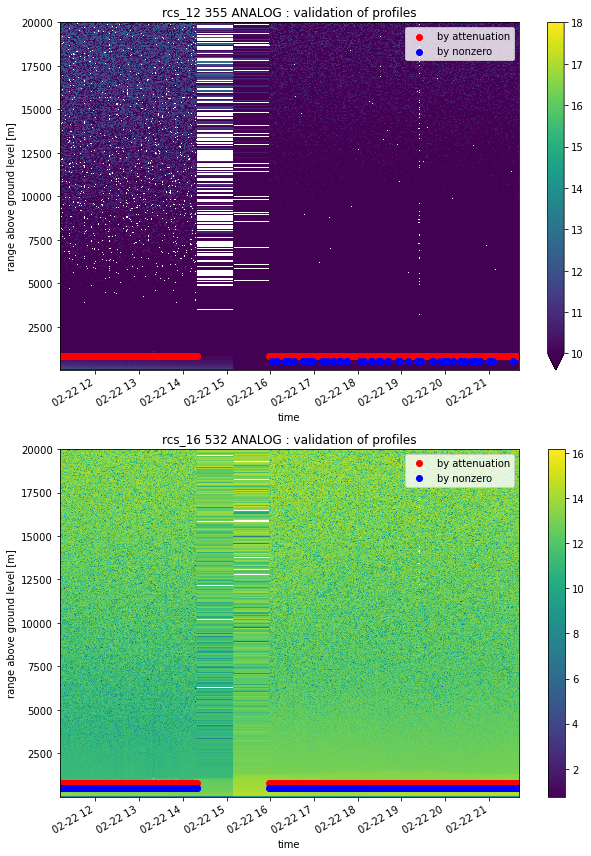

In [5]:
'''
Plot
'''
fg, (ax, ax2)=plt.subplots(figsize=[9,12], nrows=2)
# RCS 12 : 355 ANALOG
np.log(filecorrectsignal12).isel(range=limiteZ).plot(x='time', y='range', vmin=10, vmax=18, ax=ax)
ax.set(title='rcs_12 355 ANALOG : validation of profiles')
# ax.set_xlim(dateStart, dateEnd)
ax.scatter(dt['time'].values[idsmask12], np.array([800]*len(dt['time'].values[idsmask12])), color='r', label='by attenuation')
ax.scatter(dt['time'].values[ids_nonzero_12], np.array([500]*len(dt['time'].values[ids_nonzero_12])), color='b', label='by nonzero')
ax.legend()
# RCS 16 : 532 ANALOG
np.log(filecorrectsignal16).isel(range=limiteZ).plot(x='time', y='range',  ax=ax2)
ax2.set(title='rcs_16 532 ANALOG : validation of profiles')
ax2.scatter(dt['time'].values[idsmask16], np.array([800]*len(dt['time'].values[idsmask16])), color='r', label='by attenuation')
ax2.scatter(dt['time'].values[ids_nonzero_16], np.array([500]*len(dt['time'].values[ids_nonzero_16])), color='b', label='by nonzero')
# ax2.set_xlim(dateStart, dateEnd)
ax2.legend()
plt.tight_layout()
# plt.savefig(Path(OUTPUT_PATH, file.name.split('.')[0]+'_W355W532.png'))

In [6]:
def dispersion_standard_deviation(signal, id_left, seuil, influence):
    '''
    signal : est un vecteur numpy
    id_left : le nombre de valeurs avant la valeur actuelle que nous voulons utiliser pour calculer la ligne de base mobile.
    seuil : le nombre d'écarts types par rapport à la ligne de base mobile qu'un pic doit dépasser pour être compté.
    influence : la quantité d'influence qu'un pic a sur la ligne de base mobile. Celui-ci doit être compris entre 0 et 1.
    '''
    peakIndex = []
    processedSignal = signal[0:id_left]
    for ids in range(id_left, len(signal)):
        y = signal[ids]
        avg = np.nanmean(processedSignal[id_left:ids])
        sd = np.nanstd(processedSignal[id_left:ids])
        if ((y-avg) > (sd*seuil)):
            peakIndex.append(ids)
            print(ids, len(processedSignal))
#             ajustedValued = (influence*y)+((1-influence)*processedSignal[ids-1])
        else:
            processedSignal = np.append(processedSignal, y)
    return peakIndex    

def verification_by_SR(rawpath, wave, id_Z, mask_profiles):
    '''
    rawpath : le chemin du fichier Opar --> le nom du fichier 
    instrument : LI1200 ou LIO3T
    ch : channel du données 00355.o.Low ou 00355.o.VeryLow
    id_Z : indices des altitudes à étudier les nuages 
    mask_profiles : indices bool des nuages détectés à vérifier
    '''
    # Retrouver le fichier calibré correspondant 
    OPAR_RF_PATH = Path('/homedata/nmpnguyen/IPRAL/RF/Calibrated')
    OPAR_RF_FILE = Path(OPAR_RF_PATH, rawpath.name.split('.')[0]+'.nc')
    print(OPAR_RF_FILE)
    # Caculer SR, range correspondant aux profiles à vérifier
    datacalib = xr.open_dataset(OPAR_RF_FILE)
    SR2Darray = (datacalib['calibrated']/datacalib['simulated']).isel(range=id_Z).sel(wavelength = wave).values
    Zlimite2Darray = np.array([datacalib['range'][id_Z].values] * len(datacalib['time']))
    # Retourner des indices indiqués les nuages 
    zcalib_top = datacalib.attrs['calibration height'][1]*1e-3
    selected_indices_profiles = np.where((np.ma.masked_array(SR2Darray, mask=mask_profiles)>1.7) & (np.ma.masked_array(Zlimite2Darray, mask=mask_profiles)<zcalib_top))
    final_indices_profiles = np.unique(selected_indices_profiles[0])
    return final_indices_profiles, zcalib_top

In [ ]:
limiteZ = (dt['range']<20000)&(dt['range']>3000)
mask_profiles = np.zeros_like(filecorrectsignal12.isel(range=limiteZ).values, dtype=bool)

for t in range(len(filecorrectsignal12['time'])):
    idsmask3 = dispersion_standard_deviation(filecorrectsignal12.isel(time=9, range=limiteZ).values, 
                                            id_left = 5,
                                            seuil = 4, 
                                            influence = 0.1)
    mask_profiles[t, idsmask3] = True 



<ipython-input-160-2e9b8655953b>:13: RuntimeWarning: Mean of empty slice
  avg = np.nanmean(processedSignal[id_left:ids])


2257932.388973236 nan nan 4
2384415.394628048 2257932.388973236 0.0 4
6 6
2336281.622314453 2257932.388973236 0.0 4
7 6
2315520.3845858574 2257932.388973236 0.0 4
8 6
2192524.3055820465 2257932.388973236 0.0 4
2288791.506779194 2225228.3472776413 32704.041695594788 4
2213934.313774109 2246416.067111492 40135.70944101585 4
2391863.3407115936 2238295.6287771463 37496.41230139193 4
12 9
2082078.2202243805 2238295.6287771463 37496.41230139193 4
2260124.6014237404 2207052.147066593 70918.30050115036 4
2332405.6663513184 2215897.5561261177 67693.2598475984 4
2184649.9875068665 2232541.5718725747 74765.57792750443 4
2251194.5387363434 2226555.1238268614 71707.86643672865 4
2209020.285630226 2229292.8365945816 68048.83050473263 4
2144390.40184021 2227265.581498146 64842.63156897522 4
2291991.256392002 2219731.4742565155 66256.78256877247 4
2206848.416662216 2225753.122767806 66505.59293821784 4
2280597.6511359215 2224298.914605838 64094.775521991076 4
2173362.3413085938 2228320.252929415 63442

1276855.5002307964 1601345.147028109 367367.88214236643 4
1035586.416721344 1599993.10683312 367197.1214832923 4
891369.0013623186 1597651.1703596273 368226.24829176144 4
988764.0741348267 1594732.6490001343 370247.2959372729 4
943105.1094508177 1592238.9511611825 371515.56673445366 4
906424.5047092438 1589578.5665640088 373065.6952540966 4
967221.1646294616 1586790.182638071 374842.7139123426 4
1120452.8686523438 1584271.6093941336 376151.5386147467 4
1163581.295404433 1582393.8007271627 376542.93614538223 4
992795.9664344788 1580705.040625055 376719.1164147284 4
904013.8646340542 1578343.9600058158 377796.0689644534 4
1027298.0260848999 1575646.6396243286 379434.5253386281 4
1346017.90762901 1573461.9837934943 380250.1169088736 4
1065539.6447181702 1572559.4279356988 379764.19965986616 4
727035.5495786552 1570555.397171993 380345.7263760136 4
989458.2641601562 1567234.4528901295 383253.94512205484 4
1105780.8851456805 1564968.663914718 384202.49544491706 4
1080762.0615005493 1563174.

-4412.561812373477 1123521.3477488495 533769.7479706795 4
486953.4484863281 1121440.2888751205 535469.3692846247 4
332642.1147799146 1120271.804822839 535667.2704803426 4
636869.24671171 1118823.9561279071 536237.1069211307 4
264875.8962010849 1117939.635560171 536141.8097562763 4
500854.9026489258 1116377.247759147 536891.0074502405 4
353646.2399458492 1115251.9783896585 537044.0831569528 4
83115.04153249413 1113862.186896148 537537.516557846 4
566278.4962868538 1111984.6875421158 538843.1770436214 4
374049.45373535156 1110992.4944671064 538854.8211082442 4
92582.80699019857 1109655.0297833825 539278.5804791894 4
13163.417949622126 1107812.5076406412 540523.0061964428 4
368143.71249442076 1105833.0336990661 542032.9360248793 4
573759.1358184814 1104501.4645272167 542448.0534049652 4
-272243.3120751006 1103545.1720430567 542426.3462114927 4
496270.2096366866 1101070.7323234198 545064.5281218386 4
111973.50404023731 1099984.9145089013 545176.5578112825 4
58282.03125 1098214.2847410364 5

-315595.35888674215 926449.7208132963 606354.2266352476 4
44950.38986206055 924700.3615461132 607714.8445707394 4
-174727.53925561396 923463.0198137867 608181.6496664302 4
-6639.011058757965 921920.6173431836 609144.3921816756 4
-292428.2651614462 920618.2896736156 609708.1818129765 4
-201886.9010925293 918919.3449189446 610967.6175413685 4
123711.4607501116 917351.7837357117 611975.353157018 4
97903.90433320023 916243.3475304246 612265.6612095914 4
-884431.5019750005 915102.0093948636 612600.2849141245 4
124548.486328125 912595.6953121759 615841.1733511596 4
427419.7989439313 911499.6630326431 616113.1321307658 4
-112261.49111741401 910827.3298880755 615949.013042253 4
-482482.64334913663 909408.3440059597 616698.2386853013 4
6430.33390045166 907480.5171536673 618441.2433251529 4
497379.859917101 906234.2513400391 618919.9970514782 4
-166390.61137201622 905669.5353297865 618678.7852819564 4
-193398.85003811066 904190.8316791632 619530.921322381 4
59874.75357055664 902679.0001616462 62

208502.0996953118 726843.9598759412 680201.063295169 4
-50110.37342555228 726288.3951812139 680047.9774204897 4
727896.533203125 725457.1331163243 680157.9277136017 4
-609962.7227425289 725459.7421003743 679794.1142691306 4
1210943.7455081022 724033.0086977644 680830.0640210005 4
310495.9153343234 724552.6572962812 680652.3585038165 4
-311560.69568627607 724111.2321982408 680423.6204468189 4
1317881.5392278354 723008.2801983638 680899.64802222 4
-393438.9105416275 723641.1240909484 680813.6123207062 4
292520.04940277274 722454.0039691284 681424.4675119928 4
313242.1875 721997.5984971896 681206.5704535235 4
111113.57978355564 721564.1357071607 680975.2509352646 4
903148.3662032945 720917.4719826654 680904.1003723969 4
-51053.250203159485 721110.3089077666 680569.5286961648 4
71045.34126289876 720294.0683590234 680672.3692839723 4
234357.160394241 719608.4836419208 680639.6068652741 4
30375.423564921788 719096.6151574824 680462.8686120103 4
255595.2345014712 718370.8815520109 680471.2364

-251957.65801434836 611794.915631207 737213.4110371765 4
-305440.2246594985 611016.0584863508 737336.8838460466 4
198903.35083007812 610190.4221952285 737517.3687920526 4
464990.07271522924 609820.2268114615 737288.5467437059 4
-519935.6676673634 609689.9838671302 736969.74389454 4
-173926.53098810214 608675.0461748262 737415.6837065471 4
173291.6398619529 607972.5312940696 737457.1524849514 4
-1218069.5126151755 607582.6829609466 737241.2141046749 4
334670.7724477412 605946.7938968103 738932.653822206 4
120351.33958800597 605703.9326421557 738646.3712826818 4
-927895.8251953125 605269.8068880823 738458.5055837096 4
-713830.8582209597 603899.6856797861 739548.7686095103 4
-580145.849285015 602723.1405513033 740265.5157862696 4
-1093988.1890988406 601667.9496593887 740777.4497049473 4
40240.164718610395 600156.6696783208 742174.1534901232 4
-772313.7027929827 599658.0797362373 742031.6046449322 4
2194642.68078804 nan nan 4
2398891.9741630554 2194642.68078804 0.0 4
6 6
2262524.6337890625

1015155.7525634766 1503822.673513398 364651.4685871112 4
862599.4329996064 1501978.647396606 365193.9641793297 4
836837.260723114 1499574.9661394744 366601.06288643635 4
1012988.8433642397 1497092.8024487763 368146.49878228235 4
1249577.81124115 1495286.4443924907 368642.55164707464 4
995312.1200389697 1494373.029399363 368260.4186832632 4
928683.4273338318 1492524.6556609913 368825.8261814339 4
1025827.9627270543 1490444.0607225148 369728.7133573974 4
947462.4755859375 1488735.9133034137 370118.17770425504 4
1113213.7427754314 1486753.226718368 370883.97702925425 4
1170616.4338588715 1485389.9439302548 370891.19773138454 4
1163946.6013736848 1484245.3129845406 370700.75623489235 4
882768.6309814453 1483084.8104062406 370528.698316882 4
1115881.830818198 1480917.6039823245 371607.57706251665 4
1020461.1152172089 1479604.52566159 371581.8257321584 4
1020680.8957881881 1477958.8503553378 371928.83787686453 4
726591.1720275879 1476325.7148033122 372264.89318209636 4
877205.253810394 14736

578222.9639320294 1120666.2307822793 508409.56688693375 4
712957.37683247 1119612.9428854827 508476.768144988 4
205687.62302398682 1118824.8507032094 508298.5554790215 4
-103441.23275800385 1117058.6278256867 509389.20508659387 4
668444.9482707991 1114702.4504886526 511709.4910686209 4
299937.5083632388 1113842.6094439167 511590.7085224166 4
427355.8319091797 1112277.4073264538 512340.91361779824 4
758464.0672511723 1110962.7785828507 512726.1212048687 4
718063.5825901068 1110287.493695242 512466.6227240147 4
830551.6995258227 1109537.5435784063 512263.09642419586 4
628075.7566452026 1109005.1278454815 511918.8840630318 4
997514.9959869309 1108089.0719003382 511860.82015420566 4
177024.5896605914 1107878.855025978 511396.71278265264 4
168890.21058751433 1106112.5281467268 512514.79533761635 4
134873.8494873047 1104337.4858786224 513648.11899959313 4
-236454.95473675884 1102504.851405293 514887.3297383384 4
412895.0789718159 1099978.512148421 517672.716170529 4
40368.37932536935 1098684

346153.48211626353 905509.3637412363 581814.1153679402 4
319808.5722235923 904730.3165523434 581782.9177715634 4
374759.7604461421 903916.7953502171 581786.7262969036 4
8795.98388671875 903181.8550239616 581716.4673027317 4
444377.01878024807 901941.3753136464 582265.0918565684 4
-359553.78281783604 901307.6296674783 582110.5055659495 4
541958.2091579218 899563.6996363782 583592.1329396098 4
-388478.10916900635 899069.7694009108 583340.16814252 4
-197146.0645546594 897293.8412925384 584893.0078729896 4
517950.52159115876 895786.3483092778 585897.7783831613 4
257041.7027302203 895266.6291528568 585662.1238145959 4
36560.687255859375 894389.9465616168 585736.9045616515 4
119661.36056850058 893213.2260413072 586195.474318044 4
-18826.545497883442 892153.5659516185 586492.1089910767 4
120126.29648537948 890907.355128842 587057.2057732973 4
440853.9093017578 889854.3755405314 587346.453446365 4
-312106.657015242 889241.8237448442 587179.599143737 4
526710.3089598902 887605.1091933999 588450

694080.3890234337 706263.239429664 662510.4700361028 4
1121234.5846919585 706250.5224668182 662164.7187120802 4
824472.2305363457 706683.2482876995 661954.9034088044 4
1253156.396484375 706805.9451442085 661620.9560293753 4
613178.7103123508 707374.467986394 661511.2031443124 4
592798.8074093589 707276.5513983751 661174.2607012672 4
-7666.914379209766 707157.6752363928 660841.1685860427 4
1003541.1805267824 706416.1559525591 660899.0366943834 4
1112963.9875780419 706724.0575324289 660625.686446533 4
251312.8637105024 707144.5957622897 660412.8807829845 4
-526788.3972214573 706673.2082420707 660233.894277741 4
750320.3567504883 705398.9710463438 661081.3680074833 4
1142110.5112623195 705445.3295455225 660741.7389450326 4
-72940.21794511868 705895.4998359523 660549.7214545166 4
-51358.599161043 705093.4033191849 660681.9471387749 4
14194.607841372921 704315.1605182793 660787.1504582526 4
-575652.8135175136 703605.8896522188 660817.5856282128 4
-379697.456190023 702292.4823594367 661747.6

1386315.319835657 1874753.7260336562 267527.88825544453 4
1255749.6643066406 1871561.3181500093 269541.25605110714 4
1503117.742526053 1867562.5411770004 273179.835548301 4
1173855.43384552 1865211.2844115105 273856.04154073074 4
1343060.4584689017 1860779.5161386514 278497.1615640881 4
1273703.1801223755 1857481.9425229207 280647.45627288375 4
1449279.0340538148 1853787.1402292463 283562.67436359165 4
1455185.6065750122 1851243.064089778 284472.6841316475 4
1594551.9863123999 1848767.7049803108 285294.90991703357 4
1452549.6002197266 1847188.7253612555 285107.95525511465 4
1325549.9303932067 1844752.6813789003 285902.43318670423 4
1226311.8410110474 1841567.3884280678 287893.0260462082 4
1295892.3693771297 1837815.8302121104 290983.00088988256 4
1323980.5555343628 1834531.4456009893 293133.15485749394 4
1184784.4008798471 1831455.8378295037 294907.1185791735 4
1310537.1231079102 1827583.553775913 298225.6357289629 4
1251114.4118661927 1824505.8964505082 299984.9222136032 4
1458205.945

237022.8370647296 1254323.5469641564 520277.1842388223 4
560301.5944238154 1252131.0885376488 521852.997517447 4
424274.08447265625 1250643.2831739634 522275.7777135366 4
881208.4974880526 1248869.958713231 523114.6302738864 4
613783.1638316783 1248082.6750703503 522830.54469096445 4
747576.4068121492 1246727.3342343704 523092.2944817478 4
478123.06365966797 1245663.0465426384 523041.3298027342 4
619244.9333186261 1244029.9827492703 523680.1876721076 4
586073.50969122 1242703.4752133242 523913.8372768325 4
988351.5612120995 1241312.3100321332 524228.6874787566 4
533110.5422973633 1240777.50929467 523803.12008919666 4
287247.01905202924 1239284.5410098657 524256.7738724006 4
600095.146558761 1237280.2514899545 525519.4432202703 4
694282.2315092023 1235941.627319931 525777.1905997662 4
489506.5475463867 1234806.0730310197 525809.7622425668 4
998747.2190613566 1233246.869002809 526362.1828148457 4
26071.457813276767 1232757.3081469815 525921.3841165282 4
-146538.11968611873 1230243.379292

-229640.2645111084 1026883.8320198852 586367.4700025716 4
617318.5040627082 1024962.5413524066 587972.3951619023 4
211037.65706825047 1024340.1840435673 587738.927174143 4
336404.9619788467 1023100.3936061049 588147.3057556249 4
-425199.57275390625 1022055.195080036 588308.9185127917 4
360844.5944542167 1019855.7197489813 590558.8438134985 4
213000.6117801726 1018855.702866895 590667.8800354605 4
958300.9538921898 1017634.7103046424 591051.9247480646 4
271439.3154144287 1017544.9466792076 590609.1684333065 4
490704.99649383855 1016417.8988978409 590873.843634976 4
-234992.89546198648 1015624.9684266433 590780.4414639827 4
724324.1366620414 1013741.5077882569 592324.0981745864 4
494132.1968078613 1013306.2936963377 591984.8103225641 4
506963.66242126137 1012526.753010319 591881.6858814901 4
508139.91274643975 1011768.7873572621 591761.2117608103 4
532579.8928651669 1011014.8519162278 591638.6088087512 4
334920.5268859863 1010299.7025006058 591485.1320122019 4
288782.00649358146 1009291.

-418898.806335491 832616.8014704298 652465.4774534077 4
96990.73961925476 831154.7505267311 653484.1352960434 4
131784.88540649414 830298.0830694295 653583.519888873 4
201156.87212895154 829483.9651234354 653637.1761360422 4
-231502.9600163473 828752.5016857235 653607.8720733552 4
427480.10753731313 827519.6464976979 654226.3553123744 4
-58495.57456970215 827055.0245012281 653988.275736005 4
-354851.79432307003 826027.7036206354 654303.5851714729 4
1634208.333156482 824659.3612128213 655157.2949863299 4
430729.2418832605 825596.3391896078 655356.3439618765 4
-549521.6583251953 825139.8454354964 655114.8457155995 4
-725947.0063929791 823552.4764935095 656398.8517969326 4
820016.53141777 821765.2798581156 658125.0370901431 4
-587846.4713778559 821763.2651709723 657745.826229279 4
240606.17694854736 820141.1596053236 659102.1384322491 4
-6504.294547081574 819475.0274413502 659015.8600040933 4
666672.6220111627 818526.7159350489 659231.1170434009 4
-308147.0344072318 818352.5713319252 6588

901139.9894714355 665217.5785757962 715869.6676286283 4
-1807646.1387205464 665435.621469415 715574.6942860397 4
-491319.22993857873 663152.0741377531 719177.6716424188 4
-85506.85242079652 662087.0637096383 719699.7819267439 4
-212865.54070272535 661398.037058827 719725.6587231547 4
449364.1971545121 660593.0061400777 719882.7686455419 4
143736.88425811674 660398.6834087203 719580.0551406009 4
-137098.32795889836 659923.8104315598 719419.6717060225 4
-86137.15209960938 659191.9260069588 719494.399200639 4
170018.24432551683 658508.1378619069 719518.2009424866 4
-394579.8828142528 658060.3927715895 719340.2778025444 4
16335.965354883878 657096.4364752655 719715.4643112529 4
866591.0755080888 656510.1963370034 719646.9476421224 4
-35262.75571248116 656702.2263910903 719345.981716824 4
-86917.67497237219 656070.2949005847 719321.1741412348 4
870448.5983205772 655392.386168949 719342.8034023634 4
-890829.3479919434 655588.4264717306 719044.1508124607 4
120155.47639831288 654180.0314130206

1349267.5638198853 1726159.3354940433 352793.88629102195 4
920716.3903532199 1724398.158990893 352905.92532786046 4
1340424.4176864624 1720660.1042530437 356305.4274788564 4
1014028.6073503576 1718899.7538522722 356415.5705191688 4
1207922.2915649414 1715651.4997209269 358783.6495357153 4
1114508.0985007454 1713322.4666559913 359600.2169043895 4
1249776.6813755035 1710588.1544726342 361042.54286807775 4
1066649.8730597354 1708493.5568676472 361552.26070572116 4
1147037.8652572632 1705589.286805168 363296.29292273853 4
1155212.6941857496 1703073.2894108081 364401.7792523901 4
977399.4326591492 1700616.5154411888 365421.8463706674 4
1282121.111815938 1697387.8677501972 367779.2609399418 4
861351.4984130859 1695542.2377238227 367999.2454095955 4
1148291.6143117102 1691851.128257846 371335.0116616105 4
1156466.4758205414 1689456.5929541185 372260.77682190045 4
965652.2305188278 1687118.9170017783 373109.60961654823 4
1120771.2816238403 1683968.4074538178 375321.1097479259 4
1056056.4117369

485597.3940601386 1165529.926662072 561904.3664957244 4
104059.97123097199 1164232.3454929844 562151.7147670168 4
398389.612197876 1162212.9695420093 563515.2408371555 4
325755.8034358345 1160760.8338816592 563961.6892652039 4
786591.8800582722 1159176.384108517 564597.010516405 4
376975.6166515767 1158470.7316387251 564294.6666964784 4
394502.783203125 1156993.4251831728 564782.12792789 4
958581.9013771536 1155554.7635945312 565218.4545706976 4
869866.845630663 1155183.8165847056 564750.5540333837 4
514270.45213557046 1154647.5064889274 564354.8544606573 4
6462.621688842773 1153446.0486008348 564505.7927877103 4
717940.896266502 1151298.1395616736 566152.8401054906 4
56843.372081741705 1150488.126022804 565933.1124558344 4
326294.1551861856 1148447.7440191829 567371.1658510672 4
1213177.4505615234 1146916.731749475 567949.789185428 4
412670.4381284527 1147039.892936858 567428.8869718463 4
668267.347740163 1145677.4264158779 567782.424904947 4
636040.9817753186 1144793.3336775894 56762

766632.8531938173 937824.2248539024 625100.1371792359 4
369339.41280751134 937588.7484142049 624702.2927213737 4
983155.18124672 936808.1861400198 624627.7591468797 4
330862.060546875 936871.7622649948 624201.5550586109 4
211097.6326164971 936041.6119886686 624176.4453234783 4
157945.10428818502 935049.8965586107 624324.6159985991 4
265693.8510612909 933988.2779899354 624557.9236317788 4
387542.3812866211 933076.5529873043 624619.0121943472 4
-273068.24328135967 932333.3184209545 624517.6377217007 4
402731.08513262577 930693.3162961894 625672.2854524766 4
552692.0705971944 929975.9763081955 625549.4702538422 4
-247626.06811523438 929464.0578472578 625279.1884997645 4
609555.5017766849 927869.084776848 626353.8708512099 4
-235023.55535125083 927438.3492112185 626039.3090952628 4
530027.3188787274 925867.4547455936 627071.9457322573 4
380475.2094268799 925333.2575311982 626817.1473666471 4
-785682.8395648511 924598.9474933218 626713.4730371237 4
849876.0109652877 922297.0877530014 629422

991869.8407135668 776929.3320666254 671713.3981633263 4
-43478.56387706086 777161.4492465898 671387.7202917231 4
348388.36963075073 776276.1849390131 671566.0148113787 4
702534.0224680534 775815.0989311378 671350.8772404868 4
546344.2199707031 775736.2172557202 670993.7529130054 4
232048.260801749 775489.5591941234 670675.0449364588 4
1002354.7564735069 774905.8413655601 670551.0791494999 4
-578002.9510101856 775149.8852658905 670232.61089046 4
-24185.602859514347 773699.5606825291 671335.0056588827 4
749611.6755919823 772845.2939121416 671482.7091007589 4
512411.852573432 772820.4451224944 671123.9610354531 4
-462621.18038176355 772542.2308142155 670819.3039954078 4
-603070.140838623 771224.0201299081 671673.099031082 4
-824043.7757634916 769758.8877621378 672811.3878739753 4
-585153.4317264745 768061.547332398 674459.3584566717 4
637115.934832581 766621.956929144 675542.3730471467 4
176396.06923668005 766484.3309758 675196.513214937 4
75962.7205408736 765857.9103157797 675111.5630182

2525109.5665454865 nan nan 4
2356997.70001173 2525109.5665454865 0.0 4
2335636.422729492 2441053.6332786083 84055.93326687813 4
2368135.3033304214 2405914.5630955696 84733.55367405692 4
2314216.343164444 2396469.7481542826 75182.74354199368 4
2381099.013876915 2380019.067156315 74862.91179475012 4
2327674.896812439 2380199.058276415 68341.36097079393 4
2342773.9413142204 2372695.606638704 65887.26816982786 4
2437423.5267162323 2368955.3984731436 62421.267957119686 4
2395432.0335388184 2376562.968277931 62661.63638241316 4
2205822.8965759277 2378449.87480402 59714.959204987776 4
2117906.6731095314 2362756.5131469206 75528.28461130553 4
2297572.9692935944 2342352.3598104715 99039.23045330626 4
2331126.7277240753 2338907.791309173 95899.05677019837 4
2236629.3382644653 2338352.001053095 92432.3685086141 4
2264454.6842336655 2331570.4902005196 92833.20715373589 4
2263959.779548645 2327375.752327591 91341.7564199644 4
2276820.2283740044 2323645.400987653 89862.0135667544 4
2253686.572265625

1153925.171514017 1621321.3974348232 404055.5222895226 4
820306.1113357544 1619590.3003017833 404304.72021897853 4
858449.4525508905 1616640.912150617 406457.6549572559 4
1259095.8264827728 1613853.4435491473 408296.5937515525 4
1110497.4467115407 1612553.9650983547 408111.2282424254 4
953569.3359375 1610721.642038549 408489.26889793767 4
1112715.864773253 1608331.9972890907 409660.0501141203 4
880075.2416610718 1606536.2866640333 410000.0815173935 4
1054434.621985421 1603913.683613481 411572.04509435454 4
790983.9569091797 1601937.1402263297 412146.076857258 4
1045266.8377952755 1599030.497992218 414251.4428918404 4
1060372.2192764282 1597052.7706343718 414828.4798844503 4
1035813.5995106508 1595142.8754338096 415321.11648401193 4
869443.6500549316 1593159.4382851457 415915.1569643912 4
1233877.1412567932 1590602.138680092 417394.7534619906 4
1176713.8481140137 1589346.064745503 417194.71529033105 4
1141099.100347032 1587898.232406445 417176.2813745636 4
843163.11378479 1586335.997678

1035523.0642318726 1230657.6752624777 537934.7671879014 4
866005.4043250431 1230275.8071391303 537477.3431041115 4
428337.397701223 1229564.341508634 537193.0114854603 4
421641.27617647714 1228002.4956142725 537831.5333603042 4
889058.3038330078 1226433.6994675065 538481.7039761797 4
986627.1226005927 1225778.6016119055 538163.633287439 4
711251.5230006842 1225315.1297533563 537744.7741366134 4
864632.2853999082 1224320.8094308174 537699.0565281715 4
683235.2640151978 1223626.4300407963 537411.7660385495 4
412691.94932750193 1222585.2139212864 537416.513926157 4
992342.8456611971 1221027.7268739906 538070.6882739748 4
439128.3191518644 1220588.7923611063 537647.2355563388 4
513057.83615112305 1219091.741646146 538217.828759976 4
530665.9771160892 1217741.772419578 538586.9051230211 4
743337.6384562968 1216430.5590697622 538907.6527290466 4
12273.495348012608 1215529.4296971653 538789.1798585692 4
608564.5648956299 1213241.8708866155 540822.6851798127 4
577433.2445102206 1212094.4756190

-358155.87787628174 1012443.5226790113 608800.4281870812 4
207851.977569085 1010493.8791504832 610556.3997115695 4
170513.38680455348 1009353.7628130097 610871.0229803887 4
145586.53404279312 1008163.9183080331 611253.4423644132 4
576913.6505126953 1006942.1373104902 611681.2377828697 4
997532.0549087309 1006333.8933404792 611462.1128409998 4
286650.0875778805 1006321.4613652931 611030.2261414537 4
670057.6974572423 1005306.410062349 611196.2142864501 4
-83089.33010101318 1004834.2287769897 610895.0364683921 4
211527.2219005365 1003304.0971892569 611825.2905608531 4
-134789.09551422074 1002192.0510160987 612114.121160298 4
598765.9444647393 1000597.4070518204 613162.8914697001 4
664539.2990112305 1000034.617888533 612917.608072771 4
-484786.297516404 999565.3936663271 612617.1617430517 4
615646.6902084777 997492.2767792004 614693.8765698062 4
188346.60213621255 996959.7166863541 614430.3447513239 4
761381.0897827148 995833.5145769529 614742.4189603024 4
293538.8787213025 995507.4333185

317331.4653009592 821480.6680803479 671266.8809646879 4
9834.834030153614 820931.4859422441 671107.252819284 4
-1360073.958474177 820048.8998139392 671274.8669000637 4
686281.8513698099 817679.2010549305 674744.9684663711 4
1035854.149131677 817536.5329228076 674392.4415684433 4
9828.863525390625 817773.3199252033 674064.9248107981 4
1136629.6056318786 816897.9738185947 674223.7903630614 4
-262603.416364544 817244.0037231544 673940.8499504928 4
-146192.68264154307 816076.6011068434 674510.5633811726 4
-830040.0374144424 815037.4334138107 674886.6994100775 4
460043.6267824877 813262.8083104361 676680.8432752776 4
794025.3678151442 812882.1841924103 676415.4337892102 4
382988.9226154945 812861.8862199914 676051.562873915 4
-717890.2130126953 812399.6572268682 675834.8576018169 4
364644.56839141867 810755.9516734423 677329.1625768906 4
621928.4177130907 810277.2913909508 677123.2188668699 4
-642585.9257369185 810075.4169282737 676788.3085116991 4
-148419.4752426589 808520.1049982252 67809

-255626.86746541155 687246.4312018997 727416.7877126959 4
1685476.2149638191 686407.5759539751 727636.3464972295 4
1742014.5776839855 687295.6369664283 727922.0230495498 4
-1013937.988349925 688232.3322956623 728276.7103679185 4
121976.22959039304 686721.9770865713 729715.6631697925 4
2368116.8525218964 nan nan 4
2395080.8962225914 2368116.8525218964 0.0 4
6 6
2487527.5451660156 2368116.8525218964 0.0 4
7 6
2281117.0605897903 2368116.8525218964 0.0 4
2376945.4658031464 2324616.9565558434 43499.89596605301 4
2301908.009469509 2342059.792971611 43243.48564226468 4
2301168.5382843018 2332021.8470960855 41288.98594140452 4
2321546.487593651 2325851.185333729 38937.5468461644 4
2373412.04123497 2325133.7357103825 35581.13917711515 4
2208918.7502861023 2332030.6364996093 37021.09223459706 4
2405182.749938965 2316641.650722921 53450.79320373126 4
2260254.6881318092 2326479.5506358147 57565.775066425485 4
2302141.4690494537 2319857.064385414 58113.27327150969 4
2487811.9852781296 2318246.55571

924334.5154037357 1657305.9719044678 402222.365590884 4
1038036.1747741699 1654397.355013592 404059.7840983333 4
990732.2603216203 1651961.144815017 405110.65886244 4
1125171.3927268982 1649357.8814902399 406427.2397306351 4
1270554.9706449586 1647302.2482009719 406950.4071695936 4
1056167.4682617188 1645830.5791480185 406834.1267257528 4
1047552.8336634502 1643536.170156243 407697.985434768 4
1005694.9027061462 1641226.1572241005 408588.7736287617 4
1056583.3790888814 1638772.368596618 409699.4627266451 4
1114521.0702896118 1636533.1801754343 410495.6463561492 4
1320477.4386277273 1634533.1337774044 410975.7954975256 4
841207.7593803406 1633334.4479180544 410647.61177159945 4
868477.8469791271 1630322.5593684814 412755.3786706353 4
1191377.7740478516 1627436.7839427642 414622.5489714386 4
1172576.5557160522 1625791.2782450477 414702.25948143285 4
1191226.8055915833 1624087.4634986978 414850.23955941474 4
1240973.3120670107 1622466.2625327536 414915.98558853206 4
1180589.3199920654 162

651329.047056153 1216137.2675067657 557258.868626783 4
512892.9696550084 1215023.2473480862 557272.7460327294 4
256419.42558288574 1213641.101132155 557593.1538463186 4
672518.974565456 1211760.508449347 558655.4459351101 4
312905.9916458597 1210703.1721083983 558617.0389665754 4
140383.84590051632 1208946.2304636573 559478.8784299548 4
765029.5257568359 1206859.1945563075 560919.8045881577 4
838494.3277230391 1205997.9281453923 560711.6037768567 4
197219.96893498537 1205282.9405959325 560399.9318419719 4
795370.102058878 1203325.5367674646 561611.6419686391 4
-97347.94979095459 1202534.9254598897 561353.9795876094 4
703625.7271041389 1200020.6452369674 563711.5622948776 4
368097.10015867813 1199062.3538892206 563588.5388284343 4
594726.8638243413 1197461.2647683527 564223.288471547 4
475131.4727783203 1196302.1601511524 564298.6801510226 4
209144.66620592496 1194917.9553769242 564639.8290305656 4
494059.1303786943 1193029.5007999686 565743.2241159398 4
1130738.4244909438 1191693.03737

274138.5943122404 1018867.752941546 619486.0263288296 4
9438.839384052351 1017742.784423979 619693.2836481405 4
136664.15285974904 1016221.9639940546 620460.8664613708 4
-71709.13009643555 1014897.3287363223 620930.9533293614 4
613588.5721793316 1013263.3340613858 621890.9114164395 4
90988.93255808382 1012663.2218063077 621616.5153280491 4
499640.70931150275 1011281.4012826971 622173.1673512532 4
-95750.38661956787 1010515.4721030995 622021.9078657636 4
44692.038292414094 1008861.8609540372 623024.4861251686 4
385598.35562320607 1007422.8015172287 623671.0627796925 4
339378.4307827533 1006496.0884831096 623667.6263057681 4
222083.8165283203 1005503.3538734363 623733.7427917458 4
684009.4804158849 1004339.283238451 624000.2472313007 4
531422.6461372704 1003864.0164686847 623659.0535863925 4
746557.0874519233 1003164.1033274529 623461.7630872919 4
-157118.2834625244 1002784.5071501222 623078.5072689933 4
-324644.5052317939 1001071.2090842247 624209.6589293369 4
261019.5526085585 999115.8

-382014.5099201363 878310.130617323 655479.6976185156 4
250291.8617791801 876756.0928361425 656566.850009898 4
-367685.53733825684 875984.585162427 656530.1733620113 4
219512.38852207016 874454.8556144558 657572.6825960294 4
140319.22039601006 873650.257989035 657568.9655770637 4
172467.38439699888 872750.4653048719 657666.6574852065 4
476550.0 871892.2752547396 657720.0135110619 4
93111.30236290357 871408.3801809883 657462.693542179 4
-2917.5585308735367 870456.9167606728 657623.2793476878 4
-131638.28617850374 869390.5254599506 657928.9892346314 4
496380.366897583 868169.758616489 658455.1590394261 4
174458.58265825754 867716.9091746877 658181.7867581999 4
-585141.163639032 866873.529215422 658225.054247447 4
-35462.7600918483 865109.234327385 659766.9674048376 4
-457630.0392150879 864016.3071496917 660111.5427402941 4
-344598.83095124416 862414.3115783405 661312.1619775823 4
274056.2771759242 860953.0365873845 662243.1265004325 4
715406.051427924 860243.366987129 662156.8154540384 4

1130377.944946289 719269.8089509729 724908.4414360967 4
-249259.93221769447 719680.5063895297 724662.6481130124 4
933236.4384612637 718713.499963774 724946.8272370257 4
196957.43638933633 718927.3812583876 724616.9767851386 4
-1101237.434211654 718407.4908750519 724443.1530922992 4
422004.3088588258 716596.8989097914 726351.8647681806 4
-318753.3734835835 716304.0633332 726050.1170727735 4
-791745.6992397681 715276.2009331834 726421.453592615 4
-409932.421875 713781.1395242817 727609.4303876825 4
-252493.11781031487 712667.4491760168 728107.8344492989 4
-863609.640363827 711711.8446542481 728380.0691334712 4
131728.61640792375 710153.6631656052 729701.9726224074 4
540459.6917954101 709582.0969138682 729567.7482194161 4
-299779.1250757428 709415.1448851236 729226.8976783348 4
451015.63663114863 708419.8842638604 729555.2475443986 4
565761.6311573737 708166.2840198872 729240.4868104277 4
246891.796875 708026.1219599833 728895.1986892449 4
-118727.49637139976 707572.6958782871 728680.0999

1114638.5639190674 1674353.9296864718 406302.22426428285 4
1079175.055991165 1672225.7343793714 406989.51526976144 4
1134281.9452285767 1669979.3302945676 407848.2863379453 4
1270999.6358022878 1667957.8307282808 408400.9687535764 4
1351115.7096862793 1666465.5066872055 408355.82443528617 4
1066961.0787615972 1665284.4213051796 408045.3293584018 4
958443.664598465 1663051.871519569 408913.83056703967 4
1172298.2342228892 1660432.5101555502 410399.4186641298 4
883655.2808761597 1658624.6054298736 410710.4921375174 4
1116305.0976858265 1655764.9400256164 412636.2038625755 4
1190629.135608673 1653781.6317817203 413169.0099027559 4
1055726.0687694552 1652085.1024917092 413359.6472421678 4
1260335.0830078125 1649908.6096679054 414168.84569195553 4
1008139.334271887 1648491.9786618685 414079.631436855 4
1022949.1310119629 1646171.8603850931 415115.6624106205 4
895624.3818149787 1643921.9588350097 416048.1262858741 4
777914.826965332 1641230.24093206 417708.4586017349 4
1275957.380949022 1638

518304.38012508955 1302650.8200775385 544569.8555739408 4
783798.8997683111 1300978.4396085567 545190.7374001712 4
430810.8449935913 1299878.0576088966 545131.556462914 4
529946.0966214703 1298032.9042912421 546019.8171280634 4
720713.6686744574 1296405.6017326198 546583.2550183577 4
434647.8147850371 1295188.4940517356 546645.0756594033 4
541693.0961608887 1293373.007386616 547493.7617621024 4
875514.0657887154 1291790.5233629828 548001.2636430301 4
644158.9494648066 1290915.9929899278 547757.0381938057 4
233582.65670394083 1289560.1082026633 547981.6169340039 4
412556.8410873413 1287350.9503543398 549530.3304617491 4
850086.165784378 1285524.6578506508 550406.6067747521 4
766499.5756568738 1284617.4943255126 550191.3151514825 4
416188.417182884 1283540.3260954323 550125.5196899131 4
410184.80529785156 1281740.840807232 550969.8325835711 4
860043.1110129113 1279936.3769655977 551823.057698549 4
543203.4783305705 1279068.8288954473 551582.3254790715 4
472020.9284529741 1277551.58074995

509720.60746580834 1068440.1859260243 614476.776206084 4
154277.4621829966 1067579.2928929578 614394.1529300698 4
31838.687896728516 1066174.213153404 614964.0022578593 4
703590.5367002551 1064585.3721007823 615825.195676982 4
705247.6292076353 1064031.6990403521 615514.8907380105 4
-35499.42864377555 1063482.2594234566 615203.403293949 4
392864.18437957764 1061801.8592887972 616230.8206813798 4
133824.5566825585 1060780.580395806 616313.8785571163 4
-69656.3752230872 1059367.537676731 616904.8549158829 4
-251536.3615527236 1057649.084232439 618004.5026917877 4
-92744.6044921875 1055659.440697811 619636.9735214704 4
751065.4194340471 1053916.7941952466 620778.2045732191 4
-70304.51365091636 1053457.9284759113 620419.575439081 4
238844.79573774413 1051757.834009759 621486.7103104087 4
572463.7378692627 1050529.8686951485 621819.1050799515 4
136323.59442519266 1049808.8036411125 621626.8979142441 4
436666.5546836334 1048433.0729043415 622167.8707741888 4
-36459.50021882632 1047513.123252

560218.5192528738 876250.712805247 680844.4943776362 4
627535.6404524645 875873.1355130698 680525.2289863268 4
479326.5935897827 875576.7900535702 680173.103297795 4
-485316.27260643354 875104.5013807885 679905.1102469681 4
-352725.7845457952 873484.9528403276 681117.6703853925 4
114439.70409481878 872026.9139135903 682023.0109644716 4
-504806.1492919922 871127.1666335204 682117.1262280054 4
-103179.91144795941 869494.9800191367 683355.6553900929 4
585649.9831618941 868342.5216169246 683769.9197003469 4
132106.53443145676 868007.9742341375 683434.3142516903 4
604724.7797012329 867138.1143762147 683498.1561302282 4
487593.42551043496 866828.2993411793 683153.9906363898 4
302280.5526675705 866381.0884050583 682875.1129388695 4
31291.35262820449 865716.6590343426 682747.0448705729 4
252442.7490234375 864734.9822032766 682944.5771297351 4
355053.1840547718 864015.48486699 682865.4652692665 4
-292651.9724425348 863418.1112744876 682687.0592125475 4
-2680.1223416497437 862062.8122314429 6834

328870.9259033203 703703.8500017942 730714.1803851081 4
791054.8971042548 703360.2817853886 730467.2948833798 4
227234.02370818701 703440.5882096733 730137.5735103539 4
870656.5656651509 703004.900593478 729945.4930091797 4
691801.1350404111 703158.147088059 729629.3939612391 4
615215.515766751 703147.7753875589 729296.2344380274 4
-107287.75740256203 703067.5452236712 728968.2848838398 4
228898.21313375153 702328.8439450695 729046.2385394993 4
-1481370.9411621094 701897.668507172 728854.09656426 4
-185708.99961224463 699911.0728659807 731490.4272619371 4
1530039.1579095563 699105.9637091823 731644.8476115663 4
1063696.4207273773 699860.6714241691 731740.751207049 4
48167.14131926526 700190.8309062953 731490.7090787902 4
-500176.8180142227 699599.694288356 731422.3342191863 4
74586.49086368862 698512.9402011255 731981.3726423732 4
1305916.727279278 697948.3008804582 731890.5796400808 4
101020.05615234375 698498.0010851587 731787.8062860644 4
-398218.0518284314 697958.273944298 731677.4

1021334.5458984375 1697205.8961221583 408544.7737076064 4
1414667.9262547349 1694586.2397259423 409909.2421158049 4
1268499.8534202576 1693505.4740368642 409485.2834805534 4
1297212.6454143312 1691870.8370344928 409542.84161598864 4
1032346.0258483887 1690358.7366834579 409484.05297537043 4
1006583.751526346 1687847.2377871408 410710.957898636 4
1182606.2428951263 1685256.882326073 412068.0932732366 4
1319529.7917156017 1683352.9026312588 412444.35105616576 4
1168909.7717285156 1681979.9852315772 412269.3671299869 4
1211390.2485041558 1680051.1498424679 412689.9182328949 4
778137.3692035675 1678295.8655677927 412909.97131521296 4
949957.5279383733 1674937.0652082246 415777.1536612122 4
1302790.5000686646 1672241.973991608 417342.33212446666 4
1037749.8171477272 1670873.635199301 417172.8579646706 4
1021190.6224250793 1668537.384948188 418168.24620057666 4
938035.3096037107 1666157.4336153823 419233.57080701453 4
1300207.2143554688 1663490.3196080134 420770.55547687353 4
1485497.8050617

654210.4240326923 1256759.6342771421 555775.9692310985 4
227842.48580932617 1255603.1098812793 555868.311837571 4
674007.8074841388 1253634.2197968503 557151.0721674905 4
155989.4805069502 1252525.9474979732 557193.808913082 4
368182.5803308283 1250433.3206525703 558715.2341818792 4
671398.5975265503 1248752.8430519577 559506.8327246313 4
705981.2755255604 1247655.2114064721 559540.2266771036 4
601162.2767562817 1246627.3671258632 559505.9209476967 4
709839.0637068335 1245404.8953637995 559679.8657937354 4
373231.7138671875 1244392.4835837297 559634.3460816407 4
721982.5146107647 1242748.784018227 560382.8160122088 4
483209.3282337557 1241768.056580548 560309.9828649858 4
584405.5890588241 1240342.1943092195 560746.5716577728 4
444099.61223602295 1239111.5440179426 560938.9397640309 4
236057.09568549803 1237622.757628838 561466.5116651899 4
589174.190341975 1235750.6722794115 562607.2458611081 4
313026.9884496199 1234544.3728728117 562774.2775554152 4
507945.3071594238 1232828.32560200

-342084.7579440427 1039281.1289008204 616499.3486399107 4
347930.9434890747 1037332.7990181056 618241.8138556855 4
566533.4714451239 1036361.8104891914 618347.0358179124 4
272347.3004454878 1035701.011137512 618162.8541886138 4
517577.98431203555 1034628.8851393491 618389.7503567825 4
479924.8695373535 1033903.7085603487 618258.8268932779 4
-424085.0356789022 1033127.8278334257 618172.9861735652 4
533927.8085822434 1031089.7678844574 620136.3687141587 4
599930.0889053227 1030395.4076061022 619981.2380053137 4
705413.3508682251 1029795.0375660732 619756.9872364934 4
1398151.4597334615 1029343.252487107 619443.3900572356 4
1270500.150692071 1029856.1985333466 619165.0483994568 4
670730.62163882 1030190.4262446782 618799.8250191824 4
803374.6948242188 1029691.8689567366 618515.2382020376 4
226305.08120338028 1029378.4102668024 618144.0606342914 4
-498376.0816935859 1028267.6587743218 618437.0344328596 4
412206.5239586776 1026159.0348233994 620605.1652383626 4
-447513.9621734619 1025312.20

247376.77220493378 862233.4372113898 677932.7153340494 4
1450010.8878727686 861552.5328204634 677865.7679830361 4
-767757.5848890132 862203.4823282647 677773.0694507168 4
305398.9242553711 860402.4203755384 679559.5283360572 4
1363273.70362762 859789.8337352292 679434.3608624496 4
684780.682241409 860344.9427428284 679265.2399697328 4
-451136.3115511687 860151.5900330249 678916.0651340615 4
326650.0370483635 858709.0290851876 679933.4414487465 4
460261.8197222553 858124.3488741581 679788.3456725716 4
556409.3270893476 857687.6172285469 679542.8648455983 4
194666.71837859313 857357.2682262012 679243.3930002217 4
-703731.9946289062 856631.4297269158 679225.095682895 4
444381.1766415606 854924.2487374675 680810.4605471591 4
349293.368541593 854475.5677843571 680573.5259357663 4
619060.4372877907 853924.0588332186 680406.4793721373 4
-535329.2922516302 853667.9371085236 680079.5609497593 4
158158.5878530239 852154.868231225 681251.6031129145 4
1144153.2440777558 851399.7036171028 681265.18

2492811.372900009 nan nan 4
2437384.3210816383 2492811.372900009 0.0 4
2381849.4232177734 2465097.8469908237 27713.52590918541 4
2359530.9574842453 2437348.372399807 45300.03339624631 4
2514596.5719223022 2417894.0186709166 51715.42715962183 4
2480915.312755108 2437234.5293211937 60297.67602400323 4
2481191.89453125 2444514.6598935127 57400.72256220401 4
2593176.1201143265 2449754.264841761 54670.575821465674 4
2466795.6989765167 2467681.9967508316 69750.18192014899 4
2499063.7493133545 2467583.519220352 65761.6920457493 4
2489648.016357422 2470731.5422296524 63097.785749198236 4
2435946.573793888 2472451.2216958134 60406.658562697994 4
2501916.4566993713 2469409.167703986 58708.42400824842 4
2253684.588932991 2471909.728395939 57066.48348343902 4
2539917.483329773 2456322.2184343 78629.42512712823 4
2335981.6509246826 2461895.236093998 78773.3040087956 4
2241476.9062042236 2454025.6370209157 82136.259830839 4
2427730.4018497467 2441522.770502287 94077.98311715754 4
2424310.2905273438 

1067250.7639651448 1481699.473806032 501395.5677743414 4
872004.6748657257 1480608.8193064507 501185.36869889335 4
811938.2478480642 1479011.4331005695 501494.8804818113 4
693478.0683517456 1477265.1682177098 501996.59637764783 4
865048.3481888932 1475218.7267036994 502933.79717722686 4
820272.7778453883 1473629.741342984 503240.22801208263 4
918861.9538669875 1471932.710268964 503685.2391606613 4
916630.0598144531 1470499.8844751765 503817.3978484067 4
801796.8800430387 1469068.6962977587 503951.10621542216 4
761514.0193481627 1467348.923575453 504437.0746782846 4
958347.7886442846 1465534.4379604727 505054.51857976627 4
858668.6285018921 1464233.9593724823 505058.32278822805 4
1073436.943567275 1462685.198935473 505338.4983059461 4
1027979.1463870676 1461692.2186921868 505075.32236738846 4
840007.8520779343 1460588.623088357 504905.3327259641 4
875717.6399230957 1459013.544989346 505229.99555036955 4
845626.5864377134 1457536.8464955073 505440.69762402266 4
881584.3843478869 1455991.

111284.13849066778 1185194.5429029625 586990.381268081 4
323483.3173480017 1183371.2654761164 588155.9591981575 4
-23384.98992919922 1181913.8282758994 588720.8364061863 4
770544.9990000456 1179874.4055716607 590304.774914428 4
-23483.753440889413 1179182.9707632626 590045.4723157217 4
151579.72583823337 1177154.864988888 591609.3101449339 4
-62622.0703125 1175428.3075155704 592604.4895444459 4
680520.5782060103 1173347.5505780443 594274.023298929 4
662636.6190453124 1172520.6596848024 594117.7426317382 4
733003.5142746222 1171666.5825648035 593986.021346083 4
843262.0679855347 1170933.0322833816 593759.7476167026 4
173641.72950652623 1170386.002292901 593414.7109347781 4
649398.7163562882 1168724.761838257 594312.3670631933 4
422726.9213323216 1167860.6586011825 594194.8292740582 4
75438.15078735352 1166622.8949180115 594476.0480460764 4
-44092.30138019832 1164813.301644163 595640.0129745185 4
585890.6252879831 1162811.8023014076 597172.711273484 4
25794.016560504453 1161858.213579071

202859.65519138836 978892.6490038071 645848.9788973558 4
158369.6124320803 977904.0719416257 646030.7504035651 4
428649.169921875 976861.4072348705 646280.2457446512 4
534781.1644797141 976164.8224352351 646164.704386209 4
731663.7684363577 975604.6908896064 645945.7294870003 4
370880.7428207851 975295.5135480941 645594.5957840799 4
628692.4673080444 974530.4315598316 645543.6765362042 4
796609.533223235 974093.2154229772 645252.5225853916 4
767912.2431297859 973869.1198646441 644875.8372831934 4
100118.8123945616 973609.4012306784 644510.5500820676 4
405120.849609375 972509.2871389452 644849.139074376 4
-98038.05252268648 971795.5909911093 644757.1547666175 4
-21740.127895262776 970451.5788761423 645465.4139776418 4
-573913.1297382821 969206.6708375332 646015.8635765355 4
-83274.25575256348 967272.9367515987 647914.9341980955 4
-37310.2597866933 965958.1092265622 648573.7603383448 4
178632.47566407447 964704.0237652954 649136.907163008 4
457164.06551642355 963722.6610335837 649325.124

526622.1205083412 790329.7819014909 710515.4606740504 4
13502.555324591234 790074.2512218464 710218.5307715224 4
-220604.9863886891 789322.4877214619 710285.3637692485 4
-9897.994995117188 788345.768694276 710635.5206685599 4
-103837.0392037925 787574.5186810496 710724.9597911937 4
460437.5671883948 786714.0828143653 710920.9895670904 4
-339687.1405396913 786399.4477944754 710650.2914086544 4
1547001.3244705012 785314.5859560032 711166.4872815406 4
1076998.9933890312 786047.6819507235 711216.4586802785 4
-388581.6727619152 786327.4428271065 710931.6392805674 4
-721053.4070843278 785198.8077496914 711521.6426634515 4
-152397.0703125 783753.268196108 712707.828283307 4
156495.62723673732 782855.7127421208 712955.032772817 4
-414885.31036174804 782255.7509743954 712876.8679360583 4
204720.40880159204 781110.1614420163 713496.4885900385 4
37746.7718201976 780559.1196134881 713377.7827527329 4
348813.81647262425 779849.6522325968 713406.1226312162 4
-1040769.5254306418 779438.3584961846 713

1406418.2830810547 1923099.0396318946 340771.6362345808 4
1486584.598244664 1920336.0409337617 341941.9120343171 4
1465757.9883098602 1918028.8524088196 342487.6009803101 4
1311490.6334056978 1915635.8848739045 343152.5564153885 4
1232077.2703170776 1912456.1730240718 345028.7205834897 4
1195057.6788916457 1908893.9798161818 347609.692923645 4
1502927.4704933167 1905176.0824155333 350490.09978999593 4
1328485.187829959 1903091.8927164543 350771.77021972067 4
1515632.6293945312 1900130.0024850809 352277.94831395516 4
1405565.8339395572 1898158.2210846164 352445.1740712556 4
1294333.4135055542 1895644.9946195907 353292.39642778266 4
1528542.5031914702 1892592.6515682503 354976.095667611 4
1277387.8332138062 1890754.0144552363 355017.74580782733 4
1283724.086500635 1887671.772338445 356770.63770128926 4
1566465.1611328125 1884652.0339092559 358418.06135031645 4
1397433.5691108585 1883069.0146417113 358225.59202060296 4
1371317.4797058105 1880664.8787727468 358959.6821098582 4
1036353.8613

498423.168624864 1290798.6361135535 577177.5816777669 4
981212.3193740845 1289220.198927321 577683.7982521883 4
133432.04842949897 1288607.8572184676 577272.3321526028 4
402782.9131183449 1286315.8417248388 578985.8166410174 4
820060.8971490937 1284566.2715691824 579744.3459645263 4
806863.6436462402 1283648.2767580755 579538.4726725284 4
150431.77200698992 1282707.8731424704 579352.9767190214 4
485055.72944255214 1280478.983179605 580954.2963314508 4
494189.6390094398 1278916.2655887662 581451.1105052566 4
800334.4190597534 1277377.5859288066 581917.1390624032 4
285380.6581153974 1276444.0376570472 581729.6208806206 4
576954.6385822644 1274508.36699388 582806.1612001531 4
870122.3594560277 1273148.613137327 583050.2232411745 4
572256.5460205078 1272364.515367519 582753.4499405314 4
795716.5272965183 1271005.0824173307 583002.6283401643 4
257565.98415946265 1270083.9805663214 582812.4053579804 4
688588.5751381357 1268125.5318305248 583945.5680057369 4
706461.55128479 1267006.7346168328

605555.5211081025 1064748.478118683 649830.56681963 4
335410.53771972656 1064067.18293024 649588.808031719 4
880450.5898966189 1062987.6916040021 649712.1658824894 4
621561.8327198576 1062717.6663056184 649269.3344229346 4
813060.0371142213 1062066.0328734387 649010.8175819481 4
-328573.4006881714 1061698.7673929676 648602.4180021303 4
-401028.65340524586 1059651.2384267214 650313.7405272742 4
-54893.149799273226 1057503.1797622629 652241.5576977336 4
172878.77262977712 1055869.7049758288 653152.9339507411 4
702193.2220458984 1054574.9968638844 653547.8317218528 4
402598.3013524464 1054059.0645435066 653208.1916325557 4
210267.11431129262 1053106.6365271455 653204.9459648544 4
428563.4556551337 1051876.2138669763 653520.7346706941 4
-92023.99406433105 1050967.5946859096 653477.0843382939 4
612811.6879601376 1049303.8514708437 654453.6547827332 4
285304.891115248 1048669.415186671 654189.2441886244 4
-483325.54169758 1047561.484092228 654359.9603739058 4
-56158.59375 1045342.8072432572 

112917.36332365335 861731.0523247337 715886.7877304676 4
272032.7968597412 860870.3469350773 715924.9866928778 4
-311025.82860992587 860194.2992312021 715791.6958785478 4
538752.9140529607 858851.1568827605 716478.5390932097 4
734972.2711934452 858484.492228889 716149.9222978542 4
1020901.4511108398 858343.1738981849 715752.2875850217 4
167753.7906779297 858528.9547864279 715364.2538226872 4
560594.2759572044 857740.3986630164 715336.231336509 4
-171423.5277634143 857401.5775424852 714998.6121160901 4
222387.18338012695 856229.7949624102 715433.3952439337 4
491915.32103018055 855508.6998411563 715345.4970694156 4
-531936.1887396665 855095.5255470527 715043.871265071 4
565772.9907765938 853521.1422164207 716162.4323124973 4
-533916.2109375 853194.8971467612 715821.8305228018 4
567856.8500295093 851623.9898895876 716935.9474510109 4
514612.4681529188 851302.9863377096 716593.8146684442 4
-391699.08577021776 850922.5450742239 716278.1637728022 4
-864985.4890823364 849520.037590201 717088.

-256542.09575561853 702019.9797000372 772457.2665124986 4
884111.4744721027 701112.2504619164 772654.1735298436 4
-1084186.6039262337 701285.3812320301 772309.0857102155 4
302374.62158203125 699597.7895636386 773891.3751200289 4
-38624.51650965363 699222.6968648835 773622.1134093683 4
401022.7716026138 698526.6145881151 773588.8299854156 4
-626009.2562068884 698246.2151131053 773278.0777631503 4
-14241.970039226242 696999.2702248566 773980.3966354609 4
304738.4838361575 696330.1815698575 773923.4766195809 4
329843.4254226572 695962.1442599575 773652.7661299296 4
-334574.64357372717 695618.3708150397 773370.7637194666 4
-433803.53622436523 694651.960857827 773651.033349652 4
34875.77216849648 693594.3643282279 774058.9779734559 4
554645.7637845571 692977.5866202131 773958.7752830344 4
-163281.4336043235 692848.1836053997 773608.2480718369 4
1549176.268600526 692048.0624678205 773689.0662258737 4
-287938.7416591047 692848.3689161238 773770.7566970459 4
-1707620.4758588022 691933.45556670

1487657.025679599 1900228.1847803346 323275.532261782 4
1652779.6875 1897897.2742769404 323840.80601607467 4
1537123.3340229993 1896520.209182688 323449.13169135386 4
1710915.9941196442 1894512.4054108462 323654.8197175846 4
1181005.1703538774 1893492.4253481172 323042.88977359474 4
1579531.424331665 1889556.031674116 326449.51732265623 4
1488492.8181018806 1887852.599765641 326357.08350446733 4
1236473.582983017 1885670.305876768 326793.0352070009 4
1319737.9575099847 1882142.0628175628 329380.27068242716 4
1584157.7156066895 1879102.0406267112 331067.06592745037 4
1542808.578583252 1877516.318449184 330879.60201364075 4
1056094.561100006 1875726.4374873342 330895.35023918713 4
1425370.586725707 1871366.6934639972 335356.0910171247 4
1160068.2752609253 1869006.9257034773 336029.0767768152 4
1300489.1072597418 1865275.6696485165 339046.54176335153 4
1239438.4560585022 1862318.6719396748 340605.4027265521 4
1459235.7616391268 1859074.5041486274 342663.12071624206 4
1195827.4841308594 18

840067.8811893417 1394578.4606607805 521687.3905826535 4
1169876.553830144 1393232.5611960439 521767.8224235653 4
400167.6893234253 1392691.7476188869 521251.3608831709 4
307419.4218244476 1390294.346511893 522896.1890971363 4
561997.7528438632 1387685.0093439715 524957.4814444401 4
528313.2809366905 1385700.1842081537 525882.8860427628 4
595301.0559082031 1383644.100507263 526923.3771650343 4
805631.3504901171 1381758.1123622893 527699.9752092548 4
587201.6920433413 1380383.1081573437 527819.0506645384 4
529129.8185315466 1378494.58097612 528605.7243591599 4
729219.0158843994 1376477.087478627 529594.0090654655 4
544565.9404244298 1374943.3005791146 529901.4978967637 4
425292.83608056634 1372980.2335338315 530808.8270672492 4
499464.0618648702 1370745.1217473852 532171.66293324 4
744623.2177734375 1368695.0486653086 533218.8080152535 4
527096.116587136 1367230.0913157973 533448.1853971821 4
516529.4322834246 1365262.5644428965 534368.4574681061 4
573433.9108194956 1363279.5431060751 5

574135.1440663111 1127547.0817849583 612156.7547836081 4
323180.34709548485 1126610.6825671603 612061.4014993362 4
-201501.6691122408 1125253.536730215 612433.5775100654 4
246780.3955078125 1123016.1755061974 614333.6289857359 4
589725.475856326 1121541.0310954256 614866.5242575034 4
179371.48731801446 1120647.2234395617 614735.7059753011 4
307543.41515260853 1119067.9017346597 615426.6899975748 4
387197.31273651123 1117708.5642361972 615805.8756620379 4
447363.75899262837 1116486.9735146258 616014.3083150646 4
260412.0616302695 1115369.906378529 616105.7732751156 4
578679.9729432884 1113944.976637282 616579.195582814 4
391059.6061706543 1113054.352671069 616452.1626355811 4
2953.8912858669587 1111855.0258496397 616641.2950983439 4
292989.9689063847 1110016.0521604791 617779.6968320658 4
153306.4102882773 1108663.359969661 618161.1724135295 4
837136.4124298096 1107084.2575734935 618868.1114023445 4
264902.6615256757 1106638.7990831574 618454.349136778 4
-320236.3091602021 1105252.08386

-360620.13827890786 914706.8129844547 665247.2344418804 4
-833952.4269104004 913098.5822766824 666366.4464674187 4
157281.68141506004 910898.266144205 668823.0068056363 4
157610.2595195294 909950.3207546086 668935.7452186632 4
-56913.81080190326 909005.1699239113 669046.3797025961 4
957221.347618103 907793.2264098263 669500.2566661743 4
-195629.97727438237 907855.1664113404 669082.9238174696 4
-319422.51964949304 906474.0836282544 669801.2881267442 4
375567.3274364959 904941.712874157 670782.4932953732 4
-103888.28430175781 904280.8210071936 670624.2177893778 4
97654.77500812049 903023.7522973322 671149.6330710255 4
-88740.87010774441 902020.802138815 671332.7195035714 4
113576.41702842362 900788.5115016925 671823.2292251727 4
-89111.65065765381 899810.6082787443 671978.1495365984 4
536354.5717353619 898583.6575852748 672462.8208438763 4
177072.01708408986 898134.7987428338 672166.8535178573 4
632795.5683198038 897242.3943100879 672228.9740430535 4
-152722.94540405273 896915.5131901987

-126056.70095065657 740755.75097273 722929.7644982099 4
-701846.2350849649 739887.2014217045 723087.7434938794 4
-414746.18698501575 738444.0248085847 724162.3428114706 4
-504304.19453155075 737290.8345967912 724717.3279730269 4
95502.84576416016 736050.4799223372 725416.4284518609 4
-127253.02886721998 735411.210826371 725336.3975925208 4
341355.67988005216 734551.1268386405 725485.7506219683 4
453579.95734168944 734159.4979074069 725230.4289335761 4
-597861.0174711986 733880.3142849535 724923.5048316945 4
-329886.4603699169 732556.5157444404 725777.4540706043 4
-712316.902269313 731501.4581713378 726188.4376143323 4
-83462.46042599043 730069.0986867737 727249.9555595382 4
-38391.50390625 729262.8236034111 727340.0876370919 4
-219123.35200657195 728502.7698137977 727380.7106579598 4
-1010996.2685241838 727565.4541641236 727630.8943136331 4
74654.06199070244 725847.5077978307 729319.7886523969 4
-333672.27693180623 725204.6712274387 729246.5087645119 4
-266029.7518497149 724160.4138821

1635380.7735443115 1855382.997116102 334144.28799513273 4
1308190.6997675856 1854193.7959076057 333630.1715909549 4
1523356.0249328613 1851258.2953907237 335119.1290096959 4
1333389.586436264 1849504.8073134092 335076.3615028035 4
1136654.8732280731 1846759.5135853393 336286.047315917 4
1387421.7608208656 1843002.3461760415 339328.4846590103 4
1129111.1371994019 1840604.5536215405 340035.93739410205 4
1166057.6959843657 1836879.4572004823 343009.5922882551 4
1389248.5477924347 1833385.593860815 345505.92382537184 4
1250632.6598162742 1831084.365642844 346081.76568000484 4
1203260.4217529297 1828092.3465406452 347682.289558482 4
1351446.072899808 1824888.0802596826 349649.71375433996 4
1599607.597875595 1822472.559813969 350383.9991129574 4
1374874.9970908097 1821341.2655909315 349852.2548565371 4
1252311.827659607 1819086.3854469915 350399.8844461889 4
1603584.8503942355 1816238.272091276 351808.4992381814 4
1264741.6455745697 1815175.0049827907 351248.27528031176 4
1245747.7601404355 

623120.0265884399 1394610.9246449834 502045.85997119936 4
907312.5096912681 1392751.9104327988 502865.2429997274 4
715619.4082240718 1391584.9887964008 502822.72400367016 4
463518.7561864762 1389963.9682194889 503306.5761231263 4
933891.5863037109 1387747.5921141466 504737.4817927018 4
662971.3564748798 1386664.4035561264 504620.99138475285 4
653168.3019141814 1384941.3248725997 505252.47620504803 4
841037.3534197961 1383203.1466707983 505907.72816355655 4
1048088.3731842041 1381918.3936062225 505995.0877901124 4
653401.7752284703 1381129.1973404493 505656.5921082943 4
570798.0857830435 1379412.8590807512 506292.04083949246 4
809298.0107898513 1377510.236084757 507211.3627051537 4
221252.85873413086 1376176.4045699798 507361.39201538794 4
716721.7665190753 1373471.6655867577 509832.50821753487 4
602564.1986827854 1371937.2032057585 510222.7735912699 4
432358.6490387522 1370143.7929388052 510976.55555099424 4
760501.5174865723 1367962.8972553166 512377.10055172455 4
552629.0124172954 13

92724.12275030366 1127217.9712102313 596164.8019512438 4
600493.2838439941 1125499.5428905305 597157.2954011628 4
482263.2782930699 1124628.8857445163 597044.2250411919 4
643471.1979370643 1123565.3665268817 597121.1562121366 4
143709.47467419415 1122771.8224465677 596946.1252506038 4
606453.4784317017 1121156.2080112998 597775.7321813066 4
255258.33363860357 1120308.262822536 597647.7683688051 4
508446.2739924981 1118885.483333747 598184.030403449 4
307222.15350821934 1117883.1201000172 598203.5198515669 4
348548.9227294922 1116554.1676957686 598612.0444186312 4
227306.92799047875 1115297.2033013883 598927.1072158575 4
595079.7201614653 1113846.2387992463 599511.3705043762 4
391959.4514284066 1112999.9638911912 599387.9100565509 4
34266.82949066162 1111825.6308090042 599604.9581430407 4
486369.41063738434 1110073.5026767792 600688.3232364437 4
281581.82372850744 1109060.9960338583 600725.547813925 4
-110089.59463888363 1107719.8628534607 601160.7643297111 4
-358767.6429748535 1105749.

-536883.3160400391 908215.6888307743 665407.3006007225 4
300163.9326090153 906416.0636690423 666942.9381090684 4
-87974.76425358898 905662.0187299128 666870.4563908587 4
815520.8860550644 904427.6873224799 667374.49504031 4
411166.2105560303 904317.3811174335 666967.7053462644 4
20885.162189984134 903706.2892084355 666780.0785342971 4
1071162.6282672149 902613.6888037097 667089.8049779537 4
-73166.89703506499 902822.031126903 666703.6880687885 4
-277869.376373291 901617.106524234 667172.8345229866 4
257670.49663022286 900162.7458794776 668044.9250753201 4
-42009.21964831713 899371.4992671016 668013.5887831567 4
36953.06854576309 898213.5894037369 668417.507792905 4
148123.46935272217 897155.5297958034 668687.6984141672 4
164262.50764474712 896236.4720529284 668791.5632304915 4
180549.13286976668 895339.4451357614 668872.0437003189 4
-58381.072855432896 894464.5487927187 668929.6017390824 4
-106425.0 893299.7008444937 669349.1988766199 4
-539134.2401866559 892079.0357640975 669850.83853

97579.65416720572 744601.5167322072 714158.3343288213 4
592669.2714923446 743960.266125106 714094.6334908962 4
-352979.736328125 743810.4730611132 713756.8936002082 4
-940545.7466487334 742725.6162763563 714236.4318696163 4
1771682.9333761977 741062.3046529124 715839.8104066394 4
-354681.03501020913 742079.6991531329 716218.0507738232 4
30416.321174544886 740998.0810721039 716692.0654670829 4
-901350.6879654912 740298.0005204807 716685.7291689531 4
576782.0726374792 738682.2045672466 718180.2303497413 4
167303.83090492536 738523.0107305407 717844.9904549074 4
1446470.8854675293 737961.891693384 717715.4362368715 4
-312571.0928964502 738657.1900189719 717706.1225506343 4
-473286.7127914879 737626.5740553294 718108.2277690544 4
971705.7653938209 736440.566918359 718755.2428199474 4
-268008.98838812596 736670.7676996461 718441.1708455991 4
-84224.89800877514 735688.6760514665 718775.9637484441 4
-914634.9193115307 734887.9792017981 718881.2259341868 4
793235.4598398863 733278.6885691022 7

1529450.733911984 2047759.640583396 226425.50991620668 4
1552976.2998104095 2043004.5129992547 230738.3192380579 4
1561213.2050156565 2038549.7110611743 234348.6799088225 4
1666230.46875 2034249.3821778812 237610.49305117692 4
1744212.0667219076 2030963.4990222752 239067.18841868825 4
1731386.1764431 2028425.8757275818 239517.36540947377 4
1538589.2340660067 2025820.2643303494 240067.73230127813 4
1592929.1278839111 2021583.4727628336 243264.6906069637 4
1696171.6799140053 2017888.1766862911 245434.1185166366 4
1546237.930727005 2015138.4630386645 246170.9161268905 4
1806767.3474550324 2011164.7297139894 248865.53542604056 4
1639071.1875915527 2009447.10465299 248519.07031823846 4
1685387.72059679 2006360.6386774776 249761.2332539167 4
1630892.9765224457 2003707.969933009 250418.70747876723 4
1345191.6917681636 2000652.1093312833 251645.4825507003 4
1502863.8999938965 1995323.1628470302 257439.55340508852 4
1735065.7486796442 1991351.7171788597 260155.04930567055 4
1488721.8182086945 1

737457.6526165184 1256585.2747742927 527487.7034228168 4
481854.61056228285 1255517.1109426925 527469.5560948292 4
616182.3852539062 1253928.4815784616 528090.3045023504 4
625360.2957487474 1252621.6248236983 528336.6639845815 4
924228.0811786571 1251338.881819455 528556.3001916064 4
576795.191609832 1250671.3087569226 528223.0028344013 4
585907.1016311646 1249298.8523065213 528558.6578675257 4
550154.7011733489 1247950.4950897016 528865.854393063 4
318890.7355785727 1246535.0877998103 529261.1953103921 4
643702.4080753291 1244657.2652244635 530366.6645378121 4
773945.068359375 1243443.2150080006 530517.3457199485 4
654942.3433541805 1242496.646163951 530400.5407543236 4
124939.72663883763 1241314.4443474323 530520.4030513 4
658663.5723352223 1239072.7280468126 532338.5236013877 4
72172.48191833496 1237909.5834461884 532437.9270526373 4
233313.77999782813 1235578.1092431326 534448.8900536504 4
956279.2103290115 1233577.5816398486 535785.9091606562 4
535156.4612745956 1233025.1944460024

-47651.59535399617 966368.1730956216 623105.0182128664 4
489797.4434137408 964979.1049196634 623806.5517248025 4
167606.39190673828 964329.0616070698 623627.0906451604 4
721315.6292081344 963240.6426593917 623895.3700294365 4
560579.043960592 962910.594892064 623533.591732773 4
521112.66496184864 962362.4592640919 623285.3917227437 4
60328.97644042969 961762.1194078984 623073.5657855233 4
523325.43504237646 960537.346115823 623534.8793892408 4
19701.784372314793 959944.1142147735 623319.5196836377 4
-349397.6096033903 958670.0731174261 623856.5926196567 4
759600.5321502686 956900.022125923 625286.0208913675 4
225680.60045235095 956633.4011935234 624905.4217510413 4
473893.88608941046 955646.9601668821 625059.8812815901 4
571327.378177584 954997.6972638128 624888.524758466 4
351507.6713562012 954481.3172919605 624626.2631995123 4
906004.2130709062 953670.868843122 624597.138190736 4
-687498.5142230762 953606.8867548372 624180.244496933 4
47815.41234257588 951407.0135631779 626645.121766

-187686.55765061444 790700.7145419628 696055.2983810807 4
894005.2276611328 789645.2805913774 696420.7359493956 4
1368548.4155059077 789757.7374308922 696053.8294621325 4
-682191.9550896543 790380.7629185941 695937.9483306966 4
-169209.40618515582 788797.351393854 697235.9893187075 4
1554044.7206497667 787768.3430613308 697567.6277543632 4
405727.67525899917 788590.5280158248 697644.4915344575 4
625188.6869431586 788180.1712604587 697383.0508012748 4
-210321.03180879736 788005.662176607 697030.0012251822 4
-709362.1307373047 786937.9330921307 697420.9621608122 4
108798.20287224914 785339.3219128257 698760.1813703562 4
88929.02140607382 784617.2929704132 698736.4719625034 4
-352060.0096464005 783875.6210391079 698732.8357378966 4
250063.30261234005 782665.8919329465 699342.7932844255 4
813918.6114548555 782099.2934336693 699186.3092739312 4
-575624.1924763425 782133.1077992604 698815.4671553742 4
-657515.1499987115 780691.7518541695 699842.5396449456 4
-1245280.078125 779166.611979458 7

1384555.9836387634 1795530.4906183728 295350.41857532825 4
1584579.9244656512 1793009.1746246328 296186.6716627207 4
1612762.9280090332 1791738.2645626878 295727.75678890233 4
1287125.045849317 1790653.5655532717 295157.30416096916 4
1187112.1609210968 1787620.261217706 296835.27801823005 4
1401302.5021567305 1784024.4043297023 299549.6309599419 4
1336689.84375 1781746.2977691488 300104.25835491234 4
1348181.9672718036 1779112.8276270237 301155.7055909116 4
1296139.276599884 1776577.9402131694 302071.5080697006 4
1380495.2363266996 1773768.3573850216 303406.5344020147 4
997507.8351974487 1771481.8857509615 303997.20140103734 4
1676217.9201140408 1767008.0473084557 308743.79571713315 4
1302286.3340377808 1766486.2649682579 307931.81068611116 4
1481432.347096447 1763833.6939343694 309037.93810772017 4
1296932.3753356934 1762229.1408273357 308888.91474640067 4
1084598.9052548327 1759600.3455420723 309983.17396470736 4
1381183.8173389435 1755808.2026191102 313201.3101721622 4
1295454.04030

376767.11155318696 1235547.9106335482 500257.42703723453 4
471136.2043438153 1233720.7174440157 501289.1883400524 4
659548.7950577968 1232101.642044652 501985.44256286265 4
740841.3940429688 1230888.6063518832 502143.9677165489 4
858769.8220028819 1229852.565733894 502117.6317409661 4
745173.8005218074 1229069.6907471197 501876.5898221076 4
732772.2427501512 1228050.9625571717 501838.3784346855 4
223898.9330291748 1227010.4610449718 501823.6088107063 4
700437.3206510249 1224907.5018667418 503392.5659476717 4
614370.3637180208 1223810.2839144077 503436.3868587356 4
292130.75978896854 1222537.966753246 503679.3208831306 4
758170.4315185547 1220599.6184054038 504939.6276539597 4
864025.343634119 1219638.2271644748 504854.04616445774 4
718017.7586135773 1218900.441099059 504589.573923999 4
332722.09029339225 1217863.4169117184 504580.86167839123 4
565246.58203125 1216034.612517879 505659.18850747903 4
619272.7360143913 1214692.7815271849 505999.4699384889 4
681170.6213054537 1213467.637400

523862.2513666298 1035455.2527808686 568217.4123809359 4
260782.21612545932 1034648.3237565558 568131.9701828123 4
139901.58177804184 1033429.6369728849 568513.1883551365 4
616039.1063690186 1032024.7186471068 569168.1807558271 4
617452.9311914428 1031371.6800093076 568959.6529431086 4
163164.16960339667 1030722.9045409411 568749.3434542804 4
241492.16098932186 1029365.2226396304 569337.8779235644 4
409657.78427124023 1028134.1709808018 569743.3972059279 4
578538.3937730343 1027169.3092230646 569821.8527737506 4
692136.6933880213 1026470.5071740771 569652.7023525555 4
187511.23038719865 1025950.5478991376 569362.0102742767 4
514905.2095413208 1024648.6234930631 569876.8410542374 4
-286200.4679422922 1023858.3236264713 569787.9748385771 4
154914.83536338585 1021830.368840761 571671.5810515223 4
-128562.48531199904 1020490.4684798996 572243.8887779571 4
258051.0498046875 1018717.2386129368 573578.3422295742 4
840332.1583404086 1017545.1797703971 573912.3320607858 4
53445.39762122304 1017

-210716.6982513326 829070.2694008106 650358.8315664453 4
1227673.0728149414 827838.294320654 650956.9405071446 4
732236.3743682943 828311.47157331 650716.8615610317 4
-22729.923767139087 828197.9076286232 650340.541976962 4
-195058.39500275804 827193.2702834099 650613.0516268371 4
304987.8776550293 825987.784829063 651175.1130611523 4
-109393.80543085876 825374.1218053008 651036.8072573199 4
-40213.93627545656 824274.3948320817 651442.2911618914 4
-856036.6265278109 823258.544854282 651732.7188119515 4
220398.59790802002 821287.5411320026 653883.024390096 4
203368.49407150067 820583.0992290437 653823.0330117014 4
-232506.67399788683 819860.365499351 653780.9652838439 4
886066.600813001 818629.5268566642 654387.8146934054 4
362114.6759033203 818708.3084851179 654009.5241048257 4
82024.80155363753 818175.5271168777 653813.6880082544 4
1471336.7619571236 817317.5425882492 653915.1236314131 4
487476.3342398758 818078.9153698196 653914.8015789835 4
170672.63145446777 817694.4937638545 65363

676154.1029509294 704183.1691753372 686619.074091449 4
-497354.25755878875 704156.5002255518 686292.8900650998 4
384234.9983445714 703014.3797333613 686965.1955582148 4
458333.62184950936 702711.6452781013 686709.1272879207 4
557571.1970862648 702479.7875708636 686424.5212320478 4
484352.8740192853 702342.4334566602 686113.6155657592 4
-427380.67474365234 702136.0039496173 685821.4509265294 4
1474121.0234427045 701067.3978202953 686375.9481973335 4
-428706.7671242796 701798.0723246643 686462.6527085406 4
-776334.8889689049 700730.5512298117 687016.5168423217 4
165676.46276844683 699337.09326736 688187.9874746146 4
41682.65066249258 698834.114350773 688058.499885014 4
-232163.9520587072 698215.327661801 688029.7720045019 4
1413184.673179483 697340.0884522803 688297.3022759127 4
-382851.5625 698012.8747161217 688323.3813680385 4
216905.74323097063 696997.9785309422 688796.1528236078 4
1269602.0966109335 696547.6105803794 688629.8640575329 4
-811109.6423021719 697084.6813264248 688530.419

1101402.4126052856 1667361.7146808829 353836.89762810996 4
1229988.7436375753 1664729.3458340196 355107.1757267214 4
1162444.7321891785 1662716.657860888 355511.25313183555 4
1337765.6558380134 1660411.2572817556 356305.80837508535 4
1036729.3029785156 1658931.2315870596 356155.59152152407 4
1401665.037642477 1656090.1268902167 357808.9785918635 4
1264581.4503192902 1654933.649211818 357404.8440389465 4
1221371.6915235643 1653167.349669318 357556.40202878194 4
1038640.2614593506 1651222.3241821749 357920.0547183857 4
918228.5873398785 1648475.3194166017 359454.4694106248 4
969235.9642982483 1645215.2893626879 361940.1812602257 4
779765.195463655 1642210.936806846 363923.51336385123 4
1131563.9877319336 1638394.8052079822 367601.6159290837 4
1184145.4205379642 1636162.070329233 368323.62298998196 4
1237180.7205677032 1634179.5411634822 368726.84601590474 4
1182950.907979979 1632445.9218595705 368850.941175241 4
1113166.6105270386 1630491.5957122678 369234.5204796711 4
1163465.998767395 

581646.3804244995 1170238.5760923375 529872.7405292927 4
841847.1820697645 1169068.4126814671 529994.6412649186 4
364841.84665107494 1168419.164208031 529668.7796452205 4
413155.30301191076 1166827.921995047 530348.5906665259 4
611856.7657470703 1165338.450416029 530880.508413101 4
241110.92313383808 1164246.7705646108 530924.9112864141 4
337151.1121692403 1162429.5740145503 531978.0015428183 4
330107.71806092793 1160808.2017908858 532710.1046007416 4
642631.439781189 1159179.3773129836 533454.8118395779 4
283889.3252596908 1158168.5202923736 533421.2914753504 4
501609.59576989023 1156460.9437395756 534296.2831789014 4
768811.2501845199 1155184.4303907068 534556.2071250933 4
779054.1297912598 1154432.731596531 534307.2854338625 4
457113.49097342347 1153703.8411075887 534044.0201709858 4
279656.7761840565 1152353.8598088792 534405.144019194 4
370017.1643004563 1150665.8577128933 535263.2313785376 4
705948.6923217773 1149158.8139032167 535843.0980019922 4
453957.9662665947 1148304.844497

433147.26166154986 939673.5085785047 600300.7012852188 4
641883.6296062939 938959.0850990731 600178.3312730367 4
252816.6275024414 938540.6689645764 599858.993195972 4
-450947.8187460846 937576.2188359374 599987.6140707504 4
266994.75964926265 935626.0446258505 601816.9161169024 4
-334943.3411731955 934688.2728376645 601915.0880938661 4
-60056.7626953125 932910.0772998341 603364.5988236567 4
189822.9461894104 931521.3124886521 604083.3954318259 4
453872.9035796884 930485.4209156084 604296.5616227048 4
-205827.39873127025 929820.6893712069 604136.9076630097 4
416107.83863067627 928239.0067972479 605199.8063671488 4
-153571.72540616195 927526.7242267799 605079.8864387231 4
497749.9064389 926025.1986022898 605998.5223580993 4
432114.4530162681 925431.1968101077 605787.8444284961 4
793598.9707946777 924747.9326220276 605646.1262400702 4
407213.40516666154 924566.5371008279 605246.7650406355 4
86203.381389625 923851.9609517475 605133.7474428734 4
113201.2073260087 922696.5836006273 605514.8

-64261.11355403531 790465.3292280239 652639.8803752683 4
-172400.57182459984 789486.261137781 652906.4158415216 4
440823.779296875 788385.7041206616 653342.517830253 4
224702.65357340153 787988.4904922916 653074.6574638434 4
913336.4450874833 787345.4701305119 652978.881307333 4
-101174.08951716742 787489.1314474526 652620.3467913347 4
134974.07054901123 786476.9865488596 652936.9446281034 4
-429280.8807867993 785735.8000687688 652934.8943027183 4
-247548.96965591394 784355.0992950695 653846.453894895 4
647510.0594973596 783183.8120431385 654398.3558666806 4
319098.20251464844 783029.9869268736 654043.2132628084 4
-83993.53800046633 782504.5828675166 653858.965536928 4
265180.81902888045 781524.381373322 654137.8263021762 4
394417.5409893706 780940.9423198255 653998.2505773077 4
-895804.7342529631 780504.6856591816 653757.9047274532 4
-1377890.8104429634 778614.8216006561 655806.354864647 4
-362321.5212402722 776186.3242672735 659415.5132463026 4
453067.3617228815 774905.6630237331 660

-738632.8125 646397.0597079999 712977.077360994 4
-639606.7788258233 645098.9998465116 713901.9982838931 4
-1442368.6418590334 643896.0918140468 714648.7200120615 4
-1243794.868517773 641944.4877600964 717156.0426047296 4
-969412.4391784831 640182.11452993 719133.0849622274 4
237180.44371424243 638679.2251240399 720476.4459010139 4
-1350601.5630778878 638304.692678695 720244.6256937605 4
-14465.320100714236 636451.0987777102 722462.4902216196 4
-520251.27182006836 635845.031348587 722398.9153001934 4
187995.38489350613 634769.5929270347 722922.4683881217 4
36262.22967518681 634354.3752615761 722714.6933638598 4
1128650.1818757602 633799.0436500752 722608.7361236697 4
-574274.3543853149 634258.0892328449 722430.5865682242 4
316809.8402610514 633138.0406289356 723031.5476239836 4
-397541.0009916992 632845.1441471134 722760.7722581204 4
-781590.6167043726 631891.9654744596 723105.1976177444 4
369416.6564941406 630585.6044927785 724046.0513394515 4
-886520.1362625667 630344.451262863 72375

1207220.97158432 1797331.3222560377 298556.8104672017 4
1347188.755326748 1793880.3845328114 301063.8304887073 4
1158385.1766586304 1791283.340176962 302102.28389269597 4
1414552.2040658137 1787624.969289573 305024.97365468624 4
1292962.0167732239 1785480.8729377121 305451.8413221414 4
1259487.1718816785 1782666.4794739152 306832.04008243495 4
1239094.3359375 1779693.8697716864 308475.85384829046 4
1455700.9036116726 1776639.635117256 310260.42243254115 4
1401947.5431919098 1774836.6085357638 310316.2012790641 4
1486852.4313383056 1772753.4293997646 310693.79229825246 4
1315533.2124710083 1771165.0905216455 310557.4602722041 4
1398453.6017589422 1768647.7873279955 311534.4482095649 4
1243343.6965942383 1766613.7533413526 311880.26632976276 4
1198458.961790084 1763754.3541241551 313410.01279522624 4
1174141.9761657715 1760682.0965571222 315308.252880545 4
1599231.3974075404 1757511.6094198716 317382.19651089224 4
1190883.605146408 1756660.6405380848 316739.41823999706 4
1406253.88153123

446886.9758605957 1335473.1066139934 474032.9152252432 4
384505.41788866033 1333300.5243872125 475482.4967015592 4
572043.8419075268 1330986.3899811183 477202.7508572823 4
842568.9546518282 1329139.81443836 478086.21719644894 4
786684.3938827515 1327958.8172058687 478105.53465381626 4
712809.6146993584 1326648.2253818417 478266.7666792414 4
502807.1064205466 1325165.5234236715 478638.2052355742 4
350586.39634176914 1323183.9368766763 479758.4227360067 4
500094.66247558594 1320845.962019621 481542.6230847826 4
513605.8378987442 1318877.733483544 482637.3120654864 4
742258.957168597 1316951.2456950636 483662.2171714508 4
552876.1198453539 1315579.665054189 483897.9153350798 4
662830.2125930786 1313763.7042322634 484748.81885761645 4
429744.97541715606 1312217.5439195812 485208.53626867884 4
921211.5219325956 1310126.3766956418 486528.9957912802 4
942321.9862274957 1309206.956235209 486320.4658262403 4
628704.3754577637 1308341.6614946248 486072.53517213976 4
539090.1156835338 1306742.514

612885.9973125857 1096597.082973636 557418.3278988972 4
643100.8941650391 1095768.8105666821 557299.8333262751 4
395503.18209456565 1094995.019256594 557137.204540583 4
319610.5364055643 1093801.3471795255 557409.8202306876 4
339621.86342384265 1092482.4531236927 557849.2023923453 4
475721.3939666748 1091202.0779711418 558237.2191088813 4
167072.05762769582 1090157.1192546657 558338.4024254455 4
584920.5913753383 1088592.5683027557 559155.7578448722 4
586373.2657485168 1087740.3314551625 559065.8777775569 4
51292.41943359375 1086893.4276279556 558972.7937837844 4
1068550.9078316526 1085147.0515601742 560115.331926555 4
237821.495315529 1085119.1119242676 559644.0693490588 4
258010.21945385876 1083695.0823165218 560249.6268098117 4
426243.00270080566 1082309.7050298394 560798.507867769 4
486506.68060679117 1081210.7658299583 560970.5374952472 4
586809.5574588344 1080216.2773931304 561027.75978251 4
310303.7752204474 1079392.5599975805 560921.0583953046 4
340907.59506225586 1078110.74535

520000.0670642321 916874.3048807528 606995.3370820661 4
549749.079882084 916354.1551588437 606767.3483110585 4
-97107.02476501465 915874.3055838742 606514.9681048869 4
3623.5806456172545 914550.146982111 607222.4780134212 4
509844.38516808185 913360.9478093479 607716.7433537223 4
409498.5771947494 912834.8505959956 607494.9714989964 4
192443.19763183594 912179.4648233377 607370.6086579515 4
774940.067749553 911243.5268946101 607529.5022185534 4
149535.6418818879 911066.5094152011 607154.7187010957 4
690364.6426906262 910078.7910396714 607379.5573375269 4
647913.8946533203 909794.1872205664 607037.4902414285 4
355766.9142952897 909455.4028834808 606717.7380961389 4
-143170.78135304377 908740.0430791033 606651.7936905143 4
-659035.4028411485 907382.7387895134 607435.1379485895 4
-276639.3608093262 905364.1587100924 609639.0950433625 4
-380770.58098978625 903842.9186592309 610718.6721015634 4
-55471.54333877893 902191.7444951576 612059.0538775262 4
-189313.3252987246 900962.3949600691 612

255263.33261051832 757879.0433137192 662722.6368913566 4
443557.3354453263 757356.5737599736 662576.0874637609 4
946012.5083085283 757030.7178531049 662309.1003501837 4
-224957.80478664525 757226.757054822 661993.4434909514 4
550593.9043749548 756208.949218717 662404.5807293894 4
-225783.14473920077 755996.0972054212 662094.6498926989 4
699819.7752641828 754980.8136046511 662504.1507726775 4
764291.1003112793 754923.8290609109 662164.2308681944 4
1124609.952156435 754933.4960075057 661822.5370029338 4
-142610.3987962063 755314.605756113 661587.6788445051 4
5335.82048320736 754389.8632179539 661873.8403151766 4
-907159.6896284734 753619.2314867453 661968.9833761299 4
111824.78053524274 751912.3672307174 663765.3071797516 4
26700.21979534981 751255.1931170671 663741.1052267448 4
-79874.48335357226 750512.059811096 663805.9166554364 4
-827967.5903320312 749661.2539267062 663997.4361475033 4
-80144.80195716073 748046.4854064822 665572.1007371645 4
648786.9019718685 747199.6640492596 665758

2145631.9963932037 2256831.9999694824 87501.73336934537 4
2163931.5467834473 2252860.5712703294 88368.2954945413 4
2280772.189986706 2249794.053184575 88334.47936489542 4
2110960.3593349457 2250826.657744646 87027.59790046565 4
2001615.005350113 2246314.8416669136 89107.69386908933 4
2120249.4049072266 2238667.971782014 97492.3773287856 4
2076862.1645092964 2235079.5303615658 98126.45756977137 4
2274468.436717987 2230426.078424734 100300.56788751995 4
2161885.6845617294 2231684.431518827 99129.2434461493 4
2046305.8547973633 2229745.5774366856 98413.49518013306 4
2070435.486137867 2224787.7470950824 101529.97773627542 4
1926853.3999443054 2220725.845490945 103186.86457536221 4
2095075.251531601 2213190.6545794928 111946.95768529442 4
2117695.8251953125 2210237.7695032954 112066.40880421836 4
2187738.2989525795 2207980.6489104177 111608.01750410565 4
1971926.5401363373 2207498.688197136 110314.52103325576 4
2150037.1907114983 2202020.2661492103 114659.6584057016 4
2024901.756477356 2200

1013920.0927734375 1457209.0866900345 453657.4581138125 4
773169.7638072933 1455893.6890819734 453625.13457625685 4
694188.9163970947 1453873.79581193 454468.8198113824 4
1020580.1542081706 1451632.8374655736 455664.3943648013 4
850359.3355178833 1450365.035455993 455592.1924691872 4
743201.8322625112 1448605.487948843 456079.15493037633 4
768968.7650356084 1446542.9041602865 457001.8428371969 4
693089.8953953021 1444567.469352343 457795.1413348708 4
881387.2444152832 1442382.9415210725 458916.1244136412 4
819329.7009744439 1440756.867036708 459241.91828914743 4
995414.9331722358 1438960.8347648517 459789.59359780693 4
1013075.7461228401 1437682.604500896 459741.82945915416 4
1021434.6948623657 1436462.4698503844 459643.09514874354 4
731899.6288575996 1435273.2785180404 459519.9069928047 4
739287.7426299955 1433263.6395190107 460396.26764632505 4
1037285.9832086723 1431286.5002116344 461225.5555652497 4
663323.5931396484 1430167.1805610578 461047.10059144447 4
718475.5403080003 1427994

558920.1460518605 1195051.2260674122 530402.4046813366 4
576593.6959419347 1193823.1737893901 530625.3888034405 4
602325.3327884407 1192633.9069727282 530804.5103820475 4
248483.07037353516 1191498.69817622 530924.1278310225 4
87184.3732753144 1189688.6873742954 532017.8423267436 4
672270.3771743636 1187576.6101442208 533689.863124537 4
519363.67036481743 1186591.3209798425 533654.4074895573 4
234894.65446472168 1185317.9857687452 533939.6248825974 4
546766.176167946 1183507.6556138804 535038.1241263348 4
827515.8513221688 1182297.1204818536 535248.442553708 4
549753.9381422865 1181623.9112424615 534963.2305931392 4
476913.6474609375 1180427.1878085597 535162.0140217616 4
759745.1685347824 1179097.2945375813 535528.5377580709 4
587513.9215621614 1178306.0641111608 535332.4930586314 4
239413.37304495802 1177193.4612061721 535441.1797366161 4
507198.3003616333 1175430.7166795533 536477.6899263471 4
868455.9420147479 1174176.9973243603 536753.7031262061 4
585452.8078708769 1173604.4859848

-446369.0894923885 944179.2121758646 608464.5053708274 4
79892.35917654689 942315.2064095534 610181.3535628088 4
24429.39612584708 941160.6912191478 610587.593667649 4
567834.7394943237 939935.1146214295 611098.0389390747 4
-324487.33513639664 939438.3183929555 610841.0911081973 4
332438.0423699123 937753.0841882495 612173.5920995064 4
1048088.7883700411 936947.0721485446 612163.9800121372 4
446132.8125 937094.8669839457 611770.228095043 4
1122813.8859072074 936442.8589434624 611625.2685340055 4
955877.6299152499 936690.0353717962 611257.1798870602 4
152096.20996422853 936715.449404304 610852.6382907546 4
478173.8822937012 935677.5932674786 611114.2428176852 4
266226.0729402702 935073.2290521896 610936.5011469631 4
551361.962190617 934190.844941224 611015.8789942929 4
566735.929957849 933686.4590614472 610771.1182350779 4
767861.6500854492 933203.6294178896 610514.0919303853 4
826673.762849773 932986.3600626565 610142.2347099966 4
670714.8461494333 932846.8422185451 609753.8943333267 4

-103493.77606768045 800858.4188789565 652224.0249856276 4
370976.99138983025 799887.0416555982 652546.3802588088 4
-262196.02864841535 799426.837739004 652347.352053241 4
-520747.6768999624 798288.9782894998 652922.3795498542 4
-24607.33574291077 796876.7334766631 653996.9493811507 4
-343479.3484782406 795998.1408892625 654198.396275178 4
234628.68576049805 794780.7504091691 654907.6346101637 4
1254174.1570257263 794182.9360392132 654813.5442267591 4
575750.6540450159 794673.3317971946 654636.5347228965 4
697104.521832028 794440.1873054457 654326.8221237587 4
-285968.14588169 794336.6387251547 653986.3809696838 4
1283179.1534886593 793188.5996341804 654585.8126161447 4
579776.7381819466 793708.7594578051 654432.826324526 4
-307861.2683259327 793481.8962326982 654122.7988668923 4
339013.4765625 792315.2191515979 654757.1515777891 4
1109666.9899264686 791835.5347679057 654576.5662531687 4
157470.0132522207 792171.5088219846 654312.0224363791 4
35823.793922466764 791501.2854898096 654291.

-565108.5292910406 673485.571946694 716695.3557751597 4
419845.1414738737 672373.7280497123 717333.2781244075 4
793942.7988023262 672147.2450124245 717051.3781839858 4
-59732.03118898903 672256.3808133116 716739.3110844847 4
-113537.49611524012 671601.0644193972 716752.8084407531 4
154328.47444147978 670898.793792801 716816.5475338406 4
315702.044264247 670437.158118671 716662.4266922266 4
-759307.9010009766 670120.430338444 716420.7646753542 4
343562.9619041127 668845.293557588 717371.5528368856 4
-2379282.842382498 668555.3806060252 717117.4935085538 4
776659.7939359032 665841.366159909 722540.018760031 4
-385009.82526405226 665939.9590671831 722226.0900017684 4
-142059.45393117506 665005.7814811108 722584.0936001978 4
2374363.4160518646 nan nan 4
2490877.3282170296 2374363.4160518646 0.0 4
6 6
2238666.1743164062 2374363.4160518646 0.0 4
2366115.4378294945 2306514.7951841354 67848.62086772919 4
2430490.9086227417 2326381.676065922 62115.56016311383 4
2400759.4381570816 2352408.984205

1071198.50833986 1579353.7917733446 401385.49682354805 4
1257616.7392730713 1577421.6424066776 401840.5517257844 4
1012711.6488036952 1576210.260197838 401559.605372497 4
748734.2262268066 1574083.8503435208 402287.6247685473 4
922435.8996925154 1570981.0322077435 404695.2085655643 4
707147.7916717529 1568552.024220795 405874.6500096357 4
985275.4444775741 1565337.829323224 408506.9663937815 4
1023966.6418075562 1563181.4635803034 409272.22510125506 4
723064.861625176 1561184.3716478117 409824.6492814059 4
1440104.7936916351 1558091.679728909 412212.2743394975 4
820073.7628159429 1557657.9044125956 411515.7939840872 4
1164177.24609375 1554956.1310001535 413171.1776923602 4
1102042.2561225689 1553529.9306902762 413089.198911824 4
1046404.1780948639 1551888.157328212 413232.0321757828 4
794706.6707429702 1550056.6936353373 413599.3659071211 4
894406.0140609741 1547329.7982458342 415330.2287051607 4
715243.8346443382 1544981.1515401332 416421.2642437345 4
966635.5583667755 1542007.1826623

709152.9846129038 1245752.618571929 519292.70046936674 4
517551.29578015767 1244573.278717074 519330.031024163 4
512405.04589650064 1242978.9322632651 519873.8391785257 4
789534.5237731934 1241380.3023149788 520425.56865311594 4
293076.16272546933 1240393.7394797346 520284.7428944666 4
787559.2497100945 1238329.8667634947 521591.1664502291 4
823801.1511144334 1237349.9306394656 521446.7202358374 4
479368.78452301025 1236452.8617034024 521236.06917478953 4
617229.1976628063 1234814.1515796352 521859.107991804 4
714931.8269482064 1233480.2747893182 522083.068958458 4
421905.99505277263 1232362.7134793159 522074.2808379295 4
519526.20849609375 1230619.79580528 522862.240373033 4
748935.6009898548 1229093.8439011832 523336.4363090125 4
522642.11132427386 1228065.6677921654 523246.77414286573 4
906202.5816140347 1226558.3525005672 523701.43689811724 4
483957.42015838623 1225875.2911553935 523351.4766849886 4
799760.3620466818 1224296.7424936977 523910.9377686865 4
640965.2639140744 1223395.

348950.9208635819 1040917.8184402748 577031.7688292234 4
140784.62104797363 1039803.5400222768 577234.1706898273 4
287746.6983155676 1038358.1719853407 577893.5211264838 4
1055097.717403409 1037153.3381592255 578210.8433653318 4
804983.417898235 1037182.0951772451 577747.7934941739 4
500934.814453125 1036810.5772935986 577360.0027733105 4
1041581.6902933558 1035954.5457235659 577295.4765675713 4
853281.8527927896 1035963.5204357984 576834.9733494644 4
281305.27702140727 1035672.6260605707 576421.5509638868 4
356621.0792541504 1034473.313899936 576746.7813854009 4
656439.7187429162 1033397.3579719269 576920.3032375427 4
315478.38070291874 1032799.9607623722 576657.9552496815 4
466507.38907430664 1031664.9582622781 576906.499259351 4
478365.1542663574 1030772.1342983161 576887.4363616492 4
619665.4536901045 1029900.8299134077 576848.9836569051 4
880530.9463253468 1029254.7899508514 576624.0870768445 4
492581.80437849206 1029020.9474294275 576200.7199421378 4
26825.301933288574 1028178.81

313944.2154960072 851870.2480647984 644428.7799964735 4
-54182.34043121338 851195.3095044863 644305.8275461725 4
-23548.01747038164 850060.7510459202 644698.1487689813 4
238677.02700992284 848967.3733631714 645034.4928838849 4
-348250.17015362857 848204.51043023 644991.7798409673 4
549419.677734375 846710.8092060303 645972.0906943744 4
-70229.0384711894 846340.1220096817 645654.4798757241 4
162872.8297939645 845198.6909256456 646061.5022513153 4
911036.2453417355 844350.026919263 646107.3140521416 4
-601476.1722564697 844432.8669421481 645710.1528380149 4
7343.385870881181 842638.935131728 647313.6397719727 4
-118016.52252771705 841603.8724932387 647579.519930034 4
274343.0382904382 840416.2234894999 648057.487708473 4
495269.7692871094 839716.5038539015 647962.1728165183 4
-39832.49368085744 839291.2609717203 647675.0192909148 4
-419039.2777214534 838207.2612742449 648010.4041223754 4
482235.0843982566 836658.9280981418 649110.6094369825 4
-71773.46706390381 836222.9824109339 648830.2

-100203.04593275338 672929.1580178193 719817.3041891324 4
-1031588.3580932522 672155.2519077586 719872.2307527548 4
-211704.9935602406 670451.5082977576 721524.533281211 4
611061.6508483887 669570.2330711262 721702.3074489865 4
121779.38366897801 669511.8412725007 721344.4523925763 4
-368807.0436726622 668965.7470974225 721191.9666834362 4
77535.88705837072 667932.1088596036 721575.6511754645 4
-235694.95554357595 667344.6499324383 721456.7400593562 4
2029184.7968259726 666446.9962490624 721659.3679624627 4
-393702.79705622187 667800.2611950176 722576.9061483503 4
888209.631532072 666747.1827642127 722991.1124648015 4
-462760.400390625 666966.669829394 722666.3510955354 4
-418388.4862127001 665848.1281757108 723181.8407285917 4
-102324.12049854247 664775.6883988677 723627.1840172681 4
-125107.17389208752 664017.684635135 723671.033167705 4
-601788.5241546197 663238.686749126 723738.1466857535 4
465261.1752586596 661991.1253971498 724470.1392198895 4
397665.0479069067 661797.302786176 7

1701794.0282821655 2055626.4717550904 185306.19631210086 4
1613722.927472594 2051821.8218252738 187885.30983181155 4
2033202.746629715 2047161.1952896072 192211.97195777265 4
2000517.708442214 2047014.264251082 191202.9605244762 4
1846093.9361572266 2046529.9251280732 190263.07884213357 4
1478226.5216088316 2044463.5747263117 190359.5126930469 4
1594981.6859722137 2038685.645612868 197750.53594767477 4
1642781.2263464853 2034203.7874346797 201689.8680218551 4
1585528.6909103394 2030289.5618237979 204423.11485055237 4
1715198.6129379217 2025885.9888444566 208120.64960190206 4
1619373.8436698914 2022840.0341787064 209348.07748472036 4
1628369.452414518 2018922.8866980383 212052.37308886903 4
1573558.236694336 2015167.565214543 214444.38160467485 4
1597109.5211720509 2010961.7620857789 217687.98834961827 4
1793693.0258274078 2007057.4956620645 220321.46788635937 4
1862616.8057298672 2005063.43519632 220248.4398358469 4
1566982.7682495117 2003744.4849234824 219650.528702201 4
1688744.44139

662553.8922286219 1357107.963884086 475692.98219533334 4
588518.2857513428 1355422.1530305536 476342.9705447962 4
1043063.1967162909 1353565.242940289 477256.5850475955 4
899002.4107361009 1352815.237997719 476923.4583835049 4
718491.03175166 1351721.7131127513 476867.8624821727 4
631771.0784912109 1350199.523974864 477302.73029481317 4
508744.336960335 1348476.6739856945 478023.374620738 4
402839.9074458687 1346467.7449497487 479210.4002012502 4
715768.1995010673 1344215.6498721738 480847.79534422193 4
495609.9763870239 1342719.3464189093 481250.662852253 4
678106.3204979734 1340707.2101480498 482444.32559675764 4
529024.4030856905 1339137.0658597792 482948.1283497092 4
494252.4576759343 1337221.9059005026 483978.6462097984 4
471474.71466064453 1335233.7704094069 485133.87118016783 4
992153.9921021605 1333201.3961605863 486366.5777081855 4
578672.8330993489 1332400.8153998856 486075.6685288639 4
525154.2419171403 1330635.6444811493 486871.20877740585 4
650097.7363586426 1328753.678587

-350897.9007339763 848276.3689722834 654869.5464019671 4
58683.9989233431 846867.2335202197 655772.8224993331 4
-677607.0642471313 845942.135827031 655943.2490579522 4
196229.16819341274 844156.0289101796 657628.4420452991 4
-886460.3185273319 843397.3323519632 657616.7279214876 4
-147535.25474305288 841374.1070292974 659886.17072602 4
93767.67883300781 840218.8390833017 660365.1837959717 4
993109.8020053061 839347.8342288673 660471.5986006397 4
-304287.86378851545 839527.0439815205 660107.4442717241 4
-9804.797215539606 838195.4783147334 660875.0738042117 4
233615.17124176025 837209.4314827215 661122.6839382715 4
146970.27239073583 836508.3928529411 661058.400339151 4
-9807.859668641728 835708.4646389477 661091.6663309776 4
497183.88360505283 834728.7238228323 661334.4057643497 4
95183.02001953125 834338.0469244322 661051.2137402286 4
-343392.5545836396 833483.5324424611 661146.2821573432 4
-836314.3464660062 832124.5531271885 661972.1737338678 4
465655.01184947364 830200.1714667581 6

-382074.2881393439 719468.7766255625 702824.9974627534 4
102430.50032628351 718391.9994361539 703324.3041404277 4
-313802.0233154297 717790.4745346794 703244.0257680237 4
-59367.066493040664 716784.0428294599 703638.3192794175 4
-198807.25584981963 716027.5602667673 703712.2256693954 4
521723.2963227409 715136.7766093998 703948.0316360889 4
-455577.53471364506 714948.6312005606 703631.3950842923 4
-946140.8787559596 713811.0936243563 704234.4919762375 4
-1087882.1520422362 712199.4897676765 705788.4288074337 4
-1136505.1057576532 710453.5327921091 707667.9755407321 4
-60047.83630371094 708663.8441888631 709655.533324507 4
-600196.2643860799 707919.6896094899 709714.68901474 4
80782.48723991553 706654.5871394748 710535.789110266 4
575505.7004500126 706049.8797965767 710458.6003985999 4
647270.659789991 705923.8719014545 710127.2032540794 4
-296802.3437477022 705867.3114269015 709787.0603685894 4
-368260.512170808 704901.3483679665 710126.6968775495 4
-60722.985377294994 703868.468810181

1633127.743723867 2010497.777046277 238551.87171455362 4
1652857.970237732 2007299.7259164262 240044.48328426565 4
1622828.8246779465 2004321.2237678657 241213.54637031167 4
1454621.43201828 2001142.1204421162 242696.9417840771 4
1380436.0764770422 1996625.420537787 246704.4448991946 4
1764434.3994140625 1991574.6882094203 251894.62667117603 4
1608567.7338151983 1989728.019194824 251696.41374697234 4
1623333.6210250854 1986654.1459256334 252986.91382049472 4
1586431.764081 1983747.581726429 254043.15745749 4
1629635.9642028809 1980594.2815863858 255477.26476518126 4
1705394.3882374763 1977830.8302684056 256353.12779606946 4
1545596.8922138214 1975702.420565039 256473.8561419755 4
1472754.7724633254 1972368.2691824713 258247.6442896847 4
1484995.6329345703 1968525.0884384778 260929.42822658783 4
1559637.603023533 1964834.0238926464 263316.4531990059 4
1659457.684135437 1961764.3540375775 264659.5578065234 4
1854993.6115651035 1959491.3715571102 264952.8280892924 4
1531142.4922943115 195

1292351.4375357954 1424442.3045730526 477778.79266423313 4
907095.3226089478 1424089.1204365892 477188.3777939349 4
1172654.4536261484 1422710.470309049 477296.94893536455 4
1047625.03725241 1422045.427711488 476835.7674311015 4
362113.43608191767 1421052.2701771138 476592.1857229854 4
1039230.6221008301 1418250.8446900893 479059.39295731904 4
802816.6695027649 1417250.7913323343 478821.89481972076 4
910283.9434261535 1415633.8594327825 479226.4052048175 4
645507.2226433896 1414307.4817004816 479294.9992210492 4
805799.6297836304 1412294.9155772955 480276.5206421344 4
803262.1818452219 1410711.3769720902 480646.624349616 4
747632.7318306272 1409129.4780264476 481017.6511168517 4
904546.972992932 1407411.3046597051 481570.98426892376 4
699260.3668212891 1406108.5473237806 481625.60273879935 4
540833.3834795811 1404282.066237211 482339.6540246363 4
698636.5601177239 1402056.6830342275 483702.88022045593 4
960019.0354971853 1400248.4050832852 484392.1182102226 4
979479.0475845337 1399119.

800716.1261672858 1134751.7792132348 570012.3884103224 4
456893.9505128397 1134172.8612703476 569687.6842883794 4
-141584.84802246094 1133001.0984489678 569890.1648034318 4
355961.267211926 1130799.7410284646 571852.1220867707 4
451003.82338718255 1129463.8126253325 572262.5051926436 4
423791.9112482629 1128296.0673770742 572461.0233350927 4
727824.1968154907 1127085.5791363027 572712.7321460609 4
131808.8879384777 1126400.7397155124 572459.8042690366 4
636394.0781707589 1124697.671476168 573445.7578588866 4
819238.365343111 1123862.964479065 573310.396883664 4
209297.17254638672 1123343.1272791743 572958.9868050005 4
391994.84525006963 1121785.9791450468 573710.4033998473 4
191165.1632423148 1120544.8377608717 574010.533389662 4
-20375.784250292392 1118966.9435766297 574797.9322698937 4
510866.85848236084 1117035.8542074317 576219.6793765945 4
337789.081923051 1116010.1875479983 576270.7568824172 4
659049.6231193956 1114695.6248695778 576670.025360508 4
592537.643876578 1113927.250499

1027290.5481733769 949950.498095502 625082.7049672313 4
-335837.33081817627 950053.6181622726 624672.2192818127 4
417276.84926175175 948341.37988134 626014.8617306175 4
712022.1890087517 947635.1770480691 625897.764188141 4
937774.5479851157 947322.2779935681 625540.8753296555 4
-422995.60546875 947309.6152216735 625126.0193690518 4
209664.47189136426 945494.6414194346 626696.6740541902 4
393502.6896113655 944521.321089371 626852.8244261368 4
69116.54385711173 943793.4232934951 626758.2769374872 4
-596520.9211349487 942639.4960119168 627148.8496775392 4
580441.6904725597 940611.6166744373 629217.4476981442 4
382565.1244754524 940137.7088768034 628938.8833401303 4
240782.7274589837 939405.0247974324 628849.9912888136 4
284102.7786254883 938488.1976355709 628945.9599853256 4
513675.8803039422 937630.5496421107 628979.3899942591 4
471747.1391315872 937075.6351534482 628754.4854072895 4
-432777.897711791 936467.3626096287 628568.2980797082 4
372919.3571090698 934679.836160123 630100.530350

599806.1399846193 771036.3106907782 689651.4737186391 4
351276.85546875 770858.3167503353 689315.018585128 4
-585579.9313515283 770422.6142983295 689089.5487994275 4
248077.34314167075 769015.9726534644 690113.9471784452 4
353126.2426872425 768476.1398767682 689959.8956302989 4
-106914.63999942313 768046.171039098 689732.020689867 4
-253941.51315298237 767141.3511724604 689948.6636564581 4
354914.05192553863 766086.5135027027 690371.8974643083 4
-149677.18510143925 765662.1869169677 690141.8601366311 4
967419.5251464844 764718.5380798354 690411.2028270223 4
-593697.873444592 764927.2929583797 690086.2238807791 4
40068.26778591508 763529.5304415043 691105.0142655432 4
-2419.26993946651 762785.9936864626 691138.6460311095 4
358607.6237183128 762000.3619989617 691218.31332826 4
359182.4560661247 761586.6258571353 690984.4065254666 4
-385661.2862948944 761174.3265028414 690750.3100207436 4
-2397.65259919844 760000.4927128744 691369.9724722836 4
125887.17041015625 759220.9445070338 691445.8

2456644.4596767426 2344469.7102320194 43755.459827529325 4
2338129.9669861794 2354667.4147269945 52729.71571526267 4
2251812.958717346 2353289.2940819263 50691.344340995434 4
2270098.240506649 2345483.422130805 55705.74066002686 4
2250872.9706287384 2340098.766300508 57082.450645050434 4
2294693.627035618 2334150.37992239 59468.85992334383 4
2030791.0034179688 2331684.3328669667 58367.217172735945 4
2082915.6786203384 2313984.7252523196 90657.34274457356 4
2382544.6234703064 2301147.5559949875 102779.55004638922 4
2200233.8655352592 2305431.612177899 101676.0126249009 4
2225997.672843933 2300171.724845767 101719.08791530617 4
2282340.344130993 2296639.627131394 100516.58401839423 4
2181359.556913376 2295989.659722285 98250.70722476592 4
2361425.2361655235 2291005.742208854 98893.70354878668 4
2221921.2043762207 2293939.887790382 97828.81944131611 4
2253529.154062271 2291059.1404538155 96885.64249651026 4
2059234.4726085663 2289615.679438756 95277.93752517653 4
2232610.992193222 2281083

853961.706161499 1580110.5041011602 421620.79585582024 4
796174.9706535572 1577632.180558704 423025.8640723636 4
968360.6311798096 1574974.1628379384 424749.65245381254 4
895108.4872751309 1572917.8457814702 425492.49295841996 4
1045805.094909668 1570627.9493000298 426590.08021256246 4
1038308.0780176998 1568860.868982217 426955.0958455493 4
823843.253660202 1567080.4904890475 427341.0292680099 4
819275.2359419015 1564594.7472220613 428778.3843833825 4
853958.2677841187 1562110.3488511276 430213.3946261551 4
1145632.349637039 1559757.6841299748 431426.91007666965 4
1066890.8214569092 1558386.4081879451 431368.5856258741 4
1063127.2026209966 1556764.310541968 431577.75389746454 4
767559.375 1555140.5042659123 431793.46531743236 4
1139652.8401403218 1552558.2710552043 433429.75194634346 4
785671.026134491 1551208.9069018879 433362.1613568288 4
970652.1746187442 1548715.2981697465 434849.1248371026 4
925715.2965545654 1546838.469846529 435386.2920973206 4
1014883.7040333609 1544828.362489

344663.3169202587 1199289.289990654 558100.860800346 4
493476.6833419335 1197664.525783296 558811.5387839115 4
330086.09500221995 1196328.3059684166 559121.5939411388 4
603493.9453125 1194687.6957203746 559860.1195728921 4
679616.0709766902 1193570.1271940838 559919.8902880365 4
789403.2830352503 1192600.4025597114 559835.8761696876 4
525168.6442403403 1191841.0859504375 559581.5832158177 4
735270.094871521 1190587.9422630125 559800.6976873779 4
544745.4960375373 1189733.6873898578 559622.2832072577 4
395191.2311191093 1188525.8443348908 559793.0077403076 4
93289.50372031821 1187042.9758989734 560318.3813675989 4
566026.7417907715 1185002.3910628192 561781.7024176465 4
576009.8412304127 1183849.7362224616 561892.4370331013 4
272166.53991893114 1182719.9222912495 561980.1903679002 4
1063976.523032721 1181030.5839195012 562824.2826426411 4
648905.5652618408 1180813.8171400812 562325.4273928802 4
719081.24351792 1179830.6225894745 562269.8617602051 4
197965.9174556932 1178980.5314841766 5

200108.86147404136 979983.1553285087 616125.9370709535 4
745773.0562800776 978908.9483121802 616380.468906384 4
614075.1346616693 978588.2662048457 616017.0041774554 4
-452961.4402770996 978087.5613538249 615741.7905889736 4
844282.1683912209 976124.5311732612 617594.6988714881 4
644939.335119224 975943.9251968475 617190.8079544946 4
337115.6384386345 975491.1145401066 616889.8364000246 4
149309.99279022217 974619.0168951594 616919.0823804458 4
176575.29390244058 973493.0837108416 617250.279932887 4
68756.05655853408 972407.364651157 617529.6652026492 4
651818.9753203976 971177.9070891263 618007.7207552971 4
272771.10900878906 970743.9954970492 617699.7626130674 4
504833.87377542927 969796.9495180963 617815.0218841011 4
-39826.94710548141 969166.9182501524 617633.1784819138 4
-108277.37457371925 967801.5679587374 618328.6427769985 4
-149548.162651062 966347.4072255853 619173.9053426605 4
440379.15279053274 964841.4752824319 620110.5893735993 4
510204.2828674861 964134.6527453809 619991

99631.86832608559 789904.4592132443 689239.0341102115 4
-116231.18910504827 789159.8285866131 689239.7476568702 4
749181.0882568359 788184.1917141005 689508.4494590589 4
-96945.92454141284 788142.2077491304 689138.433840162 4
-274671.71076586423 787190.5000800007 689378.3885374655 4
337850.43213549093 786049.9391660955 689885.4365874778 4
378075.59437549085 785569.0384074788 689671.3395099617 4
894596.0624731677 785132.2823045506 689430.5894366297 4
598043.8853854269 785249.4812126542 689070.7154394928 4
539290.8908056207 785049.2613240689 688729.312467272 4
-676646.102142334 784786.6989624039 688408.1214578843 4
820948.2832718962 783227.0054713637 689693.357276614 4
261958.5369225225 783267.2200532404 689326.7179941244 4
-620102.958842333 782712.0457368074 689169.3502797544 4
21850.515602164964 781219.6893489572 690319.0534377904 4
283468.55144685233 780412.7082929033 690395.6269666986 4
1110441.086160594 779885.1667251261 690218.8119534501 4
748917.8707388884 780235.7032250577 689936

576073.6494522421 666988.1067022233 739479.7835395888 4
681340.8261437244 666905.5322633041 739148.9590540713 4
-573323.1760386542 666918.631441054 738813.6437496494 4
735755.7691005735 665794.205504989 739421.4104924813 4
-496420.3125 665857.5764865067 739089.448349206 4
-1837405.8749288686 664805.7412928538 739581.1546365357 4
-339903.21339419106 662543.3438098324 743062.3162929172 4
1267554.1946309726 661637.7913643002 743336.9228658705 4
-895333.1401366512 662184.6473239271 743224.1517216931 4
-156535.15603165826 660780.2128897879 744358.4543629149 4
584857.9501742466 660043.8927376064 744427.0350219441 4
-1085289.4430710503 659976.2186218877 744095.3498739909 4
1516077.2323608398 658406.7351131712 745598.2030079289 4
-769368.4599352007 659177.3285518483 745706.0586242214 4
588413.1946201633 657894.9714706211 746598.0279311195 4
2220.417872957548 657832.655975688 746266.0538829914 4
-318333.5799713713 657245.1898125134 746189.5215434316 4
-1121818.5034376793 656371.797896861 746425

1248088.885458935 1832759.7668239006 346476.7372677192 4
1448938.3945941925 1829776.752123059 348093.13792842603 4
1114516.6911926244 1827843.5624909329 348261.76648949244 4
1279279.040336609 1824240.9015247799 351042.1582219172 4
1438146.3008728072 1821502.399709764 352272.94428112346 4
1457808.6181640625 1819585.6192155788 352429.9669171786 4
1217543.261345851 1817785.733638208 352472.48760021717 4
1330115.267944336 1814814.2362506222 354113.83723804506 4
1420785.1165857331 1812426.556603793 354866.87261780666 4
1389303.513765335 1810506.7456233124 355051.23966137134 4
1275066.480537875 1808452.09571181 355397.8795762826 4
1263171.6997146606 1805862.8451527131 356467.2125813211 4
1279710.2046694916 1803241.14879794 357590.4255688473 4
1165720.9354877472 1800724.173105015 358563.1436030922 4
1271125.2688970554 1797685.8801020614 360378.2276771701 4
1395970.5322265625 1795178.4486201329 361342.01818472554 4
1423906.8927731675 1793286.467973718 361525.880433375 4
1318864.3834590912 1791

633455.2357997771 1436905.646839843 493523.08530530793 4
452767.03628156305 1434834.8983577809 494567.2315384645 4
540613.3725847976 1432310.3023113126 496428.15608940733 4
601994.1261291504 1430023.8999273984 497837.8900088163 4
739843.9429368934 1427906.1767207533 498956.660836014 4
1080311.3846645488 1426150.9159202843 499527.0771639116 4
876077.8262462287 1425270.9171130178 499195.2877165454 4
824116.2300109863 1423877.0260194473 499326.57721269067 4
799355.9055294745 1422358.6442574007 499604.02661440766 4
326936.4866599704 1420785.4050181888 499951.5247380102 4
671657.3425974664 1418030.1180701829 502322.80687386566 4
418059.7932815552 1416154.8095890956 503080.8824250648 4
720731.110831746 1413653.3183201544 504922.3019999602 4
823915.3951511338 1411921.0128014334 505476.5244904683 4
809743.166455272 1410454.664627742 505696.95889823936 4
1054735.1806640625 1408960.3574183576 505953.2448614999 4
979067.5549712226 1408081.3867564364 505632.3360674276 4
619288.940273276 1407019.47

276259.12779422913 1128703.3086391937 600649.6926030396 4
699589.3404002263 1127275.428939286 601157.949650197 4
-451556.81591033936 1126560.2348112941 600909.2401753938 4
228914.5415778683 1123925.6487499892 603854.1500259562 4
288918.6831340678 1122433.9635713692 604454.2589184571 4
785988.5240282556 1121047.0829050841 604905.8484945525 4
1285530.5305480957 1120490.5072258867 604557.2226745063 4
620312.2446861365 1120764.2054403515 604093.0501752904 4
571812.2421131601 1119935.6425914206 603935.5897290383 4
122045.78629687782 1119029.653499721 603846.9147844767 4
423873.7014770508 1117384.4656000463 604703.988879381 4
404745.65137576114 1116241.943748114 604859.9369692667 4
547189.68266111 1115071.7195830278 605049.6244024411 4
882675.8128014017 1114139.23676378 604989.7468838377 4
478852.9266357422 1113759.788527776 604566.1730496486 4
418945.45610812405 1112720.6610942374 604616.1814355811 4
827963.9317379467 1111587.0414782471 604771.5250345889 4
594756.4078325711 1111124.36103821

869317.1660288924 919334.5077743266 647183.8330591273 4
694091.2699337404 919273.5853117864 646791.9220866495 4
631076.5468597412 918999.6408891855 646446.0330799991 4
-29455.801821241872 918649.7950884206 646131.0336885583 4
213094.09125902396 917499.1814999379 646581.9631214999 4
-337449.5291028533 916645.3571481309 646654.6179080566 4
132661.2922668457 915127.0824674396 647732.7385474696 4
-273731.8515095383 914180.9327815863 647911.884625175 4
361463.7826785694 912746.2555058725 648833.5926047376 4
1276494.1608663055 912081.2585543316 648724.4153876923 4
444602.52170562744 912520.3102438642 648456.7296688462 4
-390576.004529541 911957.2322793176 648269.4464507252 4
-276374.01400949364 910391.6875235378 649449.6795284798 4
496525.22730494704 908966.9988062113 650359.3497486908 4
382129.89807128906 908472.4643080083 650126.0269433336 4
-327517.60716776055 907842.1139292817 649991.5765230389 4
218087.87177651442 906364.4109136153 651004.6014073207 4
69178.06549017453 905542.0972467848

643631.1902459913 781660.6818009441 699875.2568713865 4
180642.32744585132 781522.3756971816 699538.1614924471 4
999797.5191232186 780920.8941674004 699446.1039794077 4
-84869.07326130083 781139.7707923562 699130.5218552367 4
-40553.30717339005 780274.627092003 699316.5699598704 4
938119.7570800781 779455.4375368479 699447.8823252526 4
-597717.0416093363 779613.6272871402 699117.0503473841 4
-107738.59754940675 778241.7839914266 700118.1561679007 4
1412256.4683789087 777360.2114724806 700327.0554419011 4
26394.867652991223 777991.3210717911 700264.766084258 4
1798234.5137773666 777244.9492213256 700317.2095381377 4
273568.4932097871 778257.8356940993 700707.3303279491 4
-356195.85547772277 777757.6480404976 700540.0350474094 4
26493.310546875 776634.9217993903 701100.778902416 4
1065135.6255973612 775892.9419663019 701150.5882652199 4
-561355.561555992 776178.7548947909 700863.0053581899 4
-1287165.5971471288 774858.3853820064 701775.1372433569 4
-313551.6554413975 772824.8311586048 70

1805250.0889778137 2145982.629876305 178249.10924540827 4
1842756.2523093221 2142020.623586788 180935.29617072886 4
1808528.2539367676 2138580.8032272765 182698.85241674408 4
1749501.5346851356 2134830.206076248 184995.65534869174 4
2003614.1231060028 2130500.6704426403 188383.67586537745 4
1846740.127703188 2129090.8199166777 187805.74288422492 4
1881056.785583496 2125988.0650571887 189076.2850825931 4
1940582.1994271341 2123325.7685411703 189753.12438884753 4
1921515.2997493744 2121360.7839270406 189668.95210637728 4
1813908.7556448071 2119234.7681379165 189768.17611072212 4
1744185.9100341797 2116020.810111673 191321.36016795717 4
1758518.8764538723 2112147.5299025327 194030.3869974697 4
1708692.9591178894 2108501.8736814125 196304.8323704936 4
1816138.2804122039 2104422.190879744 199391.1148353166 4
1799069.1764831543 2101510.2321881526 200465.01940178953 4
1896640.3402175915 2098485.8216311024 201717.42767114643 4
1888424.0305423737 2096487.3515180976 201708.7960508205 4
1605757.8

977527.8186049118 1347944.583439541 513327.54221018567 4
790878.0452728271 1347093.0506468175 513043.958647136 4
558696.5155806331 1345817.3281574277 513145.54461233347 4
528655.4719791056 1344016.1363666342 513936.08752098825 4
491969.38455965166 1342154.5823383522 514821.94726232026 4
64647.91488647461 1340217.941796715 515830.0596469714 4
629862.4529685746 1337318.9190082827 518811.5495317493 4
1024688.453756311 1335714.7093347232 519314.36193320435 4
750014.4688096296 1335011.03002346 518937.01119057974 4
544978.4906387329 1333690.4960252345 519093.91715532285 4
52661.503645409444 1331914.1176347244 519855.2700207158 4
965614.1490325554 1329039.3926594674 522791.96140774863 4
1027426.7137255927 1328224.5378531292 522488.3767346829 4
564798.1475830078 1327551.6120720832 522097.060459063 4
382301.31544733245 1325849.037374563 522754.8537389496 4
528642.630420705 1323747.5947867518 524063.3619956704 4
695735.8277406762 1321980.6948659383 524817.9111735739 4
332658.3766937256 1320592.1

466781.3781109327 1096536.1241384887 608896.6218548904 4
518644.22607421875 1095498.636912743 608930.6882240768 4
184123.80513815256 1094549.863210706 608878.5793434768 4
347837.65228842275 1093054.9107343962 609494.1968612508 4
-29682.5852994465 1091833.2430975996 609740.1926473478 4
697961.2112045288 1089997.7016435948 610925.3957143029 4
442762.4160046447 1089357.1191428774 610631.4009448257 4
289411.06628034526 1088302.3153857186 610690.8823431657 4
372726.68177746056 1087001.1895728433 611043.1402737445 4
42396.50115966797 1085839.7676089485 611224.0446330339 4
135900.78832775741 1084145.866202375 612170.7019567561 4
198611.2379894728 1082609.0022187857 612862.5872803706 4
73931.5742369154 1081178.5851245637 613396.4643087197 4
554900.3036499023 1079551.3686287838 614234.2711778508 4
200004.45318169318 1078705.1572336566 614099.7210259903 4
704611.9976864356 1077290.1802545069 614615.7583053217 4
253685.99954505227 1076691.0191892849 614302.9760952306 4
159303.955078125 1075369.98

716543.2036486455 894334.5600071548 675676.9090113986 4
550282.0014953613 894109.7921735789 675279.2232776548 4
-869157.3916469332 893675.6661752478 674963.2177903128 4
628983.9662418583 891452.6736685364 677432.4116326191 4
-90588.9021877997 891122.1085458327 677069.6772717147 4
-121450.63533782959 889887.2519285576 677537.7939316938 4
-306486.2517958116 888616.7269445547 678059.0480707431 4
-630937.6437319823 887117.2250891716 678952.8812455568 4
-153070.762279922 885214.9006921524 680649.3689809998 4
218350.71716308594 883915.4192616494 681213.0933415154 4
668809.2463460014 883083.4633840263 681193.2492009946 4
639067.4138888376 882815.954998211 680809.9479116477 4
110505.91200535685 882512.0291364784 680439.7411899988 4
-295134.27085876465 881550.6267490176 680560.754095172 4
-76769.97273019188 880087.0883191571 681400.6518406502 4
111214.8668632769 878898.4460072947 681810.837075731 4
-579510.1022515525 877945.984990987 681923.4137410999 4
316299.2980957031 876139.9675346765 68342

2220.99609375 711453.7635116848 728329.5964803668 4
-787998.2815059215 710750.1595757543 728310.5594786106 4
-133520.41980173133 709264.7795548607 729475.5450035738 4
47551.55912025997 708430.3387634185 729595.9586675022 4
-360659.5989760353 707776.650554078 729530.8942758867 4
1002052.9728884312 706720.8835090878 729942.6870438596 4
252673.207746518 707012.4255519105 729641.2573917307 4
-294220.2742553352 706564.3592621615 729420.8057163669 4
1326882.6713562012 705578.3645493364 729737.1555220191 4
-272321.17683661747 706189.8845363511 729638.0965669715 4
-226877.5258196857 705227.7301003895 729923.8537431549 4
25164.94725892822 704312.1060768923 730149.3570880371 4
94236.85812371504 703645.622113381 730100.7481424722 4
278611.1736474213 703048.1625408423 729991.9502168656 4
71438.1826743432 702632.4554018673 729755.1563990453 4
1111080.5266227713 702014.8484813903 729664.962808394 4
-275370.63903808594 702414.7171794756 729420.269663682 4
-160005.51348065585 701459.8486675445 729703.

2133808.9443683624 2332809.194480628 130093.14566241535 4
1997992.4941062927 2328747.9648865 131797.2924190151 4
2247461.71875 2322132.855470896 138446.16180900077 4
2033481.4710617065 2320668.715535192 137472.52386069339 4
2159938.084745407 2315145.8839107016 141742.1726397033 4
2185919.216322899 2312217.4348698473 141977.86201546414 4
1967880.4922103882 2309878.5789708295 141683.9631079211 4
2078585.0389838219 2303660.4319388214 147639.04070190704 4
1970021.021604538 2299641.2284931964 149320.189130177 4
2082095.735156536 2293858.4178460273 154201.30423210163 4
2114955.780029297 2290207.3371100016 155331.6073515814 4
2133148.2660770416 2287236.971735752 155662.13004959121 4
2071618.9238548279 2284668.8266414404 155614.84677567592 4
1972038.1764650345 2281176.205284283 156687.27289155748 4
2007635.828590393 2276190.1080452628 160223.12664048487 4
2305027.670788765 2271927.341704709 162451.77727063914 4
2145505.803823471 2272444.5343466476 161229.89451485465 4
1896106.0297250748 227049

643428.9042949677 1569076.560867301 464078.98595796747 4
587382.3450779672 1566329.8319160477 466117.1374749209 4
1153431.73828125 1563433.5375762903 468454.18237446353 4
858861.0086059493 1562224.0927406116 468290.92416610656 4
598427.6919364929 1560155.3777872743 469150.48590321274 4
723768.3692908372 1557335.0619929906 471339.7278932189 4
904938.5313034058 1554897.7324821656 472797.29402855557 4
724478.8210129641 1553002.8076973879 473406.38156871754 4
856239.5597362593 1550594.307736096 474817.6578418204 4
887126.391134259 1548581.6852781253 475596.2026833607 4
871776.033782959 1546669.9647748196 476234.0575847578 4
721097.3277068186 1544725.0254924223 476921.50660435087 4
845359.720888138 1542358.2792344175 478272.1358626134 4
731015.3639531377 1540361.1486947434 479037.3857112043 4
1105910.2661132812 1538048.73216691 480299.2464702438 4
1095716.7808985712 1536817.5684459596 480167.3194150037 4
995242.4979114634 1535564.4412086091 480059.2024509617 4
951192.3156953132 1534033.7841

669845.5333327929 1233370.954430042 577892.6644509438 4
224957.96121600678 1232350.075043996 577866.0580456917 4
287035.4387498465 1230528.389485537 578927.5981774359 4
675160.5033874512 1228825.333617783 579789.7100742128 4
562183.5896229992 1227827.7393290796 579742.8385975572 4
360154.0551567003 1226630.5376209754 579907.5239724563 4
1168630.530974847 1225074.924546533 580546.6918481285 4
762381.9820404053 1224973.7697193436 580031.1684687685 4
113148.39544061267 1224146.2352154457 579841.7272481826 4
480217.43439672777 1222162.310501562 581219.6162317126 4
149654.0936565858 1220839.7706154573 581544.1315006992 4
-47777.34375 1218933.7462792315 582777.7294926735 4
520009.3878007205 1216683.8153910802 584697.8552868223 4
376788.44341273804 1215448.5770442886 584914.0619306666 4
395866.0827255603 1213964.222825472 585458.4487620542 4
533149.6158599854 1212518.8197510904 585949.1460411717 4
552705.3025889273 1211320.6377336457 586125.7906770478 4
563315.1982211473 1210161.103692898 586

-266250.26219123445 1011831.4557736288 643958.2179438873 4
-45798.09494018555 1010118.2095028984 645223.252632059 4
-475113.95757445693 1008704.6669266693 645946.0635173063 4
800316.1171816889 1006720.9521880315 647787.0319730437 4
-171269.98737574587 1006445.3783095183 647398.3252830376 4
302106.51569366455 1004875.0911552714 648392.3536708753 4
344564.5317363185 1003939.3140907419 648467.1152397656 4
1156790.357294121 1003062.4859227175 648481.1491515617 4
752667.6215386047 1003266.6398023608 648074.5893895907 4
403022.4609375 1002934.2803616927 647708.9020759187 4
488286.01472141256 1002139.6951704024 647647.440237269 4
122541.97920797297 1001459.9945348878 647488.3683730667 4
900205.830280868 1000298.9403534784 647847.5833857025 4
165506.38961791992 1000166.891395599 647430.296292602 4
321975.58238978754 999067.2069400289 647711.65002385 4
493394.37626833445 998176.296907726 647750.5707578061 4
323349.5107269275 997512.9829515639 647583.0728859502 4
681102.7336120605 996628.2539853

948436.138544148 839537.1247060795 692082.036815383 4
-796813.0004882812 839650.3253441647 691731.1346537493 4
-673109.741892785 837950.986480372 693378.0384728839 4
-757815.012845899 836383.4960982421 694723.3212455104 4
-27468.58461868211 834731.4769179891 696255.1722179453 4
244709.08390053947 833838.9302704356 696446.8309696531 4
-111487.0508622975 833229.6956826695 696344.1281429379 4
266485.9935664595 832253.7486304536 696645.7213778797 4
1613750.9327887825 831669.8809781687 696523.0881749862 4
330732.84072875977 832476.1501037467 696616.2366884429 4
1049106.027746087 831959.4216697869 696443.4017257323 4
-768213.9844036871 832182.8235278901 696119.8656025374 4
671373.690669518 830538.0169421433 697649.2495795812 4
-240140.81920610985 830374.603876155 697309.6524586773 4
269696.71981561655 829276.6393396604 697793.8272822755 4
35843.83644104107 828703.2992581808 697665.9922168009 4
-262755.81655743846 827891.7747312441 697769.594258359 4
719827.9541015625 826776.5931450594 698283

2116666.889476776 2350546.189623019 63611.72800294834 4
2275549.1814494133 2337552.89517045 81802.72591070476 4
2411411.1328125 2334289.5418167114 80815.73188552834 4
2206662.544620037 2338145.621366501 80542.79008437504 4
2337495.5725193024 2331884.522473812 83440.13868408496 4
2332551.533997059 2332139.5702031525 81530.09606414891 4
2318209.799194336 2332157.4816724528 79738.05123744282 4
2231113.083064556 2331576.3282358646 78108.90870318028 4
2292721.4205265045 2327557.7984290123 79022.3229059684 4
2101214.982676506 2326217.9377404545 77776.82205379043 4
2179201.9660949707 2317884.494960308 87354.40072541055 4
2210993.640768528 2312931.5475008315 89557.90671364716 4
2204970.270395279 2309416.4472686835 89944.4919260827 4
2232243.481171131 2305934.90803957 90398.32365863657 4
2242325.8729934692 2303557.765237362 89876.43111296147 4
2191854.054057598 2301644.2686047405 89100.21334251958 4
2162008.422231674 2298317.2924063425 89735.59787298567 4
2191951.0799646378 2294308.2079894403 9

800315.7474122072 1645953.43723656 386844.08835878194 4
1184757.179260254 1642786.2548776674 389558.8860756926 4
1171407.461889761 1641077.191162677 389832.9789728559 4
1329908.183813095 1639331.2070389858 390156.1169722608 4
1151600.367876042 1638185.1958418528 389886.2655830386 4
1145227.7406692505 1636389.6798714993 390282.99954728497 4
949808.9230618713 1634583.9374479617 390697.41228556464 4
912764.6361351013 1632075.6040619318 392169.2020231389 4
875379.8436603415 1629450.3815512501 393848.7537171937 4
1017672.2534179688 1626708.3068680104 395743.57647731487 4
829757.0041498992 1624501.654500438 396717.28161300236 4
1226253.641796112 1621632.5402392447 398858.8816452578 4
954100.9872756143 1620210.313985852 398843.8824034759 4
904574.990272522 1617822.8253596504 400113.6143764437 4
984735.2316818148 1615275.5116629107 401658.4722768409 4
1061638.61246109 1613031.5960757893 402697.46202545846 4
861475.9318432981 1611076.3018076522 403316.8781775332 4
1271459.6054077148 1608427.537

704048.9820204041 1265521.404708861 531595.9138512188 4
744642.4095153809 1264377.87635308 531657.2385493183 4
1165241.6487297572 1263321.5034530032 531632.2289193136 4
282574.1828289248 1263122.5585144167 531111.1070193507 4
891237.8733834948 1261137.6427741626 532400.5671260622 4
424835.61630249023 1260390.3705127672 532121.7852143929 4
496572.08590126084 1258705.7843147626 532904.7253437126 4
521534.29325481114 1257172.3161086992 533462.6502874811 4
475663.11531880405 1255695.131323852 533943.2927478933 4
295277.48107910156 1254131.9409110164 534547.4734095046 4
383220.2424964634 1252214.2319913525 535728.1451152316 4
726016.4465752012 1250479.713050245 536596.7386066817 4
552700.1020393828 1249434.965507466 536571.82397727 4
706067.8853988647 1248049.8067331754 536935.8506306037 4
483634.9048695876 1246974.445778147 536944.8327943583 4
501100.6499138078 1245462.8823308034 537485.2503888413 4
51266.05349401796 1243991.810725236 537970.5483063909 4
608868.8140869141 1241639.294438784

442463.2294026016 1037486.538866079 599416.9478754934 4
556273.8845138256 1036619.1579484938 599409.9390187439 4
42281.67686462402 1035919.9654107433 599253.4127188033 4
92695.17766521749 1034475.7237122748 600013.0550526071 4
661029.3541278887 1033108.843384195 600648.466296468 4
257599.94265649302 1032569.5977475916 600379.9330525248 4
359622.8942871094 1031448.0787098332 600668.2156916775 4
220634.088846278 1030477.2330676038 600776.3400292516 4
590400.2946700436 1029308.6282418877 601129.2756198058 4
846922.1172360815 1028676.1954845794 600926.7006712374 4
938288.2856369019 1028414.6788252292 600533.742600824 4
-46675.5719394493 1028285.1868809931 600111.8794369799 4
287265.6895484717 1026742.9189343354 601059.9594497877 4
481061.523695955 1025683.4959695991 601280.1247618925 4
469118.61419677734 1024904.3515171333 601202.3778340424 4
496080.53612335137 1024110.37189239 601139.4199868148 4
-617250.5775128189 1023357.1196302371 601040.9887153371 4
147489.8625521461 1021020.071628609

581630.9426626747 847304.6629903186 665278.7275491199 4
237325.64419170714 847009.7975959484 664968.2767496352 4
179997.45626599502 846333.8728139037 664909.1877796554 4
931408.9965209946 845595.9587313479 664910.3605488699 4
-687521.798846284 845690.8846581064 664548.620765777 4
-263604.0199908772 843996.7269967756 666131.7586819149 4
258705.97277636715 842774.2096159945 666779.0613468089 4
-70576.70059204102 842130.2534563036 666693.2091635504 4
-12515.49469483571 841125.0695862063 667013.3040813896 4
-109715.30458061268 840185.9710556441 667246.6351716031 4
65567.21183335889 839142.1234999999 667622.1116964666 4
-344453.9995804992 838292.9743104646 667747.092634969 4
339809.82009323203 836996.1026285666 668527.8293525266 4
-933749.2774638834 836451.539339919 668363.9681995088 4
-582004.1055002268 834514.7769582955 670556.7530518253 4
-71581.33850097656 832966.6688900348 671822.4988415702 4
46607.610901358734 831979.1710653722 672119.7800676429 4
816587.7768363864 831122.7135297516 6

816641.3742453196 748470.452702026 697679.0313651258 4
348648.0445250668 748533.1674412562 697361.1005487564 4
-774093.2647332285 748165.6259679878 697145.8709869318 4
428092.2148552178 746767.7757469582 698349.4891736733 4
-697944.5760763533 746475.4128470575 698095.7445814152 4
-43030.48095703125 745151.4715189884 699143.4431705178 4
-332186.6821683309 744429.69317423 699229.7943870535 4
-1332809.1942938839 743444.6827667805 699667.4153008219 4
-253942.18371977002 741546.8273032879 702156.569312837 4
-69602.40446475742 740637.7049187921 702479.7453163771 4
300316.9652133533 739898.4347459968 702585.2111627886 4
-43406.054321412186 739497.7223763227 702390.1949796997 4
1362145.3904129378 738784.6952572902 702467.3590080107 4
-202829.07485961914 739351.9024412353 702399.1990795697 4
461807.2570895858 738495.3742800526 702653.8212111947 4
409344.8261109686 738244.0680882357 702384.1056507275 4
89730.51444591593 737945.6114258242 702135.1899023469 4
383934.4653473933 737357.9277476921 70

1067046.2862749142 1686135.0516398228 430314.2109307496 4
1049830.329322815 1683924.0203349479 431129.83373729937 4
1046933.2710881045 1681667.4591569689 432015.3274618501 4
1087539.1273498535 1679416.628702824 432896.0865720765 4
920682.1209449801 1677325.1887687147 433555.45958363346 4
1272154.4086933136 1674660.9526144057 435106.01790314075 4
1203848.039581285 1673248.6489515246 434993.61218154384 4
1230904.9140930176 1671607.3880796006 435115.560871042 4
887642.9527897866 1670071.839389752 435132.44259465474 4
1014011.2900257111 1667355.072422391 436807.86088525044 4
1167522.0585961314 1665094.3672929907 437735.99662300997 4
1029734.6099853516 1663378.6007112775 437953.0146274537 4
898342.0830626267 1661201.129952769 438769.55979698343 4
1211965.1766300201 1658588.5989702686 440278.9836842498 4
867624.8240728623 1657064.2869486297 440298.15395549836 4
882527.232170105 1654379.1187075556 441945.2860759644 4
1004689.9781365398 1651762.6716345472 443470.6447979423 4
928021.2839126587 

1007494.9194569911 1145074.5774867155 616307.9209009542 4
78455.38101196289 1144851.956680842 615833.9154551938 4
265443.83745381824 1143129.1835375966 616824.8688511706 4
255634.24306677424 1141713.5620116552 617332.7458670572 4
485580.04300457385 1140286.7032049806 617857.836500448 4
936210.3744506836 1139234.1201499961 617917.946068087 4
592706.213317897 1138908.2393382797 617475.3161619615 4
594189.0279845558 1138032.9155786317 617367.0582665497 4
69278.08432771747 1137162.765358481 617255.8027385346 4
597037.060546875 1135456.879286547 618235.2884001995 4
365758.96766373963 1134598.1554927037 618115.6002149965 4
80390.08074573244 1133373.8892700463 618383.5973518648 4
293124.32063673734 1131699.8291611045 619314.3650885837 4
592143.9577102661 1130368.7569253515 619722.4424337491 4
-207407.49362853132 1129515.7857697015 619601.1796971097 4
231019.3225460691 1127400.400833945 621387.0040400599 4
607130.341293272 1125984.3169819894 621915.7235565507 4
307428.5316467285 1125165.935316

209577.67673302023 951164.9791031923 674679.302956165 4
9034.761335406232 950239.1522587852 674766.3345644887 4
86446.38977050781 949065.5806990303 675163.0040093656 4
-177163.48563243356 947991.3351312488 675427.9497180482 4
86808.65927506804 946591.8888367667 676171.6749419209 4
663420.1489195179 945523.8351354478 676429.8393039887 4
-428087.53509521484 945173.8305619787 676083.0227021308 4
337521.2505087785 943472.1436156874 677388.9683983903 4
-852924.8095912188 942722.2043915452 677304.796662552 4
715804.4577736314 940502.6159935442 679820.1308754326 4
339556.59942626953 940225.2108599393 679446.1741576678 4
-668794.4187860255 939484.559057925 679354.2591031421 4
293548.61589231563 937503.9199226493 681274.7827485095 4
-133272.2970023944 936711.8469779623 681229.6746612324 4
-260416.01657867432 935397.3701426057 681841.987444446 4
279347.7272734721 933930.1144533772 682708.1859225491 4
-340982.6620979699 933127.9301553625 682673.9558829049 4
200649.7623462379 931568.4312664355 683

127464.3196105957 762119.6032334737 746473.4784465446 4
-924691.5103484505 761496.7815616161 746371.6971802983 4
196597.9484634975 759843.6557852337 747869.8490385277 4
724732.9335556955 759291.9949553397 747711.1220035624 4
1852399.3145295666 759258.1798267687 747346.0057682948 4
-516095.47475062707 760326.7439858133 747761.3477408212 4
-78866.96056569331 759080.2379128286 748458.7533194745 4
1306990.1444929861 758262.7284508983 748550.8262902488 4
267879.77600097656 758797.5504938243 748381.8517554709 4
-565984.5991234345 758319.5390288848 748174.0980182163 4
-543526.3928336335 757031.3054314604 748948.8076671014 4
501759.333997203 755767.4009627869 749680.8546203027 4
130051.42329400139 755520.7911890338 749358.600411616 4
176777.30742561445 754914.1283685731 749248.1157434094 4
200464.9849012812 754353.9182707601 749101.0194642603 4
200699.2203427545 753817.7237563657 748936.4567052918 4
-220725.28839111328 753282.7929020004 748771.626118558 4
483069.77699511277 752341.7222920554 7

1546980.7347288148 1962277.1217695912 316997.1783952314 4
1499683.0352783203 1959713.563824895 317686.9279762642 4
1387460.711513988 1956891.2906436278 318741.5553738108 4
1470114.244222641 1953419.152966008 320845.40802941617 4
1494851.894163122 1950490.0323069573 322063.603885817 4
1254006.6799163818 1947745.2242458498 323022.01322002814 4
1517386.0825648354 1943591.101225913 326470.565038775 4
1604420.510816574 1941054.1665910254 327144.34929576906 4
1315039.8331155714 1939062.2514681 327195.24525020545 4
1701364.1418457031 1935391.5313601438 329703.0793081012 4
1454769.5367445839 1934022.9501349132 329221.5612182948 4
1651984.1722011566 1931236.5930803183 330279.10574134375 4
1433028.0664196108 1929622.417237086 330002.8782026772 4
1519839.277267456 1926768.4267151465 331187.49515085836 4
1470307.4307670582 1924443.117289731 331661.2937043858 4
1451337.5739097595 1921862.800889034 332474.621492216 4
1313610.2305164197 1919204.466273332 333404.5657380454 4
1286760.9375 1915802.25146

755415.4387345057 1528572.9259478066 477933.12438160845 4
1109594.67291449 1526401.1352533873 479012.38139363803 4
726974.1634835915 1525233.6101487966 478847.9981369351 4
685938.6388778687 1523003.8351581118 480031.12650587515 4
965727.3524275018 1520672.1772297544 481387.91999751603 4
1340329.7336063525 1519130.663827526 481605.3380829661 4
825571.405338281 1518635.37039201 481029.637291402 4
779295.0942993164 1516720.8290520827 481740.1255341246 4
1009079.3307891197 1514689.3531987693 482626.318344606 4
1126559.3513927467 1513300.314675666 482688.96091944526 4
678204.8009743675 1512240.750392699 482450.99461663346 4
780340.4674530029 1509961.9636456543 483754.48934039025 4
512823.0840792489 1507973.8941737397 484589.8672352549 4
665285.9324893984 1505269.6800158743 486696.01374220947 4
849032.1683159177 1502993.3012962902 487993.86957654194 4
801401.66015625 1501225.838774722 488515.22837282787 4
626558.8321676125 1499339.5202339713 489203.8509278904 4
745882.6265296829 1496993.3355

488522.92230791535 1163410.6403081254 602193.4200297125 4
777016.4397678496 1162285.8274447918 602320.8260147341 4
163434.01334185942 1161644.7802107204 602024.3332540896 4
313099.84588623047 1159986.6227906724 602896.0857945298 4
613149.9868264763 1158582.1671075805 603380.7591627873 4
484667.069622 1157679.133696519 603288.7421356296 4
465771.8510218206 1156566.7170616852 603409.609144347 4
688087.3655319214 1155426.791540167 603563.1544290701 4
508351.4298983168 1154656.8748581107 603363.5349145615 4
651050.467344346 1153593.8724815322 603435.7356737407 4
186929.1733970179 1152768.6780560196 603283.3329773636 4
623801.8432617188 1151185.334605759 604053.7127630273 4
-107272.75227403347 1150322.1865020862 603935.5648930587 4
453511.36741252325 1148267.2928112755 605575.9163503717 4
454568.8986845332 1147133.922623023 605731.0292888231 4
-97822.78060913086 1146005.9665579766 605881.5206438159 4
898574.9371237973 1143983.4807902253 607459.5083695122 4
128331.54434769995 1143585.0902972

-489175.54813720525 955605.7498908712 668919.8219200904 4
654598.2930145261 953772.2710862671 670471.1087883641 4
67309.26653816302 953393.089871981 670130.6265708894 4
-144321.48056030273 952271.4647791533 670447.0173229374 4
37186.266619683694 950885.1273008481 671155.1698352298 4
113290.09813871878 949731.4671232203 671515.658779812 4
113503.04554604637 948676.6860778426 671748.3068126059 4
205135.34545898438 947624.8301073996 671978.3062368155 4
159754.24519674195 946690.8810701059 672070.9974526138 4
420226.5800438919 945702.2672059435 672226.8874893935 4
99049.49933954133 945042.9501580613 672062.5128701039 4
375815.634727478 943982.8079891158 672307.7945473724 4
-223912.91835837296 943271.7101502402 672187.1637084053 4
-702600.2470055206 941812.7293646043 673031.6187943055 4
208022.01284072967 939759.779331683 675113.1278545891 4
-457522.69592285156 938847.3881016442 675186.0726118186 4
860723.2634893204 937108.4465275166 676560.1956726912 4
660299.703784909 937013.4400809517 67

-364256.1498202331 772218.8801361711 734944.2942486474 4
-122153.9637651492 771078.9854220725 735455.9876342869 4
894044.2945327153 770183.9624268949 735630.4732961046 4
-521135.14849477925 770307.9467433171 735272.6301999954 4
-455473.7100638168 769016.503648079 736037.6161063154 4
-78691.19294652167 767793.2367013139 736686.191118277 4
76871.96273803711 766948.441861346 736803.4425046638 4
567152.0389222926 766260.429419548 736758.0099210216 4
1014604.3440780598 766062.1142895707 736417.7905877316 4
166748.0255075846 766309.4199908528 736093.0334866866 4
1331485.349067585 765713.4345092591 735969.651065519 4
-214016.7129721555 766275.2735505286 735819.949615412 4
392317.4734078459 765302.7616591371 736102.074551988 4
-259741.36568414886 764933.1032961525 735830.8171704011 4
979617.919921875 763918.5741189445 736172.1525865631 4
258699.79914322722 764131.9265875922 735839.2214714788 4
-848966.4681948692 763632.4877264812 735646.9968466789 4
-216139.60115589315 762040.5835251769 737025

1607297.383269778 1936038.990003719 330667.15729193186 4
1626394.0979003906 1934009.7208263492 330649.07858638425 4
1402785.0207657714 1932122.5084157605 330507.2748147391 4
1383265.4213905334 1928894.8408081387 332064.90163601626 4
1273254.1346402213 1925587.9958419714 333754.6855491783 4
1111371.6230392456 1921658.273786539 336554.90025039285 4
1346398.1901259427 1916806.2579138007 341319.38683218224 4
1379209.4604492188 1913410.971796016 343119.00046273187 4
1435905.2032203656 1910250.0161075734 344546.96789793426 4
1335815.3594970703 1907459.7525023546 345441.84039523365 4
1371099.443015569 1904116.8028356568 347177.23366927786 4
1352240.786075592 1901017.864697168 348530.41238898266 4
1464512.7572984705 1897845.7428554248 350002.8787015306 4
1326973.900794983 1895355.323398201 350529.5411793945 4
1553036.9768233432 1892107.429554754 352142.48988319864 4
1369895.339012146 1890180.8928915074 352064.3168816483 4
1258558.631166939 1887241.4264854093 353227.5841854892 4
1240423.2421875

1020438.6953563974 1396981.015125639 518973.4544906695 4
581304.4282798626 1396067.077456296 518674.296101718 4
682450.5102486252 1394094.2865381935 519591.28400745895 4
538162.2362136841 1392375.3402186534 520137.7810890053 4
475235.5692834959 1390316.9953897258 521196.15123737924 4
830638.4863262022 1388117.2804231243 522494.51079406054 4
685385.8607859771 1386780.4008209733 522579.4973974418 4
984356.4056396484 1385102.4234524686 523077.5429112518 4
272961.4004464111 1384145.9890424141 522818.7840694989 4
739820.4310302758 1381500.311450519 524996.6754603869 4
975880.9483857412 1379976.131211991 525302.331036553 4
510038.64555358887 1379018.559688706 525047.3119791122 4
385047.577008715 1376964.2336505614 526121.5776169962 4
325776.93461228436 1374624.807573576 527698.8893220604 4
836637.5555367727 1372156.9302254317 529521.7095508521 4
711411.7195129395 1370899.8424914207 529534.375992113 4
854158.4482045544 1369355.37381934 529873.7006684161 4
636288.0994682293 1368151.642684726 5

689738.7772403345 1095463.8625910578 614875.2040989678 4
-12176.412355376426 1094813.6621337647 614596.6259673189 4
651026.1513323492 1093042.478014582 615696.5099600742 4
-223248.33984375 1092336.3816460802 615457.7461697855 4
368513.4792299921 1090238.160399685 617203.4467109272 4
496648.688543282 1089088.9172768032 617382.8783592606 4
-1753.5605826730782 1088147.0409195162 617343.3052111901 4
72883.87069702148 1086417.0399647509 618377.1921599755 4
254543.6749300944 1084810.8067329477 619200.884656851 4
-140871.7813606799 1083497.0929168041 619590.2534288192 4
191454.33741517604 1081562.8608879298 621007.3186343987 4
858771.0571289062 1080158.9042263008 621521.9317092085 4
483455.43752623023 1079810.2619474074 621094.393202932 4
549502.2347335656 1078872.597129135 621055.5602113089 4
442412.99122184765 1078041.5604534748 620921.6812252406 4
41728.24745178223 1077045.2774296007 620944.206080451 4
390047.5973090525 1075425.062985191 621806.3355852397 4
-547249.1549129061 1074354.16069

413100.0 882765.2380969052 690876.4649766283 4
237730.85325667934 882191.776267727 690649.3318898958 4
-243253.61176685288 881405.8483128356 690594.438700528 4
335034.12452558166 880035.9829534206 691287.5900100577 4
319619.9758529663 879372.9636609294 691128.12018414 4
-470683.31379082537 878692.8263731918 690983.3126167506 4
-293642.437469458 877055.2339700802 692160.0577008792 4
-2618.2732253945333 875636.2064895474 692938.7233028399 4
598061.3296508789 874572.944407568 693192.2143059324 4
176313.516971609 874238.5893715865 692839.6299544286 4
-35196.45963854561 873395.684694775 692845.281574155 4
-410907.72298954043 872299.6748704887 693145.1192240103 4
471893.58558654785 870753.6418610188 694156.1722487842 4
79344.64335061422 870273.6658606885 693876.183066893 4
440906.6169623708 869323.0300163254 694000.3287582748 4
573313.9133424147 868808.7245984934 693742.2674619604 4
228256.7596435547 868454.4142732464 693401.6387690606 4
311249.76376014674 867687.7104952468 693339.9392830089

-291103.764966849 686912.8050221085 759118.6620953412 4
-603128.877889767 685979.5831041802 759357.0380489576 4
644425.9214831223 684750.6903863595 760036.899549479 4
501152.95486450195 684712.2858445469 759675.9093194063 4
68415.57523716344 684537.6337693994 759335.5071983347 4
1491969.750059025 683951.9664133801 759211.9745612493 4
-318046.65301214095 684719.3147359305 759259.4243671237 4
431864.66689302213 683767.9238746895 759526.8597065731 4
-512785.5215808042 683529.1530149912 759206.3843767301 4
141842.79059219098 682396.2792701089 759738.4393283357 4
506759.3447060288 681884.8757803474 759560.7937780226 4
921694.0704345703 681719.3507037177 759220.8208411376 4
-77082.07339339211 681945.9557270707 758898.0699101556 4
-932332.304584588 681229.8915486551 758897.854699688 4
363273.10510678653 679709.0977728462 760154.4067597139 4
829459.4302673147 679411.1354445355 759858.4202653577 4
-592989.9730244152 679552.2909429576 759514.8541446738 4
881166.0551911161 678356.2925745673 76015

1534083.382060056 1917102.513533416 310606.4459450561 4
1520324.0489959717 1914678.3418152302 311108.31216755573 4
1524634.3194384698 1912198.1261371216 311691.4855559604 4
1565662.5527858734 1909775.852345255 312213.5535508515 4
1516750.1569051757 1907638.5026585509 312414.43008139863 4
1491996.97265625 1905225.6116353818 312949.89820762107 4
1705604.4147868077 1902690.46661097 313652.613485325 4
1489472.7337360382 1901488.72239253 313071.07684789406 4
1646511.8293066102 1898991.655794612 313754.79912371933 4
1258802.258491516 1897470.6929844432 313417.84973050695 4
1131972.946109307 1893646.331101252 316339.08062034484 4
1336349.2778778076 1889112.5609524907 320791.9164913381 4
1444263.6321921232 1885841.772295244 322638.81920790527 4
1210603.525543213 1883244.2538240491 323455.9315466401 4
1396869.8888559442 1879310.682313635 326561.34544458234 4
1325873.547077179 1876505.7939795787 327669.9925986857 4
1332902.749194616 1873322.9486217613 329377.3652387724 4
1370755.534172058 187021

1001518.4783935547 1243085.4190203522 552524.5564791112 4
932973.6003060469 1242616.3569997177 552090.2934282657 4
999167.3386650069 1242016.2741379081 551723.1538373174 4
460051.4140624722 1241546.5469899916 551292.583084019 4
876862.6419067383 1240037.8691271972 551827.4508707674 4
486680.14515830186 1239338.109537177 551525.5659865738 4
311265.2313785316 1237890.69037491 551980.8004551694 4
-50462.74004989152 1236112.1386301953 552940.2212762518 4
86713.19961547852 1233647.4357974748 555267.6147116403 4
281385.7538241876 1231454.4449061134 556994.6184855197 4
688393.4422092175 1229641.3367170256 558005.5807794794 4
405160.8863373323 1228610.3883465347 557973.1873598046 4
242885.44178009033 1227044.8949967073 558595.4187787191 4
325467.5756354658 1225177.4197534123 559706.3182975228 4
433131.1194495802 1223473.423836522 560542.6339224727 4
310785.4591746368 1221979.3930153744 561063.8484353701 4
608898.8891601562 1220260.1591779392 561927.3025209516 4
651935.1037521275 1219108.819686

-354603.96479797584 881393.3847141112 675925.849957211 4
95857.24897574984 879923.7089120755 676865.4645579165 4
748960.7574462891 878992.513591486 677002.2094480249 4
-188891.63206620433 878838.264770436 676615.3512019673 4
-357321.37126165704 877573.1819542787 677211.2468476951 4
803825.931058805 876111.768281834 678140.759120106 4
535382.688331604 876026.3240297972 677744.3994229031 4
1127967.4953684167 875624.147364274 677445.1985665583 4
-258500.66985322558 875921.7220671093 677101.0309504883 4
199188.31755124324 874585.5355041878 677819.8977882519 4
131485.58349609375 873790.9505418901 677816.586929925 4
319092.8385634566 872918.6763150443 677895.4060154645 4
899888.6756020051 872268.6459890447 677762.7857810445 4
337349.45807315345 872301.0258596345 677366.0468368633 4
-381297.1258163452 871674.6188715941 677216.5096137493 4
-639425.202061169 870209.1548427193 678173.8995970598 4
-399901.10892493045 868445.5633042802 679736.5788943956 4
856754.9484748119 866965.578855938 680718.

-512193.32073201874 742154.2916479368 718790.7766141342 4
90177.7353364428 740961.9460087924 719488.1881715602 4
815068.1043728328 740343.9173186952 719425.7892546857 4
-1240615.5126267744 740414.8131318395 719088.1047764084 4
-6269.785434709471 738537.0592685612 721327.895824908 4
673426.0726050475 737831.7497565318 721350.1463631473 4
358378.3008474139 737770.8172332096 721011.5592690994 4
431963.7451171875 737412.2231723535 720765.0304073149 4
-665104.9734214346 737123.7921260312 720485.7302233501 4
-495045.5111426336 735800.9348000431 721431.3338169517 4
801078.7346534148 734640.8533241311 722079.750144873 4
728891.3852998394 734703.4125344224 721742.5845069389 4
288152.31852392206 734697.944964117 721403.042820485 4
804853.015716667 734278.2592249814 721193.7771054641 4
215016.8765973992 734344.5266019689 720858.349834149 4
437448.9440917969 733857.3524462424 720695.5404803875 4
339311.5503145388 733579.5563746823 720414.8379072468 4
-996219.835273771 733210.3915750006 720178.4497

1062422.0484809873 1792842.7041845028 337368.9985310793 4
1311602.2888183594 1789116.0681860156 340507.3596742173 4
1204253.3586816823 1786692.1403719664 341333.10836814146 4
1182862.4994277954 1783750.5303634296 342964.31277457916 4
1516281.30393791 1780730.992519532 344729.9354398651 4
1332811.1497879028 1779408.7440766236 344372.55203404574 4
1256055.6410508004 1777186.8654980727 344948.9690752728 4
1358654.9880981445 1774607.0079513039 346032.54406309035 4
1059326.4104204315 1772557.9832229633 346405.5052812699 4
1238763.9212608337 1769061.7500229508 349127.419241003 4
1188165.4638605223 1766474.9313460623 350229.1570059294 4
1160312.8343582153 1763667.6038339965 351682.5930721297 4
1186764.1587810542 1760752.8464935338 353317.55144350504 4
1148086.0802650452 1757993.2854949166 354696.3119612829 4
1224542.8930478126 1755075.069201951 356340.90373083117 4
1444114.4897460938 1752548.7255059788 357362.7047366286 4
1034905.0973253322 1751086.951876785 357143.6340115449 4
1244968.236780

612168.3079547829 1246249.2154211393 537204.1307298068 4
569246.5382294515 1244963.0472518364 537416.7719412524 4
944338.2024765015 1243595.2000675804 537730.920922481 4
729777.2180157149 1242990.6404764873 537355.5116674416 4
85830.37002753645 1241955.9359957196 537306.9331105505 4
485376.1075572727 1239629.7276134898 539260.4522197893 4
683177.34375 1238115.162111369 539775.8502416057 4
571488.7218432203 1237003.0622749734 539805.5152465511 4
519916.27677155874 1235672.0335941098 540084.4946295947 4
384249.19938609353 1234243.3793888753 540490.1198651707 4
1080651.1562347412 1232550.1638908617 541279.959538737 4
118223.27473930074 1232248.1777921417 540783.9694749464 4
341397.5007362347 1230037.8109210052 542516.8818351026 4
280678.7120060749 1228278.1271384612 543417.3125752547 4
567388.037109375 1226405.4010215988 544508.8255883701 4
274514.9959044334 1225105.56401191 544756.8210692595 4
298654.5646018956 1223234.3227361077 545848.9751279822 4
346208.4068613555 1221417.8595570622 5

491170.83892822266 992420.8637408237 623619.8180918258 4
30320.51252892024 991703.7678541103 623461.4975954939 4
205565.28895576083 990330.3632036459 624073.2562828241 4
193434.3012514649 989210.8695171297 624330.9436054421 4
533209.0965270996 988077.2846620504 624607.6106065153 4
-838576.5792546497 987430.2459876052 624398.5978729018 4
-259676.4736346413 984836.4862926588 627733.4678047744 4
-260261.71961251815 983071.219682833 629034.3014677257 4
271635.75439453125 981310.1248679671 630325.4865711669 4
18159.471483769157 980306.3421657416 630443.9736687323 4
-351144.65348051576 978947.3776591285 631033.9903497427 4
311657.93594743224 977071.3663317101 632561.4623667103 4
133321.01612091064 976134.1643170844 632608.2382582086 4
223345.71210765874 974948.7731100573 632951.8004116219 4
866189.5816154648 973893.1508333687 633133.1585779123 4
159934.13686328914 973742.0939340447 632701.8495484819 4
444146.1753845215 972602.3068793239 632990.7096752907 4
199490.72316451432 971863.207394715

-444713.21754455566 835814.5314341077 676328.892855223 4
-550038.8958034785 834330.7217597407 677339.3487947087 4
862562.3638458323 832728.4421097833 678581.7327893077 4
794260.7383803587 832762.9321927152 678190.1333236706 4
-395404.0740966797 832718.4723846178 677799.7167834665 4
-80286.0061569048 831301.952723163 678690.0778595316 4
165726.23890107806 830251.7361806744 679003.5457390945 4
729743.2964745653 829487.0348029074 678986.6319583163 4
713496.0662841797 829372.3868278173 678604.7136101335 4
590965.1659311391 829239.3485723137 678226.3987599794 4
220075.72172345614 828966.0983628628 677885.3657587477 4
-276420.01727064705 828268.6294320045 677809.9926293446 4
-881494.2169189453 827004.6836119784 678450.7319370457 4
1290092.8321438492 825052.1134399431 680515.6098481555 4
667860.9947032351 825582.98184029 680308.3375743999 4
615437.348944186 825403.1392095751 679941.2009220697 4
-547647.3495483398 825163.9982183845 679590.781679575 4
868928.4062089563 823602.2105644974 680778.

-88664.05055245728 685791.4871615462 735170.2049398292 4
607147.616168825 685068.3727472476 735207.5094100919 4
409011.23240650515 684995.6854743198 734868.3655146611 4
-438235.503177124 684738.4772235577 734574.1233554055 4
-1412929.6875 683692.877614246 735030.4827159283 4
-814782.5152558399 681742.5310420466 737463.6063800016 4
1037903.1376191536 680351.7085083126 738530.0250580427 4
1616695.5850809752 680683.6968361778 738267.403598131 4
739617.5582197731 681551.9824467945 738474.866960345 4
-643822.4202689619 681605.7966968158 738134.6989669525 4
-90117.09753799862 680378.5483477734 738893.4112347875 4
1172098.4530018924 679665.7864181843 738922.9262975798 4
870526.5037536621 680120.8997884096 738732.948327605 4
-470503.92616512114 680296.7129037976 738414.45772179 4
-166736.11809534804 679235.0886980146 738900.1952447975 4
264792.6431480961 678455.391733228 739005.6091847615 4
-777902.654525715 678074.4868081956 738771.838941725 4
87395.67993577405 676735.0414159842 739750.050174

866057.2495937347 1635632.8855699426 388832.6224861792 4
1304409.9399485458 1632638.4278424087 391021.7540745681 4
1050785.4583740234 1631366.2244009597 390795.7767373248 4
1243208.3584108436 1629124.5998217051 391698.9924295946 4
1202192.8596496582 1627640.3065855096 391674.1021963431 4
1223999.0135588848 1626010.239739012 391805.6668411512 4
918729.686164856 1624475.845745958 391842.12046382285 4
1318329.9082198315 1621792.4002722655 393501.0477820114 4
798642.5614356995 1620642.9211357036 393197.21554056136 4
842630.0092615898 1617541.0329858921 395677.6089988558 4
1043184.5672607422 1614627.8336485827 397770.259684108 4
877093.2555236964 1612487.5966958192 398556.186983535 4
1315753.8539886475 1609743.5879601024 400330.76359576813 4
929236.3874354535 1608650.6893208034 399986.3087715157 4
1071296.2017059326 1606134.3400545612 401372.4041888931 4
1145183.5643329783 1604160.7675883302 401941.52491118625 4
1174352.0562171936 1602473.3513998915 402162.489694657 4
1175780.002788535 1600

695170.2255249023 1323427.0844716472 506681.12070168555 4
587453.0401863963 1321955.75693313 506997.7648915937 4
748629.2371425777 1320239.629090264 507645.26255327446 4
560412.2389593173 1318907.2039342087 507801.9863558219 4
642329.5457839966 1317143.2621551973 508525.3245912244 4
526856.7085542937 1315577.56907777 508971.6201784748 4
969080.2273903077 1313751.8263450768 509793.2134968279 4
598642.2806420401 1312955.8180334028 509472.90657568484 4
350727.5390625 1311309.9343066947 510036.8026167091 4
658733.2380690259 1309101.6989153286 511523.0575722332 4
968666.7444858671 1307610.0281335711 511882.42879293783 4
990613.5043182558 1306834.4142121805 511552.8438713309 4
399399.1973876953 1306112.4486644773 511191.38696529425 4
337219.4282450588 1304047.0426251225 512435.21047906857 4
745402.278343208 1301849.7071378953 513918.9295798114 4
607347.9845919684 1300587.9215850728 514017.79781403154 4
647605.4191589355 1299019.5054380295 514491.3559524753 4
887174.1097965136 1297549.0447466

-193273.19927215576 1016239.6839647869 606478.9545050636 4
59516.639623221534 1014415.3809734794 607836.4383563523 4
-101814.14078138578 1012977.2804593975 608506.2732907517 4
106141.64872554044 1011300.9023823437 609581.0646937819 4
361319.38247680664 1009941.8044038801 610130.7120974319 4
861753.1518854885 1008969.3569946941 610189.4633723354 4
-219210.74937245817 1008748.9734541115 609759.128396145 4
2020.5164284728019 1006913.4581733543 611147.281973749 4
-419062.31117248535 1005413.6179617947 611921.9438834366 4
599959.6143813758 1003290.703015246 613929.9263565688 4
1153697.1626911692 1002690.5079428742 613669.9387012067 4
-56861.5135393886 1002914.8863303158 613241.4334311257 4
427052.30712890625 1001342.5177845152 614142.4772699702 4
404378.60970874224 1000491.7174724328 614084.7604287355 4
168111.73755264585 999609.8933485219 614057.9304282217 4
441814.4614667702 998381.6833695029 614434.6344739988 4
621514.3198013306 997560.7877619767 614352.749622503 4
849771.7070908977 9970

-233198.4031677246 845921.4479356173 653936.1811300798 4
1000201.9670695923 844647.3985246334 654599.7851977119 4
36848.08775516258 844830.8355158421 654235.4866206141 4
970009.7410122033 843879.1479448638 654437.134133394 4
138903.33251953125 844027.5368778842 654066.3488564185 4
1041895.7571068826 843198.9537940318 654128.1603512472 4
463704.632249736 843432.1660044929 653779.5679281232 4
-236345.1788215051 842986.9989074768 653525.424042284 4
910749.2208480835 841723.1438984266 654184.9051424905 4
534887.2227519889 841803.8761521688 653806.4856556226 4
776625.9833488227 841445.3286598788 653508.579709996 4
226952.0017185151 841369.6934844868 653130.9403375118 4
-135064.32495117188 840653.588948629 653086.7631485579 4
193247.07699202964 839517.7124481635 653553.969831907 4
-395360.44991885644 838766.2349650749 653545.1159319882 4
-708605.5829910886 837332.8706388451 654516.647184753 4
-709901.3139724731 835539.4385580679 656250.2465789665 4
281713.1350012553 833748.6613245447 657973.

-696601.8486766914 667071.2925009213 743292.9389397507 4
-19853.18463882369 665777.4849665972 744125.5747406526 4
513211.7301807615 665127.5980759759 744072.0228662281 4
1290958.0829297206 664983.7383525904 743734.3112842744 4
-1819417.222627042 665575.9562755583 743631.4788527186 4
466932.23876953125 663227.1914561796 747192.2453044071 4
101814.23288964259 663041.832671773 746863.7159156074 4
639527.2054348217 662512.3726719785 746710.1484975495 4
-142562.9745140657 662490.7089893799 746358.5090147079 4
4388.062538103692 661732.6546734632 746415.5636086582 4
-216690.38138666018 661114.2684155748 746336.5107141881 4
-659457.1215952783 660289.26404546 746470.48563969 4
-389863.04027799796 659050.0655612902 747214.0713842261 4
571634.6717834473 658066.0945426793 747553.5029067835 4
597151.6743921427 657985.0903976378 747207.7951585606 4
-1826505.818780921 657928.1302702919 746860.2144465398 4
-1086088.1125596701 655604.0573525638 750364.5700762225 4
-839457.3657380025 653976.3076610572 7

1686000.5378723145 1918711.5888780646 264929.3116122893 4
1284704.3618984197 1916974.9392436934 264697.7033296329 4
1315423.3577728271 1912291.4534855804 269230.70086014265 4
1595724.5262331972 1907902.7174876924 273042.90246470977 4
1586996.7338562012 1905624.0445588275 273339.36403887963 4
1431138.2984585855 1903315.1510030113 273684.7542976708 4
1381039.7531032562 1899918.1952293105 275602.78722865233 4
1526711.185283173 1896211.9206426959 278071.42352459964 4
1642581.3331604004 1893591.3480514935 278813.1229457233 4
1490508.2985944643 1891823.6718902886 278621.4193361111 4
1577493.7570095062 1889017.2706784299 279652.2929894781 4
1545206.033641803 1886853.9129446177 279877.77434095985 4
1440691.69921875 1884497.720673564 280340.48460111883 4
1287435.23197842 1881457.9534033255 281766.43000177224 4
1604197.4390029907 1877416.9825092785 285019.8876236789 4
1271331.738180649 1875570.9045126145 284935.8151586143 4
1572146.7510223389 1871515.608094279 288231.5970562503 4
1586821.1986250

312392.62097550073 1182944.4487094055 546128.7929850918 4
280893.90563964844 1181273.5238960965 546933.2898935218 4
459907.3409981376 1179548.6587270228 547825.7244415517 4
786103.7621764882 1178172.6715038319 548203.9022143628 4
657932.0141024701 1177424.4483944287 547947.7965875868 4
888414.5839691162 1176434.9389957774 547894.1071586746 4
14531.224936913099 1175887.3717808977 547516.8160003915 4
392322.74210742174 1173683.659927304 549327.105998952 4
624000.5158849055 1172203.80970416 549857.1277117158 4
526604.2602539062 1171167.5085816283 549853.0295134109 4
544591.2455386992 1169951.351509312 550045.7394211951 4
645714.1635684551 1168773.648861533 550196.0033652755 4
1030411.138529323 1167790.4543403056 550145.3719727054 4
974739.6039962769 1167532.7070310917 549661.1963269424 4
550518.6742611133 1167171.671257618 549209.5446205306 4
317042.792728458 1166019.0488333257 549342.1219448838 4
805925.9978837953 1164435.1379077567 550050.8563582496 4
580279.8545837402 1163767.523121864

358331.79473876953 960614.6048379221 616496.6948400601 4
359115.92149205506 959771.0714904444 616476.4395069334 4
346959.3525676597 958930.9943575796 616454.0229750354 4
-29007.503460812437 958076.2853606663 616447.1928644757 4
296326.735496521 956699.5994627282 617117.6181614072 4
557827.0650635224 955779.8600978728 617179.2851004039 4
650623.0429439525 955226.3791590211 616928.2333127103 4
219707.78833107042 954803.3189698337 616604.0219575419 4
-55529.40673828125 953783.7689966869 616783.2870281455 4
628441.9232434495 952385.8283100735 617497.9587965534 4
181616.1618500304 951937.7731163435 617188.2063549497 4
631112.9313001883 950873.7929902852 617424.993442524 4
-82476.0217666626 950432.743525885 617113.1553179804 4
395020.7699666124 949010.0041797521 617876.7068407219 4
329468.5156612039 948247.9832248508 617792.8962659261 4
-149596.9752005831 947398.0114287471 617793.6678237815 4
304073.51303100586 945893.2172084051 618703.4441886176 4
545681.307298639 945014.0121341895 618735.0

-353357.8749867643 814422.651976699 652917.8367639704 4
492900.642360172 813113.4809823453 653720.8083912673 4
-243984.0229874818 812754.8999760495 653442.4477729946 4
531707.5681928663 811572.8653866049 654031.4389800972 4
-448444.1629620636 811260.1667305224 653732.8184942957 4
366657.83136558026 809854.2467197048 654720.316807658 4
627409.3688964844 809360.159300135 654522.3804577357 4
-4187.335424840144 809157.5414934494 654185.9921364262 4
461980.11234090803 808252.8197171221 654383.9127976013 4
1116540.2004962345 807868.0722644819 654121.9968192071 4
426170.5170746054 808210.6606420976 653839.6800257516 4
1064291.107595885 807787.1128110915 653600.800380513 4
-361124.1652698059 808071.1703911411 653294.500520218 4
-474826.1898566127 806777.8127189497 654088.7573287766 4
33432.02819824219 805361.6756995292 655112.4187782385 4
241152.65526293174 804509.656221051 655252.2829462728 4
-98907.42385097453 803888.534941053 655157.7685204684 4
715836.5828523602 802894.2662639694 655481.20

-1024862.8846165261 689552.7286185492 699202.9973663872 4
19294.444826238832 687951.9670749123 700835.333421934 4
243608.01956114874 687328.2193862475 700805.7276961975 4
-105644.53125 686914.6870471747 700609.930113851 4
-255804.66927808896 686176.7361921493 700700.7675039574 4
1247031.6855222243 685300.4744196188 700963.2608091808 4
571363.5163908093 685822.5294485247 700846.5099836118 4
-608750.925529572 685716.2536703838 700529.7387907935 4
-81348.21407713529 684515.4492369887 701312.798428318 4
95123.00594127967 683805.6590022212 701375.0144162003 4
95181.26693481907 683260.5824716092 701278.8339573988 4
-106969.21463012695 682716.568303675 701182.3505775019 4
70164.35602434147 681986.7293175994 701268.9237141811 4
374771.3241843923 681421.7963782705 701191.367667634 4
222771.02965203268 681138.9084887928 700929.6913917551 4
401422.0517272236 680716.4496142889 700744.6625409336 4
-235111.4981289483 680459.2724523303 700473.1875996187 4
1015206.8699150808 679616.9810350521 700700.9

1283497.4035401517 1568616.7193067127 380771.9979881108 4
891617.6569461823 1567498.6043429223 380442.21997627587 4
1203166.9047970574 1564858.4443921538 382031.89657443634 4
868675.1152038574 1563451.0843159081 381952.25759294204 4
1186114.5372886704 1560758.1542030708 383648.01942057634 4
1307582.2184085846 1559311.6537516636 383610.9326516153 4
865983.6585540717 1558343.4636157288 383189.4341122589 4
1139045.294380188 1555690.7440561056 384839.13388617826 4
1175038.4741444513 1554100.4942481823 384962.2433733059 4
1409854.920244217 1552659.193791514 384937.28205979755 4
1156948.4918255594 1552118.2685129258 384307.67561938154 4
1232006.8359375 1550627.0618084453 384346.3488718107 4
1039663.7061376359 1549429.2414104342 384118.45129179937 4
1171481.1454296112 1547520.0071959295 384660.87768259447 4
1190568.405117503 1546116.8771147118 384626.50589996227 4
966964.8181915283 1544795.1355831237 384520.2094925082 4
938691.384615421 1542655.0232964882 385409.15809926006 4
931766.23005867 

654450.8205909429 1168650.5665000335 515993.9672526426 4
705031.0604648525 1167652.120391472 515989.52337127965 4
128597.5124497537 1166755.567949754 515890.6564540123 4
1019256.5402984619 1164747.5252892124 517406.04862312146 4
579796.6786403551 1164466.654661817 516945.83045947086 4
39324.39757160556 1163340.122916111 517083.62191546324 4
772319.7798151798 1161178.5542135253 518927.984682821 4
551478.6254882812 1160432.1842050832 518709.03648938995 4
693777.0630735909 1159265.606506392 518895.6122886492 4
72944.45334239733 1158375.5710504977 518797.97817875876 4
-26772.02180438656 1156304.1376197569 520463.0650011104 4
841315.8416748047 1154050.6592208538 522519.6600107738 4
349753.38915777043 1153456.1063357852 522200.45638105326 4
275162.7784805847 1151931.0537415196 522875.92710833583 4
318002.16959902574 1150270.5077656466 523769.59646966815 4
403244.3161010742 1148697.2216821557 524521.6108449127 4
615847.2616691494 1147290.706765965 525024.1258653114 4
210309.35059358322 114628

689860.8836993581 994275.4188975954 571771.7246404272 4
129129.56062129588 993821.7459688348 571466.1726372289 4
800982.1782011983 992535.0016454011 572012.7585288557 4
562431.3903808594 992250.376350536 571635.2477721504 4
-110988.33073194046 991612.6627215008 571450.5524957713 4
-75021.2175769752 989979.1797682367 572599.650135858 4
275761.0098228392 988403.7353934656 573638.1358237913 4
-135987.2194290161 987351.0873497868 573867.3257769495 4
556515.2374968177 985694.246189346 575062.1074573031 4
-87873.56924255245 985062.1710660876 574874.1312550476 4
-552078.0764798993 983484.324389163 575920.7453167288 4
229888.4765625 981229.460364392 578493.7765637387 4
328558.3543320094 980127.787367615 578783.9591412833 4
-150089.4501132558 979173.80576727 578896.4300562027 4
317674.47239011136 977522.8360949302 580079.983557325 4
96115.3507232666 976559.5538121493 580203.6274470633 4
492325.180838986 975276.1074519615 580752.8575741054 4
121439.59184459543 974573.1221148246 580622.0436526826

994736.5356445312 846313.869299281 612243.5831148349 4
750908.3346027349 846486.8560898931 611907.6493023146 4
435882.3906021159 846375.5888937498 611560.0558794355 4
84276.85533626954 845898.2712213177 611364.4734705756 4
-515620.1551437378 845013.6935025197 611559.7622661995 4
-622640.7653584365 843435.2319611667 612957.3219858431 4
120208.54502497568 841736.4185227895 614629.1736142928 4
-57078.92802773414 840901.3168173522 614763.0764427442 4
565137.4053955078 839863.1893666643 615164.9070680321 4
-57290.74100066273 839545.9540503003 614880.4203220132 4
299586.9338589064 838511.5403305184 615279.1930661016 4
1354983.4346399303 837890.6594474866 615196.3662965414 4
-3782.094955444336 838485.7029172133 615092.1785103603 4
785695.0825916427 837517.5790116126 615400.6814103666 4
355710.05636027304 837458.081311934 615049.8111493494 4
302347.83047628973 836905.6179805674 614913.2447490637 4
808113.427734375 836293.295199921 614826.9027463563 4
-582352.2572856051 836261.0527886333 614475

114508.6897477284 740552.5057123184 651079.3518610767 4
426355.7699756542 739949.9611348741 651055.4400785062 4
931188.2176709813 739648.4282587594 650814.9381513363 4
211225.5615234375 739832.4242140066 650529.3339508927 4
-486934.6881437568 739325.1239619043 650423.0841966543 4
236197.72859388814 738149.4194440658 651218.0252223639 4
405561.8488060416 737668.6228053203 651091.2457475973 4
-295448.811500534 737350.8172799621 650860.6531096831 4
-393023.34385597426 736363.4371377246 651332.012604638 4
310493.5905055278 735284.7487127068 651954.9785361415 4
1162066.1413688876 734879.4136380816 651775.83180623 4
262777.94494628906 735286.645981009 651598.4691907637 4
-1102903.0429105493 734836.6376943092 651451.1746342818 4
507808.0779630138 733088.0747251323 653601.7012896732 4
312982.2302871661 732873.9302415182 653327.8667463183 4
-446356.5974883342 732475.172691704 653145.637574443 4
510165.62373490474 731356.7364771119 653843.7718820741 4
68544.8460656174 731147.0766546075 653569.26

1525964.8585796356 1933178.1779618766 224749.74245311107 4
1492955.76985312 1929606.131300629 226960.74672792666 4
1585744.7868347168 1925809.171635868 229579.5813077575 4
1605327.6987714719 1922877.5821117202 230739.57245218466 4
1754541.5997505188 1920163.4805447096 231603.53502538486 4
1586490.5289812058 1918759.905283742 231119.2597836106 4
1693542.3294067383 1915967.7256509473 232136.16019081962 4
1595584.156100279 1914114.1806822456 232049.51355132306 4
1645990.0152683258 1911481.701140246 232880.9872604503 4
1542950.50770473 1909305.53978064 233156.6725776838 4
1559063.1225585938 1906327.043584901 234525.86603912988 4
1762255.837432859 1903526.5280927534 235634.22788208222 4
1450548.498916626 1902396.3625674741 235026.984461338 4
1417104.8161549678 1898810.268411515 237501.1537319741 4
1709180.874824524 1895017.3120945343 240365.03745037387 4
1588085.9506769106 1893565.4649283623 239982.6650857825 4
1716861.8948936462 1891197.406678351 240547.3300568974 4
1378998.4619660347 1889

725858.6541347366 1418129.9461537856 440070.4987575624 4
780848.8701505921 1416129.1620728055 441002.7315456958 4
807528.7628173828 1414298.3831335485 441681.60968988 4
844017.1610636894 1412554.792270571 442240.8618431192 4
890383.6500816487 1410925.744616683 442651.2266889669 4
879019.838075141 1409438.48148944 442890.78870486736 4
848217.2710418701 1407927.3172631885 443162.13563438243 4
1187010.961775275 1406337.2319046052 443533.76770264364 4
1010545.0750045725 1405715.911026052 443058.46380517556 4
1092505.208544274 1404599.6092293812 442929.07343434624 4
786529.3785095215 1403720.4700725216 442613.97236652725 4
1021271.5923709786 1401986.7872310525 443197.2874018793 4
960461.0383682549 1400920.3581137974 443033.29134073446 4
934016.4985580699 1399690.0248184188 443024.41391391604 4
937286.1368179321 1398392.8840767466 443087.21263698366 4
1105745.0990719777 1397112.0320010276 443136.4306649784 4
597309.9225692782 1396304.9213834957 442787.13753773336 4
1022739.6017355736 1394097

374640.0853690516 1070094.6624325453 562058.9656290412 4
197335.00296397004 1068921.8891154064 562309.3309492205 4
326863.306145199 1067454.5711252524 562970.88412136 4
676001.4793395996 1066209.8799236054 563315.0172273706 4
597912.6392049767 1065555.1678420885 563068.7628011584 4
-110707.56314464736 1064771.847023601 562921.9005595375 4
149637.02936748147 1062806.1623912125 564497.9385058613 4
-10752.470397949219 1061281.6730205552 565257.2263759013 4
845548.8306460613 1059494.9494481909 566476.3384674842 4
251815.55139354337 1059138.9658894518 566072.0279048566 4
495429.3471617773 1057797.8970946083 566556.3787264393 4
263179.79736328125 1056865.2792671907 566548.6917534932 4
1006608.3014769466 1055551.2304560915 566998.4261860445 4
509291.5905170533 1055470.3330528203 566533.1272591096 4
408223.53392222006 1054569.0479991308 566499.4246217756 4
316986.20796203613 1053504.228371327 566639.2189882536 4
399950.9166059389 1052292.8500482854 566959.122785737 4
431859.85676580627 1051221

-61623.99501800537 872946.9504845559 628221.4439475659 4
29187.844294104292 871754.8957071293 628706.152157179 4
378515.71695144963 870681.5618836731 629023.9255790872 4
-92400.04678527896 870055.3966865584 628868.4167985023 4
59866.905212402344 868832.4545728712 629403.2945629252 4
273814.9758978493 867805.848545764 629662.7793219454 4
350856.22612754395 867053.0084029909 629618.3968298743 4
-169811.74666311592 866399.5947545411 629487.4042308809 4
229382.7226638794 865089.5930586907 630165.978830939 4
660878.5381613327 864286.9328687983 630172.4944443629 4
137697.92358199897 864030.4279574394 629816.4047432011 4
308005.21995258034 863115.6515035661 629946.5977288435 4
76308.28857421875 862417.3993884076 629857.6623476624 4
-482237.96468540066 861429.8251285908 630077.4935123699 4
-109973.19577397934 859743.918240493 631476.0401946799 4
668793.576460815 858528.7338870913 632012.0220297149 4
-1000335.9649658203 858291.2681080848 631652.017575495 4
-220225.02842560672 855967.9840667424 

229222.62287722947 732066.8240838754 680987.7086359465 4
-211587.3384782061 731543.5730940662 680826.3618441673 4
482372.2823811346 730563.1875311013 681150.770035428 4
-865929.5013427734 730305.4607344761 680843.9452930576 4
-677376.2587594711 728649.6153381304 682428.0144563471 4
463787.3785666174 727192.5937069411 683572.8806476378 4
464523.1614407438 726919.9175007918 683271.4795992842 4
295715.01261899975 726648.566150161 682970.1683557116 4
-745621.7064113664 726203.3868593229 682757.6637030415 4
-129340.62369545762 724684.4755143583 684039.6339759004 4
-65610.33948238389 723804.0372677504 684236.0560276738 4
-770814.5141601562 722991.0461485431 684352.2080205893 4
148251.20747522337 721454.2091523408 685674.4776085688 4
191374.5135479921 720865.1002091988 685568.1041543481 4
-452548.4349819466 720321.4753768977 685425.870691911 4
84568.33808149882 719118.5318790938 686102.1923692912 4
63064.08728921219 718468.3779920061 686051.0471165882 4
-908224.916440938 717797.5445317167 686

2278016.946029663 2318212.765600465 108502.74685351764 4
2176537.6049280167 2316465.121271299 106433.90877615433 4
2120591.3972854614 2310634.808090329 107879.5543933546 4
2188690.1074290276 2303033.0716581345 112068.51408265284 4
2174863.265991211 2298635.26534163 112070.59098822632 4
2062896.546971798 2294051.1172175407 112432.26275477247 4
2148253.520965576 2285795.5968516213 118447.02013429378 4
2031960.8768820763 2281052.7666486544 119061.99314393377 4
2248808.010864258 2272749.703656435 125309.6873119659 4
2085526.7466545105 2271977.3909857194 123344.55362895792 4
2171380.298280716 2266150.8083503693 125661.71340306956 4
2118263.322043419 2263278.974711895 124804.93911807059 4
2186076.7364501953 2259013.8084569396 125373.3280321824 4
2071528.0730366707 2256929.89211389 124165.3101658045 4
2138744.265604019 2251779.841583967 126162.90774679201 4
2110550.988471508 2248724.8260169416 125789.03085350744 4
2117973.8273620605 2245088.672397325 126078.1042967014 4
2072232.2416305542 224

1037118.3583207042 1458705.8242682107 452830.27324891184 4
892652.2064208984 1457514.8992231614 452743.4869807148 4
809474.6441550256 1455923.7367082252 453095.4893748477 4
778694.1209583057 1454107.8684707163 453750.3924766592 4
704121.4020915278 1452215.953211578 454518.3646936801 4
706620.2058792114 1450126.3036274437 455597.16216600477 4
996243.3238096173 1448055.256001404 456646.6199082733 4
760499.9011307056 1446800.2228564268 456631.5364168887 4
929806.3125319678 1444899.1139319788 457423.08745465975 4
711763.5704040527 1443476.2056408187 457590.1948417184 4
758703.7780112945 1441460.468353665 458566.0639952383 4
865403.2998351799 1439584.7631604166 459328.0602702465 4
749145.0603551746 1438011.6632608955 459679.2397993524 4
1270449.0417480469 1436129.5140726287 460457.02802681096 4
724354.4936604642 1435678.0686439513 459910.37554961676 4
792188.6239318531 1433745.1241467134 460775.42283967184 4
850380.1117605963 1432006.4886447764 461357.8043991247 4
782535.9375 1430434.525464

669122.053527832 1039489.5051951861 593141.0537857426 4
635829.3520993596 1038934.2316544554 592869.4593833054 4
20097.8567867939 1038330.7812359597 592630.489098678 4
288534.0917238923 1036808.7589273661 593492.5225856581 4
300918.02501678467 1035691.9310658685 593752.5575546814 4
184396.00600092378 1034596.8879868087 593986.6256927608 4
1406945.626237853 1033331.7081029011 594448.5999201883 4
479720.3202672703 1033886.8550837851 594181.095974701 4
20355.606079101562 1033064.6495425142 594123.1545631182 4
848640.2835793258 1031564.3398484944 594959.2526211202 4
708279.0305404387 1031293.7421321198 594560.5974115251 4
-15173.972903655114 1030816.61552711 594250.8184940971 4
628137.769317627 1029273.8565471235 595167.6401562928 4
486253.92855508905 1028683.0817500256 594928.1186568585 4
331849.360492631 1027885.3918188567 594853.7812925046 4
-291129.3574385853 1026863.312477702 595014.096888856 4
525629.6974182129 1024930.7719059774 596712.6546783446 4
273798.8774962154 1024199.73080131

658265.4052734375 858122.7518122941 654714.7024782008 4
-175002.287619515 857887.9018163612 654365.7386198173 4
-584722.3520488387 856675.589387446 654937.1420715377 4
97908.95083045587 854985.7910973682 656408.876244427 4
560553.789138794 854099.2842586482 656535.1826360908 4
-416592.0887579584 853755.9561941805 656227.8354642837 4
511142.0315055986 852271.9047397971 657278.4442340565 4
29706.687993540196 851873.8535458249 656998.082570227 4
1324164.811706543 850915.616756137 657214.0508482811 4
-315900.289290513 851466.5471344262 657029.6060574834 4
116572.2711830244 850109.1438362576 657851.5680669099 4
342343.92975671135 849257.1846345698 657943.9705016004 4
-595847.1811294556 848669.1182135978 657788.5893462681 4
361038.5487209456 846995.287044023 659241.6316445535 4
-4771.662447079284 846432.8371154084 659067.1666546845 4
-4794.781571004743 845448.7856708275 659320.8850900071 4
590825.1708984375 844466.9801659292 659572.491608863 4
153174.729353812 844174.4290595077 659248.221699

-298468.7884265354 699136.9677466461 714277.3714748109 4
261235.21728515625 698194.0511529096 714597.5861377786 4
17688.32845176375 697781.436578908 714386.1949471897 4
17730.458429326107 697139.8393070899 714354.3306604234 4
-912081.3757294532 696499.4911630015 714321.9126402524 4
67005.83430483307 694984.8199135737 715688.1338895657 4
1269848.44715696 694394.0588734901 715610.4308424746 4
17842.556741857 694934.8994639822 715491.3905345212 4
-794733.9090513062 694299.1320060272 715456.0192660445 4
-6770.043182373047 692902.2905040971 716571.7845326839 4
-476110.1606654125 692246.5526093582 716555.8327982527 4
785029.2124061636 691152.5856493631 717111.1823495763 4
-527101.9992104785 691240.4028867409 716781.437060311 4
1010973.7631913176 690101.7651277715 717413.0041627914 4
42907.251000823526 690401.3654994462 717144.9648451746 4
-230762.1408672139 689797.3597956228 717082.890150635 4
-6840.041046739433 688939.4292265055 717298.8825825832 4
292851.5625 688291.5898687091 717278.85360

1640267.9150667256 1981001.9613030637 266794.6744107006 4
1653547.635269165 1978254.1060914802 267458.6098908881 4
1352502.6282038668 1975656.4543249018 267952.5362514391 4
1534083.0409526825 1970710.789038227 272554.9164295607 4
1428674.7263278922 1967272.7752737738 274208.9790078202 4
1666100.6378173828 1963064.9780163842 277221.4705274022 4
1487333.9888181735 1960762.9288675548 277370.3676428883 4
1541446.792602539 1957121.1677902518 279380.33402746625 4
1445475.422164436 1953948.0809567578 280653.6053363959 4
1388811.0065460205 1950096.0153598462 283043.3929867149 4
1606163.0912151227 1945875.827323652 286115.57628707174 4
1513959.1219425201 1943340.6576512002 286541.46989417693 4
1587393.7624301868 1940160.0536829878 287842.6612713925 4
1392822.956085205 1937566.1838943642 288361.7227606113 4
1440856.2655653895 1933589.9559541515 291025.3315017689 4
1438260.3672981262 1930019.421965827 292965.1514757182 4
1742101.0718312284 1926481.58704016 294853.1062468804 4
1425402.5087356567 1

898781.0771942139 1255707.9324075794 528801.3538853645 4
996552.2190061044 1254972.0007473456 528503.9692850206 4
911340.4322967182 1254440.2728013762 528089.8092545924 4
1098029.6049919433 1253735.7556750833 527775.9216803061 4
798448.885345459 1253416.685694175 527281.9065336336 4
704428.8361277996 1252486.2811944846 527143.3264676263 4
609920.6256256014 1251367.7966127158 527185.6667400908 4
529773.3705129867 1250061.3868958377 527441.9164096814 4
187679.52919006348 1248597.3868625392 527903.3023465131 4
510297.1613135029 1246445.4236623922 529523.4123153022 4
414113.4297714098 1244955.2449936697 530020.956841442 4
309817.36981539085 1243276.7766800895 530797.9083135573 4
794204.296875 1241394.8020694752 531913.1389703988 4
660114.8636546611 1240495.022380955 531755.4624932609 4
608794.0068587911 1239329.6003754805 531856.2799779187 4
930557.4252452841 1238066.0019916794 532070.8352004961 4
581682.2387695312 1237450.9848381868 531716.0141720932 4
529669.1286053902 1236142.065185355 

476068.3398589373 927912.6928959523 629478.5636127408 4
729495.5810661349 927332.6616340305 629282.4112879665 4
433368.14460754395 927079.0243512511 628918.7388302423 4
-147265.26467839154 926446.8721364704 628763.8898334414 4
345552.69893266284 925073.8387134336 629532.232346976 4
181550.09810600485 924333.709543854 629470.4601257355 4
-58173.81591796875 923386.2814680403 629627.2685384855 4
543032.9041448417 922135.8864395231 630199.3848478078 4
16979.64414211408 921653.5671236266 629943.3301611372 4
650765.6177039258 920504.0449851495 630367.3461069273 4
425301.3542175293 920161.7373363154 630040.4269847155 4
-119369.46566151312 919534.537864682 629887.1454787435 4
730725.0751838597 918219.4695057881 630571.2420765338 4
1097297.9571667267 917982.4348732699 630207.7415790843 4
291502.4757385254 918208.843361014 629841.9467815273 4
475383.1837739952 917418.5452933942 629837.506720505 4
-166405.34011259992 916861.8256945034 629635.9650278506 4
615293.310570255 915499.225485941 630410.1

-496471.2890625 778042.9093854896 684732.8267843816 4
-184878.16813314188 776716.6719261265 685609.0044773739 4
357346.3827000964 775717.093090306 685952.8191933384 4
-39090.95613397256 775282.6479081771 685728.9776013023 4
735597.0797958812 774437.8620118678 685874.4082718313 4
317204.8435444585 774397.6124966182 685520.0798819251 4
-207446.8982829682 773924.328056709 685322.8874871313 4
-186856.42392389942 772909.4663955512 685694.3129368115 4
171227.3208618164 771917.9727072046 686033.2279378307 4
-1327779.7152258218 771298.0649137625 685950.3481524959 4
-208863.04284484708 769134.0672022784 688898.0450459196 4
278104.1416879624 768126.861115721 689257.4208900279 4
257471.59227748835 767622.7225154868 689081.864774397 4
-124908.26886308946 767098.4150846152 688921.6264586067 4
960996.6471537462 766182.5971339503 689160.215091283 4
1239934.1755474848 766382.4064160219 688834.9352344121 4
109493.26171875 766867.6029007877 688648.6308669194 4
-1131881.3066277762 766194.7530121674 68861

2208431.3375473022 2295308.369471287 86867.62091564637 4
2115019.360613823 2292412.468407154 86819.65114141545 4
2173489.1012191772 2286690.11009124 90977.26807471972 4
2392062.6729369164 2283152.578563988 91685.05514265485 4
2191731.2622070312 2286452.884454077 92195.239277397 4
2291490.800714493 2283666.9543879875 92228.46452034358 4
2085575.526380539 2283890.4928544587 90910.71166578153 4
2023637.4137878418 2278381.743785739 95379.77756869521 4
2235446.704673767 2271496.761893904 102751.81782477334 4
2450536.2126231194 2270548.0761775845 101554.89064179554 4
2213205.7837486267 2275163.156599265 104203.2174365023 4
1955026.5440940857 2273614.222277999 103346.12457537164 4
2169647.1015930176 2265843.7911027814 113292.13302870502 4
2158828.769338131 2263553.3937335014 112891.94982497928 4
2147617.9361343384 2261117.9373522135 112682.41776781189 4
1939147.8417277336 2258538.391869989 112671.54039337189 4
1979798.1073379517 2251440.8240890503 120951.59473341363 4
1961390.2836799622 22455

646251.1859893799 1492489.7244077267 455077.4788689129 4
1048332.058347247 1490015.342716445 456703.14639026107 4
1052168.7325038912 1488727.6363480217 456658.25917866494 4
1180933.5236201454 1487458.5697670793 456599.3494667454 4
1064457.9231262207 1486570.0913724506 456234.8287543712 4
802596.7307576973 1485350.114007577 456138.2550129127 4
992681.8679847545 1483382.525006857 456948.58760152187 4
991528.7782797848 1481972.465647598 457046.9721121438 4
830195.5335617065 1480567.1828757706 457143.99015635083 4
629811.1403355721 1478708.9781634447 457808.48721601703 4
793471.8432464711 1476290.4658049606 459389.5004537036 4
777261.6300353892 1474350.6401726922 460173.83397059026 4
359335.3271484375 1472375.883770037 461012.74627634493 4
739646.7600712494 1469231.7014066991 464135.85708069976 4
491947.5209751014 1467176.532557867 465091.89151557203 4
885039.0883336285 1464437.1252219602 467297.4417184372 4
907565.8601760864 1462814.1615331974 467646.16433215246 4
779412.0987305875 146126

458809.16233062744 1200789.0040114284 558998.4362493437 4
263499.3542799612 1199378.3959473965 559401.3207381876 4
551683.5253753131 1197602.534388255 560352.4612376728 4
273169.51235629304 1196379.202931791 560525.5302330552 4
406010.0830078125 1194634.0050290017 561429.4952459385 4
771458.5869322148 1193146.0353648108 561942.6925958573 4
9718.908123066498 1192351.8970438458 561710.9121029425 4
642412.0847949627 1190128.902703769 563515.8492941627 4
727632.4510574341 1189101.2914131335 563485.6853411505 4
788220.5219516532 1188237.1175547894 563311.2466701446 4
135700.61374093025 1187489.4229835686 563049.7057460964 4
35127.177895028115 1185527.1304290115 564352.3486259648 4
338927.14462280273 1183384.858636583 566003.8476348784 4
263741.57985540567 1181815.23463284 566646.1925850824 4
357787.34465029376 1180111.9439931787 567497.1737649555 4
605388.6272201369 1178589.1206610622 568072.6923590972 4
871430.3506851196 1177529.600340469 568081.2253863637 4
403390.5751714574 1176964.84157

-114958.28533172607 976698.5659357691 626775.4782561278 4
54403.54860359684 975178.1524938925 627660.590503853 4
-76154.80641932238 973897.5202214443 628161.9424042109 4
15309.253550516534 972439.1142122209 628942.4961541462 4
356644.775390625 971111.6109380715 629514.7776696745 4
-471392.62958662026 970260.5488389754 629493.6091032192 4
-643783.8415107714 968266.561040323 631335.7159695643 4
610003.4623794334 966039.9720865231 633733.9115961753 4
-24230.243682861328 965548.8872455478 633434.5403340717 4
506439.04719879635 964185.5551092828 634061.6568405149 4
42136.01074602233 963555.9175468199 633852.505119901 4
375368.97411439504 962290.230861654 634335.6719429994 4
1044001.3938903809 961485.1262570624 634272.5483006447 4
524204.6488175444 961598.1622401217 633845.3138472624 4
15688.775829389413 960999.812700556 633617.8934892331 4
580233.5659436551 959708.4041802402 634146.9005076347 4
-630799.1695404053 959190.7031730962 633868.9554537309 4
-119260.28835254232 957024.5044364292 63

-234584.08482320924 816109.9341162266 679350.5148785004 4
39693.96057128906 814928.0510802993 679881.1519563678 4
-767382.0652270108 814057.0015404016 679995.2355633773 4
-401216.3818320067 812282.0979862293 681673.1707692248 4
-33724.60048855415 810921.6736815003 682500.1054993331 4
-88980.29478450224 809975.8211908285 682702.5636759338 4
760864.5478334038 808970.277436941 682981.9716769261 4
-422646.4774093677 808916.5280183896 682602.2027194251 4
-423428.06603821996 807542.0157355461 683459.3240226249 4
-647154.8492431641 806169.6968038027 684312.2777918701 4
114893.27033858572 804551.2953048641 685646.6023661403 4
562640.3994122478 803784.1562337113 685650.6483425415 4
675699.751111588 803516.218726132 685316.7145388708 4
-633073.994621385 803374.358051754 684949.5215576903 4
171900.3235391953 801781.8432483469 686236.6558346321 4
134720.4693356736 801084.3000371518 686176.4524548689 4
-392058.46275335667 800347.1719058448 686154.4559633245 4
-166496.80709838867 799029.5966189287 6

-496705.5440387318 668445.0251408481 743574.9023528439 4
330472.64039168024 667362.1714520195 744076.8101926915 4
331020.954338118 667049.3678020099 743802.0669270483 4
-398459.61832464783 666737.6531327484 743527.3710711811 4
-46113.72556319682 665750.4452815368 743889.2332163497 4
281953.60059489764 665091.3117900139 743859.9260761312 4
-349741.2757873535 664736.882824986 743607.0149576031 4
-274415.7731796473 663799.2874843092 743902.3040389292 4
-832863.515992969 662932.976255626 744104.6259428151 4
-198875.8282966998 661553.0901926659 745146.3167061446 4
386020.03041833866 660760.0681479753 745260.3563761254 4
-989541.4914878241 660507.0846878191 744963.76385253 4
-276458.62183193373 658989.1007170964 746299.4704278978 4
-123424.01275546693 658129.3142074004 746494.83000939 4
669995.6726074219 657411.6343846613 746527.4335680408 4
978755.5981288466 657423.1793738565 746185.008473913 4
107209.46689028964 657717.7095468676 745906.3426579096 4
-432820.5637964279 657213.5811195264 745

1321621.9501018524 1759733.022964018 377882.22108225344 4
1277819.2828216385 1757750.6199193927 378171.15796072903 4
1197232.932472229 1755588.7670495831 378684.68074127106 4
1185995.8619871172 1753084.9292263663 379671.95313017734 4
889955.2130699158 1750553.2816047627 380705.2956302512 4
1256550.9306707364 1746728.4013001632 384147.6469972844 4
1029100.6988525391 1744559.4744389711 384675.06745395134 4
1356847.951356418 1741407.6736654625 386740.3332413037 4
1182232.1940422058 1739721.0082167387 386727.11792358395 4
1150194.1384949675 1737286.5592465443 387628.71946907043 4
1320643.145942688 1734733.983504146 388709.1706205474 4
1006494.1232957891 1732941.3824757414 388818.4864951593 4
1171954.2699337006 1729810.144289621 390887.51969132514 4
1112681.0634055138 1727415.9130692093 391748.8895733977 4
1052821.0258483887 1724788.8410620994 392962.34041838086 4
1137656.9772877723 1721929.4035505517 394557.43656354555 4
1384049.4255065918 1719453.6729307943 395545.5730918283 4
1237757.677

523693.02962204814 1411953.7723625125 505120.2894616419 4
657145.5001831055 1409699.3034723084 506454.73681284796 4
378540.73589232075 1407794.1039703104 507224.9775104574 4
733367.2185573413 1405194.9793034466 509211.0469500032 4
480815.4638686132 1403502.717941366 509683.0353131972 4
415672.2221374512 1401184.408257766 511133.8290541202 4
584424.1689720218 1398714.452904081 512865.5576198495 4
580777.0768317995 1396678.7271942508 513835.6059863282 4
846664.4558944583 1394644.0597369878 514805.3584830384 4
353574.64599609375 1393280.926394096 514888.72894256655 4
750506.8184294865 1390701.0100655651 516844.5223101054 4
599846.9241772044 1389116.3709773568 517183.73653477937 4
505032.974998013 1387167.5575284676 518027.9107893949 4
752208.2593917847 1384994.812251299 519233.9371694883 4
410982.35626600974 1383440.054136165 519541.0251988322 4
693932.4731025841 1381056.5793864832 521127.0944809803 4
407906.23953724233 1379376.5693466694 521594.6776988299 4
559616.3223266602 1377007.1295

717674.3417301789 1106695.336067648 609641.5291955218 4
-80543.51806640625 1106040.418568763 609336.8911529592 4
-520810.87054823217 1104046.1598517292 610761.660529481 4
438773.6780319361 1101319.8896664944 613861.7790387823 4
282500.107380858 1100210.0970171904 613945.5523376074 4
480338.27476501465 1098842.6890077651 614341.1904878189 4
422195.54696995247 1097810.1273813164 614347.2965522422 4
76756.80748557253 1096684.1030806308 614453.4592772631 4
364803.4978309115 1094987.0526719866 615347.7338835169 4
395542.4674987793 1093774.123178895 615555.0602088561 4
576145.0003065447 1092616.1934016477 615700.2704592714 4
747580.7973060961 1091761.108644868 615548.6100445201 4
167843.0001110502 1091192.215568275 615198.5763490825 4
379378.281211853 1089668.5369949131 615832.2152838574 4
460909.7660035559 1088498.3718288785 615998.6299216773 4
-396443.5632076221 1087466.153727192 616017.0066025527 4
777063.14018149 1085029.5203660512 618436.4513013692 4
484639.453125 1084524.6574477158 618

-654537.4042711178 890246.1507943921 682021.6197490171 4
-285360.4523506674 888265.6590571286 683822.0878973302 4
-33478.49507623054 886762.9367633925 684671.664419769 4
-509715.505027771 885586.1574387895 685023.6254687048 4
-48515.798023250594 883804.1629784235 686397.3374047945 4
-3766.6300621421196 882614.9793546969 686766.0771518676 4
-393009.9371395097 881485.830807669 687056.3304645256 4
-18792.9931640625 879864.3349196955 688120.4790506768 4
146526.06162209852 878722.4577556754 688427.9060293257 4
101571.45215606659 877793.274511851 688484.5860632865 4
-471747.90169288026 876809.4699207791 688602.1591149819 4
-1183308.4224700928 875102.4352731669 689834.6431029335 4
496188.90162414894 872500.1459460577 693267.6507950694 4
-231545.94233888693 872025.0054860555 692958.7051901771 4
650264.4634165113 870633.3649465536 693628.1902697028 4
316286.0870361328 870355.8222494125 693235.3182132605 4
-156627.21360531077 869658.8791862512 693077.4694304239 4
-156926.15369217852 868369.57504

-67500.33282862263 744104.3170023746 723665.033082132 4
-442023.37646484375 743260.6531252115 723761.5024581498 4
-880278.2780371219 742029.8285877348 724392.239779547 4
-213966.38310800903 740346.9363609455 725897.45436824 4
1165218.636523184 739358.0106412885 726170.6705796337 4
371594.257987861 739798.8601504831 725923.8975364028 4
-68234.0357094026 739418.0901379054 725644.9631077829 4
-866664.6022165953 738583.7387682283 725733.9832363032 4
-152787.70339241135 736927.1357331563 727188.2767371635 4
-279394.3199157715 736009.9039402433 727373.9517824333 4
797030.1235700952 734964.1735346244 727728.4775466309 4
121506.88010775509 735028.0273926856 727356.7568433824 4
-937795.3203705692 734397.4815064729 727248.6361976342 4
-535929.7099458125 732680.651114402 728845.3155234881 4
547431.5514908229 731379.5122825453 729602.3593694597 4
-857231.4361897362 731191.0410112423 729252.2380856917 4
-197441.0554490207 729565.224760269 730646.5206732132 4
-710653.3813476562 728617.365578051 7308

2104428.8504719734 2299158.5989720114 101459.13762959832 4
2038056.5574645996 2294034.1319062207 104855.56272220318 4
2152822.0263004303 2287470.6043564356 111129.69854380666 4
2280662.2087955475 2284104.3899050355 111727.29854675714 4
2051169.2898273468 2284020.434268219 110357.63693694082 4
2023988.7823104858 2278476.359400579 114669.28020265182 4
2136681.1963677406 2272558.0436542975 119642.64907988135 4
2117217.3517227173 2269469.933488694 119996.26362987864 4
2054620.1410889626 2266086.5427827835 120759.28887484175 4
1956881.25 2261489.4470937876 123356.33881527625 4
2082950.854074955 2255008.421623707 129711.96825018116 4
2060634.9371910095 2251423.888966441 130684.99115444369 4
1971311.5597128868 2247530.2368893917 132127.7033895607 4
1916495.1610565186 2242005.8633458614 136396.45102536224 4
2238635.8604192734 2235623.300555874 142394.04161253906 4
2132346.4233398438 2235681.234399401 141018.82842182863 4
2093828.38139534 2233731.5209831833 140387.92134259507 4
2148029.07028198

1261578.955078125 1718330.9898094132 383593.7463684707 4
1089169.5111975833 1716387.3641297056 383929.6734883732 4
1215348.426246643 1713729.661363044 385275.62173437316 4
1065475.4446372993 1711626.7869532702 385816.7933440692 4
1388439.404296875 1708911.8653469007 387267.39855002565 4
1284014.8449048935 1707570.9763885322 387009.6163892139 4
1209480.4644584656 1705806.1591740171 387165.02842695004 4
1004017.0549974567 1703746.716457355 387676.01681754476 4
961759.3225479126 1700855.2715752893 389469.53554844594 4
1310120.7841739818 1697813.7244599503 391536.7657125835 4
1215354.9575328827 1696224.8189669752 391517.86521189864 4
1410071.5163335684 1694262.0848386728 391919.0580026226 4
1267291.4474487305 1693106.8386252376 391539.4373985332 4
1018181.8385705778 1691382.889673106 391680.459796302 4
1198493.820476532 1688668.3693057569 393211.1758004427 4
1129869.2264423298 1686699.796820499 393643.4347679074 4
1125121.8795776367 1684472.4745389863 394424.40757744346 4
874104.9960718345

613213.5804758061 1229933.1145689557 564549.3708105717 4
-96275.25329589844 1228723.860580538 564655.0867794713 4
925667.3552737483 1226130.9073244196 567133.4590898697 4
475348.4600010065 1225544.0644493205 566734.6266997323 4
667894.042418926 1224081.6948500061 567148.0971386442 4
605795.5604553223 1222999.6177051985 567125.9466688433 4
575443.4302434876 1221801.1632251018 567226.2037458863 4
295827.33516122826 1220548.5319596336 567388.8500110566 4
481940.6016335479 1218759.9029522864 568294.1160035431 4
232789.4027709961 1217337.4718686596 568665.7913206066 4
233434.09551238912 1215440.462101612 569755.9095934322 4
721497.182840381 1213551.9883197097 570831.3680718418 4
308042.6573977709 1212607.5453149509 570689.7998325629 4
1035812.9917144775 1210874.6623879066 571513.2794925413 4
285173.8246903031 1210539.9364401563 571017.8523008705 4
598040.9465255272 1208773.9705780381 571900.4978294797 4
690248.6306414816 1207610.6695798428 571975.7876579806 4
64510.6201171875 1206627.091559

109772.56164550781 991138.4568523125 644884.0045001832 4
534529.1829095365 989870.3044851085 645285.2822244461 4
723394.2346039574 989216.0787357184 645052.1664089629 4
-52548.14945654976 988834.6987584848 644667.786561921 4
487831.48097991943 987342.7462538788 645408.872204067 4
35427.07831664694 986628.1378629289 645223.3180164109 4
-27523.213630744714 985269.2792064343 645762.4163468112 4
263298.5555873561 983824.4967630146 646432.8258402434 4
-471436.16638183594 982798.1065334197 646543.5960033283 4
544021.10776751 980729.4944809087 648404.1701269023 4
341502.58707427676 980109.1700679634 648152.2082746029 4
252822.905788892 979203.3451275469 648138.1349641172 4
10442.42935180664 978174.47764973 648254.8219365241 4
702581.6311102308 976805.6911599169 648816.3594690813 4
331659.18812178023 976418.3690412028 648439.7823238769 4
358101.6275034787 975508.9766844757 648433.9680933277 4
578180.0651550293 974639.3888687278 648390.7295822144 4
579442.3836217488 974081.7808184975 648104.930

467712.6017198431 774717.9497702251 713362.9893065348 4
-534852.4383544922 774386.4105174709 713048.9991488582 4
-594875.5746378148 772974.0708746748 713959.0272985288 4
904399.8368205866 771500.0949635622 714984.0637331398 4
95246.71077624575 771643.1517362824 714612.4345743732 4
1066172.2707519808 770915.8437352501 714572.0696235687 4
293986.3523345771 771232.9827546021 714253.6823031526 4
1149335.0549164324 770720.9155545806 714041.3591956709 4
-182988.46934077167 771126.7184906598 713766.1187298449 4
395260.1737976074 770105.1818869859 714065.9841317236 4
-1102968.0382989617 769704.2781350187 713789.1905852036 4
-824548.5137520479 767703.5598482302 716026.0911427233 4
-1287316.7943257415 766004.251338518 717529.8170139362 4
-63976.72426612928 763815.2097120103 720270.9018630427 4
962359.6128215811 762933.642157188 720393.404484215 4
16477.996105082504 763145.7974451288 720039.4637102776 4
56859.01313886557 762352.3141280832 720067.8471097883 4
-388135.546875 761603.3828106847 72005

1079105.6457143014 636407.3110795824 775260.465420652 4
-666824.3712005229 636806.8583130073 775024.5568660799 4
419345.4364515665 635631.3567534819 775662.6048988097 4
-562687.1109008789 635436.5045730298 775340.2821961296 4
-217810.70256463735 634358.0854771938 775823.6772536074 4
154898.9695966899 633591.7466390266 775895.3291739615 4
-1365829.208220977 633161.6542966706 775679.2934352531 4
-1314185.0065461893 631367.2280287014 777638.786171533 4
450030.0675502077 629622.3381322216 779468.7036128744 4
-4885.817581223557 629461.4131585818 779137.9313225666 4
-1347046.1106911032 628893.5105348219 779020.1351923815 4
-811530.4229736328 627126.122680416 780908.8803508602 4
291261.76688522985 625840.459994398 781742.7236496113 4
1154465.1126804997 625541.7290184078 781457.5493243207 4
49080.01143839177 626013.5607611928 781268.508046351 4
-1167934.0383759616 625499.3597368409 781110.0216741837 4
265718.4185962297 623902.3576013888 782592.5672453125 4
2494946.6777801514 nan nan 4
2515964.

950724.5635986328 1529863.7696722022 460883.0890443438 4
829396.5275955378 1528223.1486918237 461257.9981851313 4
933487.1369170842 1526249.0621915518 462096.93151292973 4
1144581.1612081788 1524579.31028937 462513.8358674754 4
1027389.2623901367 1523511.8997582432 462301.4458407617 4
301123.04638149263 1522122.2004939066 462397.5497408506 4
1073786.7450523286 1518711.5883315816 466226.3157374877 4
945258.7433290419 1517472.2433642298 466166.6845985982 4
815812.6533508301 1515882.7614196877 466491.9417174669 4
961803.9264631381 1513943.5090427657 467296.23657540313 4
989985.7596683716 1512418.261577076 467549.3294510399 4
809521.2406706793 1510979.053582837 467707.154940909 4
562982.474899292 1509051.9716792323 468505.1486424665 4
1160556.5698695432 1506460.0004551776 470469.1053128496 4
1013967.8822803445 1505514.9091147797 470172.7755551916 4
800754.4864249368 1504175.5439190455 470230.42860311765 4
823755.76171875 1502264.073654116 471016.6772234347 4
770829.5171094164 1500425.29774

1085791.5802001953 1185032.2545373032 585257.985167489 4
487329.32130813604 1184860.260301017 584765.1787565841 4
-151767.6225376684 1183653.4593685034 584977.802454995 4
338734.57131143514 1181347.0326294599 587096.8772954675 4
793977.9201507568 1179894.2525237391 587631.247287566 4
653633.4053611348 1179230.0247571764 587343.2043987464 4
350882.29935651016 1178326.9377822692 587241.9843512905 4
437614.0369129428 1176907.6502377996 587736.3361600396 4
-29813.069915771484 1175641.7365163527 588027.8765992111 4
631574.3393850395 1173581.1300096312 589631.6088467768 4
469767.8901481403 1172656.2037457668 589552.8892768475 4
249300.3632402647 1171458.7790207283 589763.2697898078 4
27803.665351867676 1169890.4823952513 590485.3435465478 4
347398.355338567 1167951.4555411877 591854.4953729945 4
513319.50071330095 1166560.6875747426 592315.1978502624 4
436784.56248762825 1165455.3725377521 592422.548412172 4
379302.978515625 1164224.5096829378 592677.8292452475 4
566114.6137070678 1162900.86

742862.548828125 983997.7828568507 650006.1007132737 4
406641.5764641168 983677.5501423371 649633.703171355 4
26529.151992875857 982912.2504424987 649542.3424309386 4
-29981.3238525497 981645.5178617708 650043.3191126067 4
607488.2120132446 980307.3871187622 650652.9629376301 4
1006156.559763012 979814.8915109611 650364.0529423682 4
894462.1797846941 979849.6430521908 649935.6146286146 4
183597.9460310446 979737.1431005866 649514.7060482912 4
341104.2915344238 978689.5915254952 649728.5291751778 4
828487.0807480403 977851.7659013282 649712.180958982 4
-388932.28370670474 977655.7492541453 649308.2369781176 4
-217315.8564830239 975864.677127067 650763.4586752206 4
675187.7786636353 974302.9225019229 651766.6645153037 4
315757.4062204547 973911.922313899 651430.189915368 4
114014.61022379868 973052.7127628631 651438.4470333462 4
447541.22088665003 971932.7152367366 651751.2011705947 4
-292088.5070800781 971249.9138118015 651601.1961275385 4
798596.7449736779 969607.0810148029 652766.9941

402187.56034837733 814334.6413540778 700333.1952625441 4
-706595.90896856 813911.9263992001 700098.2672331141 4
895047.2534179688 812354.0290268973 701428.3725032468 4
-130916.208820428 812438.6689699792 701074.2967333244 4
1605565.0500105647 811474.0934303162 701364.1098968816 4
-23992.886681481385 812285.2180029211 701464.6107048054 4
-518843.4654998731 811431.8729981411 701614.8595397032 4
859362.0725131327 810075.8328977354 702540.8752669758 4
-520648.8092611979 810126.0225511115 702184.8345611183 4
386635.06042954355 808772.2333020654 703108.6027213186 4
83995.63522338867 808343.2321101219 702879.9473737063 4
-1369466.968381313 807607.8538391709 702901.6897452129 4
-198209.68710902048 805399.8672040588 705954.514372916 4
1085769.480047228 804383.0388815531 706318.8409631972 4
978734.5412444968 804667.8429718018 706018.0014296194 4
-330156.0659480116 804843.8457000856 705682.6610459589 4
-68194.55282208283 803697.3811428653 706247.0691556713 4
786309.3047212338 802817.5709168663 70

1748539.096375937 2029212.6642103076 257681.61786154247 4
1550936.9373321533 2026912.061195272 257868.14669035512 4
1616792.3005905251 2023042.3447411002 260350.29749999286 4
1786759.1331481934 2019766.1347076278 261831.7647984561 4
1528207.4773039718 2017902.0786951522 261607.12809555157 4
1739159.1979980469 2014015.613604746 264165.1089853233 4
1827314.6884050295 2011851.3898598116 264242.1194062914 4
1686447.5565433502 2010409.696879696 263708.86457646254 4
1736597.7975573528 2007898.362458484 264216.857197013 4
1549083.348083496 2005811.4350361677 264263.8316854331 4
1630412.4816861167 2002324.961089964 266237.66330813285 4
1411946.7437267303 1999507.4423066017 267180.5321539692 4
1594694.349667078 1995089.692693219 270970.2634832611 4
1624566.796875 1992101.6677452629 272147.75358227873 4
1721195.5291118652 1989379.187220298 272963.3111322966 4
1530371.2284564972 1987407.248557736 272921.34826444706 4
1625487.70024442 1984071.2192139311 274692.41878008196 4
1497483.9895248413 1981

687669.6818694865 1526481.411228638 461314.9721049438 4
1014127.9434290094 1523962.457086418 462902.8116725773 4
562615.4251098633 1522436.0064467255 463047.909282648 4
615909.2774238493 1519570.8703830333 465311.8674064244 4
978423.8328799994 1516881.401356369 467219.3064192098 4
798828.8246002397 1515283.60441727 467444.02538613894 4
881802.9104232788 1513163.9157195864 468371.24548341916 4
965368.3837499461 1511301.4938750546 468931.6598127078 4
1310592.603431693 1509695.8082570394 469173.91732582136 4
981868.2123389246 1509111.9278909827 468609.1663903056 4
1186143.0358886719 1507570.279599895 468788.7681981445 4
686634.2997755713 1506633.1739330983 468425.5908073265 4
963544.3521842984 1504249.4562756638 469822.9896512961 4
677051.7632451275 1502682.1951043843 470041.278777973 4
873403.7338256836 1500295.9799834038 471449.5626231217 4
808386.863013738 1498489.3740866957 471967.6273358758 4
1153113.7817249408 1496506.3208939573 472734.5160292786 4
696502.2370781743 1495522.38811696

631363.7739047896 1119934.4206557146 606749.5020701415 4
622851.3419146967 1119110.5241181918 606569.0342543266 4
755078.0857086182 1118275.0709494993 606399.6146200476 4
313549.9042863281 1117664.655848254 606072.4406328201 4
364917.8905353891 1116315.4700234856 606457.3918341907 4
436636.867066866 1115056.847612283 606727.8180617915 4
589939.9475097656 1113922.3660394645 606853.7139289815 4
794917.9063644718 1113047.6040719692 606724.1666452837 4
807073.2595787141 1112517.3879091232 606357.2272837094 4
410238.5549778738 1112009.1614060777 605980.4463661417 4
513786.02027893066 1110843.4295017119 606150.9973769765 4
258137.76758859065 1109853.2845444602 606135.221016399 4
186688.43086808568 1108443.1595163874 606622.3413961407 4
331668.40065377683 1106919.5979814318 607276.2508588869 4
187579.02145385742 1105640.3055766006 607590.3439384245 4
385201.78630024736 1104127.8487658547 608230.2896941587 4
718918.7682971663 1102945.4045841678 608427.741313797 4
293183.9305039021 1102314.8189

258395.73762365445 907083.7844278817 679148.3012263678 4
137935.5743408203 906249.9951646371 679109.5142965681 4
471553.78192620527 905263.7122110764 679230.8202463 4
-104382.982553387 904707.6738389164 678972.6630874139 4
214902.0200935315 903415.6243428955 679496.6733190619 4
169622.89810180664 902535.1721635484 679507.7099179709 4
-349380.17443761264 901599.1411621923 679577.9468740767 4
277392.5858364984 900003.5042800497 680610.5233852143 4
-580820.8199505963 899210.3693520962 680539.3208057616 4
1946.670913696289 897327.3780171055 682149.4548117513 4
48080.53961947145 896189.6642850809 682461.7229418 4
418484.9815711786 895113.383670023 682696.5577262429 4
218357.59966030848 894509.2919056391 682474.4952891563 4
482050.3601074219 893653.403687607 682465.9920797724 4
498522.41447826504 893133.0458575436 682191.2608507754 4
1121609.7730025873 892634.8001108526 681904.4463730804 4
469318.97417249123 892923.5453477904 681522.804598207 4
-44940.400886535645 892390.038331197 681259.176

786655.2420610521 757236.6339958037 723100.01141779 4
236258.4517899354 757267.2146694681 722724.7038394329 4
-762680.858046193 756726.1879167376 722544.2441257233 4
684140.3170929755 755150.0395288093 723823.8355151856 4
87991.96449188673 755076.4543242125 723452.3076548749 4
24064.453125 754385.8906701418 723395.89733292 4
-468237.2297440064 753630.6461638904 723402.6992183042 4
-490443.0991784305 752368.3859615062 724093.623856773 4
-920860.6296958714 751085.8147694112 724819.1775273005 4
1099996.103424198 749362.1586410964 726429.7066342675 4
562987.5571841027 749723.2646604407 726142.6470321505 4
-18820.567764310872 749531.1497350534 725793.7098632216 4
975596.8501352549 748741.476849648 725838.3002157934 4
-538730.6259155273 748974.3879105164 725501.9753083908 4
414809.79914911883 747653.6648194127 726300.3677978271 4
524345.7057343152 747312.636268521 726006.2901846195 4
350972.1227641927 747084.4203723754 725669.6716960776 4
744083.4844054106 746679.3975731852 725409.0574887786

1843163.8801317194 2210843.744815074 181784.19417572554 4
1915638.9329910278 2206466.6035688436 185046.809911845 4
1697149.5955567406 2203045.1015620455 186608.76666354018 4
1866863.7328147888 2197162.595678263 193285.39666018015 4
1823867.9651598933 2193366.0570246596 195369.92258859947 4
1967137.4404907227 2189167.215071651 198165.3279733749 4
1910537.536178105 2186672.498503326 198433.72861388305 4
1659447.3432540894 2183604.332255268 199439.83674950324 4
1839594.3188052117 2177844.3653431674 205730.64075522526 4
1757257.8191757202 2174167.7344025373 207593.69961542333 4
1943012.30532933 2169684.8320882707 210904.30409125992 4
1905888.450908661 2167273.4222291326 211064.47547866247 4
1778586.520324222 2164522.001478391 211638.59282057566 4
1745256.7474365234 2160501.8402163684 214148.74114334202 4
1963797.792909628 2156220.9629712156 217131.735247484 4
2065187.1934890747 2154257.461235893 216884.93438875474 4
1923556.1493973744 2153357.761561683 215970.50638187322 4
1765462.07084655

835756.1444205918 1495701.5544156092 493511.23142799584 4
797190.8682089176 1493941.6999889559 494026.48790084955 4
753122.9415893555 1492088.6392661366 494672.3733903311 4
1193923.5807638152 1490128.5180521398 495475.8355711191 4
559396.95300294 1489344.9071069325 495053.87373390136 4
755635.6111149562 1486891.218573677 496696.56255304086 4
1011190.8073425293 1484966.861711943 497455.26296395564 4
993459.3651752525 1483723.3550075614 497393.0338935951 4
970333.3287162705 1482439.941421613 497372.84902397805 4
813897.8771667737 1481102.8484380483 497410.08951794374 4
458691.0369873047 1479365.3354920298 497924.4329236322 4
738980.0161342497 1476714.2334179915 499983.6532869917 4
806031.7200107571 1474803.0048758055 500741.8031349179 4
754798.1653790397 1473074.9137004435 501245.6002854394 4
1044305.0800323486 1471223.6849676564 501922.1803293719 4
754412.824318859 1470126.2078341467 501742.54324276495 4
522573.97960852436 1468291.0453123127 502404.37972775387 4
890744.4850902836 146587

276862.6768570184 1236234.654391864 575533.56398274 4
443092.2534942627 1234483.975600742 576464.1533099823 4
540365.5175427876 1233042.4606242275 576926.6356161393 4
550561.7153091579 1231783.0480004433 577156.7822671812 4
683711.3890986904 1230546.7116434716 577361.3134118197 4
377395.8206176758 1229556.0679432093 577306.6221512422 4
554914.0327434805 1228015.0910041034 577919.5783489995 4
759971.9732208251 1226800.1071444273 578104.2275086741 4
682067.4586873157 1225958.975371592 577922.3858531676 4
399164.017868042 1224980.753219282 577862.1502899295 4
489435.86301616975 1223498.1378954917 578400.6651571398 4
759032.2276038972 1222182.6141053853 578715.5847668187 4
653387.3753171237 1221354.0803191573 578528.8677335426 4
511249.21875 1220339.8540602252 578509.2895430123 4
-127458.59809113058 1219075.8778832017 578766.8866332867 4
1182743.2112617665 1216679.909064742 581029.7660293597 4
288721.39153287833 1216619.6307382712 580515.2832618484 4
998072.9616165161 1214974.4210942902 58

-105118.24284973569 982818.7163806026 654179.8068168316 4
293156.6940307617 981416.7357630376 654922.1610976037 4
693061.5727285829 980530.9442035366 654965.5585639668 4
249830.11626424798 980161.4462967565 654625.5247720102 4
666158.273936714 979223.9221246993 654727.6482896156 4
756770.9552764893 978822.5559090738 654403.7068807712 4
594247.822918012 978538.2388788144 654032.8246647697 4
132406.9194716664 978046.8189095551 653758.7750218752 4
536843.7807540706 976966.8190379869 654038.8448090453 4
1002996.826171875 976405.4376116042 653810.3328468247 4
403705.39356288087 976439.3119919358 653394.4488558748 4
329269.6795863668 975710.6428845198 653297.7480871463 4
58174.49934615833 974889.2439476731 653288.5648072388 4
557383.1811904907 973725.9003631537 653689.1028787507 4
376639.19327398937 973198.2163084354 653442.6360499758 4
149729.2372626515 972443.0783045944 653373.3255484782 4
849850.1958589097 971402.9849530874 653614.2803844515 4
272297.85919189453 971249.5092092815 653215.7

1307188.998413086 847248.242520796 685582.2347669526 4
497033.264575602 847726.8489265112 685385.8798812147 4
1186557.677261318 847362.3025810322 685122.7670594121 4
38881.69979528124 847714.5303844386 684854.0923999173 4
-442622.65761569125 846875.4921784332 684993.8138040776 4
-1051686.2435088982 845539.2246656931 685894.7580229909 4
-444191.522558171 843575.2231458437 688249.1594813581 4
-550207.0489238994 842243.509861765 689137.2984582334 4
334293.89419555664 840805.0278795485 690232.2451236515 4
313686.42328272166 840282.312571309 690067.6619172434 4
314309.50946050877 839739.4302112176 689918.8661818092 4
759810.8942642 839198.3077387658 689769.430375994 4
1143344.3088225648 839116.6334450678 689419.2170253769 4
145943.0758781156 839429.3032039347 689133.7996366833 4
188736.87247457975 838717.3050239286 689137.914536823 4
-109603.96105253069 838050.6584264422 689098.5704572417 4
39706.34765625 837079.700824517 689412.4279826913 4
553518.5329300351 836263.5561436897 689531.089425

-301815.39269545145 756324.4850520267 715453.5967846431 4
2507380.617284775 nan nan 4
2570974.3257522583 2507380.617284775 0.0 4
6 6
2544435.076904297 2507380.617284775 0.0 4
7 6
2425132.0648670197 2507380.617284775 0.0 4
2475959.8231315613 2466256.341075897 41124.27620887756 4
2478555.6797146797 2469490.835094452 33887.971793073826 4
2503474.209022522 2471757.046249509 29609.17278790543 4
2494641.989028454 2478100.4788041115 29365.269228229477 4
2469955.0008773804 2480857.397174835 27506.402743473573 4
2555100.060403347 2479299.9119894844 25750.15970997815 4
2388318.7294006348 2488774.9305412173 34765.19409327346 4
2521029.0170431137 2477613.130414486 45508.39491751809 4
2446518.2983875275 2481954.7190773487 45094.97905786625 4
2522385.655081272 2478733.226287365 44186.745338644934 4
2671631.7558288574 2482370.928686857 43992.32233629402 4
19 17
2506126.750445366 2482370.928686857 43992.32233629402 4
2460489.280128479 2484198.299591358 42737.860592591096 4
2501656.9128513336 2482504.7

1115848.6653690306 1547165.220052338 460792.13362186484 4
819958.186340332 1545869.975143379 460704.6206877018 4
800499.7003202225 1543696.5865541485 461720.9514540432 4
1006458.7280273438 1541478.0883862858 462810.6733655532 4
756598.7628226447 1539885.7688614083 463039.5494616123 4
882065.1463508606 1537561.4750749432 464310.87934188475 4
908128.1066541846 1535622.1368242803 464988.4262077535 4
1144906.5656661987 1533771.1219860204 465547.5388231642 4
896413.6896734365 1532627.4027027267 465339.12392826244 4
1296260.781099335 1530761.6733390044 465928.11225389247 4
1000121.6212754551 1530075.9982154965 465418.69740216696 4
887631.2622070312 1528530.94172296 465617.28576376167 4
1063335.7921247329 1526667.861259251 466218.62084887404 4
889418.0777568948 1525324.869754513 466208.3455065288 4
765847.4272017527 1523486.988852786 466784.08791573386 4
909961.434173584 1521303.5895396704 467877.04545319616 4
1003114.8334984981 1519546.8592081587 468348.97055439744 4
1082665.3059501457 15180

265306.1029997177 1170370.0157548292 589658.5783564224 4
417441.31965637207 1168806.8656464438 590346.5363480805 4
617767.5542560134 1167511.40780853 590660.5112158685 4
514730.16600799985 1166565.2049624843 590591.7640446003 4
449227.2336964552 1165445.2134866174 590701.3769239606 4
297390.4197692871 1164216.709233118 590938.219971793 4
-161986.37062261972 1162732.4176415703 591518.7577796036 4
933226.5259285229 1160467.941080435 593541.066348342 4
164742.61257318608 1160080.157095534 593108.5806751476 4
493600.03452301025 1158384.5224370633 594023.0310358595 4
649714.0965666643 1157253.936573264 594149.4520435563 4
379614.02893252874 1156392.2390520303 594012.4836557598 4
254045.25014205917 1155075.6658145397 594368.3458270758 4
69282.53173828125 1153551.0796628096 595018.780176807 4
656290.1950126184 1151719.5449534776 596181.0268445926 4
-106805.95092580767 1150884.0823060225 596024.8756304648 4
207370.06265787486 1148766.7590177534 597750.8252234936 4
1114501.3103485107 1147184.57

211579.541015625 952586.6885176497 655098.7366684618 4
-178783.04593521348 951641.5263397134 655214.8064748059 4
302768.50376327866 950201.4950374524 656037.5968757669 4
-104126.87387807984 949377.7889416837 656026.2041207837 4
16709.787940979004 948039.1553167539 656682.5687061109 4
637920.8775724949 946857.2652566324 657102.792091466 4
1246536.559154517 946465.7108996182 656778.2248177622 4
-165745.65811105387 946845.5474163967 656449.1205417033 4
702738.7619018555 945438.9845775503 657224.1727425348 4
47413.56807993677 945132.5449024547 656865.6704069488 4
322957.2953243682 944000.4907072183 657224.0047516417 4
691601.9472564885 943218.3204359552 657179.2242955466 4
739194.2052841187 942901.8218533394 656826.3224895195 4
540377.8231467975 942645.907762172 656453.271848414 4
1647.5968856759328 942141.179927021 656195.8458075551 4
-245764.65872478392 940962.6165397512 656628.0835722565 4
94513.26599121094 939477.3508635754 657557.004623216 4
-13867.26125432222 938421.1457574846 657823

250499.37444164985 809248.6181762004 698763.582902618 4
-723177.4598101752 808664.7631670734 698631.6789935504 4
-39446.28088426455 807065.7629343204 700016.8552168147 4
584436.8682861328 806183.0600731957 700185.0209157515 4
335462.3378282345 805952.0744567509 699856.8023651311 4
-790860.0916365517 805462.4909639013 699657.0382613896 4
1695285.5342787832 803803.1119799091 701182.7616794491 4
295404.2358475644 804728.846582504 701406.5418101975 4
379648.562904839 804200.5015506212 701234.349822057 4
-144896.61140256748 803760.5513551334 701004.0207847623 4
612425.9642887779 802778.5046027962 701304.9236269563 4
1414628.4896850586 802581.6560605894 700968.9115468678 4
-441352.3930264576 803213.9358473915 700882.5860182749 4
-695857.1619969275 801929.553671051 701659.672952365 4
150444.35916799947 800385.4436548986 702943.1747719436 4
-846806.741516123 799716.0913536762 702890.32690857 4
-848275.821407276 798022.1378219172 704508.898813675 4
364264.1003628994 796330.1563633054 706119.908

2588244.4765090942 nan nan 4
2561182.2919607162 2588244.4765090942 0.0 4
2434960.025024414 2574713.3842349052 13531.092274188995 4
2542991.9198155403 2528128.9311647415 66800.32066625367 4
2461169.4145202637 2531844.678327441 58207.6666923445 4
2460915.7509326935 2517709.6255660057 59242.761884367945 4
2466480.069923401 2508243.979793787 58075.35001328483 4
2541677.2757291794 2502277.7069551605 55718.07473030177 4
2502766.5375709534 2507202.653051913 53723.61239330869 4
2383876.6211271286 2506709.751331806 50670.29019970515 4
2477934.8052978516 2494426.4383113384 60569.36921298782 4
2349474.8026013374 2492927.198946476 57944.90637480902 4
2493610.5570316315 2480972.832584381 68189.34511000216 4
2507031.014406681 2481944.9652341697 65600.69650956585 4
2377996.9453811646 2483736.825889349 63543.701009396274 4
2405616.952049732 2476687.5005221367 66815.5444186927 4
2299719.8153972626 2472245.5912426114 66942.18054172867 4
2171148.4272122383 2462097.016192885 76586.87536070052 4
2401005.98

1029085.6734347313 1549337.7956080516 461296.59064371756 4
1112353.2857894897 1547770.7711436742 461482.8158811807 4
864055.0350618311 1546463.2111275955 461404.8931554704 4
1298433.222770691 1544420.0728759016 462219.8033972786 4
1356790.5647587988 1543685.78377111 461724.4635705463 4
954317.1096324921 1543129.54800024 461149.255845353 4
746595.5885362392 1541382.3300822347 461577.0060458446 4
920764.16015625 1539030.8900184892 462910.74876566924 4
670588.8474178195 1537207.0943551788 463442.02885864663 4
1095688.799715042 1534658.217158304 465133.54997631814 4
876219.0690231421 1533370.9168138956 465057.1926817733 4
1209022.6221084595 1531449.4201829287 465730.41880650667 4
905597.3419141928 1530509.4003634695 465375.81734300876 4
498523.52269170585 1528692.7955423961 465915.21986067103 4
990903.4993124144 1525706.7976500753 468524.2261816597 4
1064163.7023925781 1524161.123377423 468726.74004814285 4
1082004.5333456707 1522835.482394758 468699.9424221065 4
908154.3848800483 1521568.

422290.8746791385 1285696.273527354 538760.2973149385 4
477256.6521930809 1283983.167577258 539595.1354347515 4
170361.62824150347 1282385.6893289727 540252.2800419703 4
673120.6237792969 1280188.0133189184 541973.0083115445 4
163576.4086914568 1278990.6417419172 542107.7704775722 4
404981.97510721674 1276794.9444327627 543825.9098050159 4
725595.423598293 1275082.1488152272 544661.2610810107 4
626033.012008667 1274004.7238638215 544669.6989659774 4
651284.0060544478 1272736.6774609738 544889.5056247413 4
142330.8059502092 1271522.9027121332 545048.17393161 4
394852.2121620418 1269321.748527412 546789.8081272404 4
324866.4093017578 1267620.4459274793 547615.0707818716 4
706145.2643347189 1265789.8555650993 548655.0970129191 4
96214.53793528955 1264705.273023955 548675.5353919826 4
375366.4827298627 1262445.1362056017 550543.7240449627 4
783901.2548446655 1260732.62915256 551388.6613129769 4
209168.00679682344 1259813.8789130456 551253.9361272004 4
900733.2665729537 1257793.406082053 55

277838.3829116821 1027343.3287026023 636120.3766547086 4
857836.233935344 1026277.176574877 636295.1201197314 4
1351.5663910282508 1026037.913872264 635874.6910695353 4
1340.3339576669828 1024584.4580602339 636592.7421921932 4
369081.9580078125 1023135.1037768024 637304.678381693 4
623973.5393952755 1022209.9932453046 637328.0072790056 4
-164180.10165218014 1021647.5123782848 637053.3434706209 4
192820.14952662445 1019974.9769565212 638157.5794249916 4
615293.1432723999 1018809.9701573241 638462.0547003268 4
296151.3411618009 1018242.435942296 638192.1013269243 4
142692.92777053098 1017228.2630563683 638316.8645150963 4
-539315.3145479537 1016001.7057838778 638708.169940166 4
40137.51983642578 1013823.3906293513 640905.606160244 4
-619293.7376309216 1012461.592208662 641490.1526047605 4
351245.9452438512 1010182.6043178246 643932.0139891963 4
170157.59939910864 1009263.5852675122 643952.5286475731 4
613080.3216934204 1008094.9139780019 644264.3796198878 4
366610.5754828604 1007545.5195

-110913.28253735042 833747.7777750643 698699.2480196264 4
-280722.9034423828 832705.1055230639 699017.6629852239 4
-54694.97358808295 831477.5112463655 699608.6739696589 4
-16890.458126056074 830501.5503599839 699840.8172563959 4
627403.276131268 829569.3259282061 700019.6077410891 4
-111766.85836782146 829347.1654339237 699666.9375292886 4
-473429.19942856807 828314.1094253599 699976.8717689823 4
-55097.15997702346 826886.7593060023 700918.2419882612 4
-398723.2280422229 825920.7309168644 701141.4757813186 4
212371.2158203125 824580.8578764277 701926.3396797562 4
136175.90327985786 823911.7763004102 701834.2299090758 4
-919088.9176560307 823160.9729455842 701818.591509363 4
-363114.68940508604 821261.0275905115 703788.8702981942 4
-305986.2929152937 819970.8579641547 704489.5968427168 4
-152250.0850106439 818745.6597586275 705084.0815244789 4
-442481.29779815895 817690.2296012697 705426.7451983368 4
718344.9315190925 816321.9651849837 706264.0844977943 4
758460.6353759766 816215.69942

-406266.5226864897 705268.3417533658 741559.8837200716 4
335538.4460449219 704248.584996999 741983.160770076 4
233547.71185621776 703910.6288659705 741726.961755898 4
-690664.5375442173 703479.8935939836 741523.764729274 4
440147.0508383321 702204.3726139852 742382.0144377792 4
-100192.94708251957 701964.832100479 742084.8975856276 4
157592.61638873597 701232.2679185768 742141.6154575933 4
-281524.63461871695 700736.2463387138 741984.53971203 4
-1213770.540976576 699840.8398838756 742238.45061494 4
-748895.0386047363 698098.0244186111 744142.5971796509 4
470054.2631865496 696781.379229327 745082.3996844126 4
522835.28535839776 696575.263669288 744774.9942232548 4
549609.3818283706 696417.4616908041 744455.0880938087 4
967781.6807938049 696284.2420176077 744130.3664107061 4
943124.0798164682 696530.3865677221 743837.8502613789 4
970686.6372395247 696753.7504203024 743537.8974395919 4
-285444.5570160396 697001.6534852972 743247.0227290731 4
2770.20263671875 696113.3657723665 743497.52557

1342920.6367492676 1805184.8551628836 347282.6747460483 4
1321464.7406959597 1802896.4184380637 347937.96275551285 4
1361240.7839298248 1800524.8338186445 348712.7739654482 4
1221113.5497951359 1798371.480632915 349207.40848197404 4
1340916.8300628662 1795555.588287365 350668.680449087 4
1207040.6389617908 1793348.6040241392 351240.7987027924 4
1134496.7601299286 1790516.1983958187 352741.7572630957 4
1460281.877639296 1787362.2587887708 354806.4826851453 4
1258928.2836914062 1785797.2808885342 354675.5296904352 4
1182811.9764947807 1783288.380901881 355684.23618680675 4
1377595.1362609863 1780442.5211653546 357228.8749103118 4
1108558.184280409 1778542.2976516548 357452.6719506985 4
1170306.4584732056 1775396.832330663 359541.458033347 4
1208312.8128433344 1772569.3072191793 361066.34801950754 4
1292792.3110485077 1769944.8584081288 362265.8074038259 4
1279830.2630567467 1767735.8188370196 362874.78247650166 4
1472243.293762207 1765487.4061375714 363542.64383833087 4
1159796.734871851

371077.47350695875 1330332.5258492362 520219.1866917445 4
537691.3707875855 1328210.2801582133 521594.2279768113 4
791640.944480896 1326465.2053030906 522337.4703227699 4
1173699.4822883771 1325287.1782968743 522363.97394196055 4
856601.5895461765 1324954.018525427 521837.9172058374 4
678269.0156364046 1323926.929865385 521725.6125459245 4
646726.7395019531 1322514.1116723237 522027.0084639211 4
419471.2365889242 1321038.5933924757 522409.9465308311 4
400475.26837352273 1319074.3943580454 523530.8701842175 4
415220.277121044 1317077.4397363397 524708.6324352282 4
627301.4265060425 1315121.1335267622 525815.9459394488 4
1406982.6654696288 1313632.3462821287 526218.3605219617 4
405300.0002002765 1313833.9668419287 525667.6469412004 4
632953.2515072516 1311875.9195000287 526788.4417994624 4
779410.4370117188 1310415.870751657 527160.7000069382 4
975043.5370230376 1309276.3741127301 527167.7489951048 4
811759.087572113 1308560.6721061142 526829.6185874793 4
682219.4955968896 1307499.130258

148024.87183565323 976344.1474295444 645728.7638104266 4
-142405.94643825712 975200.0600323152 646015.5398540724 4
413405.2345275879 973658.534506149 646900.9844248849 4
-209420.96517555448 972886.8357458479 646789.1580399486 4
840770.629320219 971260.552663425 647827.8392097076 4
162925.1970075818 971081.3082632283 647400.7892713329 4
-224083.85009765625 969972.7264919585 647647.68578284 4
-800000.6648039592 968337.0325514248 648709.0063053198 4
-37173.5105896425 965917.9659339755 651551.661726857 4
-77698.38887928608 964547.6223868122 652159.7390400382 4
231975.58879852295 963125.7315119607 652849.162094948 4
-375005.22565124324 962129.6141513158 652961.466864768 4
490033.02231788496 960310.3830767544 654375.920268308 4
206368.05258041428 959671.4192713755 654160.6246381691 4
166072.0001220703 958649.298013993 654304.5262106548 4
670108.1792735811 957575.3450358197 654510.7711593474 4
275867.3400020826 957186.3502242332 654153.1474815925 4
522522.3340344566 956265.6488590684 654189.9

204685.91966618923 725286.4616159037 740117.9828803487 4
71705.41534423828 724766.3811544153 739931.0000723826 4
116290.51494607872 724114.623703507 739849.1010712839 4
205794.87968447406 723508.617613021 739728.9576260499 4
-218579.2424369859 722992.966479626 739540.8073087236 4
-666732.44968402 722056.0787095597 739768.663702158 4
475992.77474654093 720675.5732141387 740694.9483303934 4
454300.998601978 720432.5912891461 740367.1964910021 4
-85046.27632848421 720168.5718519564 740047.2867373277 4
207821.77734375 719370.5392967727 740114.2833993816 4
592079.5823477689 718864.0553740469 739922.726704552 4
1407195.4238033711 718738.6503562168 739567.4386776069 4
-493222.47313503 719418.9436106111 739518.3647127814 4
958043.9491654863 718221.8642258672 740133.5944788691 4
95936.83008677518 718458.3751577603 739806.8449455478 4
-541177.1944428209 717845.0534384786 739700.1905285382 4
5064.2451524995695 716605.8583126111 740389.404813601 4
393323.0644226074 715906.2107087172 740361.2607319

2177283.8242292404 2234526.696812255 117560.97280900697 4
2251782.6501846313 2233195.467217301 116505.81389056981 4
2114547.499537468 2233617.9031938314 115207.58263978716 4
1915917.1025276184 2230971.89422369 115264.46228561953 4
1921119.2598938942 2224122.8770129057 122914.51943540433 4
1987164.84375 2217675.9915422886 129222.28913364335 4
2082263.4840488434 2212873.6759632826 132039.5460332868 4
2059942.2075748444 2210208.16184258 131983.6168962309 4
1957320.5712676048 2207202.842757225 132339.89127948493 4
2156921.9398498535 2202303.1903750757 135538.80527697128 4
2069705.101633072 2201430.4740188215 134373.83326656115 4
1912937.2146606445 2198945.0896341847 134301.35032249088 4
2054096.1941957474 2193648.647505045 138526.56339771347 4
2027251.3664245605 2191111.3301721485 138522.04759021202 4
2019086.118042469 2188185.259390942 138984.21632119923 4
1813241.5989875793 2185218.607788337 139537.02614991972 4
2065976.8070697784 2178805.2110848757 146558.47449937477 4
1867982.179641723

1347714.1116142273 1633379.963475842 388501.4458944016 4
1117466.0553646255 1632272.7314918821 388153.87772357283 4
1229100.8577346802 1630285.0609276842 388717.167022816 4
1355073.9567232186 1628742.0447615574 388762.8209074844 4
1088090.6474590302 1627693.5080257782 388385.5241459206 4
1156993.0603337258 1625633.9551228518 389068.9866860894 4
1073611.9789123535 1623852.0505799272 389398.2607110292 4
1200948.7236929121 1621767.8078842168 390127.0759102877 4
1021068.7655925751 1620179.8113400987 390244.2011315982 4
994425.6753873845 1617927.5141756344 391231.79698215425 4
884651.9485473633 1615592.3012962777 392351.3835360949 4
1096483.2019400797 1612864.9119203489 394146.3268120228 4
1216000.787973404 1610945.2773107567 394666.1778238331 4
1168641.2699890144 1609482.5199428406 394664.49824694276 4
1103269.04296875 1607855.799463306 394841.4682562113 4
924488.0499315141 1606000.7010938409 395296.3960871909 4
981447.9053020477 1603504.31775625 396713.93659057637 4
1156228.3629727561 160

325865.68450927734 1233933.0552052038 535098.6545981569 4
1126614.2198395634 1232072.2614127942 536125.0700667485 4
743682.9663562836 1231856.60079608 535597.7929325544 4
433003.8440179674 1230860.3280727335 535504.3590338051 4
142888.78440856934 1229235.3657834164 536166.6924909466 4
780020.91544392 1227027.344276557 537851.4898906208 4
166301.77805898385 1226120.6375243608 537681.9909477289 4
520795.3922939046 1223975.2552177508 539245.594129442 4
560079.931640625 1222554.6898381067 539625.1103020962 4
205572.59481668242 1221219.0552449664 539899.2616552092 4
479702.05924992054 1219175.5009986318 541272.6335450456 4
641073.5997390748 1217690.6145694177 541741.255274557 4
276105.456161499 1216535.0694495172 541812.1592371382 4
621676.8234085958 1214654.2102229411 542898.3082945494 4
585046.2238598346 1213470.6226245093 543001.5767983152 4
617487.5023913574 1212218.7811927071 543183.6530869382 4
333296.96044921875 1211036.4128451897 543289.698897665 4
466012.23210808483 1209294.8663126

1592.9815292358398 993572.2601492889 617128.157235315 4
323906.1124063281 992104.835180916 617848.9143000611 4
-94140.08514403472 991117.8355904071 617925.5235066373 4
-34350.61082117429 989517.1601910938 618872.6542055801 4
566576.8684387207 988009.2547845957 619661.9355256818 4
85899.27335498028 987389.5012752635 619416.6906293378 4
726114.614467681 986065.7270786111 619923.5850901766 4
-107352.58885862367 985684.5670894454 619548.7806423218 4
-46951.01737976074 984084.2198625815 620504.1315234817 4
183914.4329165674 982576.8584046249 621300.5273450675 4
-181082.37802498223 981410.9278564672 621595.2430747114 4
917421.2650608692 979716.3312006632 622723.4496389385 4
380965.4296875 979625.6542484948 622274.5973793429 4
835632.4772787162 978755.5085732607 622240.3160999283 4
-268791.7710971978 978547.7828384356 621812.4708859784 4
605293.3134055727 976740.0443544709 623170.9086124334 4
137481.4510345459 976202.4948161945 622879.8948650202 4
13989.476344643297 974990.4701864523 623244.5

-207419.78283397492 769169.1800224526 702288.6278037381 4
-284238.28125 768097.1833563094 702647.6174837141 4
462312.634713619 766943.3067503814 703125.3483450917 4
-16593.903894361472 766609.6477448647 702812.4156367272 4
675482.446532157 765752.7510800514 702904.8728441966 4
1042556.4229201552 765654.0950095073 702526.9982616951 4
600552.0469881251 765956.3901273137 702202.958148527 4
-403305.1016520838 765776.0146168021 701841.2050156689 4
622001.8693327365 764502.5057755505 702518.1205327185 4
448714.9223327637 764347.4452353516 702151.5154285367 4
954609.7277998019 764004.3664061096 701846.8721733566 4
41528.86078835328 764211.3211958965 701493.8305718447 4
-621451.6924525162 763427.500739923 701516.7205274238 4
725430.0757600111 761927.0899130624 702615.2325886479 4
-956181.3319516518 761887.5909799961 702235.9519368388 4
61414.72838389756 760030.2191714215 704123.466351746 4
-782825.479989124 759275.774796921 704117.1372693098 4
1202621.8688964844 757612.2351477451 705555.596100

-585480.3497314453 635934.7113460501 752915.6495403032 4
-509494.3917204525 634812.0872090303 753479.1794331877 4
1236235.595254834 633761.3007270015 753930.2747384713 4
363567.8494979391 634314.0294375774 753805.0680684773 4
-923917.4347685247 634065.866119576 753504.0686636564 4
1009642.8003646426 632639.141485063 754631.8471213309 4
-590895.0939844876 632984.0670650078 754372.6725416261 4
-333050.54976933816 631865.3475393683 754934.3507574139 4
1791875.047302246 630984.1458066663 755152.2381264976 4
-152455.05623804108 632043.3528335784 755621.0022624271 4
1901518.8231752638 631328.222105163 755647.4903827508 4
-777853.2042646299 632485.0441462104 756274.5114625425 4
368655.70976250374 631201.7518364645 757125.4436229693 4
917754.7121572626 630963.0736163972 756822.5803510905 4
317437.5848581082 631223.55648519 756528.1343466237 4
160616.0483192627 630938.8142241854 756243.8264329031 4
-206472.4365234375 630512.4109912708 756033.458947863 4
-522142.45347244607 629754.272542435 7561

1180565.6105327616 1812862.3088105 294190.96895597636 4
1311865.0886535645 1809098.637987418 297319.27119446266 4
1552849.7400808434 1806156.4276363302 298881.22824420553 4
1423876.8952846527 1804666.3882977685 298629.7620592352 4
1317568.8017058354 1802439.549157341 299167.53501243575 4
1262881.679534912 1799620.5331837856 300565.74928150576 4
999580.692868236 1796517.9964574915 302445.36814547464 4
1167213.4526252747 1791937.8970115765 307533.0347365025 4
1414837.1928858794 1788368.0430436546 310247.5803374311 4
1408751.3671875 1786245.7086677586 310636.31296457094 4
1413844.6912217005 1784112.9722752147 311047.0981286302 4
1457529.2538642883 1782032.8133928915 311404.3128332227 4
1396595.8352732686 1780219.9443452458 311473.74751314765 4
1442840.2730941772 1778088.699294846 311913.4062067266 4
1245000.554375657 1776236.4980451185 312041.62576996855 4
1395155.256986618 1773317.6192337477 313651.19134185003 4
1355708.3116459888 1771251.1582378617 314032.92458634306 4
1336878.822326660

346362.89913179656 1323465.5009387026 485266.3411354995 4
619633.5784244561 1321111.0368379634 487043.12068274256 4
752209.8815917969 1319424.792947546 487668.74137170793 4
254437.39444495252 1318064.5653423765 487873.1175215632 4
870534.3988132322 1315520.002732574 490051.77651560155 4
765454.0786552356 1314457.9845847953 489948.00381015835 4
1062474.7295379639 1313150.8324278202 490095.32142427174 4
414506.2629628107 1312555.402254685 489664.9864567424 4
300908.60845565744 1310427.3237255574 491029.7442278742 4
951250.0593948204 1308040.7546587256 492893.2943823117 4
844686.2480163574 1307199.2671698956 492615.8196734093 4
682459.3201327607 1306111.0012424756 492545.94666953216 4
794902.5860976866 1304647.0301600583 492892.36886384164 4
938776.0013389864 1303453.2492606149 492931.062578401 4
516259.19036865234 1302601.1996159381 492669.5818628716 4
1006561.0610413699 1300768.2345594177 493553.9544365911 4
544378.9498996885 1300084.031830306 493183.3675024561 4
521145.77048305166 1298

288427.9723357601 1055517.5983427835 572102.5489279319 4
226483.65085369494 1054278.3582361487 572469.7728287599 4
916865.3612136841 1052943.2054823062 572971.6461233459 4
91395.80496787759 1052724.0785189108 572536.1296440547 4
333209.4645690285 1051178.5346707578 573370.7354074841 4
365560.6271791128 1050026.0963559877 573630.8849324817 4
334798.2421875 1048929.1965656404 573824.5824617419 4
441396.32200478646 1047786.5870386353 574075.3254326151 4
71360.4548645669 1046817.9124938528 574127.5800024886 4
-66683.54305978089 1045262.1589729128 574988.6220122259 4
-45514.92748260498 1043491.5447977014 576238.8004086413 4
424261.5019344825 1041760.2149530586 577412.9230737594 4
457423.86481285957 1040780.0582657277 577477.9243810372 4
-56561.65135617885 1039855.5635058974 577486.5475091219 4
362767.1813964844 1038120.7261406092 578672.7341663139 4
352860.7618856488 1037053.8169072062 578837.2204648529 4
645494.4793891783 1035974.6480507053 579017.4859261716 4
452019.78130580095 1035359.71

856318.9052581787 888166.6685524578 621588.2562502393 4
704007.3641800523 888126.7090000183 621199.2019051588 4
690042.7820873418 887895.9830040034 620844.0277944776 4
428659.6034812807 887648.3569703154 620494.8243007889 4
150654.36401367188 887074.6210284542 620318.9251281897 4
42385.28135307817 886155.2449273121 620476.7335169339 4
462313.96915444627 885103.1626784665 620804.2736936776 4
89231.54703616981 884576.65060683 620596.7491103503 4
-581917.7581787109 883587.4154033839 620843.8608381377 4
668359.6877836179 881766.9120821638 622601.7395342808 4
873480.8963966514 881502.1388510243 622260.7382240356 4
545365.4241609649 881492.1992692965 621875.1432464122 4
656631.1408996582 881076.2007852516 621602.545314025 4
-272308.7144326613 880798.7656061593 621268.3014028902 4
438089.77653500007 879375.1761246299 622203.5968365347 4
692120.2931904757 878831.0510943098 622012.6817862593 4
392242.55561828613 878601.1117372854 621664.039514451 4
-36157.962558247054 878002.8847309889 621515.4

794708.9263916016 763676.4086473377 652950.632428758 4
105313.09762014431 763707.4101635657 652625.138094867 4
-496985.0373078511 763050.3300113267 652630.5903971463 4
-542543.5712908597 761794.0634437104 653516.1795189786 4
195500.31478884345 760494.9223732577 654485.1761859595 4
554765.2512501549 759932.738684119 654401.9718814956 4
38916.69923794806 759728.7948596319 654108.5949881984 4
-591234.38685661 759012.9933744067 654177.8169330677 4
467202.392578125 757673.4622432252 655233.5217506046 4
-119014.08074615587 757385.5820948951 654972.5219811971 4
604527.0248602979 756517.8596564386 655228.1905351895 4
-368551.1378574922 756367.5225300329 654921.4885276309 4
-482501.5448760946 755255.9428260927 655551.3108480653 4
-210687.06662417698 754034.0696891705 656379.5992459162 4
-256480.50492287986 753082.6681740686 656754.3106175275 4
1475811.395180236 752088.0246537761 657194.3690584115 4
-1170967.929840088 752800.350805869 657262.7751540671 4
-6349.839341502062 750908.7399104453 6597

1865015.4161453247 2120748.8309625657 146995.18561191965 4
1789609.3664646149 2116689.570409911 149285.6926379354 4
2014076.3175487518 2111578.9422232658 153569.08106399604 4
1861098.0132937431 2110078.9018436577 152854.9898085946 4
1713581.7901611328 2106306.464138356 154711.5758377554 4
2030680.0937533379 2100444.9018401885 160767.0522739495 4
1823570.1902389526 2099418.9487800878 159801.37370196218 4
1790791.765558717 2095421.1406852887 162028.37118301197 4
1860733.6475372314 2091069.2924691949 164878.46940330946 4
2001737.3517751754 2087825.1284560687 165948.02087139586 4
1990291.8870449066 2086629.4648910563 165099.25941545775 4
1942940.6219959334 2085309.7720438486 164346.48105551774 4
1838573.8563537598 2083385.8646107686 164057.83323549796 4
1772296.5443730385 2080121.7045006752 165361.8976505194 4
1703703.805732727 2076071.3734463642 167973.6557115511 4
2006380.9133648863 2071235.4310085247 172122.28295708366 4
1945581.1265945435 2070403.9628336062 171170.94343453494 4
1948165

1074985.2089166634 1437124.3218443037 455553.6881379395 4
792636.8285179138 1436059.2068062813 455305.79639463435 4
955157.0127368142 1434172.3376617406 455967.03172686824 4
821329.9049377441 1432771.708056697 456033.97155924333 4
668115.745282149 1430989.078893085 456560.4688364175 4
841180.565786349 1428771.4238535182 457742.70248637453 4
557293.6760186907 1427068.2619460772 458169.089576237 4
884460.2165222168 1424554.462564784 459882.954898651 4
938954.0429949529 1422997.9949969382 460131.5690142366 4
797317.0186042738 1421607.0641003805 460199.96083223633 4
945758.0013155787 1419818.2674084147 460750.1504804102 4
784226.4947891235 1418463.8095052924 460786.7363813718 4
1179597.7695822457 1416656.865588722 461369.99227177614 4
799384.6850394931 1415983.4022477947 460886.91071615723 4
916560.397624964 1414236.6636721338 461398.94125085557 4
915060.1959228516 1412830.7985138085 461503.2946201514 4
831996.5036988027 1411428.6278022847 461607.32842592266 4
820509.9366188295 1409801.009

230758.69613886028 1149329.8734417183 544232.4089525727 4
467620.8755493164 1147622.492071267 545164.0249522092 4
20489.140856224356 1146360.893524844 545443.5928491934 4
546523.3775139195 1144275.9458347168 547083.9127797466 4
386332.094693196 1143171.0427509446 547180.7829450414 4
643202.8799057007 1141774.66092796 547639.7396144823 4
319968.7976002942 1140856.4808524125 547552.646694176 4
217941.67442320526 1139347.4961405518 548178.0753886587 4
992320.3933239336 1137656.8432566668 549092.6577146776 4
227702.0050048828 1137390.659282431 548624.7891803811 4
383924.7286320035 1135727.608726165 549498.8602208506 4
-48350.25615688326 1134355.7056602996 549934.0997993082 4
629249.5886563986 1132201.4142908694 551742.5999575874 4
561254.2757034302 1131286.9564260794 551657.0473638747 4
466649.21640155057 1130252.4143558023 551689.9813666557 4
389054.36840061983 1129050.2346493637 551911.9318017635 4
38819.386017319215 1127712.0866091307 552308.2362582694 4
179774.26528930664 1125746.57631

339407.42447379755 908061.6515080668 626195.9748744329 4
-22062.30640411377 907303.4458720211 626122.3142335063 4
438599.29157487326 906065.9415414272 626622.4585693454 4
537443.0232524361 905444.310357961 626437.3571717715 4
-260486.89187766664 904955.5968292684 626164.6937764252 4
272801.513671875 903409.9171360232 627185.1659961378 4
371863.4262799987 902574.6742175276 627189.1562864528 4
471444.8242663602 901872.6752123192 627070.9513424194 4
741012.3901963505 901304.0783154289 626851.6189244073 4
629223.3884811401 901092.6117084116 626465.0104941777 4
-207045.7692503867 900734.4177384152 626129.8507368984 4
304674.25117484375 899276.8122292194 627005.0491212525 4
675888.6295080016 898495.4685221834 626963.0822507052 4
-351157.46841430664 898203.3335628472 626603.3800037442 4
177709.35469866503 896565.9013191026 627821.8447930767 4
221195.129585311 895624.9896088664 627948.9210477495 4
710182.2589159119 894743.381948705 628011.3071934539 4
-37200.70781707764 894502.440534824 627636

-624068.2996273804 767159.4300158753 658360.7725985983 4
-93640.36130907753 765698.0563502836 659556.3523165743 4
622808.9297175615 764796.3371292349 659797.0764907945 4
787956.2759399414 764647.5033688453 659467.1860464344 4
1200243.8791393142 764671.9104605428 659122.2559425654 4
-485425.2762793431 765127.529674642 658927.8854733682 4
441551.6023635847 763820.7869306983 659821.7233819243 4
504345.2854156715 763484.3890344905 659559.3623638169 4
8633.771610378706 763214.1709910923 659268.448116907 4
1024133.7933540776 762428.1497417376 659374.4311146004 4
-1112367.5382614853 762700.4761138628 659085.2878147763 4
445389.77966308594 760751.3409637845 661507.9939453016 4
779415.8553241687 760423.8627069821 661242.4570637235 4
-345999.8412609041 760443.563944137 660899.6827736126 4
489504.7669888376 759296.9904672406 661515.7324394825 4
888272.0214842889 759017.7024512172 661230.164734998 4
470140.34535897966 759151.3677242609 660901.2358507745 4
-453359.6361638323 758852.8026185116 66062

1494829.0193080902 1770379.6904236267 326025.4840134845 4
1131963.83180476 1768882.1324284335 325768.858847479 4
1294706.7169189453 1765439.3308034407 328226.4909096543 4
1428455.0043091804 1762908.5102986854 329147.9247227878 4
1501999.3030071259 1761119.9888762815 329171.6653989308 4
1626179.623948093 1759741.6873557009 328835.6444124102 4
1247152.0505905151 1759035.0097715338 328107.658114724 4
1426448.799620613 1756340.888933739 329332.42814749695 4
1187349.0707874298 1754613.7052200576 329330.8316895759 4
1169056.601522931 1751659.2019157212 331000.2466498841 4
1326135.6353759766 1748640.5355924424 332780.79776997556 4
1239635.3708491179 1746462.6752820483 333298.1134507523 4
1356681.6822052002 1743863.560900341 334407.6838291072 4
1400576.275621419 1741888.1431518963 334692.2304407006 4
1066675.8396148682 1740155.59560098 334721.67936050566 4
996947.5135669591 1736754.1826919594 337271.3510389827 4
1265714.3197059631 1733036.56123907 340465.63226823887 4
1284580.0385937637 173069

360215.6893954058 1295990.6955305766 505774.7268934333 4
724351.4849605713 1293778.4614735197 507216.508507166 4
435344.2807541165 1292435.4733213661 507370.4278274338 4
595021.4881896973 1290418.7881623846 508471.6922368019 4
810696.3021979672 1288786.4001342796 508988.2570433019 4
856140.3778019039 1287666.7511929767 508916.8558707745 4
735880.2754149429 1286658.5120028106 508748.75896425435 4
732032.6179504395 1285374.646649459 508849.14675739076 4
653933.3074674949 1284087.804722252 508955.5039942736 4
811121.9349326856 1282625.729322589 509267.99413809 4
440188.4207234682 1281534.2853540939 509182.6414455762 4
497768.5546875 1279591.2233110669 510195.26174578245 4
962816.0440072663 1277789.788590736 510983.94758298545 4
909322.9842605832 1277065.7110169812 510619.1294657649 4
344890.2389869433 1276222.2643959802 510336.5031036913 4
662061.1249923706 1274091.0698298267 511690.99460900185 4
626094.823823945 1272693.7411886454 511940.5710922479 4
392679.4230403827 1271220.8507162884 

-221661.71670534209 1095487.9007333822 568375.5285868628 4
647498.5647663773 1093168.9753505676 570553.2266641357 4
887886.7973327637 1092385.7233108766 570357.1973228471 4
-140617.66299151292 1092026.953265301 569920.9219642082 4
578763.5408343938 1089868.2061264974 571749.3517780807 4
200887.04951807132 1088974.6665018608 571648.2452548775 4
646606.6074371338 1087424.7753727445 572350.8133832765 4
815632.4661832113 1086656.7994704177 572147.441800338 4
267770.8937110929 1086185.452803831 571761.2354575914 4
174972.37996911298 1084764.5941942951 572279.8172584975 4
428381.54296875 1083187.8312580297 573034.5813778634 4
420091.6201338942 1082054.948406318 573185.0094231504 4
185741.96271326853 1080911.6611381446 573349.0505330192 4
-559684.1131348624 1079368.2651063774 574057.1214326858 4
234036.28406524658 1076547.1766756696 577572.795948543 4
196594.49564028694 1075099.563458126 578130.3396905847 4
-240429.66704937664 1073592.6937020062 578777.0817655846 4
598252.0348058139 1071342.6

511649.39918518066 907281.9235913963 620679.4664662402 4
79852.25088405516 906754.4135588547 620433.5295729503 4
-437561.3132534658 905653.3454327898 620753.1401062547 4
-3843.446101267231 903867.1557270901 622268.5062149544 4
586142.578125 902661.6967605185 622733.1810039937 4
80559.24845798468 902241.9101310284 622426.6943816352 4
884885.7637348068 901153.5887248389 622731.8265740351 4
420138.10581969115 901132.0704378152 622320.111491814 4
336097.6140975952 900496.6755043698 622154.2711317928 4
464446.6685991323 899752.0857135957 622081.163661188 4
-18102.2347030903 899178.5607898613 621871.7248205678 4
238374.94349342174 897971.6123747389 622351.3863236755 4
467372.19314575195 897104.8624813338 622401.187831285 4
110516.0517321162 896540.908847035 622187.1847902205 4
268539.5671788183 895510.7321011439 622429.2848130426 4
225949.12432236987 894690.08921512 622434.7103596068 4
672957.7634811401 893815.9180191816 622496.8760617928 4
-76212.83027115672 893527.5914466777 622141.5265787

-775422.8050765772 751963.091074042 671472.0242208003 4
-1093135.6498130823 750324.2650052109 672972.021906506 4
410563.2789382129 748348.423724591 675310.6014516561 4
847804.3580394936 747986.7693939846 675039.3831881175 4
-343488.66897193686 748093.5261732846 674686.1917454213 4
372772.72941818525 746927.3058793261 675267.944024714 4
-244878.77197265625 746527.994698471 675018.0704421717 4
-225404.55470328894 745471.0578470093 675433.465049199 4
-566131.4436968791 744437.1115077651 675816.0126202691 4
876787.8192046887 743042.889640526 676806.2369019071 4
-186284.00308986276 743185.0202776825 676460.5563059228 4
417037.1691097417 742198.3228006469 676778.5765253555 4
-106397.7406557839 741853.5071551634 676502.4230573846 4
1064743.4594974914 740954.9359180757 676706.8276293501 4
55102.1484375 741297.5692763607 676430.6096316354 4
-593336.5411295672 740572.2041380532 676440.6173529709 4
-716083.7616025101 739163.6415770525 677470.0275295081 4
401079.7749152915 737628.5704766522 678758

73464.683479359 619298.6962653735 739125.4159593942 4
1018806.3415874875 618813.0788162756 738975.7597571615 4
-277840.6250228138 619168.6283831834 738743.4300766438 4
-224225.13965572164 618371.9949432136 738898.5961366714 4
2336683.7077617645 nan nan 4
2337868.7551259995 2336683.7077617645 0.0 4
6 6
2499006.527709961 2336683.7077617645 0.0 4
7 6
2312014.91035223 2336683.7077617645 0.0 4
2399400.769472122 2324349.3090569973 12334.398704767227 4
9 7
2303541.601574421 2324349.3090569973 12334.398704767227 4
2341870.7708358765 2317413.406562805 14058.393024215939 4
2254744.0168619156 2323527.747631073 16136.428071751567 4
2430245.081806183 2309771.0014772415 31069.272725567276 4
2374795.9515452385 2329850.0148653984 53106.029001316325 4
2298792.755126953 2336270.8629625184 51620.93718327321 4
2261265.1084542274 2331586.0994830728 49852.382823972854 4
2274908.9275360107 2323772.6560354233 51937.64774389034 4
2266584.751188755 2318886.283185482 51406.78053048431 4
2468091.2733078003 231413

1172107.7824115753 1675733.8517551848 381295.46140982356 4
1393854.4243831616 1673505.4178200362 381916.5596039622 4
982982.0657730103 1672273.475117671 381524.17828053044 4
1319377.8410215504 1669250.2671819488 383401.8857132098 4
1269845.2498912811 1667722.4399934756 383258.80028344557 4
1014197.8475709005 1665992.539166944 383319.66170327074 4
1172275.1998901367 1663170.917125403 384875.3590496769 4
1328806.2615771417 1661054.9873097336 385389.1260519681 4
1203811.9495868683 1659629.0271134563 385174.08164825814 4
1200279.3642659208 1657681.0908847102 385498.59686359763 4
971310.8894348145 1655734.700558673 385828.0479763296 4
1256437.52070856 1652834.5996640802 387568.0501611791 4
1004346.285867691 1651162.0381495 387602.11728127603 4
1289065.2348895187 1648444.3249046183 389043.2288455876 4
1114321.728515625 1646940.6467037185 388920.91789836873 4
928772.9118724063 1644721.401211268 389623.304778891 4
969952.4939060211 1641750.660591605 391528.4023473529 4
871968.7478561362 163897

721988.7867827185 1337069.164397948 494592.2351260477 4
377270.80307006836 1335557.9103988933 494921.9153196663 4
871768.3609862343 1333209.1674887736 496580.903483284 4
705748.5434608723 1332080.9503579605 496496.7375281585 4
515302.4738092499 1330553.3103411384 496852.337875118 4
610706.2911987305 1328569.7316634452 497870.2513473127 4
1006570.6319708651 1326827.3446720259 498518.71514672006 4
691337.1382789351 1326051.9046896987 498163.52973775944 4
788199.2785353522 1324518.7772346004 498536.07046361914 4
559248.7884521484 1323226.4410931563 498628.88126397174 4
811163.4040136457 1321389.9563512309 499432.4296213533 4
658465.810211184 1320166.3914775196 499457.09511168813 4
624579.0054220881 1318583.3757328633 499905.56942580454 4
662660.9613418579 1316927.0407201885 500455.6976132438 4
743178.6057848788 1315369.2643407164 500875.5886112547 4
164728.9765911488 1314010.1416363083 501055.16615982656 4
650771.360315791 1311286.7265532627 503571.15893545264 4
1018157.4028015137 1309725

299303.7481860614 1090823.0126114944 564468.9464480039 4
61771.0753817293 1089499.4018014185 564923.2558209356 4
300771.9772338867 1087783.661690534 566008.7197200424 4
481139.7866625948 1086471.975549773 566447.2786409253 4
752367.4548701947 1085464.767248796 566513.3004198737 4
343057.8855023105 1084911.4494541471 566205.0896903941 4
424368.8810348511 1083681.1782038126 566540.1272107497 4
465661.0073671472 1082589.6015528706 566705.2237334462 4
678988.3956032229 1081569.884868266 566790.9921370152 4
245294.07473997626 1080905.5589783897 566558.835325622 4
195098.81286621094 1079528.9337984254 567105.3963323523 4
-28282.726619690395 1078074.2789942604 567771.0750417879 4
532694.8884563798 1076257.6008241225 569070.518154032 4
165845.90262027472 1075366.5144104052 569028.9400745982 4
453259.97829437256 1073877.9373043654 569750.5325733129 4
-28598.189891799684 1072863.8556719963 569836.4506755974 4
455492.5973014953 1071067.0170984827 571104.0090712932 4
415311.01992324664 1070064.452

-116664.36767578125 911235.9326648243 617669.2894812875 4
-26760.54532330175 909924.8353429614 618364.5225913441 4
410045.320280068 908731.6055586732 618873.0389912537 4
531482.5965150885 908097.1446359268 618734.6366360852 4
835063.6699676514 907618.6001021011 618486.9464873812 4
18523.261593302203 907526.5253176665 618099.7781589126 4
-269908.5429592194 906399.7784688397 618517.2032143036 4
277219.028808644 904910.7805936143 619539.0032232241 4
3433.2275390625 904117.2385559594 619548.8696412939 4
1393351.6857167017 902980.0112693219 619983.1800498758 4
18761.820466973564 903598.3866469354 619836.4943585416 4
540063.9418826114 902483.9829111923 620240.4592984046 4
756389.7983551025 902028.1086457476 619983.3387745308 4
249745.77826108815 901845.1459443774 619615.2553341454 4
404586.798341749 901026.9535131563 619656.5401307138 4
838166.4489645232 900404.8480555479 619517.1572523536 4
158285.19287109375 900326.9526874742 619133.2633769447 4
-368968.27500862884 899399.4004877035 619301

46335.408820686076 780923.8523145202 657654.8363603126 4
588955.7159976914 780159.4522692612 657739.1250382619 4
-246086.22542104704 779960.6957866505 657426.0493453545 4
-686224.5196990921 778895.2265019072 657915.102000695 4
550003.3950314415 777375.3927402879 659262.9923722035 4
-58390.92578114922 777139.7740898125 658961.925521372 4
193972.87181127467 776274.8354771096 659168.5972699 4
-121817.70401000977 775672.6617814883 659093.4628494349 4
-1093539.4046832472 774745.5023126955 659383.5645320707 4
-1137591.0721701935 772817.4477131125 661767.6531980201 4
-207181.89276596194 770847.9543936452 664261.6983390299 4
-356066.1454849567 769840.7145922449 664660.2726958288 4
1131632.4601462982 768682.3742012191 665298.1440548952 4
-144330.1248473387 769055.3958722827 665057.866321435 4
-571311.765645123 768117.6283972113 665359.6926381317 4
-16544.3115234375 766743.854659732 666399.0181303243 4
475628.8677711741 765941.3053091344 666528.7892125798 4
1098351.9136980856 765644.1584948683 6

2357608.209514618 2264299.0138053894 96464.90809273004 4
2059387.3446822166 2266820.883959693 96347.97829381766 4
2032809.0253829956 2261362.1066102856 100703.42828531415 4
2008328.2819390297 2255501.7711942014 105764.85420581349 4
2097636.3924980164 2249322.433962822 111336.1280613479 4
2095193.0715322495 2245622.7744148998 112431.74676777596 4
2164698.104095459 2242041.1148224557 113427.8785388308 4
2089568.2947993279 2240242.440154386 112705.61972396393 4
1982527.9712677002 2236818.027759953 113657.84643895444 4
2175127.6158213615 2231167.1376156807 118473.91969646658 4
2043420.1429367065 2229948.8871418913 117463.71243550027 4
2039177.5576472282 2225980.1904566744 119284.03331704183 4
1960915.827512741 2222088.468939811 121012.76001977225 4
1968454.3079137802 2216758.415033136 125335.08658849906 4
1912999.21875 2211792.332890749 128853.18339856995 4
1871588.1141901016 2205933.6443781853 134140.98033520277 4
1974457.9446315765 2199503.922643799 140556.66238377494 4
2085916.755187511

1129193.9562568795 1542119.0094763425 429634.8336714414 4
986276.6076564789 1540704.882581755 429576.3899789458 4
1024414.626778103 1538812.6359096551 430059.9888568715 4
1394373.1784820557 1537062.982817371 430371.30915349844 4
1174211.0925684047 1536579.2885653868 429721.288082849 4
1021407.4135780334 1535355.0716870187 429509.7802528551 4
686092.5971994394 1533624.6081917023 429818.43172394345 4
1087638.388824463 1530780.5410407216 431886.8920947219 4
917015.8159265482 1529298.4602640786 431922.4811551949 4
702097.6199626923 1527257.5181162867 432643.7806924322 4
896880.7575950872 1524516.1231058098 434526.58417902474 4
1085313.0414962769 1522437.8603061053 435302.4404226622 4
844736.5824112652 1520995.204138416 435306.07686011406 4
1077997.2910881042 1518770.6691985242 436311.2031776993 4
676236.6831669931 1517325.5105817688 436323.51455550385 4
958612.5 1514576.8542830276 438246.92507185 4
978402.9235014985 1512765.8954742881 438677.9143123858 4
712398.7986087799 1511030.950760090

358613.1820678711 1186350.7302511944 546902.0446817646 4
688734.7734938132 1184730.891605043 547589.8988837661 4
1342939.0116252885 1183762.149186857 547493.0115268597 4
109434.99443627096 1184072.4354684134 547004.1924257181 4
433767.0135498047 1181981.7011473393 548519.7071589428 4
545909.7575316211 1180528.8570937517 548975.9343909728 4
213662.72931476307 1179298.9751178562 549153.449653206 4
947354.3242583083 1177431.2067507321 550260.2120299168 4
318700.65364837646 1176987.0428849165 549821.5764779802 4
535968.0202136092 1175333.311884461 550579.633119645 4
248212.9807510524 1174103.7632466324 550762.7381889948 4
563085.4720006007 1172326.6216295583 551724.2507627555 4
209135.1791381836 1171159.4929904223 551838.9333805 4
517551.9685039459 1169320.0583559056 552910.6054616929 4
234660.85534476626 1168076.2261233637 553114.6936924587 4
512254.6677121751 1166298.2920837854 554084.3972808272 4
554526.1470794678 1165054.8631401132 554290.1421456329 4
343049.2612371785 1163896.36462766

643770.166529108 955354.4365528156 620730.744590497 4
518374.5391845703 954913.0990598643 620401.6571414644 4
583103.0027995672 954295.6470656983 620179.7852651952 4
-154231.35470955353 953771.3636698421 619898.4179215559 4
636642.9764323487 952208.595378757 620855.1871289471 4
75347.52902984619 951764.1367605226 620530.6750301671 4
-14287.444419404388 950531.4833037987 620963.4001280033 4
512397.7310218604 949176.4005401426 621578.2740512583 4
320407.2175631659 948563.8077357692 621357.2758243129 4
-53032.379150390625 947684.0366010736 621366.2278839389 4
-40220.09941248598 946284.4332224003 622056.7835425084 4
-118090.4404602525 944906.6335958153 622713.0235927805 4
271248.26789423864 943424.071428373 623541.855875647 4
375927.33306884766 942487.8934290218 623611.5260545227 4
768045.852511485 941699.9093395084 623535.3054496002 4
-171371.87966925453 941458.7231494695 623135.7052058042 4
-184848.25591941786 939915.268776628 624079.1401557326 4
208535.55908203125 938357.4245595973 6250

-1187555.205574081 766607.9121909434 695311.7715000887 4
-398000.3356933594 764450.999257428 697950.6776322235 4
318769.43305504456 763169.3550072066 698631.7133572954 4
-21017.926069178517 762679.927780387 698402.4576453072 4
73594.66853672966 761817.773925767 698501.482753999 4
-153991.6679229896 761061.4847989659 698489.8614101391 4
188119.3327273189 760057.0356741339 698763.6579543113 4
531332.1933306737 759429.9109998501 698636.9215506064 4
284138.68970956793 759180.0777932027 698294.9720683909 4
-250727.23388671875 758660.3388565684 698089.5349595286 4
-615192.4100627041 757557.1830393627 698504.6124695459 4
-40500.186868552344 756058.5481123953 699593.486825397 4
-78975.29642922136 755189.8908223399 699706.0083354154 4
-233198.30091862247 754281.2141477738 699865.9429145989 4
1039550.91777361 753206.6988974296 700242.2875129012 4
-388750.0952205357 753517.9426135994 699925.2172408045 4
-641221.4734697506 752277.6950155166 700555.8864032573 4
-933195.9869384766 750766.3076310424 

-154322.361280871 619112.845908456 769721.3164254704 4
502986.6897583008 618398.02593878 769724.4252140251 4
-230919.9639700806 618291.4596080502 769376.9618403921 4
-78895.15061012412 617508.0542357456 769454.0282099948 4
-511087.6825995949 616866.2079639983 769389.625874095 4
429718.71568294876 615827.5763888938 769795.9229141141 4
-257712.09153284083 615656.3630855763 769462.4362750913 4
-181604.72249598792 614853.634726552 769563.9608656763 4
1786662.5841984795 614122.2680073394 769588.7408893555 4
509254.3762207031 615197.9930680653 770054.3096806746 4
1510092.9802426011 615100.886178196 769707.9934885802 4
-773271.7838726429 615920.4760079252 769831.6133666715 4
408646.37497343257 614649.4858342011 770624.7676349977 4
1774809.5934065871 614461.1831734509 770297.6385888652 4
796993.4767893312 615520.8620869057 770743.1777018288 4
-287162.77074448275 615686.4392901014 770410.964604503 4
-546536.2824941442 614863.4226902521 770541.6184838094 4
-184441.62826538086 613805.6816108492 7

1414877.8097972998 1878240.1918072202 294664.00855923607 4
1456690.313386917 1875231.345170792 296054.3872854417 4
1139342.258893 1872531.0804496058 296994.2897167118 4
1416268.2094573975 1867831.1521062942 301768.1778392735 4
1529679.9306974474 1864954.9550193585 302943.09528040554 4
1235841.369152069 1862832.9611945364 303151.14425904996 4
1447936.5892991975 1858889.6178483574 306234.4169654165 4
1503315.3900146484 1856321.161419925 306989.1107602128 4
1289408.530019289 1854128.5789888364 307288.3742866447 4
1494657.518863678 1850642.6527606293 309515.24725328275 4
1658015.5469164832 1848458.694883961 309813.8909061921 4
1468664.4973754883 1847297.456176842 309223.50531650893 4
1332351.9599900297 1845002.7109719855 309682.5251644855 4
1345908.7793827057 1841914.4534359495 311286.35704489617 4
1518176.9393787486 1838944.3595793433 312703.25121916045 4
1463787.769317627 1837035.0296971968 312746.03916250315 4
1499753.4661040376 1834826.4660263117 313130.62721234886 4
1250696.256351471 

741676.8630981445 1347631.605822091 495389.9911602121 4
610615.0331006137 1346150.0538838906 495688.18250920676 4
903703.6100330161 1344356.0660283216 496410.9305466292 4
585351.7279252672 1343283.9189334426 496281.70971603564 4
645844.1734313965 1341444.2776931317 497080.1441791322 4
812522.866581467 1339760.0159394713 497653.6225129351 4
661824.8549404326 1338486.4962550316 497725.56954794744 4
811851.780675379 1336855.9862759602 498231.31779251405 4
541410.64453125 1335593.9569355738 498295.80231441197 4
948081.7951665001 1333689.440598873 499211.55232133885 4
616590.2629318256 1332766.9342700876 498969.785731919 4
642546.9069466848 1331057.6820711896 499597.68772641476 4
915099.2025375366 1329418.3707018455 500129.5484043612 4
725053.4517154931 1328434.2396610752 499942.2057034233 4
576120.9388199075 1327004.4273673652 500210.56149644085 4
990636.0969052602 1325229.2890965673 500947.96366443345 4
457975.8476257324 1324440.1542093237 500620.0337605091 4
1308469.0142021275 1322401.41

97968.52228503808 1109993.4736969622 566943.3150458926 4
-84393.86950114982 1108266.468660423 567997.3642233517 4
811368.5177426279 1106234.67932795 569640.6781985932 4
243570.9852218628 1105733.2062640295 569285.7486580341 4
2079.574463907525 1104269.4333929901 569908.6762949884 4
992254.3369713061 1102401.3149880257 571227.56331159 4
167538.59734397446 1102214.941082752 570762.0399455717 4
694816.5893554688 1100636.0959075177 571569.9753627597 4
579193.5192570547 1099951.745980786 571330.5317896932 4
364934.81435198785 1099075.0486293992 571248.4827916592 4
61122.47041273847 1097841.1994961596 571559.8655512104 4
514529.26082611084 1096101.7385413218 572654.2272512604 4
120663.24518726965 1095127.5802871925 572668.4532556876 4
200262.35956568952 1093498.041265286 573573.029050537 4
707033.8039979871 1092006.8297766391 574253.05732289 4
171329.35638427734 1091365.208067008 573989.1621457868 4
321463.61741871596 1089834.3663836757 574735.9843787743 4
432295.5270233554 1088558.003013301

612244.2878723145 874796.9904587432 648747.7135757499 4
81548.03633500081 874470.83803317 648410.593183403 4
-811557.2391089972 873487.0628449589 648609.0919760861 4
207582.2295651456 871399.027774384 650912.0678972394 4
-12293.144989013672 870577.4723310558 650927.6787629627 4
886410.4909168265 869486.1613084105 651264.4601035494 4
-912814.0699443077 869507.0555424949 650862.5921695901 4
-629688.7792249757 867309.372280489 653461.4877602193 4
-202707.02362060547 865465.7784978467 655166.0071223791 4
-107848.573650814 864151.9128125842 655832.4730336001 4
114993.47113999736 862957.8090208602 656313.2468171688 4
354473.88938525144 862040.0613670185 656432.9015072015 4
163350.0 861418.0439993939 656270.8384755113 4
644085.8580574713 860563.6155489662 656323.0687015011 4
-156967.5266322839 860298.9728136465 655965.386517395 4
1466522.3908285222 859056.8891757395 656526.6104871867 4
406242.77172088623 859797.7007631209 656468.5948646531 4
-190201.69338186661 859245.2587058222 656259.372339

-147866.537116919 721317.2957580035 709871.9171074047 4
1293473.999821309 720438.4445619723 710050.5099490581 4
-673338.6226234006 721017.2683551635 709925.2171076047 4
-630673.8595380493 719610.2492926221 710946.656612684 4
-61025.61950683594 718249.0757958171 711879.0243984305 4
-368926.0398165149 717464.3077240117 711949.6718610905 4
555422.077792986 716371.3596882568 712424.4359911366 4
-458465.868235549 716209.6016160002 712084.6063529435 4
446904.4919739733 715030.2085739805 712698.6732290775 4
115403.87587361179 714761.2760598381 712391.7225927268 4
-793309.0609606316 714160.7175426173 712287.1864179599 4
737678.9692855027 712651.7387853569 713524.7983738654 4
583193.6073303223 712676.7660158571 713168.3854409666 4
205365.06774173217 712547.4122109765 712823.8052663257 4
-619979.3581542653 712041.2422065161 712647.9762587132 4
139056.0283046514 710713.205715628 713532.0583231197 4
-1540154.9619903425 710143.826056852 713404.558739561 4
-1116506.664038512 707904.7227851633 716570

2199834.440946579 2251669.344947487 141139.76393029772 4
1966366.40625 2250611.489763795 139884.26744417628 4
2181110.1283192635 2244926.588093519 144082.76564482145 4
2009387.228679657 2243675.284960691 142937.31346396633 4
2081238.6983513832 2239169.7454168247 145167.02275766167 4
1983988.7237548828 2236189.9143401184 145387.690013404 4
1860131.2715649605 2231519.521921873 147993.9515529712 4
2053345.2625751495 2224767.00827902 154810.1918111954 4
2034252.3636817932 2221705.9056771654 155092.22067752515 4
2098624.7680664062 2218417.2470456674 155683.20211137654 4
1916513.8158202171 2216351.8594770595 155121.00988467748 4
1966593.354177475 2211269.858737113 158595.83438154252 4
2119424.384880066 2207191.9169944525 160357.6470299859 4
1960152.2008895874 2205753.1049925773 159427.8374387652 4
1952743.6461567879 2201791.8000876904 161134.99952227093 4
2003963.348865509 2197838.6547872 162853.46026810995 4
1910241.609621048 2194809.3531321734 163355.39511784355 4
2002177.8533935547 219043

781405.9135446317 1547898.490880604 442665.6970930239 4
1068187.5 1545385.400463109 444106.29394599877 4
1076378.2757530117 1543825.9302001577 444215.7139480327 4
859084.9794387817 1542303.2994039126 444290.75096649467 4
692612.9470834964 1540085.0581053246 445268.4621682423 4
1182353.765487671 1537342.4299143155 447145.55931608 4
828397.1866974967 1536197.3051903585 446877.36706829665 4
970675.2024650574 1533921.4205649795 447954.1860032191 4
744479.5975336866 1532116.1442249157 448367.43672650954 4
974065.7043457031 1529599.7335326115 449851.93555393117 4
1122646.4339384944 1527830.5168791502 450224.403725715 4
894337.5915527344 1526544.218203148 450086.7121334428 4
710130.8019886223 1524543.5643213429 450774.66953158256 4
938881.6984176636 1521974.4388881165 452374.3232042681 4
841635.0449690572 1520140.8139180837 452840.82143681584 4
815303.8876533508 1518013.836585955 453718.65238677163 4
500893.79546737147 1515817.8679955404 454703.8682462843 4
859770.9503173828 1512656.110760250

370441.0763778383 1236716.4444590162 544631.6311409243 4
898848.4776029851 1234969.9215394976 545468.1490268448 4
750282.71484375 1234293.6208474725 545127.2332255957 4
585779.824412847 1233321.7113976658 545010.5102763883 4
746977.0048179519 1232024.0322654317 545233.7209812724 4
749080.3489217988 1231053.9382105367 545119.1163675053 4
231629.567527771 1230091.915078224 544999.515438036 4
508150.33943746384 1228102.9462584022 546273.5066731457 4
402025.74792291794 1226671.6289486191 546671.6621365409 4
441652.7046571075 1225035.4268037267 547360.5395184406 4
180136.99951171875 1223484.173888585 547926.1849839231 4
521645.1481829152 1221422.2229510813 549342.2038591685 4
608612.1461429097 1220041.992034379 549677.7103282701 4
508998.73480895 1218838.3899755373 549804.7653677507 4
486932.89890289307 1217443.8130498664 550163.0489891127 4
543178.7113676337 1216011.4387084018 550572.6154514109 4
749023.2041397353 1214694.7406118442 550836.7988508259 4
538337.3234520215 1213785.2258921722 

840084.7518692655 1014866.8026926965 619610.4618549121 4
-171021.18200878386 1014604.7606374889 619182.742111823 4
-148136.29378742908 1012829.8715017909 620414.8124167859 4
108923.268699646 1011094.4960678756 621571.3008538161 4
-828767.2882027355 1009747.9718479231 622082.9697221231 4
-90297.00278851476 1007008.0087181904 625652.0165179545 4
-55203.599523598336 1005375.1143558292 626615.5615149622 4
759222.5646972656 1003799.2173069742 627481.0860255773 4
121999.7331271323 1003436.3439351497 627086.0858996386 4
406897.0901050197 1002130.5119191378 627537.7987064759 4
419646.7554622381 1001249.9891058034 627490.6216483241 4
480242.0104980469 1000390.9001343948 627424.7279597967 4
254412.5507287414 999623.7188812438 627279.5445870043 4
314836.76176453044 998526.2061151871 627468.5670048287 4
-20253.94978435327 997520.7804617303 627554.1373513412 4
424446.19216918945 996026.2507550546 628303.0745378184 4
27901.376117231677 995188.1568275094 628223.0932551556 4
269415.3708496407 993771.9

-436690.0634765625 831971.9158603877 675942.6169664619 4
635424.0075240864 830479.3723552854 676943.2763445979 4
687921.515468689 830250.1651110655 676578.4272603258 4
381387.1957474319 830083.1127053818 676198.8180933055 4
1067222.0849990845 829557.0917007419 675976.7341995517 4
-303545.09322112566 829835.3879458219 675629.7396764593 4
641463.944295966 828509.7967397787 676344.8067485228 4
57105.24534090282 828291.2852299144 675979.8268680457 4
333288.2263183594 827391.4182055398 676098.1332214322 4
57320.313013630286 826815.5403595174 675914.2967019351 4
-340985.0983105289 825919.7368352499 676030.1764050691 4
838381.2945775464 824562.870747871 676806.3807616342 4
-394539.1891479492 824578.9200206116 676413.3952539263 4
196993.06757969427 823164.6298707641 677293.4996282469 4
-360991.5202578683 822439.0544799286 677236.1066905916 4
-151856.4314594215 821069.3431665746 678039.071801319 4
-117129.36401367188 819944.573484926 678453.0546431793 4
303874.2619524696 818862.501963565 678807

-455477.04162597656 694974.2451121868 729290.1491972283 4
1026940.9714230857 693852.9475617597 729818.1119526152 4
-364141.7236765361 694177.2786463373 729536.6822274859 4
449067.662867636 693147.7854534163 729927.7468795553 4
589474.4247589129 692910.5841681046 729612.6209107289 4
1126825.1422337594 692810.1607123675 729265.4689740333 4
941901.8011130302 693231.1257768887 729036.9092159338 4
-413963.56199039903 693472.0857336099 728724.6820692768 4
30683.78448486328 692400.0279913794 729185.6229575946 4
1110623.735389677 691760.0703090713 729123.107336769 4
1089003.4011878027 692164.7695023859 728886.9683687073 4
360673.2308798517 692547.8183746692 728639.3206824274 4
-535213.4605254362 692227.7850212508 728360.7594284966 4
-654180.2389298909 691045.2790043466 729005.0522205286 4
-607950.261207634 689750.5479957476 729847.1724649703 4
505179.18892012024 688502.7587561288 730604.1376565215 4
7352.490234375 688326.6554229531 730275.2217927736 4
-420595.95619340736 687673.1293527145 7302

1595764.804922113 2073095.7808733943 226130.19454566366 4
1533328.41796875 2068592.6584587595 229742.59989186638 4
1807506.8794355465 2063590.1889214697 234394.95301390404 4
1838608.076620102 2061219.0471669703 234592.98498789407 4
1621949.7510180417 2059176.744684889 234476.9469834368 4
1749463.881111145 2055201.953833372 237069.0036256013 4
1673240.936313637 2052447.5567818207 237760.2323537655 4
1915043.416929245 2049061.7833847834 239369.25620093363 4
1561016.688536171 2047875.7801418141 238638.0557653419 4
1765942.3828125 2043605.0863557996 241887.50278672107 4
1707885.0116357876 2041190.6280641188 242209.33217980026 4
1669536.2561702728 2038317.3037845641 243123.55676808988 4
1648126.7476901906 2035165.32901863 244451.041709577 4
1568725.5792617798 2031885.3410412704 245985.01162331746 4
1729783.3832488086 2027993.2422027874 248571.24779939043 4
1720999.110031128 2025508.1600448375 249013.38997884077 4
1703872.8562102253 2022991.556325716 249509.92692259213 4
1558504.4609069824 2

839117.5242648179 1522933.278668847 459025.438735811 4
754652.1629333496 1520861.1097161074 459867.9628518159 4
713511.5807876701 1518546.2790611747 461094.26453702775 4
883858.1580162048 1516121.475753122 462508.0611338027 4
847285.8396992629 1514222.7871112695 463107.1034565258 4
677076.1585235596 1512225.969903449 463846.7773294258 4
1063282.951282045 1509732.9853918673 465389.4961905126 4
731362.6120090485 1508404.2650522548 465332.37540560577 4
765512.6476750388 1506098.5034705242 466559.79368016735 4
682635.498046875 1503907.421056928 467602.29576865234 4
1174124.461947423 1501484.7900156004 469031.6469545276 4
846690.425491333 1500521.9655212823 468676.77340278594 4
991207.1619258181 1498604.57097574 469322.635760168 4
720161.8560791016 1497120.952820623 469436.12271425547 4
1085745.7688913632 1494855.7659496565 470619.4012699859 4
1015949.2978992482 1493666.492702394 470450.746866763 4
880807.2616324663 1492281.8051812255 470469.9335136929 4
851474.8031616211 1490514.5377143216

448161.75681210455 1203219.228555691 573349.5451521637 4
384399.4960727588 1201778.2791821347 573749.3158379461 4
336593.35999349324 1200221.3672143072 574309.5114735385 4
100603.43742370605 1198579.4888735833 574995.335113245 4
543192.2062382662 1196496.0428556518 576433.4365300601 4
405039.2652454809 1195258.7249832705 576587.3833475763 4
735515.2832850959 1193764.9263826318 577063.9066237244 4
10868.00537109375 1192900.3044145233 576862.124242113 4
449776.6700134462 1190674.2548871345 578592.7170289792 4
193610.62917140484 1189281.5902539133 578938.8124055256 4
335622.1489533901 1187413.5396702688 579998.0910010763 4
637038.2452011108 1185818.4247063797 580623.7921121172 4
622035.4217992165 1184792.66736151 580564.99446066 4
246100.8214416172 1183742.747127252 580531.3302438011 4
-98314.4690409252 1181996.6727777442 581397.6071960428 4
238917.80319213867 1179616.9122910926 583468.9815148584 4
214197.88563113153 1177871.6449272726 584331.3880922933 4
-133009.81822590917 1176087.06389

381872.539732978 971791.1774424267 653808.6751560996 4
16633.020395311138 970953.2248320441 653721.8136881181 4
79963.42381097366 969599.5791519919 654244.6143531465 4
726741.650390625 968339.4712832369 654636.6791969301 4
270895.01802780293 967997.7487642941 654236.5572106568 4
-174218.43810659216 967013.1403875476 654298.3423277213 4
922913.6152367987 965403.5048748619 655238.0328000456 4
259890.46154022217 965343.6599598788 654778.3739706369 4
452678.8294772426 964351.4613685712 654851.6487064401 4
299562.07379730017 963632.8200316452 654672.1196056668 4
94240.75609309434 962701.4445109799 654684.7333940945 4
507258.33892822266 961485.1130145964 655031.8005308311 4
598917.7564845914 960849.8308130769 654793.650761718 4
-34729.85573392341 960344.3390891545 654475.8236755106 4
497559.7473363384 958956.5089708517 655072.7194215889 4
602821.0962295532 958313.8950967088 654842.4957180932 4
330166.4782863089 957819.4683945292 654521.0500862234 4
69568.79238502702 956947.72813049 654483.91

873080.069732666 787048.1500125178 702965.123490156 4
194768.53028293492 787143.0032867407 702583.2955511218 4
-391292.5555287248 786490.6084926837 702471.1279542695 4
309150.02150333184 785194.9174431553 703169.384541969 4
63012.0551833518 784671.7911838806 702959.8798854515 4
652756.1411847828 783879.6290148351 702980.2330064668 4
272782.98525231914 783735.8532606355 702608.122885772 4
1113165.0335654372 783176.2115651172 702426.5888258243 4
770888.671875 783537.2496635858 702126.9774954686 4
446673.17082735273 783523.4260813032 701743.321110154 4
409126.5595379057 783155.6856279692 701448.3763435307 4
-455256.9623122484 782747.8021753082 701174.4817826073 4
-321167.27545157046 781399.2131072391 701981.3624219289 4
44640.76889558949 780199.4672002109 702540.3778516044 4
-148388.00268747465 779399.9468759667 702576.6548251976 4
-90690.51430475921 778392.576681001 702859.5967110193 4
685017.1829223633 777449.9702916456 703060.5401416427 4
122734.29499632925 777349.8264266734 702686.160

-753714.6381154561 636597.2934977211 763305.0937955417 4
297890.70953760913 635342.4993356154 764101.9587984057 4
-518687.344742739 635038.2145837687 763824.5383425726 4
430778.57720945467 633998.822187979 764264.6190079085 4
-943511.8387241381 633815.9056758472 763944.8957914991 4
432031.95890801976 632397.4454740486 765063.616732848 4
-495456.2296772704 632217.4225750674 764743.407644226 4
805334.2437744141 631205.1482014119 765145.7284095911 4
-284274.8143102351 631361.317793854 764820.298845657 4
-1190270.1343117387 630540.8553098899 764968.3082568097 4
-365096.7204351942 628910.7648984111 766562.4956209189 4
-846445.0653304245 628021.6705465922 766795.5647340175 4
-1891638.1248363445 626704.0059032704 767718.1170991319 4
651778.9220751955 624455.4861436816 771052.7553049736 4
-1575270.1446191575 624479.8603059755 770709.197333111 4
1003202.2155761719 622519.2988042597 773157.2692515905 4
-422194.8133364123 622858.2862635402 772896.367875479 4
-18389.97746092345 621928.523719412 77

1226713.8826847076 1661393.7452864107 412337.0852839454 4
893646.8787388827 1659868.5527860539 412414.77687300707 4
1052252.8146743774 1657189.4560236512 414170.0695577165 4
956510.5430202557 1655081.662848218 414981.6811485668 4
949236.4718914032 1652656.0686821488 416293.6602149932 4
1091285.905976764 1650222.0908385823 417620.5689344533 4
893168.6737060547 1648294.7246838862 418185.48074053164 4
659566.3611846184 1645699.7898008008 419798.6498931708 4
700028.3613681793 1642322.6205247182 423020.4607291497 4
1389874.5876030703 1639106.599162409 425858.7413791983 4
1052445.1732635498 1638258.871231935 425381.4451660087 4
895975.6499605041 1636273.0620862795 426022.71881265694 4
1030167.4326896667 1633772.0573155843 427466.29023754323 4
914707.1250515152 1631739.7185121302 428176.1134385544 4
1015145.5146789551 1629333.568869645 429463.69449032086 4
1155249.912281489 1627279.4282201778 430208.8109048688 4
976382.4016571045 1625705.996500382 430352.08775597694 4
1023355.1478223606 16235

348501.37424468994 1199632.9342643216 589112.3780352502 4
465388.1300883175 1198110.3375558786 589683.1004079685 4
547135.520107232 1196801.9050425435 589967.9863358088 4
467824.6882396303 1195643.854445511 590078.6376335343 4
532005.46875 1194348.8025483475 590350.8489738757 4
109703.12515062955 1193172.349024727 590485.3313783293 4
525702.4389095735 1191251.304301546 591719.8784784756 4
128387.02450555933 1190073.3417079318 591857.5126411045 4
355838.04416656494 1188197.5708294825 593012.9684184421 4
739259.2855753499 1186729.5646096184 593518.2518391149 4
357703.0647582422 1185941.7648225862 593292.1950259996 4
376914.7066669383 1184486.1607802939 593784.873505473 4
231032.75756835938 1183069.3687555336 594225.6030004746 4
369664.77917005675 1181402.0542000395 595038.0121538482 4
564411.8266411283 1179982.9330898472 595483.9809745285 4
390022.79755497107 1178908.6379651548 595518.6582413733 4
224151.73530578613 1177534.2723895274 595908.5139067982 4
447850.00651502504 1175876.215803

104894.45686340332 961033.1603679879 658927.4867984432 4
882652.2996368698 959928.4652666916 659219.042102724 4
90650.52107040343 959828.8825790243 658799.983579076 4
-26949.878315366346 958710.2489091292 659112.9480042219 4
-41864.68734741211 957443.3335785063 659635.2233762619 4
387025.6610112 956160.5248225038 660182.0528472156 4
32144.948942185816 955430.8647406945 660072.962496292 4
314249.5079697621 954248.6804695056 660475.996947552 4
-27229.511260986328 953430.2672054394 660449.7100797541 4
226114.75603012514 952177.828152481 660956.4186205954 4
-12389.180105114605 951251.7272951822 661042.8984401848 4
-641251.8987936245 950024.1592602773 661515.2922814623 4
167553.25927734375 947999.6350133894 663523.3334454924 4
-177830.91913892506 947007.962363153 663684.230905002 4
-705336.7787532073 945580.5018536326 664470.7692092767 4
-27649.817245953 943488.0845144605 666642.210383529 4
-118458.56037139893 942258.7960312194 667114.3736455131 4
184357.13967708033 940917.8132797623 667757

-59765.291805396555 781938.5823586924 730379.9094722748 4
635944.7982788086 781070.846405946 730502.8969782558 4
-820060.8493281527 780921.386006227 730141.4785367127 4
-250252.30395122664 779274.2849410682 731568.4395356767 4
-166020.5957708629 778216.1897829054 731936.1691434734 4
215941.7603760639 777246.7474979426 732185.0637493618 4
131128.6119073446 776671.0500752536 732030.0109914728 4
876755.606300427 776009.6336427045 731946.3278680893 4
814262.1068316556 776112.7513219856 731578.736216633 4
623269.3359375 776151.7588429566 731205.6393354132 4
474423.6151770992 775995.5970218071 730848.4155972688 4
-832559.1652564277 775687.8705097205 730538.8924408823 4
347270.79441248946 774048.4749584809 731967.8375901864 4
218878.6805419479 773613.8744691266 731721.6728403576 4
-211924.200230584 773049.5456858843 731563.1654027686 4
1536193.732578157 772048.5561067009 731864.5534487676 4
392722.43946076866 772824.338011748 731897.6364877933 4
-602908.7791442871 772438.8391288363 731626.441

2156618.8588142395 2331613.318768631 164322.90110447656 4
2199335.754776001 2328488.4176980173 164489.8548296913 4
1963099.5413303375 2326222.5815064027 163919.902493483 4
2382839.7102355957 2319961.8394344016 169235.5930464639 4
1890301.8987178802 2321027.566058151 167991.4445629905 4
1959609.3625545502 2313848.804935813 175474.54350825763 4
2086298.8182663918 2308041.6009623497 179749.70608093432 4
2071301.8026351929 2304465.1044672537 180469.10942890015 4
2084583.2853198051 2300764.0996762686 181387.34985133933 4
2135666.581392288 2297386.2744519487 181950.81223677783 4
2010459.2465758324 2294898.2791741076 181639.59149931738 4
2132465.982055664 2290588.5968620125 183576.45997670968 4
2175441.383635998 2288228.5578350523 183207.34869131292 4
2237183.192539215 2286569.92292036 182361.32358469776 4
2082933.010023594 2285854.1732046916 181131.23033922058 4
2122483.8541030884 2282955.2994449614 181437.78214667557 4
2078246.7558202685 2280695.1382429632 181145.23038029473 4
2147468.85294

1125318.3020768226 1673485.5543554213 443574.2061203161 4
1216371.9177246094 1671527.8141687121 443987.2804844422 4
924922.2301540225 1669908.0422952455 444024.57013506786 4
1280851.0276794434 1667266.2486351703 445443.3717135491 4
1249654.9076256526 1665900.8238261396 445246.4754736922 4
983926.4917373657 1664435.1691916306 445145.26256965694 4
1057787.3414454274 1662047.419446177 446181.8122675077 4
914478.5179138184 1659934.62197065 446826.97680038126 4
1247965.6665501378 1657337.2139425774 448205.5271759013 4
1226977.4867534637 1655915.7849585759 448074.25529695314 4
858450.1592931882 1654431.5693938525 448006.9915947012 4
1068165.2252197266 1651686.8059107466 449661.43612547626 4
978349.1807041297 1649681.577111121 450185.129582149 4
1095715.075492859 1647382.493561782 451121.65821152116 4
929309.5521626244 1645499.6696093283 451498.9725012742 4
1150265.3360366821 1643063.6488016867 452655.1338011578 4
955920.6823882967 1641393.146046551 452794.1425556516 4
1151807.3276996613 1639

470650.5168257137 1293900.9713290234 572707.2337012565 4
464500.59072879417 1292241.1921868795 573320.1175870791 4
465810.66785433 1290575.71813968 573942.8576442888 4
368920.01953125 1288919.5634202317 574553.8554813853 4
968546.653252569 1287075.8769595325 575450.5860725654 4
500183.4944000734 1286438.8185121184 575050.9596083479 4
356845.30231337383 1284869.446607703 575547.5854485091 4
1022622.7598190308 1283020.7929338103 576461.0396852841 4
282229.9411353835 1282503.1030071408 576004.5285888234 4
260000.98888779618 1280518.4340351727 577151.7937998432 4
422561.44717311184 1278497.6074111185 578362.1580861429 4
933753.6254882812 1276806.033971913 579039.489724367 4
502391.7924699787 1276129.4020025174 578668.3661697602 4
659259.8694076237 1274606.2964719415 579114.9063105067 4
1027371.831398976 1273397.3643951942 579187.0484271498 4
217477.9941558838 1272914.9613893193 578721.28674955 4
696125.6478366974 1270849.5270111717 580033.2577041307 4
163735.68551447848 1269727.0194346593 

552719.496627305 996270.7717547739 673349.0486580973 4
593640.9702301025 995659.8195851767 673086.2056467705 4
488694.26117703406 995106.836298581 672788.1342047732 4
-121933.61947624185 994411.214629458 672587.4646731587 4
863942.7976426366 992879.8774084626 673394.7673629047 4
-149169.9119567871 992703.251271797 672950.2777982069 4
265448.64346353244 991141.1812810602 673812.8907665081 4
172104.66816330663 990149.7980326756 673885.7597834198 4
-29169.382528694052 989033.7746631403 674102.5072703382 4
199743.59035491943 987646.5769012986 674689.2782821996 4
267682.0108610016 986574.6000488546 674855.3618968662 4
92461.81785964424 985597.8438135447 674916.4376522006 4
-219143.01173110894 984385.9903183562 675259.2217477477 4
-491332.18688964844 982755.1922125982 676252.3327454949 4
501384.67298133107 980760.4866928386 677963.6984568251 4
939036.5096797379 980112.6815391745 677734.2921972842 4
-43330.80046604983 980057.2481088648 677278.5059370622 4
449801.53369903564 978678.0189328878 

168604.31264007813 835146.5763823134 719423.6256429321 4
-672508.8500976562 834417.3178880658 719367.5231687283 4
-309683.59743976296 832770.4040432727 720696.2856800167 4
-60759.72015949135 831523.1835176361 721290.121048875 4
881145.1876558168 830550.1378211507 721498.0072750015 4
112442.85287475886 830605.2522545219 721106.8588215908 4
1212135.9685735728 829823.7915370249 721103.2379388666 4
35386.267828033524 830239.348251195 720821.3184136284 4
325750.8337354515 829376.3155905835 720905.3066075948 4
-643381.0249328613 828830.0840484414 720704.9244091577 4
385302.30033163854 827235.0557613543 721940.7975726004 4
210856.52534860306 826756.7735585083 721696.3262761777 4
523122.3230795315 826090.9354523355 721590.0204162657 4
680473.4253845377 825763.7555253669 721268.9326597578 4
564163.6677660227 825607.0237776423 720895.5708472518 4
153577.40766900263 825325.2960233192 720558.1096021321 4
998168.5270484611 824602.2089529702 720506.9839080006 4
390166.7541503906 824788.8394025351 72

-785654.6966799267 711257.6740339056 757774.6573862608 4
-483972.7942370142 709872.9262349104 758789.9342850696 4
678480.2764892578 708769.5568074872 759306.3098142742 4
-536282.5627827074 708741.5888662884 758956.2294974434 4
-841433.3372839398 707593.0426009295 759547.1204805517 4
1647036.2386064313 706165.3685180864 760650.7600880276 4
453896.243568454 707031.7321185361 760835.8517183295 4
1295452.2201218633 706798.8567840834 760524.5215273477 4
-1050739.288593359 707339.8984783278 760384.1961390766 4
762707.9145727253 705725.5006940562 761898.1738770002 4
-746762.255859375 705777.7781379815 761550.5531229784 4
-850604.3289842414 704446.3940554908 762469.5246694473 4
226872.52323541243 703022.3549318281 763570.4423848644 4
21405.06664893894 702586.7192212184 763356.81552981 4
1026150.3674467556 701964.0668879714 763285.486870555 4
-4391.388420534335 702260.1274364269 762999.7159049812 4
874295.1882592468 701615.3724037106 762949.9277042501 4
927280.9638832953 701772.7833570886 76261

1470066.5373802185 2034036.114559302 310599.96052462695 4
1358453.0543770702 2030350.0388914652 312901.0142513645 4
1634704.8568725586 2025987.0714595534 316518.1098533073 4
1617979.2766537776 2023462.6700751213 317046.9177990893 4
1513082.9515457153 2020863.4175531894 317681.5933539634 4
1515436.3217677968 2017629.1470690654 319234.4294065405 4
1653052.1055221558 2014450.7114658928 320705.0078987968 4
1483440.487965571 2012177.7642586995 320969.0167345361 4
1724357.2893619537 2008873.1562818675 322666.3551641138 4
1555174.2132749485 2007105.9769842285 322438.48437103926 4
1464565.4296875 2004316.2747391094 323384.87879278837 4
1559709.4325032234 2001004.9198614922 325134.6488499798 4
1831125.1044273376 1998314.0937190638 325957.29799096123 4
1389930.3992595589 1997300.8271172957 325227.0163751501 4
1433298.9612579346 1993641.9691181527 327634.4345091185 4
1453737.6956787214 1990286.6217656964 329500.27218932525 4
1655579.6012878418 1987092.8781580357 331100.5534904837 4
1297885.439976

752993.144806851 1529642.4934603386 514385.25982498826 4
1087140.220771771 1527532.0332737803 515274.5175932464 4
813701.8528427798 1526338.5595271622 515084.91218176647 4
786202.294921875 1524412.5143739614 515717.2353735163 4
1103591.5172662765 1522422.7294158693 516441.9642044604 4
465767.0838699017 1521296.8390606286 516203.0842892036 4
1290121.456500538 1518467.0005748624 518391.94623025047 4
976644.229888916 1517856.4509917763 517832.717631176 4
1016018.670734416 1516413.2184021685 517894.45551048947 4
668441.5600643167 1515082.381839222 517846.98744130594 4
598195.1862897724 1512836.650216477 518989.8581168062 4
844564.6980285645 1510416.9638039726 520427.89709998283 4
1040484.2531528686 1508660.0976673618 520862.0658819311 4
672429.4538364138 1507428.0559712711 520728.95604944724 4
706209.0791668969 1505236.4585903399 521797.0111419938 4
713879.937171936 1503144.7638798072 522710.54394381464 4
473041.14997049986 1501084.0202069406 523579.1763953352 4
808993.986783984 1498406.82

898604.2188987845 1198228.0661907457 614290.1150723414 4
605166.253849449 1197715.8886740073 613889.645623251 4
625805.2757263184 1196704.711822771 613853.0282963365 4
1154655.1337566066 1195732.14038138 613781.639070301 4
273413.5175094083 1195662.281526576 613261.8294529198 4
177761.88861083123 1194096.4941513345 613916.2338656903 4
545264.5471572876 1192373.8931249948 614818.7634971846 4
-73158.63673732661 1191278.9534533066 614873.8580131675 4
625640.338026017 1189143.0791455521 616544.6841463911 4
705071.6387596173 1188192.8215719948 616458.3466158367 4
111717.22412109375 1187379.486247395 616257.580325552 4
512972.98332115414 1185571.6505127288 617313.9258787164 4
122094.61067774876 1184443.1292590518 617409.8001671223 4
584334.5721478773 1182663.6510034716 618420.2483202862 4
152229.6438217163 1181663.100704382 618386.3864703662 4
577376.493024324 1179944.5139650118 619297.6182049011 4
737288.4019241957 1178940.2339301107 619269.2972117368 4
312260.18521446595 1178205.3723127965

-452666.143955301 972335.8951074175 688107.9239141062 4
-141862.67778921328 970511.3086297443 689552.7252247948 4
378699.6643066406 969088.8355013314 690257.3614694432 4
200509.13259927792 968334.8263427174 690138.620659869 4
619266.8377743289 967355.4568353916 690242.5857622406 4
126549.12922053428 966912.031842957 689914.5297937583 4
336795.7763671875 965842.8678447098 690125.9493251173 4
127060.41919859902 965043.5703968349 690051.3070717265 4
383332.1449623634 963980.1400019133 690258.3100459743 4
399134.7266310679 963244.2109841191 690130.0129467202 4
-53641.612243652344 962530.1483456976 689984.6730404062 4
-38638.82139974932 961245.4811388842 690493.1365364464 4
-236034.01338006958 959983.0009589111 690969.9819371414 4
-221317.00222834595 958474.7827819389 691837.4291202509 4
327014.9230957031 956988.8989217245 692666.6110891342 4
129115.88737623727 956196.4788263459 692590.8637303958 4
420118.9016684737 955157.4328571873 692775.421007274 4
1111029.7664757287 954486.1172597109 6

-284648.003822431 785729.9240167097 742918.512310063 4
419355.487548728 784675.3644818927 743311.3814150153 4
579345.4872474092 784315.7976738876 743033.7990418063 4
-331771.36561632383 784114.2536125047 742696.1868880808 4
-103836.00311279297 783018.0987802563 743153.9298490516 4
-58352.81587609502 782147.78072148 743308.0592837454 4
-539565.6021727673 781323.7605287373 743409.1121633908 4
-632244.855106454 780030.0393115958 744192.8559918596 4
-288394.3279801874 778648.1656379969 745138.0956910085 4
79448.4191951407 777605.1133470701 745519.9039745888 4
-427685.2143420943 776923.3197004372 745474.8069597675 4
957441.868897965 775748.091862347 746059.5270502398 4
-568002.83203125 775925.1813136488 745717.4148231467 4
311706.6307035063 774616.585390236 746531.9379769067 4
312226.6273363525 774166.2838778947 746308.2810838807 4
-82431.42320550849 773717.3629288749 746084.4083029779 4
196924.39608008697 772886.1505151521 746198.6771802857 4
943447.9861969374 772327.5067184159 746052.1703

1993722.4766945804 2207371.64480646 207074.70501242677 4
2052669.6510314941 2204997.7651607725 207135.29843521057 4
1868906.2836980901 2203323.829840671 206605.2597159706 4
2018229.5160770416 2199688.8565130336 208384.6054998226 4
1930955.134186747 2197737.680809421 208104.4677593999 4
1854715.347290039 2194899.5686113075 208796.20604727045 4
1894721.194705955 2191318.6820710837 210576.09139420232 4
1690449.2956638336 2188229.1249110303 211629.86778148907 4
1757645.340774062 2183097.3740940485 216456.98047227986 4
1590352.1850585938 2178756.0268152733 219553.44205448282 4
1841895.9683513562 2172812.553666216 226226.9773435277 4
1906801.1229515076 2169503.3878130675 227488.3867605771 4
1774184.3333697377 2166902.3752896856 227848.8686005052 4
1928917.5876617432 2163052.1984081175 230007.27238500616 4
1774091.3657522115 2160779.046847473 230036.46857760602 4
1785587.9867076874 2157060.896067711 232017.02560622076 4
1662956.1155414584 2153523.058835711 233711.1674797678 4
2019407.39593505

739051.1203765869 1475257.2532964654 507924.77686792274 4
758234.1710066791 1473412.125143784 508621.6508462241 4
699174.5172882233 1471624.1802584413 509239.3796325661 4
965452.9734945474 1469697.8718719818 510061.09069586307 4
1013726.07421875 1468443.5313287543 510045.16246162483 4
977475.9043789218 1467315.2001696725 509914.05428113084 4
1020425.1779460547 1466102.7266652398 509863.89842897473 4
619704.7070956387 1465002.2882733408 509714.1798576169 4
638848.5980987549 1462920.2745265975 510807.40893783746 4
577969.7356677301 1460895.5283928681 511808.12219715357 4
849937.6373672627 1458731.4945871695 513041.44457299693 4
956495.6343507736 1457243.0010487346 513295.1831073197 4
878629.3807983398 1456021.6660080077 513263.49874834483 4
829250.2752638053 1454616.8185987386 513427.3286302694 4
587450.8176708311 1453098.9386391877 513726.313170374 4
577623.2829904681 1451002.938346286 514864.7508203246 4
585342.6790237427 1448893.3256521898 516026.59846946073 4
469691.34468792356 14468

1010765.04679681 1150544.6881216932 621918.0958332033 4
123110.11505126953 1150318.5074723002 621440.11874429 4
30090.254876680134 1148659.0431872904 622306.8319946122 4
1070206.882848707 1146854.899980338 623422.7893238965 4
415944.68729969737 1146731.4732216718 622928.2176940932 4
-32437.83588409424 1145556.5748520223 623115.5000448342 4
145515.81634756416 1143665.733101242 624398.5274695164 4
-190080.08347513762 1142066.1338756753 625174.2196482448 4
156851.46761894992 1139934.699927914 626938.8288224784 4
885269.53125 1138364.279429018 627666.9529768676 4
-128042.76576277256 1137960.619543565 627247.5352678678 4
391203.4640216575 1135944.6905860708 628777.4514425951 4
477142.4803781685 1134760.6822767474 628977.6676368491 4
723364.9183273315 1133716.8438610353 629023.2960193147 4
-139986.36599303005 1133066.5238522657 628736.5833974783 4
-108173.10029031971 1131052.1996594723 630273.3415092358 4
277852.1091795534 1129094.4977638172 631695.4390457589 4
52689.056396484375 1127751.844

-1790.470714617511 910083.851401451 702271.8129477771 4
198401.0752582566 908998.2867322653 702557.6798560243 4
182065.72313072547 908153.3435557206 702566.7858905998 4
-437050.8888244629 907291.0067143609 702594.6582018601 4
719581.757578806 905696.2950945046 703700.9121988888 4
-321007.7391719086 905475.7802396282 703313.0471705584 4
1681991.1687659342 904024.3204533423 704160.45286076 4
335667.9662704468 904943.9030163595 704251.6602049177 4
-306004.0822816186 904271.7944723857 704107.2383638027 4
-137166.91413875672 902844.582353572 704916.7721656073 4
795664.384398531 901619.5982587637 705404.0450851164 4
1018145.8740234375 901494.945065987 704998.3356108381 4
-529691.1472225756 901632.0201881462 704595.3299191433 4
390687.0357894612 899952.0634188846 705884.9938661663 4
870014.3075513006 899355.0352505032 705686.3121139489 4
220846.13800048828 899320.6784264994 705273.7396230445 4
890574.7853683607 898527.1409523169 705242.5439278937 4
599959.3624973615 898517.8508172889 704830.5

459620.069871007 766104.5979126528 748298.9802977672 4
-233845.20263671875 765805.8800490644 747995.3646397055 4
623245.4115010169 764832.5099588153 748280.9370434801 4
-1209438.79962931 764694.7793182922 747929.9226211183 4
-862661.7377971517 762776.2821570215 750092.8105231985 4
-491308.6536789158 761198.1869920174 751435.6780326385 4
230789.0216280098 759983.3403958284 752082.4612147048 4
-773318.2725526021 759470.5552032238 751898.2905645669 4
-189641.22362137065 757986.7325238861 753044.4435722725 4
-1807208.9195251465 757070.2644811926 753256.3544259141 4
772227.1314739047 754592.7000522009 757095.7377963808 4
938233.6372758411 754609.7217041523 756730.4540240043 4
-1156580.8540774724 754786.7939467479 756386.9738124053 4
-1134757.2874451445 752945.3992954722 758344.4263902076 4
1178940.6451607984 751128.5535911984 760236.2348957226 4
-475696.1721515264 751539.9113715537 759986.3271994878 4
-263259.90903611307 750361.0102346438 760572.0127612107 4
-690966.9799804688 749388.245436

1635316.8817620252 2021876.5165727157 258301.80627493508 4
1711210.6212615967 2018991.743178606 259477.8006483399 4
1548385.715649604 2016711.8830162578 259858.61128578795 4
1702928.8709163666 2013268.308256209 261974.87943513086 4
1708924.5939831687 2011003.0568887647 262350.4295940441 4
1618558.154296875 2008814.0825198838 262650.8071863613 4
1506207.1076016405 2006006.4859139628 263774.4243858632 4
1564413.8372898102 2002436.490354589 266179.46100400033 4
1646269.5017080395 1999329.9467158318 267768.7404963154 4
1653621.7586517334 1996843.605553805 268452.63072166865 4
1486141.0511355386 1994443.452778266 269036.9404666531 4
1396790.0938510895 1990913.5749890804 271403.7871670004 4
1235651.628015509 1986816.1716708874 274899.2367931795 4
1801629.238128662 1981671.209043111 280874.0524136657 4
1587163.1009202043 1980446.4337307678 280308.0019407186 4
1649909.9658966064 1977789.11391448 281211.12782680837 4
1855890.2885656308 1975588.5827197293 281541.52116241085 4
1639917.1880722046 

614605.5587768555 1394781.513331663 524828.4008999122 4
720418.8392143119 1392919.5182133939 525582.2303943766 4
655306.3019199762 1391318.3261205389 525978.3393608066 4
583600.3216724335 1389570.0790321766 526573.5983350101 4
351130.8935165405 1387660.198090566 527407.1975881929 4
661508.2695107573 1385209.7742026842 529183.0485780482 4
334757.7384395252 1383502.9310312408 529723.1082033964 4
696772.4033217333 1381035.295283966 531533.7736300072 4
761396.484375 1379429.044363867 531941.2173741874 4
1001785.1894717298 1377981.6613193965 532157.1388853389 4
653109.9692745521 1377102.6976001263 531845.3245158967 4
774854.9009542614 1375415.068862771 532371.1919489726 4
391612.3369216919 1374018.4173094952 532538.0686105222 4
773344.4973449927 1371739.052853839 534015.7893870729 4
597650.8831901263 1370353.8802716425 534171.9779008055 4
975984.6405129026 1368569.3467910849 534842.4521652121 4
652561.0084533691 1367664.7737351442 534557.4203881709 4
667415.3106551467 1366020.857033347 5350

200526.20427415002 1048114.2748576046 639256.4037990553 4
165357.48342700157 1046845.4304405636 639617.735524751 4
94409.55848842346 1045527.810190917 640046.132644244 4
344838.5805130005 1044108.2307107641 640621.4117866362 4
-215572.37241129603 1043066.1000845379 640711.9628584903 4
490016.2773056098 1041193.1261671331 642070.7341606173 4
622959.0535382817 1040374.1412505485 641944.7013262464 4
179609.18197631836 1039754.8310313907 641669.4721577542 4
782467.5525884082 1038480.5411809388 642046.8657328004 4
-326656.1926917832 1038101.8237421925 641647.2487856221 4
-266968.96122556104 1036085.9330236785 643311.8920622675 4
-194718.67389678955 1034164.0231501546 644779.3826473968 4
801636.004651979 1032354.1811810134 646025.5233383481 4
230854.43848793546 1032014.8897449411 645610.8687840141 4
768572.0347981546 1030838.442679953 645865.6763924186 4
562275.0 1030453.8878296864 645470.010167265 4
97465.8497671361 1029768.413616173 645245.6791481364 4
638519.9757499266 1028405.3981719491 

-309103.84123986727 819965.5847661415 703897.3530326089 4
-58964.531456112934 818726.2110822711 704503.6621634443 4
-310261.75399596104 817763.8308821194 704716.2120741903 4
-872335.4564739526 816528.3154550897 705317.7706671415 4
231660.8528137207 814680.5432757364 707139.3762867823 4
-661824.1133522891 814043.3632861604 707015.3332920041 4
-390284.1664866315 812432.1542505289 708308.0588121302 4
-878500.4401430184 811120.5770196267 709033.8008933219 4
-391610.3414840197 809280.0312492972 710835.9395924037 4
742517.3614926536 807973.2952615569 711551.4378410984 4
351837.5669402233 807902.1475074602 711167.8906312924 4
-1355988.779701834 807406.9633808943 710940.3754275793 4
-689645.3521728516 805060.5471736462 714113.956672728 4
-316367.8500553053 803441.1474993812 715418.8602204847 4
-632728.2106475078 802229.2329998633 715978.9573358961 4
-40600.2448969643 800677.9276553795 717143.8682887133 4
-456703.54426576785 799769.4199096427 717288.9345663784 4
594291.2190212883 798414.0013938

476240.800827111 697763.379650643 757300.8957695945 4
350915.4125703288 697556.5425088842 756977.5015488697 4
679232.6435967218 697233.1832458819 756698.3507649025 4
124858.69330634217 697216.4073468612 756345.8592759015 4
-1423.883056640625 696683.4858254083 756195.1819062633 4
49129.460291973715 696034.083621797 756142.9414616831 4
-229760.24404324984 695432.8711465835 756048.5073250864 4
-230168.559263866 694573.8246143737 756222.6188156912 4
-255847.78731529354 693715.9930894404 756395.856938774 4
839673.170060594 692835.952514459 756597.2027871407 4
-971335.1128179252 692971.9129010759 756260.0322711968 4
-359306.02911903616 691432.3134323257 757601.5826492809 4
-231921.5789794922 690461.2059068623 757924.2261871226 4
383166.83035914256 689609.5135847142 758092.058824201 4
1154351.3439101616 689326.8173824766 757799.4131518092 4
-284368.97447640175 689755.4114161427 757581.5479366647 4
230529.86084735754 688858.4276353945 757808.8746434234 4
875806.3251269927 688436.7822197662 757

1413845.6949348475 1906359.571295124 343313.9766009468 4
1326833.7890625 1903592.6394054594 344321.6852470869 4
1385728.5077805563 1900370.5229230965 346039.1496971449 4
1660929.2212486267 1897511.4006167492 347190.2988301926 4
1605630.5651779242 1896204.3167528368 346673.700956153 4
2004060.5770111084 1894607.7576782494 346386.6045848032 4
1610725.9916539309 1895205.860516134 345533.12088271463 4
1658438.8983249664 1893659.7742723175 345227.02951564116 4
1363991.4967889804 1892388.3100780074 344724.43312419456 4
1654406.0897827148 1889547.4669958083 345961.06621436717 4
1422721.5792531897 1888290.0264759522 345460.71560956864 4
1571950.369977951 1885813.598565193 346200.97671132226 4
1560911.6600389539 1884152.9465620858 346033.84524592885 4
1155273.2837677002 1882451.6766330167 345913.63218642265 4
1233188.848554604 1878644.4599164443 348975.35629455146 4
1529167.6045417786 1875282.7119406015 351152.48315381346 4
1267491.024732116 1873489.369415219 351121.98932831874 4
1388483.047485

819244.8909516623 1384367.86232176 531996.8544059452 4
1056126.7364501953 1383053.6228534577 532074.6613216191 4
1034727.744638482 1382295.0917945174 531689.7605816505 4
777407.8410129697 1381490.5377501745 531336.622728238 4
692698.2510681509 1380095.427596047 531514.2671688846 4
1069453.125 1378511.563134001 531923.5967595737 4
797241.2348026936 1377801.083965877 531517.9626062633 4
906537.0815734772 1376469.5246788056 531633.9526237508 4
783327.329825909 1375394.1643971 531499.8481959099 4
671939.3136978149 1374042.4136332388 531644.2693113222 4
407697.52486897475 1372443.0899431808 532092.21162698 4
338996.39930537547 1370250.4863861941 533468.9863092892 4
512314.46032478346 1367912.0417442874 535116.71131907 4
584309.0286254883 1365976.300609854 536054.5798997527 4
772301.2190694461 1364211.81466858 536732.693571309 4
549274.4046192098 1362878.68269651 536861.6849328849 4
576823.3705873779 1361050.3584761117 537640.1881745104 4
714642.8964614868 1359292.0020010248 538316.561998945

2724.422309937623 1160077.2702755656 603651.5737229916 4
185763.4096297948 1158112.3248630601 605018.040232475 4
669191.397857666 1156464.2758541903 605826.8508847939 4
360960.3214059287 1155639.7870589339 605645.2912600661 4
216325.25114827912 1154297.4230966822 606012.8388585096 4
362812.12460945616 1152715.682503177 606723.476046141 4
685684.2041015625 1151385.8785336593 607076.8529641646 4
305982.16106848716 1150603.1866438573 606866.3731739562 4
120438.37270544146 1149186.0372720866 607341.5924081273 4
769461.6592440287 1147462.841854052 608289.1675841331 4
-56314.56527709961 1146830.732853032 607976.5574576852 4
348498.48349424766 1144822.143039793 609451.3907917287 4
666335.4109267873 1143494.9369405503 609809.044059668 4
360191.9816965784 1142700.9943015925 609611.7862708361 4
331241.4253234863 1141401.1454434446 609938.2460401879 4
860809.5556253763 1140057.5969855343 610323.1860070021 4
42887.547586405504 1139595.2657912292 609923.413339386 4
484048.3937415645 1137782.5257611

593609.4274520874 920081.5652808555 661351.6003511578 4
-159249.96422205848 919688.6986890038 661050.4580352551 4
-652296.1173075568 918391.8974114665 661709.8834087754 4
317351.626121622 916506.3175618637 663545.3487437036 4
631274.4140625 915787.9066608562 663471.4948013608 4
-590047.0452075601 915447.1719391815 663147.0975493452 4
-359352.27050968545 913646.341535896 664790.1444636935 4
1148894.9983748875 912125.4351893661 665846.6210899845 4
204055.8443069458 912407.9764342174 665499.4221029917 4
-1177155.3615775662 911563.6949894888 665551.6048826398 4
721942.2429542879 909077.124684052 669043.4742544604 4
205234.98513647352 908854.6099614244 668676.6893333129 4
540510.2256774902 908018.9572003497 668718.7500991162 4
977661.3970513677 907583.003782173 668441.7140473189 4
-12046.228076996636 907666.035053819 668049.9502457401 4
105797.1236501332 906577.6181743743 668402.8927273348 4
-12111.118698120117 905631.0691264733 668574.1702239579 4
106200.28584332578 904547.5482435635 66892

-321519.87075805664 773752.6712950295 707468.4833216323 4
429203.90829577274 772694.4369548816 707944.9158722168 4
665160.0193003637 772362.8823905388 707683.5518502834 4
-1359312.3967494974 772259.5045090632 707350.0790313879 4
-347098.6293870365 770205.9670319355 710095.1717689867 4
-442148.2556146088 769130.6016840828 710598.4795011193 4
-40623.438217297466 767965.9104751417 711248.2543829517 4
1144488.4740943967 767189.1675849472 711347.7292693739 4
6684.08203125 767551.2590499275 711102.2838629467 4
173232.61918985794 766821.7603183659 711151.2907645227 4
626147.0514277656 766253.188344105 711047.7562190935 4
-637330.1724356618 766119.1154858118 710720.6630868464 4
198017.4358292431 764777.3857650456 711703.730719643 4
-687283.3101596012 764236.0677612864 711579.173615475 4
-592499.9902267805 762851.0301869344 712650.164753081 4
-89293.23380477949 761558.9891760539 713537.3921549928 4
535849.4613647461 760748.6537255959 713680.2771704161 4
-812075.7692385651 760534.6678146912 7133

1846117.117887507 2067066.7768304488 245171.54424036716 4
1617983.0200195312 2065255.714052228 244976.04461028418 4
1566818.9934668532 2061619.3506861085 247262.1536566182 4
1822038.3489131927 2057629.0252246629 250207.93630953677 4
1642712.8776369195 2055744.2998141712 250087.28645292064 4
1758501.1865615845 2052466.272654034 251774.61234583805 4
1723477.9713807008 2050151.5869367707 252123.77316273196 4
1616499.2361545563 2047599.449315239 252778.53377033773 4
1785300.409739966 2044257.5871977143 254619.65965380683 4
1746066.879272461 2042265.6089095778 254645.51608806287 4
1694155.9310016527 2040004.5499047143 254978.3408990832 4
1624108.3477020264 2037384.484609994 255774.71648325145 4
1469062.1124801696 2034277.1452347462 257300.12484005402 4
1698006.191253662 2030059.1226022493 260913.00742921405 4
1596344.7972950872 2027599.4712589264 261499.55700706044 4
1618202.6332855225 2024428.4810091923 263128.5969707946 4
1735290.0538144067 2021463.3288360268 264437.1585120361 4
1539767.3

896188.0245266275 1486531.0516900974 495861.9127424178 4
250578.10881041616 1484909.2301869013 496143.4725568367 4
952206.3096699524 1481527.5010872392 499646.5513892636 4
721121.6474533081 1480081.2683238043 499727.93761341344 4
868815.8300456785 1478013.258457672 500612.43807275174 4
711133.5123767526 1476357.8306630745 500936.66464747 4
552342.5697741506 1474284.0520227323 501836.72617431276 4
852623.876953125 1471792.3182869253 503438.65045891295 4
632309.6578416812 1470123.4006552978 503783.560370906 4
756743.1587448366 1467871.2131746162 504972.7365117981 4
749134.9226532077 1465964.7036453136 505634.2185202832 4
705558.6862564087 1464048.0464768857 506312.75657523266 4
1160811.6944847251 1462025.4081829644 507147.9656642635 4
1226786.841081638 1461224.3078805753 506710.6468805408 4
1303523.133593547 1460602.4578360158 506181.81354688975 4
892096.8475341797 1460186.9040681785 505576.205752259 4
775168.9424571763 1458687.9857132076 505749.0959818227 4
421864.29836653953 1456889.25

599386.9361815533 1146237.2321429746 607720.3062078508 4
366737.36572265625 1145316.6087491 607622.2582156742 4
1159827.868479265 1144008.0722061985 607948.504002421 4
407788.94908329163 1144034.615488536 607438.6110332687 4
251507.24497605633 1142801.3731662491 607675.94559969 4
449198.81687164307 1141310.9147579041 608258.7950608983 4
776289.1233758974 1140155.4688515833 608407.317592244 4
857518.0751552972 1139549.024942457 608081.2679357572 4
174613.4445605108 1139079.7554752573 607683.890475407 4
543266.7572021484 1137477.6519687544 608447.9414213543 4
394982.0607362099 1136492.227599324 608423.8088302138 4
455947.1819629358 1135264.5617601464 608666.9620333025 4
687630.7423309863 1134141.7231158537 608789.4689957568 4
367776.93157196045 1133404.9063158785 608556.8828589505 4
227530.87098166998 1132143.5752207485 608847.6667704158 4
379704.3753376581 1130655.72537825 609450.1612017192 4
238880.34725761774 1129422.6361335202 609708.1825411337 4
361264.9932861328 1127962.7307419202 

486878.7703742152 964705.3268769536 640209.63508308 4
-125907.48112812272 964096.6306266317 640028.6964304809 4
-411228.69873046875 962709.8569475543 640800.4617659913 4
595082.3634323761 960964.0646277601 642260.8778720668 4
746928.4461249498 960499.7477480705 641985.3804967958 4
-640103.6822004385 960229.0616877119 641623.4115377795 4
-248198.8883972168 958203.3240372203 643736.932470545 4
857397.5371913826 956678.1632123981 644756.527063213 4
-385744.39857097395 956552.8088866139 644359.0001954337 4
526165.8232984764 954860.126405583 645712.1335815856 4
-82504.7492980957 954320.2091472617 645484.4760394285 4
344981.99226244236 953016.0268095946 646124.3134269261 4
-848044.4782504524 952252.1649571484 646077.4185763918 4
-174992.53921941863 949993.3234976658 648809.5090899119 4
101226.88751220703 948583.5667774689 649623.1500263932 4
9069.514949827066 947523.0452765111 649907.362097955 4
765071.3370551642 946349.978363603 650346.905531757 4
534626.5696820691 946123.6629562266 649972.

-693602.4144473711 819487.5060567235 701040.4231529969 4
1343194.8760986328 817914.6475115011 702370.4198339798 4
-29318.495744691925 818460.1098464825 702209.4781452473 4
471315.2096499379 817580.6714589398 702375.5649437566 4
200417.4859799361 817221.8471461844 702099.942784047 4
368352.1231612095 816583.3333147493 702016.7132883831 4
-239326.9660993669 816119.8056930808 701801.5194118718 4
369553.44674480276 815029.468118915 702257.9083801435 4
-113978.9513612038 814569.7405426776 702041.1759496848 4
-1020538.5726928711 813612.4738499932 702311.6545686927 4
-114367.0537020147 811723.5438329562 704410.8901632101 4
-156754.21698196704 810770.7757284963 704674.1485395273 4
711640.2152137695 809776.402663018 704993.9025730919 4
-114804.0589369842 809675.6468237477 704638.9121574666 4
76359.72588440122 808727.4625101469 704898.8774656159 4
630178.0718079347 807977.0857308173 704927.1701975099 4
460511.3385614443 807795.1010696883 704589.2550051585 4
1316175.1831054688 807440.005198003 70

2149945.8661079407 2302042.8026497364 134476.23712136404 4
2228133.6079359055 2297433.804572712 134965.3076442395 4
2034331.5124511719 2295395.563495159 133480.2472249636 4
2098242.1503067017 2287936.590608188 138562.45282420173 4
2218352.860021591 2282667.3005998135 140135.72709514303 4
2211522.5281834602 2280929.072476078 138621.9188630319 4
2030100.716972351 2279102.5844683773 137236.23932290793 4
2235266.8726444244 2272717.921199248 141066.9945871284 4
2156687.1572971344 2271781.644985378 139415.1621976481 4
2116597.0383167267 2268974.462358835 138844.28441241608 4
2060643.782043457 2265346.4284530706 139134.5012817455 4
2181259.264934063 2260585.901792382 140925.66717971 4
2112118.899822235 2258783.0236819657 139815.75350748387 4
2106960.337471962 2255523.8209295273 139933.62982193907 4
1987285.8581542969 2252294.1799847977 140089.66351477685 4
2121153.9582252502 2246655.7050522338 143770.68056599886 4
2293342.9565906525 2244041.0853266716 143389.98053553337 4
2058673.444390297 22

914788.4118142257 1589977.9900623818 415732.4990080714 4
963139.231967926 1587633.5818045759 416906.2462323392 4
940890.3616728793 1585472.701701335 417796.82220403047 4
779671.6644287109 1583250.0039770987 418784.0075472637 4
797902.5712432808 1580488.566384149 420700.3331452727 4
1118677.7299404144 1577808.477359694 422460.48530237656 4
1024468.0560531631 1576241.4782217443 422588.1461261675 4
1001912.3554229736 1574364.697874232 423090.24920181197 4
803149.7072162756 1572424.181459143 423681.069563016 4
994586.6143226624 1569825.2812083226 425313.6772374264 4
932975.6515684153 1567888.450680088 425902.62913000246 4
1180625.4890441895 1565757.8708172974 426769.8923838506 4
1099816.0871925487 1564469.802650832 426635.46471583546 4
1190014.1239643097 1562920.9569326376 426765.0075650819 4
881271.4020075996 1561682.0637998525 426595.5354824742 4
924090.1062011719 1559429.0483634544 427678.68235100963 4
1109385.875398144 1557332.2201714995 428524.43921643856 4
967044.2175865173 1555858.7

-15527.529269171357 1240310.9344535514 545168.9563052575 4
667732.7128181478 1237758.417250863 547543.7344504674 4
528095.89435485 1236602.1784994781 547589.0503530274 4
955378.1747817993 1235167.9552522218 547960.6517081512 4
740848.753971086 1234602.7233724834 547551.0157135777 4
562737.0053539634 1233607.2516599807 547446.967336222 4
579385.6604399361 1232257.4121301898 547721.5649450901 4
437461.083984375 1230946.4246769967 547951.3602844449 4
400848.7284245676 1229356.2736936447 548551.0198296364 4
402000.8493671279 1227699.2586031065 549250.8613735142 4
448817.2853531803 1226051.157985869 549938.612775842 4
503593.9796447754 1224502.8833391904 550482.512921046 4
765566.913253352 1223069.66484278 550871.7778044273 4
306675.5259284931 1222161.921288039 550701.4473803389 4
184191.94244768476 1220349.0769407924 551659.2184478502 4
377896.0968017578 1218301.3355682762 553031.6838682826 4
518481.7028226571 1216643.7315470406 553742.8212855373 4
543251.3898620975 1215269.3968448273 5540

21623.00369832178 1036047.849865084 608520.116122633 4
-250817.21357673273 1034503.8242240387 609341.4708782124 4
294812.51220703125 1032550.4487866515 610933.4217433614 4
249823.11696434973 1031430.9678510223 611144.748292568 4
124653.83169752205 1030246.713531497 611437.8279651089 4
262393.84204581025 1028876.6789145016 611988.106266675 4
561632.0320129395 1027718.8498557876 612249.7883224178 4
44933.032588477356 1027015.8531471257 612055.2117878444 4
725843.1256064699 1025536.8127547181 612778.7209154563 4
22062.320405480445 1025086.1455559989 612427.9235415317 4
242293.64776611328 1023580.1037764936 613199.0900602014 4
-221830.6972680419 1022408.759764484 613484.4491905308 4
1116737.7720604031 1020546.1258467707 614909.6231883692 4
-36175.82593727963 1020689.9100713052 614461.1153393332 4
162685.09368896484 1019112.4985250238 615356.4497010164 4
280200.07046885195 1017836.1536593963 615784.6219580128 4
586410.6743583122 1016738.4809165533 615982.8787403315 4
281517.454380076 101609

-544525.9788570263 843274.4327263017 670181.3987608202 4
984287.4389648438 841641.7263597331 671474.4287215011 4
185679.96602675715 841809.3476436405 671097.5856821903 4
-308744.6557750562 841039.2427356394 671079.7711941164 4
613728.7378354054 839691.3131945952 671839.3500004143 4
-1645858.2544326782 839426.7200150177 671490.3545595205 4
49847.742657267576 836519.9539630321 676452.2314050355 4
-173501.61030187912 835600.9443703851 676590.8446945167 4
-53337.586694816935 834423.4618095073 677072.9837025453 4
-778198.8578796387 833388.775272789 677355.8967955544 4
-18978.783184017582 831512.6546288397 679188.4139730711 4
154244.87307165682 830523.7110964991 679411.9662815394 4
-175191.31019875823 829738.2536771904 679407.8816912939 4
189559.92679595947 828572.4421181696 679874.8237498737 4
486095.58411084895 827831.9872916086 679828.4927195837 4
295067.2257195419 827436.4590471864 679534.3068722342 4
-805942.3852620771 826821.003286114 679382.3007744144 4
-54249.3896484375 824935.595216

918881.533261256 719138.7470165569 712953.5563039 4
-371199.083303327 719333.8083312492 712632.6599733927 4
898750.2652111588 718269.8738028252 713098.1509334687 4
1409096.4752197266 718445.7806170633 712772.8017199029 4
553923.9546242242 719118.2739905809 712751.2779096728 4
-373617.43504894007 718957.5791273842 712423.1374689372 4
-536856.692377607 717895.7958288649 712890.1981588174 4
556693.5462037303 716677.5895296354 713614.8035591246 4
-422112.39003695874 716522.4158697653 713286.0260509475 4
137979.74045362457 715419.0875694681 713820.0226289023 4
-329966.1743617077 714860.094977875 713700.3819193232 4
-869538.8603210449 713849.6246980493 714094.0840053346 4
-1293512.9314041182 712319.7807511709 715442.290712068 4
609221.3089237374 710383.6487896311 717804.5753856222 4
233199.38490825496 710286.0959064433 717465.2660601512 4
-143708.66746532926 709826.4747975818 717272.3082018782 4
-238431.18036184617 709004.9780292825 717415.4288873707 4
-120575.54190066917 708093.9817231372 7

1889014.1124172092 1785119.2587460899 315987.5456006706 4
2144337.3876571655 1785709.5704146759 315185.3295073689 4
1756353.7822050964 1787735.716274803 315441.06561300065 4
1412958.8055610657 1787559.4132744113 314562.4922545437 4
1368961.4112896984 1785466.6724491972 314922.7414900119 4
1446232.8392028809 1783152.7543316444 315568.9438648988 4
1156979.1895909358 1781291.318336458 315685.38410169986 4
1179424.954175949 1777861.0319147792 318181.54710236634 4
1202080.171648978 1774590.8894134741 320363.15805969195 4
1234466.3537979126 1771479.4181212757 322252.1324007313 4
1495389.2820997168 1768576.644800609 323783.11544740084 4
1626072.5555419922 1767107.8955387762 323528.9177335842 4
1529897.4314375042 1766353.695859649 322826.6142120372 4
1461971.2829589844 1765095.9497722972 322425.95583110955 4
1231526.8927974834 1763492.1155563537 322322.88386663754 4
1264771.734380722 1760692.2985944648 323769.6828374592 4
1404758.1760210944 1758095.8558498903 324898.23623339727 4
1043508.55236

440191.5448351155 1287434.1664656522 504134.2351802757 4
428856.11788559065 1285481.9945264116 505188.95201802097 4
710959.6779985173 1283512.739637582 506272.8620078806 4
559531.0821533203 1282199.5445420793 506433.10333509865 4
1042808.3500785616 1280545.840966819 507030.506671794 4
640295.7115345359 1280003.0613072568 506578.4625014111 4
1255992.5484938682 1278545.8691665444 506919.35454727185 4
981180.2049636841 1278494.6116195612 506344.1211061739 4
340695.45987078466 1277820.4292915433 505967.37851822603 4
759022.0992736574 1275700.2370530348 507352.1318722639 4
1055642.728154219 1274533.9207149325 507372.03631773515 4
593100.3845214844 1274040.9225334893 506906.5633806978 4
206690.33024742847 1272510.7190772826 507362.2716838465 4
781527.3023300428 1270120.9872637626 509294.2389395761 4
393345.3323049496 1269027.9365144705 509247.6950395087 4
553900.9666442871 1267073.2878443599 510354.9522696142 4
1048445.367447826 1265484.9307815535 510893.66093664104 4
430332.0237807999 12650

98547.90670255524 1049493.5279500955 576587.6455083549 4
67351.76898765826 1047954.7809901481 577387.4431868498 4
614870.6417842155 1046370.6081113071 578263.4540875043 4
194283.984375 1045674.6404236829 578056.3220900964 4
353400.897292641 1044303.6409775497 578598.6568266187 4
1032904.3882541314 1043192.8648623006 578795.6326640928 4
-271946.0635485607 1043176.3504536197 578331.069788407 4
409259.43031311035 1041068.7824824625 580256.917053518 4
89786.6037783357 1040057.8875189915 580342.1782260415 4
229211.10407631623 1038539.8822733994 581118.9566987682 4
272716.5791316565 1037249.0867738825 581552.7992746115 4
176538.6199951172 1036031.678322223 581888.6351699393 4
274018.30451922154 1034665.2346682848 582433.394947721 4
-816827.9502696632 1033457.8585886831 582758.2093047273 4
665275.2780733638 1030525.5514431072 586929.2408300124 4
47918.70174407959 1029947.6237953703 586644.3686700504 4
287471.40237663774 1028396.2352929197 587476.8365035852 4
179088.49942012978 1027227.5841369

220345.0955315593 807592.3912694361 653948.1494630479 4
754100.5325317383 806915.8390854063 653874.8700372591 4
-28204.20062115135 806855.0619777496 653500.9922970211 4
292929.8888854858 805895.2237448773 653737.9213496502 4
-10477.560168805636 805306.285358127 653593.4197064396 4
401532.41443634033 804370.7534251834 653801.7930399841 4
473980.37263736886 803909.3120288617 653569.2899152454 4
79356.62757687258 803531.8189631964 653290.5072830748 4
367633.6657448673 802704.1901730405 653375.3836069438 4
747279.4921875 802207.5343232367 653167.5875949241 4
-354091.7288261323 802144.9025762177 652797.7259275055 4
-372828.814012628 800828.0043627752 653590.410032498 4
-591299.3268671897 799492.7861393675 654415.5749181032 4
-901319.7412490845 797912.3405564056 655719.954964145 4
7529.082912069573 795983.5867745606 657840.6291798154 4
244761.81895063468 795089.6474277775 658002.7915214243 4
226852.6312065115 794466.3996039077 657890.5218327735 4
209037.67547607422 793824.3025808337 657795.0

-1311381.3325479855 663621.6409903675 707825.1660909322 4
-738984.375 661772.387269826 710067.7510408871 4
-740134.7661095281 660462.0441807054 711026.239883987 4
-1192154.968912097 659153.0751991259 711981.3577466138 4
1415541.1216407102 657424.496259713 713891.6483663368 4
613677.8366774068 658131.6946042847 713933.8293239417 4
-568530.5904449396 658090.265100159 713602.3598119126 4
-544168.3078593698 656948.160020508 714250.524397921 4
111352.76957288453 655830.8423759687 714856.6500645311 4
566883.4419250488 655324.8218622111 714716.9827842924 4
-470860.42856468714 655242.703589289 714390.1749550118 4
873072.4547080944 654198.0810177176 714881.2191535283 4
-878732.2911444345 654400.9302982462 714580.9101049607 4
1639131.0248107894 652981.362500614 715770.5265839736 4
1590695.1206472889 653893.6193575152 716067.243959319 4
61637.98229040081 654759.4248115723 716302.1311117058 4
368491.6614934672 654211.7595830209 716197.953736227 4
138576.2969970703 653948.180156739 715920.077922437

857651.3528823853 1647127.4414268634 381488.01718950877 4
1063003.431854718 1643905.0900450493 384021.7186473899 4
1111315.6700134277 1641543.701190617 385018.6443487167 4
1147528.6546569054 1639397.0289996162 385710.7915602105 4
1061464.6911621094 1637413.6887804924 386192.35237763135 4
1157683.684239862 1635100.640597286 387133.57720220886 4
991595.4345703125 1633190.9727718562 387531.90570668626 4
1145588.4181480352 1630634.815249141 388865.1857282733 4
1051489.6210670471 1628710.0279590574 389289.063533868 4
985432.0980291296 1626428.5243745039 390203.41388473986 4
1354209.9523544312 1623904.9163967662 391497.78490810806 4
1185179.4416527813 1622847.2890867963 391092.7932426242 4
1066684.6475601196 1621137.649057757 391281.7777950338 4
1205282.9614977837 1618980.2443826692 392042.38205826655 4
879023.1170654297 1617376.7665420303 392125.3459284362 4
1050916.6056017738 1614525.9802506147 394037.2718610359 4
999148.077249527 1612358.2518865806 394823.06175155885 4
1272737.9026393844 

610085.5227570606 1150146.972279392 548800.191062646 4
419013.3485240713 1149168.6000882282 548783.6137052104 4
639643.1487421778 1147848.2470112587 549164.0690145652 4
148231.65893554688 1146930.9092887514 549092.1220925609 4
166272.47440622514 1145131.451180007 550229.7618507744 4
211016.59244729375 1143370.9134519964 551297.0978377439 4
397874.6497135016 1141697.0277769433 552214.351631357 4
194321.61083221436 1140364.0127624925 552615.5543636401 4
810344.4644908468 1138671.629217 553566.4814005942 4
812478.5438461828 1138085.3307085603 553245.6926515095 4
446933.09792088484 1137504.9264539038 552923.0005752745 4
169340.625 1136276.1509582936 553196.9810210634 4
710665.0707107171 1134558.6811075683 554203.0927992499 4
251601.44809914488 1133807.0966919712 553998.6630477934 4
587514.7623281345 1132245.6707652581 554748.9232461604 4
289210.3277206421 1131283.2486655458 554730.5482422949 4
654316.3662686562 1129798.1112388354 555366.2241555403 4
692569.9568195108 1128960.9954906483 555

-351656.1838703996 900025.9033276327 625646.6202428468 4
469095.4369884396 898447.4895985054 626827.9373220578 4
149989.12811279297 897906.7439403062 626618.135616714 4
287682.86716750957 896965.9670650515 626784.753074783 4
181200.45966342592 896200.5360350295 626762.605279418 4
304122.3141804493 895303.4217610375 626880.4573477895 4
-217594.54879760742 894562.5933054228 626836.5558440088 4
1028990.8065690475 893170.6569573589 627676.9968777811 4
629998.2017441522 893340.4321443735 627302.9327698738 4
894087.4107342138 893011.6653149101 626980.1970098689 4
771912.8448486328 893013.006643363 626589.1908271441 4
369960.77357329853 892862.1969773672 626213.4782786072 4
-189101.8330649736 892211.8220726356 626095.2314987509 4
542792.309154476 890868.5752960673 626864.383314253 4
122295.0273513794 890436.7188864624 626595.2005934045 4
106870.1673760683 889484.8704458985 626789.6568863201 4
404979.60266299226 888516.2878925942 627005.6964465088 4
-33928.34364358148 887918.591124696 626848.3

561513.5610980672 730839.9489081836 710577.8212788635 4
-373713.3533463938 730668.7392137345 710238.8783750829 4
-352438.15367890755 729553.2017465021 710746.413936494 4
-68979.47593252565 728461.3840316429 711217.872376763 4
-91137.6858786365 727657.5121970016 711309.5991775924 4
-441886.7332836394 726832.9450287481 711425.5333953453 4
-91461.181640625 725657.1707044903 712032.2157976918 4
-509286.87206708925 724835.9462297715 712145.1410700391 4
-576155.7162838319 723596.8670949353 712859.8424759132 4
658226.4172024948 722293.2035208341 713689.1461445942 4
-202420.5383605774 722229.0083441626 713334.3767399932 4
-269230.1783667585 721303.433222336 713576.5927202485 4
-358414.3128948096 720312.8996107469 713906.5329603121 4
-1380538.3706046443 719235.2500478042 714363.1520448857 4
1575796.9551086426 717139.6675920633 717078.2901283407 4
-92909.04111372434 717995.7566125185 717232.8527590117 4
-1007969.1838816586 717188.0825111975 717331.782421457 4
-450813.95466197975 715471.508116776

1584472.494506836 1996844.3205851316 212914.1769128701 4
1643134.3139882125 1992593.0646461803 215870.62541356482 4
1689605.4585456848 1989027.1590272211 217619.01722271083 4
1651821.189152722 1986002.6974061956 218577.47991010864 4
1538232.4401855469 1982660.882323661 220008.9967550309 4
1846618.8835020005 1978260.600718333 223295.67698098437 4
1613940.2568340302 1976969.9956475848 222576.6345100551 4
1770337.6978988661 1973445.4350765792 224335.6450820572 4
1701610.6269836426 1971492.4760652552 224132.59516105131 4
1561698.1816525555 1968922.1727406683 224597.54984176546 4
1445447.9982376099 1965080.436975686 226975.4614035977 4
1769286.0578174493 1960224.0590435546 231379.1949446169 4
1395418.5962677002 1958456.1145877573 231030.44654302657 4
1545191.4260978638 1953290.6327683073 236150.51466410857 4
1672113.8706207275 1949580.6399803942 238244.35632291084 4
1617494.3078990013 1947080.9393555324 238613.39853130394 4
1772819.82421875 1944138.2015746704 239560.47458264855 4
1628420.94

769036.1543174114 1239056.70599493 500115.9848272435 4
659870.6228256226 1238052.3885768156 500052.60079256527 4
515095.7386369631 1236819.5916349154 500230.6500827093 4
1000153.6605338794 1235284.0089689624 500803.56044526113 4
335422.36152839917 1234784.7937918177 500388.6934880779 4
850962.6960754395 1232879.3649099034 501565.9480317942 4
252566.97401954146 1232071.9300920716 501342.4618033531 4
380923.8300780794 1230005.4639400202 502825.8599175538 4
438933.04626892426 1228217.9236582054 503801.6831500786 4
1231847.8448867798 1226559.762151085 504568.05395382777 4
234096.790718528 1226570.8482784135 504038.937164512 4
414133.53662300407 1224494.542718665 505549.3271654973 4
336182.30322550074 1222802.766087985 506374.01168441353 4
459801.0681152344 1220955.6401236882 507459.0922886373 4
562447.2128266844 1219373.1981860406 508115.47455272026 4
252047.53942299748 1218010.2812039675 508467.46955377137 4
1155302.0414347763 1216010.3583431372 509835.0136007388 4
786369.2218780518 12158

-32587.20450597812 867443.1298824111 656706.2966108236 4
111036.10651827087 866263.535735113 657083.113987561 4
125691.76483154297 865275.018157604 657220.410936008 4
284676.09209155483 864308.2426630601 657334.1000975113 4
227399.62472721635 863551.5427275882 657238.2143946623 4
372781.815993384 862722.1399661797 657210.6395853822 4
693020.3521728516 862084.1968360068 657020.2192162545 4
869054.7193284971 861864.347883259 656621.1556077219 4
-135233.75692563422 861873.6860279929 656194.6908055316 4
-676137.4142493387 860580.4208620349 656750.2109854803 4
-18650.193214416504 858589.8537181081 658647.9420397227 4
-722887.2215356614 857455.0024284153 658976.5916628736 4
-312742.94390860636 855413.2166093403 660992.9296967972 4
-33481.195676834905 853905.9183377043 661896.0522250237 4
335436.91177368164 852762.3782423248 662235.0556484527 4
410030.39287280774 852096.579701181 662068.6059520942 4
-137455.52892883823 851528.3712348207 661832.5237453141 4
-390194.9756230852 850258.8155221588

896953.5255432129 723022.1774781995 700702.4013710539 4
-498852.1781015564 723204.6867626329 700357.3144432469 4
-643763.2509250765 721923.7047239912 701106.2747859514 4
221122.09029531106 720493.6660269764 702129.7862057369 4
923867.3513336496 719971.3108222361 701948.101489169 4
-584890.7548113678 720184.3683358323 701612.1883222936 4
553866.5132980909 718822.0769755533 702511.1091970643 4
-1251322.7546219274 718650.069088507 702164.9245607005 4
-754367.0471191406 716598.0140638087 704670.3372885939 4
265086.60860025656 715067.3532301115 705898.5606192631 4
453397.4189261194 714599.5977783133 705680.5680866542 4
182469.03819621747 714328.3597940432 705364.2464080772 4
287446.17728421977 713776.6385060786 705206.1647632688 4
266866.0359416848 713334.8452820146 704974.1388552972 4
540494.5907095709 712872.6622495711 704755.4130783286 4
562359.8118496465 712694.4015757965 704412.7048370554 4
-258769.88525390625 712539.097247567 704065.3249202012 4
838795.1126645624 711536.7143966884 704

1052280.9791564941 1655951.4148253528 363725.514052552 4
1285343.3220582039 1653338.1228960506 365094.88673284056 4
1085700.7533073425 1651751.9384096805 365103.9902369167 4
1027794.8878602878 1649322.5341817734 366194.0494542504 4
1212742.685508728 1646666.4331291176 367653.09531223896 4
1209165.6617836899 1644819.9490966904 367955.75261720765 4
1250988.5167121887 1642973.9563538386 368264.2398098524 4
1153046.3237719683 1641320.0093511313 368363.82525283727 4
1191862.79296875 1639268.4392436557 368943.4813713355 4
1141866.15873147 1637396.4490918778 369301.76045406336 4
1267358.2434654236 1635331.7395487097 369911.3239353434 4
962925.1734929034 1633804.878569111 369900.15288187726 4
1178980.985069275 1631032.6483828458 371635.4041378386 4
1055961.8775205528 1629172.3534720903 371997.30722840613 4
956932.5329303741 1626823.1302099938 373036.10788925726 4
1115793.0360751012 1624088.8828741587 374716.0589593636 4
1085829.1259765625 1622022.6395944878 375349.62017162994 4
1393052.0651655

605581.2233752842 1263791.4491693096 502409.70983871777 4
702372.4404292227 1262351.1642113358 502801.2737263304 4
786101.6120910645 1261128.5032423793 502931.71018533345 4
856647.3743038182 1260093.5862681933 502871.5335419118 4
647120.0901336806 1259216.529285662 502675.95594436995 4
628460.8209447715 1257888.7712831632 502937.32226758567 4
740456.8725585938 1256526.3731222576 503243.60246936703 4
625263.8459162916 1255411.7521707162 503270.4221156568 4
1236564.0594310528 1254053.6747865472 503576.40785136976 4
712331.575305978 1254016.0627105138 503035.2888569687 4
268625.53997039795 1252853.649647414 503120.0630098999 4
751521.2890582241 1250746.0948087052 504636.143079703 4
228216.7060680309 1249679.3751382981 504623.5147929206 4
1093314.8744063105 1247501.4163556322 506282.42998156644 4
1068304.7103881836 1247173.3598833997 505793.4434506352 4
809885.6948094063 1246793.596296361 505323.2964042843 4
840674.5694465768 1245867.9439627023 505187.29462538334 4
1049328.7012414725 12450

278612.8520965576 977855.6315244418 605118.8635545883 4
-104462.10717540742 976843.702755371 605264.8076880415 4
-451882.6856785419 975281.1221051819 606220.4815984846 4
292900.8007126583 973221.7226711507 608200.4799153311 4
69353.1120300293 972241.433158242 608309.7614499704 4
-80310.14963822495 970942.3132717266 608834.6290902526 4
132206.1726398155 969431.8930663964 609698.7547395441 4
69781.13821168446 968230.7083885964 610084.7966907527 4
208135.5348587036 966943.531353959 610593.9921124624 4
259003.22973154346 965857.9691272133 610830.7530936251 4
-422086.0463314375 964848.1766423624 610977.8601138683 4
373976.34759714623 962869.6684783483 612781.8334533186 4
438240.2069091797 962030.7891038738 612747.8923859178 4
858554.3347912383 961285.7100395855 612630.0738642088 4
936813.533050505 961139.784790653 612207.0388762926 4
-31112.322073897743 961105.2794690359 611773.3804633571 4
288607.14225769043 959699.8721014112 612477.7882017476 4
596846.6106357374 958750.660319454 612563.92

427517.59294880764 807301.9110785418 659031.9078154825 4
-44266.37763977051 806871.3166135421 658782.1896229737 4
-517847.6539668576 805907.4007650106 659031.084198512 4
-610040.7418423676 804409.9402958569 660159.5897748359 4
138218.72097739545 802811.6909375086 661495.5275850287 4
1090681.78024292 802061.5860052737 661498.6064555093 4
285395.33020742127 802386.9751757784 661196.557821191 4
83835.91864766693 801804.7773773907 661051.6013881948 4
28734.377736141007 800997.1633630715 661117.8849051234 4
490012.12361133593 800129.4523679849 661252.6810049769 4
1063762.8069491677 799781.3970046217 660963.068952798 4
-285710.1881200077 800077.3402893129 660651.5325391687 4
-379048.54788021924 798861.452799493 661279.3713979138 4
-695537.8143310547 797543.8800917974 662081.1989098 4
-585180.187968662 795875.6323885317 663588.5643823821 4
-82661.67723463711 794334.2754461688 664819.2575153101 4
-773959.1628699653 793356.576502266 665092.7685515214 4
572109.6869736325 791611.2360352591 666774

551232.4130363655 652572.1217265078 728200.0100290675 4
659360.5983571252 652481.3968306348 727880.2846337114 4
257139.1571044922 652487.5499625906 727554.713016941 4
795892.5463276055 652134.2448751392 727325.4914705096 4
311831.3354320841 652262.600501436 727013.3992639628 4
960455.4618689162 651958.915162391 726760.1235347997 4
-1120536.0172958926 652233.8675213096 726494.5109941491 4
42288.92485520772 650655.2656648383 728093.6027429356 4
2526088.437652588 nan nan 4
2304424.132668972 2526088.437652588 0.0 4
2340593.783569336 2415256.28516078 110832.15249180794 4
2220661.6894483566 2390368.7846302986 97097.64526472476 4
2436911.441087723 2347942.010834813 111673.89104461987 4
2473072.1600174904 2365735.896885395 106034.5975423158 4
2347898.230934143 2383625.2740740776 104735.83744017858 4
2314775.7037997246 2378521.4107683725 97769.15196580783 4
2337957.1073055267 2370553.1973972917 93853.09351261999 4
2311236.2238764763 2366931.409609318 89076.54278038332 4
2488541.7686462402 23613

1196527.2867727093 1706406.7876355678 375956.59959875274 4
973887.6382827759 1704209.0311663316 376629.64166221715 4
1310329.829804909 1701074.6045874322 378840.86809032783 4
1484505.271911621 1699404.7551225496 378888.8555160801 4
1076228.803544059 1698490.2892365456 378340.54366719146 4
1328295.0719833374 1695853.5880259841 379695.6680530325 4
1100961.824302683 1694302.7082114583 379642.1038541487 4
1205107.3917388916 1691809.6792874716 380782.8087576059 4
1180356.387453083 1689773.2680424985 381281.85185654624 4
1106827.551984787 1687650.6977067094 381899.0517125825 4
1044788.5646629148 1685240.6431601453 382930.43624079856 4
1184089.306640625 1682594.146968008 384340.65140357445 4
986545.1445627017 1680542.6867197473 384874.39350605436 4
1197770.208120346 1677698.434497792 386635.52587101335 4
1252706.94562674 1675739.543777884 387057.0609345175 4
1155505.263519287 1674019.8990699525 387206.25045374443 4
1338918.4135842375 1671920.6495333102 387821.8230633993 4
1275703.6479949951 1

352689.8954677392 1270924.6032594498 526125.1073330219 4
440299.8962402344 1269019.5519984714 527237.1324631906 4
622496.0873055436 1267303.7763136716 528036.3823918697 4
145341.45099642736 1265971.5290223325 528302.5744412611 4
415055.22226574214 1263660.9515418669 530200.0590852788 4
87751.11923217773 1261914.8492182535 531048.3840970807 4
271026.8936323678 1259503.8353989802 533158.9044256024 4
543473.6775588813 1257478.26789536 534484.8402518212 4
522950.2141046954 1256018.1358087824 534911.4440593905 4
155240.9568786621 1254522.078825713 535388.4448610449 4
444498.16214324645 1252283.21707022 537134.1760316774 4
705733.9539718291 1250641.3775276854 537819.9253304801 4
216189.75087885538 1249536.0886360912 537833.2604007659 4
433397.7699279785 1247444.294430105 539292.3440672928 4
629395.2734875468 1245799.7559967674 539985.8430688939 4
728861.2406921034 1244557.0050239665 540149.3600426516 4
828858.2779574523 1243519.3877919104 540100.2725278285 4
468567.7734375 1242686.7349609176

952052.0414518642 1019271.6084312372 613856.1674565765 4
24409.03646475088 1019173.334210507 613412.6548009575 4
290666.46727563924 1017721.1235568636 614140.2745071307 4
-145292.05741882324 1016661.2771191358 614319.0635175528 4
474294.93849521794 1014969.9331096192 615468.10362983 4
414528.1970692369 1014184.0682918658 615365.4878435693 4
500952.8225230861 1013313.7404671594 615342.3623778491 4
599915.0390625 1012571.1884121681 615205.1394159326 4
-85543.53296278318 1011974.0015100702 614959.9301287035 4
418245.75078005245 1010387.993512277 615928.0600289182 4
295910.0957775142 1009533.5314015524 615893.8061600559 4
-580081.3436508179 1008505.2555577137 616044.9227010338 4
507654.1913891298 1006219.5194437446 618539.5318525246 4
223569.18670657984 1005503.1899494132 618383.4380495896 4
211628.26252461894 1004381.3334167835 618648.0432406963 4
311694.45419311523 1003245.5840315511 618931.4688217044 4
699464.6432566249 1002256.2404981628 619040.6540505916 4
450741.4331150457 1001823.68

-390087.6732539101 842748.3846544144 667822.1410731284 4
160430.94635009766 841337.817082437 668739.9636894916 4
-213380.11475323443 840559.6378016 668753.5423166645 4
1213991.7758178182 839356.5102301904 669318.5630220681 4
-965079.5914983514 839783.6884121603 669056.3312533525 4
-196668.93768310547 837728.0354737657 671440.6040512 4
377232.64128208207 836551.2471083995 671963.8932166109 4
90365.20459170887 836029.2941472331 671760.2515521601 4
-972183.6796712443 835182.9103906435 671848.2132861984 4
-53721.826171875 833133.7419211855 674216.324707038 4
-975764.4810629814 832129.375479404 674494.3087731436 4
36602.57322322005 830084.2466824104 676846.4559147025 4
490219.91111270175 829187.6572208747 676988.9935068415 4
200350.13694763184 828805.0751146576 676702.5560911914 4
655950.9049439647 828096.5577097342 676649.7280578837 4
-273230.30217180756 827902.6999926558 676293.2694842075 4
292845.7141398927 826664.0801926957 676919.8308956817 4
-182746.87042236328 826064.2842757825 67677

1668756.6742135598 688627.043396939 736172.8244528159 4
798560.2017809204 689540.4913287346 736437.24161964 4
874687.5 689641.9994390253 736101.823822169 4
-974993.4928487537 689814.1347883843 735780.9970246421 4
-500408.4816265181 688266.9158035915 737186.5220398895 4
703111.7316915245 687163.2246267762 737733.0751643867 4
-124979.75570687922 687178.0191602313 737390.9788638656 4
-2088716.7084192007 686425.3242808365 737463.3967445132 4
328270.0477314385 683855.7483246328 741938.6970301559 4
631685.0880861263 683526.8068809757 741674.2297513166 4
-1086778.742980957 683478.8940170249 741333.0912532146 4
-683348.5395669922 681844.3070945891 742938.9371838637 4
-202265.30569072158 680584.9040995138 743751.8535487262 4
813577.3515724478 679771.2172702141 743891.5848352298 4
891240.3025436408 679894.4273386323 743560.0903419806 4
-534659.2978047415 680088.8577666038 743245.6064323994 4
-331251.0939884402 678972.3613000859 743815.3759201893 4
-1430940.8951235283 678044.6997249816 744103.187

1144372.662305832 1714497.365141297 340669.06889591325 4
1237497.8566565353 1711882.1142108592 342063.1956785575 4
1129453.8848876953 1709715.9760485103 342776.66189356294 4
1140406.3819446515 1707078.4210886885 344216.91474932415 4
1096851.6767978668 1704514.2942147336 345536.67844182707 4
1165379.7646799227 1701777.0752173604 347150.6754141328 4
1051937.8589630127 1699371.706111811 348220.64767394646 4
911221.4308895888 1696481.3764370403 350113.1732216985 4
1380373.9635944366 1692991.332234607 353217.8491800149 4
1304436.9654455062 1691608.0695415088 353045.7753643267 4
1236582.2982788086 1689902.4699639936 353199.21942382253 4
1260012.548188194 1687914.2235969533 353694.6421779896 4
1003662.2045516968 1686045.6573287926 354047.5719868208 4
966334.6623220355 1683078.7727515008 356118.5689412634 4
1277209.0993881226 1679975.9843946632 358449.02973381104 4
996197.9880371238 1678239.9202351524 358647.60482932744 4
1331189.3909454346 1675312.7016420278 360643.82667101594 4
1455953.67875

569388.6596479771 1270037.7686286904 512373.007694736 4
176314.4302368164 1268537.449337511 512847.82445001684 4
989853.717104432 1266203.6394676378 514776.1570622291 4
744612.4698791775 1265614.407223793 514385.0296532846 4
277425.44219873165 1264505.8924634852 514398.0041269696 4
777478.1496047974 1262410.1802548552 515856.33318241383 4
679626.8653311919 1261382.781884834 515791.7522558745 4
409034.1108474277 1260152.85394286 515938.64170629927 4
741175.2745190002 1258357.2447802115 516871.49899211817 4
346450.5065917969 1257268.440632293 516871.00601384725 4
709284.2806496181 1255354.9575775862 518009.22654441104 4
696852.0901355844 1254210.1553198753 518068.3806297677 4
509622.3948874835 1253044.1342630046 518152.3744494791 4
138819.3935394287 1251492.1055795485 518722.2582873792 4
637009.8779001185 1249174.0374294647 520659.2846418873 4
594837.5743065008 1247901.3468691127 520864.6445513825 4
1045688.4163059989 1246546.4427766593 521171.86985853064 4
502259.326171875 1246130.58764

315126.96363633825 1056685.8878970435 575607.6734953468 4
530061.149597168 1055539.7380913855 575899.9259498607 4
486085.56867551955 1054728.814343709 575824.9456840189 4
340024.57048037444 1053852.630606162 575813.2821716847 4
533770.4226412617 1052754.4335905837 576049.9630989761 4
375703.74755859375 1051957.223128296 575966.0883717949 4
695915.9233607827 1050920.0245461338 576132.3366549211 4
148792.2928009332 1050376.3735489128 575858.3671300159 4
-45679.526725330914 1048997.8046181055 576495.2740850243 4
241369.2066192627 1047326.5415168178 577638.3834696722 4
840468.2786316888 1046097.9480184984 578053.7597891329 4
507884.71438026405 1045784.965264485 577669.2963573287 4
-288941.66773175675 1044967.4876795545 577610.356092621 4
174010.89248657227 1042943.346320812 579502.6956675716 4
395187.3923339662 1041626.7819968207 580048.9833787029 4
466015.0385533089 1040648.8101516424 580154.3366873709 4
537015.5999990199 1039780.7833063279 580145.3877020337 4
1099770.9926605225 1039022.4

35332.643286132894 862170.5081697308 642646.4138551683 4
-368893.42335126305 861210.1854462887 642890.2347239095 4
-492997.85694173543 859783.1510973355 643880.2234191468 4
494503.45401763916 858215.6180636866 645150.6939271612 4
159383.40155786613 857794.6549108557 644895.8168934471 4
177435.80543140665 856987.2430572683 644959.742820407 4
461670.2642358727 856202.5416281391 645000.279588353 4
640347.2328186035 855747.487098275 644767.277851303 4
605932.401565492 855499.3301232985 644437.1873272229 4
553560.3808555437 855212.1414828406 644121.8626160877 4
-375154.15726001107 854865.4153212 643832.7079003942 4
501884.0005874634 853453.2229301768 644809.7955010977 4
969338.9440507371 853050.0472164811 644549.7982660106 4
144142.78003319565 853183.2532838742 644192.5439728068 4
1008956.0167111566 852371.9941611618 644269.9597326183 4
-89917.3828125 852550.9473297903 643923.4339054675 4
-686685.3790006397 851475.0702405869 644342.2079550303 4
109005.13984298165 849721.1814729229 646063.58

24313.510862489322 732330.2106408702 691314.8960688419 4
-1104198.236224584 731650.7320422345 691330.7841874937 4
-167897.2412109375 729890.570040061 693331.315034457 4
268.21437115460185 729030.6200292843 693555.460620307 4
48579.02666674788 728333.2397367884 693589.655144955 4
-192881.9340853642 727683.3791124385 693576.2554945371 4
-193079.80626672137 726804.1381256211 693827.9283634765 4
970082.4846254146 725926.3862702849 694078.1693008303 4
-897914.3333281758 726159.1375556568 693788.1787036808 4
-1458647.637220276 724612.4009167199 695264.8685709278 4
-681542.7978515625 722535.0840393297 698186.4426293012 4
268692.5556697561 721200.4092466577 699194.6406800883 4
-72890.9077015152 720770.6771919789 699001.5386399126 4
386.95406773680565 720017.6775858181 699097.0179605945 4
686801.2383116545 719335.5631559431 699116.4339813691 4
564934.6299499441 719304.7541362041 698786.0510684409 4
1377287.2004662377 719158.7086071727 698471.5450404686 4
1034637.7313160086 719780.7582214063 698

1130209.799194336 1761607.3953703928 366234.6681215778 4
1435702.4039521178 1758750.3926727637 367854.1301082324 4
1146428.606414795 1757295.2215524004 367661.66391016863 4
1151796.7289581283 1754555.9093768955 369099.96379129664 4
1439020.8005905151 1751865.0201785974 370460.9420128908 4
1066279.284836276 1750474.6014248726 370222.0946767875 4
1321570.5688476562 1747447.1885196134 372182.88010845263 4
1410596.265388966 1745571.0800629088 372431.66688971716 4
1078300.3596782684 1744101.892279251 372272.71201654966 4
1273668.7119736632 1741194.4620058844 374044.25835583673 4
1091157.6135635376 1739161.7413535705 374495.6929487584 4
1043783.6487903727 1736356.5286791546 376098.14442135376 4
1455047.7388858795 1733371.3007485995 378019.43479299685 4
1220799.6318235584 1732176.7790238669 377645.9064100648 4
1087674.8085021973 1729991.4065999337 378311.6867949063 4
1169706.4572825623 1727258.144480369 379814.2455627689 4
1160109.7589492798 1724895.6373312257 380735.12207133806 4
1150420.567

540223.0894699341 1259244.7001068515 536558.5253348575 4
399506.1492919922 1257845.8253779858 536971.8878268324 4
487794.40540220676 1256179.1463952947 537779.4399327913 4
266626.25809292437 1254690.0286801916 538319.8358982271 4
657799.148680189 1252778.88018776 539548.3397880057 4
260100.67462921143 1251630.270667475 539659.6130680733 4
509237.5253572629 1249719.8090180755 540889.9941447849 4
518687.41288761806 1248295.8046264204 541342.5798862657 4
479785.81025744573 1246895.4046422767 541764.7938145791 4
658849.7337341309 1245425.846032344 542284.0277658594 4
587740.427173592 1244304.2855881792 542371.0080212775 4
305099.1745528886 1243051.301125556 542610.3745753738 4
680577.6467337558 1241264.72564637 543633.8267169142 4
412933.9948654175 1240198.780629426 543665.7098744521 4
414067.7216544171 1238629.0182275968 544341.5202283888 4
710870.9306297495 1237067.349105299 545006.1971595985 4
-36625.90693094496 1236072.6488813376 544970.3446132849 4
244036.12060546875 1233671.330851503

610859.0872345378 1016813.4834296454 624649.4122069834 4
560709.0860977697 1016244.1224251643 624396.0697457115 4
381306.4384460449 1015606.1181726048 624191.1895463867 4
123500.38736006337 1014718.9857534069 624204.8112044701 4
331181.03981582646 1013474.267040567 624656.0935393065 4
617479.3079872449 1012522.6725813972 624739.4583099263 4
189429.27017211914 1011972.4729092604 624478.0607140076 4
424535.49310158927 1010828.4628915454 624796.0906995581 4
660834.7312984447 1010014.1671001704 624743.7290624522 4
125114.69266563276 1009529.8682987811 624445.5633596353 4
296033.642578125 1008304.9165319762 624879.232044237 4
296676.7110480511 1007319.7557104633 625007.7688216112 4
732439.5831165472 1006338.2045438024 625133.3693287552 4
46928.601946321636 1005960.4133418339 624784.7950586145 4
86762.91103363037 1004639.432885366 625366.6739849487 4
-284602.5482993822 1003376.8792101917 625861.653847229 4
246731.73318481524 1001607.6766998764 627248.214668759 4
367208.8851467006 1000572.181

-199720.458984375 847692.0352784714 674775.2545685043 4
489546.8626037462 846547.3221699875 675293.788908803 4
509613.84955030394 846157.5836770113 675028.0334760274 4
-181536.09862223943 845790.5785143867 674751.3012404183 4
-817399.6120224702 844671.4862734971 675234.6122705196 4
550854.1266579587 842862.9214222501 677088.1374733683 4
435853.6779937997 842545.5205583759 676788.4570440745 4
707579.5943284471 842103.9441820843 676553.5265434203 4
359845.61462402344 841958.039247319 676201.0301460602 4
651836.1831450225 841435.7072596448 676020.7023301113 4
-397955.96999544057 841230.5129694775 675683.549859858 4
459168.9356106594 839890.8519068126 676544.890642198 4
382000.2020110173 839479.7051289551 676295.0998762272 4
1889352.5086413173 838986.1997318484 676097.0303450209 4
618529.9264963849 840118.0599785179 676610.8252130103 4
953387.9815472985 839879.5366916696 676285.6020279938 4
109241.15295410156 840001.5887829124 675932.1469113713 4
-67957.8214749428 839216.6688733217 675992.

2689197.5871145 731831.7775249898 710560.8461070708 4
438944.34250848746 733590.4170663999 712658.6056827334 4
306767.2920227051 733325.9232831344 712393.3194906195 4
147647.80431023726 732943.359488282 712188.2619319567 4
1346875.5687769463 732418.9011055059 712084.487536443 4
-732413.7710075714 732968.9966002879 712002.8600288365 4
682971.9467393168 731658.2785612827 713031.2871182681 4
443060.80782491417 731614.7697750253 712714.098642901 4
336557.1930467425 731357.1323089984 712447.9808285803 4
846965.2939335596 731004.9468145628 712227.667335432 4
-522792.85583496094 731108.2982825834 711918.6142873329 4
230243.69926586415 729991.7344766016 712583.7572387793 4
338590.65251908347 729547.1187869123 712422.523193692 4
-687242.9467906696 729199.6019280076 712201.1253015384 4
312445.7706679403 727941.6600552556 713134.0629708858 4
1477613.7764830014 727572.9857967044 712924.9520169053 4
2514974.835920334 nan nan 4
2472828.7250876427 2514974.835920334 0.0 4
2475013.458251953 2493901.780

1409778.3936023712 1845490.3975578025 358144.7159115689 4
1397455.8978795873 1843232.8224077744 358582.75798524485 4
1548368.4539794922 1840935.0032091755 359079.15200326976 4
1237478.8577914166 1839434.6619310747 358766.38132752303 4
1497381.4042568207 1836363.4588487295 360410.75457018916 4
1348877.4976014944 1834642.7377594304 360301.0887955948 4
925150.5065917969 1832189.377960653 361035.97015268693 4
1384806.8425297765 1827631.3936824175 365794.28034155635 4
1170516.0497188568 1825417.2709266543 366213.0443183097 4
1335390.7823681894 1822159.0558957697 368195.5499683364 4
1413001.9020080566 1819749.3119674153 368868.5599404611 4
1353644.250261774 1817745.6301449556 369059.2446776391 4
1288504.9295425415 1815470.6233808224 369577.75092507683 4
1292229.2039394327 1812900.0590206357 370498.88512345887 4
1394258.4760665894 1810372.5305979112 371365.9777582072 4
1432241.2734746933 1808362.3177740886 371589.66806519264 4
1319009.9377155304 1806554.043522649 371607.186126479 4
1380513.47

598814.7291540803 1337850.1293212376 544526.4559068423 4
997515.0741577148 1336178.1035290041 545042.3073327597 4
711656.2871217503 1335413.627164735 544663.9723825231 4
758967.8991794416 1334008.768290764 544853.2001104015 4
321970.1055407515 1332716.5416186037 544921.3801899671 4
536814.531326294 1330450.2940040794 546405.5208377218 4
362975.08664131636 1328674.8224992075 547080.4340990606 4
514066.8880463003 1326519.2427316676 548366.5963552439 4
934171.1697220444 1324709.7720085375 549092.9200984222 4
628697.4884033203 1323841.9084479008 548790.6788501166 4
564812.6237154367 1322300.5682704183 549156.1727785274 4
731544.9482917987 1320624.7099860047 549701.6829571184 4
958848.1711506674 1319324.3131610726 549790.1785590722 4
669616.3558959961 1318530.3128482744 549444.2982637369 4
831500.7493972993 1317104.1283275 549680.7996866758 4
640269.5338726385 1316039.208636864 549547.4216795409 4
427798.86356592056 1314560.5003769859 549853.2637017079 4
361868.0191040039 1312624.3395979225

-172907.88409705236 1006343.0404313939 647844.9648530353 4
536521.2890625 1004633.9811204833 648927.8249651836 4
427314.36553006776 1003956.5387296613 648702.2161314515 4
477510.42237285443 1003123.2407915115 648603.3240963495 4
-75904.79360816228 1002364.7807360734 648442.2119179062 4
257321.47693634033 1000811.0781793814 649264.4479136388 4
-14404.025065879305 999741.3089689597 649408.9640645602 4
308066.1422252191 998284.2036039672 650078.1947374558 4
-64120.973002872095 997293.9337885027 650136.8052967555 4
-14466.83120727539 995773.2820595752 650910.1627348699 4
747091.1866665485 994328.0172337285 651564.1847507901 4
323309.7197055415 993974.8217614896 651165.5743308994 4
-102327.16122866778 993018.09551034 651193.1041370078 4
613791.9576644897 991457.7746317943 652039.1483767842 4
10516.336405276195 990920.5544085123 651730.6803030828 4
603901.6927241636 989527.9347806667 652313.5199101071 4
288942.3240065429 988980.9472032818 652012.2678207656 4
-103425.04577636719 987989.391079

174947.31903076172 816043.4127281673 708435.0913393868 4
1261883.9059711641 815310.7314782273 708361.4073657522 4
50763.33131791677 815820.5182071006 708117.5588280471 4
837414.4308687105 814948.1610954823 708184.5540966606 4
33030.29594421387 814973.7491020578 707781.5506752703 4
194472.85873886955 814084.1661064288 707869.7771177109 4
302818.25137133227 813380.0623480567 707775.3793289154 4
51219.23668389231 812800.5370234519 707582.4507279873 4
87377.34375 811937.066161389 707645.480365103 4
521415.8823966969 811116.5002243433 707664.3887146786 4
-202147.42412573856 810788.7845933165 707331.0510731632 4
849832.3891281573 809644.2239054983 707749.9152734013 4
-366413.02185058594 809689.5830084584 707351.6821936507 4
251952.96635638337 808363.6499702858 708053.6625944461 4
325529.54850190505 807737.0613626126 707900.8864494056 4
1075371.4975119736 807194.6457126006 707687.2431103927 4
418204.22744750977 807495.968017993 707346.6126628334 4
-241509.85479344215 807059.052484244 707069.7

405016.48875458486 668645.3869680708 755237.5124322507 4
-4144.6746826171875 668403.525593563 754933.1861411821 4
-260430.00437019157 667787.074447572 754861.5381161339 4
381241.43042575236 666937.0588076289 755038.0180919889 4
176011.90645697038 666675.6721393929 754741.9702225439 4
-4094.7481156765252 666227.1677831933 754542.6527135142 4
-545911.7909430475 665615.0016499524 754469.7794507073 4
-1115242.6474570928 664509.5939924769 755012.1135566229 4
435826.43154869816 662887.2127331793 756576.8023203313 4
-574304.8919677734 662680.4178504976 756263.2153386862 4
1060222.9254841732 661554.8625185429 756838.5998754993 4
-4189.994859792846 661917.2880303299 756589.9093109985 4
-889467.7673220694 661312.2859568602 756512.395422064 4
-212665.61450960237 659905.0445292023 757609.4030273361 4
283150.8109330843 659113.9559897291 757721.1154831374 4
335849.3090629855 658773.4096626851 757462.3094452295 4
-894882.4526667728 658481.1706576175 757181.75218644 4
-686456.2133789062 657076.6827522

1403204.2784170946 1807484.203403829 363659.7447528537 4
1256626.4247894287 1805595.0448758535 363855.2001520139 4
1111331.7334728395 1803041.7024568468 364924.6795174404 4
1214322.570991516 1799839.3414893283 367094.46159309 4
1277373.039038668 1797141.1075239005 368388.2711365256 4
1069666.8228149414 1794756.8503290142 369216.70035967446 4
1245432.3515610576 1791445.93696137 371602.2736085182 4
1386847.329568863 1788964.0570277323 372571.5452387756 4
1190475.9356932554 1787144.5243242984 372706.0673220153 4
1087153.6170959473 1784456.8279791137 374006.060131769 4
1044539.4051389772 1781329.9077509379 376063.69132935884 4
1305910.3846549988 1778040.6644357059 378424.6389361761 4
1345976.8082814296 1775942.3076366805 378886.57200682495 4
1352225.1434326172 1774039.805427144 379122.9694670431 4
1281334.7852425557 1772181.591057124 379317.02395286516 4
1341797.77135849 1770028.7541895164 379871.58917378203 4
1241267.2940211226 1768158.749897678 380091.54098781804 4
1336816.450881958 1765

288737.47157625074 1334697.0860833446 532978.0719114837 4
590722.6861782084 1332442.8627762175 534608.4172159047 4
359108.690603279 1330847.7656222433 535137.4536165406 4
800728.3081054688 1328762.488637224 536450.8911545856 4
423404.32877112424 1327631.7944604964 536431.8176674674 4
514697.7311439931 1325699.6844910746 537482.6127392852 4
682903.8530903159 1323970.4692387357 538210.92595237 4
691886.0412597656 1322606.4977150157 538448.8979718458 4
896533.5482912052 1321267.3884656413 538659.8828474544 4
380660.939437822 1320367.5286347633 538443.2435436343 4
810477.8178648736 1318380.833943015 539602.7692513147 4
1066617.9656982422 1317309.3085926392 539536.788598124 4
355761.24611665646 1316781.5373444404 539091.0251517192 4
484471.29891589464 1314762.5871527854 540319.1324971905 4
734721.6925936157 1313021.934556901 541086.8139447611 4
16564.516067504883 1311812.1014147184 541165.9851215451 4
224028.3161716863 1309108.0354745362 543823.8191828697 4
382527.1329231652 1306847.4527259

892974.9934501412 1091959.2595030807 610639.5833120272 4
415921.523304448 1091652.6581686386 610218.8697593632 4
707290.5555725098 1090613.071807309 610324.1734754248 4
619355.6578474109 1090024.250737824 610039.9728996861 4
-209598.89046474497 1089302.3663929 609850.1745408111 4
835960.3669824724 1087313.23736249 611496.0419239475 4
353109.59815979004 1086928.9057564044 611107.2818922914 4
82763.00943510514 1085808.5709356463 611312.37698988 4
434094.1337413653 1084279.5380675052 612098.4438919192 4
991386.6144375694 1083289.9103592462 612157.4156495077 4
333656.3232421875 1083150.2396967513 611702.5499015602 4
208962.7155976512 1082012.9196414333 611934.0902504732 4
746782.5261897686 1080690.116301973 612412.5129717537 4
748456.2213720595 1080184.9610975673 612086.684645421 4
704303.3815383911 1079683.8602822719 611759.8803769333 4
-88425.84940770993 1079117.675548118 611471.9008295382 4
153742.90121274817 1077359.3268659557 612686.4149851188 4
-7809.0408010605925 1075970.4299852743 

204622.20719136085 837842.2003826607 673247.4597858145 4
661336.0261501946 837164.9597482316 673205.5803531314 4
1119811.587793442 836977.1083234472 672870.3840006116 4
504249.2327500449 837278.9594221346 672574.6356757486 4
704728.5301208496 836923.9170696057 672303.8729700138 4
366061.2420487863 836783.1339099158 671959.6219359679 4
86533.64451598468 836282.3659398508 671777.3845625418 4
-775649.727743569 835485.6085313238 671864.5751612256 4
-375188.8144225382 833775.2737794397 673554.3538054918 4
-1060007.745411944 832493.2333889817 674346.1030047502 4
-33750.66506188128 830488.4654029637 676794.6172896916 4
-235798.45104647745 829573.926640567 677019.7838997894 4
613385.15625 828447.7401948092 677546.904329876 4
229496.57120268678 828220.6413733257 677225.0986548581 4
-33985.992210290504 827589.0758984621 677146.7919590449 4
149035.98128278097 826681.1991143643 677366.9524003045 4
740025.1258162389 825967.8883587521 677366.8697905038 4
741197.2925963894 825877.5174202217 677016.37

2377869.140481949 nan nan 4
2489190.156197548 2377869.140481949 0.0 4
6 6
2332596.09375 2377869.140481949 0.0 4
2586130.8106184006 2355232.6171159744 22636.523365974426 4
8 7
2629087.393283844 2355232.6171159744 22636.523365974426 4
9 7
2287707.2219610214 2355232.6171159744 22636.523365974426 4
2490999.7776031494 2332724.1520643234 36808.560481157 4
11 8
2394219.242477417 2332724.1520643234 36808.560481157 4
2416752.946472168 2348097.924667597 41535.66233603027 4
2389361.72246933 2361828.929028511 46198.819461020445 4
2357584.0644836426 2366417.727935314 43403.85324709496 4
2502209.9385380745 2365155.7760136467 40302.876202895306 4
2249313.0918502808 2382287.5463292003 58955.61449481989 4
2359191.1413431168 2367512.6069426537 69541.06051884874 4
2354224.5054244995 2366680.4603827 66019.65918840197 4
2593819.335615635 2365548.1008410454 63049.0430956157 4
2310829.0620803833 2384570.703738928 87317.64033372176 4
2483303.3333301544 2378898.2697651936 86162.62748764225 4
2372539.0869140625

1204055.6658267975 1558952.8611068646 455867.0273566858 4
978260.1632542753 1557874.1462275938 455592.75688442925 4
1061885.175704956 1556117.7402185837 456016.14941194153 4
1155068.8408203064 1554624.5904768507 456133.985051852 4
1123502.823972702 1553421.1093031864 455972.52155418455 4
1388351.8249816722 1552130.063401293 455894.6815603025 4
933337.353515625 1551639.709394049 455299.6312452531 4
837159.3570775839 1549794.0307197848 455869.2091910597 4
717537.5115394592 1547673.0941910879 456842.62961935037 4
856990.1851005652 1545209.78385681 458393.6067072991 4
960838.7111663818 1543173.6311977678 459238.7202886565 4
1074621.8960113362 1541455.8290737814 459647.1070728338 4
552852.7403144697 1540082.788094186 459666.3588940861 4
1221291.2928647771 1537187.6853147733 462085.797546845 4
891292.67578125 1536264.011652639 461724.8955932078 4
782648.4087057329 1534383.6287492237 462360.88892391406 4
640478.4918098551 1532198.3519467716 463458.8646498496 4
886933.4530897174 1529613.656699

648173.189163208 1203912.5336466471 565153.370569537 4
222141.57582618893 1202939.2598384449 565136.1826550794 4
278662.0384960644 1201224.5785726893 566126.6338015357 4
1017711.3190002436 1199614.5217837247 566941.6333107713 4
486215.68908691406 1199297.6172492588 566498.3592565906 4
449908.9261956454 1198057.4747654982 566784.839124464 4
36673.00813481514 1196758.6057575643 567148.4784924618 4
480474.74380830856 1194748.0587946132 568707.5661299384 4
-29446.06819152832 1193512.291813668 568990.2279528865 4
378528.4626254496 1191400.1012091686 570762.1096474726 4
170227.81374745557 1189998.5983840243 571266.1307500874 4
380487.8619022472 1188243.3990989355 572337.4153683112 4
955162.3054504395 1186855.5029869138 572823.2155663479 4
794577.4568029019 1186458.0875537465 572412.0305594851 4
143141.83457182543 1185787.0590764335 572151.1963795561 4
451710.01668065484 1184004.7595473658 573282.2484768553 4
617119.0074920654 1182755.1098155114 573589.7891502728 4
57008.94645548272 1181791.5

102963.9876155677 993278.6172930326 626180.9611513601 4
-615437.2696691492 992138.6497774404 626589.3187402263 4
1168438.5131835938 990082.9260952836 628818.4285518117 4
900291.0728522271 990310.7110085508 628449.0384724353 4
856855.3816585168 990195.8900415149 628056.3322374066 4
466158.4516893191 990026.0295212817 627674.1883839156 4
709048.4539031982 989359.5313306558 627552.6743010288 4
180198.0082520808 989003.3546121966 627233.3400221703 4
453851.7605571164 987976.9518883892 627496.2177366186 4
1078452.9530830854 987299.9871338503 627386.3065022841 4
-93126.29699707031 987415.3706350519 626997.4774962512 4
135781.0666270295 986049.3255432287 627776.2665310062 4
442201.0419635205 984975.7545092435 628105.9678025784 4
427705.6532989484 984291.2971163739 628005.2905571798 4
459306.18724823 983590.3076405333 627920.0590852572 4
860484.8905930251 982930.8307595367 627800.0993419444 4
522830.0602703483 982777.0042015384 627420.620152994 4
-94429.90705297406 982199.9064048871 627238.242

432847.5959091762 837181.6106383177 673134.7100960629 4
479375.34206014744 836784.0354025958 672923.0244530941 4
1468797.2733612484 836432.9463128684 672685.615430726 4
1563203.2087928273 837053.5197447118 672646.9445135873 4
-71725.03468698531 837765.4312045629 672701.105368579 4
43738.90199139124 836874.6472027102 672973.1971262483 4
-326503.92150878906 836098.5848297051 673100.8102986949 4
-257381.7768983943 834962.120991642 673752.0215077427 4
1018819.1169053292 833895.3789038587 674286.7307247232 4
-583657.4282641625 834075.792306787 673982.4568485846 4
-118918.76286326347 832693.9860489205 675104.9802092509 4
230624.85040533452 831767.3913566984 675428.64204621 4
231049.86646472258 831182.6223479909 675360.0965445564 4
67621.1335731541 830599.4029545183 675290.8055861987 4
-1033845.5772399902 829858.6473531772 675381.0540821769 4
537266.1346149325 828050.9807919811 677541.7566099192 4
91539.92212114591 827769.2125301816 677273.8428227046 4
491959.7689401176 827056.5026653132 6773

1922785.8531475067 2307925.8530387655 153135.4614850182 4
2045648.4883904457 2302000.6222712076 159174.83509311164 4
2240092.1997070312 2298116.49903059 161038.37024015686 4
1993018.4899449348 2297250.464712328 159986.8515955444 4
2112938.1962299347 2292776.4650833956 162973.92747633148 4
2228687.1997160967 2290170.113360882 163209.97197451102 4
1933716.7350769043 2289291.786023099 162204.1613976005 4
2016769.2206783236 2284283.6867139977 166419.0434625937 4
2241048.6818790436 2280568.2080190578 168198.63443908855 4
2032944.020466332 2280026.8446472767 167105.76601870416 4
2106098.6709594727 2276687.8875637506 168406.74405262872 4
1921362.7538723885 2274413.3646756937 168420.67167194575 4
1921721.9912052155 2269767.961901966 172077.81555172618 4
2028171.7934174465 2265247.88436045 175439.39912483405 4
2169160.3145599365 2262208.447297078 176339.78593082007 4
1938074.0211052888 2261030.622832051 175528.6600207112 4
2141214.92729187 2256993.665310466 178080.44997700682 4
1912629.81734704

624028.746811879 1383908.0036646856 538260.1825986266 4
884923.6249923706 1382234.2608081817 538845.9024529846 4
887611.9696540994 1381141.2703997951 538757.0185764886 4
389284.9040680356 1380058.9693016687 538660.9024469025 4
671855.1665110493 1377890.973535293 540059.2077568687 4
687312.7212524414 1376349.4106378602 540474.9293207516 4
669177.4020238337 1374848.24137994 540840.8678354492 4
292544.77631376236 1373314.1743378614 541251.4651661667 4
442618.1048555257 1370969.7721729502 542997.1797645491 4
586799.4798660278 1368960.3529796223 544122.3690089307 4
1270803.3712549347 1367271.020640284 544745.9683715028 4
973512.258785226 1367063.1162235052 544177.0294795553 4
695025.9691758057 1366216.7702935305 543897.2030581757 4
538760.7421875 1364776.446685982 544200.3391292193 4
464417.6788015741 1363007.676440803 544956.6494685068 4
555833.0709628741 1361087.6123432834 545953.153397988 4
564410.8382506043 1359370.6517006813 546634.2061983789 4
378007.46726989746 1357679.247842277 5472

355986.65596810746 1052650.31631274 649482.8276598057 4
41243.21367064801 1051660.7372497506 649551.5225991238 4
509407.50657745515 1050227.5209042483 650203.6674969555 4
54077.288818359375 1049461.486889621 650061.2985979934 4
257480.17834853614 1048053.588448219 650677.6478608121 4
461873.3669928781 1046936.9593379087 650895.4874009853 4
92665.79672667966 1046111.7638621047 650806.802054499 4
41769.71740722656 1044768.882218252 651330.5664364527 4
836554.7407923007 1043358.1942227373 651956.8749765743 4
41971.222704002525 1043067.7399342114 651544.9118939191 4
248008.58012870434 1041663.6774977032 652164.86877276 4
945320.3201293945 1040552.1157366823 652383.5468902269 4
-138780.01266281868 1040418.9244141547 651936.8894329821 4
-87263.43596653608 1038771.9985243825 652968.1791329299 4
678718.6553893089 1037201.5167468496 653864.4660369016 4
758358.2822799683 1036702.2369956553 653545.7260545746 4
329523.9017901004 1036315.1104939645 653173.4611930226 4
251815.2264290503 1035333.4560

-368747.6434665678 916645.7950354303 683612.1363433641 4
-233419.81201171875 915133.567460722 684629.3002476369 4
-97687.54165944818 913783.9160159836 685357.4394541598 4
38689.408224187115 912596.7429435946 685830.076359545 4
226773.61729725316 911572.232586362 686079.9874784132 4
-166719.5463180542 910770.3606715035 686078.0198377244 4
-355841.42156269343 909510.1385580654 686664.9895474829 4
124895.58450513596 908031.924118672 687623.6293589816 4
435229.4787210939 907118.1127538955 687742.202357509 4
228953.46450805664 906568.1260009435 687529.8519281067 4
436868.7418742527 905779.2847186467 687517.9398026238 4
506953.00285143236 905234.0399013858 687303.9082733945 4
-151617.03829182434 904771.4602997018 687038.598754534 4
161168.7692642212 903545.9516006397 687580.9466764757 4
579520.5338058072 902685.723115893 687646.4305984696 4
-309523.8933390691 902311.6893319695 687336.2055119775 4
-572366.6279153497 900910.7233404422 688171.980006509 4
74716.20483398438 899209.4792858742 6895

1454398.1226654632 795373.623792263 715184.6859389665 4
904134.766748541 796017.8315135466 715131.6517183678 4
-685768.5634917316 796123.4144581121 714790.3583677567 4
-432784.82386632916 794677.6661869414 715937.9479590598 4
1556308.218383789 793481.3089841605 716613.2984630113 4
585567.1652596921 794224.0810478408 716659.3616440402 4
-179529.11465832766 794021.1073943505 716340.2402295561 4
122444.42729056082 793074.9944477491 716634.3918188397 4
-901888.0856781283 792423.8968097324 716590.8643959283 4
519398.6544784089 790780.5292224502 718182.4845712199 4
76316.68168831496 790517.5622895588 717884.1018843076 4
146512.6514983858 789826.1771195673 717880.2125305454 4
240686.2449645996 789204.0170367615 717811.5701679584 4
76597.10706001006 788674.048174856 717667.0797234938 4
-440539.86538135546 787986.7152201119 717661.3756887908 4
1513574.1997776928 786802.0222783556 718328.0671446944 4
-276700.7222442 787502.1881526323 718335.9086658004 4
-324408.0621213162 786477.9312610088 71874

2028190.634393692 2122719.0893050847 230575.2699814582 4
1607024.4932951839 2121764.2564271917 229602.44456252127 4
1504598.7184524536 2116616.858795872 234122.15670182055 4
1788342.092102997 2110557.273247917 240712.14586175166 4
2015444.0252780914 2107398.3008837514 241624.01532639688 4
1646546.5017380754 2106505.540926415 240617.21410461448 4
1655321.044921875 2102082.8578572962 243628.0734145828 4
1796060.4852142353 2097827.983448387 246317.20876961242 4
1838878.2231330872 2094981.1202574992 246882.1065849485 4
1842363.8597311948 2092587.6352376447 246958.27749250238 4
1922599.705696106 2090270.7484274 246977.8445533655 4
1760595.9931793243 2088732.4819803238 246361.51685243708 4
1724465.3720855713 2085749.4229912239 247208.78875660675 4
1547609.5107975109 2082494.6117218034 248449.074490296 4
1565291.4573669434 2077718.8518921225 252403.41537985762 4
1431306.9055261596 2073184.09618836 255825.85891797417 4
1513051.153421402 2067553.5945158843 261639.37545007703 4
1604075.443965428

1145191.604232788 1563630.8934876232 455843.53299415234 4
1171323.2744517445 1562319.1715777332 455729.1873508039 4
1109985.6651306152 1561097.3093992148 455539.5854827102 4
1070203.1259837225 1559691.977174079 455523.6903237742 4
972703.5726070404 1558171.8254623075 455630.5556822084 4
1140185.8323993539 1556359.2302522294 456085.9707655004 4
1099959.3687057495 1555074.7444563871 455966.34947233193 4
622189.3827619575 1553674.3894540775 455961.5831385393 4
1112597.7835178375 1550817.0734826291 458166.57997724053 4
1498754.0200891602 1549476.9533298316 458104.94294752675 4
800525.0610351562 1549322.3102406834 457414.627327724 4
1265296.8759122088 1547046.3307598156 458575.2463751627 4
1269939.6851062775 1546192.5445330045 458141.7195682963 4
1064816.2257852596 1545357.943749238 457700.3158786971 4
652115.0665283203 1543910.5289360934 457768.53827937227 4
815312.9464211354 1541232.4644844185 459677.99919722124 4
975088.7790451129 1539059.0527536902 460699.7014621209 4
881426.1421146311 

1092322.9316711426 1231651.3078075503 565630.8707310475 4
613048.5261264037 1231387.9271343246 565128.401950905 4
156572.45986555016 1230221.2490192153 565232.3128467733 4
582279.6361150801 1228199.311563182 566615.0884459344 4
430342.64545440674 1226985.1768348962 566773.2663070799 4
363064.03421786585 1225490.537939248 567289.7917381576 4
201164.45810891024 1223875.5070334026 567983.5297431481 4
433806.2388005696 1221963.8975961606 569169.2712711865 4
348742.63916015625 1220493.4542028853 569654.3225696746 4
531202.5502147638 1218870.0821078336 570363.2995882619 4
653947.897554397 1217591.8896693706 570602.2763472972 4
-56871.3297662521 1216546.1679771352 570588.4870487151 4
544146.2299346924 1214187.9874257585 572682.8958895562 4
746512.9489125806 1212949.4629202296 572876.7818495899 4
91621.9265708499 1212088.8789460459 572697.967350259 4
627467.2167244212 1210025.403895631 574183.5414668247 4
444261.1885070801 1208954.5248750958 574198.0495005386 4
560195.3358115866 1207551.417835

421725.2871761422 963717.5644203806 646842.8833635328 4
-275435.35418077226 963014.5912981443 646717.5181808762 4
527624.1451263428 961410.381524208 647831.7235870734 4
737387.3243612663 960849.2091614682 647600.2815452898 4
171208.50713348348 960560.4987159898 647231.5772162296 4
680457.451504667 959541.9800171737 647434.2588674431 4
966888.9404296875 959182.3350062039 647094.4232494363 4
-383912.92163705564 959192.2534173023 646677.9425306249 4
187647.32844916862 957465.8971511655 648051.3380661698 4
-189313.83217138218 956477.6833274147 648221.559820465 4
218610.85624694824 955008.7198460059 649102.0351233745 4
597822.13885021 954065.8288554822 649220.6299994854 4
492748.68157004984 953610.2742646825 648930.289674149 4
-8239.964979705977 953021.689855111 648724.60537291 4
174665.4510498047 951795.5908055768 649217.9310333434 4
648463.0896987953 950805.6161052509 649396.1494411001 4
-498068.870758062 950420.9564024437 649072.3968839581 4
881024.4665427667 948580.4356563694 650709.033

619396.8219083634 805261.2692109112 691291.9881028557 4
-753140.3809508659 805071.611611623 690964.6807833572 4
490421.216174019 803483.2201818957 692400.2011730955 4
491217.2814140993 803164.4197704823 692119.5962437249 4
141440.83719870224 802847.0778189498 691838.9370662847 4
-846015.9301757812 802174.9170053115 691808.3625546109 4
537770.8388150769 800501.6268051276 693446.4832095981 4
-276210.08427040535 800235.1655597016 693145.1982675396 4
208568.3604083556 799144.542206277 693639.8881013913 4
-78309.97552484742 798546.7930344167 693543.0580935855 4
607685.7018989209 797660.183561657 693752.3081237228 4
-388998.92814066744 797468.2901458362 693428.0995554314 4
-811595.7384680973 796271.0477459506 694101.12758122 4
99103.7727355957 794650.2142921058 695625.0217007715 4
1012681.4616822181 793949.7647034285 695624.5899172159 4
166367.55974381068 794169.8167124615 695309.1683324253 4
99563.54875982605 793538.8596702819 695244.3264454583 4
368545.7819977169 792842.09730993 695242.704

2373033.552789688 2348557.4987769127 87670.70340104833 4
2274767.532634735 2349536.5409374237 86033.19539974439 4
2284451.7568588257 2346660.809848859 85579.05854736698 4
2425825.9946107864 2344356.770849228 84797.09791459124 4
2367257.1852207184 2347266.385983569 84630.49546025781 4
2256344.650197029 2347955.7238882985 83238.509193564 4
2193078.955078125 2344902.021431923 83475.27954078163 4
2106843.501520157 2340004.5031624455 86388.16303104357 4
2283854.0375232697 2332718.221861124 94209.79449289541 4
2331936.013484001 2331237.489002401 93148.77084311351 4
2087249.7161865234 2331258.033840095 91768.78865189246 4
2162385.951948166 2324286.367621422 99163.6848765687 4
2153944.50674057 2319789.1338527203 101331.95099374029 4
2420729.006230831 2315306.846633473 103508.06100069887 4
2191000.78125 2318081.1139912982 103521.71830188087 4
2081285.5761766434 2314822.6439210083 104141.38289197814 4
2170571.841430664 2308984.2172273993 109104.05017182686 4
2034047.900390625 2305608.305622601 1

1170631.003456614 1687166.8863740896 403899.0676100106 4
971836.7088317871 1685133.2805358316 404398.9243428972 4
1054407.2432212972 1682336.0390781688 406059.84876628284 4
1497241.3002490997 1679883.1922193528 407154.41422765394 4
1194036.0672526227 1679172.5233790015 406520.56782774645 4
1161069.2190170288 1677292.1495180468 406850.2617927268 4
1214511.413364897 1675299.0107902435 407324.15337718057 4
1115127.0203590393 1673526.750800146 407539.36454016005 4
1245690.4362015869 1671387.2882314061 408218.1743903797 4
1106902.7709960938 1669762.4910862541 408283.0764328257 4
910488.2434659172 1667622.3400592953 408975.88376599544 4
1112606.7339420319 1664754.4078752294 410841.6876127664 4
793630.4189972931 1662670.8317471796 411460.8680546272 4
1050431.3192367554 1659403.7625263154 414116.0719472675 4
1004584.9497370815 1657122.9668585642 415010.32292993314 4
835900.9182929993 1654688.1235110962 416141.5684097882 4
1309352.438538538 1651644.3049043375 418345.5641755974 4
1314730.4328918

218949.79342748388 1188569.9767585828 573365.4542567274 4
401236.9680404663 1186819.7598211619 574324.4019733337 4
884976.5829077286 1185404.295331467 574773.1361611012 4
220671.13415906092 1184863.9577191942 574397.0911661567 4
688160.2488212798 1183132.911357327 575330.9888600034 4
689932.5553894043 1182245.863575004 575196.335200855 4
792956.9491438463 1181365.1599825432 575058.0566773966 4
601297.691413893 1180671.5738917599 574778.3581566336 4
547256.1698069699 1179638.8218730828 574785.6547075132 4
316841.15409851074 1178513.585837378 574892.1640301673 4
633769.946002059 1176983.0841824245 575526.2056469112 4
225255.9932441537 1176019.9403204024 575469.7126461504 4
552928.8234286918 1174337.1722724799 576347.4127833506 4
95225.20751953125 1173239.2776632153 576429.0864733591 4
189420.6754617938 1171338.0182802458 577694.0767694465 4
877397.9676933562 1169609.2905640162 578651.3388542893 4
218657.44874387645 1169095.738151238 578272.174385581 4
171946.3846206665 1167428.3025557864

406338.65661621094 983816.4410439868 633843.2956534086 4
-290882.4864992945 983035.0096712835 633769.9283679443 4
603907.1649283649 981313.4995413233 635068.2095305267 4
-25748.42403598014 980804.179251697 634790.762258993 4
451867.67578125 979447.639355083 635436.7227068398 4
354226.6426734481 978737.5721093578 635303.4679269688 4
-124589.26127243019 977898.1756988256 635288.5303387077 4
426406.3552966879 976418.3267901393 636143.9366039691 4
16450.936317443848 975681.0453270115 636035.8581344212 4
-11922.31354805806 974396.9354086586 636576.9126776509 4
884250.2757282496 973078.3267870587 637171.2835120098 4
829083.6307338843 972959.7312582752 636754.0545865092 4
402328.13873291016 972767.8964575761 636351.0682320946 4
589230.564969012 972008.322878715 636267.3898761964 4
533022.3231524724 971499.3099027714 635997.1895945045 4
476613.3660665175 970917.0031474588 635775.3059587668 4
247227.59227752686 970261.4280319669 635608.1931513955 4
954854.724263279 969303.7673223584 635731.2189

555351.9507292788 795998.3903925491 692634.9228962195 4
1513068.9505691489 795748.4979318397 692318.5928929481 4
216467.48478113243 796492.6062851979 692344.5963656309 4
-615155.2389449544 795891.5439831209 692237.3751894279 4
153110.0830078125 794430.8330277089 693365.3602913191 4
-467333.2838960227 793767.6264609873 693313.2403736225 4
239364.34442700772 792464.8362643374 694138.2631100592 4
841281.1655874094 791894.0411231224 694007.2529416541 4
132720.19699871747 791944.9556844259 693651.2356579864 4
-772366.2872442196 791266.042441701 693616.3276951571 4
500023.9746780774 789657.3672053989 695069.3751381744 4
-169454.44147113728 789359.6967094817 694774.089383823 4
-169668.13430786133 788375.2879433825 695095.9176370737 4
-39925.057382694984 787392.6793051761 695415.8496385495 4
-518036.80594246625 786545.0176897172 695563.2795091167 4
3490.769886132235 785209.7241138399 696457.6761692354 4
-1282754.9592132103 784410.4204796602 696549.7269368283 4
1139442.7963014324 782298.9134523

2248805.5737018585 2348011.9840645273 132061.46056993515 4
2196790.546989441 2345901.20937596 131430.99964643514 4
2140772.0214128494 2342794.7372429073 131786.90516628695 4
2030716.40625 2338671.8246749467 133526.27943103312 4
2142263.0924105644 2332512.716306448 139037.686011999 4
2191439.428424835 2328782.3315241756 140172.10161778453 4
2421153.505074978 2326141.1218491886 140093.33724456225 4
1968953.890800476 2327933.808325147 139366.25216465365 4
2042283.270406723 2321286.03207469 146306.1624904145 4
2151089.5905017853 2316213.254589818 149685.96545343677 4
2056834.5537543297 2313264.6177311027 149946.58505344804 4
2266929.9041748047 2308765.844678879 152390.63065343397 4
2052907.7035188675 2308044.535359843 151169.32815773462 4
1948708.2625865936 2303720.1822777926 153458.27656905135 4
1911225.1124739647 2297803.316949606 158815.93232466636 4
2139067.304420471 2291465.969335251 164981.01477079588 4
1914593.8412547112 2289007.9263527547 164767.36287780883 4
1985528.4941196442 228

627847.3590907786 1458222.7342379342 505544.9560340752 4
1056267.3579230013 1456082.591518483 506645.3827972863 4
1016522.4946975708 1455054.7888614251 506398.60623633367 4
753724.5423092839 1453930.3470815178 506234.9758349343 4
641779.5088825035 1452139.5393966783 506822.59801553376 4
813446.1932435314 1450072.2944208768 507823.5979410388 4
1079574.1081237793 1448452.3806774232 508190.1872717313 4
846440.4015674924 1447516.1414069824 507884.11367609416 4
666957.265859606 1445994.4306732113 508139.3432780697 4
768950.8206143507 1444027.1651055003 509001.2384266412 4
966105.2221298218 1442326.7209128274 509484.73844272917 4
439281.43874551327 1441130.1844837244 509402.4790308774 4
619862.0679435619 1438619.2853715986 511223.79547294317 4
678067.7835478474 1436572.3923280286 512218.8139035032 4
516897.18017578125 1434680.8596378036 512976.59509194497 4
801280.4190649939 1432397.8156590422 514373.9163345455 4
633740.7452163809 1430831.767528536 514693.9927358183 4
823614.5325913363 14288

284385.00539203983 1206141.8314577625 590138.048553285 4
816587.2598648071 1204462.8572754937 590908.9139853895 4
757579.6254291818 1203757.628916565 590602.6816098869 4
225327.86169622888 1202947.8684746642 590372.0160508917 4
726481.6967143725 1201176.8177377468 591300.2485237619 4
1071766.9486999512 1200318.4178805617 591109.5263507348 4
1083416.8548121632 1200086.3755174198 590601.0014064179 4
-46641.02734946142 1199876.1601647977 590089.432826406 4
503431.9916143492 1197634.222777182 591919.6372672365 4
887316.436958313 1196387.8992023834 592117.7887869518 4
711265.280999169 1195834.0076929855 591731.3912745075 4
722079.3978271902 1194967.1584502417 591556.385061196 4
688038.3797183273 1194122.7160205578 591365.0979886134 4
231292.96875 1193220.6049041543 591223.3383930825 4
664603.1777634694 1191508.989893204 592086.6404169454 4
268712.93368909025 1190573.1003512328 591976.4889816487 4
-38707.663057793136 1188938.5965096334 592721.6337983798 4
578932.1926116943 1186765.771271461 

612136.9109053256 956710.4400999213 659526.9350360106 4
583951.3558921143 956265.829094509 659217.3560168645 4
-254405.28143506157 955786.042402238 658927.8519794623 4
158317.08068847656 954228.5246109415 659931.5001877728 4
202987.74019615873 953205.5021894473 660123.467739452 4
277575.3767069962 952242.4498633968 660246.2998640902 4
886898.0856436865 951377.4920772989 660264.4231206244 4
531603.8429260254 951294.9320178449 659845.611916576 4
-63732.31965105899 950758.2426456047 659594.1286901982 4
-93672.67665281915 949462.5969721735 660167.7956328051 4
-138867.47072798526 948132.0672864272 660796.3194021088 4
-49094.05517578125 946747.3544991476 661512.5064317576 4
942819.3003548683 945480.3806954899 662043.9218440978 4
-230011.40150443718 945476.9993989961 661623.182535095 4
629734.3323606541 943985.2628496264 662526.2373238219 4
-351969.86446380615 943586.9726969153 662200.6446769339 4
329181.82140782074 941947.0273334207 663382.6733162478 4
314720.5623683478 941172.3557709358 663

-226993.57545466587 774181.6792476815 716119.2403607002 4
325869.8851841627 773178.4976297433 716460.9313688459 4
481726.9282398257 772730.741260929 716241.9429745246 4
-894436.4279365088 772439.7374479079 715942.8167745102 4
-695605.1536560059 770774.5264934779 717520.0222704153 4
-496410.59913402784 769311.0737188776 718655.0011715095 4
-50718.193620794205 768049.1378536206 719406.5314904652 4
-1593421.7327217872 767233.6325433869 719511.8607685572 4
329776.1755218667 764884.7217321779 722994.9153378621 4
240622.41044136518 764452.2082667601 722765.5545321701 4
937519.2714747587 763932.019788284 722594.9817926948 4
-726175.6367907549 764104.2293633698 722257.1369886777 4
579838.623046875 762627.2423800654 723420.5637480515 4
-457637.6654729593 762446.2635490424 723085.1985875206 4
287788.99646378827 761239.454519347 723744.4251418521 4
-345912.51327907096 760771.6180983436 723539.6855502429 4
-868307.5879820689 759679.1362312386 724017.0743892315 4
607296.5866464359 758073.6266412846

1343634.9609375 1896164.8532559765 343480.71272267326 4
1224124.0813675043 1893078.094081013 344986.8085682381 4
1414448.232793808 1889361.6828992711 347601.7766253996 4
1691195.1729478852 1886737.8516832187 348423.091799331 4
1559955.6621551514 1885663.4413604971 347765.098967161 4
1069760.1584496365 1883883.6174304134 347643.8139631256 4
1337273.325920105 1879459.0334142135 351826.626048663 4
1449004.8889341317 1876528.2998601913 353119.37880471395 4
1156600.4905700684 1874229.7868982232 353553.79585618 4
1372048.7480702342 1870392.1970782867 356470.3011759523 4
1594368.021440506 1867741.434051648 357364.1413017598 4
1514475.8277478078 1866295.0138791024 356968.82286249386 4
1364385.38646698 1864443.3339520956 356937.11105310475 4
1361684.986728673 1861825.2295150007 357825.9542401933 4
1383028.4123897552 1859220.3324171554 358704.0144192793 4
1496778.5087051329 1856753.016769345 359403.2854070094 4
1323801.040649414 1854897.478067983 359401.4422717867 4
1141678.0832829468 1852173.90

737614.5482363302 1391290.3551343388 515860.45646958647 4
537790.1417979964 1389763.07521168 516223.0785879861 4
846802.372867097 1387777.1243179417 517255.3713256274 4
985084.6807479858 1386519.0435006141 517310.26454066276 4
703692.9999413248 1385587.6412668494 517070.6281428874 4
501144.5770034443 1384009.1814489663 517510.37926373375 4
683191.8978633645 1381970.233170801 518646.7348842919 4
685327.1484375 1380360.1448405997 519131.1348953781 4
812758.3648862521 1378762.3678373743 519601.3437438054 4
1091776.3464698822 1377464.1935186791 519710.8908779445 4
729609.4729008325 1376810.4455849288 519295.3630615047 4
946837.7363204956 1375332.8177934128 519621.14394623856 4
1095651.2370052552 1374356.746992791 519430.8172601388 4
736447.6572284688 1373723.325379183 519009.93241038825 4
253756.80797718774 1372278.2558368912 519306.56656335905 4
1054639.503479004 1369747.6643258964 521433.88159723225 4
659823.399228109 1369036.3592224047 521059.6610313513 4
365599.9598274083 1367439.03273

877462.8944082794 1119019.931586259 608695.2216697815 4
617101.4294395419 1118632.8209497558 608284.0343996087 4
187005.75733804065 1117830.3707233395 608127.6686776899 4
831128.466796875 1116343.430446366 608777.7635846324 4
600413.4334269008 1115888.5421470846 608398.5653740065 4
962383.7061175918 1115067.7219102692 608261.3287593203 4
465098.9978118324 1114824.981026656 607808.0629314404 4
317104.824256897 1113793.669942188 607876.0149297203 4
424637.3169226888 1112531.088570262 608220.3058648447 4
789609.4209919206 1111442.6490581615 608353.6398987876 4
544748.733061742 1110934.2237373616 608007.2811558476 4
1030010.4904174805 1110041.186685823 607942.9256380141 4
19051.361364433847 1109915.1540932744 607472.3307968504 4
-521320.9191073761 1108199.9594506188 608531.4373629559 4
441574.3036313226 1105641.8419018623 611466.3826149364 4
572960.936164856 1104600.983691407 611551.483987154 4
389204.92545793724 1103768.9961365922 611434.020345745 4
411986.49451830797 1102652.4897761568 6

-67196.93183898926 921573.3560394963 667869.9065322801 4
647754.5587582972 920360.1409623447 668356.9632374783 4
187272.78535466472 920026.0654939575 668015.3903960182 4
139793.7976064847 919129.1826541298 668097.8613016524 4
763425.0 918176.4499095728 668244.473946593 4
412672.0353306951 917987.4982002815 667858.2505940753 4
333191.5471324437 917371.2598309283 667683.8422691174 4
-52086.73204950283 916659.7132868374 667588.1062090527 4
-535383.3011627197 915481.1896307106 668035.9263551459 4
76875.0250502346 913718.2923150442 669540.413946773 4
416722.0482596474 912702.7058256451 669768.0096745677 4
628155.4572167147 912101.5171498077 669584.3926209322 4
710497.7737426758 911757.7567866925 669251.792393612 4
809422.3656000065 911514.3952594325 668883.6129464323 4
941427.4049530168 911391.0957067037 668488.9795776466 4
779881.7388816515 911427.3276840816 668086.48142896 4
421572.0880508423 911268.839022874 667699.4919451174 4
356705.12700517254 910679.5529206212 667513.5552716666 4
521

18546.759420758008 747297.8429988537 715939.2474705431 4
849314.8319016595 746610.3419766101 715951.1120599301 4
-152552.22660681698 746707.1416843623 715620.5777720145 4
-814473.2050858735 745860.3814505665 715815.1548741931 4
509647.26016956137 744392.5229495914 717075.6629700656 4
-1038426.531814734 744171.8977026178 716774.7066874856 4
560439.6114133553 742498.0963603478 718515.4729085672 4
438143.3074951172 742327.309789103 718200.0056690121 4
-203491.61669977623 742042.2263755192 717923.7164966633 4
390086.1398943872 741156.8950617783 718170.0298709198 4
-179327.20436634152 740828.4846266358 717914.2720339563 4
788425.9760893559 739968.5260387918 718129.3582372214 4
93645.17135243166 740013.771090193 717795.5445966 4
44002.21746062448 739410.8153068555 717731.9740393346 4
-305201.4261062996 738762.7178251721 717711.2000314017 4
-680273.4375 737790.6841716046 718083.2628757522 4
1044721.1195293308 736471.5547560961 719049.9106295636 4
-5976.359438100053 736758.0320467777 718777.07

724329.1763305664 1583652.7686333326 428274.69703036686 4
1197605.0719452119 1580759.4232047037 430441.1592052369 4
827661.539554596 1579473.6703481283 430289.2475805271 4
924983.1171465066 1576959.2485060096 431756.48255798983 4
1125321.1372375488 1574785.9947348111 432671.3162640504 4
754565.1442718339 1573292.7560055845 432725.61136882746 4
1003377.4423599243 1570581.7374236847 434561.44899440196 4
931679.6828222022 1568709.7760538373 435061.70466099976 4
1290965.625 1566614.2823261016 435874.4785760019 4
975099.4367432611 1565710.5162365078 435444.5537979214 4
1087631.9699764252 1563780.4146695363 436037.2995329222 4
954404.0575456559 1562229.4425369855 436171.185289185 4
1112338.0834579468 1560255.9834948059 436833.20304581337 4
1128874.7786116493 1558806.411002777 436867.1245669032 4
1231408.4994792938 1557419.5347692575 436842.72753297765 4
743468.1224536641 1556371.2677747558 436530.1937014194 4
1319264.8887634277 1553765.80897565 438245.4135237014 4
831946.0397553627 1553016.6

427455.8675765991 1196807.6992027818 550638.6907008085 4
515957.3733281675 1195406.3297462678 551114.2057194947 4
96923.32704542235 1194170.9680073257 551373.2639536466 4
878711.8055414911 1192179.5929783566 552848.7997639416 4
493589.11514282227 1191611.7165518408 552508.6288729269 4
556715.8945035705 1190349.4695330178 552804.8941216497 4
319225.3732490799 1189205.7266178024 552960.2556811044 4
382134.748716389 1187638.1944495703 553692.4971386085 4
1050514.0256881714 1186189.4472450141 554246.2077574827 4
384140.677137344 1185945.8648005675 553778.2422610981 4
590887.2227477959 1184508.937940956 554320.1456085744 4
54348.088319244074 1183447.0028511651 554391.9230838661 4
423161.71875 1181430.7547895007 555944.2801346288 4
216927.12252856686 1180079.1165790916 556368.7508920074 4
434420.2684689085 1178365.3229953721 557353.6576189703 4
-8477.559726189735 1177043.9285823586 557738.8586732412 4
-81206.5258026123 1174941.9401279108 559471.7342058904 4
1202887.666687932 1172718.66850679

-72020.04692071774 960571.4211202307 627194.0477663864 4
979726.9852971755 959232.1325754306 627887.9734340727 4
161978.47366333008 959258.6803121166 627481.6114526961 4
382302.14931723225 958227.2699542269 627730.0970109218 4
853570.0260925834 957483.1806510783 627665.4830261454 4
148255.06274221704 957349.0991613256 627271.4985103719 4
-382807.37686157227 956306.4522071771 627538.8408667642 4
903122.9677629977 954583.0109857244 628969.8585642147 4
-339912.1091556449 954516.8669712994 628568.2104019485 4
476041.8151593835 952855.2123164509 629872.1630898216 4
447297.0869064331 952243.9130893264 629699.4554077766 4
1148965.8963178932 951597.3742593867 629555.195351541 4
583619.8508071655 951849.7636737839 629192.0737757869 4
285335.4782533156 951379.4828144396 628927.6736985288 4
-419041.51611328125 950529.9368902544 628975.8372941174 4
211376.3063144177 948785.2598800588 630470.5046844801 4
272027.1334458126 947847.0805498227 630617.3820764496 4
76337.75961162538 946988.3512650654 630

449400.32740345475 803835.7620331387 681800.4675283916 4
-362019.61669921875 803472.6109730672 681545.4325176408 4
-897760.3238987172 802279.6813643954 682215.2625173726 4
-1499587.4592494813 800541.3991504251 684027.7077051443 4
-879138.7525034393 798191.9314707521 687615.1051843123 4
582288.564414888 796480.3695483294 689347.5139248427 4
-817565.704288581 796262.0292780609 689029.9778049779 4
-862037.8506852159 794618.6201807426 690599.9739537074 4
325608.19036962825 792933.31349624 692266.0483289823 4
-1103223.9784240723 792458.3895906236 692074.400127966 4
-324096.1880207382 790533.8389631974 694352.4661290456 4
479530.1703738957 789403.382546378 694906.568549885 4
349593.1754684367 789089.4279241161 694624.410104881 4
-1372226.1532592734 788644.593660497 694413.4307424902 4
-1046969.7627854224 786459.6889618926 697451.7634329468 4
-151806.04221350967 784607.7400207337 699528.1251282981 4
-152073.79639632217 783662.8219760978 699806.9416666128 4
67205.42907714844 782719.539094674 7

2099746.2866663933 2307931.362728119 94674.78794306685 4
2267292.933654785 2299924.2444180525 101101.04430755384 4
2267018.8762664795 2298715.6773527465 99402.34654743275 4
2219748.3944892883 2297583.6487425226 97788.24078262351 4
2316206.8131566048 2294899.674457928 97131.36145658884 4
2136444.097137451 2295609.912414551 95575.34566940345 4
1982489.4124746323 2290475.53127658 98136.8267642147 4
1974210.2621555328 2280850.965064019 110460.28080965947 4
2132769.2885041237 2271558.8225516407 120808.6801941402 4
2123432.0068359375 2267476.777432596 121306.89296638178 4
2105751.0057091713 2263361.212558406 121945.93508101515 4
2084871.8039989471 2258983.151257038 122998.34439413785 4
2169646.3908076286 2254277.4391689817 124566.79326561782 4
1935246.0474014282 2252050.306317367 123661.11493496192 4
1992312.0421171188 2243927.1201913175 131937.26070108888 4
2175580.8049678802 2237636.7432394624 136071.45030437174 4
2196092.8109765053 2236123.183769424 134742.26505146126 4
2149224.238586426 

881776.2136459351 1540125.590237713 429157.86848554 4
1218186.944807519 1537893.897435707 430135.3300505143 4
1057880.4561138153 1536813.8063795306 429808.66995491314 4
961830.7048807296 1535201.2361766158 429980.46584631794 4
841734.928894043 1533277.1739910592 430537.2064357453 4
915073.1716523258 1530964.3236730092 431667.0357974385 4
899165.1236057281 1528911.3531662733 432406.6373728048 4
1055539.0979895478 1526819.1730016205 433206.0529738674 4
819736.8101119995 1525258.6429519115 433334.83622599446 4
980966.6219005747 1522930.1880580506 434507.4238847682 4
885699.0945339203 1521147.4131693747 434900.7707282658 4
857327.2223601103 1519063.9760590943 435704.17654371785 4
776756.25 1516901.4376483136 436628.10031991923 4
1024510.632372839 1514490.5412716088 437951.7192243725 4
960050.4240989685 1512899.697411548 438127.7511156227 4
959753.6991009933 1511110.5411872354 438543.7747205311 4
728065.968132019 1509331.9707288926 438950.6998009434 4
1162799.6651063117 1506819.8613957837 4

169786.558584215 1110672.5123834996 585149.8154084522 4
47286.916590650595 1108971.0911288897 585985.5683124113 4
153065.29998779297 1107054.6937019255 587188.3894172312 4
118119.44928264912 1105335.7938934315 588052.564507629 4
1030151.2263812814 1103560.2249283043 589010.6822214792 4
518110.07354350516 1103428.4313941083 588489.9151393173 4
750796.5814590454 1102379.4737635518 588483.311763089 4
-362343.8464631816 1101750.5240456546 588144.3861385827 4
388055.5795230376 1099136.069812603 590861.3103358849 4
487706.4026603408 1097868.5466570067 591095.999245393 4
-59484.375 1096782.8488918883 591129.4738860547 4
796761.5047106701 1094729.0882810678 592607.6852760686 4
798849.217084909 1094200.7769626805 592214.7775499612 4
66906.37903310027 1093678.0308390032 591820.6847842047 4
357820.2507019043 1091863.9466485332 592867.8292497247 4
304030.7252578673 1090569.3369555057 593144.9833061167 4
177029.17180446297 1089184.5858785734 593539.2242783272 4
607803.480423417 1087581.5007923269 5

371646.8811035156 842502.1761189431 668611.6623247128 4
36448.257375794754 841909.9053076031 668399.4027810956 4
-208415.3190574892 840898.0188152263 668588.4533972499 4
-331495.49284657877 839581.4399722242 669200.5857570535 4
52019.37274932861 838113.9250188173 670063.171300728 4
-548462.9083460765 837130.0770184799 670220.224923546 4
592212.4937572711 835398.0857867743 671588.0367211252 4
686070.1242574919 835094.4832998461 671223.6187623914 4
-1031797.0733642578 834908.6673908157 670825.6337907027 4
-350945.6145038574 832584.0027074345 673632.4550770607 4
223724.18799788094 831111.9509447338 674504.5074864187 4
-196656.4805335543 830357.4319845515 674424.8540499783 4
677292.4964904785 829083.2211749757 674975.2319427442 4
428350.41915705375 828895.128579332 674578.0380530213 4
-72346.73084833255 828399.4049290569 674307.5378716777 4
-732043.0897703972 827285.998086316 674633.4356533823 4
-450305.65338134766 825360.9004469867 676436.6474557874 4
904720.0719842408 823787.9453867791 6

276855.58763401315 691691.5312280135 735804.2448608739 4
298166.00928696815 691259.4104534363 735542.651861523 4
-33601.68751394091 690850.3642503495 735269.0933060726 4
444657.9528808594 690097.2955894718 735257.5459513548 4
-762838.7876025044 689842.4260747173 734918.2093336289 4
-54615.63667861204 688335.4953551351 736023.9933958355 4
802425.1839365064 687565.5978089861 736030.8028612336 4
-306011.0042418862 687684.500072058 735659.0085386657 4
532288.8503603478 686656.8935526022 735971.8648085475 4
-664226.4913998834 686497.4224336019 735608.3313019292 4
155312.23867899505 685103.4865060131 736506.6636750851 4
513978.7170410156 684557.3099618616 736323.2362607326 4
-435407.20361704397 684381.6368486579 735964.3191016648 4
388899.57671537204 683229.5907164915 736461.10135256 4
453039.72173261293 682927.0932714749 736142.9690876929 4
114357.66374208307 682691.0692760552 735801.8089262161 4
-480756.00134462427 682108.1632190972 735649.3463332028 4
-1035456.7503414627 680916.7040340933

1351550.2386169464 1842865.0955748057 298736.0330300468 4
1491736.7237091064 1839887.429775061 300260.6441060111 4
1508265.7358245975 1837790.136365025 300564.66653577605 4
1388423.799419403 1835816.936361789 300739.9042240947 4
1344415.0537686246 1833153.8819752273 301811.9784409219 4
1427020.5390930176 1830261.9362461942 303243.32850255433 4
1332794.4891052337 1827889.928027646 303918.51059522136 4
1355107.4568271637 1824994.6330631874 305370.87440938584 4
1408277.991326335 1822262.7308757687 306570.4394086824 4
1279241.6954040527 1819869.7555026505 307289.91989360016 4
1381145.792861473 1816762.6976859919 309118.9402911246 4
1248248.6329078674 1814273.4582298517 309978.47005336 4
1125115.9398989556 1811057.4080859772 312010.7790657739 4
1331041.9921875 1807182.0325594968 315347.4027054041 4
1344762.8531293978 1804507.0885124633 316467.69655734714 4
1163235.5255126953 1801938.684962837 317437.407553784 4
1301695.4486684785 1798390.334077003 320094.4328012143 4
1381867.911529541 17956

912111.9839982842 1329621.7414111265 500339.9614552484 4
431496.1151428338 1328615.6938029027 500155.8462007916 4
728693.2539062727 1326459.1563542006 501482.35818946804 4
944711.4440917969 1325025.664981424 501733.30811582354 4
673825.919671505 1324115.822347717 501477.08897775965 4
777533.6602515838 1322563.8178067233 501882.3823796242 4
678145.2752547362 1321266.1269554016 501987.8424783105 4
1191317.2445297241 1319738.5239822408 502367.7322641138 4
549787.0009140767 1319434.2081541542 501811.00561243354 4
612060.7652015339 1317614.7112103244 502609.2317963326 4
729287.1186928662 1315950.6688848317 503181.42844526004 4
829044.7036743164 1314570.2840608507 503392.2139922786 4
196422.67969417153 1313430.5526514926 503349.7257957227 4
564700.2672023876 1310814.6091551054 505650.8495160098 4
849225.0085311175 1309071.3513468048 506342.7916385271 4
543599.7493743896 1307999.4484497984 506238.2392432489 4
687585.3124575388 1306221.7747310183 506988.0221667181 4
702162.5745601844 1304786.4

-68334.32579040527 992568.0427720802 612512.4541166119 4
517688.56452134385 990984.6064010913 613423.926091372 4
906734.4265290076 990279.2471732529 613238.5107397443 4
755679.0644841619 990154.9245234845 612790.5244268617 4
226154.93774414062 989806.5205709743 612401.6901600215 4
-45462.356810100464 988673.5063531303 612652.7087250124 4
381357.6438255985 987141.4532225181 613489.43038841 4
346535.324663235 986245.3233269604 613477.4485175782 4
-677100.9910583496 985300.4045697025 613516.2962470694 4
491379.79059841565 982848.4851071242 616374.1904346815 4
205349.53172878706 982124.6725968022 616208.4269210129 4
421638.44881820364 980982.3562131728 616474.2024429915 4
939500.6904602051 980160.9995209628 616393.6454807353 4
1050071.8787866107 980101.3802994661 615943.5431474656 4
835062.9379100034 980203.8261244838 615498.2822019551 4
256000.55215978003 979991.6318434686 615073.1919946399 4
911618.0265426636 978934.7105592588 615245.342357044 4
609731.6435756239 978836.5812822668 614802

315105.2094045437 817127.9200741498 671067.8440952312 4
176588.10482025146 816544.8507237787 670895.9619218895 4
908592.2499121561 815802.4415057932 670860.4854601077 4
-224153.96553792845 815909.961561884 670479.1249384442 4
981933.5640029173 814706.1838684817 671023.4795552783 4
-470243.5729980469 814899.5103195041 670659.5678589876 4
248535.41595499203 813415.5113780288 671691.7621389373 4
-559846.6849497996 812763.9772425927 671578.0349848536 4
813061.2966360501 811182.628553431 672804.2267832186 4
-420719.215965271 811184.7904269437 672417.0043134365 4
550893.275398336 809768.808810401 673325.5302182633 4
-191985.35949514218 809471.59235413 672995.9954278668 4
269059.8044352566 808323.1325469635 673463.4482660127 4
-174947.31903076172 807705.419685438 673324.7438381196 4
786594.8877292819 806581.1030507514 673758.883990067 4
-318389.9288825749 806558.2616618124 673374.107436048 4
235282.75602488435 805274.0742296841 674060.8774670403 4
665648.7121582031 804624.1411416513 673951.05

52175.58178345259 690507.1904022467 706100.5857488557 4
100741.20114148765 689900.9875450588 706039.0532695848 4
-1668610.515907252 689342.0124156437 705937.1120760248 4
-263124.2373639457 687106.9863224467 709323.5716313265 4
441553.8362697666 686207.1461485012 709589.8234351572 4
271691.4825439453 685975.6860634693 709293.963394328 4
-215632.28543248834 685584.1130922788 709072.9707059658 4
321578.60391821165 684733.1061059476 709278.4517707053 4
-1048314.3449336202 684390.5075189781 709031.4669076437 4
-682337.5897139603 682757.4209473922 710688.9535295975 4
323052.42841871205 681472.0207490294 711587.1258904891 4
1479037.9013367333 681134.8433338549 711337.2116109879 4
-636494.6123671001 681884.7522229555 711423.1204806358 4
1261831.894683838 680646.8373266268 712234.6050611285 4
275503.42536449607 681192.0390689881 712122.761775681 4
300927.91279021313 680811.8248105958 711897.2232661084 4
449946.3882984987 680456.1282637604 711658.7129578011 4
103314.02066026334 680240.4970757667

797143.870041382 1535252.6650788682 404133.27187526255 4
1036566.5422439575 1532644.5067925167 405789.21617532504 4
855542.9955935556 1530897.7533962189 406138.5930229052 4
1223573.7978458405 1528528.0875793677 407387.45641537715 4
1000696.316394829 1527461.8138390407 407072.80904388777 4
783472.4945068359 1525626.3939873185 407546.75585736486 4
1117983.954772964 1523049.4707252337 409174.1375043396 4
1054419.5486068726 1521647.859943392 409157.5912800985 4
1445842.3196291907 1520036.727835335 409368.8186140168 4
784733.8914871216 1519781.764233252 408687.89498590893 4
852915.3996801252 1517264.47699782 410241.1233061391 4
679604.4456481934 1514997.0740035616 411369.1651926022 4
790301.9504165398 1512155.6024785433 413539.1960053279 4
1122576.683807373 1509708.6409461298 414964.2350808943 4
668329.742584214 1508400.762712553 414871.2889286151 4
1112000.2251148224 1505572.2407592586 417021.36953704717 4
693214.5283079016 1504251.5292973646 416942.7940403226 4
900500.5577087402 1501539.0

369917.1661376953 1124375.5552999307 551382.6553966762 4
319076.25493764493 1122988.6832610294 551822.780429954 4
545254.5443439478 1121513.6145852066 552388.722043324 4
355510.64405203 1120458.1950426402 552432.3752427229 4
469704.7691345215 1119059.7534503357 552893.6510289189 4
-79367.87519696513 1117874.7990993944 553083.728058225 4
253252.57562632367 1115694.0292008584 554932.9395863232 4
-237889.5940566538 1114125.953830723 555644.2851829497 4
-159262.27569580078 1111672.2051049743 558114.4412082775 4
493588.82211213134 1109369.7875672919 560221.700387592 4
370993.6236286111 1108256.2596008268 560326.0347841827 4
194442.5734973051 1106925.4606189276 560694.1396972694 4
497483.36334228516 1105281.3473087985 561523.8140476706 4
712897.7567290871 1104188.1854671321 561609.3996690345 4
822110.2362537232 1103485.6891857353 561349.4877727629 4
402751.5099501035 1102981.4321016276 560972.5123672001 4
592628.90625 1101728.7846559181 561251.0844036811 4
215594.75069994922 1100819.67773019

13034.083023088227 890034.8239941192 624280.4215999693 4
796979.8987722717 888877.8309321521 624680.1097184552 4
-186888.55819702148 888756.7532876726 624277.3589142278 4
1043666.8401097702 887341.4305094033 625083.8428796417 4
558158.2845591741 887546.851546986 624698.6780598249 4
760456.7160892024 887114.583086372 624402.513403204 4
272365.94524383545 886948.5832606878 624010.0282669478 4
575987.4178338989 886144.1557240165 623997.2633273241 4
-131381.5216160165 885738.7220797156 623689.9746423105 4
114642.60700697274 884410.8888634027 624363.8110862597 4
521528.2196044922 883407.279630213 624574.6190523885 4
144197.7964734131 882936.0829374712 624304.2645765593 4
421580.2199745395 881975.4349706781 624465.9516316839 4
217862.7668785166 881377.5191070467 624280.5509087263 4
-103761.01970672607 880516.9292857386 624332.4420606075 4
-206636.59654376813 879241.9578492198 624931.5068936086 4
410344.2009353866 877837.1990466416 625745.6246906354 4
-89671.17622141264 877233.2029250507 6255

-627808.7824606305 732044.9286015079 679408.000085508 4
-548031.4453125 730602.8780065321 680488.5248043714 4
-873176.8212222937 729248.3924945416 681398.6754149781 4
-752803.311643597 727552.7044376984 683027.9391417217 4
913325.42121648 725987.8460697477 684359.6325656542 4
1037238.0502320528 726185.6682187939 684025.2680265257 4
1038924.5387839896 726513.7825458122 683738.9596417652 4
672754.223194148 726842.9824996984 683453.787349293 4
-390920.0273752685 726786.0469635874 683096.2318774071 4
39267.88330078125 725610.7514069745 683697.3399991102 4
-125163.92501595295 724889.8030161066 683699.744172864 4
-1257268.4702014627 723997.8263864822 683894.928944556 4
-909032.8784416997 721921.027333455 686536.5163429676 4
803796.318779126 720213.2221965177 688201.4831170583 4
-870731.8529462419 720300.6522138634 687846.757382568 4
-105441.15639678825 718638.13130983 689406.3608978003 4
39747.96145924145 717777.923285084 689560.1148664113 4
1578696.7346191406 717070.9055980915 689547.829717

1561338.5438919067 2017625.8906275413 189867.7334661428 4
1472329.51117277 2012822.865925061 194521.9150765835 4
1797723.6499786377 2007192.7268130581 201136.70933999988 4
1673900.3269147924 2005033.2517941466 201212.78248288773 4
1694818.3227539062 2001654.3443974184 202930.7909165357 4
1827943.2312560081 1998554.9906434435 204221.26367586956 4
1671522.5632667542 1996848.873049569 203905.45402015117 4
1580462.0739889187 1993627.8204774621 205434.40408617447 4
1673200.2862930298 1989577.1759040449 208438.75949941724 4
1769963.0353164729 1986505.5556165592 209731.39608057032 4
1826839.942932129 1984423.4159982896 209787.6081859932 4
1692686.3295984305 1982922.621016707 209346.453960929 4
1544806.240081787 1980184.5427957799 210237.19494623737 4
1635379.82828141 1976115.586695649 213404.7230773222 4
1781104.964017868 1972960.6259695913 214906.83733326182 4
1688102.047832012 1971200.4822819608 214699.39225139274 4
1558797.7409362793 1968626.8601505975 215403.66966996374 4
1473711.41014814

1011076.6108989716 1513136.0741197905 413617.37360481505 4
1022913.8885569765 1511468.1024811831 413939.1267940114 4
798805.2389144897 1509850.3732960036 414205.21787511057 4
825640.4715132557 1507503.6896841833 415527.17029862455 4
908191.0908222198 1505260.718571779 416676.40682531963 4
1070971.4704704438 1503303.1132348953 417390.6792268729 4
807440.625 1501890.264729129 417437.9859128402 4
786518.0627536706 1499628.213785386 418631.8568000231 4
910418.0564403534 1497312.921087231 419915.8577891597 4
740105.2639794606 1495413.5849556876 420558.89681909385 4
893149.8630523682 1492977.1065009257 422058.75659842393 4
851797.6124358363 1491048.4015380687 422745.77120323654 4
875559.5114707947 1488999.5208037666 423611.5396722864 4
768061.421282281 1487039.6485694759 424348.7330353627 4
915289.8788452148 1484749.9089921282 425604.746217876 4
993313.5844421547 1482942.0993726142 426134.44056271104 4
926495.3893661499 1481392.6420468849 426347.47029812704 4
634035.3794407791 1479642.177527

434207.2492409221 1089231.891903473 571928.318949394 4
398291.4213991663 1088088.7424398386 572082.7104993197 4
315862.04051971436 1086887.0049467366 572307.5807268361 4
744366.4583182276 1085546.0919651242 572711.4618419169 4
103091.26933102534 1084953.766212265 572390.3523469274 4
262193.09501168726 1083252.0981067517 573350.509155887 4
365931.21643066406 1081831.580800359 573869.6529562038 4
742660.701067411 1080595.1380294268 574143.914762829 4
358407.3946285625 1080012.4924484575 573820.0453391403 4
302651.632449666 1078770.4871165818 574105.7484599395 4
95200.071144104 1077436.9495656076 574512.2254177617 4
807115.1192402547 1075752.1521755194 575456.4976771685 4
485737.0523261508 1075292.1572561096 575070.8676443101 4
677731.9257450496 1074284.3707519558 575095.0552704534 4
-18574.282836914062 1073607.6600949473 574837.2142466404 4
297741.79328197084 1071747.0434971077 576110.7240758146 4
317716.66596418887 1070430.7080375582 576503.4452327603 4
713452.4625157893 1069152.7555043

-275021.05407714844 872643.2002311657 643744.4543783292 4
277330.6005669339 871154.6603423093 644651.501237266 4
365344.6673202914 870385.4581923413 644587.7960453825 4
-218340.22152666288 869732.1065870734 644426.4593314596 4
-218753.3712387085 868326.328385376 645194.954344016 4
528917.378470875 866923.6449019901 645958.4037107225 4
-293085.38910874206 866488.0698163831 645655.9359366399 4
-293696.8144821209 864995.6972823738 646578.194610625 4
-220542.75741577148 863506.3752878179 647494.7516409147 4
296672.19409472053 862114.7846168249 648242.1463098532 4
-399261.8556213293 861389.8582187197 648142.3594569996 4
-236764.05153507806 859775.7074967735 649294.1622157232 4
60323.84033203125 858373.4827409781 650061.0967205963 4
90321.14178893786 857354.2622525886 650270.7793277601 4
-1209244.31526182 856375.9036805688 650432.3258720961 4
734404.7699880312 853744.5403443364 654180.2129572579 4
-509205.65185546875 853592.7085754352 653777.7754434061 4
316533.13195222453 851861.0715227912 

530927.2749710866 666963.6763526425 714966.7151069664 4
-1243975.2312849872 666830.8283044184 714630.1571787618 4
-945726.6125129208 664966.6272706726 716768.2140554585 4
-322595.64514160156 663396.7508186417 718179.6850781979 4
-1064772.8821086858 662436.6803259833 718488.3704449874 4
24524.989490410288 660756.5153819808 720154.530324928 4
791891.0907911567 660138.2145793651 720077.4551058542 4
373940.58353427966 660266.1299931629 719739.5146506836 4
304501.0370231974 659988.4136532417 719445.5921454916 4
375094.810800449 659643.9491410032 719181.994978112 4
1101117.4761057384 659368.490149386 718888.2722568323 4
-115806.5414428711 659795.7135400594 718671.7498658525 4
-92601.18727672096 659046.3393806557 718728.5409052966 4
518693.2660867195 658320.8108800211 718760.6767495733 4
401783.1788159396 658186.1652244828 718427.1072666771 4
213759.51778396755 657939.1488599273 718125.0175777391 4
-116699.84497547109 657511.6419965241 717911.4861211423 4
95961.42261507163 656767.2078744356 7

1413956.3527031052 1869784.8121070643 273827.2497336496 4
1595688.6291503906 1866805.5411305677 275391.44662555325 4
1427769.1388292268 1865045.041702125 275358.2761378756 4
1389738.9937877655 1862223.9068448804 276692.35690780444 4
1538041.8219490156 1859195.1574022067 278369.83461161476 4
1342533.5592269897 1857149.594756008 278655.6196828506 4
1282902.7869267336 1853892.5312400016 280754.4014860674 4
1418580.3272724152 1850301.4007726226 283487.0262485037 4
1465363.9599246948 1847603.1440632462 284640.52269007853 4
1368075.5584716797 1845228.9876400256 285339.8936850734 4
1410805.0786538087 1842283.5961019492 286902.4185072073 4
1261944.386959076 1839636.4886329423 287998.56398488616 4
1327523.8751215837 1836113.9758178578 290619.92625787924 4
1315695.9337234497 1833031.6115712137 292414.4696792637 4
1454275.0543637187 1829915.131584179 294268.038008763 4
1438637.4446868896 1827665.7898044158 294813.56236748525 4
1324152.6376171082 1825350.144893002 295454.18332484015 4
1426034.6191

763264.0471024208 1283239.9689325872 506734.44591044873 4
719652.4749755859 1282081.893382854 506762.99814344704 4
985084.1626806337 1280832.050230838 506891.9378485723 4
717469.9865035786 1280176.2899480215 506520.7161115444 4
554138.7958927242 1278931.364497923 506650.3682328028 4
615590.9156799316 1277331.3809027683 507232.7248572369 4
704043.4415025621 1275873.8027855372 507622.6392934054 4
492396.4068584256 1274617.0327607393 507771.10237223184 4
916052.940730613 1272901.6366513046 508532.15050713235 4
717160.9199523926 1272120.7861131849 508249.0616893728 4
672166.468398067 1270909.0833486416 508354.2817112798 4
471334.3558482774 1269604.633207137 508566.9952103398 4
825376.2872023748 1267869.2630389656 509372.5648469245 4
487746.84677124023 1266909.4084276063 509236.0911950531 4
298197.0340771365 1265222.9093764022 509971.8693156951 4
292264.3502407118 1263134.30057446 511395.12597796053 4
499001.762108359 1261041.90844012 512823.95225393795 4
837792.333984375 1259403.1124265033

791298.7505360214 1096697.6896768312 558467.052760283 4
524564.820098877 1096189.5383637848 558141.0534069205 4
356221.6160697792 1095239.9956424145 558162.9139326493 4
347121.3074378597 1094014.426190387 558509.9775782636 4
47175.48342325514 1092777.8481792074 558872.9833498336 4
479475.2918243408 1091049.57980771 560023.966696064 4
742581.3024936164 1090040.3813126879 560112.0321850016 4
613160.1138762899 1089467.9610839908 559827.8374588761 4
847542.8496761776 1088684.5600195045 559700.1532698278 4
900412.0971679688 1088288.596619926 559325.6625978797 4
851707.6499385844 1087980.602358529 558918.6934477567 4
660048.9422016237 1087593.9035820644 558542.7880135712 4
181030.5156646298 1086895.300703992 558353.3712258975 4
273773.9324569702 1085417.544121546 559094.2431837652 4
120229.71966834055 1084095.648988542 559596.6715121752 4
491376.6292743613 1082528.3873148502 560488.5584391314 4
-395390.12711807905 1081568.7253699796 560538.8741660273 4
38389.95895385742 1079174.9508926894 56

-581404.3999976979 915759.9771975196 606661.8510609923 4
1030055.5532736174 913869.6181354045 608605.3820985461 4
666260.7192993164 914016.1325555032 608235.5011932997 4
453775.07156557735 913704.0980299915 607915.8685739825 4
883198.297374659 913125.5709526779 607752.0814259299 4
317506.0097870529 913087.9738753185 607371.1327389918 4
-127398.7964630127 912340.69412113 607356.0244691315 4
-266283.20919886953 911037.7624286687 608088.8874525399 4
-112469.67075535991 909564.2693477832 609132.0912218181 4
180931.89417546956 908286.7269226542 609821.417940798 4
413699.93591308594 907378.6684548049 609981.5944455862 4
-20093.276138836543 906763.1089379201 609850.0784633307 4
259840.9708194254 905608.8668643499 610346.1665426737 4
899083.1249532467 904805.6729637965 610390.9717191634 4
854087.3743057251 904798.5642085039 610011.7623805495 4
-239271.6276349052 904735.6470994435 609635.8392928013 4
402993.962257291 903318.0420502063 610585.8312639857 4
183818.02488984578 902698.8290801656 610

-490899.85545357526 767778.4420091389 658702.0183410434 4
920164.6864801411 766514.7087787546 659576.9512826364 4
479720.55861649395 766668.8210933999 659264.0286405105 4
-803418.2559193389 766381.2977843048 658996.1919799314 4
281678.39867405005 764809.9268596765 660534.2826242379 4
1081545.5463479855 764326.7953314909 660380.5082229851 4
683080.1902770996 764643.6971806582 660126.6360888354 4
-786373.0943369567 764562.2964751656 659802.1756511411 4
-28884.002382235525 763015.9999738574 661287.1457461463 4
-163037.93869640207 762227.2549515904 661429.5999878282 4
1337001.35981737 761306.5930673635 661743.766094832 4
-746638.9493079046 761878.8542669163 661663.5392755477 4
285427.56897726003 760380.822684419 663039.5516624873 4
961065.2406972889 759909.6389009794 662879.2370693987 4
1233128.759765625 760109.0002506288 662580.9055257969 4
444934.8302647084 760577.3366461883 662419.8839173857 4
-187477.32141683286 760265.1284301828 662166.5390974999 4
854089.2766743248 759328.6240331008 

2091459.2312335968 2201308.669984087 136677.53411852982 4
1902481.857919693 2199020.1400101185 136153.30491601204 4
1968042.6988005638 2192968.3383348035 141128.90611873847 4
2012477.34375 2188469.825544119 143215.27512278865 4
2127906.2710404396 2185018.9925677637 143888.3543512251 4
1978092.989730835 2183920.6709999302 142713.80177174232 4
1895289.5376205444 2180037.1298439098 144108.2934871885 4
1988267.8127288818 2174764.026284218 147838.8324844478 4
1965170.332968235 2171373.186037757 148592.77847884258 4
2017928.409576416 2167690.9922329444 149770.6638276701 4
2041799.5497822762 2165063.578502128 149747.47401596577 4
2084978.2035827637 2162938.3366276477 149315.5358009276 4
2098663.659989834 2161616.9784404463 148386.36378669186 4
2008831.3209056854 2160567.7564662695 147365.1549050425 4
1957674.3311405182 2158080.273916096 147416.8749906296 4
1924188.8626098633 2154847.920000361 148386.51555541932 4
1899967.4203276634 2151186.6651211465 150000.51296605656 4
1936348.0246067047 21

666577.4702153071 1367066.8188878263 483369.1916024175 4
825570.1845016227 1365315.5955161445 484030.2753832762 4
558686.2956962517 1363969.5969849364 484175.3191447185 4
859168.5424804688 1361966.4046931735 485233.6711165226 4
534082.3993764238 1360718.7673179558 485276.4376703857 4
938585.0712147016 1358672.637694338 486412.9269044517 4
793694.9284873311 1357635.3844437713 486259.1956083955 4
784878.0235290527 1356246.368542401 486463.7848388696 4
478107.89324858185 1354842.5151148497 486688.5228460928 4
313040.3967705102 1352693.6557475303 488021.03115268255 4
585034.1828784877 1350151.7162390288 490120.89501306054 4
939777.6214599609 1348285.5759137592 490975.4853054801 4
826758.819635875 1347291.6392849179 490790.64485301543 4
608225.6407585064 1346028.2101110124 490863.39036907477 4
896380.2610359454 1344241.7632118538 491607.88771565765 4
1039908.0991744995 1343159.9721437963 491505.72073841066 4
749343.5526094111 1342429.244739051 491138.2887255762 4
639700.9764518929 1341003.5

324910.13376328 1074906.996886528 574061.8187600957 4
543068.5844421387 1073693.4097293706 574388.7516292768 4
845247.5692949963 1072836.180609359 574320.1002737641 4
379342.6925983844 1072469.1022040132 573929.4206835357 4
567836.3785772714 1071352.9566168867 574140.1722835773 4
496129.71210479736 1070543.4444335431 574033.0321526509 4
989610.7604413687 1069621.4320221005 574032.9029623804 4
750510.6779422757 1069493.2097920033 573581.6850669254 4
815504.0763101002 1068982.8377410437 573264.419979535 4
616940.771484375 1068577.9195917929 572895.800306314 4
15563.977380802155 1067857.6051609996 572722.393160152 4
354861.0495415428 1066181.9783651712 573802.2942515146 4
-16340.331420395196 1065051.1024846886 574045.9574312588 4
441802.2285461426 1063334.6081451566 575203.403710102 4
517613.8571290929 1062349.6122979317 575278.9337156266 4
422540.2180996495 1061487.68863469 575231.2411568502 4
273320.75516801677 1060478.2929466406 575336.5781679574 4
381541.44287109375 1059236.7195432044

178413.99157896827 906175.5577220574 613886.9594206333 4
100746.05813318666 905271.506087097 614040.8537567601 4
475665.0255203247 904273.3355561369 614312.9724440244 4
570484.3869595664 903742.2224086329 614117.376240495 4
101396.94794086632 903329.774592483 613849.0657646552 4
-338110.0729979575 902338.5102826541 614116.3138456774 4
621080.6945800781 900807.0922786038 615280.8655151756 4
-560157.5613656603 900462.1768683714 614979.7652737651 4
623547.1761073382 898663.384087295 616732.0849423874 4
308110.5689434019 898324.9877675166 616428.10027423 4
55030.04550933838 897599.9086289118 616396.154195881 4
-135585.27620738806 896566.0805760045 616723.627926159 4
23439.619239805474 895301.1892073974 617402.5265972631 4
-407236.2220801855 894234.0391829573 617777.1283811147 4
-504000.0 892642.9997437603 619072.0284444026 4
423944.0139255876 890937.6969357705 620613.4212539128 4
-233201.9816550359 890368.1924442946 620448.9831934358 4
505905.97787186684 888999.6538643927 621308.1595384404

728254.1913642369 736689.5494847045 686792.7323034748 4
-146717.55816088582 736681.1810738707 686452.028137502 4
-34522.504893842575 735805.6620062446 686674.6242387603 4
78210.791015625 735042.960850898 686762.0654482548 4
620205.511399219 734393.2752229699 686732.7983642612 4
-1323596.0827504366 734280.4414642508 686402.7957648606 4
191832.33178998562 732248.9740168523 689100.9199511772 4
-760678.1115188613 731716.018748384 688969.8889708797 4
-125753.64271126493 730245.6797037858 690220.2596501281 4
602576.1781541246 729403.1606856607 690402.4848740798 4
-650633.6442732519 729278.4537215196 690074.4190879462 4
-80689.89715576172 727922.94085512 691088.6863861904 4
102163.96134849868 727129.4051946579 691213.3589348171 4
-1272342.722288025 726516.6939752009 691151.248093796 4
699211.8891505642 724558.947240369 693636.5118559992 4
217681.88241569087 724534.1458136666 693297.5292310016 4
1116099.6805085065 724038.689055702 693139.5870501458 4
-911713.2464562638 724421.5611176675 692909

1635499.6209335292 1824399.6788027992 327525.5980105544 4
1177736.0023498535 1823384.0870938248 326935.9181947095 4
1576943.9612340883 1819931.423539044 329443.1522894307 4
1386196.9771385193 1818638.937037422 329040.84245960147 4
1364706.0233068326 1816350.8843395442 329665.35291049595 4
1237747.1374511719 1813973.8061235826 330416.69682906294 4
1282463.4495329952 1810956.912570324 332163.97840027086 4
1305820.5568313599 1808204.3424503377 333474.7316575085 4
1407038.003392235 1805601.3176543845 334559.62787216745 4
1258003.2348632812 1803546.8675808685 334914.605174047 4
1122131.4729404417 1800749.2079259066 336319.7761365998 4
1142519.8871612549 1797286.8725433277 338926.9970839047 4
1378464.453608976 1793963.1822622004 341252.9867892123 4
1280802.5127410889 1791864.703834659 341662.05964320176 4
1307164.5772171088 1789296.5521206209 342713.0797539352 4
1336224.3517398834 1786885.892246103 343542.48454062594 4
1123137.2756790994 1784643.7950296542 344150.6462774837 4
1369727.9708862

785295.5162239076 1277243.279832305 523793.4985123891 4
400248.9151764272 1276218.3886581208 523728.1633084283 4
840271.4466643143 1274397.2463016098 524702.664031577 4
806607.0648193359 1273496.5703687523 524530.1635986635 4
562905.5970978537 1272529.9254297267 524416.478814847 4
825829.0337372076 1271063.7594620988 524864.4708010961 4
529806.2806201094 1270145.7497183362 524711.9154266338 4
670052.7500152588 1268622.4174773933 525244.2757771248 4
474293.51720329 1267393.3216509824 525403.8885967919 4
563781.5109539512 1265768.1171336717 526089.2315596612 4
705315.2057242827 1264332.5617018112 526506.9494845085 4
352891.22772216797 1263191.7099549181 526574.1053526415 4
250240.76227666237 1261337.7374860123 527636.0465398137 4
785709.0473938263 1259282.662333148 529062.9464421023 4
706013.44030622 1258322.0667653198 528955.4115164612 4
670652.0318984985 1257204.03310852 529002.5451173906 4
492793.5820293815 1256019.079570722 529123.7895817112 4
231334.44297791773 1254480.3184869692 52

537781.636543339 911833.2532053946 645460.4415706352 4
585284.5733642578 911366.8546808782 645192.952486511 4
245003.6605548295 910960.7746294255 644893.6331741449 4
27817.853574762354 910132.4697611735 644919.7269106419 4
884827.1427487563 909036.4267596997 645267.8784772595 4
340184.5504760742 909006.3904271799 644868.0270980274 4
575438.7332058619 908301.5306502888 644778.9587710799 4
169129.39908988075 907889.5717425606 644486.099285318 4
656228.1602335473 906976.3947677118 644610.4949474628 4
468689.9963378906 906666.8290460646 644272.6336327668 4
-129493.97378448187 906126.7836296551 644058.7245682195 4
660127.1913337138 904851.388608209 644685.9606380777 4
-256596.53073792497 904550.3748354238 644346.4478766359 4
-82600.87966918945 903123.9044354565 645233.7558927765 4
536919.4091654377 901914.4261727515 645760.419522195 4
697262.2528362775 901467.1283577915 645490.9320962401 4
108355.28239727828 901217.1835897112 645135.284191682 4
-387000.0 900247.9147618476 645335.7965937026 

152378.07593828655 750561.555703806 701074.3787761527 4
467108.7568569065 749968.119711975 700979.5371961432 4
1052926.6562771674 749687.7833761425 700688.6179535751 4
-478148.73046875 749988.0198839653 700406.5883925419 4
-298257.3622989128 748773.2456501841 701123.805349877 4
651003.1286526074 747738.6304249379 701549.0347546599 4
-27378.891999797786 747643.1363461893 701209.2567698155 4
267552.83309935796 746878.8148192209 701285.4610435183 4
-186694.5228720777 746406.572472699 701101.2049527139 4
564285.4967403583 745488.1658827927 701366.6803063678 4
-1258831.2306762955 745309.9921668217 701044.7786000471 4
-27646.737670898438 743341.2876257184 703507.4227604003 4
429798.1966853212 742584.6752358297 703576.4109253936 4
-646321.480054881 742278.0218254861 703299.5631440504 4
270522.60657308897 740917.9831360832 704295.760440802 4
-119648.51711262307 740457.7136873915 704104.7224902721 4
-1639607.1748566565 739616.9451333347 704273.5877130184 4
156654.3411063871 737293.4840786571 70

2096811.6188049316 2254693.243523439 149877.88071838155 4
1979020.11179924 2251822.668528557 149999.74965590573 4
2010954.0365695953 2246951.1943012476 152981.567147092 4
2075891.7552351952 2242810.8932884117 154766.70121287243 4
2183076.4389038086 2239932.97711508 154957.57663082672 4
2173954.1709423065 2238969.3069759062 153813.95361073714 4
2100868.1844234467 2237885.721375346 152753.70839169156 4
2086268.2243466377 2235639.5322449873 152492.28756499063 4
1921268.334388733 2233230.3176014656 152423.41725177737 4
2187131.2651634216 2228278.540090152 156154.94932375324 4
2096739.8643493652 2227635.613919422 155014.2049976358 4
2061927.2554278374 2225621.833156806 154658.5291726585 4
2055740.9271240234 2223141.6122821243 154779.50387221738 4
1952726.1711359024 2220643.0945931976 154955.29417240352 4
1973928.7864208221 2216703.1398364725 157156.27718488293 4
1995280.8929419545 2213184.670946391 158688.26810019807 4
1922724.3215560913 2210071.759832042 159658.53854972497 4
1906277.581427

1002728.9949417114 1631857.7431202354 421327.85511208564 4
1006881.5011715799 1629602.8013704917 422249.2903294367 4
1086650.9209156036 1627378.7967269241 423128.45107651094 4
791053.5881614537 1625454.4982364925 423600.4724152897 4
634561.7706298828 1622495.6297610488 425747.7952739759 4
819422.2258663302 1619004.6973966279 429019.0088644821 4
1031402.0526409149 1616189.2661588453 430874.0693775102 4
1035620.8701586832 1614137.3811991331 431505.22287093726 4
954966.7608261108 1612114.5961954952 432101.6577328208 4
1058886.1992335285 1609824.8824834067 433082.8053900673 4
966464.3742084503 1607911.9009443447 433543.2387538022 4
910632.4879264643 1605692.3593293417 434428.53642556234 4
1188076.1352539062 1603295.6011520901 435588.69648577634 4
1087454.5751428409 1601868.7301352578 435517.99299624073 4
1250599.9092578888 1600107.03782364 435808.99835754023 4
1001332.9395150912 1598914.1807295592 435541.90235551505 4
936734.676361084 1596881.5914737275 436190.3569112196 4
944314.066491127

196928.90853881836 1140243.8530299459 588517.9083643706 4
709803.2064723813 1138625.8171045752 589307.1693543857 4
245489.3390083032 1137891.5318123968 589069.2796652094 4
789769.0345978473 1136366.0579785437 589718.9656979756 4
131971.62551879883 1135774.595481307 589389.2145973702 4
391117.74694686447 1134064.5393144202 590340.1505038679 4
257586.0681915186 1132801.0243614141 590631.8071302007 4
585768.2901073025 1131315.0906497505 591229.1999454037 4
780474.0388870239 1130390.4350556107 591154.035611961 4
462845.3924941778 1129798.35993519 590828.7501030964 4
347571.14008901274 1128671.750192891 590964.5324316592 4
1029659.936783353 1127354.548489512 591335.1626399301 4
359046.93603515625 1127190.0794462354 590850.7704854237 4
56794.68104601646 1125899.082566553 591191.9368834174 4
262802.4866485107 1124105.2832351427 592314.1266415236 4
253582.69234178914 1122662.564982904 592864.9891970622 4
205007.21054077148 1121209.2541590894 593432.4328989353 4
165924.44116348273 1119679.70149

607617.1865510504 947393.2816434676 646239.8555365539 4
-102400.59329033275 946946.2078341355 645931.9996500851 4
268070.8885765691 945567.3027078222 646625.8063742623 4
411375.9979248047 944678.199802138 646666.6734960544 4
1299646.1210464863 943979.245409114 646530.7274186038 4
212311.71168335198 944444.7779688488 646235.4186165156 4
-117879.6054672858 943487.7412808939 646354.4459355854 4
-737324.1107940674 942102.144222476 647068.2965631264 4
199151.63506751956 939912.5402394036 649479.7724287998 4
951577.7855777496 938948.0078107943 649606.2518318801 4
287007.3852872278 938964.4314489828 649183.903207917 4
-583666.0125732422 938117.733986435 649186.9602252088 4
389981.4322090296 936143.9548080178 651073.6202597704 4
-556897.7007961974 935436.4904005063 650948.27739394 4
-441171.8504381002 933505.9157676515 652734.8830276362 4
-105409.65557098389 931729.8463022694 654179.4306872134 4
143794.41413156173 930391.6017837232 654816.5303366005 4
70579.09540178652 929377.9456140684 655002

922232.4212456073 783811.3867993333 700972.7344490737 4
-911354.6611023333 783956.027378692 700620.6777515836 4
-293124.85889424814 782186.3920044947 702391.5535844399 4
1444246.5251112003 781065.1081140891 702882.5792859991 4
-1143850.8085823779 781755.9220901278 702842.0512090124 4
224290.99402195922 779752.1689884915 705214.3929998953 4
-544771.8566894531 779174.7665197114 705075.0024411139 4
-358178.3887647941 777799.9517500238 705997.7471675988 4
-1485688.0744552896 776621.5509818549 706578.3902962896 4
-1362713.4186244865 774277.1886757024 709953.4057708393 4
959156.6773987664 772064.9830780831 712905.7672201414 4
-507554.59365373576 772258.4594941335 712562.4285647146 4
500125.26296607143 770936.33857146 713379.985724728 4
311436.0974192305 770656.8637772338 713064.8069014875 4
-299276.8684387207 770183.4403067614 712849.5027499577 4
333602.86298977537 769082.0393708752 713307.6293289168 4
-1146375.1586532707 768634.0155268618 713077.284450948 4
-555114.311547257 766665.86632421

2295547.6583719254 2317817.791381359 81872.26997715143 4
2289422.116756439 2316961.247804073 80396.5169225328 4
2240840.816795826 2315941.279987494 79064.88497539275 4
2291365.753555298 2313259.120587792 78881.14049789854 4
2369051.164627075 2312504.176897016 77612.06633784829 4
2025562.9561901093 2314389.076488018 76979.722183396 4
2120114.104413986 2305072.104865505 91317.57273960965 4
2180916.5954589844 2299292.167351395 95466.991688939 4
2180540.451800823 2295705.0288092005 96174.46812210705 4
2252238.349342346 2292317.835367778 96726.90933003802 4
2205180.9225082397 2291172.7071956224 95568.62884289668 4
2145318.7997817993 2288784.046509862 95285.66414562713 4
2182149.885892868 2284906.6074091033 96825.68340338688 4
2189851.6769886017 2282202.4831586764 96948.70546025551 4
2136083.15731287 2279834.5137697 96804.58033163051 4
2067163.2614135742 2276240.729858279 98186.27517698695 4
2114107.469844818 2271141.2794084083 102203.64569722605 4
2164468.914270401 2267402.379180704 103778.

1021029.5786276086 1507702.4654039703 466920.2618968657 4
759243.6532974243 1506271.0745605105 466977.389169163 4
872290.415812972 1504080.378310472 468038.5643945452 4
760205.9938488137 1502233.039238842 468597.1497779385 4
1123931.030918611 1500069.695083186 469620.7875282583 4
672817.4354553223 1498976.2687338702 469374.74693807325 4
754530.4535164905 1496581.605449005 470793.69523844373 4
659017.2349033279 1494436.9489405295 471797.5745470213 4
966577.9188766716 1492029.3993323531 473240.94414216577 4
1045480.5484771729 1490519.4812850666 473396.8160654679 4
1157995.0806870249 1489244.2980965052 473316.2707598874 4
663824.197202699 1488297.8717610496 472970.20898935467 4
980560.713066132 1485948.9439133052 474335.96325158724 4
811969.9859619141 1484513.181893853 474424.88617954706 4
858063.7728824768 1482607.9603756322 475099.0097233114 4
1092244.8347625788 1480843.7112584198 475584.0446311827 4
912516.8135419056 1479749.0665358964 475360.11159176397 4
1003021.8715667725 1478155.71

507204.816092513 1176274.9584183942 575429.1809709566 4
186545.91522785064 1175075.9079841182 575609.3733354913 4
303595.3836336657 1173307.5180149658 576609.4152342329 4
277425.0 1171754.4606321421 577263.3776193651 4
503513.3825912392 1170160.2904705876 577981.1250140923 4
721752.3326453957 1168974.0860081688 578149.7527774003 4
324882.7208891468 1168179.7312064585 577942.9480617975 4
289402.1541595459 1166684.523741357 578519.2209139318 4
399423.336829607 1165131.8115828051 579182.0811508012 4
-46965.33307451107 1163778.9697546193 579562.9941830334 4
410681.2948479474 1161643.6182505116 581275.8938941254 4
889049.7138977051 1160321.5014839577 581616.6388804018 4
366814.75367690314 1159844.7496604319 581216.3999911448 4
210878.8209972676 1158453.4689657239 581653.8848536221 4
498165.5500430576 1156793.9687065845 582493.3318459996 4
434530.6062698364 1155642.520422208 582633.9787644547 4
909803.1430621345 1154384.0354062351 582902.9490655954 4
753739.747100777 1153957.9362906532 58248

168615.52777871364 948870.7093373829 649942.4003030983 4
482563.95625022304 947842.705145606 650130.4620429908 4
1126357.9376220703 947230.4962654804 649921.4925085511 4
727948.9696397437 947465.8805511001 649526.7495410804 4
872811.9840201568 947177.8006155209 649149.0575695253 4
98492.78214175202 947080.3355872178 648729.1045900296 4
-203742.29621887207 945969.6188942263 649029.9744578413 4
-117552.99426123897 944466.7275019216 649934.5357809368 4
-320186.9600714798 943080.2787789932 650641.1906447437 4
-117998.8657937298 941433.2549995271 651812.8126241748 4
244769.76013183594 940053.7860922444 652507.6937371623 4
-482243.2723030838 939149.6456163531 652564.5141057832 4
12435.846239068203 937303.6807878863 654146.649673319 4
-60599.64352655599 936104.1116120772 654569.2015181053 4
-133848.62422943115 934813.0445717422 655126.6923287825 4
393969.480754849 933430.5585836424 655828.6772129779 4
-354954.9279155132 932733.5804469127 655691.2851021268 4
675424.9494567506 931072.0468877353

994679.5989990234 799156.6540250279 695460.434645852 4
976234.4752336008 799365.3231231859 695118.5419402267 4
-1063943.6093272956 799553.882986843 694771.886673913 4
-183386.2736562582 797569.3276169663 697056.8011338749 4
-384520.9676514132 796525.7578283778 697419.4493094601 4
198341.54918287921 795270.6603517787 698110.1283802459 4
601911.4055215145 794636.9776435315 698010.2066106207 4
703860.8407631106 794432.6026996056 697668.2067410913 4
-569388.8671875 794336.6580365374 697304.8056486371 4
-104257.89334637138 792893.5622426495 698344.7305592234 4
-1545774.1656245042 791945.1991817732 698584.1144548118 4
810561.3546024684 789476.6465262226 702331.2054729976 4
139721.09129345536 789498.8877794677 701961.0135602707 4
-84626.06850678546 788814.1904175223 701907.7338916586 4
446734.69420040667 787894.7796186547 702109.7259580801 4
-146350.9723162908 787536.0413584884 701827.5914910433 4
-1459263.8397216797 786555.0676046283 702110.9082564531 4
448962.62774701335 784198.4895276857 7

-191141.03213439084 654530.6649326686 762522.6953885745 4
585753.9908464657 653774.2501767946 762600.7441926608 4
-164928.7143217667 653713.4635285996 762262.6267469556 4
-783527.0416259766 652982.5330126619 762314.4750434479 4
373124.5111241797 651701.079333234 763180.2800977433 4
-1217245.317501022 651452.7936218177 762885.3992845301 4
-300834.97887768626 649788.7703705953 764580.0619454308 4
131419.4715728184 648943.0197040042 764765.2287829748 4
-139390.51073603748 648482.9987723321 764580.8227001602 4
2456775.2574920654 nan nan 4
2383362.636065483 2456775.2574920654 0.0 4
2245526.641845703 2420068.9467787743 36706.31071329117 4
2502219.6927666664 2361888.1784677505 87568.48234368245 4
2334632.406234741 2396971.0570424795 97178.20965756367 4
2581557.960855961 2384503.326880932 90424.8899768431 4
2319024.2860794067 2417345.76587677 110485.35167801012 4
2472353.4060001373 2403299.8401914323 107920.72143378382 4
2510981.705188751 2411931.5359175205 103501.52196076246 4
2359754.0777921

1227028.9581298828 1686952.456259053 418214.7358466344 4
1011479.2745413943 1685176.6898570098 418380.00106075447 4
870191.924571991 1682585.5459519497 419651.66557853937 4
1153172.0137777496 1679472.926712946 421843.2914985226 4
1088014.507484436 1677464.1446025062 422286.3318113159 4
1193253.8474145106 1675222.8912294337 423041.11401102965 4
918848.9556312561 1673397.250911953 423275.8677004088 4
943070.0398030425 1670549.89885429 425002.03840638266 4
1171204.3762207031 1667815.0121661276 426532.2732920748 4
1029539.5871224507 1665955.0472374929 426812.1531913032 4
1146897.49045372 1663580.3626848247 427778.5961365302 4
1096724.1712513112 1661659.608512962 428138.97480270755 4
1225682.4548721313 1659567.2550416226 428721.06140579586 4
1144133.8733019645 1657966.204118488 428737.24068992183 4
1354429.5038223267 1656077.1146669567 429076.84090981924 4
912409.6787276496 1654972.1783634967 428677.7712200814 4
1091824.0356445312 1652262.0962480372 430231.35462828266 4
951792.609375946 165

403280.07538414514 1305950.772570304 545913.6785211611 4
496889.59652802744 1304058.3811715909 546901.8065277309 4
769346.4780807495 1302369.7435468135 547572.8394743779 4
464010.4382338826 1301256.9601116027 547541.7365383263 4
630379.9248942884 1299512.6965243572 548301.652391269 4
632204.9141231003 1298121.56810101 548578.7055872696 4
6297.25341796875 1296739.998279479 548846.3755071622 4
563516.7791071264 1294068.2741700348 551406.6043690918 4
1254645.5272445392 1292558.8702546156 551834.6323064003 4
661411.405045041 1292480.6984133578 551268.1196621592 4
400582.8317642212 1291182.2019249457 551442.6474276127 4
460278.67997314775 1289353.455784985 552349.4514639302 4
770012.1831188316 1287654.5320640593 553055.4951707411 4
161070.47340298412 1286595.9587533327 552984.3765741427 4
715345.3399658203 1284298.9679669035 554750.1252834174 4
791471.9856085702 1283140.2029404247 554778.2123833472 4
504123.445201828 1282140.8772954412 554656.3225487218 4
796020.6387343549 1280562.748629937

601638.57421875 1060803.259002457 631049.3052537256 4
-320777.5185404337 1060106.49923799 630823.575620755 4
227242.2667274561 1058014.2507262046 632629.6085716177 4
193279.02286482818 1056757.409600639 632974.970675245 4
-150754.71210479736 1055453.061584422 633385.0850552275 4
1241760.332588669 1053633.7436753884 634635.9101460761 4
90888.99099927463 1053917.0668514625 634199.8016464242 4
622989.4071044609 1052468.904331384 634820.5149890237 4
1030115.1145935059 1051824.0402214339 634561.6798900038 4
265749.318212491 1051791.4931065494 634086.3743611726 4
184827.38363843385 1050614.7832638936 634339.967653127 4
-48168.581398016795 1049320.6316949467 634747.5909590664 4
840759.1987609863 1047682.5880933154 635687.1921146067 4
303305.3471250871 1047374.2074832821 635263.4803645113 4
22018.880439778233 1046266.962155368 635438.2700228905 4
505003.40539835714 1044745.0482152259 636190.477193643 4
-154951.8585205078 1043944.2445908686 636057.7073551607 4
968720.0013938019 1042168.10221588

14812.126368492181 879693.6845123633 674162.7696760317 4
-614117.8344726562 878676.1767969 674418.0660658588 4
-138442.61214107837 876922.0122713188 675959.1557745442 4
253779.01146509065 875730.2697544028 676456.296609518 4
-378324.9091940205 875001.1358056463 676394.5770576101 4
1076866.021156311 873533.5409051783 677355.9768655845 4
-362604.8231200887 873771.3566715539 676995.4189775112 4
341735.65356817516 872326.9919755355 677916.7097834431 4
325150.3353061183 871707.8655596578 677763.1810454348 4
325757.6614379883 871070.8521211339 677624.7488518918 4
222574.15106918217 870436.028849093 677485.4451770572 4
171069.48473540676 869682.7010842327 677451.3325684345 4
275407.6365514677 868871.3036204128 677475.8083564554 4
449852.9960632324 868182.8306887783 677384.0334415488 4
32579.929964177107 867698.0915988298 677141.03689671 4
818096.2475548239 866731.5196524934 677344.4891260166 4
-142134.37888010076 866675.2939044037 676954.8647101993 4
330674.6887207031 865510.3866610036 677430

1194371.096941097 746341.1725914626 719168.2666329979 4
-49000.75113663434 746778.7018144602 718953.2317433804 4
-303208.101600028 746002.3316164592 719031.7653276561 4
-1136657.0434570312 744979.7093618622 719426.6290504765 4
-327355.6815324039 743147.5411507435 721467.1338593656 4
345228.10127825715 742106.1956033863 721887.9187411533 4
-235433.9494384942 741720.5026059859 721643.0253459722 4
-1633064.0484772893 740771.8089632243 721934.3291398378 4
-329520.8200173495 738469.3493536796 725357.854674315 4
-259952.66682991377 737434.4751585525 725767.4230536197 4
277779.24990894133 736468.9503357178 726078.85996712 4
161172.3518371582 736025.3432753437 725867.7129251342 4
-613414.7144651916 735469.9297570459 725736.7585426494 4
-590813.1605377288 734167.917552198 726594.8114278421 4
-521200.5821065639 732890.2115945414 727407.8776567298 4
91393.33105483923 731682.0316391456 728097.642133229 4
162517.16235485327 731065.7768743868 728017.9601914027 4
-2979.353927498356 730519.0955142719 

1649294.5061359485 2078273.2375087852 255511.0848870912 4
1516567.9478645325 2074785.6055464044 257369.56126454892 4
1465653.0260954 2070283.8502425184 261146.69890238388 4
1904655.6587219238 2065446.8036493415 265618.61382282205 4
1730211.7200765596 2064170.6834515047 264946.9040039951 4
1478727.9868125916 2061541.085314694 265547.34761698305 4
1751057.399645815 2056987.8579826467 269439.1229249825 4
1410443.6462402344 2054616.304042051 269730.56263303297 4
1586784.9460158302 2049661.1297512678 274522.057166655 4
1618850.0726222992 2046127.7237685546 276423.8036063189 4
1758082.2653446149 2042890.7718659313 277855.8151433865 4
1623975.4629135132 2040749.354523666 277900.48958308925 4
1645947.7650318085 2037639.101601202 279175.4774386177 4
1511198.3692646027 2034737.6842932808 280160.06758482393 4
1681455.6435141603 2030888.130506305 282689.0646613767 4
1597470.99609375 2028337.528411472 283221.7463207944 4
1467060.291901599 2025215.307162793 284550.18020721164 4
1700036.6496562958 20

904437.2285842896 1625242.4434468723 442158.6612506317 4
819012.5094208756 1622902.1667752406 443340.6526495843 4
1585222.4573135376 1620300.5821236083 444971.30904952285 4
756131.1352644115 1620187.4268822854 444257.4865912478 4
861309.4306468964 1617409.1108320674 446232.00645632116 4
1008330.1925096479 1614985.7144212176 447561.44296844007 4
1065797.7676391602 1613047.5178655894 448155.47998393426 4
1098882.4917468755 1611304.6842661423 448502.4342962549 4
783276.2516498566 1609677.9471470334 448716.81269353186 4
1194905.2569064985 1607062.7519081181 450404.2264223531 4
1299928.860282898 1605762.5705358733 450286.80502727575 4
1481352.139547811 1604800.8293086628 449904.22347368894 4
1094779.825258255 1604413.8428203843 449251.4968976271 4
1018499.0152988525 1602821.2365155027 449450.0064897546 4
1060618.4692382812 1601000.9180693447 449929.2691815171 4
1115834.8586711679 1599322.7117065154 450235.1828159671 4
1227100.464105606 1597825.8452884494 450339.4336532033 4
1141470.73093983

776384.1539039667 1264730.2890083345 576446.4593561925 4
420124.197104964 1263798.3307352345 576290.4024570528 4
421269.7082519531 1262191.3323854627 576915.2769589241 4
659923.0239901359 1260592.622073422 577529.4901394639 4
702778.5823002399 1259452.831564725 577573.152550656 4
647068.5295615146 1258398.5242744512 577533.3237540572 4
624067.6025390625 1257242.8910141243 577597.9211144517 4
932124.7188005582 1256048.220658511 577706.5833949236 4
411569.24454117654 1255438.1952312833 577333.1832461156 4
920491.7374405642 1253851.975399159 577947.3338612366 4
472241.3921356201 1253226.5340521447 577585.0948450925 4
506984.17556619446 1251764.0150597917 578031.0379398903 4
265002.87391094037 1250371.903210271 578385.8889570055 4
795857.1559581624 1248533.5281556079 579408.5011364627 4
730472.0306396484 1247690.5553954637 579197.6591011115 4
698618.5912642077 1246729.1826728694 579087.811820797 4
496906.2413349373 1245712.2799058775 579030.9816873613 4
744880.761364509 1244325.6020566719 

259170.41416168213 1028427.1740431621 646961.3211809995 4
113720.09592106854 1027367.5917292758 647144.7996904036 4
473041.1334170807 1026110.855146321 647585.4889895419 4
1127035.4239497497 1025351.1439900994 647464.6771079041 4
288094.3794250488 1025490.6285990975 647031.3928477955 4
-72620.29117009736 1024480.4967509139 647163.0225573229 4
477101.3919010704 1022979.6748796131 647990.2291012728 4
-59535.38340275581 1022233.9395203526 647861.2811257258 4
142389.59312438965 1020758.1287114535 648649.3173588285 4
898589.0824441261 1019561.4413332696 649016.497511454 4
129496.05828661038 1019396.8530898829 648590.1678726006 4
238233.66300200415 1018187.7487491176 648977.784997716 4
320192.93518066406 1017129.4664075341 649172.5415918272 4
212034.87230864918 1016185.1079641372 649238.9531378779 4
594441.9616355189 1015096.947970016 649472.6304904348 4
964736.5478640078 1014528.4952857804 649217.5884955652 4
240761.93561553955 1014461.2996752246 648781.9471009371 4
680489.8766642398 101341

-87237.00014009533 852746.2410168418 694233.9875748105 4
346959.8908081192 851736.5919930427 694543.8664833489 4
881516.4931240707 851194.9860904838 694367.8362855441 4
427434.3416747061 851227.4850262111 693996.330052308 4
487578.29409886175 850773.7450440362 693763.1637365097 4
-87991.84630977106 850385.3007114745 693493.6845337445 4
608813.763377637 849382.7610244859 693800.7119496912 4
-726773.2360839844 849126.0171636033 693474.8752155106 4
-128491.19268884532 847445.9539938298 695010.4285394244 4
131622.7393283227 846406.6173093969 695369.1996182473 4
-329475.99897339375 845646.208928566 695389.7257912372 4
493688.00111399 844397.4074323894 696073.9324586451 4
132336.23066558613 844025.104453283 695798.102685812 4
-270705.08783909417 843270.397270051 695814.7369065768 4
435650.71727372095 842090.3384934525 696389.5696458997 4
-959517.7734375 841660.2436561829 696146.4442099103 4
133221.23754350722 839756.2499806082 698235.9164242062 4
803419.7444573342 839010.1728819418 698244.33

-846099.8445596388 740047.1358893586 731517.4928316707 4
-739563.0878791386 738634.7164944798 732720.7139967453 4
96596.89567691702 737319.5938927239 733719.4801730252 4
-741732.51356518 736750.0626054208 733641.8299126907 4
-1203349.5624775414 735437.0230173476 734637.2673667701 4
2574758.8196754456 nan nan 4
2422806.603169441 2574758.8196754456 0.0 4
2532004.541015625 2498782.7114224434 75976.10825300217 4
2498479.89538908 2509856.6546201706 63980.54745577685 4
2538580.1231861115 2507012.464812398 55627.34117808974 4
2458981.2339663506 2513325.9964871407 51331.896497857895 4
2374780.702972412 2504268.536067009 51048.90738008265 4
2691165.08384943 2485770.2741963523 65473.816731890154 4
2457494.674873352 2511444.625402987 91461.3265918026 4
2285333.254337311 2505450.18645525 87881.60695752095 4
2470931.906890869 2483438.493243456 106355.49303982272 4
2404133.4899425507 2482301.530847766 101469.7017839007 4
2424894.4061279297 2475787.527438998 99523.09611144595 4
2461085.442495346 2471

1525456.0546875 1855763.331450408 348107.0994478099 4
1251821.4834623334 1854197.8941197782 348021.3664369679 4
1252504.0690898895 1851356.4959562998 349644.2102316407 4
1060470.7450561645 1848544.9822151428 351216.318332458 4
1202669.3487167358 1844862.3923218765 354492.70737838047 4
1421861.308532223 1841875.4479330154 356356.3720681597 4
1404182.2756290436 1839930.9380283821 356671.9619094349 4
1097189.9938874359 1837922.8796763115 357070.89090194996 4
1151698.1437683105 1834525.0224020507 359750.07946119335 4
1487553.0676059723 1831407.091449385 361867.99497683515 4
1231747.2182750702 1829844.1186137332 361784.76639438106 4
1231986.019938459 1827137.797797721 363190.4193912725 4
1396932.2582244873 1824456.9339334902 364556.4944714139 4
1395041.0035543304 1822539.7829213424 364858.08334962826 4
1348005.8097839355 1820631.3062277394 365156.6213301746 4
1331627.2013597533 1818530.748465767 365698.1043758353 4
1144370.7092285156 1816376.3079918465 366316.4184053644 4
1286846.3895492523

577668.399220008 1382778.6638919022 535817.2590938952 4
599327.2018432617 1381005.2932648717 536556.0269367091 4
741029.0184073246 1379287.3194375713 537214.6597281783 4
516140.69373323163 1377887.630180926 537455.2083147675 4
510990.2148656518 1376001.9694884804 538374.8071132071 4
337790.7875061035 1374113.2975351554 539300.2268084324 4
601709.7480111435 1371855.5142889048 540875.0132812189 4
948360.3924007566 1370181.284362214 541476.1388546948 4
313695.5449633254 1369266.2715813864 541244.4386050294 4
518721.73976898193 1366981.4864588366 542879.3541012206 4
670385.2069072828 1365149.3919735455 543720.6898778449 4
1021384.9631996395 1363652.0553677992 544089.2427658235 4
193951.76820086327 1362915.9971050718 543735.1014065464 4
132558.3984375 1360407.4901760928 545838.3325615944 4
595572.8939108567 1357778.2629989225 548199.6722086365 4
500417.29523847555 1356149.6190478797 548743.5160300934 4
633825.0489049003 1354325.0298713138 549577.5026941753 4
642661.7225646973 1352792.051188

373207.9760284031 1121205.0411286734 616689.9536556391 4
-30907.718766646754 1120059.5632341858 616911.3404671699 4
-19678.916931152344 1118299.674423787 618077.7889814246 4
511377.8258672466 1116562.3025285886 619201.8975405827 4
127570.79164700498 1115639.765216605 619180.083764557 4
-110583.8734574187 1114135.8550589648 619906.5607785882 4
458116.69921875 1112274.578875809 621269.8310339578 4
219639.3896154933 1111281.92655463 621320.2628912524 4
265944.2574233749 1109930.9530138131 621817.2738414604 4
-226249.14484125207 1108654.1198888654 622211.9933714756 4
278633.5081100464 1106637.6497004514 623899.5719076146 4
463401.35599273193 1105388.7746754282 624256.4254687174 4
1122212.2899741703 1104421.9261533155 624282.7587207577 4
465574.6661238314 1104448.678580114 623813.5774932944 4
-112907.20825195312 1103489.4082911406 623835.725776807 4
270246.530931408 1101665.7252078676 625142.0191291637 4
561984.2961044551 1100421.0856954774 625500.4223702041 4
644868.9915647673 1099616.2474

938539.2221917883 957924.9739341212 657022.1153535382 4
726894.0315456864 957901.6737517387 656627.4951523878 4
-226076.00593033322 957624.353653052 656281.9934338223 4
-210037.99438476562 956205.0486655418 657166.3702475246 4
813752.9478005562 954808.3504103918 658010.1597158537 4
633257.6032848046 954639.6238522461 657634.568813503 4
1446981.454598033 954255.6548909948 657335.3581115513 4
718697.5467681885 954843.6331722679 657163.2362813884 4
370431.928526315 954562.1718058746 656822.0229875471 4
221173.8935680123 953866.7786591132 656739.9005617549 4
1073788.2678322736 952995.5623867101 656834.8509364723 4
422910.6605529785 953139.0216568355 656457.8738071624 4
172018.44836995608 952510.0437670326 656322.2165321641 4
357240.79649153684 951585.2906919174 656482.582375009 4
155808.7799061739 950881.9244265915 656412.1458114638 4
696033.1157684326 949942.1216552908 656592.6614892659 4
1052307.542168215 949642.3471501116 656262.8737174666 4
-385078.74405676534 949763.4145970668 655885.

868139.2876509437 835680.9244078189 692241.9381728129 4
778443.13697711 835712.9030908172 691901.5976094556 4
-358375.3912240163 835656.535210784 691563.3427044193 4
438987.08545443596 834482.4625200909 692235.5765607405 4
1033537.9257202148 834093.9601850559 692006.4134209019 4
623480.8027553959 834289.6853720384 691694.969024228 4
-1277180.6388644506 834083.009996924 691387.2979363687 4
212373.38371184407 832015.1709676768 694197.1540152249 4
419756.3481217348 831408.8678490313 694127.8526961404 4
328361.2283462008 831006.4704690436 693907.7611220815 4
882371.6596814429 830515.6059747832 693746.5301264095 4
698938.6970928812 830566.197246692 693409.9244738308 4
1579269.3420410156 830437.9053362109 693084.0935807757 4
353625.7025770514 831167.0498704901 693140.1725491292 4
1143473.425266187 830702.5154859633 692962.8850743301 4
726762.689363362 831006.4716665078 692694.6456100128 4
-1111685.48556511 830905.2641108736 692365.9160523348 4
1475520.9170451192 829021.0829763673 694667.0047

2029504.306723599 2251167.1921282853 148915.4702417599 4
2028864.7529125214 2248000.579479647 150169.61393250653 4
1871435.6353897986 2244914.159387152 151327.8351312758 4
1849020.824432373 2239726.9576649666 156500.66431861944 4
1980214.9160285026 2234374.8188535613 161924.0960434316 4
1909470.0397968292 2230940.2255721414 163481.60738401016 4
1934031.0590286253 2226653.9564284706 166521.53546878468 4
2023946.7699050903 2222803.6551468936 168749.58506311293 4
1768306.8863768624 2220221.0981957014 169155.21990628 4
1926621.2987422943 2214427.326249306 175588.63549683534 4
1972767.1844143898 2210784.2119770655 177415.71629335583 4
1956188.5620117188 2207808.9991325317 178275.57771379635 4
1850120.6376929346 2204702.573982892 179337.11041932687 4
1696278.7199020386 2200378.4040281367 182439.45905441677 4
1982959.15842247 2194304.9138579424 189493.79800720717 4
1939414.1555786133 2191788.892959901 189752.06050416754 4
2002453.2907862652 2188819.7784024742 190585.30940454055 4
2137364.6926

970143.7928695586 1502547.4068620224 477816.25972577516 4
973523.5357360576 1501108.4781755563 477970.0290866455 4
818444.200219599 1499686.4163360968 478108.56742780213 4
723857.2311401367 1497855.1200562138 478766.66717566916 4
921892.3134226886 1495780.0586918276 479796.60758247046 4
759839.4485550225 1494245.599479878 480070.3246456307 4
871253.5733242176 1492287.1830774117 480923.4598335979 4
629883.3114624023 1490635.4979450894 481347.3508176629 4
887669.0800209116 1488352.3356467267 482742.91287479346 4
822672.65077403 1486763.2265048595 483090.29805489816 4
967278.7907738711 1485011.0086269416 483653.83153006854 4
949502.9748916626 1483648.555422065 483744.7433717984 4
1206584.4246525539 1482246.5985177858 483881.869418412 4
796818.7539653984 1481524.96979039 483453.34030859056 4
618472.0716018951 1479737.225101552 484084.45804032456 4
844925.5096435547 1477494.3470976467 485442.2623679184 4
842429.7541279617 1475851.3111562075 485879.34207549255 4
899079.7429161315 1474210.322

-54734.710693359375 1183951.9401492078 596876.4465601024 4
518138.325037442 1181805.1695238308 598580.5061601356 4
114488.40461546232 1180656.9569901174 598698.1215451142 4
143102.66986940685 1178815.5605266031 599816.8242146565 4
285466.97330474854 1177029.8486461597 600837.921513757 4
400034.68619440484 1175495.317019066 601457.090218079 4
220312.8485756328 1174162.9104368933 601797.7403217028 4
526089.1083855593 1172526.803984301 602575.5073636131 4
336154.1404724121 1171419.8901219743 602652.3258145932 4
643786.0665578565 1169992.0854217187 603124.8181245009 4
366686.84774208034 1169094.12293219 603001.2463410667 4
550643.3225141033 1167727.1599420875 603395.4398839666 4
667967.7646636963 1166677.6976335365 603418.0704585767 4
388833.9706048379 1165830.9914655061 603255.1056904022 4
399563.88912963826 1164514.0473623527 603590.4587054456 4
50210.076059783976 1163219.7154533295 603898.5153182634 4
782020.5688476562 1161339.6316030025 605116.8460384882 4
803531.0663838198 1160699.970

59678.88046080658 960507.9908535575 676599.9019800591 4
160299.0799412126 959327.349817656 676941.3606348322 4
1557665.6049728394 958281.5012968754 677114.7401469338 4
-502819.327963808 959065.0099291315 677018.5035005712 4
-113366.19061651439 957156.5447360597 678632.4438008955 4
-84647.81868270469 955760.8175713236 679289.1560315659 4
-84826.26342773438 954406.1188262012 679882.7379499013 4
264222.1264857746 953054.7113070153 680471.9277744319 4
-230977.88232998902 952160.1235345203 680482.2643573565 4
893453.1118855666 950625.5735917648 681372.695399125 4
-773622.3793029785 950551.5159988811 680934.3538217156 4
-511121.12964533095 948321.0193684776 683309.99500713 4
722588.6533813787 946435.4351966252 684877.8348561105 4
75995.9649223394 946146.6006394442 684483.0050937581 4
2285.4171752929688 945025.2725006336 684753.745720228 4
194556.1144966684 943811.9650935224 685147.1333582612 4
446967.1127873188 942848.9113009814 685232.7082675307 4
-562020.8482517382 942212.3493003221 685022

-807790.4022216797 782500.3403816811 730001.0053962405 4
-1371588.8063293411 780845.5113050906 731420.4404574924 4
-852250.5767267834 778608.053594452 734323.3125125025 4
-435574.6015018999 776914.5347675347 735819.135558218 4
-415359.4815903628 775656.7659539772 736472.402825282 4
-353290.4183164246 774422.5522259519 737087.4992892048 4
969769.7915153004 773255.1474945417 737597.9229643169 4
276774.96937031625 773458.3684294133 737243.496745339 4
1331537.2421264648 772945.2657444348 737035.3207032789 4
1608251.0957550195 773521.7280523626 736873.2178754185 4
489841.7410925956 774382.2737922622 736980.288802346 4
215169.1561447177 774089.2351386066 736657.2338331237 4
45937.5639267122 773514.2144812054 736496.1941029757 4
258473.4650187472 772766.4481394228 736486.702893426 4
386748.30818950257 772238.4265961777 736292.7750935929 4
-871309.2439512475 771843.0521157607 736018.5320663154 4
-274485.16845703125 770159.4944353641 737517.2828503067 4
-18074.13029469567 769090.2573187905 7378

-428410.5664901674 679277.5559213263 777311.3831704811 4
-700061.2389220522 678292.9442569604 777666.7547104888 4
2561842.273950577 nan nan 4
2563260.225892067 2561842.273950577 0.0 4
6 6
2332201.547241211 2561842.273950577 0.0 4
2469208.248245716 2447021.910595894 114820.36335468292 4
2427013.317346573 2454417.356479168 94332.0154219083 4
2373494.6903944016 2447566.346696019 82551.23170077938 4
2566637.1688842773 2432752.0154356956 79558.92361649322 4
2321186.2877368927 2455066.207677126 88115.27194221238 4
2564331.160926819 2435940.504828521 94073.74940798279 4
2447426.4299869537 2451989.3368408084 97706.66097777958 4
2298132.0098876953 2451482.34719038 92129.88390058668 4
2452972.156226635 2436147.3134601116 98770.40696665307 4
2402464.907884598 2437676.8446207047 94298.01604797105 4
2315622.862994671 2434742.5165593624 90806.49355041837 4
2386985.607147217 2425579.466285155 92838.91083367461 4
2324605.457174778 2422822.762061017 90012.26815227009 4
2440348.813390732 2416274.9417352

1037633.9702830354 1698815.6714792722 410707.5321849056 4
1126728.5965919495 1696222.8020628162 411979.1487228472 4
1187182.505224716 1693998.2153226957 412705.4204485974 4
1001954.6905517578 1692026.169758112 413108.451394325 4
1194143.6780080863 1689351.4741022736 414530.7013852979 4
1195972.2105503082 1687439.4748895545 414867.9612308861 4
1277581.365476612 1685549.2161805574 415185.34421347186 4
1122792.6218032837 1683986.1209671323 415154.9878501717 4
1332135.462544901 1681844.1610466596 415804.3909285246 4
1075174.1480827332 1680514.4701778318 415570.8591319401 4
1018876.0874495502 1678221.51441232 416446.558984476 4
968872.8446960449 1675733.4184615172 417621.37908267486 4
1143508.2877740664 1673076.0478834515 419074.3101285478 4
1350417.0161247253 1671092.6480328545 419537.74927543924 4
1191034.394262796 1669896.0971675257 419210.4902444722 4
988815.874671936 1668115.94213814 419444.1741549538 4
1103977.4262175406 1665600.0159623392 420695.3160273699 4
1167806.9053173065 166352

737114.769071597 1384680.993308042 515630.19629585824 4
616478.937624425 1383167.988111228 515975.56057306385 4
858884.132194519 1381380.834147389 516698.35687596234 4
688412.4517783725 1380165.7255381965 516710.48814545193 4
851910.670894655 1378560.7295433942 517182.70277884154 4
580680.9535608633 1377341.632185411 517203.3813052162 4
595019.53125 1375501.7691862779 518019.22518661665 4
578061.7977009177 1373703.423015918 518773.51214173634 4
397692.9019393801 1371874.3618082972 519575.9889624554 4
903138.9950499287 1369640.0006618088 521067.8618414551 4
766850.0186920166 1368572.4926398136 520948.4258161597 4
160421.60844658394 1367198.697037193 521145.28983082756 4
771639.304346044 1364449.7742841393 523720.85312689154 4
754838.5667428882 1363102.477761553 523886.4730197789 4
577956.8641662598 1361723.1945166124 524091.3573556216 4
926489.3692479037 1359949.9675248696 524820.8959564334 4
446286.12303161534 1358971.5011630703 524631.6690418709 4
421819.83140561567 1356915.9034645762

24346.616548528615 1119936.8703291314 596145.4260733699 4
77464.09524482195 1118192.2998613277 597270.251448255 4
567774.3507385254 1116537.7240193302 598233.93274464 4
398255.2238683795 1115666.6710458687 598158.0158597529 4
217231.58344656666 1114529.727389486 598364.7301728172 4
46073.45485537423 1113109.9518452724 598953.9022088373 4
422647.9911804199 1111424.2701754624 599979.0665751091 4
359007.27425667626 1110337.8722590662 600128.487458606 4
856951.1978092385 1109154.6744669364 600395.3715979604 4
414812.61577413004 1108758.1281199902 600006.3927899627 4
122662.70542144775 1107668.7317112843 600164.3984557071 4
351437.9702906236 1106124.8351183534 600958.4814497372 4
494226.39016535395 1104943.7915114244 601228.6070828321 4
331282.02264159825 1103989.545571821 601242.7928824538 4
-95436.39221191406 1102784.0736171717 601547.1457855074 4
200994.62772470084 1100917.6865987463 602932.985556063 4
168460.76750182643 1099518.1173003418 603506.7259854764 4
146739.1799907394 1098072.37

314909.7315893295 919145.4801579723 675128.2234580461 4
-446406.7242201911 918393.0072456825 675044.1495572472 4
222689.90456867174 916695.4951418692 676336.9829251033 4
566644.6146011353 915833.3763958155 676358.6683841455 4
864881.114564389 915400.1397186508 676050.7173610479 4
192736.46625904247 915337.538696155 675634.058434299 4
36037.86682938665 914443.2304381883 675693.6118029628 4
146299.5002746582 913357.4388886099 675980.8354256868 4
-137261.67925742143 912410.45377921 676100.1772034346 4
-327088.90381423186 911116.1601503115 676686.5737553182 4
20465.364537773872 909591.2770666115 677662.5928296663 4
-550412.0779037476 908497.641257843 677962.328794078 4
131716.64324800455 906705.3688755806 679470.2429212698 4
-409227.8384266497 905754.4624637675 679595.0045762865 4
-505818.40366273135 904142.9645460095 680734.8034910343 4
420300.0 902417.1856375535 682101.8831930747 4
773488.2113919161 901827.8003250381 681892.9559106977 4
357812.39308737026 901671.097530248 681491.27010354

-1146280.7748850568 760343.0548125926 723606.0643680635 4
872568.6461304496 758436.4309828948 725750.4459987542 4
429136.5577697754 758550.4491798455 725396.8034767464 4
-149521.42697813388 758221.6928011928 725109.3442436752 4
229828.18626787685 757316.6647655205 725313.769397777 4
-641825.4261034542 756791.2778347458 725143.3923519911 4
-821811.711334097 755399.6194228671 726122.7049228336 4
-374719.05928956694 753831.8149191326 727461.5963030219 4
455882.14077391155 752711.1089864526 727968.6600753968 4
-578405.4764524177 752416.635803702 727667.4783158466 4
998337.744140625 751097.6842553808 728511.3123929887 4
571104.2883857994 751342.476393881 728192.0905859835 4
-400439.9363574093 751164.1992544071 727853.9187736486 4
-197167.95377816932 750026.2505038026 728393.4439439154 4
551318.346000592 749091.2118026358 728641.2353415836 4
733817.100081789 748896.1695286694 728308.3124939192 4
-152663.18259799771 748881.3133026132 727949.605232636 4
280277.95098792133 747993.9663578292 728

2083671.28790617 2251638.1709361076 120173.63914561809 4
1983350.486755371 2248344.702641403 121247.18371227247 4
1897909.3754053116 2243248.66002821 125469.60788164867 4
1964799.4477272034 2236732.8244692874 132865.7584418865 4
2001970.889210701 2231697.0211962857 136639.81958619689 4
2101152.1865844727 2227520.182432912 138827.4496513002 4
2193106.4254045486 2225263.611078475 138596.41143396214 4
1944358.4504127502 2224699.449926301 137440.13034379383 4
2088325.6654500961 2219865.984417447 141052.3291807821 4
2153261.5339279175 2217636.4874857967 140878.81808287755 4
1967502.0464658737 2216563.5715931654 139942.76850532516 4
2232197.3311901093 2212480.5957714063 142348.76579526853 4
1966642.1006441116 2212798.6076329984 141217.96913610725 4
2016148.0682373047 2208891.3614903176 143431.14878873742 4
1951470.784342289 2205879.7475332394 144299.85374439863 4
2048193.8668727875 2201965.763484148 146569.2184354141 4
1968643.6752762771 2199635.8862627638 146662.48374259923 4
2001559.132575

860393.3771695982 1550414.3589032604 445909.7164330099 4
885042.1035289764 1548264.760829324 446872.1260655926 4
849728.8059797348 1546205.0631358447 447701.1536847662 4
1034116.6030883789 1544048.7898938751 448679.08433720795 4
934077.731153026 1542474.9251197842 448878.23716712947 4
763716.018819809 1540602.9337537326 449452.0078607445 4
622591.0983767364 1538219.8450576162 450813.8917334644 4
1119787.5434875488 1535419.7571472772 452954.36560620606 4
776719.2070570122 1534152.5857641683 452843.4803495389 4
916371.6669559479 1531850.356649557 454073.11966242857 4
618657.3875870828 1529985.2697110914 454644.9665071407 4
1185462.0552062988 1527232.013269629 456704.616827906 4
957868.8961472579 1526202.585685101 456400.7278815194 4
630033.9846611023 1524495.877908711 456774.7373522636 4
767189.2329182732 1521817.8482882094 458701.10547425353 4
954991.1865234375 1519565.2255557617 459862.41824457125 4
958510.1292815097 1517884.9456776893 460206.3423309117 4
498476.51410102844 1516225.079

649289.8873772487 1253426.2450495828 551022.7592019152 4
993021.7993125702 1252210.678937566 551133.4262886039 4
5313.888725263931 1251690.2193399256 550702.0466494366 4
624222.0548629761 1249192.4711823813 552966.4353385573 4
625991.3580265545 1247942.5303497424 553118.3856501904 4
704626.0421619754 1246701.110844107 553262.9132327863 4
406073.5390034123 1245621.2800299993 553239.7977615912 4
461274.7261047363 1243952.1990339227 553953.304542432 4
330856.95531035756 1242399.2675400157 554498.366858406 4
347333.24936488125 1240594.2332583726 555429.2911153176 4
730147.8461709518 1238828.89534554 556296.5048809587 4
622787.8927230835 1237825.5796666944 556205.6959225113 4
193546.3016596045 1236614.8755585377 556326.3010559416 4
-190965.60484316217 1234565.624922194 557695.4453856468 4
1211169.8633280136 1231770.4656481443 560705.9232200793 4
376869.5068359375 1231730.1513578896 560157.7584691544 4
972293.4867468283 1230060.5016615577 560881.8051188247 4
569698.4858378913 1229558.0318469

631991.045030552 1023901.669203885 629539.5860649829 4
585358.422088623 1023324.4812448667 629255.3387551975 4
767374.530860446 1022680.4135108136 629016.4138267053 4
-39923.18698304903 1022305.515004719 628630.4328901935 4
214094.8850626495 1020747.994913828 629482.962880588 4
166121.236038208 1019566.9508291263 629777.6903618897 4
433826.4949436469 1018319.2231759232 630161.4051651512 4
-174308.27318566505 1017465.9491201097 630096.5703574631 4
582338.6244264403 1015728.6689126668 631276.7751038991 4
130835.7421875 1015097.8245975486 631033.5150788137 4
584944.1420044601 1013812.559942883 631473.9679395605 4
82297.26766207791 1013190.1094088648 631226.7288489995 4
1092693.4500690135 1011840.9893483623 631762.4471347068 4
45624.375343322754 1011957.997250997 631312.6270928538 4
194192.8293700685 1010561.5613811882 631923.3803071865 4
-648722.1838130765 1009383.540122875 632227.2067062984 4
393944.69712646055 1006994.3387915553 634894.580401391 4
980325.089263916 1006112.2529762096 634

-915444.4864397002 802092.8512956898 703869.686432196 4
-556330.3909834655 800199.2048373267 705786.8842328036 4
-1032840.6380954277 798705.229511533 706831.5985938443 4
-367823.72528467246 796690.3275669708 709046.9711582831 4
337741.26317158516 795410.6417946063 709706.7788038031 4
625135.8032226562 794908.2604788841 709479.0293065323 4
358094.48122642195 794722.1064687348 709112.2138498218 4
-5923.923505826011 794243.8724870892 708870.9031948646 4
205569.9477251951 793368.415379876 708976.6742342787 4
-429468.316131677 792726.0126829856 708855.2555027123 4
379898.52309188666 791391.7393982534 709616.9247366445 4
-643667.2180310461 790943.0008853785 709359.9206546611 4
284461.1004854367 789380.2446556219 710551.0973852494 4
-25391.23077392578 788830.8223007034 710359.480207615 4
-44926.13992459335 787945.7983299701 710480.0659518305 4
422242.1114787626 787041.4856934289 710623.8123556675 4
559490.7250758021 786645.8247669487 710339.8310805399 4
541066.6982117398 786399.71956685 70999

-493530.2774821322 663686.4194536605 757475.361389923 4
-519886.36779785156 662621.8226763507 757939.2539097649 4
-725891.65623533 661534.9585306944 758437.8351751483 4
-778333.0783024272 660260.921235225 759253.4117404857 4
-264997.8763404488 658941.1102264749 760153.8040961396 4
-291120.1313552554 658094.2367282468 760319.6112665336 4
-523938.60596472933 657224.9928014304 760513.5579419724 4
-395560.68130885356 656144.3307714522 761003.9253570155 4
406135.1906563073 655182.9916379236 761319.7284318197 4
640163.8710021973 654955.5507237852 761009.1975152475 4
1264132.6455975627 654942.054665645 760662.0736598448 4
-970037.0381010583 655497.37881417 760537.5306369488 4
18111.217128787706 654016.9285255405 761770.8808601493 4
409404.91976149316 653438.3064041603 761665.5883130764 4
44347.081309469366 653216.4578708488 761354.8204885469 4
-740501.933778911 652663.4429965878 761229.9814167661 4
-610539.5703706419 651399.2275911653 762039.9672384952 4
-217922.607421875 650255.1307661773 76

1166170.5513954163 1705758.9669355268 380008.18746797356 4
1195015.7545418725 1703423.086348773 380835.9819485993 4
1061752.5672912598 1701231.6754358127 381471.1219386121 4
1484609.2952580333 1698487.129907295 382940.22194433265 4
1333493.2222366333 1697573.1220669139 382375.71025140875 4
959618.0349321229 1696023.845897423 382296.5715201303 4
1072134.8379135132 1692903.4822916382 384473.02028177166 4
971319.1745490892 1690284.2053111396 385765.338967396 4
1178833.339548111 1687263.3438373497 387753.00415548444 4
1214592.460748676 1685136.0216436707 388330.23531100294 4
1060940.91796875 1683175.4234732748 388703.92289529636 4
973502.5847406308 1680593.537558318 389953.43249561003 4
1382201.3139724731 1677671.6741169228 391781.57578154653 4
1301545.8275050933 1676455.746708921 391431.90662686917 4
889995.0719833374 1674919.23064661 391362.60078275745 4
1181742.3475594327 1671715.4585704333 393756.240911288 4
1152396.83303833 1669723.6979565674 394189.8771156632 4
1312119.3537921824 166

997375.3623371243 1341561.3476178912 507344.8290751473 4
852988.7361140093 1340755.2914462734 507023.4231900744 4
979009.0009689331 1339615.6499618522 506978.00209831254 4
753235.0131721558 1338775.0750224749 506685.2821359771 4
569446.1127643602 1337413.3539484043 506881.0675464878 4
571218.4083790494 1335631.5274027337 507639.1479500454 4
323261.71875 1333862.052590179 508380.2329453856 4
436997.0036597601 1331528.1026274995 510104.7159714314 4
846795.2925090811 1329466.9710630577 511318.65249444864 4
868317.7591175939 1328357.3809974163 511253.43407506123 4
371588.9814376831 1327302.2442499856 511140.7532843315 4
829316.3291426075 1325115.2573785617 512593.7563036225 4
717419.0299396454 1323983.2963551916 512554.78877608175 4
1025926.6366334145 1322601.6009875026 512786.6571130171 4
549034.2430114746 1321927.3397048798 512398.40313626674 4
467268.9496488765 1320174.7476488857 513135.7149623093 4
694146.9219569925 1318245.0965221887 514154.2852109481 4
495979.63337613054 1316836.2970

409796.45404815674 1103248.8816547128 584564.6791602041 4
330143.892212806 1102102.6792950328 584760.2650151199 4
129045.09767336719 1100828.8199104085 585117.1222971954 4
544458.7043734151 1099227.8582592767 585961.8153585425 4
1144660.6658935547 1098315.408993017 585911.1645573181 4
496288.3515567325 1098391.5095790606 585432.9305510364 4
232328.76185226094 1097404.4552216467 585459.8151629135 4
232845.25086493927 1095988.6193896183 586024.7507720474 4
335887.06970214844 1094578.2544083688 586582.6579384386 4
388091.0205922531 1093340.5852652919 586903.2183092916 4
605408.1378345224 1092191.970339114 587114.2361263126 4
524242.61672216374 1091400.4519122776 586964.4838027647 4
1022323.8784790039 1090479.741140865 586932.1496493618 4
225865.28726524743 1090369.27783023 586462.7313276342 4
195243.98511694238 1088970.404059089 587017.3553645824 4
-221339.9028578362 1087526.5810882617 587640.1844750432 4
582851.2733459473 1085415.5061141553 589510.5391068957 4
238566.86188787554 1084606.

954724.7755617221 926903.9486504315 632246.190406577 4
311562.48779296875 926939.4343990429 631843.6237574696 4
327218.072947964 926155.5147218376 631822.4337838662 4
553893.740499547 925393.5077984612 631781.2233194268 4
-154367.98271323054 924921.4623508132 631518.3925138876 4
193173.66313934326 923551.8056946406 632286.1291227282 4
-306532.4403800975 922626.1046267631 632419.4056821027 4
376164.77545549884 921070.2077343494 633528.2602669537 4
483336.2586232227 920381.3260247681 633423.6745636271 4
941669.9409484863 919829.5014447155 633213.8827280602 4
88157.21049024488 919857.0429825514 632814.9793216174 4
593437.004697891 918809.5620852059 633103.8930486843 4
931968.9442237865 918400.288428115 632810.6837955893 4
1133611.3620758057 918417.3344781095 632413.2473627623 4
-542394.4490828055 918687.339531557 632062.2841633131 4
58217.56590658275 916856.40997189 633777.4740441305 4
769407.5844737015 915781.7681144865 634107.830131166 4
585066.5496826172 915598.8003849356 633732.492920

748390.7592773438 756548.6583039786 686626.5357975354 4
177672.84540646424 756540.6367710124 686288.9259014232 4
155153.43827043468 755972.0043629922 686191.4200352095 4
568537.6012048165 755382.3884983283 686112.5930053674 4
-625886.725853071 755199.207334315 685801.1104411584 4
-166385.7373852641 753846.5276739943 686825.1965878529 4
409868.1715375098 752946.1047140538 687091.743472805 4
-351819.69886105915 752610.7401654941 686839.5203061424 4
-537388.0004882812 751532.1948148822 687370.2421467078 4
-631065.2236609919 750274.7116975134 688212.2564372629 4
992842.622221072 748928.3764778657 689225.9500786618 4
-400545.5769796689 749165.878177713 688932.3190076032 4
926296.9228286456 748047.481820556 689529.2759046977 4
41337.672110571875 748220.7077107485 689216.5251945519 4
-636179.6259516662 747534.413501428 689233.5550696551 4
88208.82114892843 746192.3048307654 690244.4693258053 4
-356987.68615722656 745554.7239357249 690213.6440625046 4
417142.0246194643 744487.4031127889 690731

1269052.2412776947 1713105.930680615 345438.0517625098 4
1263891.2868080293 1711059.6003147028 345950.9280437296 4
1219559.3210220337 1709008.3695188006 346476.66916764167 4
1160741.4132533118 1706773.442356715 347256.12265903695 4
1315531.6293239594 1704291.478588063 348407.46893212164 4
1273531.2758264707 1702532.3842475016 348596.1407462354 4
1051846.353149414 1700599.9468221816 348994.51103139506 4
1348258.6719093253 1697690.7378819447 350898.68814741774 4
1084585.1740837097 1696130.77330171 350888.68675721734 4
1153056.6607294132 1693412.792860741 352463.3871712212 4
1088812.1784210205 1691021.8365238768 353506.7161073648 4
1093817.1707687383 1688368.9305410448 354974.7182780781 4
1092978.7253379822 1685761.2473841486 356367.7745143504 4
1112660.3776750625 1683172.6774188816 357730.58671532886 4
961324.6536254883 1680692.1891591258 358920.2871228193 4
998316.8410239305 1677578.0439836555 361243.14648095117 4
1247032.0537090302 1674650.1939708982 363200.12128823716 4
1222766.342407

798249.6937026866 1419031.676059877 456214.88271212054 4
806107.366257661 1417349.340064329 456737.90013031673 4
531993.1983947754 1415697.3347297166 457222.8623006364 4
914612.8276882212 1413315.382879757 458899.2572755768 4
427245.3265418876 1411974.7846131132 459008.92443501996 4
667043.2290849348 1409334.759256354 461212.62269517547 4
700504.5959472656 1407350.0225446657 462187.87862659484 4
854183.3995160967 1405465.1014070727 463008.4049779189 4
841425.4448166037 1403998.9266680009 463263.16246645997 4
1007130.5607495313 1402506.6893156099 463552.3265823542 4
752309.6391677856 1401460.7207215196 463384.01874177216 4
749590.0816616791 1399747.9210340427 463968.88348963024 4
868861.283611305 1398036.979351484 464553.6430155194 4
882474.8969969734 1396648.0667642395 464732.94080614205 4
885459.0728759766 1395302.0637020215 464867.28123118175 4
507859.23108437576 1393970.8809583504 464988.47016769025 4
1085100.1916160495 1391663.2985368036 466573.3276827986 4
818875.0763115592 139086

568751.3485031183 1110725.3856046493 564641.2251641218 4
706123.1804599325 1109803.6610517555 564602.695671208 4
659249.8065409032 1109118.2952103433 564367.9536252265 4
416999.81689453125 1108355.8062464967 564193.030777475 4
173541.0746988617 1107185.9991579147 564431.1815239441 4
379840.5514946379 1105608.896244977 565256.0299005671 4
1294887.6148777357 1104385.0035894115 565563.7310589303 4
1081350.617980957 1104705.7150562268 565141.4324111799 4
520921.8766646159 1104666.4627922347 564667.1343243421 4
-42148.667264940515 1103687.0255671884 564698.8338652134 4
573229.9870309219 1101767.7027986252 566167.9718553236 4
495005.95321655273 1100883.8604645657 566106.4429922068 4
97186.69322109519 1099872.3781486258 566174.2640591676 4
647483.4888686948 1098201.2353404132 567178.878344784 4
47457.79504350647 1097451.2890068498 567004.4715085599 4
841663.7683868408 1095707.113767708 568144.662836886 4
390279.2057828729 1095285.8146874742 567767.4740320514 4
451930.6003322925 1094118.585202

610605.7765960693 914610.3834480005 617328.6192929127 4
-50205.491547118414 914227.9877161114 617034.3294570938 4
211966.39530561786 913016.3878677905 617592.1773130196 4
-96714.62371977312 912136.7768357175 617703.3311483103 4
-65952.16369628906 910872.5520229914 618347.0545804827 4
-516207.95568852796 909649.9929294754 618924.2858963478 4
182572.8743781529 907867.6704937029 620585.6907160324 4
-284495.4081936354 906962.1838568546 620726.765268546 4
620375.313949585 905476.5758867167 621762.915349046 4
386954.4101910547 905121.530728638 621456.9893658401 4
262344.26901251654 904477.0442603078 621338.8502059743 4
-663624.318999226 903679.3637941615 621364.6008340779 4
751210.8329772949 901734.8182820108 623425.0993357853 4
-177542.76053324225 901548.2953758092 623061.2220136346 4
691036.7546788207 900212.7866432485 623830.2543439547 4
264885.83584597905 899954.2254170873 623487.899400423 4
503418.8747406006 899170.1903682341 623501.8359580195 4
122992.97087965407 898682.2109408265 6232

476281.75885579165 728005.325413323 681614.7803362062 4
718473.6409142939 727765.3601449174 681334.1025777857 4
1058682.5869521347 727756.5108885072 681009.6407937518 4
-442497.80640224554 728071.3787058846 680762.0438095144 4
-249112.7612839535 726958.6703550214 681393.9351428298 4
577270.2779706356 726031.7269251648 681733.5770965077 4
943463.671875 725890.587030521 681425.4889517649 4
164479.43850128213 726096.817442696 681135.369282095 4
335679.04179001483 725564.982803547 681031.903649487 4
483144.27475131885 725196.1219322003 680815.2011808148 4
-447391.6640320615 724967.339467946 680534.0281514624 4
999977.0820933346 723860.2960274362 681165.0797340403 4
534556.0842266089 724120.7835614604 680896.4682395402 4
-129539.2589592179 723942.1174923419 680600.3762792936 4
-302395.2621459961 723138.4627122557 680783.3404535791 4
487617.5380681709 722173.7085026054 681188.9721574349 4
265752.16448219825 721953.2609740016 680906.7241452712 4
-625992.7848620943 721524.9031369202 680730.389

1560819.7797775269 1821629.5859252012 299826.5808199517 4
1478038.7085881166 1820048.920433397 299601.25001535873 4
1355903.4858226776 1817988.6179524013 299867.6045939411 4
1438198.4824385776 1815221.6411133013 301086.4599975283 4
1467428.0891418457 1812977.4556449992 301586.6847080361 4
1414573.7264122944 1810932.7848372883 301858.7251365863 4
1509217.836856842 1808601.2609642001 302491.9540265095 4
1331099.6567096813 1806850.4807062624 302468.8013748016 4
1331513.1855010986 1804084.4875434914 303749.47780298436 4
1504508.116253848 1801352.861520125 304981.729132726 4
1341119.7089195251 1799646.8572369856 304930.81293199176 4
1451018.89671947 1797026.7021037429 306016.3679188822 4
1483328.3203125 1795060.7486640594 306252.0335474972 4
1222183.9282360189 1793299.548503881 306278.20797873015 4
1512439.5720005035 1790091.0337832752 308385.27376773336 4
1433537.239405153 1788539.9082984552 308218.1859929296 4
1289496.8027114868 1786567.6712490479 308491.3948660063 4
1296156.9732036472 17

919881.8007555191 1432668.9679011332 453721.72108397854 4
762966.6435241699 1431195.441558761 453900.0691865619 4
704238.8712253587 1429280.745862387 454654.5185711548 4
977336.9845256971 1427209.197649138 455650.9596783456 4
976068.2816472189 1425927.5104322622 455632.79744016204 4
482377.3956298828 1424649.5012595775 455614.7064671727 4
771960.7230629795 1421980.1751813064 457716.9519905506 4
866222.6291523081 1420143.962039729 458370.1443475127 4
637365.4894318485 1418583.6202569478 458664.6064316487 4
945106.6583633423 1416389.1873051918 459882.3767566266 4
680808.8589157782 1415069.068176503 459912.8100101326 4
741836.7117271684 1413018.062005384 460902.0731081774 4
1072810.2535810405 1411148.476071461 461617.07921999635 4
766764.8986816406 1410208.6476756544 461319.3111520167 4
1001437.450930108 1408426.2550191614 461919.56301050045 4
509677.50447843684 1407301.976554827 461775.4523840002 4
774890.6319346246 1404829.1818659112 463532.810246387 4
672854.9743652344 1403098.58145401

745453.125 1131776.9030348368 546457.9397223338 4
485938.7939539315 1131088.2688493913 546213.8304681794 4
324563.5511264783 1129940.3160470864 546404.5761739078 4
778461.898180522 1128509.80669554 546971.4025144393 4
480653.11374664307 1127889.154375478 546684.6724246755 4
554756.8263763981 1126743.6038610905 546877.7718042085 4
-46451.15991971694 1125733.0265157113 546922.2168835558 4
777409.7377505235 1123665.6822715572 548648.6947404144 4
806934.8831176758 1123056.0767354285 548357.6766027715 4
956314.6836485306 1122500.5034601777 548035.5801349914 4
266727.1412239099 1122208.9493903324 547598.8008601519 4
239625.77954482782 1120710.7325634211 548287.0987363367 4
295953.3977508545 1119170.374253948 549042.8027242894 4
715048.6284132153 1117733.6954118833 549638.559720057 4
455938.62889857794 1117032.1534833142 549416.2753070238 4
578581.9655623165 1115882.4256144713 549628.9916742122 4
514506.2805175781 1114949.6123157695 549607.0360134216 4
1239108.991667219 1113908.9826246116 549

549980.3341860167 917556.3292211954 619437.160997542 4
536998.4424591064 917070.1175875511 619171.4923149829 4
225762.70489637565 916568.0413984779 618916.3691937177 4
724163.5077820376 915656.6887117996 619016.0385047374 4
269575.74773701694 915404.3920307326 618647.1173083471 4
84446.68579101562 914554.6174987672 618683.0835121182 4
-44219.9642333287 913463.8054991512 619007.3330431615 4
-474636.8454112437 912207.0026517333 619571.8446029248 4
745991.5065641575 910389.3829295014 621195.3126104118 4
272365.94524383545 910174.2024630546 620817.0922668624 4
446075.62704030535 909340.4661791079 620839.0466543922 4
-73569.45177455235 908735.6817938093 620659.1210837101 4
-262112.15014789128 907454.9710590395 621266.3788835722 4
-219117.48046875 905932.0972033013 622292.6401477035 4
144197.78515964933 904469.093851322 623208.1251599657 4
-292960.1021422633 903481.7285153589 623404.8904478167 4
466196.2422126893 901929.923287528 624486.853036851 4
628233.3040237427 901365.5014208507 624279.

644448.1022325113 771740.4351434696 664980.4642742077 4
726437.109375 771605.5915704708 664641.0558139954 4
768210.4983297312 771557.7942348142 664290.9240712728 4
-387608.14377212874 771554.2558670498 663939.7350058842 4
587858.2615671885 770330.2195421932 664656.1844801913 4
181586.02289591095 770137.7385738652 664331.9419258867 4
-1900.078166087127 769517.5576300528 664256.3498208781 4
202587.57618528782 768705.539066057 664377.7426074701 4
-63338.6973952542 768110.2520388426 664281.7869749479 4
469915.2946472168 767236.8812936386 664478.8737829968 4
162477.93472052822 766924.8964178292 664199.9161210534 4
553839.5300256046 766291.3042147922 664139.7944334515 4
-537973.9728337437 766068.8416240183 663827.5483988138 4
948288.5209503293 764704.780102619 664818.0196229465 4
-374186.69660710136 764896.6126426897 664497.0560781584 4
972205.9783323935 763707.590399214 665167.9520220204 4
517105.126294183 763925.002691115 664855.1142158757 4
122946.8994140625 763667.8986532015 664556.44218

2159390.8220529556 2209019.921727614 68612.34330232529 4
2173959.220790863 2204884.1634213924 67108.11163159598 4
2260007.5959563255 2202505.3216805826 64999.864078819344 4
2350488.0981445312 2206612.626985993 64362.312865816624 4
2178495.5604314804 2216204.3250632286 71793.79897323556 4
2033868.9279556274 2213847.5272737443 70110.7706428124 4
2195565.849494934 2203260.550843267 80123.13669875472 4
2224462.06741333 2202833.067435026 77885.63861959796 4
2165886.7317795753 2203971.435854937 75962.00592083376 4
2208727.492046356 2202067.200651169 74502.42377839172 4
2050014.3510103226 2202384.357384273 72720.75425977091 4
2035236.5026474 2195458.448003639 77815.5710312516 4
2181814.6473169327 2188492.276466411 82822.682858857 4
2054338.6965751648 2188214.041918516 81089.8316402153 4
2073378.7853479385 2182859.028104782 83670.58332716287 4
2124130.325317383 2178648.2495372114 84704.0298178621 4
2208270.249760151 2176629.067158699 83755.86475460119 4
2063263.756942749 2177759.109394465 8245

944762.3681983892 1567607.6815495044 372151.99279020913 4
1002220.6592559814 1565155.5346465472 373461.02437018475 4
1197643.312498085 1562947.9468999174 374384.87941646867 4
886214.0572071075 1561520.9756717852 374347.1184855125 4
839274.0690789286 1558893.3222925453 375976.13981713983 4
886984.1468811035 1556104.1003808647 377901.51665951306 4
1064680.7405672271 1553520.6256569275 379447.16126335965 4
1069182.5845241547 1551640.472252736 379923.594144034 4
857027.0910582716 1549791.9745986038 380364.7045594058 4
805380.4052352905 1547147.833821732 382033.8746813031 4
1200694.658382895 1544327.4253480195 384030.0396145022 4
1010674.2563724518 1543025.786079212 383882.83384273347 4
647685.4679784878 1541016.9123822055 384545.60627358843 4
1293112.79296875 1537658.5234934697 387696.1138020036 4
1016355.5255851691 1536742.6218810175 387257.6213107854 4
1070158.3331108093 1534800.8789843912 387834.4608462872 4
1042595.8070478364 1533073.583274824 388144.29644314345 4
1079057.7404022217 15

955780.0006237 1199105.2095597421 499907.7938564173 4
244298.15140582484 1198599.3359444905 499510.8401353669 4
392701.9317626953 1196619.4579682692 500878.1304397148 4
815917.0436463254 1194955.032448175 501691.9115069552 4
662348.740657854 1194171.896107675 501468.8112609739 4
165183.91825771844 1193075.3535191186 501532.08886248094 4
1047062.5162124634 1190960.350565906 503176.3068490044 4
61267.22431996479 1190664.8724666175 502701.63834600896 4
407028.5465564284 1188350.533023694 504776.72724658885 4
784849.2882809647 1186752.737550346 505494.1361575655 4
-6221.337890625 1185932.526429388 505303.68731537333 4
622627.3861250913 1183504.5144857627 507642.0598489697 4
388899.10958668066 1182364.520322428 507754.64209501987 4
702370.3670463123 1180755.0570146476 508494.13840891334 4
1048221.9411849976 1179786.6669539828 508434.06697012315 4
369168.0267772221 1179520.879629197 507954.5898219471 4
500891.3682784588 1177887.103716189 508742.50241193746 4
617867.1444735135 1176524.9392585

194112.20181267482 983695.2835607893 589435.2011300522 4
36052.29237939402 982476.7911506841 589795.1417578763 4
2002.3423157237244 981018.5099507284 590508.5473381181 4
434490.05126953125 979512.33123129 591300.4203907585 4
481097.78699490026 978675.1234279693 591231.5177549695 4
379314.61032291944 977911.9680039921 591098.7457030031 4
322879.4985442856 976995.2798605296 591109.5909583009 4
438522.4199295044 975995.102824878 591210.2103804966 4
358885.52321487083 975174.5338433583 591131.3222056817 4
-101732.95508964006 974235.0688881318 591169.7406251007 4
603455.0069412824 972597.3702214989 592207.0212460193 4
280228.51181030273 972036.3635903738 591931.5331691281 4
652673.4676918597 970986.5792932872 592094.9232182133 4
339804.31025889027 970504.2866999517 591775.7254145902 4
328866.1615996466 969550.1263725068 591835.776707669 4
493406.76441192627 968582.3258214905 591911.8144711703 4
-255840.64076849134 967865.6206006615 591752.6488352474 4
754222.9086723735 966022.6894841419 593

-364019.0348543371 800748.2926295677 644476.8879805238 4
38221.160888671875 799390.7549518475 645326.0728663694 4
564757.3627792032 798504.6436665585 645472.4108263175 4
284530.572971314 798232.8445027361 645146.2103297997 4
-648723.1178136604 797636.210041027 645008.807668208 4
-49810.57147979736 795958.2989878315 646512.0015096496 4
-438957.1619720806 794978.2655342189 646777.6729944827 4
-581355.0560150116 793550.0995301607 647763.3943161928 4
-600185.4708471466 791960.6138012067 649072.5667887803 4
-14641.51382446289 790353.0548120053 650418.3927314614 4
662224.8702130555 789424.5720338778 650617.1739162517 4
859785.4913559967 789278.0285986005 650256.6030970739 4
1111739.8676423326 789359.16491938 649886.7509291716 4
-713303.1085968018 789729.7174512455 649604.9936182869 4
236531.64465710538 788004.0770080215 651224.1387469879 4
452762.75256529014 787371.6544938576 651118.1900900053 4
-320973.3813919933 786988.368237353 650843.5846323896 4
634755.76171875 785720.6774483034 651548.

696080.3115821753 652040.2177877087 710708.8373335747 4
54001.38533972155 652081.7650460055 710374.8048718594 4
1664716.556861874 651518.0700604199 710277.1015498564 4
-69972.95881655074 652472.1175997809 710622.4379265668 4
-268868.3706865111 651792.4891177337 710633.3273233587 4
-95132.30821243193 650927.2063547596 710859.3288115457 4
29489.841636107405 650226.6809889688 710892.8529943866 4
-1269316.40625 649644.376261621 710813.398824302 4
579757.1752032106 647845.9125479269 712902.59193119 4
530598.8303984602 647782.1590485404 712571.8009629613 4
-1576344.4080576268 647672.5394707574 712247.4432851488 4
-246674.37216190487 645594.0189590486 715150.7926712836 4
507876.74565603066 644760.9018805042 715336.1381775902 4
-600414.6156941263 644633.211436265 715014.6261339561 4
-1156957.0785784656 643472.8686337204 715690.4270943381 4
-475932.9116821289 641796.4906568003 717461.6767780404 4
156443.1739068588 640756.7423755549 717936.9717561866 4
664182.3111858327 640306.6368286507 717755.

1322092.8588867188 1715156.6868985258 341194.89511587255 4
1312547.6368389034 1713284.954384184 341455.43083108385 4
1262926.7625331879 1711385.7253910783 341755.36320528033 4
1341234.980305192 1709270.3529247674 342330.22545141826 4
1156717.8297042847 1707542.4873256146 342451.05589395744 4
1162237.284477713 1704968.5403273841 343709.02019401663 4
1216615.3318405151 1702444.2089048275 344891.4069940184 4
1156931.0634097962 1700195.0011406408 345669.00199203525 4
1093892.3904418945 1697691.4806902683 346828.8224666072 4
1159641.6916093738 1694921.7600927986 348429.5129045536 4
1201062.084531784 1692477.558866847 349501.26090162067 4
1379031.9248399837 1690243.8521653241 350269.3071753821 4
1120230.4761886597 1688835.653399146 350099.55840814236 4
1027281.87212562 1686274.3688171168 351379.2602348051 4
1057424.3831634521 1683319.2455135675 353344.57750446344 4
1294557.4225030027 1680525.072020933 355015.58435759856 4
1169699.2767333984 1678809.6602452977 355154.9741460871 4
1318025.2484

540742.8150616091 1212658.0643961055 514692.56500315916 4
488142.9862976074 1211327.5391498986 515049.6046142794 4
466284.9300227272 1209898.3206660007 515541.8316881016 4
459841.2227954753 1208431.627587809 516088.80444187653 4
492269.93428089865 1206958.0244287688 516647.1729755754 4
970345.6684112549 1205553.922090561 517108.70793510374 4
675276.7605385904 1205092.7294362877 516706.26369423565 4
669321.8489971358 1204055.9075793452 516731.2033055366 4
734180.3375086635 1203011.5051211768 516765.92102462176 4
475480.72814941406 1202097.6042096515 516675.99872782413 4
888857.2438559862 1200683.9526998068 517165.2602074333 4
644977.1719779981 1200078.4639447702 516845.2453979858 4
822065.482755697 1199002.68624716 516921.0037397326 4
624579.0470123291 1198273.6007471764 516686.3361571955 4
417992.9281911593 1197166.082303673 516801.2622564273 4
515577.1956767723 1195664.7852822617 517432.555289172 4
347776.5432199932 1194356.9245330202 517792.7392796949 4
647648.0941772461 1192732.0101

840107.9404677637 1043320.3808080322 567199.5525380772 4
410636.7436967546 1043010.6057465378 566822.517963944 4
809873.4375 1042048.0884527026 566927.2340729677 4
652005.0378285049 1041695.2394390967 566568.4663996492 4
562123.2557144224 1041103.9037765617 566341.6051706611 4
460222.15022138675 1040378.1755219221 566218.9708012992 4
59331.88133239746 1039500.4810812253 566239.6344642576 4
301199.2858199753 1038019.8638610609 567090.8698028267 4
-228821.21736151684 1036908.5206060971 567384.018298109 4
325740.90065572783 1035002.301121206 569077.2557352901 4
338068.98193359375 1033935.7426242655 569312.974873885 4
408597.2694239056 1032890.8976382434 569523.1180531286 4
304727.5729979741 1031954.9251821499 569608.405719149 4
422098.0629829789 1030866.2614812754 569875.9053622421 4
282722.98164367676 1029956.2940694692 569935.2944924561 4
553006.5658836688 1028841.0204688337 570239.9059838037 4
37236.9653548968 1028131.878211628 570110.4028647618 4
178644.27457673455 1026657.3322103531 

474159.8231163572 868125.1333154257 625053.4984206082 4
614956.2669596026 867669.1549471399 624835.2726596893 4
616100.4547119141 867377.0013194085 624533.0351642816 4
125752.3538074401 867086.8436443422 624230.6811451392 4
90854.70808410991 866231.7865626387 624377.8151766831 4
1729311.3172560344 865338.4949975712 624572.1436908647 4
603068.1409835815 866332.709982909 624899.5545195233 4
444989.02488050266 866030.1070300363 624604.0156450054 4
782373.8664950494 865546.7073949621 624408.170301991 4
20739.69564064979 865451.3256966824 624056.3842615001 4
251909.12246704102 864483.7293277751 624353.0036560377 4
377001.31007053837 863782.8430499024 624339.2607938927 4
74377.06383138237 863226.521297926 624199.1069144589 4
289015.3443961139 862326.0082186264 624411.1678597231 4
-14876.240158081055 861672.2902439142 624354.9399753058 4
146477.92582792626 860673.9433983539 624699.2944914402 4
578285.9365310905 859861.433708285 624807.866492148 4
219187.6283011576 859541.461552402 624524.8151

100196.74072265625 750415.172333596 680487.0565081552 4
-44146.18450656622 749795.9166844428 680458.5880140541 4
365917.8213443193 749040.5007936807 680575.1393284082 4
318150.6271750114 748676.3157371698 680354.0457945366 4
294577.7776107944 748267.4594327423 680160.2016551306 4
1264540.5899419957 747837.0138143154 679980.9460229023 4
1047977.8495157722 748326.7802371852 679844.5718460084 4
757826.2174328397 748610.5407194567 679585.1027224404 4
978260.7513427734 748619.2594296869 679263.6169130945 4
-752149.5319763662 748836.3118795103 678979.199553018 4
28563.7416686722 747418.95036501 680222.6515647831 4
811584.6793069987 746740.785073787 680259.7932537202 4
543452.9998168636 746801.9009024705 679942.0543201191 4
274157.7168375514 746610.4235944803 679650.4738286246 4
397504.1455594225 746165.9713773994 679485.1017222421 4
471874.1998888158 745838.2816914803 679249.7481718097 4
596110.9817504883 745581.038422182 678982.6277374284 4
547600.5249595045 745440.8226091692 678679.5068787

1232539.863395691 1717271.2042767985 336434.63159676554 4
1337337.1155104577 1714929.506977856 337299.67190644826 4
1192292.7454948425 1713114.1589419546 337500.01258407923 4
1240064.1869983552 1710622.1904565617 338604.36074369424 4
1034992.96875 1708381.4380591419 339346.91668672423 4
1259992.9375372017 1705190.023512653 341686.1745781566 4
1468456.2785625458 1703090.0372580518 342241.4860914869 4
1189155.9283456826 1701988.4703158194 341813.66800302744 4
939375.4720687866 1699592.0565682952 342802.9090374042 4
1162693.667264938 1696056.1654776 345894.2020223406 4
1211666.789674759 1693586.8946525413 346986.7667550059 4
1261055.5876574586 1691366.0646756853 347721.59692740283 4
1066966.520690918 1689392.1634049593 348139.58211627445 4
1281264.0466771207 1686550.0371825208 349869.50881940767 4
1148979.132270813 1684707.8281347689 350136.39903041656 4
1223867.8911290276 1682283.7163887783 351188.7769742821 4
1165374.5910644531 1680218.7802389595 351739.016825297 4
1041794.7844228807 16

102519.16125682996 1245655.9646722802 522358.3477356148 4
89374.12638283415 1243154.5712293582 524513.4482492416 4
761767.6574707031 1240635.3999524007 526700.9543916768 4
696648.3938178581 1239592.1151103927 526600.4318259864 4
888065.9333076295 1238411.8026728001 526635.1881317712 4
463476.72379830736 1237651.8333249365 526316.1414171983 4
723337.9571914673 1235976.1296246625 526975.8770001667 4
896070.2205858243 1234868.9197489969 526944.1671894811 4
536107.2585907152 1234138.7501387312 526610.4591086003 4
565132.1524582212 1232637.6071461546 527036.7949780942 4
904119.9829101562 1231205.1920073396 527376.3439535056 4
575406.3894949082 1230504.7954139838 527028.3184961183 4
466349.1033878577 1229105.0124953531 527333.274931733 4
460778.32067824004 1227478.6672733754 527944.4292297286 4
678060.0872039795 1225847.3899401943 528564.4024990802 4
526356.4391693792 1224684.3595734509 528604.6765208407 4
815257.69189265 1223204.85126751 529019.7532940839 4
796578.3381066483 1222342.3837001

198659.78838485846 1025405.8455283254 585341.5083335461 4
-202603.63368988037 1024110.0053133669 585796.2987964125 4
362852.30016990006 1022190.2656592147 587342.8017059872 4
636514.5754660877 1021160.0500881377 587461.2732234965 4
-182182.4086465248 1020559.9791448895 587199.1210169485 4
91424.51477050781 1018686.5486343111 588655.6516694311 4
399277.8764686612 1017244.4614898884 589331.5577566986 4
664562.1750678959 1016284.8860473089 589376.3194119545 4
125138.99271772034 1015739.5795186586 589081.8242709938 4
745165.8874511719 1014360.9408394 589666.1197893894 4
303245.5198793237 1013944.8742962962 589305.1415796516 4
159408.25355906383 1012848.116033307 589510.7171447002 4
70670.57544808002 1011533.1085410509 590006.7472470581 4
316578.75595092773 1010085.6277209078 590704.8301452388 4
227730.44479697532 1009020.3329870062 590875.5000549915 4
497604.3949452031 1007822.0356124815 591213.2922180446 4
37570.840480855135 1007040.6915992086 591097.2247164676 4
375883.1834793091 1005558

539407.1395721902 837176.3432635928 639286.635426144 4
-679430.9463062077 836822.2776230561 638988.8517109847 4
256880.8135986328 835021.501822665 640740.9906085456 4
1012134.9785052313 834335.6884321264 640669.9882322218 4
661234.3583432272 834546.3510980898 640319.5455634218 4
1066445.932939484 834341.2481480842 639968.2861441742 4
1001067.075920105 834615.6035674592 639639.6629376567 4
495920.79811388237 834812.1224250185 639287.5142627503 4
361397.97080413764 834412.4864293684 639016.3185230428 4
599585.563488954 833855.3433014235 638845.9232785219 4
838684.2041015625 833579.7317957617 638520.5236783895 4
-368828.54385752155 833585.7300005864 638145.2784191876 4
261825.38226501597 832174.445641598 639098.1022721005 4
621188.7226372098 831505.8066458459 639021.486120023 4
194204.7643661499 831259.5337137515 638687.7442762865 4
22914.554658422807 830514.4404162689 638685.4021883714 4
-62903.4833582781 829570.9826058041 638908.0906811112 4
-11391.138473913159 828529.5888298834 639261.

-496186.0225830796 711030.2502308165 680519.6506440856 4
-336491.14260389 709847.8640674338 681233.7417621878 4
605490.4256211555 708824.0489924127 681685.8007348034 4
698651.8233432301 708723.0386078856 681360.1915716598 4
-38287.83413491224 708713.2034367289 681027.4875530166 4
285008.50579345465 707984.421936659 681094.5763513726 4
169847.17712402344 707572.1647084494 680890.5143476818 4
193289.2561637044 707048.5765997985 680765.5553376909 4
100820.62900909797 706548.8107238878 680622.8266305514 4
-61813.03338861015 705960.1535988005 680553.7891713068 4
-737164.6921768959 705214.7427376477 680643.4802723075 4
-575282.339200439 703815.7326164892 681793.3320363761 4
-108837.0045337135 702576.2965003875 682624.0131404831 4
943993.1492543586 701790.804437431 682759.9837710396 4
-882736.1869812012 702025.0426819348 682471.2746672487 4
899952.0963763231 700493.8724117288 683916.0906714281 4
196135.38196932085 700686.3996549379 683613.9959738544 4
-745647.4824280099 700199.8509397155 6834

795805.5567741394 1473503.0664357285 420488.3330962031 4
1103989.5811934716 1471371.9421915095 421537.8351999378 4
883808.9572906494 1470220.2733482555 421377.3701097697 4
787532.5674910649 1468387.737985575 421989.6655172905 4
1038235.2607727051 1466266.6938407326 423036.82015132706 4
728013.7586136047 1464937.403675925 423050.3342375673 4
1032896.0494995117 1462655.906322791 424374.3368992348 4
676292.389156346 1461329.487011608 424388.99117172475 4
917085.9083175659 1458913.9882489764 425960.4030606345 4
800936.7497582533 1457251.9389240334 426360.73482105386 4
1079498.791694641 1455244.8588348413 427247.95166721207 4
878266.6888494298 1454099.2915569749 427098.8356484574 4
814348.0788230896 1452349.0404849155 427625.7190493884 4
673521.3548202241 1450415.7042374555 428414.9339085315 4
698574.2431640625 1448068.591399337 429886.9686264306 4
710199.9291319686 1445811.0783022426 431199.56838981656 4
553745.5173969269 1443602.035812242 432428.98449870053 4
1125905.6453008507 1440937.79

291222.0823154203 1095052.2849165918 551614.8178344079 4
765264.6726608276 1093654.3193468505 552151.6994319936 4
672334.4339714239 1093084.198432465 551841.5580184477 4
436254.5774536428 1092354.9960677146 551640.8297661549 4
-10937.193701733157 1091219.8742362023 551837.4640476716 4
55924.7428894043 1089316.3214418364 553256.7470713346 4
573754.10539105 1087534.6118236426 554439.6367552993 4
373383.08530616126 1086650.3080259962 554371.5120629725 4
663341.7025432352 1085424.7629697765 554682.2134803144 4
365594.4065093994 1084700.7783035217 554481.4474512999 4
724747.8888854595 1083469.431776477 554803.725260552 4
542151.2191848366 1082856.2325578597 554527.3656104374 4
222401.47762494476 1081933.527756882 554503.3037670795 4
320526.123046875 1080469.2482847662 555163.5428100454 4
399530.71543163125 1079176.8280037493 555574.3820656402 4
1037903.7418919083 1078022.9296801975 555807.3041763018 4
735701.6013488505 1077954.9310568273 555338.5333282069 4
550315.3638839722 1077375.8222079

-60195.98693847656 902090.8424950582 610206.0086088266 4
579849.296845904 900831.3047601975 610798.2090457112 4
274834.1590480513 900411.7204361266 610509.0303335603 4
728308.7775573607 899595.039546586 610528.3982666519 4
510252.79998779297 899371.7197786731 610161.5762144822 4
115194.12798746738 898865.0545185287 609925.6376843842 4
-60919.50701904836 897845.97659066 610182.8492616825 4
1308754.524530862 896600.8266119461 610763.3170470021 4
-430281.72454833984 897135.3969075608 610547.3284164157 4
160517.43353791043 895415.9446776955 612016.8738639104 4
190480.3746776123 894465.2350901926 612191.0366857068 4
354175.0743494383 893555.6939268688 612317.8359427995 4
473898.22483062744 892859.7189338657 612228.9266023709 4
787968.9365968286 892319.8201012583 612018.907344987 4
759751.622493766 892185.5203798885 611636.3877426472 4
387013.52284145926 892015.2968607546 611261.5954436037 4
582793.9453125 891367.0275744654 611136.6896517775 4
42850.30753800408 890971.421058745 610844.611679

-414730.95730960043 767570.8380987971 652988.0167947476 4
-23686.751975014835 766326.3098931041 653769.358454314 4
-395461.5188293691 765495.5916366708 653927.0031572152 4
-271965.3273769441 764276.0988735761 654664.5216183882 4
-790566.9068737946 763188.7521513824 655180.4977738601 4
246062.10476351753 761560.0774563876 656764.3679269383 4
-169491.08276367188 761020.2890033061 656632.1185643625 4
-169776.7140966405 760046.9507483196 656977.5368080938 4
-190908.278409931 759075.348172724 657321.037151316 4
206007.9346947857 758083.715994663 657693.6850590929 4
80686.63562007075 757508.0373905963 657592.1349667036 4
-66019.68306457621 756803.0150970853 657612.0800788545 4
-66080.34924694385 755946.8000105487 657805.0046732451 4
38886.11266128835 755092.3019343974 657996.4398129847 4
-846343.7072753906 754348.5779579976 658059.1364703946 4
820365.0582147294 752688.1087824443 659733.0949860507 4
102598.80266941634 752758.2403362601 659394.7710183755 4
-871877.517964002 752085.1974401247 6

1730821.3357467572 1950438.1148929095 263605.077564164 4
1538385.5724334717 1948799.1837052517 263298.923575919 4
1481868.7074561222 1945759.0828810162 264671.96939125424 4
1494131.8981647491 1942348.1242381863 266658.6673956376 4
1571047.7931399401 1939076.4729529787 268409.2403815974 4
1401621.336364746 1936409.5984615798 269250.51514506195 4
1368067.2796864465 1932562.2008925376 272060.7058953796 4
1332206.3580036163 1928530.0943124942 275223.87331056636 4
1527137.4922652177 1924300.8479556935 278774.2326089507 4
1390100.3929138184 1921503.9229156198 279769.1849842008 4
1604211.4810247398 1917787.8143142087 282284.2404428721 4
1667561.5310668945 1915610.2008885874 282505.1054394915 4
1282722.3251004112 1913899.5204070585 282276.6946894097 4
1392024.3530273438 1909576.3889323554 286084.51647530665 4
1453131.7964453718 1906055.6267833419 288266.14114284836 4
1375418.200492859 1902995.3306324095 289676.74236626073 4
1469644.4716353405 1899454.5445240904 291898.85878831655 4
1257695.645

682322.7178354003 1321290.6272313506 509586.3765739983 4
758461.8249893188 1319804.6553490341 509923.1829000215 4
507266.2745256291 1318502.235789035 510046.82289640815 4
670195.3195648583 1316624.3747675922 510945.6230197929 4
715828.9200563474 1315131.467018856 511297.6993735241 4
774272.4609375 1313750.5855742418 511516.01518365875 4
782958.4212680082 1312510.4059773758 511580.5453639799 4
496392.8613262156 1311295.8372051066 511621.0448688854 4
567258.2161684011 1309431.0706699146 512516.571245822 4
866165.8618927002 1307736.6120979933 513155.17651374935 4
532763.7838620794 1306730.7561749744 513002.4790043737 4
795234.7810345092 1304971.7403288088 513742.8854518136 4
950833.9887280663 1303815.87420796 513732.5367430478 4
377706.005859375 1303017.2726571003 513425.03524897306 4
532975.1627464031 1300928.533905864 514721.8586204826 4
811549.910028419 1299198.9091960455 515429.10543242935 4
555634.8535318766 1298103.0687484778 515367.1919108077 4
460146.28772735596 1296438.3418085303

130195.986639011 1111661.0068328504 580840.2740328107 4
689901.792009311 1109957.074506125 581772.4205447347 4
401904.1049976775 1109229.075749631 581530.596558241 4
571615.0268554688 1108005.330125493 581770.4360473969 4
620019.6533699642 1107078.9220024014 581694.3735610748 4
565141.933448778 1106239.1646426904 581543.8564275999 4
339930.7212457542 1105307.8441070726 581475.9120823311 4
549082.5656890869 1103992.7631399569 581840.2594225209 4
607348.4803066098 1103040.944619458 581794.3558540625 4
237923.01269345472 1102192.1561531688 581657.1954909178 4
591404.9420852542 1100714.7730019558 582255.471063711 4
286891.9120788574 1099845.643597661 582138.1274904197 4
584818.8874979233 1098460.7139017177 582607.4567735853 4
163433.35581590503 1097587.1733806226 582496.4447919993 4
462491.6573271865 1096001.17369036 583271.0311388645 4
608553.5751342773 1094927.4287473715 583358.853254786 4
-213003.4409060374 1094104.4611439651 583207.7912883548 4
514549.27316473005 1091896.5086067186 585

142665.6820315639 911630.6662959725 642034.7461266391 4
-99928.57818603516 910621.5258966753 642216.9682536016 4
-14199.563441773746 909297.0827720584 642836.4818438685 4
631244.3313197399 908088.317528323 643282.7399506134 4
-43024.270345281955 907726.4299646518 642939.9718006366 4
864232.247543335 906485.2410608529 643436.6154716249 4
115557.04902269434 906430.152412199 643018.8360489656 4
1113614.561803824 905400.3697254938 643232.6281350465 4
-72306.89919993597 905671.129403099 642858.0578214312 4
-304863.5467529297 904401.0280672509 643405.2306529362 4
-218128.26556968343 902832.591524034 644459.1213883786 4
145943.94455719445 901380.5696884204 645302.3487857408 4
511441.2217959779 900403.2907425844 645456.2251270742 4
336836.9150161743 899900.755769785 645190.431122861 4
-73237.37263814297 899174.2217817159 645090.7890402303 4
29505.184133469742 897921.1140569481 645618.1740624835 4
368349.7804064135 896803.4616374843 645953.3366920833 4
354343.5447692871 896124.2152605804 645815

-605937.3970455166 733067.2540317196 713906.0946643095 4
670312.3211211012 731681.1208525506 714834.5466501988 4
-104696.43483301708 731617.6577711324 714467.5592400675 4
-420088.24190320214 730753.6969316653 714603.6318624335 4
147313.59437214327 729566.0375520628 715190.0119250441 4
-421539.7041320801 728965.7773013619 715065.437286772 4
147815.75539826555 727780.9106881452 715649.2028544242 4
380859.90219867823 727184.2387176823 715522.5833599373 4
466312.8054603728 726828.3041477758 715240.8894918 4
-572828.6897353242 726560.8344365978 714922.3126158684 4
276580.1799230443 725228.1272323189 715765.0615596789 4
1874307.747371729 724768.4469584365 715542.2622095763 4
554804.8316140549 725945.0480847551 716119.9898641818 4
534381.2622070312 725770.0580883638 715774.6804986737 4
899125.6832379545 725574.5639148385 715435.145376194 4
257473.68527223196 725751.6568937395 715091.5027104823 4
-558213.4783929768 725274.3093181824 714883.1379667213 4
645582.2939223412 723967.2952777434 71569

2131724.5834350586 2273688.57912004 120115.29298532274 4
2136664.3531680107 2270226.0426399186 120645.57696752623 4
2071925.9977340698 2267046.002414397 120927.3255055047 4
2062599.2221713066 2262508.3278869474 123077.77682914594 4
1971615.406036377 2257964.939120683 125265.66035091745 4
2104383.71694088 2251601.616163254 130860.34028846152 4
2096465.7477378845 2248401.2270497237 131198.59200331435 4
2039655.7080745697 2245168.5572771314 131634.12201122954 4
2072664.84375 2240887.0395854115 133522.00988491715 4
2090908.7565422058 2237453.933547954 134275.93311440852 4
1880932.304906845 2234523.030007839 134500.35417046928 4
2038704.3661952019 2227589.8785352707 141912.16327950475 4
2020469.7704315186 2223957.4648364233 142914.96886055803 4
1987234.9674224854 2220118.0743759535 144242.31223953806 4
2004583.5691452026 2215805.4242471852 146308.9048246991 4
1940836.455488205 2211965.026881695 147693.9994036201 4
1804763.761138916 2207123.4452496683 150709.12567199182 4
1912663.7756824493 

1199000.0867843628 1542762.194280998 426057.17733878945 4
1191552.647519135 1541642.4480025074 425813.46284865256 4
928314.8180007935 1540505.7928061332 425587.890628043 4
1135642.5412297272 1538524.59224042 426318.936220554 4
1000960.2227210999 1537224.9727210307 426243.4238869832 4
1271718.419897546 1535500.6487660469 426639.17552221776 4
802612.0376586914 1534655.1929042889 426215.77508328436 4
1004321.8707799653 1532316.39688114 427534.9501010809 4
962482.8885555267 1530634.8856515184 427889.0199085321 4
907808.6690664362 1528831.2285178804 428403.1706450586 4
1112187.871170044 1526865.9672537935 429144.6109379188 4
683664.8611903128 1525557.8344585765 429097.7481311022 4
871852.1256923676 1522910.3722784878 431007.8179720288 4
1019124.7604608441 1520869.4373362116 431868.03221887304 4
882742.0440673828 1519301.485220976 432101.1532786813 4
822113.182806964 1517318.434002429 432883.5278404716 4
1035035.4480743408 1515159.4114831884 433938.3600442747 4
1086232.1675658426 1513672.959

428586.9873046875 1168579.422331448 557303.3683891039 4
550730.0872444756 1167221.6380469953 557691.7306661459 4
136221.04535104375 1166092.532642595 557803.9455712211 4
249525.47388075924 1164209.7694117147 559027.6198752946 4
23669.19593811035 1162540.6374855633 559879.9383699871 4
521675.1426339157 1160466.1904153493 561473.7706173724 4
356629.587602619 1159304.752146656 561622.8054672139 4
-11244.11599635784 1157847.9914124561 562152.033458545 4
226437.49237060547 1155730.07092802 563838.6085398933 4
341798.03673030314 1154049.6141856015 564710.4557865043 4
369249.3003368579 1152583.4561035521 565253.0499640983 4
538846.7732786844 1151172.0432102787 565719.8342113766 4
798265.4119491577 1150070.7387679557 565806.0311633211 4
514927.7197003773 1149439.1313589453 565494.0473076032 4
274741.79401400936 1148302.0141337507 565624.1239722874 4
436897.56376747735 1146739.294598653 566322.355557886 4
177314.0625 1145471.7200793114 566609.6229859046 4
502244.45996286604 1143745.94885368 567

840621.7962622641 935403.4209937539 636168.6013378364 4
564894.3542956704 935276.3678774919 635751.5301814715 4
23842.285299311847 934780.5418887611 635470.1695212875 4
-212876.74312591553 933562.709994925 635916.9391244879 4
-478657.1903110342 932032.0832217329 636869.5899114328 4
52008.60481265601 930151.1641903559 638523.2377656766 4
654983.2602262348 928981.8665080953 638900.9907058403 4
248873.291015625 928617.5066593162 638554.1210065626 4
291705.23023598787 927714.7918975053 638609.9460710555 4
616804.4401169365 926871.2778899967 638605.9472127381 4
321139.73069182545 926460.5933366548 638282.5166894251 4
449359.8180770874 925659.9043649023 638239.538740993 4
279913.6758088629 925030.7100633333 638052.4176329894 4
-75168.82357598761 924179.632181731 638061.2216307183 4
-132322.85565145192 922862.9675496393 638670.3397893402 4
-75499.35836791992 921474.5651506904 639395.1732118957 4
196346.17286917297 920164.481151323 639994.8190953863 4
-47022.713947272954 919214.5883583018 6401

-185222.95953040486 710620.2747840005 715352.3537185951 4
217721.9247816602 709728.000646237 715554.2197052657 4
397378.024256238 709238.4423617946 715366.3375028488 4
-545499.1143228083 708928.4419461827 715078.2340242716 4
443790.41092392936 707682.7343431351 715814.3589843723 4
196558.154296875 707420.9364032352 715507.4359145447 4
196886.29273174895 706914.6303753795 715333.4208452934 4
174622.72534376686 706409.6518232571 715159.1192167469 4
-1161537.6929999257 705883.6509068579 715000.7844279385 4
-51663.4056089974 704038.372899045 717051.925642044 4
425273.7155318899 703292.3691690272 717090.7186496054 4
-438961.98253628425 703018.1890372351 716790.158528254 4
631877.0558596717 701893.0854199212 717332.2217239614 4
-143538.00430297852 701824.1720049997 716982.4785137405 4
-6510.769844042336 700992.9407598592 717119.5187240548 4
-647934.0893745193 700297.946938048 717109.7994277381 4
-98240.68231584781 698974.8536737569 717999.9252244498 4
361350.6349564832 698193.2698149435 7180

1248298.34298753 1685050.0648722646 378763.60832942853 4
1077851.0523319244 1683245.3056909228 379017.18677432806 4
1120479.6323266064 1680753.97131496 380216.9009904534 4
1306086.9941711426 1678457.7650076305 381121.5628138207 4
1076238.543948184 1676937.8843103386 381083.2228373718 4
1557384.8137378693 1674496.0170730941 382223.6843385779 4
1262303.8259830638 1674021.8826466356 381521.64946374286 4
1164578.332901001 1672361.7291923473 381644.5958399079 4
884570.6639375623 1670322.4384441893 382228.9976156669 4
1256068.1176185608 1667179.4313461627 384674.34994128137 4
771355.192944032 1665541.5376659732 384779.7943820562 4
1024106.396484375 1661993.1791551716 388108.5817870366 4
1381215.7893266813 1659471.8875240618 389403.18988280697 4
1228263.6699199677 1658376.391074466 389026.32966181036 4
1336615.5630316555 1656689.6745209189 389192.2691726995 4
1318959.9855422974 1655439.385022914 388944.16352666577 4
1046301.2908663678 1654130.1266591763 388751.5376236435 4
1171988.6434078217 

593086.6736616873 1301320.4253022694 529615.371146056 4
561513.5614261302 1299746.572520846 530076.6958329445 4
456000.920232816 1298109.6922301704 530626.0498153497 4
443891.4367675781 1296246.6197257515 531513.4186342723 4
762075.8685555619 1294365.0409554243 532431.3219350429 4
493938.83250808896 1293192.5978444114 532429.7179775509 4
332644.9238624458 1291435.9961623535 533159.6884524669 4
605709.9632263184 1289333.3841616958 534459.9353296428 4
825867.777785299 1287837.4904616184 534829.6585630936 4
-163875.54880525247 1286828.822966692 534680.4396856761 4
604308.0081429118 1283668.2469933326 538363.6369294467 4
234399.6826171875 1282191.3769088753 538708.1531472835 4
462911.25549940264 1279918.509893058 540327.0161631062 4
464302.08071323705 1278150.095922509 541075.8085836549 4
410135.2629151455 1276392.3248313444 541810.0975694511 4
850198.118019104 1274525.391508249 542714.7243885351 4
740949.0117277749 1273612.8597373047 542487.0815815193 4
511898.1006965629 1272469.804269473

52739.06650543213 1065958.213617301 612262.3120833377 4
733831.1311835583 1064316.043200588 613122.140833356 4
620131.7537174143 1063781.277970787 612769.8774121123 4
716372.782072075 1063064.558222397 612533.9001981661 4
-62830.37109375 1062505.3779382836 612197.820730672 4
-105262.2281107574 1060693.2430767184 613366.6339238614 4
201954.2899951471 1058818.7165957098 614651.0189277531 4
298061.42502972414 1057443.3322833492 615114.6944695886 4
524.8838424682617 1056226.3740986479 615371.74657545 4
235452.34218789678 1054537.251714238 616325.2798230522 4
567876.1023864305 1053228.8093667517 616700.9517007809 4
891170.5723490227 1052454.7221147895 616513.2592946134 4
247926.2351989746 1052197.9002202582 616055.7747534328 4
-355279.5774015959 1050919.2489245168 616399.2924518172 4
411218.61170383723 1048687.1872954278 618448.6525786464 4
22154.088627855184 1047676.9359870418 618478.4327401078 4
250293.05934906006 1046054.2732538785 619331.7126378046 4
544716.3092488796 1044797.1465336496

-30529.611075309393 880443.5540950854 663555.573685489 4
345630.9499129977 879307.6773305337 663920.5166510714 4
110756.93101549984 878643.0736849329 663773.8806636033 4
-518527.0706176758 877687.991417931 663912.8272782661 4
-141145.52433820913 875953.5627694397 665320.4613485164 4
-62356.19751364466 874691.6532320852 665870.8701619841 4
-458237.8770951231 873530.5034789927 666274.1911329761 4
508330.27839660645 871882.2752852127 667505.9788192348 4
604583.6726898921 871432.8908638423 667215.59122121 4
812797.1288070505 871103.4473846153 666869.4381766362 4
16734.49414627401 871031.5530337181 666461.3121584828 4
112725.0 869979.463059719 666724.3529779162 4
-607780.6267055509 869048.0307558324 666842.6049772635 4
-512728.1958713744 867233.7449358553 668437.6326182759 4
-288704.55254356156 865540.540100509 669771.8479062426 4
-128120.10383605957 864126.024055602 670578.3158171145 4
242846.58958864666 862911.524511059 671065.1883153543 4
-193251.26286884368 862153.4989182444 671004.7791

200306.97905975077 711627.2033494662 731452.1593086713 4
-1439955.660928748 711112.7966851908 731263.8179905154 4
-287668.17242870654 708950.9188383425 734067.4431485176 4
623899.7383117676 707950.2972607652 734377.4433674879 4
268407.40397229145 707865.9937914081 734013.8792592422 4
536764.2665253778 707425.6545230523 733777.7836874897 4
-155485.56819021894 707254.8223028345 733430.2913766624 4
-155633.90775304474 706392.0819123414 733570.4798974355 4
-357670.0431647342 705530.9170875009 733709.5241112661 4
-156204.83313936926 704469.838284854 734111.3163068473 4
766255.672880571 703611.7379145406 734247.8642431122 4
339177.83203125 703674.1322720766 733884.7721833435 4
226919.07350678282 703311.4493862648 733609.58046602 4
227306.2867029869 702837.898316802 733398.5377968173 4
-497208.2340660332 702365.6722873941 733187.2995190056 4
613756.4469756887 701175.6188088688 733795.9251797631 4
-294340.8136372273 701088.9793917894 733437.3679275642 4
479212.9385337123 700103.4053392854 7337

1968541.028022766 2246415.90134054 165226.69905477914 4
1931369.1095662073 2242446.2602931433 167323.54736836598 4
2077279.8354148865 2238064.8919730457 170136.9752812051 4
2022245.8256316243 2235831.7661875156 169995.94343865715 4
2085768.2991027832 2232905.9313853798 170643.21239599324 4
1918939.8685407636 2230917.5850031828 170335.58513341812 4
1933837.4306201935 2226757.882117017 172938.6795603023 4
1937811.8188571963 2222903.6656499538 175009.67750241596 4
1945373.4437942505 2219201.1741331643 176840.20373696912 4
1949202.4250817292 2215690.5622057426 178383.03510559676 4
2035221.3131904602 2212317.2946472107 179736.6763813293 4
2195129.698951248 2210103.5948790014 179690.2718362543 4
1837459.0942382812 2209918.731966313 178585.28248873894 4
1884619.8458027814 2205376.541262313 182139.83343951168 4
1910501.6255378723 2201512.0027628 184390.51778158383 4
2003737.2148585403 2198047.5935101225 185987.31054939132 4
1782272.6497650146 2195761.589055398 186073.35120492813 4
1697665.3849

648747.0875096412 1406034.3232231368 510779.7883238951 4
554636.3502502441 1404235.541190563 511502.92840993596 4
1008731.2490654241 1402222.272965586 512563.8251418295 4
394846.1314010838 1401292.0341383987 512314.1211194931 4
541712.1948075164 1398918.3409715656 514033.1652972453 4
896581.8923950195 1396901.3853335325 515105.09200965316 4
697892.4605321724 1395726.9264299208 515069.5420283999 4
565303.9955902196 1394092.6536760621 515570.66493524873 4
683836.8644309195 1392156.2315777307 516520.2675734083 4
562694.7429656982 1390505.1374818173 517047.45148501574 4
354156.173188699 1388579.9970294542 517982.91068689857 4
882698.8091278194 1386179.9417537216 519769.8427634035 4
499548.375709043 1385014.4761689394 519731.42016104393 4
788291.015625 1382969.519816838 520867.9979942765 4
659262.2272563127 1381599.292848654 521048.2848360833 4
284356.0415077592 1379938.7478702809 521597.4625533982 4
165461.04754922772 1377425.94349789 523628.2879780919 4
886723.1735229492 1374652.568449952

687128.8583231362 1156436.1983670616 597934.168819777 4
-7296.009654982457 1155647.446535055 597740.6898729993 4
395610.2591490709 1153696.1991253402 599132.5637171544 4
869616.1748886108 1152426.3734302374 599432.7157483444 4
121010.94166988092 1151953.4466768233 599042.7669997255 4
368932.4033069368 1150232.340658448 600020.458235946 4
-315115.46574113885 1148930.1740961953 600366.7182649771 4
549921.004486084 1146494.1580565325 602827.4767988995 4
1000192.6662635911 1145503.1727515983 602816.3268105442 4
422651.7983245811 1145262.1934705237 602345.2912658663 4
473745.81044678186 1144065.818644123 602563.0559267127 4
133203.3010482788 1142957.851688425 602680.317637725 4
324967.12388751446 1141291.5900537053 603575.9482349467 4
386386.7080974509 1139946.7392033492 603986.5727853959 4
387322.4451135931 1138707.331257451 604261.7087197608 4
804470.0592041016 1137473.5301307782 604531.3801576704 4
714853.6744546524 1136927.6228013902 604185.8727492676 4
563636.0130596034 1136236.8307419

175768.6742114736 969073.6216376943 655734.3466090611 4
118622.80661816662 968035.2643766652 655932.449404579 4
-197964.52960968018 966924.9212946281 656221.6620113654 4
-39646.49416443497 965404.1778861368 657140.6842651219 4
654476.4409827766 964093.8119512598 657712.8014792958 4
568808.5122895798 963690.6643328113 657379.2855105614 4
-141547.4395751953 963177.1634849007 657105.8311143795 4
120131.47347688608 961742.4562081994 657883.1260906246 4
543184.4147967799 960650.8725730096 658153.7378750707 4
149789.650938582 960110.1129126777 657898.7026731527 4
735703.7544250488 959061.8328842506 658117.8546571645 4
135740.90294601934 958773.256555492 657741.5128926376 4
606505.7344245441 957711.2793250281 657980.6890949695 4
-173023.12049145324 957258.6948599502 657677.293216301 4
284222.79052734375 955804.0207089187 658501.9505535262 4
432722.8506398031 954940.8057600992 658518.3629337632 4
107557.6502132196 954270.4361129615 658361.1420371096 4
196772.47824437683 953184.9069002696 65863

-584481.4923475937 803245.2129414876 705838.6338916926 4
799668.3682632039 801782.9087209511 706901.9275016406 4
556069.2567919407 801780.6828888903 706529.7792224571 4
189207.69579892425 801522.3112526159 706203.1169418017 4
373772.40779402567 800879.123631341 706110.7514668471 4
-76803.35998535156 800430.9528906933 705875.645753907 4
272241.60507916985 799511.4200679722 706076.4419725498 4
-1023890.2373504736 798959.305078455 705912.6823515522 4
-510257.04893118166 797052.5586951612 707999.677673208 4
542285.3301238029 795686.5089484252 708889.089417326 4
-429228.9260102163 795421.9983233472 708566.2589905945 4
336820.08030894474 794144.9900602257 709298.8587816254 4
-181616.02617979588 793668.6099459013 709082.8139573426 4
899561.4807128906 792653.7456002971 709411.0129788126 4
-786297.3695446186 792764.8763020773 709050.5696220272 4
360136.84471136204 791125.1439595574 710504.8850790092 4
820520.6535744325 790678.0606615822 710271.7861648874 4
89234.07489776758 790708.9856283312 70

223360.2360915338 692135.4068942841 746987.306552034 4
-887078.6529087211 691719.0879148855 746786.0953280206 4
2509816.412830353 nan nan 4
2322610.651767254 2509816.412830353 0.0 4
2498110.675048828 2416213.5322988033 93602.88053154945 4
2390349.137377739 2443512.579882145 85624.03572469654 4
2512098.3839035034 2430221.7192560434 77643.72188970237 4
2301263.170480728 2446597.0521855354 76781.79571561985 4
2347792.1476364136 2422374.7385680676 88580.31673389692 4
2570556.542623043 2411720.0827206885 86062.05909322543 4
2411844.482088089 2431574.6402084827 96126.30979444705 4
2373838.786482811 2429382.400417328 90840.62073478075 4
2314185.115814209 2423828.039023876 87775.13834984168 4
2362938.65339756 2413860.50055027 89429.22528094416 4
2535451.080465317 2409617.0132875443 86770.96191771446 4
2419122.6091504097 2419296.556916604 89857.40588661587 4
2392573.013305664 2419284.1320761614 86588.77451217684 4
2430004.241645336 2417503.390824795 83917.63441065107 4
2261976.9297122955 241828

1271818.8390254974 1630268.0663742335 438317.5122456084 4
834084.8167667154 1629077.2051538057 438074.6589370866 4
1041927.099609375 1626444.780026696 439726.9305693205 4
1030249.5922813516 1624515.6787711934 440278.882936563 4
935175.9052276611 1622560.8561182662 440869.2647284279 4
970704.9110302945 1620307.1349678051 441896.5248869798 4
1286184.375 1618184.251883042 442728.94201338175 4
849933.8055143541 1617102.8190593189 442411.9309409794 4
1143216.8203353882 1614612.0105737832 443844.00644062215 4
1030437.2949848146 1613086.4597963127 443933.3054389455 4
884265.7842636108 1611206.946361437 444446.41127241694 4
985489.7788415124 1608869.5149720549 445635.69303088705 4
1066999.9912261963 1606871.5029972775 446314.0025427603 4
980789.1681680816 1605146.6738861878 446640.7845024182 4
1058777.1606445312 1603158.2741864484 447314.42728040036 4
922167.4137959501 1601430.0801752042 447652.5431679938 4
1158323.8772392273 1599280.51477527 448568.9956628565 4
1275343.9617166314 1597889.4843

511136.11921167374 1105353.5348826337 625103.7272730618 4
400617.1691894531 1104439.35424314 625056.7135476186 4
804609.3548903934 1103358.214173933 625184.3802819928 4
424941.1240616407 1102900.010402026 624814.1448558558 4
335868.46962495596 1101861.788524016 624898.1233463072 4
235194.79751586914 1100690.5449171367 625137.078005781 4
416571.8811444908 1099369.1773638523 625573.0353921754 4
-545186.0069713875 1098328.3278269325 625663.384848484 4
55219.10754535047 1095826.7839383506 628461.5463502813 4
612931.3110351562 1094245.3133055344 629290.7559791533 4
-389333.07156468404 1093514.9430441228 629092.1543624351 4
752978.068355579 1091268.2036280488 631255.7581516079 4
330702.26748518326 1090756.4182494218 630915.0911550487 4
618619.7381973267 1089608.3001969077 631129.0487344736 4
-70682.47750473897 1088897.9102089747 630917.718011871 4
367640.9834422937 1087151.5542033818 632044.0440594055 4
888901.4877210014 1086069.5834202825 632183.7320527602 4
867770.2125549316 1085773.535228

592972.119140625 875775.555178072 697221.9050913696 4
-56615.08492145947 875455.2794860703 696891.904804201 4
-926045.5876788839 874400.9012457901 697201.9669586986 4
487410.435181144 872366.4984334459 699428.3540442708 4
142906.1960220337 871932.010777405 699153.0217515343 4
-38869.14560275112 871110.1101970719 699186.9357803529 4
234746.09995258946 870085.3587828829 699459.2932340467 4
-459449.35567606357 869370.6914501155 699390.1046133509 4
-387016.11557006836 867877.6352173893 700413.2276292297 4
-607929.075708293 866469.2247226784 701279.9141426033 4
-241343.1325874098 864816.3118298188 702621.1637818615 4
71108.01108405391 863577.6114441331 703201.4905550672 4
-186863.69665528127 862691.1801238197 703307.1142920686 4
-39364.18972344964 861518.4931106587 703788.0716517532 4
-743033.0498181436 860513.0436878528 704038.0820433043 4
-540381.136869477 858725.3668834983 705677.3068183358 4
-132595.47729492188 857167.3418236397 706826.2395857587 4
-672558.3683003505 856066.3820693366 7

-596250.1335169203 733401.5717400571 751015.4336670117 4
-720908.9697798403 732156.5795066704 751764.5410079868 4
1359497.8981070328 730797.3039694519 752724.7321274753 4
-276275.0732270487 731384.8746181787 752618.133944484 4
-1146808.7768109627 730444.0156566051 752895.9774631105 4
370109.6358337022 728692.8470069153 754723.7192153693 4
-851202.76913544 728358.6594848526 754451.2968077556 4
571113.28125 726887.9318976828 755637.2955481996 4
1447537.2807990382 726743.0252459176 755300.6837272282 4
-905264.4454916386 727412.9083830488 755269.0493818322 4
172233.52830074378 725896.9591222552 756554.3248638975 4
-807565.8401336146 725383.35668179 756391.1593707507 4
-657817.8198285149 723962.6438024429 757478.1907684659 4
-936117.9472884071 722683.2174472291 758292.9430042788 4
1385171.7265105457 721148.7112818862 759617.8979248346 4
603548.4306335449 721762.4109262751 759534.854569184 4
-180828.35170282502 721653.2567431793 759192.6015470815 4
199446.45820058702 720820.7091339118 759336

1332186.6615772247 1926149.3099862335 346165.9615124353 4
1460114.493191231 1922867.7483928134 348004.5693043141 4
1607651.3929367065 1920325.148089508 348728.9605697604 4
1648245.0317501943 1918616.5483345748 348537.8847308181 4
1070122.1859455109 1917147.137918355 348157.3991106395 4
1527736.1720323632 1912568.6246644477 352725.8400369273 4
1533214.867401123 1910499.63298363 352900.2012050168 4
1517505.293548111 1908482.0673922799 353029.3141358833 4
1532328.0870437622 1906402.4037016192 353235.82479746774 4
1406940.2045846044 1904423.1745129533 353343.77211745345 4
1378215.1514053345 1901804.8430922779 354246.2788474425 4
1423624.8868346168 1899063.5358059588 355332.5394766255 4
1312482.5597763062 1896587.2928425667 356054.4522305221 4
1374909.7468972055 1893560.843448441 357598.25623759767 4
1535459.5184326172 1890887.3841878674 358603.9609011996 4
1253902.829718585 1889064.6771839943 358583.11254197505 4
1299586.8966579437 1885824.0555132525 360518.56592831016 4
1268916.025400162 

893632.8962802597 1452145.5753945487 515874.9906818052 4
1198190.1549339285 1450766.5317424147 515982.7651150583 4
962291.318321228 1450144.4224399307 515498.9794770411 4
827967.0159101798 1448945.7661644549 515431.47690817947 4
801967.147064246 1447423.7594236354 515714.33345265983 4
608529.5040250089 1445845.6258970846 516068.91776204284 4
685698.9463806152 1443803.391453494 517091.2633395976 4
920045.3696608589 1441958.8550907865 517810.54035424 4
620313.5566234487 1440692.0747863448 517818.98880789115 4
1066200.3638863612 1438705.6861225122 518760.9363531709 4
700489.354133606 1437805.914812763 518456.59212504816 4
614585.8583807976 1436029.248401488 519091.844238053 4
793488.6684894765 1434054.6248677843 520025.72385675646 4
861113.9306545465 1432518.4954759898 520345.92394694465 4
691760.7147216797 1431151.4989094313 520472.2557988688 4
688033.2396268635 1429386.8430999138 521101.24400973495 4
439333.84351730306 1427621.7154725972 521733.10730568273 4
482691.6484951932 1425274.23

432160.260915802 1175125.3242987518 615704.1867474958 4
671145.5789565777 1173853.1238477537 615943.258785271 4
62434.026324730236 1172993.7947111875 615766.8613951493 4
119925.26092529297 1171098.6415228145 616946.4086060371 4
187363.84885309258 1169307.886189599 617943.0702424152 4
572240.1150225989 1167637.913336986 618741.6732266776 4
708502.4443388107 1166627.0512006287 618701.960783432 4
691012.8564834595 1165850.568816117 618464.5817202707 4
-323952.5043010134 1165047.1209103088 618249.2177101315 4
44154.66170304786 1162531.9188406952 620745.7141001882 4
161031.75301556976 1160645.953820227 621917.2899040092 4
112609.86328125 1158963.10163032 622743.3980203087 4
1237681.7414403223 1157204.5247591452 623694.2835927875 4
230851.64365762146 1157339.5536461943 623179.534698717 4
447633.99424552516 1155787.6475993122 623808.976494604 4
606421.8704223633 1154603.4441656102 623958.4144534881 4
706694.0882921045 1153688.2829406632 623838.9080536264 4
956071.5691566559 1152943.2926162488

129434.72903961867 954830.9385138887 671321.2972313218 4
-67623.27861780277 953788.7715827343 671537.3168910895 4
312553.40609545645 952500.7362104764 672091.9913911507 4
115013.12255859375 951694.7572052936 672051.9906126878 4
268009.80799189175 950642.3274761783 672283.5718791626 4
-144646.32654192348 949784.7489341126 672296.1260484911 4
361003.04896838 948411.5606336409 672990.3053981783 4
807435.835647583 947675.4597418298 672889.4689294321 4
747352.9759169237 947499.940813051 672486.5334313565 4
-747552.2483824925 947249.7571069307 672103.3037353888 4
286681.26811988093 945133.899422175 674344.4114530099 4
39462.286376953125 944312.886166187 674324.329660595 4
-627839.2140268909 943186.0485574831 674659.4573366668 4
1376944.6125983857 941232.0370368557 676509.6012447611 4
756303.6267042196 941773.2948946962 676263.4488292241 4
-350513.15116882324 941543.1836438394 675875.3347965442 4
790676.373517467 939942.1225102426 676984.1280469099 4
901941.7463780472 939757.3876723803 676585

389664.1536712711 821212.809624641 702691.6517744957 4
-241218.2552217599 820767.4549745343 702465.6426009365 4
-72853.21884155273 819672.624345466 702930.1212053592 4
180365.66137086353 818753.4422206596 703151.0764251599 4
603885.6478214426 818096.664668345 703087.2062953141 4
-242825.1627802559 817876.5094608971 702759.334279966 4
-858608.5401536057 816787.4933703003 703219.4273921602 4
11564.864945488462 815069.138464122 704901.6511624834 4
-180005.19619001338 814245.8758887956 705009.2553956403 4
843691.2772177766 813228.2187014067 705365.2119779012 4
-137919.39697265625 813259.3670229983 705005.1758541182 4
289868.78224610555 812287.785037303 705299.8002924575 4
-995996.2293149203 811754.70442221 705137.1609528193 4
140626.81607012576 809911.9409831301 707134.6609869894 4
399069.2504881976 809230.3879027708 707096.8197299151 4
119487.51250500452 808813.1334394802 706858.0106841135 4
314060.3462219302 808112.5992718639 706840.0668193956 4
271125.57796251116 807611.0233804426 70665

2050259.016752243 2316211.0414123535 102542.89646241131 4
2305031.5084934235 2307631.9438426727 111282.87401199018 4
2217791.3277626038 2307550.6802380085 109531.21279495492 4
2368920.135498047 2304830.699859966 108950.83240840775 4
2332299.250996113 2306715.683261086 107881.47313549122 4
2136708.050966263 2307446.6423392296 106414.53106427196 4
2358391.811943054 2302703.9036899805 108612.93825435726 4
1929019.0292358398 2304208.982291415 107515.06007285125 4
2223416.7194724083 2294335.562474163 121910.68281710634 4
2206612.603712082 2292517.130602323 120858.53941544339 4
2205185.359418392 2290369.517430067 120089.52634206566 4
2245492.96875 2288291.8550395383 119341.60135134688 4
2258038.880932331 2287272.8339374065 118092.705919323 4
2122423.562335968 2286592.9745651954 116794.59320354124 4
2072443.9514994621 2282861.851559986 118023.59844047939 4
2086418.5094833374 2278185.8982253075 120756.21530756874 4
2160645.8921313286 2274017.0419483082 122666.75781900263 4
1997255.6904315948 2

560845.1414108276 1402916.8715121478 494640.9214915745 4
539159.615726013 1400842.8032114056 495791.50774574693 4
635259.6032409548 1398725.6455025966 497016.19907560444 4
684636.3046116717 1396854.4052029357 497840.110223433 4
692763.3270263672 1395113.040653813 498473.66721077997 4
1129675.7184691124 1393399.9925717947 499069.3160091413 4
535950.3462581311 1392758.3276713013 498631.1090199471 4
357844.2781276463 1390678.6966484538 499806.9871082726 4
882010.5829238892 1388177.886918379 501775.68001367163 4
969254.9129075644 1386955.2605802282 501784.8446126076 4
1026816.7325763971 1385948.7537183664 501598.16322202614 4
841934.5874734268 1385085.455590621 501303.5015325715 4
686256.6879272461 1383782.9355231938 501406.34083982825 4
902220.4423613894 1382114.2124428207 501964.19876168325 4
617140.489986405 1380968.881249309 501911.3732673504 4
920260.1387328792 1379150.2422224926 502693.79308574303 4
454504.24518585205 1378060.241976674 502593.08770533645 4
610573.1468624694 1375871.7

82970.12329101562 1110855.7046854165 585763.4774421967 4
859455.7913847436 1109213.7149387803 586733.1759657823 4
548057.0060519569 1108815.3769426814 586349.8075657294 4
72704.09565072288 1107922.4496004987 586309.2648570584 4
670097.5708007812 1106276.6334574942 587293.03455832 4
900247.4006423261 1105584.2857389913 587083.5848069137 4
215102.0517139539 1105258.8707071426 586675.0597171711 4
390548.648983958 1103850.394727723 587277.4520730925 4
-25074.234008789062 1102723.5357297075 587496.7820165299 4
282504.20445872407 1100944.6748941578 588736.8642202278 4
1032142.2907619934 1099655.792263551 589167.6022452418 4
239666.34315349933 1099549.6389593033 588710.3152658801 4
350932.01179504395 1098199.7436754636 589232.2836664139 4
1017218.6515459302 1097028.4776380335 589511.9755110791 4
119110.98768996265 1096903.5796316294 589058.9657722777 4
743447.1797175964 1095375.7787067206 589864.2477770367 4
868056.2759399414 1094826.7481310745 589567.5882237041 4
814065.0914855414 1094473.52

-118030.14154962827 933013.0126221579 638634.4979471441 4
936970.3674316406 931726.5460931839 639300.6252782844 4
320680.6471296024 931732.9566327175 638909.7614981652 4
533181.6323547572 930986.8610167186 638876.0525254218 4
1415904.2509803113 930501.732689082 638637.3011696006 4
747913.332939148 931092.9659634928 638472.7539368707 4
241099.83635039814 930870.1196946066 638116.2176875465 4
323806.63240246056 930032.0027039091 638180.9674100728 4
-21190.348487457395 929296.2923030577 638142.7320688335 4
-334436.1877441406 928144.1872839177 638612.7716586057 4
28257.44349440349 926615.6396143922 639734.4086028317 4
640712.9916458024 925529.354008443 640109.3140542934 4
94738.36138344664 925185.3728944785 639799.134160849 4
294331.55307769775 924183.6274041153 640062.5328493606 4
-88021.37023119193 923424.7694832401 640049.8792367363 4
212017.8310661345 922207.6261141493 640625.0576446134 4
112205.10354715024 921354.0326104858 640712.6340776143 4
296591.28799438477 920382.665348705 64094

-552872.7112025424 796496.1132983683 682896.0010019573 4
-964200.4462049941 795157.4537502524 683877.8076922798 4
518697.80502319336 793413.7888345385 685776.9527550134 4
1434435.6235455514 793141.7928109629 685491.825561264 4
-121089.30837808318 793776.109161838 685449.2230092896 4
-6655.584942243017 792872.0919508302 685713.208823968 4
522169.02266705467 792082.8247475794 685834.4219788414 4
1351886.412680703 791816.6375660403 685548.5077657428 4
-306434.792587359 792368.4304479266 685435.9658294334 4
547738.7511676254 791286.9312126556 685964.4486218324 4
710654.9194335938 791047.4541427982 685669.6070202972 4
225095.57245459963 790968.4830870917 685337.378643532 4
16519.647577256754 790413.1612905927 685230.1263706733 4
1225697.7512482104 789654.4421595013 685322.2487213627 4
994808.8683243928 790081.5168990593 685122.3385886474 4
-659829.5405973927 790281.8372037808 684816.9839260926 4
1091373.0541017936 788864.3285255781 685980.6172210322 4
-778939.9881291724 789159.7472028988 68

2134611.2346053123 2266015.4715878624 166196.2296742229 4
1970480.271577835 2263962.28038501 165696.07160131788 4
1962718.1771278381 2259447.1725572073 168337.51023104606 4
2093389.0686035156 2254951.2786870655 170944.46477509433 4
2089499.362885952 2252539.9024171615 170791.19760015776 4
1940034.2681407928 2250142.2474240554 170662.9256696551 4
2128296.597137926 2245647.9288837183 173427.92681883785 4
1995168.0044174194 2243971.48128735 172746.9066066393 4
1993282.9458742088 2240467.2069652383 174013.7543705178 4
1840403.3022880554 2237034.092227863 175205.72445224712 4
1946231.076899056 2231600.7937355367 180005.641976857 4
2027123.966217041 2227744.4462107196 181795.98247135564 4
1962195.835903174 2225069.5064774705 182040.12719769008 4
1916781.963443756 2221610.6423909664 183302.629968072 4
1980456.9765238774 2217651.828378665 185349.8860214 4
2006769.6716308594 2214610.868739501 186081.13673129832 4
1826537.1610074018 2211979.967510278 186353.88719143008 4
1870544.200372696 220716

784637.017598631 1564385.7902363155 464991.9287587798 4
661532.3268413544 1562008.5073929077 466268.5128123062 4
1161404.3830185041 1559271.4977255778 468190.8129470383 4
986198.4214782715 1558065.839802223 467992.12059619545 4
690957.3004155041 1556338.1436743562 468337.45470991364 4
671480.0418376923 1553731.5748693596 470029.98779758095 4
1227553.9919523962 1551082.1708662615 471799.9182010025 4
654269.1850662231 1550113.5236240043 471424.6033375997 4
1049309.3746928964 1547439.3614193543 473250.70747145213 4
1191990.2601242065 1545956.831696954 473324.3714111523 4
1128985.7522873986 1544906.4857872427 473013.58283946844 4
1074500.0244140625 1543675.9510727462 472853.23526569246 4
856598.4187870221 1542291.9512890922 472840.4043306015 4
718848.8709926605 1540275.2056052624 473602.4363138928 4
1031655.2184014097 1537866.3307237006 474988.8516116176 4
824841.7894363403 1536386.181272466 475080.8301312503 4
1314884.455731408 1534311.7078268796 475936.496749233 4
720221.7512721734 15336

444254.07911487785 1198574.0273160993 592673.3332514149 4
463145.30016466574 1197219.7724719318 593001.4806075549 4
152927.2876739502 1195904.2268226356 593282.8459792512 4
742094.0871386823 1194038.4362338185 594388.2254011291 4
135869.46698380992 1193231.3927532916 594163.7499625072 4
665316.3984684361 1191346.6121369468 595307.1615937393 4
127575.0 1190410.6153154725 595190.3181982154 4
524514.0548853503 1188522.8078282336 596343.1553467257 4
634350.432693519 1187345.4873442925 596468.7610342997 4
-107012.42084211647 1186366.735035176 596393.8127489052 4
646710.86769104 1184081.6128516472 598337.2525174612 4
566424.4627036772 1183133.8690330216 598234.4464047013 4
577069.770061494 1182048.1130359631 598266.4888436693 4
102399.98830843104 1180984.882204725 598277.4060098024 4
350554.7378540039 1179092.628004907 599454.1459291525 4
489494.99086431053 1177641.5984249578 599930.0578809025 4
-25957.112968497837 1176438.5449152363 600094.392822046 4
1074752.9583969598 1174340.123173729 60

-386477.26161190844 932505.8784639437 677182.0094318615 4
-447231.005859375 930827.7828658829 678382.346717919 4
-132446.3444442072 929076.755180082 679726.2726968549 4
123302.39721490994 927729.6446475638 680345.2434851021 4
1119612.6141705913 926710.0917357354 680516.0640557423 4
-72799.33090209961 926954.2721438807 680119.8068161405 4
927037.1643223966 925690.3611412942 680617.4926041766 4
260970.09011452258 925692.0616503613 680187.6758072334 4
337501.6195088428 924853.8246118546 680167.8779552861 4
-408768.6538696289 924114.086318274 680058.5464241764 4
-409581.88538259815 922437.5042551445 681270.7006412918 4
-180731.85042196512 920764.1130621323 682475.5521132648 4
493544.864765593 919382.060410333 683160.9524500128 4
340883.70666503906 918848.4298393495 682898.9630299761 4
433964.52333108895 918125.0697352515 682777.3273566962 4
296007.0749397005 917519.8690522462 682564.865547161 4
-120758.46223541997 916743.9479609696 682491.6095224384 4
188699.49645996094 915450.3040579816 6

45446.429219822116 793427.8071036511 712925.5610853813 4
-786421.0601806641 792650.2796838135 712962.4726197467 4
108060.77241004375 791010.537897869 714404.8026774669 4
1631564.7702808904 790302.0837842925 714372.5393040975 4
-497658.4357122341 791173.8585889522 714515.163659611 4
1385938.9210205977 789839.6636673153 715346.9029595929 4
-394624.38054885535 790456.1055053228 715233.5896912356 4
781379.6448823281 789231.8488048536 715877.0576095738 4
-353941.3263630308 789223.7453952329 715507.6170707884 4
-754943.3349609375 788045.2247026986 716079.0600042249 4
447304.61020942364 786456.1530655579 717419.3548675366 4
236592.89871419768 786107.2317251709 717132.6440739158 4
173411.25897542032 785542.468792991 716980.2685457028 4
937935.2638701537 784913.9973250059 716880.2092695384 4
-102312.43777082217 785070.9422137702 716529.2255846006 4
-123794.53028494713 784161.7379309989 716724.5483204927 4
451952.8448133284 783232.4070525795 716945.7574477008 4
367283.7158203125 782893.675393848

2026554.7800064087 2277010.8843465648 145472.689019069 4
2113827.0619511604 2272457.1369949253 147977.401339965 4
2315263.5324954987 2269624.4570834297 148147.264715152 4
1980806.115603447 2270425.1426169747 146964.1713731482 4
2061767.8276062012 2265431.7111167414 150490.3276235021 4
1969299.297630787 2261979.780887749 151507.76614920635 4
1907608.9901447296 2257101.7728334665 154841.62643018528 4
1979571.929204464 2251372.3829533234 159851.2926396147 4
2106101.5531539917 2246988.5046670516 162211.6562288096 4
2057876.8691897392 2244752.2038493836 161879.66309147392 4
1965412.0552539825 2241832.276745327 162273.55971446098 4
2077394.4479227066 2237579.6579531524 164575.25529933328 4
1999145.6817626953 2235152.609316327 164491.7091450113 4
1977514.0632390976 2231630.117860303 165748.61447289877 4
2020646.5159893036 2227893.11705705 167344.73715757372 4
1961641.565585134 2224889.543128532 167963.8688226562 4
2117596.520805359 2221128.857735055 169660.49837913772 4
1858111.3962054192 221

736489.3627166748 1484296.3518486302 473200.9420360312 4
841962.8003716661 1482302.1998776118 474140.5677633016 4
1015245.0285434915 1480599.169559777 474656.7160398669 4
1163821.3705063101 1479364.808443023 474630.6768605332 4
887047.2427368164 1478530.0374431903 474279.480247123 4
738819.345557693 1476969.3968239124 474624.24076213763 4
935041.981506358 1475026.8966890012 475505.4597088866 4
985504.1419863546 1473609.6134470522 475684.0258912758 4
725304.9837112427 1472331.850432757 475715.25015570596 4
1230182.2831153702 1470381.3886397504 476620.7796768506 4
719659.7195624971 1469755.8701357807 476157.162757217 4
903122.9564786019 1467807.56844598 477068.5103708921 4
692492.2393798828 1466344.6549434739 477314.03238486097 4
855634.5071315474 1464345.0362986068 478313.06917288277 4
681071.6985702448 1462776.1947285882 478692.23238118814 4
769687.4031662848 1460766.6716022172 479712.4174995799 4
728940.3425216675 1458994.6734780227 480370.058544278 4
476036.26782895863 1457127.526851

639243.9532518925 1261034.4604577143 544427.3033960183 4
847413.8305664062 1259861.270821477 544582.3566284208 4
568192.9043173831 1259084.5336458555 544363.1057999489 4
802200.2958774403 1257785.8651696742 544673.9667718541 4
920901.8884896865 1256931.1080040226 544519.7984260381 4
589508.6002349854 1256301.839802685 544203.6572508261 4
607838.1001830508 1255055.49729882 544457.1188857617 4
122705.40666580053 1253848.0021549475 544665.5491666113 4
653235.0953340465 1251741.5913626028 546339.0283799137 4
494642.4018859863 1250629.1257566016 546439.4814899852 4
572139.2330766129 1249226.552985042 546900.7994780348 4
488845.71952818724 1247972.687577804 547169.0770441178 4
575215.2195573056 1246569.4954002632 547634.7527756636 4
380579.2121887207 1245330.8343747228 547887.342851289 4
800637.1664405242 1243738.2899508073 548636.8024094023 4
202552.47006421685 1242923.7658267077 548460.8289898365 4
263286.95816988754 1241014.8276693453 549763.3106354863 4
427737.5793457031 1239224.11728564

21545.405721661573 1029400.789668682 618012.9365148571 4
1127691.9871807462 1028018.2719952293 618714.4196290226 4
315446.8963623047 1028154.8113311001 618301.487881004 4
449978.3145666782 1027179.8347032358 618439.7102008602 4
88846.46348948816 1026391.3080363824 618384.7470190509 4
-58873.22303048153 1025112.2564067141 618930.9625246099 4
62283.596992492676 1023635.43695244 619800.2137337582 4
318793.03914313734 1022327.4752654196 620391.2873000784 4
-180963.6112213007 1021371.5860859057 620511.0752741419 4
550688.5377049748 1019740.1950447833 621667.4173424196 4
157849.66735839844 1019104.6236933742 621485.6531178837 4
294336.6870522375 1017939.1907348696 621871.4782809907 4
322242.087984053 1016961.3495136768 622019.4108696952 4
691960.8499170234 1016023.806650614 622122.5396564218 4
-32590.121841430664 1015587.0641213234 621816.8405629784 4
-197435.85975165802 1014176.3276664611 622585.3324374642 4
228726.0020732767 1012547.8166618667 623748.3333531471 4
463525.1506567066 1011495.

-282863.97399902344 867992.369930256 662888.1500100306 4
189606.34093295963 866756.219184897 663603.6583839111 4
-461550.26917466987 866029.6635215364 663617.9434090167 4
32055.563485679428 864606.7482667711 664683.2103886434 4
-502716.1546708391 863715.3658419518 664885.0079489434 4
-265558.3830832265 862253.9417558418 666028.5801780612 4
-405054.2153358331 861049.0140583642 666691.5514561093 4
-67350.80283867908 859697.783290601 667616.8318259667 4
590994.6968078613 858709.4585719131 667946.3372361475 4
1271334.4051838294 858424.3523293528 667647.6763320797 4
1313803.2932757894 858863.6183430279 667428.1971450321 4
634151.8329859506 859347.082397154 667238.1292705437 4
454521.4406967943 859108.0216228322 666924.1941578889 4
-671624.8653531881 858678.9796494216 666700.5385065054 4
-390601.15566260973 857057.8950678511 668204.216136246 4
537562.0378851672 855737.6209400939 669081.3850634199 4
174418.9453125 855401.2831144545 668807.5786079483 4
458417.89735552954 854682.1887767544 6688

1335959.2810510257 752726.7815229924 711222.2469896735 4
-37178.479337824225 753245.6716471277 711118.4261125084 4
286854.87549316685 752543.0724018078 711192.4999744609 4
1098796.3579176103 752129.4949622797 711011.9570289995 4
-1256347.3740698183 752437.096437839 710771.3936291108 4
2369755.8925151825 nan nan 4
2346442.5311923027 2369755.8925151825 0.0 4
2419953.3325195312 2358099.2118537426 11656.680661439896 4
7 7
2366035.7679605484 2358099.2118537426 11656.680661439896 4
2362514.6448612213 2360744.730556011 10226.58338693641 4
2465830.857002735 2361187.2091323137 8889.579163207502 4
10 9
2381010.6857299805 2361187.2091323137 8889.579163207502 4
2443639.636337757 2365151.904451847 11229.199885390986 4
12 10
2421956.2135219574 2365151.904451847 11229.199885390986 4
13 10
2358677.8870224953 2365151.904451847 11229.199885390986 4
2330888.9556884766 2364072.901546955 10530.923261149232 4
2412095.602083206 2359332.337852887 15162.292147528757 4
2263411.196565628 2365927.7458816767 22486

585596.2166104434 1406419.9913903023 486206.061991763 4
1123389.8688926543 1404326.0531893333 487347.56850152067 4
633816.6604313758 1403611.2028476112 486932.87388392887 4
463541.0665512085 1401657.4095927477 487854.52739367686 4
727289.2388735013 1399282.4315090983 489511.8673968766 4
981634.1929092476 1397585.4790024427 490055.32695725193 4
513068.34714745136 1396537.742765432 489881.62905537727 4
283732.2509765625 1394317.9704146332 491260.83614828513 4
635191.8804916976 1391534.5475588986 493777.1118676119 4
1028689.0435352543 1389643.6908912307 494603.737197706 4
707661.0937986375 1388743.554613535 494314.5739078317 4
1006855.6091308594 1387049.3196363836 494863.7319187357 4
964354.8321161392 1386105.9109254517 494611.19420435996 4
467508.59037779534 1385061.9726115675 494443.0003578704 4
595868.8184652588 1382796.408704817 495927.2975316216 4
308590.9881591797 1380858.1634086608 496849.6887671463 4
698428.5518560449 1378223.6003245097 499070.22867066425 4
881166.796268499 137655

-284207.080078125 968487.1505976642 636717.7457469896 4
-179535.53456929335 966744.877676001 637985.2158246738 4
452944.96060752234 965152.8215478824 638969.663626255 4
-153937.08970500788 964442.4084259125 638810.8744912982 4
812365.5160903931 962893.406350939 639721.892146268 4
124086.67805249452 962685.2073325979 639303.8085329623 4
323852.90790932026 961526.9220711612 639620.8553562568 4
177932.2588476381 960647.3717068002 639617.56939613 4
846048.1269836426 959569.2517166359 639835.7760205478 4
874613.2345232145 959413.1016138395 639409.4150499852 4
594814.521039961 959296.6182799238 638977.8281026714 4
327277.39826484583 958796.6428378937 638681.9041483097 4
220220.3893661499 957931.5479823141 638671.5613352997 4
288202.4080639513 956922.3671907736 638816.7375254654 4
1046308.9745177514 956008.815334043 638857.8905081946 4
72513.33517171275 956132.0079113741 638430.6591717006 4
-22372.393798828125 954928.1677577778 638827.5887911107 4
18400.47210791066 953598.5071298097 639408.44

-158948.90717117436 799196.8179863758 704000.6624405531 4
-122488.99259523387 798119.0387679759 704337.2354899187 4
320079.21224201395 797084.6477215004 704616.7287864233 4
339096.05193754117 796549.2880857209 704402.2965661861 4
1209774.6772900117 796036.448134882 704173.7528359093 4
-290158.9868990159 796499.760821506 703915.3887959862 4
229492.17224121094 795284.2588665613 704458.6474078667 4
267117.3340116389 794652.088937371 704318.6639202607 4
-776653.4177168871 794063.32246982 704145.8547393223 4
-423048.58518214157 792312.2447215628 705702.4942841742 4
44068.07885730084 790958.8362250108 706473.2655007965 4
-743318.2118411625 790128.0344926774 706519.0198285724 4
-556897.5281582084 788424.2053300843 707971.9771417165 4
-614405.6344056666 786931.0624516289 708995.451822492 4
-31044.02618408203 785377.4740959113 710135.1621937918 4
403164.4127941077 784473.3528331427 710261.0874474465 4
649896.840871745 784051.5509083208 709981.2873139819 4
575116.8951158457 783903.3136596617 709

888551.8574294524 661985.6973853379 740894.9696742826 4
789025.2044564299 662196.4566039835 740582.4966456123 4
-66695.93528364715 662314.3271874895 740248.3680298807 4
589567.9825401246 661637.4374358914 740237.7030445273 4
59447.117614746094 661570.5826539844 739897.5379011941 4
-1206903.6800766052 661012.544224847 739781.5196383878 4
-549165.7173499446 659282.9921653087 741618.2482374073 4
796411.0450630934 658165.0932665897 742184.9593862648 4
-703400.141281205 658292.8621684348 741853.8051741144 4
263895.6950724928 657035.5279085552 742663.7338583712 4
-501556.9055899383 656672.8527860127 742417.0409296608 4
724743.6830433274 655605.35992115 742906.6713268528 4
-759196.2799072266 655669.0232021097 742567.5155194661 4
-555156.2032786342 654367.3991882097 743464.3029975897 4
676783.8082925299 653255.7047006482 744025.8882345983 4
600728.2154502849 653277.3099381063 743684.5415443497 4
-480415.3394164187 653229.0997596772 743345.0260607625 4
473388.7116436703 652190.0122810557 743795

1417978.4369945526 1732789.7101478623 346910.5820015138 4
1017906.3443608127 1731283.4361136358 346760.7999085387 4
1207479.4189453125 1727886.4023433845 349402.76561984286 4
1080762.1927924254 1725420.0185358105 350401.4039160615 4
1283041.0612106323 1722379.1797351341 352353.5743488678 4
1251727.964050293 1720316.5594603713 352806.03245457157 4
1203918.4427261353 1718126.8931266794 353428.50657309365 4
1215063.4459085627 1715735.225915514 354337.1558032546 4
1125822.0022201538 1713417.3010080743 355146.0185352761 4
1139365.810710894 1710709.4885712636 356554.6548114585 4
1342069.443511963 1708088.6460122713 357824.7953066341 4
1241013.9466590744 1706417.325452909 357858.73633735324 4
945320.1862335205 1704301.8555493008 358414.34516892774 4
1147107.4685521275 1700867.5493533018 361212.3378726152 4
1216709.561920166 1698373.134574918 362300.5878336258 4
1222406.4813561535 1696213.2082401435 362917.0579314345 4
1326759.7210407257 1694097.9996379826 363481.12911238667 4
1242320.91190291

614800.3051757812 1287254.9546260682 509070.35191290214 4
748296.46007491 1285763.9243612117 509488.4026842573 4
592188.9423160427 1284574.8370508438 509550.611534548 4
540999.4847126043 1283046.3913671025 510024.1200552638 4
808231.8019866943 1281411.9268150001 510648.43018264265 4
570960.9491295891 1280371.9704966962 510568.038071243 4
606087.0859890173 1278816.2445726458 511086.37653296406 4
701707.8422851816 1277344.1895210403 511493.7318888334 4
266978.18298339844 1276087.3416013115 511640.9971716382 4
692473.1816120272 1273888.8467023617 513244.46295191685 4
701329.0678291501 1272624.8996043392 513400.92317879875 4
669533.2272357622 1271385.6461731566 513532.07722580654 4
671537.5951766968 1270082.9353096557 513737.9924238339 4
564361.2829751568 1268790.1807953296 513934.61618489516 4
401832.3140411763 1267272.015067269 514418.78038732754 4
691306.4288444842 1265410.854419901 515426.8622923797 4
445543.505859375 1264178.870674031 515558.4580471199 4
598780.1084227934 1262425.9041

-109247.05682900123 1062198.1875832945 576438.9615975828 4
60961.509132385254 1060338.750687402 577866.0882083243 4
-131117.12781098732 1058754.9515724177 578774.8386962932 4
649999.5497970105 1056872.2425860518 580247.292134151 4
115025.5320376804 1056229.4737190865 580013.9145813809 4
438015.63262939453 1054744.9249151726 580758.620754339 4
40146.8357630416 1053773.6976832263 580816.2067890563 4
396918.66290853656 1052179.944755679 581747.3474412466 4
191950.28292029872 1051151.2771232657 581869.1235341243 4
333596.7035293579 1049804.567101004 582405.5985951029 4
562948.6641416771 1048683.7410234273 582637.9200437537 4
-3052.6449412666484 1047924.7799657995 582498.5894882281 4
95370.097095437 1046285.1895993298 583520.1406982169 4
106546.20666503906 1044804.0134427816 584270.1997026501 4
-134865.00573681924 1043344.8255628785 584985.2364274012 4
228225.50943183902 1041515.3071912951 586368.960446126 4
637171.0391054612 1040254.3927761641 586787.3457801798 4
848981.3272476196 1039630.

138300.66204071045 883558.4353463426 629592.719877443 4
-449413.3268704946 882644.0086306301 629746.9936061363 4
632491.0236149136 881011.5854253591 631084.0562001524 4
474164.76653289923 880707.398691197 630757.5723723698 4
-547875.0 880210.402808363 630531.9521390002 4
-116547.58947410971 878466.70878784 632117.2455004074 4
-453773.5720844916 877253.2767167888 632685.4184481092 4
783374.6546992937 875632.0503479687 634002.0040968464 4
-36735.32180786133 875519.815073457 633624.4017379653 4
286015.08013105363 874411.3641173436 634036.2915522963 4
-198487.07983214804 873697.290957166 633982.492322094 4
1162106.3845821163 872397.6735380273 634695.4770319096 4
-296745.3712463379 872748.4104763374 634391.1564138673 4
76824.97866817532 871334.2704742544 635308.8433541588 4
402988.05945211643 870374.7181894644 635524.4435664671 4
-249546.0048188784 869810.9224611926 635348.1786144119 4
617215.6219482422 868462.2996572407 636151.5019307705 4
-152096.72363905597 868159.9570847871 635828.29011

215106.58116442506 748073.3073216926 676035.7240197004 4
-626966.1341877948 747540.3405955354 675907.5715867882 4
-583705.9620307944 746167.2072540935 676963.9176876793 4
105053.13034057617 744839.9885222723 677927.762750346 4
283462.2347188013 744202.115283806 677890.5045236447 4
350937.5803738456 743743.211020295 677708.6810042388 4
373808.3149800947 743352.3596465174 677484.6331304839 4
195342.6350707373 742985.0196418788 677247.955744323 4
-813571.9289058181 742441.1841060584 677131.3378762455 4
-680218.3411809294 740897.5203034673 678565.8104042395 4
-883923.8845043271 739489.0804011042 679701.9840877913 4
264139.892578125 737881.740831891 681281.2627297895 4
-525489.5218781859 737413.1534448941 681107.0655218269 4
-843077.3771973236 736165.2259001083 681925.862871009 4
1058314.3780474209 734606.2499839214 683391.1018334999 4
-278420.36522685265 734925.488768994 683129.6077598047 4
1448153.2439837332 733927.1184694907 683532.7271903952 4
357932.4656276723 734630.096939485 683563.2

1979854.6886444092 2135810.0029030573 106527.69376296969 4
1976425.5622029305 2132491.804727341 107764.46421900885 4
2063795.7750320435 2129240.4246747494 108940.79905724917 4
2079580.0064563751 2127904.8195800004 108219.75785527872 4
2018928.8314819336 2126938.323317528 107345.50436181923 4
2001071.5466737747 2124820.4901442807 107337.67220341314 4
1984926.3321876526 2122440.702769848 107650.5631137878 4
1849907.2488069534 2119846.0920041464 108259.1998150454 4
1823280.3743362427 2114847.2245375314 113258.18348561303 4
2066346.8401193619 2109546.0090793264 118792.87094249355 4
2093963.2952213287 2108774.5953478985 117866.3653130789 4
1868811.9111299515 2108514.747977257 116844.05636698159 4
1750674.2980957031 2104381.940445407 119961.28788471638 4
1784024.575138092 2098386.8956598183 127402.3266540708 4
1894387.8244400024 2093147.523651123 132591.25315522877 4
1857526.7938365876 2089889.1679263506 133900.14710157044 4
1825770.417022705 2086141.3876990965 136003.18086914744 4
1823824.5

849500.7556915283 1494940.3080034456 398032.18320834305 4
702046.3190784344 1492810.1444644625 399095.355829377 4
892918.700838089 1490208.9476704295 401002.9068576495 4
604838.1677379347 1488250.6189922907 401798.4106981275 4
883349.0180969238 1485363.650197342 404297.4453502075 4
1023280.5890788913 1483402.6904836597 405093.4139735373 4
1176741.5250778198 1481908.787557021 405281.41538495454 4
1047850.0589242236 1480921.191238318 404996.1347780122 4
980683.7482452393 1479524.187585692 405087.41860960226 4
1160916.9465889763 1477920.199034758 405420.447200089 4
895421.3125705719 1476904.1629692267 405166.6078910728 4
1017366.7291154587 1475046.390284247 405847.65492341114 4
948963.4002685547 1473588.811745493 406020.611543158 4
803288.3310308402 1471923.3342487407 406448.4874832376 4
797734.3440055847 1469807.4006942536 407538.8288877306 4
934008.460997592 1467687.2964144787 408637.1625159358 4
941836.8181228638 1466009.061082979 409086.8426565322 4
1062304.7454109224 1464365.88790755

414453.05161376187 1185390.3269983702 505109.15199835127 4
638153.9866886014 1183872.7339365892 505767.4234756484 4
456630.3642621255 1182800.5949439607 505847.87054863473 4
-245253.84693145752 1181376.7317465453 506371.6799677289 4
891810.6479038751 1178584.8910837702 509789.7840080623 4
163163.07496640616 1178024.7851400594 509449.0602693151 4
510009.5753541473 1176046.4972059978 510917.0161213 4
406386.385345459 1174750.7055292432 511262.85887194943 4
772077.7849426222 1173258.7359754883 511885.05372207373 4
701086.0516986435 1172481.2535122465 511693.0837681604 4
882209.7684969624 1171569.4639536126 511617.38945901144 4
606897.4222183228 1171010.8545029243 511281.10349367093 4
624932.5996150804 1169923.9307412968 511386.9930619507 4
725205.867334372 1168875.870489131 511452.6618829272 4
35476.14699506671 1168024.2965867226 511330.4583984914 4
795224.1577148438 1165854.6641162406 513235.2916755573 4
549020.1943626762 1165146.0015801003 512999.9624535232 4
210088.9568291212 1163970.1

704548.0539761 975593.9695754722 577590.1160501045 4
405083.4292836506 975202.8499281427 577264.9308263743 4
-84121.07677459717 974381.352203871 577254.1137936577 4
406872.0206685772 972858.3271262042 578232.3594080035 4
193168.9622363312 972045.1284100293 578214.3787188259 4
800838.2424225353 970927.6590181016 578551.0492610836 4
739234.7534179688 970683.9779055004 578172.2592492378 4
245317.38171481903 970352.863135132 577824.7635964572 4
207687.55921929487 969317.0981616745 578060.8769513665 4
1178015.2754850178 968230.6080918564 578363.2228198522 4
541115.8864974976 968529.4466493966 578005.2927993264 4
1054971.628899131 967921.4614998206 577818.6351083106 4
774690.09766199 968045.1123057856 577417.4142148611 4
-253526.4432081691 967770.8498736669 577053.6385944351 4
68469.88677978516 966040.9670222761 578471.2197361205 4
327172.6746549584 964771.418111042 579045.3716410461 4
625952.7307471626 963870.8549140702 579131.5488884138 4
1081801.8384165904 963394.2426091803 578861.9251807

-714435.4240231812 818608.2223425991 615962.3631600442 4
-753557.8832778514 816908.617413147 617731.0751364498 4
956757.7837857953 815169.4518531348 619594.5251483687 4
-146554.9465218145 815326.0761141223 619269.6197877286 4
-1082122.5177059371 814263.2241554087 619751.8198746894 4
177918.0908203125 812170.0831599768 622602.1175534924 4
101661.22234974444 811470.7976116419 622614.6892936815 4
-224456.8401852183 810689.0690045252 622716.9440502336 4
774795.7984241873 809550.2946269788 623319.578183831 4
102276.7927018394 809512.1028729099 622978.0649033333 4
1201952.0195194208 808735.7743216791 623076.3166966316 4
257112.42174716137 809166.9324852731 622870.5841575719 4
180078.27720888084 808562.2725611349 622797.1314345627 4
684744.1589355469 807874.6533102025 622803.0021713987 4
336207.6985503083 807740.0844638915 622475.8745952839 4
-519608.88958366547 807225.3111168243 622330.8387010631 4
1019790.6408854512 805778.3817812729 623531.1249120224 4
-326031.5641556914 806011.5106038265 

-480795.7775558598 704454.0803865547 670704.3337232837 4
445934.76866164483 703362.69009379 671358.6679697729 4
833494.4018787665 703125.865879041 671095.1661720835 4
266284.82727612247 703245.6899010997 670798.3207670881 4
1042949.6161008985 702844.440256816 670620.8769383576 4
629947.5196838379 703156.4633539206 670392.262337146 4
33731.490983859716 703089.3607474403 670088.616603321 4
241938.10877425352 702476.3956652392 670087.6674298405 4
-200352.8433732497 702055.0431612219 669925.7731234694 4
946856.2398757987 701230.1730638411 670174.5983030929 4
1131188.843027037 701454.4891065918 669909.5996706663 4
191132.88664448325 701846.5824952053 669729.6053029478 4
-437389.13897373003 701381.0276220506 669601.6846035074 4
-1199128.3813476562 700343.896322783 670177.6229335004 4
-123364.80977617894 698615.5321028827 672316.4136909932 4
244910.97483252102 697868.2772466291 672467.1835343381 4
192618.13633775903 697456.8718856717 672300.2039323356 4
-229583.2212600556 696998.7605104013 67

1207410.914161195 1756129.5816070063 291339.15549799416 4
1284214.768409729 1752763.2094140872 293587.52581277984 4
1355168.2112360017 1749906.2067250363 294955.1594011789 4
1544678.3283233643 1747513.855237224 295651.6714429983 4
1255379.5440459386 1746291.9544726827 295177.39910619624 4
1488976.171875 1743352.359200666 296719.4041702799 4
1410886.760594841 1741838.2152284894 296481.38629010436 4
1540861.8560314178 1739879.9225975212 296690.66683000576 4
1304571.6982269383 1738709.2280883088 296207.99183883896 4
1173625.0883102417 1736170.4121242072 297189.88802922034 4
1502633.477332589 1732899.7997764514 299395.2259387852 4
1185755.4996013641 1731568.7805715736 299038.5974326237 4
1259442.9019832618 1728431.9226349634 301019.01948048384 4
1413457.9582214355 1725751.9853740965 302232.2678794766 4
1427742.4609207963 1723977.5874925472 302285.1752349404 4
1186536.6459846497 1722303.9427096562 302246.700590899 4
1535065.6109476136 1719294.0140763696 304045.0792097292 4
1110166.714668274

734657.9743409201 1257938.330501881 493797.96800094476 4
485767.99369809934 1256729.8308340728 493866.6057011924 4
609970.2051901405 1254953.4210710865 494680.3224603615 4
670174.4029998779 1253470.7010345787 495075.95776119875 4
444728.04899450013 1252132.8654886277 495294.47022904217 4
452621.5666866116 1250285.2572128975 496229.3836105907 4
310104.710104444 1248464.107234527 497122.46960020514 4
534095.068359375 1246326.614302568 498566.9235718133 4
423888.5088944402 1244707.906243606 499153.60613094777 4
576999.1323566132 1242846.6377688914 500113.63476004347 4
949436.3204026421 1241340.195448954 500548.2705834235 4
95759.62543487549 1240681.270223116 500174.87685102853 4
1021819.4880151659 1238102.6178699892 502550.65006399027 4
624095.1572513881 1237616.5883646973 502090.1268369547 4
223923.42332837306 1236240.9797747573 502365.7375101719 4
910157.1968078613 1233976.2872547428 504077.5776359197 4
427536.9759821733 1233253.4767849955 503746.5305945899 4
462625.6664371391 1231459.0

274760.538253807 1009047.4891200843 576500.399631513 4
-342141.49038075254 1007874.5067704577 576785.6843292715 4
493172.85861968994 1005721.371208813 578837.8566082419 4
-71660.16389603043 1004905.2111569195 578737.7605099799 4
244588.63640780945 1003193.6604811596 579865.9934372081 4
299878.41691022523 1001989.5255223131 580192.0903400308 4
-247501.9775390625 1000876.8296291084 580404.500784996 4
345221.71820647264 998901.5467063739 582063.8821896632 4
610378.5965538459 997868.8771510819 582183.0513844758 4
777338.8526272709 997257.6937431998 581926.9355270527 4
-61759.67273712158 996911.3648595526 581533.9309935836 4
392784.9116993498 995246.7877564132 582588.5764378457 4
705103.6484813439 994301.007731206 582619.5383121227 4
283295.5884360946 993847.7203342625 582275.1619226808 4
574354.2068481445 992735.7451669727 582496.9168756102 4
1057077.5951171333 992082.0240133496 582276.2018808079 4
139421.7958545592 992183.4211601573 581827.4856915072 4
-164065.06007201775 990855.132024167

990342.3499774891 820825.6548710904 634387.1156394666 4
236877.53182406977 821032.1307481993 634028.2168168554 4
665159.1971182569 820321.4803845447 633969.5286680805 4
171743.7744140625 820132.9478410863 633607.3108945566 4
585057.0300007402 819346.0677762477 633624.9704443386 4
553112.6264191065 819062.0810637925 633293.3083022274 4
-9720.242850749148 818740.1083584115 632977.4038964992 4
222999.7106552124 817738.3425165626 633249.4288282207 4
156729.16392806984 817020.0591447493 633203.9234629401 4
457354.3811416707 816223.5683181911 633236.7948036303 4
-176763.81406540953 815791.1958035206 632977.6437108973 4
1061813.3079528809 814596.7854426675 633531.8823645146 4
23852.881350564323 814893.9206860693 633208.9760877938 4
343164.8645497039 813944.2915872273 633421.3166040712 4
-397044.301228459 813379.8078617627 633251.0645865351 4
-178460.89611053467 811930.1981502773 634254.8416668589 4
192923.83093352476 810745.51980786 634799.1023738632 4
362709.036741147 810007.3815893723 63477

-308736.30090251396 674358.6233596777 699651.6458606201 4
-445690.8942604621 673380.4194549391 699990.0420190874 4
419890.5194879833 672268.0225228164 700530.2344069724 4
-1474921.3073730469 672017.399381769 700227.4393785087 4
535574.9004722085 669887.4998710995 703136.0231400158 4
949049.0331744049 669754.3853028151 702800.2119574952 4
-655989.0423702955 670030.9146571434 702507.122289401 4
-611002.075538528 668719.3222169582 703395.7546786821 4
-243522.81272663968 667454.7753812312 704196.9592829562 4
424801.30768779974 666555.4885222897 704430.4432986872 4
-152008.14151535174 666317.0721703819 704123.8951340885 4
1235992.4011230469 665510.8404327605 704245.0609987001 4
496346.360900324 666072.3380318651 704125.6734371686 4
56219.52243798921 665905.4491654624 703799.5141691396 4
-966736.1073873921 665306.5435399935 703712.9858039368 4
172830.28816232897 663704.9315174934 705221.4701650519 4
-456752.07720276236 663223.6818671454 705043.0752948535 4
-714450.6077671123 662126.741848467

1737489.907836914 2112741.022841497 161423.14778724432 4
1702568.363249302 2107140.259930981 166549.81152289713 4
1889023.3403205872 2101190.6732150735 172344.2879959893 4
1845202.112547872 2098115.784332545 172959.58442648698 4
1977081.6020965576 2094502.731878478 174322.67971113347 4
1918922.1315426854 2092848.9131491554 173642.87840895882 4
1938684.5101833344 2090433.263404621 173630.02148354004 4
1819765.3262777294 2088354.5133604938 173336.4734213007 4
2001343.002319336 2084724.9297512672 174932.00203378094 4
1759284.1662330606 2083613.1707188415 174024.8656578233 4
1768188.658618927 2079345.6838177128 176782.43666536757 4
1861328.930835251 2075304.6834904558 179129.04664515267 4
1680240.3888702393 2072561.4046102609 179597.63467352436 4
1697057.1667475647 2067595.3158034252 183767.9359386041 4
1690272.5642681122 2062963.588940227 187198.55690077375 4
1798806.2225265536 2058362.465178843 190536.85618650718 4
1798713.1713867188 2055197.1451464978 191502.26526476044 4
1771758.177725

405442.71747395274 1429748.8450510728 482504.0767773816 4
784994.4735093367 1426927.0650852956 484820.83062178525 4
587718.9445495605 1425163.5140095374 485318.9296184877 4
615465.6468076614 1422869.1453260854 486626.45428790944 4
819002.8630905399 1420663.12483833 487785.38222585694 4
303694.6786327616 1419023.7235801618 488129.0105730129 4
439901.0787963867 1415992.9381319352 490910.98551924876 4
603114.2047567057 1413347.702740782 492864.577738336 4
568570.6945113955 1411157.88247596 493992.3420993401 4
749055.2601976721 1408886.7579800987 495256.6383870574 4
524995.7262039185 1407113.0173946621 495769.1086552326 4
272943.270401504 1404748.091681014 497200.77602763067 4
395935.2495365145 1401721.8755813362 499963.5527493092 4
391943.04454756697 1399039.7779118833 501983.47474587645 4
676399.1363525391 1396361.3291529357 503991.5798371759 4
635794.357196836 1394451.6151136772 504683.09607728757 4
976834.3497924557 1392444.5853308286 505519.3608411417 4
893739.1046209302 1391347.98840

969295.5722746728 1078124.956041846 614367.171240677 4
314949.5882034302 1077937.319173282 613853.9203828736 4
499714.82655386324 1076624.0872783253 614140.3139164294 4
433041.5354423498 1075632.8342530255 614077.4789090421 4
366031.29238324746 1074530.6193322523 614126.5320476227 4
288871.76513671875 1073317.4355532303 614299.3230124807 4
270049.5992464789 1071976.5027832875 614628.898585248 4
-43042.3086471814 1070608.0268386852 614995.5865458979 4
330303.8635191881 1068710.8371700551 616185.4036703517 4
-3814.4102096557617 1067455.0429971796 616412.5566497528 4
243097.78653958382 1065636.2493584582 617466.1522182678 4
-390082.96859929105 1064242.1163706298 617869.7456604274 4
333640.83235698147 1061781.3294248262 620233.6577395509 4
314570.7847595215 1060551.3623689683 620430.53790305 4
524885.714702096 1059293.385003691 620662.3611921823 4
336140.16315268195 1058393.708791062 620526.574418526 4
-84147.46932408735 1057179.8372857876 620710.3437105096 4
558916.2408828735 1055264.8585

-355558.04279527155 881614.8626173281 658112.0576373602 4
-444051.08210467437 879993.4040256996 659201.9668394977 4
740958.7812423706 878260.3615045865 660507.4382185978 4
639704.8038063617 878080.8823147013 660094.2348064709 4
582295.9228209582 877769.6863897557 659719.3743086585 4
53188.22970821782 877384.4533212174 659375.3760655738 4
-64822.74169921875 876311.2811550548 659615.89192054 4
896460.9513206575 875087.4397729295 660058.8118115837 4
-420748.76855085016 875115.1975801344 659630.5120679166 4
-5781.4611259076 873434.4401662161 660850.416008439 4
276903.1837463379 872295.5594650605 661178.9421864253 4
-35608.02491326296 871525.3235326947 661097.6169770557 4
457330.67056465935 870353.3166225578 661473.4975539086 4
967263.3171005148 869820.3841760316 661212.8553663427 4
399192.73681640625 869945.9549658827 660795.9254667246 4
204605.63508701648 869340.0949682643 660586.2001763383 4
355664.85091981065 868485.6804954093 660590.9962959326 4
507158.68377057894 867827.3739105881 660

593961.5350289849 734534.5380446495 696276.4815803719 4
761392.5842285156 734386.877327196 695925.591873958 4
-612264.0710430852 734415.21490002 695560.9219729857 4
-926271.5289898786 733003.6013927422 696560.7375337367 4
-363486.6068931317 731266.1405232316 698261.2035432522 4
494500.4147261785 730121.0016661014 698792.5527876695 4
725967.871457042 729874.7941562375 698468.8474867438 4
832247.9613952393 729870.715948827 698104.2183775719 4
791509.1909123375 729977.4701150901 697747.9719993832 4
350170.2575683594 730041.5656575873 697387.2916019657 4
-409545.5318142215 729646.2781361624 697131.9460613475 4
499519.12757675094 728462.0870655279 697735.8945209355 4
-71916.20246783973 728224.347751417 697412.5108949728 4
-836050.9005814954 727394.3264337622 697526.4204280683 4
183054.16513960678 725774.175939446 698977.3309032036 4
34344.86009401042 725212.3539820962 698833.4137411196 4
-93688.18336302834 724497.9098312295 698824.8576714675 4
-29629.35791015625 723652.67626388 698958.17145

2427381.806945801 nan nan 4
2358905.537581444 2427381.806945801 0.0 4
2315802.3376464844 2393143.6722636223 34238.1346821785 4
2378740.768826008 2367363.227391243 45943.03632375175 4
2226775.0310897827 2370207.612749934 40091.68896654755 4
2200524.9906778336 2341521.096417904 67657.5176637724 4
2348862.6245498657 2318021.7454612255 81090.77561974668 4
2322661.1601233482 2322427.585331031 75847.18018294056 4
2382221.7275619507 2322456.782180071 70948.58255231373 4
2275588.024556637 2329097.3316669464 69477.88420990932 4
2183722.9705810547 2323746.4009559155 67839.15455049023 4
2254955.0335407257 2311016.9981945646 76184.9754419101 4
2257675.078010559 2306345.1678067446 74569.14420226956 4
2309870.0183987617 2302601.3147454998 72808.09928572545 4
2365690.1121139526 2303120.5078635896 70184.6093083323 4
2380543.2131767273 2307291.814813614 69577.90344817942 4
2242116.705751419 2311870.0272113085 69662.88315240035 4
2128945.8649992943 2307766.890654844 69547.27341767128 4
2047882.983398437

919517.535102845 1687670.7630983975 473405.56803056604 4
557783.0303192139 1685152.2279246417 474664.42206730373 4
792206.8033938223 1681468.0148605716 478236.2526346442 4
738010.2464675903 1678571.3985365757 480137.8844230835 4
810658.983707911 1675517.6285623258 482334.7781084657 4
1015754.1847229004 1672718.7332715348 484052.42562915414 4
812783.4496741429 1670599.4927923456 484704.75262131053 4
658065.4807090759 1667841.2418498434 486355.5605524322 4
522988.3008246394 1664604.7810769565 488918.4079861016 4
558480.099105835 1660957.4440793453 492369.837308254 4
762295.0900916836 1657446.3697322959 495494.24325335363 4
862204.7884941101 1654604.6196381985 497263.3653633549 4
1085631.860912307 1652097.0252358438 498466.7302635047 4
949501.7852783203 1650310.068881511 498692.6130947403 4
867809.2245702973 1648106.2692475386 499451.5482445257 4
639845.0267314911 1645660.197007171 500572.220560299 4
676662.0694761128 1642517.0246000595 502932.48030054977 4
955318.9584732056 1639508.13065

110592.1192293073 1224136.3744709238 670426.6009073929 4
672421.5087890625 1222015.337794273 671545.2775504984 4
624545.5171828123 1220970.48260605 671333.6359889195 4
426995.8259601498 1219838.7464287765 671198.456965871 4
261678.49463276906 1218337.149988495 671447.9952281191 4
654663.577079773 1216528.7215284652 672098.9023480911 4
664862.9803065945 1215468.5986144112 671907.107186889 4
364534.3379993269 1214431.6765460349 671698.4554260855 4
525360.9100704473 1212834.125157789 672075.841735922 4
147044.61364746094 1211544.306742991 672103.8225181855 4
824323.8369946615 1209550.8616248346 673049.5315271758 4
105462.64586643904 1208830.8111115072 672626.0591524879 4
641608.6880927267 1206772.2884151547 673683.0176960108 4
336278.35121154785 1205719.8422320588 673496.3614566614 4
764764.5952110676 1204103.7799810914 673911.486073913 4
381006.540586462 1203288.6794527613 673551.4390241731 4
278838.218844449 1201765.934751157 673855.4856547031 4
270961.1389160156 1200059.9685480022 6743

-63637.49713897705 925884.9829773152 747311.4008622038 4
285215.5827966444 924558.5453364087 747687.4247831875 4
145944.581939607 923702.664529796 747552.3918330226 4
1029439.9561648841 922662.8809969213 747592.8653891751 4
-513764.6484375 922805.4405098291 747103.8119104119 4
414270.9656959073 920890.013724566 748443.6270894965 4
-36221.7533091704 920215.4211173375 748173.2909989571 4
90906.23577495957 918943.5631726213 748487.6364413036 4
20239.63680267334 917843.9120074186 748598.0781243169 4
687444.9658122497 916653.4554090038 748814.3891907855 4
191041.6779059767 916349.8680055643 748364.752408759 4
-179174.24350934237 915390.4656377078 748334.1085188272 4
-365231.9160461426 913944.5413191516 748895.6787065592 4
192215.8474092659 912256.9734334456 749840.4404274116 4
49180.35679054863 911308.3026481699 749801.3581521341 4
106787.5771130732 910173.9237720415 749959.3522498825 4
279866.9054031372 909118.2255504132 750031.312801467 4
-94902.20071416852 908292.4364163617 749885.102226

257197.56006422115 734657.3642318784 787866.2777168425 4
299041.16206361365 734157.4063217553 787605.0716749022 4
-510082.1832413122 733702.263806841 787318.6836044863 4
92063.80920410156 732402.5935382431 787932.6159556828 4
-1157675.9248132957 731734.1814460362 787792.6849954426 4
-283140.78039930755 729763.9936397179 789739.6882267162 4
-325383.00607954885 728708.8845000939 790004.2475723362 4
-137567.71716299426 727612.0146867957 790324.1581598807 4
-53914.74237781168 726712.6594561824 790405.1397476076 4
240164.57390970577 725902.0391012146 790394.6333888504 4
51032.372825051425 725398.1620626344 790139.3047728965 4
156686.3525390625 724699.3374105747 790027.8046836219 4
536928.2743621966 724111.3322502521 789830.0255487639 4
389941.7186755408 723917.7613527464 789444.4531043805 4
199808.17833809933 723572.7447797328 789109.5157377386 4
-1306773.4983367932 723032.2240713307 788881.5033769659 4
51668.80910820911 720939.6408523533 791160.9212971684 4
349874.13153839257 720250.381499

1904330.4513931274 2261711.676351766 90989.83550187144 4
2002326.216995716 2252306.907273907 106460.86606821293 4
2022392.9275989532 2245897.145984723 112269.91709681961 4
2205335.135471821 2240309.540525079 116219.8476334261 4
1986032.6957702637 2239456.506255487 114920.49149677053 4
2027598.3965277672 2233422.606005839 119937.48249735383 4
2233508.974313736 2228635.996483093 122526.54129311552 4
1992113.5128378868 2228746.745979244 121128.36908223746 4
2230668.419265747 2223488.229687214 124750.64429690872 4
2178153.5498142242 2223644.320765008 123391.65117986294 4
2096078.1260490417 2222676.4320213743 122248.29642093966 4
1983753.6093592644 2220038.9673136175 122312.06616927247 4
2039308.59375 2215216.817151284 125582.96390824766 4
2075403.9563655853 2211698.652683258 126736.56057933901 4
2156524.427461624 2209026.2076574215 126902.75677525437 4
1949331.8895936012 2208016.5580382715 125883.28095566548 4
1919077.1198272705 2203135.7152374284 129562.28053932129 4
2003438.1123661995 21

2163651.4589309692 1657517.0404654846 452842.13073906326 4
2035734.2170324198 1659274.4516407119 453034.61065936304 4
1487499.475479126 1660577.080586704 452790.10010136047 4
1849279.4347968136 1659980.2612587467 452122.60834798595 4
2160155.8238983154 1660630.773882589 451481.0237156528 4
1806227.7473297045 1662341.4761086702 451651.0394394254 4
2142545.972442627 1662832.5555326329 450957.72841732524 4
2240477.737137341 1664464.2338214424 451055.69274839247 4
2557674.685907364 1666416.821968276 451533.47305136255 4
1862509.6500601561 1669427.8282653673 453727.012656911 4
1700690.1597976685 1670077.9354094577 453100.58962405537 4
1987806.9346871492 1670180.660994653 452343.1791958414 4
2082853.7356853485 1671242.9562243938 451958.302538587 4
1645199.9198880263 1672614.9921559303 451827.71256244695 4
2654662.5 1672523.9121816182 451079.30235541315 4
2392240.832051292 1675776.026710818 453852.66090781736 4
1149084.2675685883 1678140.5970254734 454962.60139138537 4
894818.1119050996 16764

827047.3402228298 1332820.013724509 587151.09007648 4
1080502.0065307617 1331777.1834698662 586993.9802110875 4
713341.6335191773 1331260.1563568227 586500.3038327879 4
715404.1263923718 1329991.329821222 586565.1695306585 4
382260.10797882936 1328731.9298141955 586622.6085232967 4
682112.5745773315 1326796.4046161682 587580.2279761147 4
773957.9163875165 1325480.7233303746 587700.9433673737 4
-170335.15106584612 1324357.4589577822 587628.4508011478 4
627742.5137725264 1321319.4658479784 590878.1505053741 4
750389.0625 1319912.6160466082 591102.8501854874 4
358561.9982566364 1318759.7343592667 591058.8388354987 4
427936.8654594646 1316819.940952999 592033.4574291345 4
421520.63644790556 1315027.8379782136 592778.8057721966 4
751303.7052154541 1313230.036767891 593534.1719678893 4
784065.5204381874 1312101.6706402756 593471.3165055343 4
624906.1212882661 1311043.481962516 593346.4566035345 4
603548.70274926 1309671.2072411675 593544.9295094326 4
937560.8688354492 1308261.781084497 59378

548024.6000256826 1074473.9917004316 669799.3663648274 4
27561.385189052813 1073689.4173462219 669608.1043687098 4
502963.7887234429 1072132.679203131 670323.7372273575 4
99100.21934509277 1071286.9601979605 670184.2256280889 4
218699.49197721845 1069844.5466358643 670731.4820477001 4
350883.27296835766 1068583.590999333 671033.4546041002 4
771438.2718767682 1067521.9041383404 671104.0453003425 4
-440858.9012145996 1067084.5575618832 670704.6146190095 4
702593.2529534653 1064860.4521654577 672703.5534928222 4
-297931.9228782425 1064326.9216806092 672351.5459392214 4
1020438.9733548522 1062323.5998503757 673881.9197683231 4
149474.9662399292 1062262.0952593398 673388.8741760843 4
259119.1314930892 1060923.697709458 673800.8386298596 4
649651.1662826327 1059749.7525173402 674005.0007440466 4
309219.20681852364 1059150.1931807396 673694.3698285992 4
652542.1875 1058055.4034196269 673811.0616525419 4
286086.3638487065 1057464.2762827177 673497.4896333112 4
-69800.97257041535 1056341.455449

-172688.09338940823 900390.8000913865 702565.5230291093 4
-29982.295430151575 899160.2050300554 703101.1820919809 4
77406.87675476074 898095.8951784399 703400.858552822 4
-173699.00190870016 897156.891724866 703545.6021772634 4
275486.5659579296 895933.0564178562 704073.7038767888 4
-120298.68672239197 895224.7841684727 703983.5464783558 4
474987.3046875 894066.8326623258 704416.2971146628 4
457798.1161202462 893589.5211270469 704156.9232788893 4
784592.4113140749 893093.7402339788 703909.5763916433 4
405041.84952937876 892970.4432692972 703519.0111764733 4
423984.9002838135 892416.6083161306 703311.5468858511 4
643261.9212144724 891885.5066063434 703089.4753744489 4
-158306.44141582135 891603.9396919697 702740.9904835657 4
1212117.4289489405 890416.2582653771 703229.5500768508 4
884866.0171508789 890779.7624130422 702915.2258141887 4
-104263.93899679446 890773.0877569902 702518.4628615499 4
318342.5102100512 889651.2872758697 702915.8976456373 4
-159808.83469640708 889007.9215359308 7

359436.0372004426 763852.213647052 741865.2134858798 4
158915.12541201562 763475.3113390867 741622.1123572354 4
83585.20036891503 762912.4061380374 741506.0642629268 4
1218274.2632254993 762280.4738536009 741450.3772129791 4
-168716.68326623368 762704.2599032031 741235.9996995294 4
-42360.520935058594 761839.4308009102 741434.7105099473 4
616002.2690676131 761093.4197139567 741495.0209665056 4
-1285458.7759629888 760958.9515483901 741164.4881696682 4
-1287504.4083004512 759064.1203192128 743431.3621873523 4
288235.4392471446 757170.9024388987 745687.5547906782 4
670886.009651341 756737.5055228249 745479.0857956306 4
773940.2636870334 756658.2335968125 745139.3956087128 4
-221843.133619654 756674.1764289989 744795.8021184077 4
161822.51586914062 755772.3171570648 745044.4248592496 4
213333.78449353154 755225.4020545897 744919.1918034405 4
-171522.24398994207 754726.8817072473 744757.6827247258 4
-146055.61884068474 753875.5497902463 744944.3101193461 4
-1022191.6540679355 753049.1667152

1180320.6771659853 1690516.5953425309 372963.9362232357 4
1054118.7232017517 1688317.4750055629 373657.15007871337 4
1132406.6453623811 1685595.591950611 375152.29702094337 4
1108051.1856079102 1683231.5366233108 376085.0657891441 4
1216862.5871348323 1680783.960661543 377147.0687159653 4
1141958.153629303 1678818.1921296504 377551.7153229719 4
1326631.8091082757 1676552.9598996912 378358.0608047719 4
947982.0001602173 1675082.7029635927 378240.1930917035 4
1085069.0672683679 1672040.4406087669 380354.85850266163 4
1183955.2687168121 1669594.726553182 381440.17892377125 4
1158812.917690281 1667579.6250683835 381925.9638753552 4
836629.541015625 1665477.2833023584 382530.8687086518 4
723596.0253286358 1662066.3872435652 385412.9788733829 4
1288627.8927326202 1658220.1972357172 389267.41833212343 4
1002904.0955948844 1656711.657217337 389186.2097345861 4
873445.8938598633 1654053.9029017987 390615.90724595974 4
933615.972845568 1650893.5465898882 392963.18225800566 4
1217389.4315242767 1

429924.249320036 1261558.8006473351 619961.4380330406 4
823407.0350646973 1259785.5926487695 620487.0564054546 4
704244.2811417289 1258857.127632633 620152.6662837893 4
605892.5334167022 1257679.6056655613 620019.7366990111 4
535691.2117171515 1256298.700851475 620087.2231169555 4
732055.7098388672 1254775.217787766 620315.0513335869 4
596724.4685458685 1253672.4340157218 620124.3411697187 4
554900.7681560708 1252289.385667364 620202.6190695299 4
702086.5598606804 1250824.2835297354 620373.1109486097 4
718706.3272476196 1249673.8899790663 620230.5196265446 4
340122.0825123625 1248563.0791783729 620056.1957329231 4
495313.5379504693 1246666.5426508866 620794.9177047482 4
496727.7885365352 1245101.223891094 621093.4699314798 4
734419.1368103027 1243545.3539631218 621383.1825642763 4
588406.0334133976 1242489.0755042986 621170.3873880515 4
374751.9351673009 1241134.866307423 621238.8548584667 4
-63634.62380886796 1239344.8189290343 621842.411739592 4
503895.8787918091 1236658.2633769973 6

301286.2038397322 968244.2649403122 691536.3776993994 4
277309.2985153198 967270.6035372458 691500.4481994887 4
760496.250524584 966264.8290401292 691497.4756009938 4
762237.223167379 965965.3114585929 691038.5488267897 4
-329897.0540594268 965669.1950511928 690579.7745314509 4
217440.85693359375 963788.8376504517 691838.7483087151 4
-381271.24181503284 962707.1739102823 691920.0089725705 4
193412.11597449955 960762.1979106797 693304.1759607915 4
269073.7668538362 959653.3105090378 693415.9969326329 4
458198.92501831055 958656.8032310362 693411.196241474 4
-220949.6253108569 957935.6823690581 693171.4324625754 4
-133071.69282917745 956239.4445162812 694112.4402907565 4
638338.6638569583 954674.3423074516 694839.7538202336 4
-171690.93017578125 954220.4891102485 694444.3543310689 4
501361.9149732164 952607.4355009561 695252.190199843 4
400657.2080802494 951961.8768163673 694964.0078603998 4
-83569.77613925727 951174.2987181728 694779.5212717681 4
197685.99014282227 949698.2016071066 695

-315307.52132419334 790088.9505585394 735620.4404197002 4
8244.67238671359 788821.2940540868 736149.7931724793 4
-713496.97265625 787927.1627577896 736201.6737813852 4
-732871.8812180422 786209.2861726476 737529.0404884545 4
44505.63942920141 784473.1934099155 738892.1986789834 4
-862668.7654470347 783628.4815903029 738892.9443032952 4
-100686.8185043335 781751.2897464745 740558.6678489771 4
-428768.10815094877 780746.2349534781 740735.0381633309 4
-557137.2640896023 779370.223186579 741435.493108726 4
940426.7697216121 777851.4646783106 742380.9174704847 4
484446.7460632324 778035.9996443075 741979.6633588538 4
-46680.05200624567 777703.1320098619 741624.7355584282 4
-46675.51358232572 776769.5157199228 741723.0949326474 4
-322953.8024043961 775838.0168179972 741820.0420688605 4
654103.1136321909 774596.4441409097 742319.2431303196 4
-416523.9308523205 774460.4471538796 741911.2400171831 4
-509811.4507008256 773117.736468416 742569.2409728297 4
-325271.02553356363 771672.996392775 743

-88790.49374338209 630206.0481041085 795716.5049451351 4
-641827.9111100805 629533.4601323147 795647.9095570678 4
-642936.5563606061 628345.2719348918 796224.3151420335 4
61942.991800455035 627158.2674266796 796799.1109711282 4
11480.392563197373 626631.0143710581 796614.2791170296 4
-241348.17810058594 626057.7146303237 796464.2026526082 4
-115049.60228209385 625250.0741342986 796532.7856561978 4
848791.1716653276 624561.423272516 796482.0229486376 4
-293290.3675650995 624769.8152319889 796141.1440701853 4
37147.580986003326 623917.3916639322 796262.5486895393 4
11701.465923714939 623373.0782959562 796093.574322684 4
-779471.6203976041 622806.1907960748 795942.2362380039 4
-295072.71787640743 621507.7854153399 796716.0637829852 4
293370.88623046875 620659.8848572532 796834.827731204 4
216943.41116423183 620357.399645953 796528.6091912485 4
-1631881.1545181149 619984.902888352 796255.0616952616 4
474906.37121902086 617907.5356767225 798818.4207163707 4
-632178.1144331574 617775.7373684

1504211.1328125 1791923.6400566637 337041.49875622086 4
1192854.3439803075 1790463.170476744 336806.17556985706 4
1073128.8886070251 1787444.9440802974 338614.9549778746 4
1271496.1902317873 1783855.4161633463 341518.7829406295 4
1438111.901664734 1781293.6200336886 342575.3943124324 4
1153897.2259221037 1779586.2483005098 342574.1588068115 4
1344974.917459488 1776488.7778926957 344535.248812556 4
1277980.5010137581 1774363.0938511528 345010.9126555244 4
1284142.1264648438 1771929.845847048 345905.9674470118 4
1186953.6530194306 1769550.3935573788 346730.8480857695 4
1067463.7687683105 1766722.2540402042 348250.4044502264 4
1190342.5702510024 1763344.1937248812 350775.11959477764 4
1389636.0111236572 1760589.3782274104 352168.36243331677 4
1258457.7169714035 1758814.481734091 352256.15639106306 4
1180294.178724289 1756431.8304733164 353100.5809551872 4
1041326.7321047635 1753701.3202754536 354478.2274673851 4
1120258.911895752 1750341.0627840825 356993.7997766462 4
894266.2086663268 17

714897.9781088441 1298306.630471934 610569.9547672283 4
628096.1750259317 1296995.5997924665 610508.8651502368 4
554456.6065487836 1295495.8252974744 610644.1892986293 4
328925.06103515625 1293838.0194389762 610964.7118819453 4
309208.3992299902 1291684.1958711105 611978.9889596443 4
365557.81228447414 1289496.05378505 613049.080546084 4
533321.0733113404 1287442.8576928265 613911.0766115189 4
632414.8275375366 1285770.7473061713 614255.0933446892 4
634291.9756231643 1284325.2696075682 614342.6459015459 4
348850.32503510575 1282890.3175237174 614422.0408283051 4
652093.0170831957 1280832.9607120685 615305.0751184894 4
710417.1752929688 1279451.1146821147 615333.3723387016 4
521598.5123930238 1278203.2332360859 615234.3850432336 4
884738.3552779977 1276547.6430373045 615576.9473758948 4
645584.7021398915 1275692.1642430704 615176.447765854 4
618910.5548858643 1274319.3811012334 615207.8394690901 4
363224.9933061597 1272894.579305113 615296.4320207037 4
593876.0430087757 1270921.32640706

426911.4953474481 1038966.4490163244 664318.9788303375 4
-149695.25101282922 1038005.6092146465 664239.4595297498 4
-456572.7129282455 1036144.0091202459 665379.6359882378 4
907904.00390625 1033807.9892109369 667471.9250172972 4
396727.8840718053 1033611.2642338981 666968.7978946246 4
420510.9165897716 1032617.6864177327 666922.1796415689 4
100615.05493696037 1031664.249081552 666839.6196050444 4
606252.1934509277 1030216.2721077658 667330.170398829 4
423377.4444299119 1029557.9427930813 667020.7833239932 4
262884.4927062322 1028618.1280669367 666930.0908797005 4
-71865.61293036072 1027432.781882168 667093.2934843247 4
750947.1473693848 1025733.7117201701 667974.9620067398 4
102050.6429610627 1025309.6583801226 667546.4991621984 4
9115.862964621301 1023887.0712993536 668014.2948581749 4
184212.96566299326 1022325.8848249925 668684.0659634381 4
360113.66386413574 1021038.4609860341 668975.9940797768 4
231926.7543630157 1020024.7726468901 668962.9517859232 4
209019.1447486517 1018817.884

-3625.0608444213867 848001.2257188135 709124.1853476121 4
-103486.66876980814 846962.6570766632 709314.6435805467 4
29717.493270879513 845804.9843289817 709657.2483847644 4
-37042.58255375921 844812.1771622443 709795.7267035014 4
281037.03689575195 843740.6646960038 710029.2818532923 4
616987.420385843 843057.771943819 709868.6911454095 4
29945.068191497743 842783.7472752639 709481.9434760803 4
-3706.8364543513844 841799.6810778258 709615.492026632 4
536213.843536377 840777.3031848003 709794.7843428389 4
-37506.12515642058 840409.4729195244 709444.8982854565 4
-884239.5585784625 839350.4673729914 709671.4226581944 4
725926.2352762525 837273.8528838932 711759.5524106625 4
115334.033203125 837139.860564269 711341.6431405132 4
-208085.8099999829 836272.3054833061 711353.783652584 4
-447334.00600040855 835018.5742522336 711845.8442845744 4
-670466.3930935012 833480.981230348 712801.72198961 4
-72208.97197723389 831679.8466503195 714271.2200749316 4
596845.7500653942 830598.6399294732 71452

-417934.45503808465 725074.0999136115 730662.4344080215 4
-224021.56016243712 723972.9356024828 731170.7717167509 4
-1101164.7216796875 723060.5251157022 731409.7904310826 4
677819.1348490057 721306.462378399 733241.1782259033 4
-371752.31411537546 721264.6878082459 732890.1506404685 4
1022564.9640597085 720215.7271538086 733319.7982571734 4
117375.9749375931 720505.6113694423 733027.8992625157 4
-275433.1494136694 719927.9009897184 732914.2635983478 4
1150251.610111147 718975.4023768922 733209.6962459121 4
610182.0203877408 719387.7123269249 732980.3227862207 4
-695925.7209777832 719283.4088962284 732637.9670634362 4
1452040.5745483262 717933.0185051273 733590.8110125222 4
1009143.7180747445 718632.8350504497 733590.9699946592 4
-624946.3281078291 718909.5120819013 733296.3133327673 4
-774649.5902100621 717630.867134052 734117.5194471325 4
-1024513.0297266245 716212.349589048 735208.1723556708 4
243591.84176819716 714559.2390673807 736812.4663195373 4
-1077606.4179957751 714112.400929

1009110.7177734375 1780305.4729562737 371418.78798665194 4
1244582.8604011575 1776650.5215099095 374303.93563946115 4
1362410.9965324402 1774140.768391472 375195.45650354226 4
1160205.5297761085 1772207.7647677206 375370.3098872007 4
1251781.4540863037 1769347.9412397223 376810.94028833235 4
1176708.381214621 1766940.6552529624 377579.4194502396 4
1339755.695772171 1764208.0984287108 378829.20368801756 4
1277929.7482042261 1762252.0965731507 379046.99667812657 4
1281235.4942321777 1760030.4344246695 379590.07290327834 4
1072513.8864903376 1757844.1561589502 380095.62439693004 4
961383.1528186798 1754729.0185695475 382022.4910537838 4
1341121.1958079485 1751139.2182720322 384858.2633681391 4
1196604.0201187134 1749292.2902429146 384970.851956474 4
1210638.187065607 1746813.8675069318 385877.7319238159 4
1351576.5810012817 1744420.2260763901 386671.1359867584 4
1258763.154438011 1742674.2543205007 386694.8457223495 4
1312960.8581542969 1740533.0547634985 387172.8544061133 4
1270472.47221

1019699.9142556054 1208847.453557348 562809.235477322 4
360772.7263087881 1208497.180336419 562346.6762126336 4
804030.2218584928 1206930.2220110444 563005.4547997792 4
712355.4433822632 1206186.8640771837 562751.5113080255 4
389306.3771156951 1205277.4139469904 562631.6112253803 4
218846.89012720517 1203777.4671881094 563199.8685014087 4
374203.14954803 1201970.2551201077 564259.5119105364 4
357964.78271484375 1200454.1981501954 564852.4681527137 4
307031.2200812933 1198913.9981219773 565482.319082792 4
680541.7518730189 1197286.4748043849 566246.9797015066 4
499841.2681608356 1196345.2275859306 566159.9639943166 4
414026.9714355469 1195078.8567506121 566422.7561634494 4
511223.2875614536 1193661.3397173726 566884.1208693493 4
127252.14477727767 1192425.0388982494 567113.3988894983 4
663253.338125282 1190498.8672994773 568404.7992815337 4
4585.762023925781 1189547.160568116 568332.393125402 4
498994.3795471413 1187412.0949851535 570039.5914393808 4
-83832.00982857781 1186173.933626452

139136.21941752353 1031282.2886337799 620783.1488857894 4
-54203.80385739743 1029979.8856130262 621264.3310000021 4
297413.35372924805 1028399.4429170053 622187.8525034325 4
237302.08815710584 1027335.4165863099 622359.132624025 4
-17988.363588367498 1026187.112329872 622634.5549733939 4
787908.6790471664 1024671.6181703389 623451.0988338107 4
153230.2734375 1024328.4834759575 623064.2629692728 4
447946.07868476125 1023067.8493080293 623493.2358278852 4
473530.5853004169 1022236.7484834291 623425.4887742341 4
671713.6924305317 1021444.9646981723 623323.618825868 4
1080645.9188461304 1020941.0291473543 623015.6314211559 4
526205.8376708498 1021026.9354634676 622571.3707078693 4
502636.06573295384 1020315.9856103174 622406.2255745807 4
541005.1225095262 1019573.2597568348 622268.1549673219 4
392708.7089538574 1018887.6320530421 622085.6477080365 4
381104.928353324 1017991.8109899531 622090.8778496564 4
144183.15316389874 1017081.9725861865 622111.600678867 4
69251.60172361128 1015836.753

-524467.538215761 816357.4835148245 680867.8448376777 4
-247679.76879690407 814923.4460584283 681913.4478761145 4
70119.59801868591 813788.1862134973 682432.5542581045 4
1265074.5250868795 812994.516428871 682500.3748005435 4
249793.19686889648 813476.4780585704 682295.9906367065 4
-289403.6897850763 812876.1763746623 682180.3784370968 4
-109604.07136720176 811703.5382191732 682763.6447060043 4
-149933.82221081704 810724.4653078169 683060.662609025 4
532854.6926955587 809704.6582085402 683414.3806762979 4
1037005.0053377935 809411.0739397034 683111.3538575822 4
-150667.0983676702 809652.169206015 682789.5812323879 4
-756868.0315228774 808635.9583408576 683142.1019006944 4
415188.28125 806981.0915439615 684673.4775273391 4
598338.0374699042 806567.3715753302 684430.1854015411 4
619679.1334265979 806347.7203790164 684102.4983933774 4
458043.58898589644 806151.020076643 683768.7918251338 4
-50391.930534364525 805784.5912018106 683502.03796454 4
-703490.9129224377 804884.3004323719 683705.

2690092.6005363464 nan nan 4
2471982.8404784203 2690092.6005363464 0.0 4
2395022.6348876953 2581037.7205073833 109054.88002896309 4
2492682.7408075333 2519032.6919674873 124971.56356769458 4
2415757.2770118713 2512445.204177499 108828.3224237399 4
2536543.4228539467 2493107.6187443733 104740.87955896732 4
2475690.0289535522 2500346.919429302 96975.49818221685 4
2611142.3048615456 2496824.5065041953 90195.49718279674 4
2537283.016347885 2511114.231298864 92453.76082668036 4
2633627.270758152 2514021.8740820885 87553.34815599538 4
2487495.588684082 2525982.413749695 90479.39256126729 4
2274420.7810521126 2522483.611471003 86975.32706304024 4
2410617.844390869 2501811.7089360952 107865.27857989856 4
2432784.328651428 2494796.79627877 106444.50479491608 4
2341429.5530319214 2490367.3343053884 103808.37018532035 4
2185570.6581115723 2480438.1488871574 106948.62315837265 4
2282022.219657898 2462008.9307136834 125768.3335861505 4
2157842.0820593834 2451421.4771221667 129153.89701366573 4
2382

745316.4989233015 1561291.3828089517 456450.47259241174 4
840755.2445411682 1558833.6271345972 457950.77132904175 4
897032.3955416509 1556677.2355952777 458947.63380127604 4
1113693.609237671 1554702.2510442187 459675.081834357 4
885834.4036817421 1553385.8073373334 459618.6039456708 4
907040.9226894379 1551399.0472074065 460372.52345426346 4
874428.0467748906 1549487.0052948901 461023.13783939107 4
1022016.4672851562 1547489.7894412805 461798.3972838486 4
586586.5843176912 1545939.72064436 461996.53449314565 4
1315837.2659683228 1543118.093772811 464232.7065617406 4
659308.2731008721 1542451.5810813021 463714.4025600333 4
922626.830291748 1539869.2907070904 465484.8715365552 4
889267.2546386531 1538069.7500061712 465995.6773134564 4
1058529.8985957918 1536183.6962405676 466627.08315644396 4
817062.1862411238 1534799.1924792787 466657.36735805904 4
648168.2762145996 1532724.8080681856 467572.74026375223 4
869627.0521760054 1530175.653797714 469300.11633748 4
900877.2088050909 1528277.5

491712.4070405861 1183428.2129669478 593614.8321601461 4
709920.6716537062 1182201.7665025394 593801.8461552672 4
693639.0329361001 1181365.8707594438 593608.1532598034 4
804456.142616272 1180504.1625654097 593437.1174105854 4
478596.54042725987 1179840.9385443353 593123.4859912009 4
571220.8981990573 1178606.353336383 593329.8687691411 4
618500.5344629058 1177538.892079551 593353.9028969912 4
206999.1485595703 1176558.1230311007 593294.6275139583 4
124692.9346203502 1174860.1213244956 594159.4776441032 4
761699.3257999547 1173024.1647043834 595258.7656768673 4
365803.00644637446 1172306.3203083896 594986.8635940192 4
580092.1583175659 1170901.2622703025 595419.0428314098 4
1148730.785822885 1169873.7681764716 595410.1699610312 4
359361.6341114082 1169837.0616098857 594893.7474910979 4
453736.63737769425 1168432.4248204601 595333.250366109 4
239381.92749023438 1167195.92691831 595559.1352757757 4
70944.80262991096 1165593.4847776743 596290.4428101472 4
61727.74958608145 1163706.1594636

231799.37134979243 991780.9429700121 653395.5965723199 4
-257586.12899780273 990734.1363975325 653553.5260760026 4
365508.43198300496 989017.0521260122 654740.5646881098 4
-218709.43894394275 988160.5842412002 654698.1253322315 4
-99323.29548598253 986505.0698061041 655772.000018866 4
-233013.3659362793 985017.6336892656 656552.1397451992 4
208083.37036364467 983351.3806118025 657645.6472671652 4
-462054.50491913303 982292.2713081846 657819.8273341305 4
262761.264967879 980321.8118590342 659529.1644534125 4
-315873.58474731445 979344.2089341144 659610.9749604862 4
844247.9476332662 977582.0078542758 660888.8049592101 4
386165.6393051029 977400.8474463664 660457.9408276224 4
522543.7584043041 976598.628710761 660368.4446998452 4
700236.8041992188 975983.3782089907 660132.2281298917 4
-115064.50964209087 975610.2434674348 659763.3125654942 4
-6125.990867650421 974136.3586659355 660533.6923184374 4
157859.27978749602 972813.4675059711 661068.0628355087 4
-896614.0325546265 971715.14649826

224830.1786899474 798871.6795423962 721265.4106107348 4
303128.05048224144 798251.0941360693 721122.2123157998 4
69366.50619497322 797716.4040241322 720916.1691199224 4
49898.95627507005 796930.697553982 720923.8013891464 4
206833.10809144247 796125.706453466 720951.9943852343 4
-774671.0009694466 795491.3764229363 720822.9226596528 4
915742.6940917969 793803.0297805789 722270.807529423 4
-265049.18893580325 793934.0068636199 721893.8530570981 4
-423479.80442039843 792797.7587994575 722338.9498559097 4
703078.3225892809 791494.1386888252 723047.8408218353 4
-464511.63024899573 791399.4750741577 722666.45129303 4
-187618.87067545843 790056.254640657 723445.5116424276 4
-466199.91989134817 789011.7299341226 723764.0247226987 4
-347544.33749917743 787672.1230506377 724537.7866513127 4
-68801.94854736328 786461.8709604992 725098.465138983 4
-448769.04737948027 785551.0468715664 725248.9409456452 4
671705.9922695316 784237.9403883207 725979.0191250799 4
-590602.7370930812 784118.3527707662 

-868514.1668914917 668936.1549770953 768616.7448045776 4
1158376.5646935806 667538.4728663057 769663.2695585969 4
14262.376427763234 667984.2840305449 769455.7370684886 4
-924494.8945998319 667391.0699583101 769358.3787659865 4
171194.39095250837 665947.8369895357 770500.5229185424 4
-194961.58175463727 665499.6907521832 770295.2884163202 4
433526.2084364424 664720.9927680142 770381.2638856996 4
-746477.2705078125 664511.9558924882 770064.2631173742 4
-116891.13507267646 663237.3495452432 770882.6885075244 4
93381.71138776277 662533.2624652633 770890.7615485127 4
-64520.40224085315 662020.0509674476 770732.4662453535 4
1096900.2096175335 661365.5100186113 770693.5160856668 4
305341.3879036108 661757.5304502934 770457.3028070698 4
729483.5600854416 661437.0123364925 770184.8957167896 4
969234.2447877435 661498.1502949372 769841.5225328249 4
-1074339.8094177246 661774.3945449307 769551.1007575509 4
520033.438468001 660217.3414472063 770959.5094470116 4
-1050953.0678273516 660091.72863091

1035800.611409187 1633854.6474763071 435817.6993391356 4
989582.2380065918 1631847.7547378268 436458.3565848517 4
1024627.4704303578 1629699.7095313678 437302.85646849836 4
1079421.1814403534 1627682.8020676977 437964.2098550692 4
1318802.1752205046 1625861.3348895337 438372.8100513917 4
1032901.0517120361 1624844.5827051993 438001.7842307084 4
977714.44321536 1622890.9736920206 438594.3672065531 4
870546.2980270386 1620768.6824733473 439428.02327894524 4
1192417.5532068945 1618308.9369505725 440798.35363634716 4
1085175.0 1616917.1350429135 440748.26165952603 4
1502641.6212763877 1615185.0759711124 441071.73265307466 4
976887.4465942383 1614819.6751441816 440401.6644474793 4
1235402.661916277 1612755.1695501688 441178.7584205621 4
1333554.501914978 1611537.903396511 440986.03925297514 4
1053511.6206612838 1610644.0660927119 440557.6676908491 4
1098494.109249115 1608858.3851778675 440976.91997831437 4
1045263.507792015 1607227.8283857629 441212.96803475806 4
826719.9897766113 1605438.1

115027.03165676228 1334598.9717653354 544997.0526055286 4
185032.4489593506 1332004.1378502108 547309.4915750285 4
674663.3180942807 1329568.953797364 549271.2028479731 4
676672.0406875669 1328181.441857315 549514.7186290296 4
643535.6956090792 1326804.043546174 549748.5878948878 4
440984.5161437988 1325362.5491412433 550062.5029443253 4
717986.0737886697 1323500.7006507223 550976.2986864429 4
464859.6663341947 1322228.6110984914 551095.0643731037 4
380876.3952818172 1320431.1919270777 551912.0318597862 4
546026.6841888428 1318465.5961181964 553003.2182594937 4
569125.3397431073 1316852.9887864022 553549.6002839032 4
642497.4384174442 1315295.2228508955 554022.6971137511 4
701931.7705240127 1313896.4748583103 554294.2681328306 4
198871.32568359375 1312626.838542264 554418.6725792368 4
1031684.0808238942 1310320.92650736 556153.3708125611 4
744356.4822539925 1309745.2305452041 555722.5813139938 4
207888.57026961085 1308579.480548727 555741.4618583304 4
376384.4844818115 1306314.68443704

341420.7939147949 1098183.1125205723 620328.2970586182 4
644492.1671595066 1097020.6512016694 620559.7876551008 4
455191.16886708565 1096326.5891095803 620336.5340999411 4
-319863.87065698 1095344.7584507097 620368.1415455658 4
412225.69942474365 1093180.8308832666 622355.1169803997 4
616602.6870483893 1092141.204728368 622447.9193755805 4
618087.8377781197 1091416.298451417 622249.9463987361 4
-232039.52824203778 1090695.8593940756 622049.9523170744 4
495759.1552734375 1088685.623242653 623709.1057343156 4
109099.58040375561 1087785.8865689514 623662.8966209692 4
235127.53852457047 1086303.0285293073 624351.7728287309 4
-16485.14374536558 1085015.3197698446 624755.7992681011 4
511838.5185241699 1083351.4217887039 625747.7268023348 4
-120185.69648311568 1082489.4113765403 625668.8709262608 4
768070.5358847902 1080678.1536839805 626934.6532345938 4
492271.6983165073 1080208.0670406735 626580.1967034929 4
134036.51962280273 1079325.2797002466 626523.3377639066 4
-132867.58029787437 10779

-379759.60988149355 913213.2953660304 683067.8964269347 4
187736.86752319336 911647.9528657307 684133.3037677644 4
432075.75236217043 910772.6069342404 684182.2392207417 4
123329.98417466153 910194.4706364481 683971.0590672233 4
711383.4818239498 909245.2975526582 684103.8409321468 4
140140.18878936768 909006.9098228647 683726.0585116635 4
468156.9759244674 908081.6791116331 683834.258723417 4
1191826.0261879668 907552.9234587637 683593.1334176234 4
930850.3704991717 907894.1876877303 683253.601494826 4
-7194.671630859375 907921.7130867849 682844.3162970387 4
158010.70291659233 906825.765320656 683168.8401504346 4
75504.3061600197 905930.053523522 683250.5449891008 4
639440.4048438006 904937.9080666958 683444.5716446129 4
-57065.47393798828 904621.085270487 683098.1652915077 4
-7297.075188568298 903474.8557601074 683496.845127863 4
92871.14647485533 902390.6034613589 683811.4622833928 4
-959814.2944131196 901428.035736048 683973.9791833016 4
-74236.19842529297 899217.5341562984 686566.

-921309.642423698 736550.0931402382 749239.6365807744 4
-173994.68785300932 734945.1950419189 750649.5362809439 4
669434.3948364258 734066.1429308018 750818.2287113775 4
881776.4324212221 734003.6967973773 750458.1133694911 4
-10242.057956790079 734146.334573076 750109.8722112597 4
-340018.66071263445 733428.5058435391 750104.0324237616 4
-1000934.987312193 732394.3563574541 750481.8698463752 4
-813661.6412702295 730726.0894241821 752043.7673679985 4
344645.7988606157 729241.1012215914 753204.6224400474 4
-81410.44823272429 728871.6532846452 752937.0368206411 4
-675092.28515625 728094.0313062216 752993.7625089162 4
-343271.0445438752 726748.6944735635 753884.5607233781 4
-677238.8861311527 725723.7713518993 754250.0776122818 4
-248962.6759829146 724381.2233543078 755136.0979733061 4
-607708.6523589974 723450.684253603 755374.2394661848 4
-417268.0821424038 722179.2808757494 756132.3226172406 4
-681580.2710189824 721092.0219415718 756589.8702708639 4
-178515.67173965857 719754.870089369

1617341.2536621094 2160303.8081019027 219965.78007984447 4
2053422.6808719658 2154819.337855036 225486.11965052373 4
1760018.2435512543 2153805.3712852052 224582.57934614716 4
1704018.410485273 2149906.4888323937 226843.74320208622 4
1732485.988998413 2145535.0370838926 229964.47865122644 4
1845645.706396578 2141524.8521510237 232401.69818888203 4
1741882.152557373 2138679.8603649233 233077.01919570004 4
1745764.8759298252 2134900.83457628 235144.0933590767 4
1737715.1138305664 2131229.7406267854 237036.2687602116 4
1919122.474782943 2127552.033834297 238945.169425285 4
1749550.1838684082 2125622.1305097477 238672.71076488972 4
1760716.2822060557 2122171.9291644143 240265.83470163727 4
1869325.249671936 2118885.9687375203 241619.13361504642 4
1723395.5378107924 2116637.6739711636 241681.3868760622 4
1848351.9819259644 2113126.5834697313 243427.1078479127 4
1706430.4722361527 2110783.4454029724 243612.95923862504 4
1684368.896484375 2107236.4894980006 245455.34228585547 4
1628940.536373

732236.1877441406 1492911.5818270852 488228.1283367806 4
568525.6139688704 1490946.012333331 489123.775281926 4
1086803.7097663577 1488568.640172598 490726.7559002119 4
890776.4530949242 1487535.8254414764 490517.6603127918 4
709656.4081192017 1486005.6732046905 490817.0982159086 4
837008.0651693072 1484020.1252121443 491754.8617465812 4
561823.1627197061 1482369.5842426475 492210.4678574313 4
552756.8833522733 1480027.2269359734 493766.58519010607 4
949720.8595275879 1477673.748906573 495341.7170375988 4
925340.8123069024 1476337.1593132087 495425.18435891846 4
624615.015146254 1474945.754396526 495571.4104932891 4
554624.30099777 1472803.8633656688 496778.75739471836 4
951270.9686279297 1470496.8795406236 498279.00198848627 4
1194369.2595534679 1469195.561468161 498330.9020064067 4
627348.0505199194 1468508.4957133743 497896.781829318 4
567620.144193669 1466410.8387428168 499042.14628404786 4
907594.189453125 1464175.040995182 500427.885991392 4
644861.1435942872 1462793.9470707602 5

403194.55531166843 1183906.558605897 603592.6138960546 4
211997.77414518184 1182578.8171036958 603936.4748604734 4
145078.04816859736 1180930.9715299124 604745.1250097891 4
435205.5393218994 1179175.288608961 605732.9067587787 4
455621.4048971689 1177916.4565458696 605992.1365494732 4
359732.4128837261 1176696.3635532195 606206.1803393811 4
350894.3440132149 1175318.6840411294 606621.6639009 4
215194.7021484375 1173930.7642767727 607052.4195717961 4
108146.57980726064 1172319.4431639519 607812.0815151687 4
941844.2029208753 1170533.918225434 608861.7143958728 4
364202.2814741719 1170150.8533756777 608423.4416935322 4
237048.25630187988 1168803.1132888857 608805.7560732086 4
346273.660420366 1167247.5959984234 609485.5353081883 4
852220.9974975238 1165879.3061057932 609897.4953557848 4
963531.845765605 1165357.4120814865 609523.9553547322 4
328999.9946594238 1165022.1536656795 609072.9525480585 4
529379.6829871977 1163635.7155910423 609517.6988409399 4
730686.741182374 1162585.622821830

15387.953636204895 981630.6091445818 663075.9249425927 4
493539.16026873613 980374.1167447009 663558.9181895365 4
-71744.62280273438 979741.8635544725 663359.6380407645 4
88179.60414211557 978378.0678523231 664008.595652149 4
-655207.2600631668 977224.9610340457 664350.401345585 4
-86821.20539049343 975113.1470352135 666508.3773646554 4
308294.90661621094 973741.1388279451 667169.0732899146 4
749046.6684094383 972882.498528317 667166.3006026973 4
412516.86236565677 972594.0502936278 666784.6414114352 4
-249532.72939399455 971873.2302319444 666657.8959848799 4
-869912.8829956055 970303.2996925794 667665.0041692858 4
267109.54018168314 967941.0196121068 670481.7979678792 4
430695.53353498306 967042.517715401 670520.9852732465 4
980963.4609331633 966355.7738176029 670366.0066988012 4
-28905.17349243164 966374.4537244003 669937.4502100673 4
-297330.9026013124 965103.3430893852 670452.4451747198 4
-596726.2157706383 963493.0953270246 671538.0630750068 4
764434.0396098904 961505.5548033331 6

644809.5025949446 820787.4860958797 709977.3927203221 4
-976110.5621337891 820604.5567991012 709630.9443192696 4
1480240.7599738704 818738.8090120474 711619.202314304 4
-228212.48739053612 819425.0143553688 711568.7115346425 4
398438.580154915 818339.3796385336 711998.2513616172 4
231593.15441900765 817904.6997218839 711757.7251200782 4
462611.6827596434 817298.3796129874 711639.1619230148 4
715576.2016983107 816931.9677360727 711362.7430143788 4
-125088.32331411657 816827.3694223083 711003.0357836327 4
-209508.6456298828 815856.3223163945 711279.0298806773 4
719148.1790830032 814800.3336779329 711673.0213601737 4
128206.58375917864 814701.9261114772 711313.4499916099 4
997085.0275625886 813996.3810525334 711288.0378077627 4
956459.5330124728 814184.3570756443 710946.9865328345 4
150133.04358659883 814330.2803330155 710596.8982918054 4
256789.26865774623 813649.7503773327 710550.5824022839 4
598648.3084372204 813079.7805905164 710410.0443739608 4
-148297.1923828125 812860.5255065149 71

2169975.5560040474 2346768.1919668852 132174.54616369095 4
2171635.757446289 2343720.043070974 133035.7129331418 4
2043602.8119921684 2340803.360263776 133760.73625138155 4
2049346.0636138916 2335850.0177925825 137990.34803099552 4
2248438.9444828033 2331153.2316585057 141607.80733220896 4
2187575.8140563965 2329819.130252446 140847.11117308217 4
2051712.655699253 2327561.2998366356 140851.28601925177 4
2066995.3787326813 2323251.164771989 143873.09242193578 4
2042031.860089302 2319308.768063692 146204.42149404352 4
2044723.5076904297 2315107.6027913527 148993.6054030381 4
2119996.466267109 2311072.019282384 151468.26843959704 4
2011963.462114334 2308262.084679218 152099.50265832536 4
2110835.952428814 2303967.901743495 155089.9741408112 4
1888161.5581512451 2301208.8738961425 155674.44045968598 4
2131121.7070260094 2295391.3060687496 162056.4304923885 4
1882641.0879135132 2293109.7838598224 162071.3178738561 4
2108607.993642323 2287486.9250112427 167879.95598548822 4
2087896.385192871

953305.3357601166 1615440.3344319505 472766.33129079244 4
825711.8501462912 1613377.6085793902 473469.3923866977 4
956321.3287353516 1610931.4416277346 474760.8381868614 4
635756.1829366772 1608904.7849314734 475418.3315097436 4
830855.2372455597 1605901.239863588 477743.512514983 4
1272397.6378002146 1603516.4829324558 478935.48582695285 4
1005391.1418914795 1602500.7809535225 478550.80067158316 4
974523.9474811524 1600674.7575924764 478954.6237001389 4
639137.5775814056 1598765.7612201858 479468.27236368775 4
1134565.0565304505 1595848.9582304023 481644.6922304868 4
1011812.7639770508 1594451.1282252509 481582.26455026463 4
677127.7290978148 1592690.8914752563 481916.27015514695 4
931122.3037719727 1589933.1711066496 483798.53825118736 4
877021.549228674 1587954.7600936326 484414.72336880374 4
675793.4617996216 1585826.2175461326 485246.0998026464 4
1039700.587240681 1583109.701857337 487058.14768578863 4
873380.2775859833 1581492.4128257397 487232.8442499164 4
930546.5114512509 1579

727382.0812225342 1293598.8550813114 572924.4719252804 4
392897.8421964236 1292507.8786384237 572910.5844091062 4
321670.2506694515 1290777.8593375739 573714.8094717785 4
693166.7555727763 1288917.7679581724 574731.3181561863 4
291128.90625 1287776.4824938325 574771.1875756223 4
429631.0766019876 1285870.8465927925 575869.6613588205 4
1064483.7807331563 1284236.8012302148 576532.2693509363 4
309819.90150593186 1283818.2240483158 576062.6209187072 4
490369.8978424072 1281966.5162107826 577076.5847955444 4
41220.786122295714 1280464.4353410134 577557.1478766566 4
-57205.36912341165 1278117.3829750686 579520.1070759535 4
947300.5777278478 1275593.1433680775 581870.2538851259 4
470985.64453125 1274973.7234329071 581495.6084686285 4
646107.5279035362 1273459.621589401 581992.5917775587 4
432021.1364898547 1272280.3883305932 582079.9753534587 4
649618.9497747036 1270703.916938772 582669.3554322843 4
275777.6927947998 1269540.8364759176 582742.5008566 4
527602.6770033396 1267683.3352727755 58

574684.8403930664 1031919.2129637781 655676.5724879284 4
107576.38012545937 1031293.7213460342 655445.8468430715 4
872247.3243388993 1030031.8124099405 655885.9771357671 4
161730.26631785271 1029816.5538996117 655464.2999558394 4
-282409.1863632202 1028633.8750336964 655799.80590092 4
580808.036026425 1026850.1429773741 657132.8780374288 4
-202384.48365586763 1026244.1075059733 656891.8119318663 4
407102.4035730024 1024577.0402181011 658002.1193146874 4
380808.7371826172 1023740.3537185818 657948.3610472131 4
163841.84595732612 1022870.3515311178 657927.6970565516 4
-299641.0576668281 1021709.5021992614 658239.8892031291 4
-149939.3454699979 1019926.3030631398 659581.7463393473 4
575823.0995178223 1018349.6647227986 660532.9145340724 4
343658.5865230007 1017754.0704223881 660287.6068284435 4
69250.69438555915 1016848.0281053192 660305.7379732392 4
538142.5256887145 1015576.085375494 660773.8641011917 4
539270.1370239258 1014936.0940086215 660561.8509504385 4
305090.151528439 1014299.32

60341.16698734303 858823.7962017859 696742.5746456305 4
100394.68002319336 857972.5354030498 696858.4290202763 4
-638938.0891298718 857165.7432247965 696925.4398736033 4
381021.97605711466 855574.1434031427 698259.9993024342 4
20715.982625137687 855069.8371679183 698060.1369520314 4
161549.38303372424 854184.1112076818 698218.3672301219 4
1570429.5087919584 853449.6099052705 698212.0833983638 4
766786.2390193597 854209.1225100233 698231.8183834002 4
-463784.1644250223 854116.6115222025 697868.0741539829 4
526674.0234375 852723.4817379031 698812.6321126671 4
345169.58555366046 852379.1845274486 698523.8468341258 4
183473.72871979477 851844.1533049025 698349.447874564 4
-588918.4099331326 851139.8641325262 698318.1799720977 4
265602.7746811091 849624.0133177201 699510.9593169423 4
-693150.1483587229 849009.9005536439 699399.2654707879 4
859209.4762476695 847389.9845358786 700814.5655949683 4
369160.6710934666 847402.386940613 700446.8849700713 4
-347924.9954223633 846901.0853516747 70025

1392574.0677223941 726086.5816947109 750758.5975106515 4
590658.6789284062 726681.6598072356 750687.3391085854 4
-240688.5202728771 726560.3190571207 750363.4234421705 4
-859401.0681152344 725698.2434427446 750584.134409049 4
243318.99217758808 724286.7569676262 751738.1364303298 4
513190.4147777821 723858.8497035782 751540.47472819 4
108951.31949041544 723671.588872533 751232.6164102304 4
406670.6816329662 723125.6561288544 751122.1888019941 4
976041.2810894775 722844.8620077401 750847.9972400477 4
2604466.4195537567 nan nan 4
2685987.0494127274 2604466.4195537567 0.0 4
6 6
2686940.6341552734 2604466.4195537567 0.0 4
7 6
2371251.8011450768 2604466.4195537567 0.0 4
2473324.4240283966 2487859.1103494167 116607.30920433998 4
2558014.172887802 2483014.2149090767 95455.69162482327 4
2371988.783454895 2501764.204403758 88817.38633754093 4
2437297.198319435 2475809.1202139854 94897.25008586042 4
2347145.123720169 2469390.4665648937 87809.84550844479 4
2362789.233326912 2451926.8461585045 918

1439020.4147815704 1781659.3031104899 386044.6685384643 4
1390849.770346654 1780149.880694944 385861.2089912598 4
1614577.1570205688 1778442.4240706093 385872.5811421045 4
1068902.8495345088 1777726.8552188624 385180.71816456853 4
1103043.6305522919 1774645.0117158869 387161.6082030171 4
961203.4025344714 1771737.6464294645 388830.75544575125 4
1068877.0294189453 1768243.96434371 391608.50510876643 4
1426519.6099434039 1765242.3895157068 393432.6225803532 4
1141140.7025814056 1763794.8562696713 393212.3512976733 4
1098456.2438521553 1761145.264126317 394462.63726964005 4
1385900.996017456 1758337.2598031214 395972.72082981316 4
1102363.1301913161 1756765.79877449 395873.2315998953 4
967831.1991691589 1754016.2077300227 397302.05888060323 4
1182350.9413275693 1750726.7307067555 399704.6248119907 4
1074442.236328125 1748358.498251009 400547.8025359326 4
910214.8403678132 1745562.1652139847 402056.5841440037 4
1016141.7424678802 1742110.3167642069 404787.7231792316 4
1355534.8398957425 17

458201.45014858944 1236656.905707014 590900.4071614499 4
732612.7020493046 1235154.0959472489 591317.8864154702 4
460732.91901687137 1234185.8080977343 591158.8596414229 4
607390.4251098633 1232698.3986956559 591561.4682056431 4
641450.8417639446 1231498.191452689 591626.8671391663 4
716351.49017716 1230367.832545239 591622.765440066 4
473957.7396068347 1229385.0097108835 591483.277979417 4
303707.4056625366 1227943.354615265 591837.6449257432 4
484740.3071794456 1226182.9051886883 592645.4125684024 4
354635.6445922907 1224773.3185004578 592962.0483365159 4
232075.97110604262 1223122.2033697022 593608.2730364834 4
216197.75390625 1221245.2218692033 594609.1702092597 4
415510.5365309413 1219345.321173621 595648.8819319726 4
34728.626455356636 1217828.6517686348 596108.222111665 4
326188.75314326904 1215600.5914573104 597751.5092245876 4
494038.0525588989 1213928.7646935622 598430.7686290846 4
679531.5670165787 1212578.1254587881 598680.1979989164 4
664546.3289394096 1211579.9109298699 5

608655.9162139893 1025016.104664608 650678.1939143195 4
-9957.604455509196 1024408.2795719794 650397.3713649255 4
245946.18255035416 1022900.457583601 651120.1611807902 4
-119882.506093058 1021769.5197742367 651320.0119976375 4
-46683.984375 1020110.1418296621 652298.1228755858 4
1044798.373237649 1018561.8194403957 653088.5343824363 4
248151.79778487017 1018599.8434314061 652615.8734442156 4
322530.2914624776 1017484.8679673736 652800.8132918159 4
63961.029052734375 1016480.5983481469 652862.9204759886 4
286863.86106068036 1015106.1112351666 653392.8979531531 4
275157.6874866338 1014056.7708170476 653506.0751226082 4
-358154.352137078 1012993.6066683708 653636.0925137947 4
288810.55755615234 1011023.5664976733 655227.919245905 4
14767.183998589588 1009987.392883697 655328.109633349 4
953246.8472614216 1008561.5759655234 655939.5057384105 4
14794.798374576198 1008482.441875818 655473.4735593144 4
1020332.9343795776 1007062.8880993875 656079.4717140377 4
-627500.0561471591 1007081.81826

-417205.810546875 825651.9411072746 700387.0791449634 4
60944.687918276315 824290.6511273687 701209.5345825043 4
214634.91436395826 823455.4804892844 701280.0287348471 4
-996069.036453766 822790.1028213879 701185.3194078489 4
-112020.7490387305 820804.4487392098 703371.7272897544 4
292859.2023497439 819787.1911625707 703661.9672967157 4
699340.5360831097 819213.1955320557 703493.3693656716 4
1184524.916396158 819082.7573824921 703121.6227556125 4
546594.0216064453 819479.9771205505 702842.5498350364 4
430978.3603404796 819183.684009243 702518.3671621924 4
-113277.25871652416 818762.6370204483 702253.5492088433 4
705513.151419609 817752.842983897 702542.4505166002 4
-367551.1352004249 817631.3714562298 702171.8818961288 4
-994331.2742170098 816350.0930706551 702872.1340173649 4
42788.967527287234 814394.7136243401 705005.3003373498 4
-114296.23719129479 813562.3449661988 705080.0436795037 4
416750.1525878906 812562.4973561153 705357.2687484234 4
-863535.6756177291 812136.4345522743 7050

2459434.144592285 nan nan 4
2416742.897737026 2459434.144592285 0.0 4
2390687.2650146484 2438088.5211646557 21345.62342762947 4
2448358.1748962402 2422288.1024479866 28338.376034162156 4
2485957.306623459 2428805.62056005 27013.548345476676 4
2340703.4336686134 2440235.957772732 33262.52952728032 4
2434192.1716690063 2423647.2037553787 47936.73286776609 4
2307138.493323326 2425153.6277430397 44533.92495598741 4
2451018.842983246 2410401.7359405756 57084.93536169244 4
2423948.6092329025 2414914.7478342056 55313.21186292571 4
2489933.338165283 2415818.1339740753 52544.65933463641 4
2486482.746219635 2422555.87980964 54441.88421848072 4
2466709.4357013702 2427883.1186771393 55037.25775283781 4
2427978.2849550247 2430869.758448234 53880.722656983475 4
2344700.9897232056 2430663.2246272904 51926.10339593681 4
2262573.4988093376 2424932.408967018 54555.99881597013 4
2377759.497356415 2414784.977082163 65839.88382241582 4
2280971.125137806 2412607.0076865307 64465.44474057762 4
2151559.973144

846598.7411499023 1569394.6442400417 453635.84946711827 4
899148.6382007796 1567085.3921534917 454743.672428701 4
1116943.759918213 1564958.205038993 455576.0490955566 4
835761.0681176302 1563535.9369592443 455550.02237964753 4
905417.4146175385 1561232.8519312644 456661.71156118775 4
1063168.9186930493 1559164.0335170256 457421.6295891152 4
1012823.3087539673 1557604.3004515416 457545.36841210804 4
932655.6603193347 1555896.5230481008 457841.6207987189 4
1113362.0809078217 1553948.8953520735 458447.3125993634 4
1236136.9555473167 1552576.350758789 458390.69812684075 4
633110.8612060547 1551593.6197177598 458016.9083018454 4
1211400.2403139977 1548750.0198462065 460145.33311151725 4
693579.8335075378 1547708.8168229589 459815.6086212206 4
872447.4027037357 1545080.7276435266 461538.36152546154 4
651363.4969711304 1543017.435235736 462328.68482746434 4
1004607.15793374 1540290.6647823274 464239.21647635853 4
1104012.188243866 1538657.4833590086 464470.8644890723 4
846364.7423267172 1537

448846.95053100586 1175667.659289807 586583.0204226265 4
-61941.829609852015 1174358.0724271787 586864.376467865 4
229954.65841291993 1172134.5114522919 588671.7236960137 4
70834.30615667521 1170442.985683819 589493.9475330922 4
595990.5801773071 1168472.3608101145 590798.9349968208 4
802684.3435645478 1167448.2431345638 590765.7866886974 4
715406.3998698702 1166796.8790281888 590438.9576799573 4
788961.743819708 1165992.261418281 590219.6958041796 4
647177.34375 1165321.388611166 589908.4016861285 4
684905.9273481597 1164401.06171088 589787.9571501259 4
406558.4771156363 1163550.8930329317 589610.0476853077 4
470994.9079036728 1162211.0834472373 589946.7322451617 4
-191.8264389038086 1160989.853455111 590139.714634362 4
919723.1394529492 1158941.9139843984 591628.6797886027 4
346840.7237530191 1158520.7541700825 591192.7151105829 4
63929.265248787524 1157094.2514804215 591650.5761202538 4
761710.3500366211 1155176.418171243 592898.9044058586 4
487551.7976999686 1154487.3357401842 5926

561621.09375 970508.281290627 638768.0107633675 4
816250.9136320002 969966.7088567984 638518.0423504736 4
676874.4894027358 969763.381085337 638120.0600535931 4
-141715.16081093377 969376.4736987022 637787.1691180497 4
353844.68479156494 967910.6536004045 638641.0147848406 4
737799.4228840381 967101.6075281926 638608.7462801626 4
-384329.4515609312 966799.8941273451 638242.6001023508 4
1026019.9580907078 965024.4284956916 639698.4139021921 4
685325.0679016113 965104.4751224567 639282.3402077266 4
429155.352103674 964737.791757816 638943.4571639698 4
-473627.3689747096 964036.767622143 638818.7139112449 4
-144078.9517044742 962157.4680971799 640510.8655407383 4
158128.34930419922 960713.2952253761 641337.7425450741 4
-58031.18400578676 959666.9002502507 641573.5050878747 4
-43645.57504646992 958341.7725363756 642205.1287068824 4
72214.34067486529 957038.7980921847 642802.4400636797 4
275634.2559814453 955889.6754202142 643174.7907532239 4
334372.8795528985 955007.3726712663 643223.66430

-80437.05329899128 806300.2601391339 698237.3883238651 4
-381419.03728234913 805357.9250557779 698464.0739347817 4
481810.78071590327 804098.0769004296 699162.1732216179 4
1046070.0821400607 803756.3088238818 698870.0881002028 4
-80999.68032847325 804012.9971430725 698544.3005531104 4
-323496.20133640425 803076.4757912509 698767.294500064 4
606550.78125 801885.5955828708 699356.689439417 4
384678.12676423986 801679.3286194782 699016.133431152 4
649254.7914028773 801239.4539339767 698778.4798411473 4
243641.78277241322 801079.3014971685 698427.6243332769 4
366394.2058563581 800492.5251616687 698293.9340842677 4
877063.2359267442 800036.0600519892 698068.4938780277 4
-286569.84276761714 800116.9709510172 697706.2265636027 4
-758133.5833668684 798976.6909785946 698227.0432321756 4
286713.29498291016 797344.4999153394 699677.6493653298 4
40566.44825930983 796809.8075541536 699506.2123898508 4
575859.0809821985 796018.7580151423 699567.5177829514 4
349984.16470293404 795788.706106017 699238

2130556.6200256348 2303883.1302600247 140464.1262614424 4
2138320.697593689 2299852.2811848065 141257.6895075048 4
2105031.1625003815 2296181.1088304627 141703.11799260598 4
1978811.2615942955 2291933.33224535 142924.71835543268 4
2171761.1457824707 2285126.3307094574 148554.6590211575 4
2236842.5268888474 2282714.3054982447 147873.48060020205 4
2251611.3286972046 2281758.6434438825 146471.62670356644 4
1936320.89138031 2281143.3921225215 145031.96755369246 4
2157335.15625 2274246.9421076775 151473.021683072 4
1925536.031806469 2271954.5541496836 150854.05057976284 4
2032890.0448322296 2265292.6594892372 156788.81940555622 4
2083440.983569622 2260907.704495709 158488.97721354384 4
1913050.1317977905 2257621.2837378182 158827.02385306064 4
2039937.2128844261 2251356.353702545 163972.05049615886 4
1930038.053226471 2247581.0119022215 164895.8387404796 4
1956390.9314632416 2242010.0828026473 168675.9703138706 4
2040359.5458984375 2237085.614676106 171298.89213967847 4
1949868.273139 22337

855691.3026809692 1469531.0973508921 476786.93336116924 4
1029053.9803619661 1467821.2371986082 477220.30233907 4
1164559.1188888438 1466602.439262951 477116.2239822067 4
938325.8363600051 1465765.7541649616 476719.3355362877 4
779364.3218994141 1464308.7378174341 476864.6525430262 4
1107833.1652636616 1462421.8386000292 477558.6995772017 4
844314.1887645412 1461447.693893061 477263.28001566505 4
802525.1504058794 1459756.9171666817 477699.4444680683 4
800349.1973876953 1457961.2019569527 478278.42029370094 4
1143507.2344894314 1456169.3436338757 478854.9743184395 4
670376.1489372071 1455319.7183372877 478480.83212167455 4
813808.2518691808 1453192.49999203 479571.3542520668 4
649728.369140625 1451464.4344565626 480071.8742588646 4
920993.8930864492 1449303.42080342 481223.1154082071 4
751044.0343837473 1447883.2339009552 481353.7710010678 4
932497.0110054322 1446015.0322936703 482056.65151778195 4
981841.4497375488 1444641.9894560014 482141.55501380516 4
666204.7711129461 1443407.8546

780214.6911621094 1200626.0440882663 565700.6068083592 4
29047.343349011364 1199840.2284753202 565463.3161358456 4
457154.68702120584 1197655.9133911293 567190.2899599385 4
651932.0661777958 1196276.9539379266 567560.5401852955 4
780239.1494750977 1195265.1604662533 567517.367453865 4
342404.1166420422 1194495.1678670119 567271.8862244895 4
258493.43967244655 1192917.2214758545 567929.164497766 4
710037.6609677996 1191190.0056130015 568821.8573671522 4
311066.4791107178 1190302.2706597818 568671.8579780672 4
-167019.42210243983 1188683.0518908147 569397.2056985451 4
689997.0052700274 1186190.9517547977 571829.9865411966 4
193215.51451639744 1185280.5041465687 571699.643509794 4
340248.5595703125 1183463.5353010923 572748.7435605435 4
488071.6113323649 1181922.0088372335 573357.5460367205 4
567395.7344512725 1180655.858476823 573599.0785664388 4
742695.9010477545 1179538.8090705834 573672.7260561242 4
369999.81422424316 1178744.5492378147 573453.0217808285 4
100219.53822325626 1177276.7

268173.6328125 934756.8568541337 647774.5298354822 4
516150.3650064846 933892.2871731458 647798.7017852158 4
692188.0567530683 933351.1706936553 647553.3437837943 4
313700.006273792 933039.1873638484 647192.4054932346 4
-22359.623908996582 932239.0075433188 647156.6981310315 4
153603.2070550617 931007.267373703 647646.2691315828 4
888953.5397986687 930005.4580176221 647829.4329241812 4
-228694.75406452623 929952.6241460405 647414.0929693633 4
-22542.523956298828 928463.3601637647 648328.292518563 4
820368.3423515257 927242.5567181676 648806.2113950901 4
584963.0593758333 927105.5384946207 648401.4543782033 4
942501.2681637263 926667.4559349297 648101.709012223 4
245065.60134887695 926687.7037766544 647687.436348605 4
-425358.8594640944 925817.1774644861 647731.3244878465 4
-381372.24693484325 924093.738641873 649112.024174482 4
-232432.37499041873 922430.7246475077 650367.5233925619 4
292030.4443359375 920961.4331721414 651256.0535858885 4
608306.3020819735 920162.2832498591 651227.681

-33315.630416513246 742676.414265034 713332.5101346009 4
-689814.6128197602 741894.164219992 713398.0172855324 4
-647177.324212037 740452.3628332452 714483.2871201142 4
76166.15295410156 739056.3571118716 715477.4559341706 4
-275455.3395395867 738390.1358011602 715426.2346936688 4
-209865.57078543273 737372.2186572439 715787.5254326236 4
-342480.2916927725 736422.1306036403 716056.5234277038 4
1071189.3375320802 735341.0660522411 716511.2523417047 4
342383.27685921977 735677.2505081769 716231.2939293457 4
941588.6747819342 735283.956534528 715981.008551805 4
121376.68719994083 735490.0551541558 715652.9637750083 4
-56205.7731628418 734877.1675613871 715558.5472215017 4
456122.63317834254 734088.450771034 715637.3804299568 4
-212668.67060862618 733811.5923869775 715334.6379917559 4
390486.460939333 732869.8209810117 715601.1232316365 4
-437266.2361222477 732529.479668843 715326.742235546 4
122700.23531492647 731367.8156015232 715920.2280580556 4
-124264.37640378844 730763.9787163183 715

2003350.3890037537 2227704.1494924193 139074.3373043624 4
2191921.875 2223217.074282646 141214.0085957642 4
2025835.365307331 2222603.442924163 139890.01260561246 4
1971615.610742569 2218819.4414315317 141149.34144076036 4
2001243.9264535904 2214155.218210985 143800.16418865952 4
2074437.0603561401 2210212.416511774 145325.40586503514 4
2164154.0155291557 2207743.7736725807 145136.38353003043 4
2225760.3063583374 2206965.3851343053 143950.47992629284 4
2002386.4668130875 2207295.120594376 142703.5037674811 4
2004893.433380127 2203762.2127705608 143960.49280227782 4
1960160.1612567902 2200391.555492757 145025.22487860997 4
2116278.513765335 2196387.6989221573 147063.24636839487 4
2108311.143529415 2195074.4335917174 146207.13931995712 4
2102233.201789856 2193675.025687487 145434.53433252673 4
1769385.4670405388 2192223.5681653023 144727.6323907795 4
1842578.2012939453 2185616.722835228 152868.50718058724 4
2020820.6108808517 2180339.2071192083 157454.11968034736 4
1802308.529663086 2177

582826.6285867573 1368251.1957240314 488630.5296161907 4
607432.0556526039 1366307.0755083452 489583.4811941418 4
615098.6016006694 1364433.3100272196 490426.9525789934 4
788414.234161377 1362587.6580360215 491228.85720080126 4
538944.1854567693 1361176.9125228159 491447.78319385624 4
224663.04982948385 1359161.6362309873 492526.06564606365 4
502090.4118270709 1356387.8010564116 495104.06322486675 4
538446.4920043945 1354304.1488875595 496292.12886270543 4
818753.4853787248 1352319.0937613233 497314.9653676412 4
833060.9177951999 1351024.0316050549 497404.46487663075 4
1157009.5090122335 1349769.883629728 497453.68888252735 4
727090.2156829834 1349304.2788601206 496942.62853913056 4
735358.8648528735 1347804.9678645132 497280.15796923684 4
861562.0046978341 1346332.7416553507 497586.78240608936 4
657236.0419244592 1345170.2219024547 497555.08526569465 4
332909.0606689453 1343524.4463522683 498094.6578749351 4
393535.06420564215 1341112.4764580359 499937.92061626527 4
735279.6543483669 

252549.4503861007 1132186.4614975352 564932.9428403262 4
617653.68603181 1130661.9606117269 565627.7883524691 4
431810.70556640625 1129774.4030432494 565540.282533759 4
282641.0770865089 1128568.9389716142 565794.4279763637 4
490574.29169468157 1127110.4426580193 566394.7858179089 4
614506.658395286 1126014.8554790807 566521.9123899402 4
360481.16512298584 1125135.9754153627 566431.2877000145 4
646086.3051971912 1123824.3891198356 566829.1283472193 4
628760.7135181923 1123006.3444555842 566687.956038019 4
-18254.18423699233 1122161.4801291956 566571.3962930781 4
440668.13049316406 1120215.378312871 568041.3170188919 4
125428.05370993957 1119057.716902616 568248.7028864479 4
125758.71027759777 1117367.8705366421 569239.5395282636 4
395835.53849073645 1115684.3235752515 570219.341652436 4
-173008.1377029419 1114464.2408886678 570504.8485088323 4
814161.4366255336 1112285.7766270915 572472.7317405326 4
156202.149522743 1111782.1882149265 572120.0200769702 4
68977.15797133469 1110170.75476

181648.8543243452 889502.8841611973 656142.4195120969 4
-73972.48312183771 888604.5922451608 656210.0109582437 4
529464.5514926324 887384.59595192 656687.6439836136 4
303756.27250671387 886931.5326045032 656395.2659975961 4
804394.7587213569 886194.269317401 656307.4425234038 4
46930.22154617126 886090.9871070525 655899.4083891462 4
-135550.8359104003 885032.7768100022 656161.8860806108 4
-59652.32849121094 883747.4070206818 656746.7879583129 4
230491.23793549728 882560.7406867045 657184.8292079361 4
-197643.58454893532 881741.5578943036 657177.9173353486 4
-75370.24544859347 880387.2478034087 657876.0654393984 4
-275237.6375198364 879189.556709108 658332.6121441951 4
463222.81329242 877744.7166662682 659185.3100331085 4
-168388.24759668479 877226.5642870506 658935.9858141182 4
-261431.24811941473 875921.1775056728 659558.7865486501 4
419586.5753173828 874503.0323365642 660368.3036193826 4
327252.521667031 873936.5112194793 660151.9703109413 4
-589560.6015319373 873256.5560085932 66002

-955841.012393996 690720.0514740109 721199.4123972758 4
-606498.3204531575 689126.0911024059 722666.6535433535 4
-44870.91064453125 687873.0694277873 723438.9352204356 4
142855.68778030793 687165.1042296499 723447.636956606 4
25505.71225940868 686639.7090400269 723295.9251034474 4
190431.90250010337 686002.1642022443 723238.2736969631 4
-1201004.4664841662 685524.736204458 723053.2810587486 4
947285.1486066843 683709.0199362303 725068.9417130682 4
-423893.91022858716 683962.4585214902 724766.3082593429 4
-187517.1174435801 682898.2353046314 725230.6376521476 4
-401546.22802734375 682062.9038720515 725383.4198123605 4
-521017.9434804063 681023.9689421384 725810.8139272039 4
121221.16106809673 679872.5877999711 726415.4605615197 4
1027965.3222183111 679337.9931332421 726273.2483305292 4
73904.16102613069 679671.2888589449 726005.9504052923 4
-333046.15066418913 679092.7147158381 725900.3807326525 4
98040.89878853301 678126.9333557426 726226.6435227558 4
-790229.7858165934 677573.94380896

1530040.0181293488 1809434.0552508505 309123.8749222573 4
1513467.3683032861 1807855.5578659833 308959.91305151506 4
1469675.390625 1806201.691632485 308875.5418326842 4
1481861.0300884296 1804321.656431326 309031.16881843953 4
985348.4745025635 1802530.2085071988 309102.1973667613 4
1387709.9605903588 1798015.3922972283 314142.2318901598 4
1390299.0566253662 1795760.9668482896 314742.80814157426 4
1498980.6024894582 1793545.3279946125 315301.6893733173 4
1441777.3818969727 1791944.4327473019 315188.6101495081 4
1463160.1081476144 1790051.6378778405 315382.43111371924 4
1252814.8796081543 1788294.156535205 315440.53483923094 4
1252144.0207109388 1785430.6309901406 317010.7090676363 4
1291646.4516162872 1782594.0000844002 318537.169567897 4
1326757.1976051296 1779996.3940078493 319683.61298346997 4
1127899.7709274292 1777610.9245530982 320523.3658156301 4
1160037.8624305846 1774209.295476524 323103.47031548165 4
1228663.6859893799 1771010.4859294097 325279.1250486074 4
1196026.563356874

50972.866509877524 1152102.5991732776 553139.59936037 4
515362.9402579806 1150107.7989329451 554618.5080363724 4
1025997.3617658524 1148959.9782120138 554772.6593049535 4
799781.6848754883 1148738.0240307031 554296.3105769918 4
501728.22527737013 1148109.273870063 553994.4200381739 4
582738.8436736824 1146946.7180272706 554173.1894340761 4
921476.4676318589 1145933.7774988082 554190.4421192413 4
1003984.5520019531 1145531.5242553188 553775.0139874945 4
962039.8571358091 1145278.3096359032 553311.7971775715 4
499417.7771511613 1144951.0981135815 552871.6777774529 4
635272.9133830568 1143800.4148320088 553049.4655000161 4
573960.9375 1142895.5616265833 552972.6881059314 4
-208796.57375958972 1141885.0205535344 553000.5248060273 4
938475.9041728645 1139490.1950317028 555424.4110878118 4
469719.3748221232 1139134.417525758 554996.98657645 4
679896.8416213989 1137951.7054361755 555218.6719606881 4
772723.7166386108 1137143.8485335037 555061.6918001067 4
181142.65188598578 1136502.2637942524

151051.81298070922 983637.7025146908 602691.6857146078 4
125849.27787780762 982465.0463322487 603075.9720895971 4
587554.2513233051 981260.2421572072 603506.1697095506 4
-66345.37301643986 980707.2843049126 603262.4216840854 4
-311064.78986881505 979238.7672539708 604111.4078040724 4
-27878.32260131836 977431.6194148633 605613.7062983175 4
-286574.3972315385 976025.5915239316 606355.107157419 4
321878.18765071325 974262.1837184072 607763.4279253616 4
10843.853674438667 973352.3036681036 607827.2602724449 4
609599.513053894 972011.7626513994 608463.5596959207 4
336959.6814255907 971507.7122347129 608190.2686392219 4
572977.3786963858 970626.3955252558 608227.0302409438 4
652844.5864900922 970074.87123007 607985.226906907 4
155408.4228515625 969635.4941043913 607678.5759726671 4
-41570.106889318144 968509.3155826032 608011.6751117014 4
-133975.2545890538 967114.178258747 608748.5892564842 4
-332484.27816826984 965595.4342134397 609699.6585538157 4
117050.71563720703 963807.4456288919 611

-550331.7164002168 819106.8865434434 658753.5441959327 4
910839.2440296176 817566.4606683662 659981.2406376476 4
-332630.2345275879 817671.2615485474 659617.7618139229 4
33627.476785093924 816380.238545095 660371.6134709904 4
-297091.8418941223 815502.7130274267 660520.9250784134 4
1248887.8579121379 814256.8064709636 661198.8844248591 4
-703802.7536622046 814742.9709580343 660988.661397564 4
551345.8093514299 813046.2718243804 662564.3242609364 4
1070753.6950530862 812754.1954153704 662252.1341253655 4
-207012.67119777843 813041.8202756131 661938.87552752 4
424331.68029785156 811905.9021336605 662444.3756818693 4
276156.4453706854 811474.7850904616 662201.8731238736 4
-599743.3090745162 810879.9869352175 662074.1186181506 4
202516.09635254098 809314.3672948071 663371.4499874865 4
333838.8334044978 808641.6419389953 663311.0608316945 4
1009267.2149996578 808115.8359494775 663131.7341629909 4
334988.28501124214 808338.3485369225 662798.584724988 4
655449.271402423 807815.3097926951 6626

-1738140.0669326978 680936.4190479134 719299.3049688819 4
323101.78301148687 678694.4575224449 722724.311173004 4
-533522.3635730009 678365.2050460458 722470.5959656569 4
576595.3792549756 677244.124964067 723075.5669605795 4
-484654.19540405273 677151.1039421548 722747.8223137268 4
-232167.6446341724 676078.3381994528 723275.3817264856 4
579376.4826716698 675240.4729016358 723467.3274202199 4
72029.64311641786 675152.1189935898 723139.7064874584 4
199405.47216043866 674596.7575977545 723038.143753429 4
-29553.621352764363 674159.5991014919 722849.0561213891 4
302185.93649308634 673512.803862104 722831.4112529899 4
-157609.81716061913 673171.8241859156 722586.9935913703 4
533581.8145751953 672409.6391938546 722693.2762454234 4
-670844.8208347969 672282.3909586405 722374.2098479839 4
-466522.3436413796 671052.4209844706 723185.4057615437 4
-467217.9163583776 670011.6389491314 723672.2451084926 4
-158758.56993109922 668972.1238163091 724157.3735604995 4
1130949.3025523438 668216.20537453

1472245.6441025694 1832809.6966474757 286870.02514880034 4
1654198.112154007 1830468.3716309504 287399.9788934929 4
1275682.177207948 1829331.144150454 286818.790906687 4
1212023.0861663818 1825782.112311079 289292.24175127875 4
1519259.9652628805 1821872.8191509217 292473.97353486804 4
1631730.2673339844 1819957.5479237821 292532.9788755013 4
1367605.9052567405 1818773.7285490036 291991.0245816343 4
1385380.0964355469 1815953.929653427 293240.7585245166 4
1328573.88307857 1813279.5580185333 294279.4664582474 4
1325351.5183925629 1810287.5476793977 295816.03446489916 4
1208735.8942608903 1807312.4800150613 297328.3356555159 4
1223703.9682388306 1803662.622784853 300060.8057978545 4
1368146.7098336336 1800147.7218482103 302517.6923515155 4
1345638.6521816254 1797545.3061131828 303452.00756679307 4
1387142.6372151242 1794839.2782453292 304544.37176738604 4
1258777.091217041 1792412.5125249114 305251.86699959025 4
1219983.9537363164 1789254.9064816695 307086.9404483584 4
1209029.886817932

845763.2446289062 1328963.3500458198 474826.8276847388 4
701563.6198024554 1327758.3622517628 474846.3634125798 4
828679.8029823155 1326200.663887461 475280.0981967584 4
939527.8931836956 1324966.120808292 475334.9709221057 4
200358.47969055176 1324012.0657894192 475132.4951594171 4
687910.4824047306 1321237.6124904098 477810.95128126635 4
747646.4453143935 1319677.6934507897 478253.58070138085 4
559793.9564208693 1318272.2112686364 478504.4516603406 4
879769.2947387695 1316413.1959381273 479386.98834791005 4
812994.559309961 1315345.6069376399 479285.9416138257 4
373146.32467461185 1314120.3604800114 479341.98222128226 4
549587.1355276321 1311830.885940339 480997.69469755254 4
387300.29582977295 1309980.7797500168 481875.5449803726 4
782402.0090918231 1307746.6865686118 483423.38221116614 4
336732.9838199582 1306477.738072291 483527.3552260803 4
296368.8680390953 1304141.0037246952 485279.2066747735 4
789974.9450683594 1301718.4745523739 487201.49963575584 4
1084287.7118211153 1300491

178591.98532104492 1032014.302563163 574886.8313044463 4
524724.4550600181 1030640.0315209051 575442.1047398247 4
641565.9302157777 1029826.6624269165 575336.4939535555 4
137810.55065201235 1029203.4509787447 575084.638868786 4
85407.71484375 1027774.9367154004 575728.8119672461 4
-231746.34428219683 1026267.1491604057 576499.7304521415 4
1252152.8013153386 1024257.542940849 578225.8198956789 4
659888.9874472885 1024621.0122524509 577836.0960040201 4
991805.512046814 1024040.2287734618 577558.9733041247 4
161116.23366018868 1023988.9812110983 577101.1107766503 4
-266618.617733005 1022619.3419292715 577665.1249664415 4
816478.7902335759 1020576.1755906625 579480.898157142 4
130057.18231201172 1020253.2366897811 579079.0895026808 4
270527.68018058356 1018846.9238076677 579700.5753250506 4
238782.4644011751 1017666.6095432716 580003.9345562785 4
477637.9311934059 1016440.0203383235 580369.4164038409 4
478804.8906326294 1015592.8472421836 580305.7776881235 4
-9915.270601293092 1014750.1659

345486.8141097882 805073.7315985076 644973.3150676935 4
87777.06314134855 804536.2030400413 644787.3995504117 4
726456.5895080566 803698.8675962344 644875.6214533852 4
312867.49853892805 803608.736583296 644504.666190778 4
659837.8538531865 803036.7770983957 644346.5593406047 4
886629.2798651516 802870.0728804154 643989.9069538506 4
558033.0963134766 802967.4673071417 643621.7153001366 4
-172660.7984289531 802682.9906857787 643301.9386318164 4
-347479.7720032218 801551.5013712603 643785.3720626468 4
-260645.1488156297 800220.0630475356 644598.6676677647 4
264342.48046875 798992.2097930642 645234.5388668877 4
-138836.4842791033 798374.117620435 645117.3438422498 4
1056635.2097912654 797291.8882879874 645529.9526081509 4
1578.7835970727556 797591.0155330892 645217.6173703553 4
283957.5222015381 796673.9507497528 645410.9641116587 4
814969.5996180045 796083.943352114 645273.6789808179 4
-352695.4385834301 796105.6510029944 644903.0428958432 4
267810.7031921966 794786.7060092096 645705.740

276185.0738925826 658924.9346296629 697734.3307232348 4
-521425.68543132156 658567.567812915 697506.478543957 4
351914.0625 657466.8278378736 698111.0963440756 4
-873233.1192869325 657182.0629121161 697847.9992990156 4
-699133.5271912902 655757.0953309252 699083.0810105548 4
-675123.0071953533 654496.731961137 699977.5707417817 4
680892.7570036676 653261.0258838541 700824.3222179274 4
102895.32383808456 653286.6820873079 700499.392721864 4
708154.2190476286 652776.1149646278 700374.8682021458 4
-477397.44494691567 652827.4385087269 700052.2729523195 4
1317269.8127746582 651780.9339870088 700571.9832234381 4
-732192.2394706256 652396.5573716412 700540.0703233769 4
-73717.55543530185 651116.9004429515 701479.142329075 4
1196421.301139786 650447.6165501738 701500.7471027962 4
-201224.59929642605 650951.2823108654 701372.9841713853 4
-150448.92033848914 650165.8667517803 701526.458525446 4
742501.9602698926 649428.6523990268 701623.7497612973 4
-329978.21465936146 649514.2764173073 701306.

1096094.9767112732 1610713.8161585687 372342.26976510586 4
1075679.2892317576 1608638.7401930555 373019.1762055095 4
1216694.3801879883 1606498.3407916047 373792.2713756638 4
980089.8161630519 1604939.12494919 373854.43269858795 4
1000380.2308559418 1602449.6854719545 375179.4542527948 4
1252041.7788605695 1600060.52096951 376342.64683033613 4
880096.8503952026 1598684.952818882 376232.37738107797 4
1003797.2440938749 1595855.8658014657 378177.81493192125 4
962603.8892269135 1593534.0672849654 379245.1095046067 4
917768.7236051672 1591069.4962769262 380544.2517671109 4
849526.0070800781 1588449.6489124447 382109.3179840526 4
1232258.6934070545 1585585.6037890634 384122.00942714134 4
956185.9913349152 1584221.407223882 384005.43540453946 4
734223.4607319991 1581805.8863935396 385232.6800670208 4
1241508.185005188 1578558.4441496257 388043.23000045284 4
1273656.5103034924 1577271.9927788454 387859.21246371284 4
1215122.641324997 1576117.5612865437 387571.8564823778 4
942998.637745838 157

626039.6976571439 1297119.5127209246 483091.712530714 4
455372.19944000244 1295555.2241077223 483612.35974105576 4
580534.4810586328 1293601.3100968671 484742.02726239484 4
613379.2205257121 1291946.8626977063 485393.2860388825 4
889177.5300364356 1290376.1042667527 485926.59419794567 4
598491.2109375 1289449.5486680686 485747.0604130556 4
393663.6609534969 1287857.4787654635 486316.8328528918 4
533139.9941367833 1285801.860793482 487641.538155326 4
553684.5820884925 1284075.5721084897 488410.89425265393 4
542766.4226531982 1282404.196845286 489098.45178245235 4
924968.3625797948 1280715.5261279524 489813.5261187934 4
1125078.5538596741 1279905.168124426 489549.1881475725 4
720121.690509757 1279553.2894556425 489048.14260064665 4
466320.9526062012 1278284.7370770802 489217.55240507895 4
666827.8335313876 1276447.7149402683 490184.20533611695 4
655979.6219272849 1275071.5978264785 490484.63358671503 4
858275.9436349872 1273677.2465294085 490810.1743925632 4
588717.244720459 1272743.7604

124325.42134664349 1013379.3861126867 570981.9757902576 4
55694.368171691895 1012034.372550257 571595.2888499987 4
90385.31044859215 1010589.7501871474 572369.7239912599 4
-1686.4842968029297 1009201.8098557168 573051.6862039269 4
507166.67204910703 1007679.3877259691 573960.2385242134 4
1250137.3260498047 1006926.737025703 573856.3550023199 4
567553.4234861648 1007291.9180903038 573502.6918731597 4
440772.8635711106 1006632.639987449 573325.1271730248 4
161623.74376209223 1005785.544513772 573313.3983409253 4
-340930.654335022 1004523.718204726 573812.2805382747 4
45104.674889138594 1002515.5773501891 575731.6466275504 4
750335.6739920824 1001088.735468727 576486.7540214824 4
516525.86489724554 1000715.5910320058 576138.7474919405 4
151711.57836914062 999996.1412160553 576012.5612791482 4
-238406.00372740137 998737.5587785969 576510.4093130158 4
-37288.745744633125 996904.7535008102 578044.9330608327 4
426088.0254879699 995374.8814605064 578983.1637498895 4
379464.9684906006 994533.98

512953.5484313965 824582.681290567 636904.4682347164 4
-180783.14390372852 824226.1262186457 636627.1751396362 4
193701.85393512872 823077.5441956487 637168.7242327252 4
372823.0388417794 822359.0787958078 637159.4773439635 4
624297.8073120117 821846.4949418125 636976.8061673465 4
679222.0681801531 821621.4964365393 636648.8288718069 4
392911.4671153179 821459.4948116743 636304.688907088 4
51345.99674749586 820972.5084165649 636106.9265175636 4
195837.01171875 820098.9255429337 636273.7651024706 4
-38802.120198713936 819391.1455952872 636259.8809624357 4
1337554.2312068297 818419.2392920097 636554.2456486714 4
886355.5918707198 819006.496070194 636433.3867779489 4
1287946.8893051147 819082.5967434149 636077.7425636317 4
106606.05443858684 819611.7889472091 635913.5794184818 4
1019053.4115715103 818807.9493367147 636005.2463996684 4
180027.29669088704 819033.4509833754 635682.5129337152 4
-259041.75567626953 818314.6589088057 635685.8549440507 4
382487.49989750097 817104.1460834291 6363

731651.3112716153 697091.6357344013 689047.4434382016 4
-985530.1379784179 697124.177801762 688723.7724510822 4
266854.85533907905 695541.2480597298 690329.7940608838 4
-373051.07206826686 695138.3473146916 690130.342803077 4
1229543.9964294434 694135.3525547077 690581.6832822474 4
1651462.4828265575 694637.6120705376 690452.2770448847 4
342720.7905693676 695534.3551546576 690749.4331234585 4
219375.59305586823 695204.0053750833 690510.2944209506 4
1535201.3393096374 694758.8899285733 690340.5236907149 4
1214427.5709815982 695544.3501616397 690495.5925018471 4
170695.17478181754 696028.8349616585 690355.0846842501 4
170948.23827542565 695538.7849055205 690219.3580542158 4
-353320.3125 695049.8841164897 690083.3315986171 4
846834.1478806973 694073.7479930106 690502.7158224935 4
-479777.78545186 694215.8506905806 690197.1882926818 4
322525.32361224043 693124.7785380317 690803.2679408566 4
-1209971.607810817 692780.6750515641 690574.7389078635 4
-1111340.2548535964 691015.5987223781 69268

1143721.4429855347 1543259.7969505643 395935.796455713 4
1011296.8971462287 1541842.9942769294 395946.094549066 4
1078629.014825821 1539968.273085655 396497.73256326746 4
825300.5648345844 1538343.8390776976 396741.3141997766 4
1286158.6669921875 1535841.9328522834 398282.6693250633 4
783008.8947029087 1534968.914440185 397858.83609967906 4
1107502.3940563202 1532348.844685003 399629.1249892206 4
1055029.9046487939 1530873.6833980978 399716.71550097043 4
807747.2448348999 1529227.165132529 400001.72222706955 4
971674.42195127 1526739.3033383994 401545.0183582692 4
718186.3816738129 1524831.8638834609 402168.41278623947 4
767337.3373002979 1522069.3793553456 404235.3824460415 4
979471.3897705078 1519493.5020787073 405938.42624433595 4
995022.6295680794 1517656.692172897 406465.3163280097 4
753081.3510417938 1515885.051282711 406911.27645167516 4
995087.3102874827 1513308.01175487 408627.6300269862 4
1065904.2697906494 1511563.1609081784 409042.1772559156 4
722543.7066764901 1510067.6612

174438.65929556356 1113605.4174312016 539002.0891905221 4
451676.06118969055 1111949.0386690577 539966.4227943559 4
388069.67638350616 1110786.586243918 540200.5238186326 4
565274.9061584473 1109516.4335025111 540573.8569338672 4
947955.6861362617 1108561.6238054163 540579.4700075894 4
195338.06747244985 1108280.352460987 540147.645100369 4
354741.76822610915 1106684.2995152026 541021.2253945178 4
393100.7354736328 1105372.008884681 541459.3098219135 4
290773.0758877307 1104131.1181644525 541802.299560835 4
508139.1268615143 1102716.5824387537 542390.7573271896 4
329963.0784473784 1101684.32991171 542484.7275054028 4
264614.89334106445 1100346.8580720837 542964.0983350974 4
549909.7387275408 1098900.955018916 543604.8720537974 4
218371.07089809855 1097952.7836608998 543613.3940017158 4
266638.27829075954 1096436.2634664811 544369.0073963461 4
200346.5217590332 1095008.0397398446 544986.8494094177 4
459665.41396096646 1093470.820636785 545777.670996152 4
460839.5866756308 1092383.675856

1260141.7219161987 919389.2755162596 596986.4047332939 4
269023.55473856995 919841.2018377449 596719.2713041782 4
454549.0310553908 918979.1917091366 596793.5455777883 4
-171649.93232784027 918364.8660998064 596637.5411614011 4
356485.65216064453 916924.9522313419 597556.3265666902 4
357227.28860093135 916185.586400114 597508.4209652023 4
-516933.892690741 915449.1459550557 597458.8128509426 4
631685.3703819151 913564.4314305218 599319.1417895823 4
-533581.8145751953 913194.0253056221 599012.2849341349 4
331196.55288074474 911295.3693477734 600906.1119736203 4
866997.0242386097 910535.0825634127 600878.8321491617 4
57323.6561507513 910478.0955760768 600487.521282636 4
391427.2155761719 909362.8610147364 600886.1235706775 4
523114.2371149684 908686.7048196469 600784.9187599107 4
349233.361375785 908184.0027757034 600554.3305833887 4
276887.0070776291 907456.2024613806 600501.592171097 4
-644822.7024078369 906636.2165115968 600541.1095135282 4
72655.08658506615 904621.3347987144 602746.3

197469.81520272972 781221.2249699418 648864.1408490083 4
217736.89841078283 780594.2094922112 648797.405100442 4
-219992.39522689837 779990.2853386904 648711.0149928533 4
477822.51205444336 778918.4925406565 649188.3859103994 4
1118158.1665706253 778596.1199705427 648915.4760459105 4
79206.64013674366 778959.2879348209 648663.3303931126 4
-41107.52178813422 778211.6889521306 648719.6292296835 4
340697.83110805176 777337.2821103587 648925.0176860696 4
280918.9230064918 776871.7816295461 648735.5238761839 4
-545260.0154515275 776343.6103211084 648591.7446248663 4
988558.6994977426 774937.649017095 649676.7468655199 4
788088.8671875 775164.6639485302 649368.7512349882 4
424614.5593258216 775178.3839095058 649024.1206137727 4
-853532.0786591808 774806.6301188549 648780.2405353808 4
100802.68862045514 773081.6950459968 650596.4327257791 4
-428610.7166747682 772370.288689991 650619.3702324704 4
-266307.1883240957 771100.7527435166 651445.4488848819 4
142162.25279610348 770005.2850127167 6519

2456757.0459365845 nan nan 4
2325208.0691814423 2456757.0459365845 0.0 4
2257376.9622802734 2390982.5575590134 65774.4883775711 4
2279800.1645207405 2346447.3591327667 82770.50609134762 4
2411920.09806633 2329785.56047976 77272.66083178029 4
2375902.0892858505 2346212.467997074 76525.97240119347 4
2237470.3399658203 2351160.73821187 70729.15900732439 4
2313266.758453846 2334919.252748149 76620.2969250388 4
2294547.414779663 2332212.690961361 72028.56725085452 4
2207525.1576304436 2328027.6602745056 68933.10662026006 4
2154144.6098327637 2315977.4100100994 74722.63815204549 4
2371532.278239727 2301265.3372667055 85090.15849982384 4
2373157.166147232 2307120.9156811237 83750.46030703047 4
2091570.663177967 2312200.6272554398 82366.44970892127 4
2179332.4613571167 2296441.344107049 97612.80194998943 4
2031669.7781324387 2288634.0852570534 98723.79602408088 4
2183075.3690242767 2272573.816061765 114044.82608581375 4
2333172.1199154854 2267309.201530148 112625.96997255157 4
2265422.16796875

812740.3696308144 1425565.0436746867 461325.0512700545 4
1100857.2967529297 1423872.1578347865 461808.91774559615 4
650675.4800209744 1422982.3097326325 461483.0496685906 4
697562.0831528022 1420860.5876729852 462618.2559879362 4
545908.9102397056 1418878.9479345737 463528.5284509073 4
817163.5511398315 1416493.7838971561 465132.38846662286 4
805021.758509645 1414860.7314918227 465547.74744735175 4
782715.1052989655 1413203.5603695887 465997.4393376855 4
437696.37081718515 1411494.9195699394 466518.4670905491 4
848850.732421875 1408863.0316003372 468622.7343784441 4
765543.0418858307 1407353.5644866487 468890.57945274 4
768213.0122699522 1405628.267382883 469437.63754816254 4
658424.9927649797 1403919.3792994702 469965.1452466664 4
778644.5903778076 1401926.078800715 470912.6296041741 4
987154.215527553 1400263.9948315874 471381.51408581727 4
820165.7855548786 1399165.298610034 471234.81193650165 4
698659.3730697589 1397629.4908830973 471550.7360518543 4
1189730.7998657227 1395780.3635

284023.15402417106 1161694.2613970009 554721.4531888391 4
394169.9356804013 1160059.8645490068 555494.9635568786 4
479617.24548339844 1158636.2773206264 555958.0741567785 4
455544.79543061473 1157376.5017513551 556210.1716869249 4
219265.51318551227 1156076.8134063166 556513.5411049951 4
364420.4491386244 1154345.184385576 557453.1913847802 4
604184.5064163208 1152887.758674788 557969.3953424873 4
853844.1369185348 1151877.2554477928 557951.5570038077 4
976175.3214873987 1151329.400450496 557584.6642727647 4
695031.1097750878 1151008.0168193711 557123.3133481393 4
421002.98767089844 1150172.894278997 556954.2281053055 4
508572.4957355954 1148839.859714814 557316.0273220768 4
717931.7890681974 1147671.4886126623 557477.4153965169 4
580813.2020006175 1146888.7204896305 557270.8109653291 4
530042.8230285645 1145859.492274196 557285.9953375637 4
278146.97011804004 1144741.8576657646 557396.6682810471 4
419013.3474387837 1143171.9393912216 558109.5037898264 4
402552.31714344735 1141862.4301

184497.84610373818 941712.0157356815 625115.5920322706 4
-215812.29858398438 940674.7360512541 625314.7764430651 4
292294.4565544478 939092.6744443659 626347.1811475495 4
118581.53567694279 938209.0703215655 626374.951960228 4
454796.0733228505 937090.8881460612 626678.1973317629 4
846469.1591262817 936433.81074167 626503.7811812306 4
132779.48642309915 936311.4098551184 626086.2252859572 4
79038.05604355618 935219.6545243685 626360.4736250115 4
-83475.58941745384 934057.9427218166 626728.329739036 4
-124386.68518066406 932679.1709980506 627421.0796145829 4
841897.6304302565 931248.7706513947 628199.4137313169 4
-479571.4040718194 931128.025867312 627783.3923000231 4
407927.75295300526 929224.2479591621 629493.5715768632 4
107412.41340637207 928521.6920359732 629359.8787489113 4
-510207.78228710114 927416.5651468352 629656.2275293579 4
314224.9120750728 925484.2743572734 631433.4911126727 4
121876.53550001174 924663.7919917939 631406.3106834515 4
274107.918548584 923587.669664057 63166

-354627.7383650847 776894.2093452677 669148.9600629223 4
-335730.80194334016 775673.58156996 669818.6225284021 4
-924367.4658259957 774475.9475360014 670449.9548011331 4
-3174.1460790275078 772647.2678660747 672400.6106837399 4
587050.048828125 771813.0512919402 672519.8399300094 4
1238448.6855516592 771614.5947909049 672185.8074714452 4
-792790.7224140854 772115.4897380731 671998.9163206259 4
906570.2937210862 770438.2054806752 673587.7904971858 4
-795523.2137528063 770583.9571811468 673241.821052761 4
-539045.3378267031 768908.9762496667 674826.0364546549 4
-42937.058445088405 767511.5891619782 675817.5917262558 4
873028.026137255 766646.6493032727 675975.0146953813 4
-761314.6224975586 766760.0622849722 675623.5101257615 4
196568.70369668078 765132.7197026691 677100.4797795963 4
-423537.10474575334 764527.8643664925 676993.9911549342 4
97077.84183558731 763265.3086076059 677740.5189600445 4
579515.3352890636 762558.103228867 677727.9900139788 4
359105.4551926177 762363.99636997 6773

393079.9276389774 647364.3596791049 732004.9662454313 4
-269415.55325014127 647135.8920851784 731715.7128624885 4
-535393.9819335938 646313.1349529205 731902.103610013 4
-296818.5950660711 645253.3079422599 732428.5221406824 4
-616876.3593159714 644409.1574915356 732642.7414044401 4
-137683.05462080849 643279.9851398726 733285.6048362983 4
-725701.7494049813 642581.4493261332 733329.3024838076 4
852174.6471849381 641358.6761369186 734140.9184717471 4
-2014494.9081383615 641546.9046824973 733840.1170989008 4
-165306.56781106742 639177.5542696329 737786.1504028072 4
318254.6447753906 638460.5452481706 737847.9320412981 4
-1000539.9753679425 638175.4108755323 737581.182560699 4
-920995.0171432667 636717.4790372375 738870.0844805758 4
-598291.1959204831 635332.8457072992 739999.1046939031 4
-599157.5708237246 634237.2648532782 740582.667526057 4
672924.4257027484 633142.8594977527 741164.3990439143 4
2280332.602214813 nan nan 4
2446882.134139538 2280332.602214813 0.0 4
6 6
2251621.22497558

1089538.1772994995 1584453.4973765635 397059.5014055835 4
886097.6742787181 1582660.3259270089 397453.4965576503 4
742113.575220108 1580145.65931456 398928.9347803316 4
991029.5606179087 1577131.1554149399 401358.93818861846 4
719209.1835021973 1575030.4328529432 402167.18060268974 4
893462.266103757 1571973.9283909763 404681.7059268206 4
893457.5986862183 1569559.2961408438 405976.60903742816 4
966948.8019151749 1567161.7723910047 407244.11766214285 4
871263.3567810059 1565040.8785023976 408081.15206741024 4
622863.904754657 1562597.999904787 409429.7244199043 4
1034590.5168056488 1559300.6872902252 412470.89490622736 4
1147096.0198922248 1557466.0363444749 412912.4183675493 4
986737.7197265625 1556036.1756599725 412901.1112330625 4
1118752.4799389744 1554059.4449102036 413541.7754822124 4
786770.2541828156 1552553.1924362548 413616.3195909027 4
1237840.0281948939 1549912.5616146913 415335.66088961007 4
1280915.7371520996 1548840.1474104992 415023.41607856215 4
930203.0145568608 15479

275959.08157155284 1187764.1751496964 548093.369681358 4
489473.61758188053 1185976.3220250336 549039.4220933401 4
467137.9852294922 1184613.303033951 549364.9652673677 4
920145.8332462444 1183211.9840538641 549741.6269314283 4
151918.51336290286 1182699.1845396191 549328.1158674043 4
630430.7677549932 1180693.7746735166 550669.9651758338 4
1079600.5731582642 1179625.3028154224 550668.1386698972 4
241312.26530507565 1179431.456440118 550151.8747575101 4
523211.32227701973 1177616.912550108 551162.9719154524 4
653529.9556536657 1176353.5812947548 551379.4587797178 4
259457.2654724121 1175346.2140006486 551324.93974403 4
762441.8388052407 1173584.8890996329 552254.2240922046 4
317791.7751006909 1172795.7469685494 552017.3658773153 4
383776.5267295323 1171157.8083251244 552754.1701033048 4
139810.0341796875 1169652.2991824942 553295.6846318423 4
148382.57540897094 1167686.9513485192 554591.7607380876 4
929016.5943794679 1165745.4192038728 555842.974475569 4
560940.1889724933 1165295.36440

12967.755096384084 996786.4195367912 607302.5098079689 4
666554.6006379047 995309.2143349288 608040.8539290234 4
551120.4540252686 994816.3288571221 607718.012002369 4
939276.0913549087 994152.1134756374 607505.205355211 4
729907.0855312322 994070.0865367423 607054.6977630726 4
248690.87478357158 993675.8134009131 606687.2176052028 4
756896.2097167969 992565.5526876237 606915.757141568 4
592908.7698144343 992214.8542605838 606532.0495414985 4
-520367.8940600628 991621.5316982567 606276.3921518489 4
-153199.00932925445 989378.2239449059 608615.2571136602 4
49047.06287384033 987685.5169326478 609749.9119506603 4
932626.2373146731 986296.9985094839 610365.7521432636 4
468118.8152008026 986217.7211665079 609918.2813691219 4
-214484.03172058918 985453.5634880924 609792.5567313493 4
109559.06295776367 983686.3505349131 611078.3463230713 4
266421.94813915115 982400.8692296526 611546.9114440738 4
544760.6023483439 981349.505175188 611712.4299070026 4
545933.5514126442 980709.3454936236 611492.

989042.1802220048 809221.9456084251 657293.6221245563 4
-213699.5330639817 809426.9857847234 656946.8059486042 4
-736394.0867380423 808261.6936220255 657478.8523576761 4
-232540.576171875 806504.4060448242 659164.6025876186 4
164774.71437889864 805323.6731104869 659719.3843658492 4
183192.25036420306 804596.6027827553 659697.5396618956 4
-487859.6079530785 803892.0627006482 659655.0058475222 4
-343256.3329696655 802429.1502763517 660711.3617609425 4
184150.05440090183 801133.1259740372 661459.6262375161 4
-380963.4356325938 800435.9699609603 661410.6906508652 4
20254.603500307636 799102.5620539697 662226.4410543755 4
-235972.8630065918 798224.4922021618 662368.8992308573 4
-236474.40876238138 797059.8555408907 662903.9132845061 4
351326.06798946176 795897.2748161401 663436.1338205365 4
554452.5979696342 795397.7566062226 663230.5615672381 4
278926.49028011446 795127.3355527582 662907.3650922675 4
778291.9122247973 794548.6350535738 662760.8262593161 4
872189.5915678759 794530.430436744

-263878.0370563834 695515.4525491202 703282.6341393171 4
925291.6313343032 694604.3476207199 703569.4917811619 4
-289055.9238389401 694823.21601134 703271.5144464162 4
441220.1110839844 693890.6291489227 703589.8660485398 4
-631454.6147900028 693651.3578249975 703299.5894478082 4
-363670.32516677043 692397.709790357 704146.2920487829 4
-927065.320334093 691399.5358442727 704561.2131108829 4
-144135.2116850933 689871.2404182309 705980.8138549891 4
-610958.3113851596 689084.4418785108 706112.0934055578 4
543727.5012666193 687859.1423938136 706905.7929944259 4
372216.3576077056 687723.425217611 706586.7255366072 4
545422.4533081055 687426.6170636977 706320.52385612 4
472143.6097096493 687293.1545037769 706001.9380332624 4
-170287.28106688405 687091.1361518576 705701.1706514304 4
622264.1548929765 686286.8412013709 705858.2720731094 4
722744.5469590673 686226.8386837435 705530.146727663 4
-1314593.7776299247 686261.0312944882 705200.64947414 4
774721.1402110297 684389.3242702371 707519.793

1266860.1342840218 1905347.5081697984 295164.8886566189 4
1410229.4540405273 1901174.3880790418 298663.6137521925 4
1449874.5592398527 1897986.4339619086 300292.6582021853 4
1423945.7473754883 1895095.389608863 301464.8489514285 4
1548333.7564868964 1892075.1995945466 302840.4269313126 4
1575052.8717041016 1889885.7636511857 303110.5004678068 4
1463901.2688083595 1887893.1504110142 303179.56999024656 4
1365749.1507053375 1885226.5348034506 304077.7277172118 4
1272622.3586721446 1881979.8011528372 305878.13343693473 4
1267168.7438964844 1878194.9723175534 308662.10375557345 4
1390309.3612356223 1874423.2054754482 311407.4757542819 4
1535577.6643753052 1871453.1818911547 312743.8059438287 4
1476761.9736237596 1869405.1604428873 312883.33223139576 4
1476281.004524231 1867025.5047651955 313418.83071809413 4
1571197.631613744 1864671.6222336234 313932.8497268991 4
1534847.7494716644 1862914.2929484744 313809.3906341779 4
1435890.1071233707 1860961.5159039695 313890.0961714153 4
1223723.8449

544257.6256079486 1287947.0859326841 526055.3490812053 4
165047.51340672438 1286354.6031482627 526615.0665395488 4
353039.613632646 1283958.6478283023 528594.0956570823 4
730275.1264572144 1281973.745836414 529773.3483105772 4
955984.1432972077 1280799.918986671 529819.6606877171 4
496362.68703268847 1280110.2888896659 529468.049204506 4
722678.6209625986 1278449.8066823417 530133.1189355005 4
936292.1333312988 1277274.8147463591 530187.3278068416 4
465374.0551395118 1276555.442000758 529858.7959928869 4
941826.693504366 1274847.6917126288 530605.002965467 4
276124.16552735027 1274148.067766813 530266.6263948963 4
669206.4491271973 1272055.7744707137 531673.7670376138 4
-58442.78934763864 1270794.5834135097 531831.117616721 4
257060.7687645219 1268019.5575831106 534728.7309641697 4
826143.7849683429 1265913.3934397385 536156.6258192117 4
763643.5455322266 1264999.1115094447 535973.4385230193 4
360603.54283289256 1263958.9547335582 535902.922688096 4
231053.64786908167 1262088.653673722

427386.7127104124 1074822.1701633637 592539.3316688886 4
525225.1052856445 1073799.3653332642 592629.1831262669 4
623535.4818743961 1072934.1062480158 592561.6431383519 4
322376.33439824235 1072226.3918789232 592362.968452712 4
366473.6632166426 1071047.3823545827 592642.2670912757 4
106766.23020172119 1069941.3011628431 592833.5142895819 4
63397.23638868387 1068431.6223682333 593592.8882460943 4
118195.58626939873 1066858.798603007 594457.2085350194 4
490301.2930436812 1065376.512333736 595173.261152163 4
743586.0534667969 1064479.3591055144 595141.7593332678 4
75095.59942919172 1063979.5252961083 594812.7046288882 4
163344.73597333414 1062441.6031718985 595626.0389040799 4
450695.0539646358 1061045.4900240747 596215.3842074518 4
307941.6721343994 1060099.210278246 596236.8074681964 4
774517.7725014793 1058934.879723844 596508.5312921606 4
131552.2653275244 1058495.2860496207 596152.0823063545 4
209884.6628947002 1057064.8184250495 596802.1182519398 4
612403.4042358398 1055759.4560898

-167690.50372134044 837873.7045426188 661795.3032293635 4
-570793.9979553223 836742.5861981151 662281.2831427746 4
51832.21014260983 835161.0844181675 663586.6114839087 4
-499261.6280385025 834281.9274324484 663732.5291491867 4
217795.99991415231 832786.9234464944 664859.6906455873 4
753154.9734801875 832098.2438008814 664805.5820165329 4
-21546.704682733194 832009.9403665183 664438.9026844923 4
145033.20404819332 831056.2457910443 664679.5510032439 4
200887.28405669643 830290.5950748136 664703.3129137305 4
-690568.7530517578 829588.9191427978 664664.6329922614 4
238820.9426087911 827896.0932272136 666226.3970410499 4
127451.91447070376 827240.8372198517 666145.2199623041 4
893556.1458734508 826463.2939723526 666183.0909800299 4
109134.6798629001 826537.7588468266 665817.0450691448 4
277989.6825131943 825742.4117526093 665875.9736537148 4
-266079.58806234493 825135.819582909 665756.4773444044 4
636512.0004128269 823928.7228930361 666376.1190283328 4
581213.1568908691 823721.6325919528 

-182735.53225701212 696683.6709479624 712194.4639536126 4
940114.1927412316 695874.6376423461 712365.8854571382 4
-566759.8632292395 696099.1225275473 712076.9005375379 4
-234804.8309326172 694939.4724028853 712776.9834904819 4
226508.92945943333 694086.495977807 713005.7845041489 4
-132658.87659263887 693657.918923253 712819.3911696342 4
587331.2866359093 692901.218561059 712931.1905740242 4
665510.0388259543 692804.631249142 712612.1288610649 4
1827553.028100426 692779.6818959216 712286.8408880437 4
564197.1512013013 693816.0045865194 712786.1709156249 4
47289.61258647182 693697.7392093431 712471.6687182641 4
-470864.33486938477 693108.4884102338 712413.9927321898 4
722383.4373305854 692048.4038717278 712954.5905300234 4
-888421.3320083405 692076.0062679597 712630.7385147671 4
203952.3312624413 690639.1905058903 713897.5510960604 4
-421552.2183685153 690197.1497618 713723.8656347105 4
-761776.3003679706 689188.3027852752 714184.9001102552 4
-239886.31499464737 687872.8317035405 71519

1142215.1360087283 1880859.2243379627 323482.09045713145 4
1651416.9699668884 1876564.7819639556 327392.5917559239 4
1408355.0382309027 1875263.349524666 326890.89670304576 4
1343163.4998321533 1872579.9684252767 327855.49603081204 4
1356881.359189026 1869554.7314618872 329343.9848222256 4
1475228.5486221313 1866641.8145739734 330660.0335534618 4
1339861.2464241923 1864430.4401900647 331027.20589422795 4
1403056.0546875 1861483.4222475598 332416.34817185876 4
1353891.0620980212 1858922.3755014143 333242.85670124507 4
1535810.4264736176 1856116.6459825065 334429.30761343887 4
1646524.8169951523 1854346.9983609105 334348.2351705547 4
1400313.0603790283 1853205.1182435162 333782.14845792326 4
1285279.53665781 1850730.2982551856 334539.1210941806 4
1465781.9831371307 1847657.1962899824 336208.90232290514 4
1279896.6332726511 1845593.0059486157 336466.0763552403 4
1473831.0035705566 1842551.6276008955 338100.5981306247 4
1135271.7223458288 1840579.8595579525 338265.9662681935 4
1261734.0429

893059.8375373113 1426255.653817461 490683.729915523 4
757940.4453487102 1424909.1997359456 490793.87442955835 4
616339.7179894523 1423229.1776845923 491314.1355046547 4
496027.6903152466 1421201.817233097 492356.39414333267 4
642740.4421143314 1418883.0850854332 493910.02964947606 4
611312.1646137548 1416942.7284780056 494812.56867293385 4
764955.341368196 1414933.6747027829 495826.00242501515 4
891452.3071289062 1413316.813177075 496266.24365518417 4
905692.5480418445 1412021.8640305535 496329.70756513014 4
959743.7177390768 1410768.5736444427 496353.1255021289 4
826298.0656795258 1409654.9320249234 496245.05326307507 4
486429.88300323486 1408218.0924526441 496476.3125998926 4
516649.6418290472 1405953.256557191 497961.5197012816 4
667763.0539150322 1403773.590834818 499291.04714459676 4
744875.4128389454 1401974.054069733 500003.27464454673 4
1088577.1018981934 1400371.374456975 500443.8635698068 4
656890.7052807902 1399612.7509227686 500070.661609478 4
693947.4194736579 1397810.027

1086123.3315162035 1109124.7511417256 602540.8716824088 4
198651.6471862793 1109087.532016118 602053.8915291093 4
354824.1549306511 1107616.7147546804 602677.5573281837 4
771696.1456985065 1106402.5332065772 602948.5480637639 4
502456.9407453079 1105863.5535165481 602612.34573799 4
420073.6524581909 1104893.4464220605 602612.8426792704 4
159156.45207065198 1103794.217218266 602752.777626009 4
569133.1897469115 1102280.3746459142 603453.7455819885 4
444169.21527908754 1101427.3391500758 603347.1957204312 4
44263.4765625 1100377.4060448506 603436.2428359519 4
552097.8330069227 1098693.0138128214 604425.8548712464 4
245983.06977465792 1097822.6393210923 604337.5400727653 4
607825.328706777 1096468.3633758673 604809.8974434844 4
172536.81735992432 1095692.7395113131 604642.6933726309 4
578721.3170518328 1094229.7348803284 605278.3172276256 4
12827.105590798961 1093414.0570040175 605146.2454061997 4
377692.88850361865 1091706.9686131594 606189.0822881052 4
701233.8066101074 1090580.76343948

-217210.491938011 877296.118167534 667522.090380077 4
20338.9892578125 876008.4633321158 668183.5161842273 4
-132928.68968923393 875002.9762885502 668433.9340537335 4
242249.92963976294 873819.9579012523 668932.3647459701 4
789639.3445363488 873079.5475515906 668889.3757300614 4
-322107.4676513672 872981.842395835 668503.7300939582 4
243573.71703282258 871584.077120926 669360.1802562618 4
467580.3807944554 870850.4201582063 669312.9627120572 4
-134442.15080206626 870379.8600189253 669064.012754133 4
-755971.5454101562 869208.7387941923 669552.326055027 4
-636307.8016467727 867316.7943422664 671453.3508820263 4
-533615.2270107389 865568.3936492559 673016.5228786287 4
-222217.70786142463 863943.3255648656 674311.7173051798 4
-118337.28160858154 862683.2779622829 674933.9442369641 4
613114.367114579 861546.5218098253 675367.9490051026 4
178005.97173874246 861258.984593743 675029.8501020801 4
108301.16619401136 860469.09671761 675038.9523466217 4
-697351.2451171875 859600.5425253195 675132

255732.32345581055 759531.2897731641 697257.3045845332 4
-18424.68764307353 759036.8845069057 697093.5966040181 4
-797424.4963437493 758274.6672793076 697176.5090692822 4
-385756.47196858726 756750.9658457885 698532.122602942 4
-776997.7477188087 755633.0525015474 699103.4669606726 4
902514.1418452082 754134.8796763076 700401.1718791309 4
-964141.5085104891 754279.7812995195 700074.4365492667 4
166162.08612251427 752603.272724095 701786.4373169387 4
-643399.9969482422 752031.6926201949 701683.0134913485 4
-366338.80465702555 750672.9470607319 702690.4204513391 4
-181162.89794742886 749586.3597536135 703211.2430692447 4
911347.4174493747 748681.8415245551 703467.5147867164 4
749772.3421937493 748839.7692681715 703144.1928016667 4
-485317.52915475745 748840.673800592 702803.1096106828 4
401733.23051643313 747644.7840690461 703511.2517684444 4
1057471.917836734 747309.9229329836 703252.9305700032 4
496714.38217163086 747609.8861775714 702978.8966768661 4
-864072.8653979318 747367.47506258

1789408.5650243857 1980576.754754107 283869.2060725423 4
1724047.7542877197 1979230.4998968553 283319.25086962956 4
1427612.8379979155 1977446.005172316 283126.57681168686 4
1602005.124092102 1973627.7192891608 285812.57524952956 4
1552951.80447484 1971064.804839526 286480.9336248563 4
1595813.0493164062 1968201.0171657952 287573.25769640366 4
1373157.8745164843 1965667.7656838265 288223.4194974189 4
1528031.8074703217 1961664.3204732365 291320.25429931417 4
1680761.6162099915 1958754.0351510693 292491.76854841027 4
1723076.755142212 1956900.7523581285 292391.6135600799 4
1569592.2211565878 1955352.249065308 292038.2803593757 4
1625282.2428703308 1952814.3541448556 292741.93455114204 4
1343602.387002945 1950673.6213914272 292974.91295932076 4
1574345.1118469238 1946731.6003889046 296064.99635713955 4
1461926.9893803708 1944329.1069144402 296610.60907227144 4
1501990.0092601776 1941236.7856481962 298154.4443598532 4
1315464.4900836942 1938439.0354801195 299250.6157127894 4
1363117.28267

499844.80458831275 1244927.6801666021 562716.5027975466 4
278062.93679861724 1243486.514062969 563124.4073821619 4
1181784.9895477295 1241622.7619833082 564174.4013080903 4
463897.19931263704 1241507.4676240876 563636.7269064861 4
344685.7842598171 1240012.06326195 564124.1265567286 4
788771.4127697565 1238293.58671876 564943.2329840626 4
823235.2157592773 1237432.433128819 564744.0157075756 4
703998.9777364782 1236640.4690420704 564493.9198076873 4
389087.74606320687 1235623.977646449 564433.9293398766 4
325012.551597599 1234011.5276815288 565102.8473493904 4
595399.8865127563 1232283.392746008 565952.2965039008 4
122038.88464354364 1231074.8851440472 566094.017192734 4
1140746.2624702533 1228974.4381734023 567609.5130449537 4
715635.0493230411 1228807.6552325648 567085.7161515252 4
445065.1611328125 1227839.4050327356 566987.9936999622 4
1108641.8608107057 1226365.2539142799 567469.580125549 4
779586.3834533646 1226143.9693407768 566958.9242428996 4
615225.205699403 1225306.150230293

269160.12221908005 996077.6260848314 631390.228592379 4
-82712.33586880943 995091.3065409159 631528.8646394743 4
-490376.1016845703 993630.8680010653 632345.0179038857 4
270862.9536427807 991622.7394899887 634267.4380340488 4
462422.6617488903 990648.7397793843 634391.528914556 4
709472.3204465602 989935.8840735402 634259.8299081955 4
39725.23727416992 989557.9008341507 633915.7954339196 4
-70085.47530457615 988279.525782253 634445.4247240045 4
149908.24810595793 986856.9921786416 635203.5187913665 4
164085.33027553695 985733.5710456582 635516.2511783611 4
468287.95166015625 984632.1658971729 635801.2776846436 4
386257.89412644214 983940.942049466 635655.9924262083 4
539702.0039711496 983141.9005415475 635606.2386328795 4
790983.6368174107 982549.8579560062 635388.1457953969 4
26474.767684936523 982294.4363278215 635002.8897090073 4
-99177.34899815086 981021.707075301 635536.4878756456 4
586183.3944473026 979585.2721603097 636332.5308660875 4
671461.3338509046 979062.8261075701 636071.

286047.6492080329 759224.9294787702 725696.9974073364 4
863815.4859208431 758752.2249030753 725488.4365997039 4
64503.56140136719 758857.0784569853 725133.9145261995 4
732912.1601128825 758164.8017699906 725103.546431016 4
868204.9702795594 758139.6497364676 724742.786882477 4
556638.0908340632 758249.1674683513 724390.4405330978 4
535129.6078338199 758048.7588434663 724058.1902937419 4
65081.15722984247 757827.3892794051 723732.647799567 4
110071.22322665578 757140.1410333241 723702.2384402356 4
-744864.6933040406 756498.843790701 723630.022113194 4
-475610.44921875 755012.345239122 724811.3672525308 4
42908.699432993846 753795.1120101826 725484.9108507741 4
65594.81960880787 753092.6550807585 725470.2903667332 4
88364.70193727071 752413.9800210625 725433.4678560675 4
-229076.68145738647 751759.0990762068 725375.1944679436 4
565869.6276993722 750792.7584057302 725670.4948992063 4
521188.50900259597 750610.7474503106 725336.4648798868 4
111619.25323240661 750385.1601951999 725015.42918

874608.4652266296 1479600.6858033654 499192.095448712 4
586485.9832763672 1478000.177283321 499498.9906496844 4
546753.9784154982 1475647.897088052 500931.6223553378 4
637650.1791801791 1473203.439407335 502530.4051673378 4
855154.1169962584 1471010.3862308855 503687.9838737691 4
752643.4879302979 1469398.1970444075 504011.6293176243 4
702319.9419936794 1467526.7748273993 504680.4069824879 4
694114.3190231284 1465534.0487002283 505529.32912852033 4
797634.2494926422 1463530.3610906773 506396.8602236623 4
907154.6813964844 1461805.2416305789 506871.98360861064 4
754787.9784665359 1460372.0360485786 506999.2189798669 4
585222.3433342191 1458553.5204362536 507607.64502726006 4
630366.6329226348 1456308.4531429322 508879.9357341677 4
941139.8420333862 1454190.6536039058 509940.66932261345 4
748715.2776560722 1452878.503190682 509946.9596931313 4
1045589.4549693986 1451082.1684316653 510533.2558780615 4
852172.3190746133 1450050.3803566976 510292.37355611526 4
679431.4384460449 1448532.9233

323576.26455110527 1186075.3966742586 591326.3878868478 4
221909.88429453754 1184578.002347656 591902.944361311 4
418743.09616899834 1182909.6000633352 592743.822285627 4
232457.65686035156 1181587.5126863553 593081.7162047774 4
683951.6678295004 1179948.2555951187 593878.4361036386 4
440796.2965336173 1179093.0890644884 593722.9457248168 4
470241.30614088464 1177822.3544818189 594000.6534316717 4
234835.72483062744 1176606.5794846697 594213.1846054485 4
852197.9063659075 1174991.1920838908 594980.9929875789 4
359720.82131765166 1174438.4638549215 594621.160914049 4
742107.9491816112 1173045.7841240887 595065.2280561227 4
543163.1767272949 1172310.3953272586 594823.2687181367 4
496637.977357816 1171238.5942734256 594882.4607437521 4
-126803.21580511479 1170091.3143126846 595025.9961873608 4
508737.352898562 1167889.4560272556 596913.3540821655 4
152682.230758667 1166772.2490728002 597023.2874253477 4
414458.5174470135 1165056.3607169387 597972.2558340187 4
376744.4860782218 1163788.458

480388.2095061186 851405.8980282851 697561.7056213282 4
-22291.75907703183 850993.6561521493 697283.6252817245 4
500836.1155643279 850024.4159576664 697502.9106750484 4
-115832.89743805355 849637.2892388267 697213.0034924612 4
1177505.8806567763 848568.108522684 697566.317894842 4
766456.4251270734 848931.9777396464 697266.1276850027 4
-756368.6437511626 848840.8445323398 696886.1781132101 4
1259273.062133789 847069.0901302608 698537.9053423238 4
-664598.2322717817 847523.5597796583 698286.7210205772 4
299061.24995601224 845858.2274095577 699701.8990965706 4
773324.9313739901 845256.690580676 699551.7917858568 4
-193410.53263082175 845177.6446914377 699171.3787365007 4
-22714.17238578265 844037.5918074397 699633.3073456862 4
263127.57476239937 843087.2061010875 699837.7612406432 4
-80063.2942358263 842451.9819703769 699717.4068343297 4
-309674.37744140625 841442.6654756218 699999.1916623673 4
302817.0689663024 840184.6140625977 700649.6500877772 4
514476.1228410022 839597.968271008 700

-408979.4290207495 726971.7854690116 746098.8678718024 4
-30257.51495361328 725921.9229787253 746552.4325508671 4
501558.1293796686 725223.6963509023 746561.0525026122 4
1111242.8712215559 725017.3628020358 746247.5116156924 4
-589230.0003262867 725373.3310125608 745995.6082287199 4
46102.271209575854 724162.8307074605 746717.3965300673 4
657792.017878572 723539.0399443529 746656.8754637473 4
148228.05040724733 723478.6106961305 746316.3231545136 4
915284.5296105115 722950.3732670316 746177.041055327 4
-901016.2353515625 723126.8266214752 745857.409943678 4
379737.67903658707 721638.1528708125 747133.8412789552 4
2434854.1702596387 721325.057198803 746863.2712433328 4
380947.4304212343 722892.7874028843 748316.9760472237 4
-726281.7480698411 722580.2230912009 748046.265747992 4
356259.09050998563 721257.0614737023 748984.3240845439 4
-1064499.3580971549 720924.0341279324 748723.6608534595 4
-237965.3747821108 719296.483177864 750319.4790199561 4
-1482465.5502319336 718424.659992108 750

1302723.5778808594 1735215.6440108512 400778.6993858022 4
1067735.4688849559 1733545.7904736698 400902.49147259415 4
1366935.2183818817 1730984.9815444825 402247.5584740703 4
1027077.9872741504 1729590.1548656987 402105.71226535505 4
1348638.8763427734 1726908.8107145857 403668.62340191845 4
1146527.334197996 1725470.5219907383 403572.5148248438 4
989783.0522060394 1723277.5553703115 404374.3735113151 4
1237487.892254832 1720509.651584786 406108.5611316206 4
1229167.0417785645 1718693.7803091093 406420.90955341846 4
1220751.620396608 1716860.3468314668 406759.7139904736 4
1273859.1559410095 1715009.1948671576 407125.3457233683 4
1041919.6791853731 1713369.231897172 407253.7937005381 4
1384784.6477508545 1710882.3817019432 408540.0620703572 4
1151286.3706793748 1709679.069030537 408264.6768296802 4
1058598.4886169434 1707626.1546983635 408912.42335611937 4
1132996.7916693627 1705248.7639801167 410041.7317821048 4
1467877.8076171875 1703160.2531322672 410744.9157694523 4
1086056.67124654

42663.77422763781 1131726.8149413466 608698.290156343 4
401080.2978515625 1130019.8195797266 609745.010502033 4
891820.636605796 1128879.0691544868 609948.674237184 4
981292.7022323471 1128508.6653536293 609543.8843387597 4
-350591.96523763845 1128278.9992645166 609095.9475093397 4
580333.5021972656 1125975.4619366315 611409.2926597187 4
1207954.8942055944 1125126.8741298828 611311.9150816062 4
660143.7955723508 1125255.4890678888 610845.8159724377 4
1257825.3235692342 1124534.3856671203 610646.3660359499 4
275932.5605392456 1124740.7183883311 610196.0476205099 4
143448.51846647143 1123428.8046976835 610635.3845017976 4
-89574.05249026162 1121916.4894411538 611375.4162374486 4
422744.9782099304 1120049.785986714 612749.521851068 4
-224050.0259399414 1118977.009359365 612887.6276846328 4
794208.0444183754 1116913.9877997655 614671.1928506398 4
582904.7933444614 1116419.0400338431 614329.4501889757 4
977825.8898968479 1115602.0197479483 614213.2763510476 4
382627.97355651855 1115391.3528

-81184.8777428563 971022.1596630971 645949.3916576225 4
899363.7638802576 969740.5432959766 646598.2348964368 4
63493.14880371094 969654.9267760061 646209.4637429211 4
531621.0834736022 968553.8796581783 646587.8051958708 4
209224.14120294442 968023.6214103814 646374.3670209773 4
387866.13417538465 967103.8644646754 646521.8197819529 4
-276977.5817871094 966402.6081326061 646444.215765408 4
96631.10203403317 964899.1254362098 647496.6839632887 4
-82456.15040202261 963850.4925577047 647807.8477199208 4
570479.3205018512 962588.3615046775 648434.8636164754 4
571615.3633117676 962115.9409733487 648186.8572071745 4
851431.3077684344 961646.0245140687 647938.1857755699 4
31923.724924079426 961513.5549025957 647559.9424871044 4
920542.3889604403 960397.6007249504 647971.1501283783 4
1136642.074584961 960349.8127012518 647584.0304801156 4
180682.64457851718 960560.9411585976 647224.8594162224 4
876255.4707393578 959628.0723827841 647399.1009699366 4
-332666.6478162473 959528.4635397214 647018

22157.92631517542 810001.7048106376 701626.3647399883 4
-332224.1633477152 809243.4336090058 701714.0291221512 4
-427391.7586459912 808145.868611932 702268.2855431285 4
1065242.1533669515 806958.992889302 702973.6901908262 4
-595050.4028320312 807206.8654041558 702681.8025170406 4
1139961.4526120087 805862.4193176398 703684.419368292 4
-96708.26498426066 806182.4375487646 703423.2545044238 4
571092.1575363886 805318.4273071063 703640.6315471913 4
-383699.60980997374 805094.5016189889 703341.4539522708 4
-121144.08518128954 803959.072668245 703963.9340030729 4
813551.3617383356 803076.3406473962 704207.4919827172 4
-577819.8117112631 803086.3263681692 703871.8296091998 4
287050.1220703125 801771.1776652363 704824.8551479358 4
-49740.480050971346 801281.4335590566 704668.1817525177 4
215653.08292974168 800472.4773674121 704821.2672861883 4
-315665.807795875 799917.0933271104 704716.7803287822 4
-364432.75228121964 798858.6655271836 705219.2582780677 4
1574182.331662991 797756.0196335262 

1634706.8207612147 1987880.8276057022 301006.6172863072 4
1688809.578037262 1985557.314402778 301370.3767552862 4
1389813.6533727574 1983617.7867141145 301334.15185557696 4
1525971.1074829102 1979761.9157183913 304117.4285229772 4
1456991.3606395824 1976834.2330846142 305304.2769182617 4
1399144.7965621948 1973501.9069791972 307139.0215929083 4
1222101.8843402881 1969843.5814351398 309550.1972429637 4
1424754.730796814 1965111.0390484636 314215.18558413524 4
1775799.5550980452 1961712.5717009688 316125.07920983026 4
1528252.4459838867 1960550.6153472005 315476.05965125863 4
1468860.9914770212 1957865.533549913 316323.44506341574 4
1545000.29296875 1954846.9869939075 317663.08521332697 4
1621912.36994172 1952332.5900980476 318300.0974301839 4
1380283.8027477264 1950317.83265807 318369.0237376964 4
1561910.095035076 1946863.0809616435 320471.41842432 4
1365715.4514312744 1944544.0870705196 320890.2765611618 4
1701808.2027664196 1941078.047336153 323029.7338845122 4
1337789.9562835693 193

750756.3233337554 1479389.210559527 498821.2484322282 4
900366.277073846 1477476.7882833437 499559.1621654872 4
850720.8354949951 1475966.0277827953 499775.60277209076 4
784875.1990308416 1474333.5338081536 500141.5213181417 4
856536.7576084442 1472538.0693946711 500724.2807121638 4
1024500.5479326065 1470938.065987434 501055.50213626557 4
947838.6474609375 1469781.492106463 500920.36371986876 4
977834.9951615011 1468432.802585415 500974.00676013436 4
690724.7695407928 1467168.3752466938 500945.94447320164 4
628277.5797595824 1465172.3762603032 501844.1275597159 4
1068962.6008987427 1463026.4921667117 502984.13482554606 4
681377.2121896446 1462018.6561276633 502734.6565747205 4
716402.7615032189 1460027.2238727193 503634.80154343316 4
751584.4358076891 1458135.0496682168 504386.8408630705 4
726668.3578491211 1456341.77399852 504999.2165335482 4
723594.441901678 1454494.4995272558 505690.68850675743 4
731539.7510013831 1452648.7923110295 506382.1955633505 4
722878.7961354017 1450832.396

238751.955886796 1203577.771944538 590072.3513936868 4
194076.91073321586 1201870.1156329315 590943.142251492 4
-123408.3423614502 1200089.5622673843 591935.867369778 4
331661.29903264804 1197755.3507953759 594015.1329288265 4
-69268.38136097904 1196230.5373239624 594601.600382519 4
617276.1615266949 1194006.4618956936 596438.8707953818 4
646387.7906799316 1192994.6543511867 596404.0063819789 4
730904.3159117142 1192037.3743797834 596319.6625969338 4
280689.2323932297 1191231.1977041399 596109.5297622039 4
-33172.46164608143 1189642.119230648 596800.4841273271 4
393342.56172180176 1187511.7802395734 598457.0013288978 4
180520.682818406 1186130.6163812818 598851.3018454378 4
600476.1600933226 1184384.7658021797 599794.0223467859 4
293634.64423318923 1183372.7924820604 599766.0015164927 4
313108.92333984375 1181833.4531252284 600386.6623296407 4
933861.7171993469 1180333.0653363073 600951.5400822957 4
955080.8125458116 1179908.114736071 600520.3170349257 4
390965.17102190363 1179521.1486

388395.6938572497 1004237.4973430902 648038.0221707219 4
471496.1414337158 1003407.5218666943 647995.1760201977 4
-488563.979321028 1002691.624988588 647852.5226049296 4
-131860.52594571895 1000687.2491763438 649718.231202131 4
681264.2858258008 999167.0508204753 650604.752284854 4
420253.43170166016 998740.9077038605 650272.5781833483 4
587179.6905866321 997966.4934120235 650181.3170238058 4
186129.95428657005 997417.3131943424 649919.9063379898 4
450662.5556893739 996334.1525015418 650161.1489112288 4
-161398.0281829834 995606.5903724588 650032.6049537329 4
243062.07518059952 994065.9717059402 650968.4149372146 4
-78064.19487379365 993067.2963116245 651110.8803658254 4
1057265.196179392 991644.8109315642 651846.6195982095 4
413206.787109375 991731.8406202218 651418.5948006953 4
-219365.16586637544 990965.5822712007 651326.9917826295 4
245660.76368895473 989364.6156731352 652380.9007042283 4
5837.247235336927 988382.179937357 652509.230025854 4
76671.33350372314 987085.9465169058 6530

-152192.2071986871 831356.7256864967 698723.9065599579 4
972736.8835296059 830312.6185390601 699087.0209486249 4
-112279.82283503028 830463.6516938751 698731.6274081856 4
-92350.7824936644 829464.9827589928 699034.4698100785 4
311281.9588532881 828489.516340736 699307.0496433018 4
413052.5390625 827942.7853074513 699139.3843769428 4
-113100.96311673825 827504.6752269391 698900.0661858437 4
1267057.6544247244 826512.4751864922 699198.349874732 4
882982.7590142342 826976.6956071858 698976.0196173567 4
1169714.8237075757 827035.6493581405 698610.4012526642 4
538978.3158606986 827395.984977856 698331.3246209901 4
-604666.0286942284 827093.0252413885 698026.9846005165 4
-114356.64165979973 825590.6547755589 699198.9525177554 4
746955.9860229492 824605.3850727964 699493.9985970502 4
49532.63083926268 824524.07680154 699132.1860059653 4
1017119.2942581606 823713.4162932113 699215.3667267687 4
-506919.3935803866 823915.5122994442 698877.8900932668 4
-280478.1679304919 822526.3318131396 699833.

2578018.688106537 nan nan 4
2642952.669918537 2578018.688106537 0.0 4
6 6
2546542.4194335938 2578018.688106537 0.0 4
2445902.4683475494 2562280.5537700653 15738.134336471558 4
2438439.688682556 2523487.8586292267 56346.00524889621 4
2522122.9124307632 2502225.816142559 61134.09509223194 4
2526899.3299484253 2506205.2354002 55256.177724388224 4
2545264.671599865 2509654.2511582375 51027.9289123803 4
2481958.3827495575 2514741.45407847 48858.45705956538 4
2348069.720864296 2510643.570162356 46971.308168826254 4
2237678.8261413574 2492579.809129238 67613.27256320874 4
2381191.896522045 2467089.71083045 99810.34598463721 4
2476356.312417984 2459280.818620595 98317.07489994465 4
2442833.7968945503 2460703.776437044 94249.66585561924 4
2420925.464630127 2459329.162626083 90677.26626080117 4
2469786.8593096733 2456586.0413406575 87936.77275393133 4
2432840.4220104218 2457466.0958719254 85018.78544912016 4
2471480.213499069 2455926.9912555814 82534.62550403662 4
2233644.5434570312 2456841.8866

968012.4517974638 1613906.5581178404 442599.01922403835 4
1209402.7589321136 1611802.6685207055 443407.5602704066 4
959383.7724147087 1610496.1753077556 443278.63169408636 4
926600.8478164673 1608389.015427843 444103.13432621426 4
1060566.1605772753 1606189.6987581288 445068.54186956125 4
1387813.9320373535 1604435.282236647 445424.7943662214 4
1196088.953262316 1603740.9830372902 444878.9246193537 4
916276.2451171875 1602438.580386252 444763.0435360747 4
1052228.3190188431 1600253.350019153 445734.0361904618 4
678266.4246082306 1598513.5880159773 446092.4914464011 4
876848.1365142136 1595601.4134482313 448375.07560777833 4
947189.0825271606 1593334.0529531713 449478.0796072142 4
1165086.5123686963 1591302.150530448 450226.61269023526 4
1232781.2733650208 1589966.0513512576 450151.36146904837 4
1013105.7501850133 1588849.8489200505 449889.38036635454 4
1097677.3040771484 1587056.2535968886 450332.49771025643 4
1046390.0899467529 1585536.4431946534 450456.4354253061 4
1118847.280740738 

789783.8923683376 1255012.319859075 573870.2258409584 4
405218.7218007724 1254117.6498062082 573680.3468751437 4
672951.2901306152 1252488.2852610922 574332.6248508474 4
318333.0528197367 1251378.0611324897 574341.5669420873 4
790391.8079605415 1249594.0362599988 575238.1290135969 4
629610.640126263 1248717.6961296562 575038.3187054422 4
516986.69300079346 1247538.4445944119 575124.2600063924 4
395563.72249703144 1246149.5629373898 575457.9037980819 4
905837.9115810884 1244535.5480598938 576102.1442986726 4
587138.047915438 1243894.0752635323 575744.6899292786 4
101531.57958984375 1242652.5704859367 575907.2429253184 4
151521.5707836475 1240499.5120125478 577490.8017951248 4
126995.88229565916 1238448.7060968624 578875.3326324525 4
610186.2532434545 1236359.509059642 580331.3269246649 4
-14217.767715454102 1235184.6999492927 580419.5354407824 4
705569.7946724799 1232844.9949536659 582386.2308383947 4
447290.1762237964 1231859.433831645 582287.2511946665 4
709383.6529908155 1230395.6852

450240.93017578125 1026189.397649638 631787.0990436987 4
477513.28875399375 1025391.68509081 631712.6699087449 4
504909.4216099182 1024633.9003102612 631603.9467476567 4
122811.19191214195 1023916.0488203435 631462.6797012902 4
970514.4527435303 1022673.1455694357 631912.6236592003 4
481596.39713336044 1022601.3016399234 631480.2351464708 4
-208788.53905292513 1021857.1408359254 631364.2510772834 4
776901.8063959574 1020166.6934734406 632574.6956698219 4
297775.8544921875 1019832.9967833481 632204.7985477783 4
646376.6754922795 1018843.8774103465 632335.8433820038 4
781909.4026318437 1018334.346354371 632053.1261498494 4
326520.6333236413 1018011.3614585754 631681.6118103855 4
286864.7861480713 1017067.9907517062 631766.3594751162 4
422439.9805502221 1016073.1634974779 631910.1179886941 4
748035.3661289916 1015265.4993029919 631859.0995701212 4
58202.42188548312 1014902.4148829185 631506.423783023 4
805501.7852783203 1013604.3144853642 632059.6947632321 4
58449.545603749655 1013322.332

216004.94384765625 853776.3135316472 688369.6626759968 4
388834.116512331 853078.5330396516 688315.9823157879 4
-51845.53945170244 852571.1620926273 688110.7375103739 4
63364.97574239901 851583.8076149587 688383.2323894977 4
179131.19077295205 850724.2450938326 688499.4526996715 4
217904.81884042246 849992.6622459886 688480.8733251103 4
141080.26912108297 849304.862634013 688421.6768710485 4
547734.8219491249 848535.0532932382 688443.0806275489 4
335409.9678039551 848208.4515219633 688140.5398494411 4
705170.3048443801 847652.2709539394 687974.348176505 4
336619.3024388635 847497.9026266268 687617.5396203473 4
-52732.85478778856 846945.0037086747 687450.6030678704 4
-52717.509368826635 845972.3789967865 687714.7143059869 4
103611.60312090883 845001.8715579469 687976.7618309165 4
-1091998.7157116183 844202.0978055875 688036.150903211 4
1694616.51484338 842115.6745151595 690593.2259223504 4
635370.9136962891 843033.3288104536 690787.3004887593 4
222616.7227443756 842810.0358909761 690449

1004149.8606142475 725742.96705951 728984.0372916189 4
34938.84127062208 725990.8805889442 728706.7128969693 4
-235071.4747508509 725376.0656073444 728673.8177364599 4
-1046678.8273850287 724522.3344603593 728912.0649403778 4
-46167.80640324357 722949.331652326 730496.1121497008 4
2325720.3513622284 nan nan 4
2470497.945213318 2325720.3513622284 0.0 4
6 6
2480574.2431640625 2325720.3513622284 0.0 4
7 6
2381965.0552868843 2325720.3513622284 0.0 4
8 6
2421619.5023059845 2325720.3513622284 0.0 4
9 6
2394516.4414286613 2325720.3513622284 0.0 4
10 6
2455635.4637145996 2325720.3513622284 0.0 4
11 6
2456032.458436489 2325720.3513622284 0.0 4
12 6
2443545.595407486 2325720.3513622284 0.0 4
13 6
2348054.8426508904 2325720.3513622284 0.0 4
14 6
2392708.6807250977 2325720.3513622284 0.0 4
15 6
2424963.304889202 2325720.3513622284 0.0 4
16 6
2542992.164325714 2325720.3513622284 0.0 4
17 6
2333884.7999095917 2325720.3513622284 0.0 4
18 6
2215063.819885254 2325720.3513622284 0.0 4
2362559.290122986 

1088198.853350631 1685241.1910499858 371740.8998771737 4
1227694.04296875 1682634.0192696392 373011.5759429876 4
984252.4229416751 1680656.0193726788 373401.4572649268 4
1186212.033033371 1677641.2851889948 375387.05914182705 4
1154287.199879657 1675523.0556538412 375958.1400571483 4
1280862.5478744507 1673285.991895154 376694.7406179845 4
1045658.1373224212 1671608.968630108 376759.62200592493 4
852334.0331554413 1668945.3480713519 378158.6706089932 4
1039141.5875682933 1665485.1306352676 381066.5436560536 4
1024702.1575927734 1662842.3308754913 382422.95855308766 4
1191567.7195081627 1660161.0696432109 383844.5857889765 4
1062472.1760749817 1658200.4280108467 384233.1247417395 4
803789.4151935473 1655718.226961114 385347.2510521393 4
1174998.6505508423 1652183.252638427 388426.8307621096 4
1290269.3876991344 1650211.415439718 388830.28815292777 4
944467.044210434 1648730.1725272052 388712.9835189 4
1183847.6154694431 1645843.848230825 390516.23686503794 4
1018285.5102539062 1643958.1

783918.4433021374 1261546.0506706825 523820.3741121932 4
707046.0828433352 1260525.478860066 523725.02074637735 4
694678.4637451172 1259345.352216107 523788.93157166016 4
465116.08951185195 1258143.9333044665 523877.91439966916 4
981776.2587585748 1256460.2223834633 524592.958076306 4
926414.6516571506 1255878.2648334105 524189.12738511054 4
250203.7181854248 1255181.7244250039 523853.3408906059 4
631599.7376928253 1253061.5176607852 525328.1247032416 4
743555.1574268019 1251753.177071379 525547.354486513 4
708890.995038502 1250685.5341729661 525510.4221672678 4
858632.691192627 1249549.696564718 525543.8611449727 4
646313.194585802 1248731.8785618474 525297.5951722317 4
1004673.6205139214 1247474.2195138808 525468.8849266826 4
515986.5943560865 1246968.3849326307 525037.9654872451 4
472615.95726013184 1245448.6722703094 525547.6478223552 4
811073.9326725336 1243845.2848947695 526178.5626273862 4
467831.5152206285 1242949.277954351 526001.5455614292 4
1094449.8499284259 1241347.7949734

132515.30285260206 1012874.2734139194 612932.9344330892 4
580355.3189645247 1011540.3961857962 613424.8701108906 4
-67547.37854003906 1010888.0738299395 613189.7287757958 4
-197852.02596084593 1009259.0172553625 614156.2046428766 4
-127177.49833676248 1007438.3369488524 615478.1729305318 4
692601.8316440317 1005729.5781607716 616586.3639398762 4
348779.11376953125 1005258.7093690172 616242.0524462375 4
-462371.1964196668 1004273.0042705194 616303.6502168757 4
649530.722526557 1002074.1374029178 618450.3610161224 4
387114.28227526083 1001546.3777998097 618137.5676677225 4
568268.9002990723 1000627.9441742124 618131.3631077635 4
400902.45173073787 999982.6321684286 617895.3745817519 4
244855.22132304747 999089.8152080147 617867.1153011251 4
-420282.49870018364 997967.4423004477 618091.3767596609 4
-105853.20281982422 995860.0872618139 620043.2264032506 4
392331.34273820516 994225.4978106542 621032.5061616827 4
320118.85257148254 993333.8027661024 621003.9491113786 4
27763.55291702877 992

-32037.368774414062 794406.0748529118 689797.8107193738 4
-311255.486654318 793473.2944424972 689966.6628238026 4
452662.1396579424 792227.8279474612 690573.4183046529 4
565654.014309951 791845.4341543424 690278.4275301875 4
510467.4951707107 791591.0006112105 689931.747068343 4
1130003.1701736043 791275.131503974 689608.3497718826 4
-220209.64164355918 791655.2976528736 689314.5635140741 4
306103.3746814335 790520.9199182363 689759.6923745758 4
306725.5920410156 789978.4590613083 689563.7324543982 4
80602.83488998242 789437.9077559165 689367.2423124603 4
-354145.2938995697 788645.9132610941 689388.84592642 4
-961328.4444517114 787370.4766459593 690059.7736143376 4
328119.8198470243 785420.9795209898 692139.3739317165 4
1127432.5172511358 784911.7354679008 691922.0046820946 4
672139.591888456 785292.7374498622 691631.3133489343 4
1055129.151249975 785167.0117325716 691257.2457155149 4
521507.26318359375 785466.6367486842 690932.0061506445 4
445864.22478057194 785173.9988622484 690604.7

-394621.33340455976 663568.890111398 726914.5092267534 4
383149.0523107945 662613.8447833149 727280.9028772082 4
1405277.7923583984 662361.847675585 727001.3222417859 4
572854.4572959206 663031.1413194434 727015.5084472058 4
169304.7640837184 662949.9741871089 726693.2766639058 4
-181472.34058703063 662506.0486384548 726517.1492186304 4
61559.72844685098 661747.757183625 726630.8116624058 4
1903502.4447732137 661208.9887556746 726526.9766097786 4
2580035.617876053 nan nan 4
2410499.9015450478 2580035.617876053 0.0 4
2601361.1755371094 2495267.7597105503 84767.85816550255 4
2374738.5295271873 2530632.2316527367 85391.36336193809 4
2457346.429824829 2491658.8061213493 100127.65549816738 4
2420405.532681942 2484796.3308620453 90602.49545782937 4
2568778.1227111816 2474064.5311653614 86119.30354438766 4
2337872.302722931 2487595.0442433357 86345.11119609173 4
2463194.1930770874 2468879.701553285 94738.54449522897 4
2335472.8335142136 2468247.978389263 89338.22613704561 4
2380009.3574523926

1236768.0786542806 1727609.6884967887 389072.2825522149 4
1287424.7417449951 1725547.3287915683 389550.0492268983 4
1235892.8485326848 1723714.179891792 389761.5813469263 4
1271775.012588501 1721681.5910111289 390215.99623047793 4
1423669.2831449392 1719814.7587355163 390478.06490574504 4
1347440.185546875 1718591.0171008445 390133.2759018255 4
1175240.3843812791 1717063.6474236676 390054.06142651575 4
1214412.2421741486 1714843.0602800513 390790.0614307532 4
1030684.2202954241 1712800.4855122722 391294.6884274845 4
1349821.1099624634 1710027.6551658623 392903.08305857755 4
1189998.5544495415 1708569.3290719213 392773.4885918409 4
1229817.4139499664 1706478.3178839278 393355.9682611346 4
1181605.3323559887 1704564.0170649157 393721.1250385855 4
1006118.6668395996 1702472.18232608 394316.9110950205 4
1039199.6644310933 1699697.8655313132 395967.88929308706 4
1069336.2729549408 1697076.8409237727 397357.1401403734 4
1346999.5886854983 1694595.6529080856 398522.27176803706 4
1198041.40090

536142.6777095601 1307695.0235675946 540544.6729289108 4
593251.9541793292 1306049.9226169377 541139.6448990208 4
734344.4675445557 1304533.33119473 541560.5150514629 4
512932.11077975045 1303322.739127532 541621.5471555508 4
367344.8734492866 1301648.1827115412 542266.6663193433 4
656544.8120288533 1299672.9114446018 543390.3397767114 4
475215.5113220215 1298316.1011082816 543618.3259725557 4
469553.5767249699 1296583.2577613632 544354.6975436324 4
953054.7490329511 1294845.8004482614 545099.460153933 4
294542.14302828116 1294129.2573635334 544752.1407222156 4
366678.15113067627 1292038.0709318696 546095.2468495899 4
324864.10395431524 1290106.2130617208 547157.5290857848 4
38895.7719058579 1288095.2920010805 548356.3005450899 4
298002.17119977233 1285498.2036017142 550733.1697797772 4
277180.7189941406 1283449.4566465234 551993.3774385161 4
647096.2599925721 1281366.084518879 553315.4060134586 4
518327.5205345507 1280055.6096748163 553493.3225547279 4
810946.3925175981 1278485.036295

38923.9013671875 1048227.6061772561 636274.2320529007 4
39018.77449081469 1046696.0375811862 637003.9547466252 4
119101.97107508148 1045169.2538492309 637726.74665376 4
-75438.42976191132 1043768.2443442778 638259.8191257151 4
728310.9683990479 1042077.5998214586 639257.0281764279 4
419164.370380898 1041604.3469837174 638890.7971848688 4
270193.10300062917 1040666.9373803999 638865.6526233162 4
-76098.06211656805 1039508.3301106559 639082.8568640922 4
16397.650909423828 1037833.2454376421 640062.1638537442 4
1120138.6741093998 1036301.8577396987 640802.0209848664 4
587062.569210089 1036427.3619558209 640330.4028379401 4
331658.98955970455 1035755.6657035854 640087.1197311381 4
566351.5989303589 1034704.7751421764 640186.5628810133 4
344894.6685901072 1034006.7823311306 639964.426448356 4
322244.88413044065 1032981.3178761589 640039.5452375547 4
193399.65540699457 1031925.245909226 640149.5135208684 4
-160352.32543945312 1030681.1426592228 640488.1460036347 4
52300.18926198766 1028916.6

-795074.6185091872 826282.4975432128 701928.2675168023 4
25786.136369603642 824458.6987625015 703635.3982723656 4
-1036038.1462097168 823561.3138609363 703748.8116151133 4
154346.89699879306 821474.2213131578 706104.3407490305 4
1055233.9606494051 820726.3207253616 706061.4531714363 4
-471067.2013054187 820988.9272650301 705709.595899382 4
284508.75538626424 819543.6743247947 706635.8445527569 4
-916195.4094057359 818945.8699460925 706467.1190706413 4
-436587.65175635286 817009.3283396729 708445.6132007267 4
805231.859415049 815611.7843261879 709285.3193759058 4
-178101.61743164062 815600.2253897613 708890.3688897534 4
677807.879906132 814494.8840740534 709269.8571119993 4
-365087.979009602 814343.009624978 708890.3347521749 4
-926208.8638429866 813033.985220278 709584.3537924956 4
-834201.3331526906 811105.7780705405 711548.7633557629 4
-348386.09432081616 809283.7325431615 713256.937454572 4
-48494.84856418479 808003.124327604 713900.2590681376 4
1155498.3507084996 807056.7177277235 

-467752.8153490088 664804.7033718821 771714.3415961344 4
-948012.2230320338 663789.866885573 772112.5015964158 4
944925.8867850964 662346.8927674731 773270.7859366642 4
118185.93224330618 662599.646787167 772971.0411953777 4
-952296.2213044491 662113.1287223377 772796.8142625248 4
681207.1237296076 660671.691802671 773955.2183626688 4
494427.16390420863 660690.0106536316 773610.1767598041 4
253165.70434570312 660541.82629824 773281.2703325887 4
-392633.274550016 660179.0692884871 773032.4054641649 4
-635941.881492442 659242.4035021538 773325.7411035487 4
-744833.5294133461 658091.1285821586 773945.0271043982 4
444170.421875012 656845.1919409549 774729.2071131853 4
1176022.0879305233 656656.4831831324 774411.3075509177 4
2496280.6742191315 nan nan 4
2271057.6625943184 2496280.6742191315 0.0 4
2525858.8989257812 2383669.168406725 112611.50581240654 4
2518908.1870794296 2431065.7452464104 113785.34682959926 4
2436854.6640872955 2453026.355704665 105627.33595024906 4
2592458.1280589104 244

724750.4971418531 1450846.8554636918 462030.1952667445 4
815252.0693435853 1448829.92113502 462967.9734943287 4
582885.4996833713 1447074.8578336586 463523.9968697851 4
830835.0425720215 1444687.5944133538 465100.3371146373 4
1031171.2929282446 1442996.540551532 465572.3396021051 4
1104145.671524037 1441865.1525086109 465431.8098316579 4
924117.0454058971 1440939.8936565984 465128.89981121855 4
992187.2835159302 1439527.8093717603 465275.8220812669 4
1125823.8520417318 1438308.8978571668 465226.29471227643 4
1019270.2232494628 1437459.7537109293 464878.46705708146 4
523858.3822045454 1436326.4487503292 464756.8952423476 4
879676.611328125 1433860.318840746 466539.78786861873 4
928423.53904581 1432366.5622167226 466795.75297102256 4
829791.8562068737 1431011.8766705643 466897.6077229126 4
909333.9778933199 1429400.0267497501 467306.5608740103 4
574004.0588378906 1428009.475816979 467453.5003945349 4
802414.5341190955 1425732.128038368 468902.7141359511 4
949758.3124294389 1424074.368480

157963.65390153596 1005520.6211836971 609450.0975273155 4
366408.984375 1004292.2777528535 609861.2137792143 4
771924.4868789414 1003369.1470822633 609901.9983625648 4
527863.7632026639 1003034.6894808132 609524.5689644113 4
-124029.15928316387 1002349.0171485216 609351.6533144151 4
678369.2836761475 1000725.9938395421 610409.6273975756 4
407579.95858237246 1000262.1712349906 610092.6974108865 4
172853.56418029507 999410.616331754 610067.4444654585 4
24062.793651635497 998224.7382081507 610431.895431258 4
86450.27618408203 996829.0907231129 611106.282150543 4
923098.5019597841 995526.6889855749 611637.6429551651 4
-13279.098163528317 995423.2201469666 611206.7246004423 4
-163844.8477262769 993984.2724746263 611955.9985241038 4
-176733.8710784912 992334.9432435709 613077.1595088668 4
565999.3238096116 990671.9719571952 614223.3382805247 4
542065.2333869754 990068.7437638037 613995.2968817021 4
-64015.65829189913 989433.277791638 613791.3113224064 4
-495262.2985839844 987941.1404884035 6

-135417.91280359784 864726.3116787266 650930.3797448102 4
605083.2420115233 863542.7090462032 651453.2211284948 4
117074.14741516113 863237.2014019542 651128.6530055609 4
-203934.4399209285 862356.2532862673 651248.4352964633 4
-51828.04473486473 861098.8350159756 651892.2993329227 4
49800.62226399508 860023.538337824 652260.3275449516 4
-86021.96044921875 859070.3349071488 652467.9392504498 4
492901.172045142 857959.7681675997 652887.8268949195 4
-768947.6560936044 857531.2956369396 652624.2719848546 4
460438.6922721342 855624.5207814523 654611.9579896528 4
221569.43321228027 855161.7739096616 654368.1657016071 4
67481.15114015472 854420.7302363314 654343.8321818729 4
566320.1083316943 853501.4082981348 654513.7604587825 4
50558.68405437439 853166.3075980572 654205.2547741273 4
33401.69906616211 852230.867477377 654397.1387824088 4
310190.342465466 851277.6321241625 654611.8815198125 4
743839.219058965 850648.4608571175 654491.0090257513 4
-244082.0015188232 850524.4083114752 654120.9

-647699.0527267118 721535.6456368311 705295.4321236933 4
-480812.2011050803 720229.1239780872 706225.3296967685 4
310517.80195011327 719084.1846786753 706861.0669721857 4
166881.73370361328 718695.0738379814 706636.7770035047 4
407965.88793769083 718170.0373583103 706505.3969455841 4
-242781.80655106413 717875.166493842 706234.2260622558 4
-315665.794992005 716962.8616761356 706518.7181422145 4
143834.92627722424 715983.138092959 706898.7447176984 4
652934.3489113511 715440.8175130388 706782.9752489122 4
-535665.3431282429 715381.6257814083 706450.8611099044 4
363170.3105005754 714198.0430293651 707163.3306343068 4
1679001.937866211 713866.2587831186 706911.3566782913 4
-928470.5524648497 714777.6239191744 707199.0837314549 4
951285.3665485276 713227.3897905102 708663.3466898778 4
634705.7236376777 713451.7611163897 708366.9750977635 4
831874.4240340904 713377.6123052044 708037.5098885898 4
-566210.1516838818 713489.0862579126 707713.7177910719 4
-1648757.650457451 712286.361410223 708

1164355.5850982666 1677193.4112068217 380704.7363893573 4
1297803.1821146007 1674973.3340375207 381368.9527578223 4
1055168.437242508 1673347.6006240598 381347.48834333237 4
1001233.539868825 1670694.4711674866 382668.043602589 4
1076624.6223449707 1667833.5270166376 384338.5838687159 4
1247555.8148279265 1665317.7444435668 385445.96456380567 4
872010.6652736664 1663547.5667757038 385584.54711947864 4
1115300.4377736952 1660207.7486259062 388175.93351175525 4
1177442.6708221436 1657918.2221097206 388959.8714340345 4
1303496.9139351926 1655907.8641545423 389382.40362815215 4
1245674.5151996613 1654439.485195295 389232.8718668507 4
904053.4771575752 1652743.3649878444 389312.24780529365 4
1195674.169921875 1649649.6051207772 391464.46076194604 4
998203.4126176916 1647781.3934532919 391737.6935395953 4
1021182.1496486664 1645119.1886138017 393130.6588098791 4
1103244.2327990443 1642572.5068221074 394339.16249635967 4
1039617.177772522 1640380.11546429 395030.2008764525 4
912832.3688283091

531940.6516089474 1218421.5534386078 528195.2787748724 4
678647.2051620483 1217054.0616022937 528555.9403128877 4
711203.6359324408 1215983.6702376015 528574.6229719373 4
874612.2575817604 1214982.122550488 528527.5231658133 4
984939.9115695636 1214308.1228178765 528220.736522505 4
60372.00164794922 1213854.825957702 527796.8317627142 4
603021.9191684704 1211579.7119058091 529753.8841009978 4
449285.0661811322 1210381.7634949088 529919.167566364 4
567467.2201528277 1208886.4851111884 530470.0195613132 4
53241.957092285156 1207628.8002779367 530708.7727871408 4
633303.2257451972 1205369.726220822 532638.1189637005 4
823691.3034973275 1204252.4088370802 532716.8000771282 4
896911.4179148881 1203510.5743237473 532461.9805456714 4
630711.3647460938 1202914.0779105008 532115.3099964561 4
592870.5268754597 1201803.0046810552 532194.9157421159 4
650122.5334701707 1200622.9029798815 532353.0218170548 4
237571.19623570627 1199558.10535994 532387.6553362242 4
334109.8611831665 1197700.9877747584

-79334.31528622059 976115.9356827333 612465.7993766993 4
164663.64317515373 974633.5617347433 613310.5933572887 4
-350027.7556166215 973497.5590439164 613629.4989524496 4
178257.80868530273 971643.8821326271 615194.0715007159 4
230341.88408997067 970534.2512606727 615478.3181278624 4
438163.4680327895 969500.4630383672 615669.249110948 4
620861.1897606004 968759.4072573275 615559.230553664 4
1051753.8105010986 968274.8693499506 615267.2323488316 4
649717.4729128504 968390.9735796462 614847.0912418199 4
-159228.26165581582 967948.3714953866 614534.5750681324 4
639476.1737956766 966385.019715704 615539.3433951301 4
-330681.77490234375 965932.2373806348 615233.0617225094 4
1063171.9450368125 964138.857004033 616693.0328767102 4
854556.0933170487 964275.6430372277 616277.9681007036 4
248538.22633223652 964124.3057272688 615866.2644422122 4
10810.416412353516 963138.6499705262 616013.9332460115 4
355795.57383253746 961828.7074209276 616601.1465571736 4
396481.56228637777 960996.2443253391 6

58546.142578125 767982.1745004002 679734.8802683778 4
246173.1344237533 767245.4808016232 679765.996491479 4
267463.7557086586 766704.949321978 679620.3615556253 4
581453.6056765291 766187.6009348141 679458.0294018533 4
-401653.93617260345 765996.3649148779 679132.2350705436 4
-1094643.9940313231 764788.8671888309 679817.7031105593 4
-445078.76552953507 762867.9654726944 682087.0747258919 4
458968.54660758865 761621.3744190285 682837.3982154661 4
-320198.05755615234 761309.3611944806 682554.4368001575 4
-299708.2356549207 760195.5533481875 683084.2667444607 4
-173131.2813702377 759105.1173512707 683577.8216718719 4
1288644.393553124 758147.0121110636 683879.1235550528 4
-258515.6436692063 758691.6706135708 683739.0757297549 4
123646.46277510982 757648.3810604605 684163.5701426447 4
208972.71171174519 756998.7889310697 684113.7489095167 4
-558699.2638574567 756437.8615234757 683988.070333853 4
-110846.88720703125 755093.1405363786 684929.1940752389 4
-581983.2634674371 754208.6256970085

1885570.3125 2152231.8353081234 132626.23706273534 4
1974835.3438854218 2146898.604851961 136497.7962829469 4
2155631.7346572876 2143524.8154212446 137242.2846910528 4
1875828.821182251 2143757.6407911684 135926.41099872172 4
1853244.423866272 2138702.3800438307 139485.76995764175 4
1913213.5637283325 2133416.121596098 143446.98861513837 4
2054516.2502288818 2129412.438725775 145149.93042250292 4
1986935.8852386475 2128075.0067883306 144189.66286309157 4
2024387.4572753906 2125598.8818488624 144115.43074673365 4
1978732.2726845741 2123853.857287251 143473.8235564989 4
1900936.2416267395 2121394.169412629 143480.8277028286 4
1997844.1477775574 2117719.8706161976 145052.27774863102 4
1777445.8047866821 2115754.6948319576 144661.52744366595 4
1744402.5463700294 2110298.099831227 149685.2234474575 4
1812958.8568210602 2104490.2339032716 155374.90671299282 4
1964112.8246426582 2099935.0561363623 158339.44695893337 4
1827510.4797363281 2097845.4833441516 158003.51591887095 4
1859155.87649345

1025169.6173467368 1358759.4565728332 471075.60353478807 4
595077.0378112793 1357910.6274653878 470775.9577039662 4
795286.8694463114 1355974.5016033216 471742.178434142 4
720613.9875564753 1354555.0392434304 471986.3863459868 4
1171934.573368037 1352954.1780017966 472462.574594064 4
803241.5576934814 1352498.2092243815 471954.39031979756 4
817060.9594025573 1351118.1673863642 472162.45992891735 4
713397.9530964243 1349779.6781432969 472325.8266477926 4
738232.8668870562 1348188.72383068 472804.2728408168 4
830811.181640625 1346667.6369056336 473193.2972412025 4
454778.5067119928 1345384.4118925366 473302.45618059405 4
756900.0449333396 1343174.4716811704 474786.9500873701 4
873160.0744166032 1341723.297357537 475092.99259158684 4
767558.6282730103 1340566.3511280534 475075.57148474106 4
741449.6513166213 1339155.002056982 475339.47573059873 4
358826.7119560307 1337686.4385416494 475676.4393255923 4
463783.70976829185 1335287.272545116 477552.28749150806 4
152911.31286621094 1333156.45

412636.1572265625 942704.6691256393 609527.3880269098 4
545107.0899762687 941970.5022116516 609424.0566660103 4
862721.9238434593 941421.5901615336 609181.0345945385 4
481393.64344790264 941312.8889649616 608767.2007126935 4
839950.7165908813 940678.5175918345 608586.6354660494 4
1027480.4856152657 940539.774064285 608178.8280079837 4
1096281.2313233195 940659.3623882891 607768.9460590183 4
-567262.4056896862 940873.1286917714 607378.7273624762 4
339697.5814819336 938804.3556679285 609523.2406080612 4
1076569.1395320846 937983.6614567147 609508.540712139 4
381382.82848929 938173.2448740546 609113.0354284366 4
-504904.6800165373 937412.6022287202 609044.1476223568 4
59723.99711608887 935444.9115298863 610952.4417485925 4
-466586.8795662107 934251.8312650174 611390.0027283956 4
912166.7501601911 932345.9282570838 613152.0181284759 4
-319414.79698039865 932318.5108955391 612735.783906377 4
-129931.97937011719 930620.0939242013 614051.1361636182 4
496019.2379989119 929183.0314942632 614873

-80674.59482245143 808001.0677594248 656940.3154362226 4
486014.05035597895 806980.7742317764 657252.4313113828 4
451427.6793160312 806612.6931264141 656965.2760911164 4
96608.96301269531 806205.8374404915 656698.8095503547 4
292750.6574431413 805393.94170316 656761.2664500558 4
221963.00498570345 804808.0636640057 656614.353787489 4
633557.9806298584 804142.7154235053 656534.530809538 4
43620.16181945801 803948.2060337749 656185.3714182283 4
241078.53338436587 803082.2287624602 656312.8136739422 4
331415.2447852718 802442.861645989 656212.9119038363 4
-496421.1247048208 801907.6029904656 656031.9239113099 4
134241.064453125 800433.9040941031 657115.3234878744 4
44028.20645958711 799678.5834142381 657125.2523675218 4
152854.55848309892 798822.8072228964 657244.629058503 4
497754.4361920075 798092.0739098423 657231.5760514663 4
371530.5221557617 797752.7093474494 656937.6457979665 4
-356350.98895113595 797271.6459307544 656722.7595643973 4
372911.55239682685 795971.0567144277 657493.157

-1426537.6503734542 664878.6388591235 701856.3258656558 4
-1254856.7887648845 662922.2157634896 704435.492471389 4
-361946.1513890875 661129.8989368276 706540.6233710652 4
409186.4333305425 660174.6458552908 706901.6412463299 4
-1136225.6532989282 659940.5150600252 706613.3966506685 4
-538593.75 658266.5484539125 708407.4245630159 4
-964606.1922987784 657152.1533901751 709017.8763145366 4
-289692.95938861853 655643.5409755808 710410.4756990671 4
-189809.2052594151 654764.9754547962 710664.3201076936 4
-943941.6308746896 653980.7840149502 710799.9247578051 4
765994.8171706689 652498.4812182065 712133.597823451 4
338738.5809095815 652603.6678131578 711811.9024213534 4
187767.78539650165 652313.0519919508 711546.3228180704 4
-166060.3614807129 651883.3153901048 711357.3335622321 4
1480037.5096465386 651127.3600510375 711462.8127313986 4
290144.02772509854 651892.7433839974 711579.7887994193 4
138012.52842847328 651559.0268566367 711336.2758348085 4
1079824.7383728116 651085.7121115417 711

1238937.682914734 1661456.8732088804 365206.1580571043 4
1320482.1707248602 1659545.021669088 365480.7347178329 4
1058892.366886139 1658017.7115296996 365362.8257715741 4
1310182.5421809978 1655331.0507913877 366733.9812589493 4
1398757.6263427734 1653790.209235091 366637.2037510894 4
1056565.4475927406 1652656.731088903 366214.6821472469 4
1239462.4011039734 1650019.159038035 367539.18040554144 4
1285565.4741763996 1648210.5389590303 367735.27285315585 4
1245120.1343536377 1646619.990429282 367709.6612390355 4
1169338.7156605856 1644866.7159486022 367859.78584618284 4
1279971.9029903412 1642799.2029038717 368390.22296493343 4
1112494.9728608176 1641228.5219518652 368362.97346108925 4
1315283.7181091309 1638949.4980333694 369196.7042974943 4
953664.5779848158 1637560.3745143812 369010.6819174849 4
1196245.287322998 1634637.7429052806 370914.00453603326 4
1064052.0013928425 1632772.243094292 371222.44655475067 4
1168030.743598938 1630362.4115616588 372272.6062132239 4
992182.5365662646 

459050.89869498607 1285683.5459757175 497974.6305055604 4
485143.03035736084 1283752.1612858092 498991.1406600846 4
635126.4906644772 1281890.6015400554 499894.9393237824 4
488217.9311752676 1280386.4989566237 500284.2557582969 4
1093498.4739541751 1278548.5208411217 501154.90696005645 4
447583.0078125 1278120.1642511056 500653.5174158607 4
712029.2823910811 1276202.0645826561 501661.67978923436 4
707987.4909877476 1274902.1272965006 501812.9814817608 4
376162.81291249587 1273598.8752590092 501970.63121192483 4
800889.7230148315 1271540.535666471 503229.1553732721 4
556063.0701422762 1270463.531518527 503155.8606876861 4
761386.2963676262 1268832.480236846 503736.4186245254 4
521251.9243121222 1267676.5663783741 503743.5739546419 4
913315.1069641113 1265980.1467373143 504424.6604724803 4
762043.0982590087 1265180.4527695747 504131.5816588358 4
538984.650945641 1264042.1329629896 504128.04932928475 4
521214.88933562563 1262405.4343579842 504733.0194857864 4
678338.3623123169 1260736.086

623041.4705752963 1060431.2838187502 563222.9018713306 4
685275.6087422722 1059710.7075201613 563038.2648347728 4
-480281.69860839844 1059094.860318224 562779.6209425894 4
749729.6000241733 1056567.1483988042 565761.0323582413 4
180353.40237615452 1056064.1360244197 565433.3783873464 4
-54438.481366630476 1054630.894234488 566078.3439132582 4
632241.039276123 1052818.6893723947 567386.698679985 4
58326.56412124756 1052132.5920639178 567177.7365361011 4
388146.5646267325 1050514.0154711774 568130.7861511012 4
275494.8650359447 1049436.9952259017 568295.6799716807 4
462500.66299438477 1048180.5956639051 568688.3999224731 4
546582.9284429195 1047231.357523436 568715.5574153438 4
225548.93198013725 1046421.2467967685 568611.421064283 4
705566.148960575 1045095.1202784863 569107.5868976421 4
289292.53635406494 1044547.4929053928 568811.6456907282 4
331838.9977217339 1043331.3013489494 569159.6741624898 4
469279.5210838212 1042187.423047298 569415.9100235616 4
301918.03946489893 1041267.8276

-102609.68170166016 856293.0334748421 622217.9015021548 4
499050.19636156264 855130.727153416 622735.1168447195 4
190434.16008950368 854699.636922433 622481.2064674246 4
1072493.461859273 853896.4138549204 622532.9069715105 4
207504.20722961426 854160.4199515441 622203.1897364178 4
109457.41736892321 853380.3762691292 622232.7767090901 4
224739.84684954854 852484.0835475627 622393.061941433 4
109917.93868544673 851728.6753204893 622399.0706094801 4
-104206.69555664062 850837.0758774183 622555.7039327588 4
424260.66229344765 849690.5647472454 623060.1748539695 4
408548.7565995234 849180.4569505382 622860.5493924157 4
44434.80088719254 848652.7543153872 622673.9844783423 4
326957.10067749023 847690.7711175067 622922.0066193825 4
-138518.03432702014 847068.6281420706 622809.6111213727 4
-205406.45661362907 845892.5104064273 623367.2403559906 4
-289434.6356868585 844639.4723050923 624050.7265422 4
229071.69799804688 843289.3840812923 624903.9673681047 4
44985.66586977032 842559.0420050934 

-237107.3091507676 717263.5058034726 663719.5530164993 4
-99295.82791342198 716328.7645547418 664065.8086055045 4
-122692.43063923882 715530.6974388238 664230.5276100247 4
292974.9588371816 714711.3199920221 664422.3512678744 4
-331226.4221191406 714299.4680768319 664228.4800875202 4
-169628.96469834898 713279.4428181042 664706.294248458 4
-889389.1385555774 712418.9083078542 664953.2708206002 4
597160.8097314239 710859.2120596911 666504.4751581219 4
644709.9864960405 710748.6105010061 666189.650009221 4
-730586.5455745698 710684.4330238389 665869.0433786 4
-1432537.6296518806 709285.1408116075 667057.6561370554 4
-592498.9484308735 707207.7181438446 670059.3148160626 4
859805.8319091797 705948.3124591791 670954.3200490703 4
391530.81983323145 706097.2548787822 670646.5499545746 4
-7428.573036347578 705793.0320209046 670393.4838259498 4
-1302952.0418523382 705103.9290208493 670435.829924643 4
-597143.706512433 703165.651056686 673007.2441694352 4
606869.8913812949 701911.7365363686 673

1539047.3914146423 1953575.5827375844 233311.1308511657 4
1374707.5363631335 1950259.3572070007 235291.9096107204 4
1492232.548713684 1945691.4856130017 239856.37555506258 4
1704085.6964225855 1942120.9428027708 242248.68632949993 4
1464353.6257266998 1940261.2924404256 242208.91392088254 4
1651049.5417947676 1936572.0857217147 244851.99780992937 4
1342541.3818359375 1934375.758460738 245180.75952571633 4
1419794.5726508992 1929857.9387918464 249615.93029047907 4
1483961.2212181091 1925993.8223816878 252570.96888993488 4
1364876.264857775 1922670.2689894806 254500.5451132682 4
1482189.6886825562 1918507.627167602 258053.74320160353 4
1591965.8588881604 1915275.6424380832 259804.13673177903 4
1351689.6088600159 1912898.3646178632 260316.77812612176 4
1425966.2918205187 1908801.9503422584 263727.8031679517 4
1407233.0017089844 1905303.1412225356 265942.5872956352 4
1424497.8972906948 1901719.9028087691 268306.7422550491 4
1562334.6957206726 1898311.174197926 270350.5228117177 4
1707208.2

968312.9699211431 1312450.4767155417 493767.95065599197 4
914583.4345812441 1311662.976699994 493476.7136939353 4
569731.2080383301 1310756.4024029193 493277.2517828496 4
571506.6519017275 1309068.4179055055 493979.93038143194 4
611441.0037021701 1307392.1411645878 494666.6929772491 4
887732.8070159189 1305814.0206714757 495213.16336748935 4
692025.5195617676 1304868.1355727075 495051.3170471356 4
642831.9674367885 1303484.7436629762 495346.82367912907 4
876642.8326110638 1301996.786959764 495778.8345004662 4
601558.4575171417 1301040.935376958 495630.873037872 4
804264.0140533447 1299472.5890140438 496179.1498331931 4
455753.492640963 1298364.7398530578 496175.74385583686 4
880949.0174750908 1296483.9111762452 497214.34673423186 4
837877.6847953621 1295558.4437069776 497046.4848550079 4
427165.24658203125 1294541.3753538404 496961.42176314135 4
783770.6197018822 1292618.1466869407 498083.8401062207 4
832392.2220687885 1291492.3778219298 498106.6381266629 4
311900.2455229632 1290478.91

569964.8693438198 1054260.21231853 580181.5875798592 4
253365.49072265625 1053505.858201747 580044.0672998843 4
-31702.040052950324 1052261.4719381714 580449.8282058408 4
1014546.1951236964 1050578.2987829058 581567.2768173766 4
509046.4808258873 1050522.4350563022 581118.0038230828 4
-31931.230545043945 1049684.2369847381 581058.1239101395 4
311832.55721658113 1048012.4974676907 582161.5677469064 4
268093.5005169501 1046876.4173129823 582429.5212450859 4
1037639.8869985853 1045676.4436353304 582781.72487114 4
-490158.56552124023 1045664.0797020432 582333.3438669129 4
-21113.099646989554 1043304.9051318077 584986.2578247866 4
113515.7620888271 1041672.362179693 586019.713362602 4
406167.9356727241 1040250.9891320805 586694.4955561161 4
666464.6100997925 1039281.4431787787 586769.075626111 4
611512.4674711113 1038712.257174078 586501.6458116815 4
805509.4775180705 1038061.0379824577 586291.3874740227 4
103481.751882577 1037707.078225282 585915.1704403741 4
661305.8715820312 1036287.2828

-590759.9306468528 888222.2668345909 633057.1684060704 4
-559824.1221923635 886418.630008394 634773.1395804329 4
-126772.39267493025 884657.06758184 636388.7919612174 4
-175399.82357025146 883426.6181168074 636978.0247048198 4
776545.5595287895 882140.0732301889 637658.6657989809 4
1020662.7367477649 882011.9245485126 637282.2235374294 4
406911.36662920215 882179.9861390571 636914.1456569433 4
-290346.5492248535 881604.6004011517 636742.9994136421 4
782632.5828785206 880187.4889747599 637659.916053241 4
-438165.6645793345 880069.6690398611 637283.7464500375 4
-128754.60092684136 878479.5178533482 638540.785070525 4
34545.650482177734 877265.9827704804 639111.8284659616 4
-194900.69058809886 876251.8788808435 639395.0061094412 4
379640.08035461465 874964.4358886933 640087.4837277477 4
363911.27896270226 874369.8088112215 639933.0553994303 4
216188.2781982422 873757.7482238731 639793.2071875252 4
447978.995549112 872970.239876537 639814.3068632432 4
18424.268911455594 872461.877144088 63

-112422.13354541679 751803.2259141904 677062.8757559453 4
25664.890859599276 750959.255836593 677270.3564520815 4
464660.0659366532 750251.6515780789 677318.4989034224 4
257132.01599121094 749973.2972061087 677046.9941584944 4
-530426.7719988826 749493.4128037572 676891.8432361147 4
397344.4296817273 748248.3542582294 677738.0688332851 4
514195.8588079265 747907.3397542678 677496.9027396924 4
-556214.6766739393 747680.4354038344 677207.0575730029 4
399226.76465852617 746415.7456734002 678094.3903063312 4
-511209.11212148285 746079.3222421842 677851.8549261334 4
728070.6422281865 744862.1988788118 678650.9606414682 4
-583321.8383789062 744845.9594623218 678322.9142880006 4
683497.1731138362 743562.7055513641 679249.6915957012 4
1249041.0549620679 743504.7272382006 678924.351486031 4
685739.9781142018 743992.2261077509 678778.3096898103 4
-374660.082061696 743936.1064083353 678453.6733103279 4
-1013221.2463303047 742859.49794975 679013.6201242489 4
121113.00797270192 741170.9587725578 68

1502599.3286132812 1886452.2636095672 274025.9549747663 4
1524455.9150919947 1883823.1339178118 274914.8854151484 4
1580857.008934021 1881378.458959813 275565.99291657447 4
1482219.0112695764 1879347.9086218008 275734.7130904162 4
1334085.2634429932 1876682.6140086986 276714.1625069124 4
1417375.5321249957 1873065.2983382607 279302.5548396741 4
1481974.4750976562 1870047.4853169809 280819.1134642829 4
1562960.744367595 1867494.373407643 281646.65497085516 4
1362258.6822509766 1865503.9575315644 281795.2484975827 4
1479110.7657537498 1862236.1310687035 283772.3763871588 4
1543240.570306778 1859764.3545182843 284513.8392429446 4
1142014.1906962488 1857735.355901544 284723.26208147185 4
1330095.1904296875 1853176.6223652044 289470.1772876419 4
1434899.7721896304 1849865.980390929 291519.16436888464 4
1485639.7042751312 1847256.130024883 292446.78942919057 4
1444497.341428761 1844996.0273639471 292921.10678548244 4
1435869.8272705078 1842508.4578860886 293700.3891998373 4
1441614.378081325

410318.00286628114 1206524.3529748807 527687.9992279878 4
472983.9805068814 1204941.4377659173 528354.8602284417 4
620741.6771278635 1203489.1412237368 528834.4559711532 4
522027.45208740234 1202335.1858492894 528945.3856042679 4
662963.6542424656 1200990.704162013 529285.5026770447 4
618183.7446155943 1199929.5068248936 529301.8226856851 4
674476.6212330121 1198784.3380016468 529408.9235250162 4
559150.5535125732 1197754.263901905 529397.9475677718 4
302092.8437576554 1196502.0997638865 529632.629223987 4
963071.7816295356 1194751.7881082972 530588.5492847996 4
445657.13521097146 1194299.2880956433 530168.8288760151 4
928936.6149902344 1192839.946667018 530680.1953038208 4
788856.4505324031 1192326.5160606431 530291.2411423759 4
314276.63196948124 1191543.0790402 530073.8095199933 4
482484.50356574304 1189842.950266807 530963.5463476399 4
819387.4225616455 1188474.7521107122 531359.4996564044 4
645427.686058071 1187762.228308494 531093.5229734167 4
735553.2564582941 1186717.2677261233

619056.4430579614 1036570.6493098869 581714.9881295131 4
620500.6507873535 1035927.3300398531 581497.2938422941 4
73365.49225896187 1035288.2120717723 581277.8913093462 4
196920.55220036407 1033810.6042072364 582051.6516208159 4
197327.95147707558 1032527.0305078395 582526.4630033582 4
637581.0384750366 1031248.0120100895 582995.7295387092 4
-16417.226876738478 1030646.0747416873 582752.88143192 4
368723.726600609 1029047.5048155523 583741.119510912 4
312753.05957645766 1028040.9136902246 583864.638276304 4
620700.0732421875 1026952.1954952264 584086.1297169371 4
405477.94886678795 1026334.7910541124 583856.6369558898 4
520766.0033169463 1025392.6714149812 583913.7990791084 4
441673.25739675725 1024628.0855542268 583801.3117507914 4
1097397.3037719727 1023746.1569185877 583799.3659156967 4
40801.07954545905 1023857.4124274297 583365.2757555131 4
306329.99810604827 1022374.6728604884 584172.2068604659 4
457353.9423093276 1021296.2923262198 584392.1897883322 4
748173.4153747559 1020448.2

-29046.1907172082 799063.3484264297 653689.6037606414 4
211233.23063274915 798181.4426339444 653899.5072480848 4
-249726.51674933702 797557.0296424539 653831.6270869628 4
875032.3734054193 796444.0821967665 654374.3806186336 4
433750.8391729018 796527.5092574975 654031.9629003465 4
-230834.31687930296 796142.8044111724 653791.7165625287 4
-736116.2189140281 795054.90491828 654298.7640039127 4
698957.2265625 793434.6180147537 655844.6162169947 4
31383.337996988346 793334.7476220981 655505.0731929422 4
478087.39127545466 792530.1526805721 655626.0984819137 4
295882.5291624992 792198.4620039844 655359.706661562 4
337146.038223205 791675.4736659006 655212.2260992987 4
-600945.16774607 791197.0216285926 655033.1326649523 4
379259.7229900346 789733.1497154753 656241.5742602698 4
707406.6058732234 789301.9801495872 656031.5807405884 4
-111740.22674560547 789216.0458638825 655692.6584916948 4
-872251.208868071 788271.6472552773 655997.0800115374 4
-359102.6348647533 786532.8798666664 657849.37

-141619.19174764465 702083.1851078883 695245.013823288 4
-168096.3834543683 701316.1829471105 695393.9453292761 4
-1654680.0676575208 700526.5257569185 695571.3056396559 4
667369.1595427311 698389.3146921141 698862.9404568498 4
-90198.74897561262 698361.1912513621 698546.6915183915 4
-37981.43091343511 697646.9159431854 698633.1078664976 4
198161.82861328125 696981.1889324555 698667.156147522 4
-1194478.6409868894 696530.1768526009 698512.1421906413 4
-38141.339498575064 694821.9484715353 700503.9697093581 4
-1171737.9982839935 694160.429258566 700533.6308751248 4
-223079.98411549552 692477.9239136224 702453.8474758688 4
331766.3348893977 691653.096969452 702674.4356505328 4
967854.8087538787 691329.1664905321 702441.040378981 4
995739.6231507037 691577.8406292581 702174.0468380969 4
572407.9513549805 691851.1216557823 701917.6935692511 4
-863354.0533447611 691743.9015747223 701611.6974889803 4
787169.6760121903 690349.194888696 702840.2709667926 4
1668856.1050156227 690435.9515922115 

1218294.650757335 1574725.8210212092 426514.1517240392 4
1161702.904844284 1573521.6616622098 426295.0810644499 4
873202.526390558 1572135.0665214085 426244.90881343826 4
1027709.1293334961 1569789.6553129158 427444.5288842796 4
1113414.6011114218 1567976.6769651584 427875.27660954505 4
770469.6601867676 1566461.470045646 427964.3146064731 4
887145.5844044941 1563816.978982992 429701.0254036282 4
1083402.6203155518 1561576.3452261097 430746.7039865887 4
1036336.9904041325 1559998.2141207943 430908.9243743317 4
877857.5921058655 1558275.6443059368 431243.29464335716 4
976840.2413010781 1556044.7654462645 432289.2461572156 4
1028615.625 1554151.9402039598 432846.44295425585 4
928342.3106193286 1552440.0955290284 433177.17972867313 4
839328.4059047699 1550413.8040195813 433928.26414910593 4
911322.3317503956 1548112.5567764912 435103.9659108107 4
829647.2677230835 1546058.394760278 435899.7784196495 4
1024347.1037984001 1543754.8220045313 437084.26573178533 4
905614.2273902893 1542090.053

317551.9831657867 1223286.6943631095 548121.8435212817 4
145042.80700678952 1221521.1296239335 549042.7334365009 4
358849.18212890625 1219426.8138211763 550555.6720119123 4
-155267.00876951986 1217755.7892936186 551324.0751856851 4
392631.34751315933 1215094.8923981471 554089.8494461314 4
345866.95508957224 1213504.053820033 554732.0043806096 4
226976.5022277832 1211829.078725959 555503.368985431 4
548148.9941715957 1209931.4822394499 556645.9114222333 4
613916.0992145474 1208658.8236085502 556865.6928484454 4
236918.2447790971 1207517.2828707497 556939.6910089086 4
189120.0668334961 1205657.897740306 558022.2768691389 4
691911.270523059 1203714.2307596046 559254.418726347 4
295779.7862052892 1202737.5075530463 559166.8444844484 4
483933.28411576065 1201009.9690361936 560031.9836590285 4
-53865.95478057861 1199646.705376649 560370.6478717957 4
576683.8524460458 1197268.1234788175 562490.2963408141 4
266198.2050895453 1196092.7744806495 562604.7649526396 4
522165.04337786685 1194334.939

-83793.3063507858 976587.384035529 635424.070230958 4
540029.163456012 975089.6711960004 636222.7313439795 4
17931.906712101332 974476.0456561695 635983.518414131 4
-122698.54488372803 973128.8003900511 636547.1208314202 4
-366496.89317948953 971587.552365756 637423.6524442934 4
442055.2281380453 969708.2202793162 638943.9938319831 4
95418.69132510628 968968.1740070282 638801.0546120794 4
-355970.76416015625 967744.71534781 639188.9549187233 4
134603.15856928274 965893.3650268198 640654.6164338093 4
-124292.36078258301 964732.3451853986 640959.3560538281 4
719484.0687870933 963213.4822760988 641800.346901511 4
499862.4406814575 962874.026268454 641417.6625898352 4
1361707.4920057778 962230.0602245221 641203.680766258 4
201400.71134572825 962784.8899908849 640930.9351124935 4
136362.59670257653 961728.8786474104 641112.8020792983 4
451719.25048828125 960585.712051919 641403.5872626771 4
123803.23088160546 959881.8856873773 641238.8042080723 4
-231965.40465351308 958727.080915546 641547.

683277.1339416504 746192.4435200382 709473.0076435362 4
-202652.94907100228 746127.6491744374 709110.4538898037 4
1045172.8895664513 745151.5374478473 709397.9674477625 4
326424.0038631995 745459.8841612273 709098.4992149639 4
390725.8514405527 745029.6625182107 708861.4334293965 4
-76274.80741748774 744666.2739940285 708588.5836935359 4
-396004.1161059403 743825.1458368447 708712.3151572247 4
627326.7359137001 742658.483337415 709286.6016105651 4
-247713.46435546875 742540.5572153048 708933.4704779068 4
115709.28784606206 741529.0617897984 709277.035066839 4
1016557.9010485593 740890.4701837334 709196.5927734729 4
309479.1684150336 741171.4767391512 708889.6186737124 4
94864.82295999068 740731.8715371918 708662.3573044678 4
-853209.415245072 740074.8348651904 708600.99906537 4
-99040.18988613387 738455.6435541029 710057.9597865775 4
-121058.96723266147 737605.3939770062 710198.4255127148 4
376989.4844055176 736734.5376268949 710364.1848447672 4
-924199.30919423 736370.0542902978 71009

1949203.82065773 2078978.0743030866 176727.67086822452 4
1827182.51419496 2077270.5183340688 176182.8440142376 4
1738073.927307129 2074022.622176418 177310.41581473657 4
1850697.9309363428 2069715.5876268118 180178.55519936827 4
1913263.5549545288 2066943.2122256665 180701.0907467952 4
1686271.20233012 2065022.2165097774 180378.07761287043 4
1811437.3683929443 2060346.2780631147 184075.31285373992 4
1929879.9965066866 2057310.803554942 184977.9641998728 4
1869037.6602172852 2055775.4926266498 184385.15341259062 4
1867443.7008185473 2053552.423193205 184399.93819082 4
1736095.1385498047 2051362.9088123266 184407.13569265066 4
1778739.3624825515 2047697.0045069484 186421.23218203927 4
1773289.0794754028 2044605.5373572425 187550.8837928764 4
1753293.3083219517 2041522.395790404 188686.55382394075 4
1591197.7272033691 2038283.8667177246 190067.18920966494 4
1729632.402448174 2033316.242945343 194731.6615602799 4
1843388.1533145905 2029979.0578849346 196229.51988233707 4
1640043.6131997178

977207.0811075915 1487853.507261058 431859.6355085831 4
1093055.4193496704 1486222.0490305356 432131.144475662 4
1032221.5366525932 1484969.9260060743 432010.8173915272 4
827443.15366745 1483532.6295319365 432075.8352095637 4
1070506.897394166 1481456.3970133779 432962.60957715777 4
654075.0274658203 1480160.0263521185 432892.9865232802 4
990598.0052156205 1477562.2747832935 434679.48699010664 4
698683.3215236664 1476035.7410228935 434850.53235386516 4
772136.1117763781 1473606.5147119581 436333.0465007611 4
1286200.6759643555 1471421.2486591996 437403.1859652161 4
594964.4791884256 1470846.0294893398 436845.0438590051 4
1134533.9342594147 1468134.3219032688 438874.19331196195 4
1039841.5213389655 1467104.6910772074 438586.94192691153 4
921875.4272460938 1465790.0351703207 438550.5775090559 4
680754.5207185557 1464121.5854527615 438909.2851143823 4
896841.9284820557 1461725.9675177946 440367.06558698 4
813492.4549622679 1460003.7600817098 440796.7840450439 4
1292534.5911026 1458038.680

432266.80580905697 1139953.669069958 550332.1121148149 4
925190.4980702366 1138643.137841697 550663.5088260947 4
628249.397277832 1138248.5858273322 550230.7359827703 4
64933.64263013202 1137307.6279148792 550158.4123935491 4
144733.27457241307 1135332.721864631 551571.2149400483 4
562206.7958874756 1133511.766998285 552695.2852651963 4
554784.1283798218 1132463.5009962467 552729.0112201804 4
493831.0070080343 1131405.4801672788 552774.724723337 4
486197.85587122274 1130239.896121284 552940.3891262985 4
308076.6584438929 1129064.6369237474 553119.0502115977 4
434742.1875 1127569.2125549314 553722.7680324604 4
553064.8263496768 1126309.5270548316 554005.9480305781 4
681041.1160163397 1125269.1555471998 554040.492418259 4
501607.6793714143 1124464.3946060205 553860.6579695641 4
575543.258857727 1123338.071431998 553992.035267324 4
39585.663681931386 1122349.2721313224 553980.0289473556 4
341120.3614406993 1120398.3467106926 555382.2966915579 4
515976.3706965995 1118996.767600495 555864.1

831924.5454005402 866364.954362162 649938.3159711709 4
634073.6833511319 866321.0252690987 649524.8453983263 4
5407.419204711914 866025.1687825792 649163.8615737612 4
-348748.1379212449 864930.2352589433 649475.7037403667 4
344867.94430533255 863388.0772244066 650501.3545449604 4
-473691.563351693 862730.0567511593 650350.5064176659 4
392660.6506347656 861036.2397421568 651675.1493068374 4
688361.0951109648 860443.3592496158 651475.4555724462 4
-41132.39596551323 860225.8089788969 651092.2336913706 4
488509.79027134675 859087.7304373004 651467.8534446065 4
395783.18824768066 858620.4190373432 651189.7765386115 4
396532.7321825997 858037.500610656 650986.5712717875 4
-511725.2857035729 857456.9914679793 650782.6255336028 4
-528444.7168069284 855736.9132303266 652179.5073784379 4
-324937.7243041992 854000.1734184857 653609.5034563281 4
131722.7497382797 852522.8076318657 654530.0434830444 4
574291.9931582598 851620.6798998336 654616.5560913654 4
258758.58401631648 851274.0190414068 65428

-1053709.6814423827 721057.3167900017 695536.1616423164 4
177667.0620587874 719212.4446504671 697523.1084317405 4
412230.51478203724 718650.0922282535 697379.0058785492 4
-248491.67966411845 718332.2295960479 697086.9936231822 4
819545.0317382812 717330.3395346383 697419.7942916974 4
521277.9311581349 717436.1518454081 697066.4674235695 4
157721.2610415921 717233.2994972311 696734.4733781526 4
158010.90077449387 716655.2911930413 696606.4228890265 4
1406017.4599379112 716078.7747942606 696477.8954517148 4
417075.450450077 716790.0517892541 696470.8224142529 4
1022210.9573058052 716481.3858764435 696178.4714200246 4
-619469.8221731299 716795.9224725642 695889.2888113328 4
440862.75329589844 715422.576383514 696848.2415421646 4
-187736.66881809584 715140.6874481058 696545.9264274563 4
51105.55598074244 714214.6593903969 696788.2341253882 4
464807.51636598463 713535.244325428 696754.2287041451 4
443902.00869762886 713280.6611852443 696442.9748726048 4
378971.4489369228 713005.2228902673 6

1366198.7358498422 1788816.9465883877 327034.0087870117 4
1099885.9405517578 1786544.8056704383 327614.593273813 4
1350514.4537258088 1782872.8331296968 330552.970874403 4
1216831.5333366394 1780573.0545158463 331169.30398263485 4
1230320.546929825 1777590.2951445277 332814.41579053114 4
1039883.7387084961 1774709.928048661 334291.04182304716 4
1052539.5039010183 1770862.6705128485 337605.8111049674 4
1163282.891178131 1767121.4040200787 340672.11691283144 4
1229610.5866956862 1763992.7070623485 342542.8382900354 4
1154465.6135559082 1761238.1600501495 343795.2392739855 4
1188188.0485224577 1758126.5059655635 345640.5956623302 4
1268305.5353164673 1755218.6566928946 347140.79744580557 4
1266784.1470170172 1752747.0164828622 347983.31711408845 4
1311760.129737854 1750292.658556267 348808.7071955436 4
1190735.2672147742 1748088.9775069281 349310.24789539014 4
1290562.4705314636 1745302.208955467 350646.56101441797 4
1181286.5022111083 1743039.8221971386 351233.5163376915 4
1202819.128417

272127.082972517 1240402.4905712635 526927.876751438 4
605164.2791748047 1238393.6204310171 528221.5896290938 4
347760.37465808325 1237082.5865981884 528458.9264204052 4
200218.0217456843 1235245.1440115354 529454.9437813036 4
312487.4928760434 1233111.067470781 530988.5363160516 4
470250.2489089966 1231216.7802802569 532079.9011455773 4
628920.7761097171 1229654.220667585 532648.3854163563 4
758416.7515468454 1228423.209510704 532795.3780799477 4
14745.076839953093 1227462.05110996 532673.6605229765 4
226307.8125 1224987.1185094088 534936.8489518787 4
499713.268904732 1222953.14843607 536285.160891439 4
523926.97975162533 1221483.148680925 536729.1857986681 4
281605.2397298864 1220068.227445774 537102.2870591223 4
343491.5365219116 1218168.504798576 538213.8161474381 4
949851.9387889006 1216401.4806202392 539102.36935361 4
483800.8118819991 1215864.0823504182 538691.3483400645 4
523658.31223012524 1214391.1180235199 539148.0522243422 4
331937.23068237305 1213004.1043572682 539493.3347

79129.248046875 1020264.2602083085 606216.0991671146 4
-183024.1825890034 1018818.5843063708 606870.6057508844 4
250978.44583515453 1016975.2671792306 608226.1476919507 4
377558.47740416415 1015802.2245738034 608497.9008488993 4
355506.286239624 1014826.3167035135 608543.7111857339 4
482927.1083737069 1013819.7212371564 608623.6286727707 4
45656.95893286593 1013010.4337175475 608512.1546984699 4
-46796.45773884392 1011538.0539994581 609217.1889777493 4
416794.02236938477 1009929.6428873937 610148.4920165637 4
-802135.1532053398 1009029.5888350144 610122.3713299959 4
-58742.865543311855 1006285.3998319228 613716.4994432859 4
244505.64602859362 1004674.1619115368 614647.495875312 4
-281241.03240966797 1003525.8711020459 614892.2166067369 4
433272.0872068294 1001588.0628011232 616447.9213546005 4
34755.76197627813 1000732.1652475174 616377.6652104612 4
258555.42765138272 999279.5691523728 617050.3863307954 4
353605.95703125 998167.3707417106 617253.6561505503 4
709407.756428691 997201.011

377432.0129584977 810311.3382469206 685107.8320410623 4
722671.7788982665 809801.468605827 684865.1983725001 4
137250.61798095703 809698.9630885241 684468.7345260567 4
552473.4172512032 808908.7770190674 684454.2772698094 4
-70083.84693155519 808607.7965498564 684108.8310443595 4
415754.06267892674 807577.6773898547 684368.563795909 4
-418035.31951904297 807118.8675365632 684099.014646058 4
695995.2989958884 805685.938662814 684980.0062257851 4
-88053.42424389758 805557.795392175 684590.0383279689 4
-560306.3497495659 804515.0751825647 684870.3195051996 4
997695.5932617188 802924.3742211052 686053.3300874463 4
-299170.8965850316 803151.1160360536 685686.0478623664 4
350863.0186272177 801869.3462539361 686316.2044150505 4
791859.8822736006 801345.5293809666 686089.5201724945 4
-318489.5393371582 801334.5251499835 685691.5169542636 4
458927.0702147302 800036.9306372522 686352.2696957137 4
-195601.04673384406 799642.1275580595 686053.0027913811 4
638167.3955726492 798491.5574143695 686489

23686.82096256493 663556.4626946996 730709.1729690726 4
-298809.4065857197 662953.9489077579 730628.7006562251 4
694976.5955041826 662049.1856382438 730879.9264466172 4
-50798.51305969005 662080.1324520275 730537.0838726128 4
48795.580380070816 661410.7628318288 730520.3967199711 4
-1524550.78125 660836.0769195851 730418.4840836796 4
349123.79675392027 658787.9167900915 733132.3064090156 4
-452093.8004779565 658497.969112155 732850.2028433093 4
-76428.01805023116 657459.0619376088 733293.7601422289 4
1029349.5156097253 656773.186161919 733293.9941090266 4
-1662476.408979754 657121.063220227 733039.902481372 4
1234243.2486246964 654957.2596081002 736111.8888985992 4
-354600.4540444163 655497.1347143598 735981.0918719103 4
-1240202.1423339844 654556.6341661672 736283.1886325281 4
226678.32072985498 652794.0678624462 738204.0192892335 4
49652.59205807654 652398.0495100926 737975.1434144449 4
-204419.11087982944 651838.397274761 737860.8651086517 4
-77471.60636914213 651044.0953191444 7379

1394717.300662521 1831863.8509100508 323540.87408763106 4
1494104.8254489899 1829475.0719469495 324261.0409602889 4
1380407.8381986618 1827652.4075638086 324317.3238589325 4
1349142.3608779907 1825234.8693510238 325097.77456580603 4
1271894.950267788 1822675.2322086957 326086.51807828125 4
1319348.501586914 1819729.8831074075 327684.848363869 4
1520144.5146055114 1817068.2800142134 328832.68721290096 4
1400928.4973144531 1815497.2548004107 328668.25436299975 4
1540321.794983856 1813315.3139715374 329171.8151561197 4
1230216.645526886 1811886.0285318112 328899.5710389183 4
1110090.8436865837 1808856.500495327 330703.0728777594 4
1232541.7087554932 1805235.9530507221 333638.5359990629 4
1413685.1176352624 1802283.9208636333 335295.0686774045 4
1237241.4951324463 1800291.106488103 335584.10266119963 4
1250919.4707722748 1797418.4043893497 337122.1386872242 4
1282447.8630065918 1794644.298127334 338500.7777013319 4
1283649.7645349589 1792057.4474449062 339591.45971924294 4
1287350.67844390

792731.1515302984 1385771.6096185662 496016.091344577 4
530970.3721885562 1384300.0452064367 496278.1412226826 4
918959.9314064895 1382187.8430455015 497473.92212018906 4
650117.3469543457 1381044.0704241702 497390.952772155 4
565156.214353593 1379243.7582973973 498097.441201479 4
666001.8162613069 1377243.5432017124 499115.0421990344 4
679819.5515365455 1375500.3036748976 499742.0065929132 4
506199.96070861816 1373799.3727405742 500311.7713820202 4
731262.7730222129 1371683.276613667 501530.4554296397 4
438718.5294036897 1370125.0758750015 501912.6134047037 4
659026.6485066392 1367864.3803738574 503393.8220509115 4
1046977.8991699219 1366148.0662531138 503989.4942371082 4
466792.9103703715 1365377.1238205456 503624.2032862867 4
892439.1803149977 1363211.8606556053 504942.71631581447 4
769418.8253255092 1362080.1955586327 504862.08147409325 4
711743.8241958618 1360658.9452703039 505088.8879786861 4
894929.0394754127 1359106.5167509872 505479.4225428293 4
1182158.6226348865 1357998.6946

85749.03963420079 1110610.6574850956 580090.0248239088 4
270527.60124206543 1108927.7976856688 581097.0236184414 4
815699.9243578663 1107553.371134122 581610.3659450054 4
714727.6603583926 1107075.7059184487 581253.9577940503 4
520245.8020658965 1106434.6143407363 580995.0351988545 4
242067.99545288086 1105478.3520042358 581002.7587795511 4
201183.47463318286 1104072.146211807 581572.5080354848 4
-203917.0710200687 1102604.0345507034 582237.0704585367 4
212541.90930938555 1100483.0587299715 584137.212191179 4
-518490.4878616333 1099043.9320696464 584755.5443025362 4
506881.0423097142 1096426.5624581072 587888.2393593834 4
560707.3699359841 1095474.1464320193 587890.1489948878 4
319921.7051834996 1094611.6193731546 587807.6988925876 4
468405.615234375 1093364.1315886301 588155.0487227421 4
776255.3882570433 1092359.375131469 588215.2082367018 4
1000815.6101112472 1091851.9851043834 587879.1450328208 4
1130706.1277708954 1091706.0934777916 587419.1860533897 4
313130.70373535156 1091768.4

716066.2302017212 841299.1980967267 667496.1519473804 4
134547.47010098092 841157.2106047823 667130.9573293857 4
-394189.2861004908 840356.973073068 667176.5085532385 4
573669.9212623187 838960.4275310164 668089.1473490348 4
7088.207244873047 838660.664247097 667771.0691584805 4
-561577.9669332847 837722.0948825347 667977.9297587587 4
-213404.1155453543 836144.52998759 669250.6815869125 4
1553666.981466764 834962.6058372152 669799.3556498254 4
-103390.1123504974 835771.0472046275 669855.8849533364 4
-214548.34097813163 834715.8099467005 670218.3717745319 4
618121.3602427726 833538.1846370205 670762.8304231466 4
-493521.588900592 833296.6859549641 670425.4928814854 4
100165.81420898438 831810.8872149243 671517.8274463329 4
-104403.68833829925 830992.492278676 671587.592597477 4
902286.913288164 829947.3568813386 671939.3379357525 4
754585.6458407383 830028.0929933997 671568.6106056025 4
231892.305900465 829943.9877011449 671198.8861837108 4
213465.14120915346 829278.0058728589 671121.53

9016.960902180039 735187.0814813273 705439.4757916215 4
-696236.086380086 734482.7457678654 705459.5266531374 4
668666.0740934253 733096.3903103577 706521.3834039018 4
363188.8610381359 733034.0182714256 706182.1676875639 4
859811.6493803491 732676.3343669446 705934.2168116149 4
506215.68926631607 732799.1704200978 705604.1590306349 4
1692205.7003469223 732580.460496204 705298.6324863501 4
887646.09375 733505.8464555587 705587.4368300695 4
-204688.72587957964 733654.3438036265 705263.6887032941 4
-252611.67060090078 732751.2224661066 705524.461721676 4
-634811.5619918392 731803.7581458499 705846.1904801333 4
1180159.0785523588 730490.9672523459 706776.2057045104 4
392272.2988089886 730922.51054534 706574.1801711477 4
-110487.90370164695 730597.8219434835 706313.1444529158 4
-1047082.3847221235 729792.1842752411 706454.0795976339 4
802927.9357910156 728091.8258360091 708250.1062713948 4
635632.4095559915 728163.3708742071 707915.2516693156 4
-593739.1767617819 728074.9936427666 707582.8

1765386.985785966 2061022.6809689004 254277.66998238667 4
1694198.2200622559 2058579.410760777 254635.2789659217 4
1701239.4624185462 2055592.6796894777 255708.9069928962 4
1683376.168012619 2052711.7592238605 256647.63169695652 4
1595059.6482944398 2049733.2463915118 257736.32361612382 4
1777777.1627426147 2046095.8576067353 259879.1689619365 4
1867944.4451999604 2043966.3441554327 259938.50526259214 4
1523766.055727005 2042580.344951059 259380.1072391509 4
1873352.1206092876 2038527.108316496 262371.64233211265 4
1473234.4665527344 2037246.6820551998 261753.8899080661 4
1561660.2449846207 2032908.1265513347 265360.575251468 4
1496046.673965454 2029310.8144783063 267508.8623330413 4
1543459.4363641732 2025270.9346259362 270475.2578921335 4
1892676.3725280762 2021648.291781863 272652.01438734727 4
1542225.6542277369 2020685.8147725062 271859.44444748387 4
1610121.1572647095 2017141.6654351375 273940.262489052 4
1538848.1358480435 2014148.8675809433 275137.51461054053 4
1710186.75384521

527783.933763489 1362000.6394597052 533206.0914487807 4
1120747.1066069957 1360069.5822705936 534095.3145919299 4
643491.2109375 1359516.8744746037 533601.8937130113 4
369903.06850191054 1357867.0457567761 534091.2998482332 4
798329.7688770053 1355595.8641998686 535571.142483823 4
718830.4133724979 1354317.7309537153 535620.3819845114 4
777974.1050720215 1352863.5265656577 535868.1837188072 4
723309.067280257 1351550.993639873 535958.9018873944 4
700136.6288470895 1350119.9186367758 536185.2528797782 4
689536.7139649783 1348642.6838872537 536469.2201884562 4
288415.29693603516 1347148.112526886 536776.9233318099 4
892868.0465173612 1344752.7894146896 538523.7770172983 4
650857.444171912 1343732.7335616483 538342.9393029514 4
807896.3955592955 1342172.20363059 538738.531588689 4
376226.2590408325 1340971.5838371713 538727.206577911 4
812868.0248928042 1338808.4777277624 540054.1059879703 4
587213.8745117382 1337631.8771621361 540021.661708261 4
615141.4758872783 1335956.836977649 540579

10973.5852098497 1100323.3574641165 618342.3303546694 4
408157.7127456665 1098569.1710353657 619386.2985975976 4
220575.95902447798 1097459.184768019 619506.0277981397 4
263141.8780136217 1096051.6675517373 620003.1725399235 4
632207.5042081482 1094716.8762223492 620401.3870966658 4
1003057.91015625 1093976.8612271268 620180.4259650711 4
423678.1221461566 1093831.623286119 619695.5136065893 4
-317436.127491051 1092762.797925449 619778.3379001756 4
181292.146406235 1090517.2582352955 621832.0826618144 4
767680.1113128662 1089071.7493134686 622392.6386884521 4
481159.8245954978 1088561.6038563247 622030.0762757921 4
685711.9611072927 1087599.0019874487 622006.4208780242 4
859073.5022138859 1086963.104770866 621719.3669433331 4
1237587.2039794922 1086603.0896009498 621294.0089607359 4
334876.48528342735 1086841.2348917678 620832.7490995642 4
33030.48627855465 1085657.0384356915 621059.8944114369 4
-161899.84734295763 1084001.965240476 621971.3469503808 4
217812.28065490723 1082046.0754248

1091690.7526016235 833393.5200681506 700557.581544538 4
-71809.34027677112 833685.0519333126 700215.8332495403 4
-564456.4017485662 832664.2014347669 700480.3928624588 4
-108644.20251838479 831090.8674221729 701652.2524240144 4
-1024310.3851318359 830033.7976022173 701964.6325640606 4
-475976.85492026905 827950.2648126285 704315.2238891253 4
-366421.9445897343 826486.8224784726 705272.4792089325 4
-385672.0338725204 825149.4808113558 706006.497374752 4
74851.25686634074 823793.5776594141 706772.186267992 4
1276142.7322197796 822955.8345712787 706820.2655367694 4
-443232.5010489724 823462.1886468637 706587.5018942293 4
-202966.29425753467 822048.466894971 707458.4345782684 4
94019.86999511719 820905.7525570084 707890.8544170219 4
652524.5414090998 820096.3027991444 707911.8277060527 4
485865.61296460236 819909.9048443167 707540.0451089629 4
374750.2835798258 819538.7445200059 707234.4201803332 4
188294.94983670695 819045.0836310601 706996.9708112171 4
807248.7654543405 818345.8041035719

721650.6434799558 706340.586443121 746885.9951228639 4
-575792.756652832 706355.1813497337 746530.0607111902 4
1285.328435910368 705134.0880754456 747221.850593046 4
-891212.4787996697 704464.3937275488 747181.4787233955 4
-336923.38767303503 702947.5906167815 748443.3876619213 4
316039.5684433577 701960.0588235338 748773.3048319549 4
74083.5433530169 701593.9103506873 748512.3214025679 4
-168461.06321326472 700999.1137942914 748406.6543287092 4
-1773722.0226096632 700175.7613539435 748530.0961946766 4
658916.1254882812 697835.2714921047 752031.8325058614 4
50136.89348234867 697798.4859098705 751677.2973320349 4
587768.133907324 697186.9074467662 751585.6180586156 4
1836690.693883827 697083.6821887101 751238.5232733088 4
320064.5470811381 698157.7698528902 751698.2708317649 4
-145853.46292479645 697801.7498691127 751433.7694993233 4
542343.1638526003 697008.0949182247 751525.4242661177 4
-885205.9489132576 696862.7331409074 751187.1314479288 4
-72560.97564697266 695377.222641326 752396

1271277.8069972992 1629842.1386115884 402054.1991106469 4
1127038.0304112583 1628547.6825407785 401903.5753941349 4
1266600.228881836 1626743.6909863558 402302.0235945693 4
1026978.8634076341 1625452.8542046193 402156.73794593225 4
963047.8737831116 1623315.44709463 403022.39222755434 4
1035260.8793988473 1620965.740428041 404221.3878960263 4
1119446.7544555664 1618888.7728357387 405003.3234509288 4
1162173.611952285 1617123.960049943 405371.9229916694 4
936321.6723918915 1615522.0222045288 405553.96417155024 4
1113625.0997438214 1613138.863082379 406829.05390378006 4
672766.5756225586 1611392.3114623143 407186.13601067883 4
1141952.3570790163 1608121.8385151376 410221.77072898106 4
1080107.9235076904 1606503.194482373 410426.03653280117 4
1127491.051973361 1604681.7575585851 410879.7138622579 4
734626.162147522 1603036.272366912 411123.45660866174 4
1025829.9699678342 1600052.0451840274 413550.83205964405 4
1164672.4033355713 1598085.5312278077 414202.77596763 4
818946.3356747712 1596

576292.5590515137 1333928.9398860051 514357.9558316529 4
982460.6639995541 1332234.003910984 515027.68184500805 4
782610.064846043 1331453.2598486817 514717.30418659496 4
357703.9203181582 1330230.8919310812 514794.3707176332 4
1154592.7270889282 1328069.7208830523 516257.1571188816 4
851077.27835318 1327685.0712294069 515749.04316902 4
504657.65629390953 1326630.6292097692 515664.6486432126 4
430649.31413080974 1324816.1193357827 516537.7214021641 4
273595.49560546875 1322846.5889278424 517668.55939612276 4
550574.8547568547 1320540.5425688922 519428.60197261925 4
780761.3602218871 1318852.0213236902 520107.33976894146 4
428857.5566663353 1317674.5800521327 520146.0366711876 4
1300865.386390686 1315733.9315294563 521231.5129768141 4
389457.78968480416 1315701.5381849275 520663.87458558165 4
418636.379915234 1313687.9648186227 521883.6533026735 4
1038360.0023999453 1311746.4212505026 522977.7734394383 4
428135.49041748047 1311154.675755155 522565.95061258477 4
387008.11510229594 130924

-121499.45068359375 1018668.9234646338 605555.3552182467 4
-332316.0548077029 1017065.3111240596 606636.0985704445 4
36208.43563656255 1015170.1125764026 608312.6216445082 4
340136.67544319824 1013797.0947966833 608988.9129740656 4
513028.8133621216 1012853.5928087932 609083.5604501856 4
-746526.0084610106 1012154.5371732035 608944.0394820841 4
501961.6100846052 1009698.2794279043 612052.8471447023 4
902773.5806359618 1008990.1390243571 611919.3315266733 4
1305307.2257995605 1008842.2050990252 611505.8854404341 4
531928.7141457128 1009254.5347522943 611180.3633546614 4
264802.5334893023 1008591.582223674 611014.430151419 4
870177.6270409012 1007559.9746664835 611217.6873572686 4
804662.3611450195 1007369.6944066143 610815.6290384491 4
185505.46481803805 1007089.3246510657 610439.5536972741 4
524115.9690437263 1005954.5403142798 610780.4763174898 4
443833.74827053427 1005289.9353883895 610621.0160697902 4
-3537.5152587890625 1004516.5797587505 610555.5289595516 4
568260.8801975033 10031

535015.9535661548 880000.9242669558 646004.9346239071 4
815669.1835937707 879612.4276783288 645744.7579988167 4
705150.5151042443 879540.5005196285 645385.0289692382 4
687754.66215507 879344.5567157909 645048.8088495722 4
351354.8928756307 879129.5287757677 644718.6416422202 4
539882.8068791038 878537.8531749828 644599.1461709109 4
-80189.95018949873 878158.6202004073 644337.6832127384 4
259098.21853637695 877086.641933752 644773.4738357599 4
259493.58917709213 876396.1520752074 644743.7976179937 4
203197.28603930047 875707.6447505442 644713.0273471829 4
1132126.6999860562 874957.9119091717 644744.247945369 4
621689.4474259047 875244.2914059164 644442.2386258114 4
109274.31172238279 874962.2504226239 644139.1682347974 4
395218.36019123625 874111.4860462904 644286.3860980785 4
-62195.76245397319 873579.9731430106 644126.1420469314 4
434836.12060546875 872542.5277598654 644521.7223976038 4
569766.5211692674 872057.8030564828 644329.2260229967 4
-292798.9945353446 871723.4100455457 644051

1471979.2344431742 1937580.8447912596 324983.59541768854 4
1344066.7510986328 1934842.0117892122 325976.6561167084 4
1416220.60129451 1931387.1857033023 328128.72812231473 4
1284345.1456546783 1928392.0311427861 329509.5072703325 4
1216703.7545900287 1924669.216775803 332163.68422440765 4
1507088.99974823 1920600.4497517466 335503.5152226405 4
1373421.0426550012 1918237.527180298 335992.4194910142 4
1462938.630437851 1915141.978972768 337529.8559043425 4
1369983.825598252 1912587.1577946045 338277.2874571032 4
1269247.8515625 1909538.8244676588 339754.901315955 4
1334616.8520312319 1905961.779926289 342149.1893308484 4
1423320.2055931091 1902787.6414379831 343830.1230073277 4
1378197.432921395 1900138.6500797241 344715.9655886757 4
1330247.3373413086 1897270.841194239 345925.99373015977 4
1175660.942540657 1894172.3521021465 347502.8095882971 4
1443702.9719352722 1890267.3987893122 350560.14168858866 4
1569972.2302894637 1887853.5370225336 351141.35002202104 4
1205564.9757385254 188614

843601.3647179628 1396150.0900229532 537011.8183331493 4
941882.6001090709 1394834.497819846 537047.7334118792 4
741117.2732691438 1393758.6025758772 536862.5107351707 4
725453.1755447388 1392212.059141501 537164.1395376296 4
709687.3862128166 1390635.7970053386 537505.0462699359 4
802703.7236137493 1389029.786602526 537885.9640001685 4
999478.7239651396 1387650.1958660819 538003.2908623001 4
1337502.0286560059 1386738.9952278167 537699.6917085482 4
138473.1455425844 1386623.6861726134 537074.9709044405 4
236948.73036578248 1383707.446591702 539821.2467487574 4
698675.5096178445 1381034.3493510825 542020.258114499 4
781028.635597229 1379447.4683284468 542386.4315644865 4
969078.033016187 1378059.025561089 542521.3584845279 4
649495.2331466983 1377112.3103005684 542249.3878068962 4
607929.5944790839 1375431.9013464025 542747.8289023318 4
915776.3671875 1373663.4628513164 543369.6847582139 4
461418.8526491836 1372610.8488382963 543187.580534438 4
500593.806449856 1370520.95893878 544312.

305254.8385620117 1133015.898799326 619248.6446638424 4
665181.6673378991 1131643.1607226473 619651.0013734205 4
686832.5838489928 1130870.8734819442 619428.2055086388 4
-344253.0506715323 1130136.925895774 619178.862230153 4
16765.365028381348 1127703.939135762 621555.364365105 4
550829.0901318159 1125873.7273168042 622675.2881315597 4
-74055.68972400048 1124927.9302161708 622599.2215499845 4
97920.92196752886 1122959.155799192 623979.1188492789 4
676737.8448486328 1121278.7652519268 624845.0231976225 4
1044635.2282863008 1120551.202370743 624592.0279435922 4
1037014.1195697151 1120427.156661455 624089.0640723549 4
-3415.3879866970274 1120291.0831914847 623588.8973937229 4
447633.0041885376 1118460.942358947 624726.3217509061 4
345930.31035798794 1117370.1652237105 624803.0926647863 4
130506.33162693593 1116117.8277969805 625067.7621419762 4
502514.43694637605 1114520.4023574828 625818.148795593 4
48297.04513549805 1113530.1014425782 625795.2616716297 4
162554.2306165184 1111809.20797

-51748.53711895607 917258.4815056759 681380.2755998168 4
-737507.8813061244 916054.7460788131 681811.7884548296 4
119767.8165435791 914003.179543596 683870.4126117551 4
41693.33996912516 913018.996937648 684017.4834748452 4
574752.0234030852 911940.6235998158 684280.1399011702 4
732936.7842536261 911523.8268134169 683959.711893701 4
120716.46881103516 911303.3489830962 683566.1499862607 4
-367851.45248358283 910328.5192911455 683707.7317648344 4
-558132.3450164557 908754.406025413 684755.5035483076 4
-416795.5889210608 906950.1172787439 686262.9167086 4
169220.1805114746 905323.8940524543 687406.9255283999 4
1710922.6006880228 904420.6993119131 687468.1965037117 4
567943.9065857596 905409.0594851682 687625.9715106235 4
90502.70688339093 904996.0054424517 687306.306371767 4
58612.5 904000.2923635285 687475.4360170249 4
795468.5875038906 902968.0728368331 687689.5831822323 4
10748.16889006586 902836.9759035003 687280.3725412015 4
58923.39556359464 901750.3878316204 687566.0860279858 4
-6

In [61]:
mask_profiles 

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

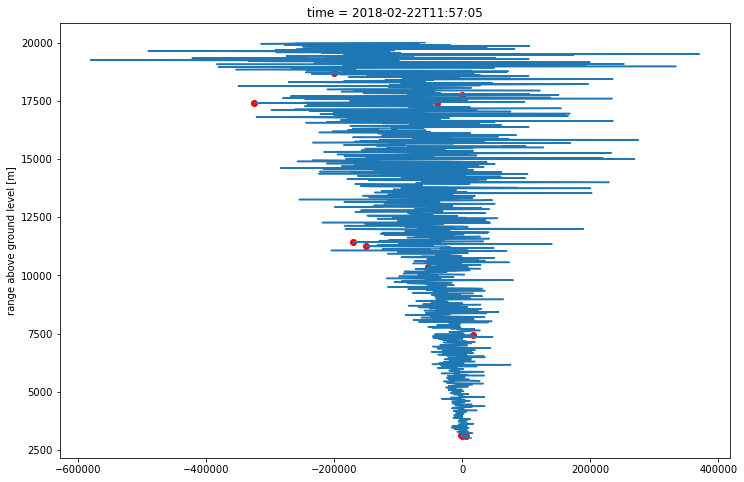

In [62]:
fg, ax = plt.subplots(figsize=[12,8])
filecorrectsignal12.isel(time=90, range=limiteZ).plot(y='range', ax=ax)

xscatter = filecorrectsignal12.isel(time=90, range=limiteZ).values[mask_profiles[90,:]]
yscatter = filecorrectsignal12.isel(range=limiteZ)['range'][mask_profiles[90,:]]
ax.scatter(xscatter, yscatter, color='r')

In [120]:
date =(file.name.split('_')[4])
alt_max=4000
print(date)

20180630


In [228]:
import sys
import datetime
def ipral_remove_cloud_profiles(date, alt_max, ipral_file):
    """
    Remove IPRAL profiles containing cloud below a defined altitude.

    Parameters
    ----------
    date : datetime.datetime
        The date of the file to process.
    alt_max : float
        The maximum altitude of clouds in meters.
    ipral_file : str or pathlib.Path
        The path of the IPRAL file to process.
    output : str or pathlib.Path
        The path to th eoutput file.

    """

    CHM15K_PATH = Path("/bdd/SIRTA/pub/basesirta/1a/chm15k")
    #     CHM15K_MASK = 'chm15k_1a_z1Ppr2R15mF15s_v01_*_1440.nc"
    CHM15K_TIME_RES = "15s"

    IPRAL_PATH = Path("/bdd/SIRTA/pub/basesirta/1a/ipral/")
    IPRAL_MASK = "ipral_1a_Lz1R15mF30sPbck_v01_*_1440.nc"
    IPRAL_TIME_RES = "30s"

    DATE_FMT = "days since 1970-01-01T00:00:00"

    ONE_DAY = datetime.timedelta(hours=23, minutes=59, seconds=59)


    #     print(f"Processing {date:%Y-%m-%d}")
    print(f"Removing IPRAL profiles with clouds below {alt_max:7.1f}")
    # read CHM15k file
    # ---------------------------------------------------------------------------------
    #     chm15k_file = find_file(CHM15K_PATH, CHM15K_MASK, date)
    chm15k_file = sorted(CHM15K_PATH.glob(f'**/**/**/chm15k_1a_z1Ppr2R15mF15s_v01_{date}_000000_1440.nc'))
    if not chm15k_file:
        print("No CHM15k file found.")
        print("Quitting.")
        sys.exit(1)

    chm15k_file = chm15k_file[0]
    print(f"CHM15k file found: {chm15k_file}")
    cbh = xr.open_dataset(chm15k_file)["cloud_base_height"][:, 0]
    cbh = cbh.resample(time='30s').mean()
    # read IPRAL data
    # ---------------------------------------------------------------------------------
    ipral_data = xr.open_dataset(file).sel(time=slice(pd.to_datetime(date), pd.to_datetime(date) + ONE_DAY))
    raw_profs = ipral_data.time.size
    print(f"{raw_profs} in IPRAL data")

    ipral_time = ipral_data.time#.dt.round(freq='15s') 
    cbh_time = cbh.time

    # only keep timesteps of CBH available in ipral data
    time_intersect1d = np.intersect1d(ipral_time.values, cbh_time.values)
    cbh = cbh.sel(time = time_intersect1d)
    # create to only keep data without cloud under the chosen altitude
    cbh_mask = (cbh > alt_max) | np.isnan(cbh)
#     print(len(cbh['time'][cbh_mask]))
    profs_to_keep = cbh_mask.values.astype("i2").sum()
    print(f"{raw_profs - profs_to_keep} profiles will be remove")
    return cbh['time'][cbh_mask]

In [230]:
ids = np.array(ipral_remove_cloud_profiles(file.name.split('_')[4], 4000, file))


Removing IPRAL profiles with clouds below  4000.0
CHM15k file found: /bdd/SIRTA/pub/basesirta/1a/chm15k/2018/06/30/chm15k_1a_z1Ppr2R15mF15s_v01_20180630_000000_1440.nc
2744 in IPRAL data
2691 profiles will be remove


53

In [241]:
idsmask3 = np.intersect1d(dt['time'].values, ids, return_indices=True)
np.where(idsmask3)[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2])

In [220]:
def ipral_remove_cloud_profiles(alt_max, ipral_file):
    """
    Remove IPRAL profiles containing cloud below a defined altitude.

    Parameters
    ----------
    date : datetime.datetime
        The date of the file to process.
    alt_max : float
        The maximum altitude of clouds in meters.
    ipral_file : str or pathlib.Path
        The path of the IPRAL file to process.
    output : str or pathlib.Path
        The path to th eoutput file.

    """    
    CHM15K_PATH = Path("/bdd/SIRTA/pub/basesirta/1a/chm15k")
#     CHM15K_MASK = 'chm15k_1a_z1Ppr2R15mF15s_v01_*_1440.nc"
    CHM15K_TIME_RES = "15s"

    IPRAL_PATH = Path("/bdd/SIRTA/pub/basesirta/1a/ipral/")
    IPRAL_MASK = "ipral_1a_Lz1R15mF30sPbck_v01_*_1440.nc"
    IPRAL_TIME_RES = "30s"

    DATE_FMT = "days since 1970-01-01T00:00:00"
    ONE_DAY = datetime.timedelta(hours=23, minutes=59, seconds=59)
#     print(f"Processing {date:%Y-%m-%d}")
    print(f"Removing IPRAL profiles with clouds below {alt_max:7.1f}")
    # read CHM15k file
    # ---------------------------------------------------------------------------------
    date = ipral_file.name.split('_')[4]
    chm15k_file = sorted(CHM15K_PATH.glob(f'**/**/**/chm15k_1a_z1Ppr2R15mF15s_v01_{date}_000000_1440.nc'))
    if not chm15k_file:
        print("No CHM15k file found.")
        print("Quitting.")
        sys.exit(1)

    chm15k_file = chm15k_file[0]
    print(f"CHM15k file found: {chm15k_file}")
    cbh = xr.open_dataset(chm15k_file)["cloud_base_height"][:, 0].to_dataframe()[
        "cloud_base_height"
    ]
    # round time to 15s to ease use
    cbh.index = cbh.index.round(freq=CHM15K_TIME_RES)
    # under sample chm15k data to 30s to have the time resolution as ipral
    cbh = cbh.resample(IPRAL_TIME_RES).first()
    # read IPRAL data
    # ---------------------------------------------------------------------------------
    ipral_data = xr.open_dataset(ipral_file).sel(time=slice(pd.to_datetime(date), pd.to_datetime(date) + ONE_DAY))
    raw_profs = ipral_data.time.size
    print(f"{raw_profs} in IPRAL data")

    # get cloud mask
    # ---------------------------------------------------------------------------------
    # round time to 30s to ease use
    ipral_time = ipral_data.time.to_dataframe().index.round(freq=IPRAL_TIME_RES)
    time_intersect1d = np.intersect1d(np.array(cbh.index.values), np.array(ipral_time), return_indices=True)
    print(time_intersect1d)
    # only keep timesteps of CBH available in ipral data
    cbh = cbh.loc[time_intersect1d[0]]
    # create to only keep data without cloud under the chosen altitude
    cbh_mask = np.where((cbh > alt_max) | np.isnan(cbh))
    profs_to_keep = cbh_mask.values.astype("i2").sum()
    print(f"{raw_profs - profs_to_keep} profiles will be remove")

    # apply mask
    # ---------------------------------------------------------------------------------
#     ipral_data = ipral_data.isel(time=cbh_mask)
    return cbh_mask, time_intersect1d


In [221]:
ids = np.array(ipral_remove_cloud_profiles(4000, file))

Removing IPRAL profiles with clouds below  4000.0
CHM15k file found: /bdd/SIRTA/pub/basesirta/1a/chm15k/2018/06/30/chm15k_1a_z1Ppr2R15mF15s_v01_20180630_000000_1440.nc
2744 in IPRAL data
(array(['2018-06-30T00:00:00.000000000', '2018-06-30T00:00:30.000000000',
       '2018-06-30T00:01:00.000000000', ...,
       '2018-06-30T23:44:00.000000000', '2018-06-30T23:44:30.000000000',
       '2018-06-30T23:45:00.000000000'], dtype='datetime64[ns]'), array([   0,    1,    2, ..., 2848, 2849, 2850]), array([   0,    1,    2, ..., 2713, 2714, 2715]))
515 profiles will be remove


<ipython-input-221-6ac16623bae1>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  ids = np.array(ipral_remove_cloud_profiles(4000, file))


## SR histogram from list of validated profiles

In [3]:
csv = pd.read_csv('/scratchx/nmpnguyen/IPRAL/raw/detection_clouds_test/IPRAL_2018_validated_profiles1.csv')
csv

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 2812,Unnamed: 2813,Unnamed: 2814,Unnamed: 2815,Unnamed: 2816,Unnamed: 2817,Unnamed: 2818,Unnamed: 2819,Unnamed: 2820,Unnamed: 2821
0,2018-02-22 11:12:09.000000000,2018-02-22 11:12:40.000000000,2018-02-22 11:13:10.000000000,2018-02-22 11:13:39.999999744,2018-02-22 11:14:11.000000256,2018-02-22 11:14:41.000000000,2018-02-22 11:15:11.000000000,2018-02-22 11:15:40.999999744,2018-02-22 11:16:12.000000256,2018-02-22 11:16:42.000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-02-23 11:38:37.000000000,2018-02-23 11:39:08.000000000,2018-02-23 11:39:38.000000000,2018-02-23 11:40:08.000000256,2018-02-23 11:40:38.999999744,2018-02-23 11:41:09.000000000,2018-02-23 11:41:39.000000000,2018-02-23 11:42:09.000000256,2018-02-23 11:42:39.999999744,2018-02-23 11:43:10.000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-02-24 00:00:24.000000000,2018-02-24 00:00:55.000000000,2018-02-24 00:01:25.000000000,2018-02-24 00:01:55.000000256,2018-02-24 00:02:25.999999744,2018-02-24 00:02:56.000000000,2018-02-24 00:03:26.000000000,2018-02-24 00:03:57.000000000,2018-02-24 00:04:26.999999744,2018-02-24 00:04:57.000000000,...,2018-02-24 23:43:20.000000000,2018-02-24 23:43:50.000000000,2018-02-24 23:44:20.000000000,2018-02-24 23:44:51.000000000,2018-02-24 23:45:21.000000000,2018-02-24 23:45:51.000000000,2018-02-24 23:46:22.000000256,2018-02-24 23:46:52.000000000,2018-02-24 23:47:22.000000000,2018-02-24 23:47:51.999999744
3,2018-02-24 23:59:59.000000000,2018-02-25 00:00:30.000000000,2018-02-25 00:01:00.000000000,2018-02-25 00:01:30.000000000,2018-02-25 00:02:01.000000000,2018-02-25 00:02:31.000000000,2018-02-25 00:03:01.000000000,2018-02-25 00:03:32.000000256,2018-02-25 00:04:02.000000000,2018-02-25 00:04:32.000000000,...,2018-02-25 23:41:50.000000000,2018-02-25 23:42:20.000000000,2018-02-25 23:42:51.000000000,2018-02-25 23:43:21.000000000,2018-02-25 23:43:51.000000000,2018-02-25 23:44:21.000000256,2018-02-25 23:44:52.000000000,NaN,NaN,NaN
4,2018-02-26 00:00:01.000000000,2018-02-26 00:00:31.000000000,2018-02-26 00:01:01.000000000,2018-02-26 00:01:31.000000000,2018-02-26 00:02:02.000000000,2018-02-26 00:02:32.000000000,2018-02-26 00:03:02.000000000,2018-02-26 00:03:32.999999744,2018-02-26 00:04:03.000000000,2018-02-26 00:04:33.000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,2018-11-13 15:10:18.000000256,2018-11-13 15:10:48.000000000,2018-11-13 15:11:18.000000000,2018-11-13 15:11:49.000000000,2018-11-13 15:12:19.000000256,2018-11-13 15:12:49.000000000,2018-11-13 15:13:20.000000000,2018-11-13 15:13:50.000000000,2018-11-13 15:14:20.000000256,2018-11-13 15:14:50.000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115,2018-11-14 00:00:26.000000000,2018-11-14 00:00:56.000000256,2018-11-14 00:01:27.000000000,2018-11-14 00:01:57.000000000,2018-11-14 00:02:27.000000000,2018-11-14 00:02:57.999999744,2018-11-14 00:03:28.000000000,2018-11-14 00:03:58.000000000,2018-11-14 00:04:28.000000000,2018-11-14 00:04:58.999999744,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
116,2018-11-15 00:00:18.000000000,2018-11-15 00:00:48.999999744,2018-11-15 00:01:19.000000000,2018-11-15 00:01:49.000000000,2018-11-15 00:02:20.000000000,2018-11-15 00:02:49.999999744,2018-11-15 00:03:20.000000000,2018-11-15 00:03:50.000000000,2018-11-15 00:04:21.000000000,2018-11-15 00:04:50.999999744,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,2018-12-13 16:13:29.000000000,2018-12-13 16:13:59.000000000,2018-12-13 16:14:29.999999744,2018-12-13 16:15:30.000000000,2018-12-13 16:16:00.000000000,2018-12-13 16:16:30.999999744,2018-12-13 16:17:01.000000000,2018-12-13 16:17:31.000000000,2018-12-13 16:18:02.000000000,2018-12-13 16:18:32.000000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
year = '2018'
IPRAL_PATH = Path('/bdd/SIRTA/pub/basesirta/1a/ipral/', year)
CALIB_PATH = Path('/homedata/nmpnguyen/IPRAL/RF/Calibrated/')
IPRAL_LISTFILES = sorted(CALIB_PATH.glob(f'ipral_1a_Lz1R15mF30sPbck_v01_{year}*_000000_1440.nc'))
print(len(IPRAL_LISTFILES), IPRAL_LISTFILES[0], IPRAL_LISTFILES[-1])

120 /homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180221_000000_1440.nc /homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20181214_000000_1440.nc


In [7]:
def sr_by_files(csv_listdates, calib_pathfolder):
    date_of_list = pd.to_datetime(csv_listdates.iloc[1]).strftime('%Y%m%d')
    IPRAL_FILE_MASK = f'ipral_1a_Lz1R15mF30sPbck_v01_{str(date_of_list)}_000000_1440.nc'
    file = sorted(calib_pathfolder.glob(f'{IPRAL_FILE_MASK}'))[0]
#     idfile = np.where([file.stem.split('_')[4] == str(date_of_list) for file in calib_listfiles])[0][0]
    datacalib = xr.open_dataset(file) 
    limiteZ = (datacalib['range']>5000)&(datacalib['range']<15000)
#     indice = np.intersect1d(datacalib['time'].values, np.array(pd.to_datetime(csv_listdates)), return_indices=True)[1]
#     print(indice)
#     datacalib = datacalib.isel(time=indice).resample(time='15min').mean()
#     atb355 = datacalib['calibrated'].sel(wavelength = 355).isel(range=limiteZ)
#     atb532 = datacalib['calibrated'].sel(wavelength = 532).isel(range=limiteZ)
    csv_listdates = pd.to_datetime(csv_listdates).dropna().values
    sr355 = (datacalib['calibrated']/datacalib['simulated']).sel(wavelength = 355, time=csv_listdates).isel(range=limiteZ)
    sr532 = (datacalib['calibrated']/datacalib['simulated']).sel(wavelength = 532, time=csv_listdates).isel(range=limiteZ)
    return sr355, sr532 #atb355, atb532 #

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (array - value).argmin()
    return idx


In [8]:
### (2021.11.10) select SR 355 included [5.0, 10.0] and SR 532 included [1.0, 3.0]

allsr355, allsr532 = sr_by_files(csv.iloc[-1,:], CALIB_PATH)

for i in range(1, csv.shape[0]):
    try:
        sr355file, sr532file = sr_by_files(csv.iloc[i,:], CALIB_PATH)
    #     print(sr355file, sr532file)
#         allsr355 = xr.concat([allsr355, sr355file.resample(time='15min').mean()], dim='time')
#         allsr532 = xr.concat([allsr532, sr532file.resample(time='15min').mean()], dim='time')
        allsr355 = xr.concat([allsr355, sr355file], dim='time')
        allsr532 = xr.concat([allsr532, sr532file], dim='time')
    except:
        pass

# id_alltimebug = np.array([], dtype='datetime64[ns]')
# for i in range(csv.shape[0]):
#     try:
#         sr355file, sr532file = sr_by_files(csv.iloc[i,:], CALIB_PATH)
#         id_timefile355 = np.unique(np.where((allsr355 > 5.0) & (allsr355 < 10.0))[0])
#         id_timefile532 = np.unique(np.where((allsr355 > 1.0) & (allsr355 < 5.0))[0])
#         id_timefile = np.intersect1d(id_timefile355, id_timefile532)
#         id_alltimebug = np.concatenate([id_alltimebug, sr355file['time'].values[id_timefile]])
#     except:
#         pass

In [18]:
new_ids =np.where((allsr355/allsr532 > 5))
print(np.unique(new_ids[0]).shape, allsr532.shape)
# np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0_v2.npy',allsr355['time'][new_ids[0]].values)
# np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/range_sr355.40_sr532.0_v2.npy',allsr355['range'][new_ids[1]].values)

new_allsr532 = allsr532.isel(time=np.unique(new_ids[0])) #allsr532.values[~(allsr532/allsr355 > 10)]
new_allsr355 = allsr355.isel(time=np.unique(new_ids[0])) #allsr355.values[~(allsr532/allsr355 > 10)]

(143993,) (145795, 666)


In [16]:
print(allsr355.shape)
ids = np.where((allsr355>=39)&(allsr355<=40)&(allsr532>=0)&(allsr532<1))
allsr355['time'][ids[0]]
np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0_v3.npy',allsr355['time'][ids[0]].values)

(12979, 666)


In [41]:
allsr355['time'][ids[0]], allsr355['range'][ids[1]]
# np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0.npy',allsr355['time'][ids[0]].values)
# np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/range_sr355.40_sr532.0.npy',allsr355['range'][ids[1]].values)
pd.to_datetime(allsr355['time'][ids[0]].values[1]).strftime('%Y%m%d')

'20180222'

In [61]:
listdatenpy = np.unique(pd.to_datetime(np.load('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0.npy')))
# [sorted(CALIB_PATH.glob(f'ipral_1a_Lz1R15mF30sPbck_v01_{l}_000000_1440.nc'))[0] for l in listdatenpy]

In [89]:
def sr_by_profiles(profile_time, calib_listfiles, output=None):
    date_of_list = pd.to_datetime(profile_time).strftime('%Y%m%d')
    idfile = np.where([file.stem.split('_')[4] == str(date_of_list) for file in calib_listfiles])[0][0]
    datacalib = xr.open_dataset(calib_listfiles[idfile]) 
    limiteZ = (datacalib['range']>5000)&(datacalib['range']<15000)
    datacalib = datacalib.resample(time='15min').mean()
#     indice = np.intersect1d(datacalib['time'].values, np.array(pd.to_datetime(profile_time)), return_indices=True)[1]
    sr355 = (datacalib['calibrated']/datacalib['simulated']).sel(time=profile_time, wavelength = 355).isel(range=limiteZ)
    sr532 = (datacalib['calibrated']/datacalib['simulated']).sel(time=profile_time, wavelength = 532).isel(range=limiteZ)
    atb355 = datacalib['calibrated'].sel(time=profile_time, wavelength = 355).isel(range=limiteZ)
    atb532 = datacalib['calibrated'].sel(time=profile_time, wavelength = 532).isel(range=limiteZ)
    if output=='sr':
        return sr355, sr532
    else:
        return atb355, atb532

In [90]:
print(listdatenpy[-3])

2018-11-06T15:15:00.000000000


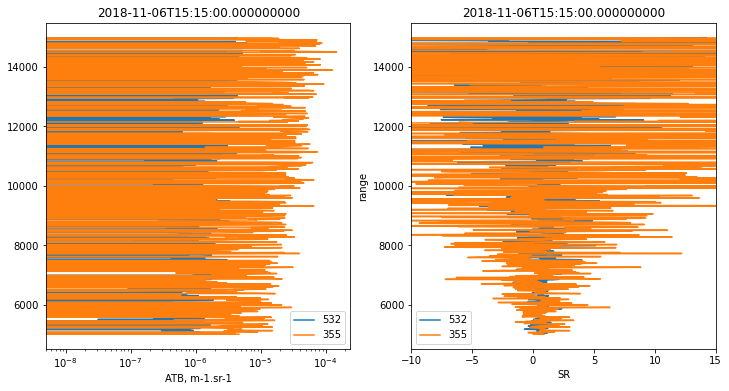

In [91]:
fig, (ax, ax2) = plt.subplots(ncols=2, figsize=(12,6))
atb355profile, atb532profile = sr_by_profiles(listdatenpy[-3], IPRAL_LISTFILES, 'atb')
ax.semilogx(atb532profile.values, atb532profile['range'].values, label='532')
ax.semilogx(atb355profile.values, atb355profile['range'].values, label='355')
ax.set(xlabel='ATB, m-1.sr-1', title=f'{listdatenpy[-3]}')
sr355profile, sr532profile = sr_by_profiles(listdatenpy[-3], IPRAL_LISTFILES, 'sr')
sr532profile.plot(y='range', label='532', ax=ax2)
sr355profile.plot(y='range', label='355', ax=ax2)
ax2.set(xlabel='SR', title=f'{listdatenpy[-3]}')
ax2.set_xlim(-10,15)
# ax.axhline(allsr355['range'][398].values, color='k', linestyle='--')
ax.legend()
ax2.legend()
# ax.set_ylim(0,10000)

['2018-07-17T13:15:00.000000000' '2018-07-25T12:00:00.000000000'
 '2018-07-25T15:00:00.000000000' '2018-07-25T15:00:00.000000000'
 '2018-07-26T14:00:00.000000000' '2018-07-26T14:00:00.000000000'
 '2018-07-26T14:45:00.000000000' '2018-09-09T17:00:00.000000000'
 '2018-11-06T15:15:00.000000000' '2018-12-14T12:15:00.000000000'
 '2018-12-14T12:45:00.000000000']
2018-07-17T13:15:00.000000000 12045.0
2018-07-25T12:00:00.000000000 14745.0
2018-07-25T15:00:00.000000000 9975.0
2018-07-25T15:00:00.000000000 14535.0
2018-07-26T14:00:00.000000000 12210.0
2018-07-26T14:00:00.000000000 14430.0
2018-07-26T14:45:00.000000000 5415.0
2018-09-09T17:00:00.000000000 10365.0
2018-11-06T15:15:00.000000000 14670.0


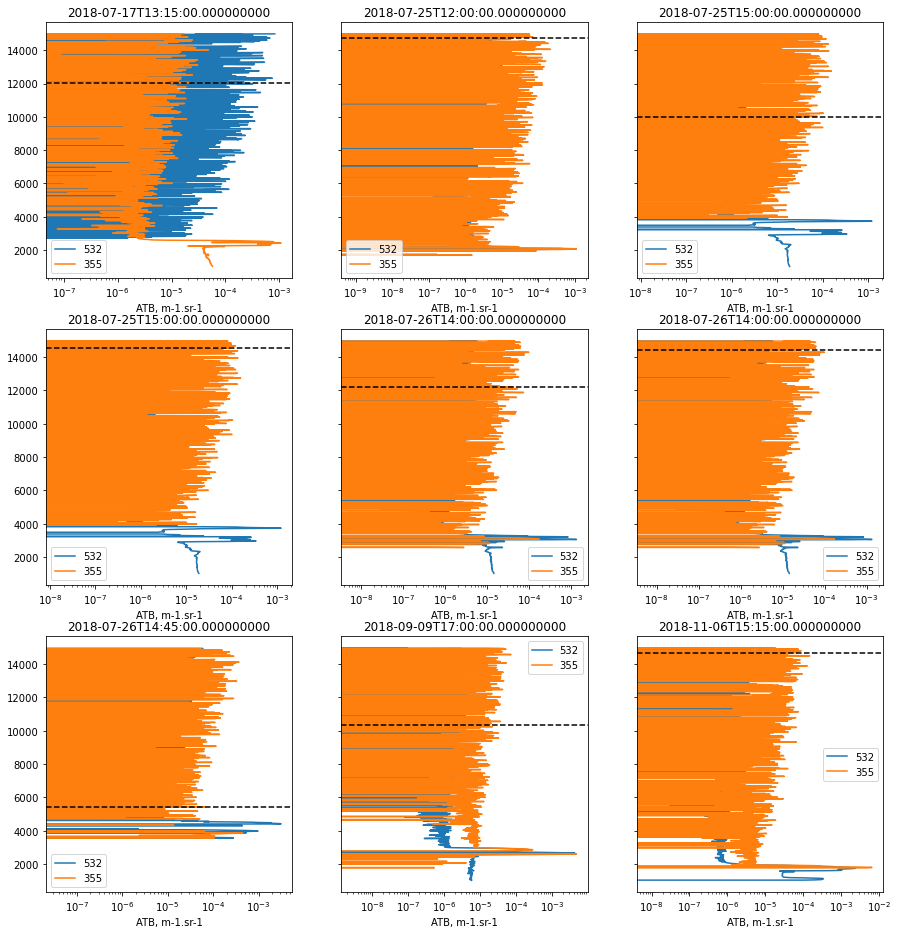

In [73]:
listtime = np.array(np.load('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0_v2.npy'), dtype='datetime64[ns]')
print(listtime)
listrange = np.load('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/range_sr355.40_sr532.0_v2.npy')
fig, axs = plt.subplots(ncols=3, nrows=int(len(listtime)/3), sharey=True, figsize=(15,16))
for i, ax in enumerate(axs.flatten()):
    print(listtime[i], listrange[i])
    atb355profile, atb532profile = sr_by_profiles(listtime[i], IPRAL_LISTFILES, 'atb')
#     atb532profile.plot(y='range', label='532', ax=ax)
#     atb355profile.plot(y='range', label='355', ax=ax)
    ax.semilogx(atb532profile.values, atb532profile['range'].values, label='532')
    ax.semilogx(atb355profile.values, atb355profile['range'].values, label='355')
    ax.axhline(listrange[i], color='k', linestyle='--')
    ax.set(xlabel='ATB, m-1.sr-1', title=f'{listtime[i]}')
    ax.legend()

In [45]:
### Load le liste des profils à récupérer
# get_time = np.load('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_a_recupere.npy')
new_allsr355=xr.open_dataset('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/IPRAL_2018_validated_profiles1_allsr355.nc')['__xarray_dataarray_variable__']
new_allsr532=xr.open_dataset('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/IPRAL_2018_validated_profiles1_allsr532.nc')['__xarray_dataarray_variable__']
# print(pd.DataFrame((new_allsr532/new_allsr355).values).describe())


In [46]:
# rapport = (new_allsr532/new_allsr355).values
# print(rapport.shape)
rows_bugs, cols_bugs = np.where((rapport < 1)|(rapport > 5))
new_allsr355 = new_allsr355.values[rows_bugs,cols_bugs]


In [48]:
print(new_allsr355.shape)
new_allsr532 = new_allsr532.values[(rapport < 1)|(rapport > 5)]
print(new_allsr532.shape)

(7249027,)
(7249027,)


In [32]:
sr_limite = [-10, 100]
X532 = new_allsr532.values.ravel()
Y355 = new_allsr355.values.ravel()
H = np.histogram2d(X532, Y355, bins=100, range = [[sr_limite[0], sr_limite[1]], [sr_limite[0], sr_limite[1]]])
# H = np.histogram2d(X532[np.where(~np.isnan(X532))], Y355[np.where(~np.isnan(Y355))], bins=100, 
#                    range = [[sr_limite[0], sr_limite[1]], [sr_limite[0], sr_limite[1]]]) 
Hprobas = H[0]/len(X532[np.where(~np.isnan(X532))])*100
Xxedges, Yyedges = np.meshgrid(H[1], H[2])

In [ ]:
# from matplotlib.colors import LogNorm
# from scipy import stats
# # X532 = allsr532.values.ravel()
# # Y355 = allsr355.values.ravel()
# with np.errstate(invalid='ignore'):
#     slope, intercept, r_value, p_value, std_err = stats.linregress(X532[np.where(~np.isnan(X532))], Y355[np.where(~np.isnan(Y355))])
    
# fitLine = slope * X532[np.where(~np.isnan(X532))] + intercept
# fitLine2 = (1/4)*X532[np.where(~np.isnan(X532))]#allsr532

# slope, intercept, r_value, p_value, std_err

[Text(0.5, 0, 'SR532'), Text(0, 0.5, 'SR355')]

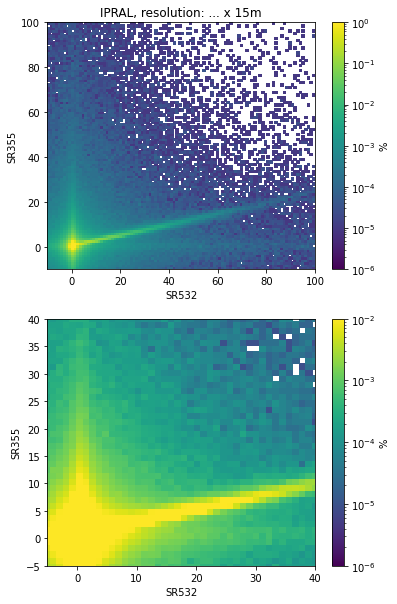

In [33]:
from matplotlib.colors import LogNorm
ff, (ax, axins) = plt.subplots(figsize=[6,10], nrows=2)
p = ax.pcolormesh(Xxedges, Yyedges, Hprobas.T, norm = LogNorm(vmax=1e0, vmin=1e-6))
# ax.plot(X532[np.where(~np.isnan(X532))], fitLine2, '-.', c='r')
c = plt.colorbar(p, ax=ax, label='%')
ax.set(xlabel='SR532', ylabel='SR355', 
       title= f'IPRAL, resolution: ... x 15m')
ax.set(xlim=(sr_limite[0],sr_limite[1]), ylim=(sr_limite[0],sr_limite[1]))

pins = axins.pcolormesh(Xxedges, Yyedges, Hprobas.T, norm = LogNorm(vmax=1e-02, vmin=1e-6))
# axins.plot(X532[np.where(~np.isnan(X532))], fitLine2, '-.', c='r')
cins = plt.colorbar(pins, ax=axins, label='%')
axins.set_ylim(-5, 40)
axins.set_xlim(-5, 40)
axins.set(xlabel='SR532', ylabel='SR355')
# plt.savefig(Path('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/','distributionSR_100x100_Ipral2019.png'))

In [26]:
# ratioXY = X532[~np.isnan(X532)&~np.isnan(Y355)]/Y355[~np.isnan(X532)&~np.isnan(Y355)]

print(Yyedges/Xxedges)

[[  1.           1.12359551   1.28205128 ...  -0.10224949  -0.10111223
   -0.1       ]
 [  0.89         1.           1.14102564 ...  -0.09100204  -0.08998989
   -0.089     ]
 [  0.78         0.87640449   1.         ...  -0.0797546   -0.07886754
   -0.078     ]
 ...
 [ -9.78       -10.98876404 -12.53846154 ...   1.           0.98887765
    0.978     ]
 [ -9.89       -11.11235955 -12.67948718 ...   1.01124744   1.
    0.989     ]
 [-10.         -11.23595506 -12.82051282 ...   1.02249489   1.01112235
    1.        ]]


In [24]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (array - value).argmin()
    return idx

# find_nearest(Y355[np.where(~np.isnan(Y355))] - fitLine2,0)
fitLine2 = (1/4)*X532
id1 = np.where(np.abs((Y355 - fitLine2)) < 1e-2)
# allsr355['time'][np.unique(id1)]
id1[0]

array([    143,     180,     220, ..., 2605743, 2605744, 2605755])

(0.0, 100.0)

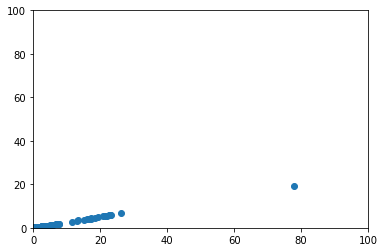

In [25]:
f, ax = plt.subplots()
# ax.scatter(allsr532[id1[0]],allsr355[id1[1]])
ax.scatter(X532[id1], Y355[id1])
ax.set_xlim(0, 100)
ax.set_ylim(0, 100)

In [95]:
fitLine2 = (1/4)*allsr532
id1 = np.where(np.abs((allsr532 - fitLine2)) < 1e-2)
new_time = allsr532['time'][np.unique(id1[0])].values
np.save('/homedata/nmpnguyen/IPRAL/new_time.npy', new_time)

In [30]:
old_sr532 = xr.open_dataset('/homedata/nmpnguyen/IPRAL/SR532.nc')#['__xarray_dataarray_variable__']
old_sr355 = xr.open_dataset('/homedata/nmpnguyen/IPRAL/SR355.nc')#['__xarray_dataarray_variable__'].values

In [37]:
old_allsr532 = old_sr532.sortby('time').resample(time='15min').mean()
old_allsr355 = old_sr355.sortby('time').resample(time='15min').mean()

MemoryError: Unable to allocate 1.42 GiB for an array with shape (190051, 1000) and data type float64

In [34]:
old_X532 = old_allsr532['__xarray_dataarray_variable__'].values
old_Y355 = old_allsr355['__xarray_dataarray_variable__'].values

old_H = np.histogram2d(old_X532.ravel(), old_Y355.ravel(), bins=100, range = [[0, sr_limite], [0, sr_limite]]) 
old_Hprobas = H[0]/len(dt_old_sr532.ravel())*100
old_Xxedges, old_Yyedges = np.meshgrid(old_H[1], old_H[2])

MemoryError: Unable to allocate 1.42 GiB for an array with shape (190051, 1000) and data type float64

[(0.0, 100.0), (0.0, 100.0)]

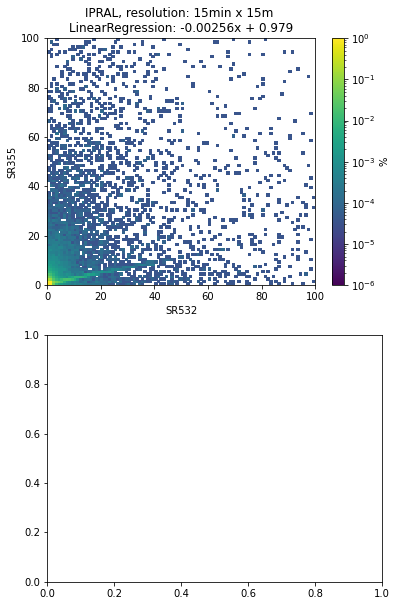

In [236]:
ff, (ax, axins) = plt.subplots(figsize=[6,10], nrows=2)
p = ax.pcolormesh(old_Xxedges, old_Yyedges, old_Hprobas.T, norm = LogNorm(vmax=1e0, vmin=1e-6))
ax.plot(X532, fitLine2, '-.', c='r')
c = plt.colorbar(p, ax=ax, label='%')
ax.set(xlabel='SR532', ylabel='SR355', 
       title= f'IPRAL, resolution: 15min x 15m \nLinearRegression: {round(slope,5)}x + {round(intercept,3)}')
ax.set(xlim=(0,sr_limite), ylim=(0,sr_limite))
plt.savefig('/homedata/nmpnguyen/IPRAL/test26102021.png')

In [49]:
def flag_clouds(data, id_Z, rawpath, wave, selected_time):
    def dispersion_standard_deviation(signal, id_left, seuil, influence):
        '''
        signal : est un vecteur numpy
        id_left : le nombre de valeurs avant la valeur actuelle que nous voulons utiliser pour calculer la ligne de base mobile.
        seuil : le nombre d'écarts types par rapport à la ligne de base mobile qu'un pic doit dépasser pour être compté.
        influence : la quantité d'influence qu'un pic a sur la ligne de base mobile. Celui-ci doit être compris entre 0 et 1.
        '''
        peakIndex = []
        processedSignal = signal[0:id_left]
        for ids in range(id_left, len(signal)):
            y = signal[ids]
            avg = np.nanmean(processedSignal[id_left:ids])
            sd = np.nanstd(processedSignal[id_left:ids])
            if ((y-avg) > (sd*seuil)):
                peakIndex.append(ids)
#                 print(ids, len(processedSignal))
    #             ajustedValued = (influence*y)+((1-influence)*processedSignal[ids-1])
            else:
                processedSignal = np.append(processedSignal, y)
        return peakIndex

    def verification_by_SR(rawpath, wave, id_Z, selected_time, mask_profiles):
        '''
        rawpath : le chemin du fichier Ipral --> le nom du fichier 
        wave : 532nm et 355nm 
        id_Z : indices des altitudes à étudier les nuages 
        mask_profiles : indices bool des nuages détectés à vérifier
        '''
        # Retrouver le fichier calibré correspondant 
        IPRAL_RF_PATH = Path('/homedata/nmpnguyen/IPRAL/RF/Calibrated')
        IPRAL_RF_FILE = Path(IPRAL_RF_PATH, rawpath.name.split('.')[0]+'.nc')
        print(IPRAL_RF_FILE)
        # Caculer SR, range correspondant aux profiles à vérifier
        datacalib = xr.open_dataset(IPRAL_RF_FILE)
        datacalib = datacalib.resample(time='15min').mean()
        SR2Darray = (datacalib['calibrated']/datacalib['simulated']).isel(range=id_Z).sel(time= selected_time, wavelength = wave).values
        Zlimite2Darray = np.array([datacalib['range'][id_Z].values] * len(selected_time))
        # Retourner des indices indiqués les nuages 
        zcalib_top = 5000 #datacalib.attrs['calibration height'][1]
        selected_indices_profiles = np.where((np.ma.masked_array(SR2Darray, mask=mask_profiles)>1.7) & (np.ma.masked_array(Zlimite2Darray, mask=mask_profiles)<zcalib_top))
        final_indices_profiles = np.unique(selected_indices_profiles[0])
        return final_indices_profiles, zcalib_top
        
    indices_profiles = np.zeros_like(data.isel(range=id_Z).values, dtype=bool)
    for t in range(len(data['time'])):
        indices = dispersion_standard_deviation(data.isel(time=t, range=id_Z).values, 
                                                id_left = 5,
                                                seuil = 4, 
                                                influence = 0.1)
        indices_profiles[t, indices] = True 

    indices_clouds_profiles, zcalib_top = verification_by_SR(rawpath, wave, id_Z, selected_time, indices_profiles)
    indices_clouds_profiles = np.in1d(np.arange(len(data['time'])), indices_clouds_profiles)
    return indices_clouds_profiles

In [50]:
old_time = np.load('/homedata/nmpnguyen/IPRAL/old_time.npy')
new_time = np.load('/homedata/nmpnguyen/IPRAL/new_time.npy')
diff_time = np.setdiff1d(old_time, new_time)

In [55]:
range_limite_top = [26000,28000]
range_limite_bottom = [2000,3000]
import warnings
warnings.filterwarnings("ignore")
final_time_bug = []
for file in IPRAL_LISTFILES:
    print(file)
    data = xr.open_dataset(file)
    limiteZ = (data['range']>3000)&(data['range']<20000)
    data = data.resample(time='15min').mean()
    select_time_file = diff_time[pd.to_datetime(diff_time).strftime('%Y%m%d') == file.stem.split('_')[4]]
    print(select_time_file)
    data_outlier = data.sel(time=select_time_file)
    data_outlier12 = (data_outlier['rcs_12']/np.square(data_outlier['range']) - data_outlier['bckgrd_'+'rcs_12'])*np.square(data_outlier['range'])
    idsmask1_outlier12 = filter_profile_file(data_outlier12, 'rcs_12', range_limite_top, range_limite_bottom)
    idsmask2_outlier12 = invalidated_profile(data_outlier12)
    print('crit 1: ', np.where(idsmask1_outlier12)[0])
    print('crit 2: ', np.where(idsmask2_outlier12)[0])
    idsmask3_outlier12 = flag_clouds(data_outlier12, limiteZ, file, 355, select_time_file)
    print('crit 3: ', idsmask3_outlier12.shape)
    idsmask_outlier12 = np.intersect1d(np.intersect1d(np.where(idsmask1_outlier12)[0], np.where(idsmask2_outlier12)[0], return_indices=True),
                                      np.where(~idsmask3_outlier12)[0], return_indices=True)[0]
    final_time_bug.append(select_time_file[idsmask_outlier12])


/bdd/SIRTA/pub/basesirta/1a/ipral/2018/02/21/ipral_1a_Lz1R15mF30sPbck_v01_20180221_000000_1440.nc
['2018-02-21T12:00:00.000000000' '2018-02-21T13:00:00.000000000'
 '2018-02-21T13:15:00.000000000' '2018-02-21T14:00:00.000000000'
 '2018-02-21T16:15:00.000000000' '2018-02-21T17:30:00.000000000'
 '2018-02-21T19:00:00.000000000' '2018-02-21T20:15:00.000000000'
 '2018-02-21T20:30:00.000000000' '2018-02-21T20:45:00.000000000']
crit 1:  [0 1 2 3 4 5 6 7 8 9]
crit 2:  []
/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180221_000000_1440.nc
crit 3:  (10,)
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/02/22/ipral_1a_Lz1R15mF30sPbck_v01_20180222_000000_1440.nc
['2018-02-22T11:45:00.000000000' '2018-02-22T12:00:00.000000000'
 '2018-02-22T12:15:00.000000000' '2018-02-22T12:45:00.000000000'
 '2018-02-22T13:00:00.000000000' '2018-02-22T13:30:00.000000000'
 '2018-02-22T13:45:00.000000000' '2018-02-22T14:15:00.000000000'
 '2018-02-22T15:45:00.000000000' '2018-02-22T17:00:00.000000000'
 '

/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180329_000000_1440.nc
crit 3:  (32,)
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/04/06/ipral_1a_Lz1R15mF30sPbck_v01_20180406_000000_1440.nc
['2018-04-06T17:00:00.000000000' '2018-04-06T17:45:00.000000000'
 '2018-04-06T18:30:00.000000000' '2018-04-06T20:00:00.000000000'
 '2018-04-06T21:30:00.000000000' '2018-04-06T21:45:00.000000000'
 '2018-04-06T22:30:00.000000000' '2018-04-06T22:45:00.000000000'
 '2018-04-06T23:30:00.000000000']
crit 1:  []
crit 2:  [0 1 2 3 4 5 6 7 8]
/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180406_000000_1440.nc
crit 3:  (9,)
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/04/07/ipral_1a_Lz1R15mF30sPbck_v01_20180407_000000_1440.nc
['2018-04-07T01:15:00.000000000' '2018-04-07T01:30:00.000000000'
 '2018-04-07T03:00:00.000000000' '2018-04-07T03:15:00.000000000'
 '2018-04-07T04:30:00.000000000' '2018-04-07T04:45:00.000000000'
 '2018-04-07T05:30:00.000000000' '2018-04-07T06:30:00.00000

/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180418_000000_1440.nc
crit 3:  (92,)
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/04/19/ipral_1a_Lz1R15mF30sPbck_v01_20180419_000000_1440.nc
['2018-04-19T00:00:00.000000000' '2018-04-19T00:15:00.000000000'
 '2018-04-19T00:30:00.000000000' '2018-04-19T00:45:00.000000000'
 '2018-04-19T01:00:00.000000000' '2018-04-19T01:15:00.000000000'
 '2018-04-19T01:30:00.000000000' '2018-04-19T01:45:00.000000000'
 '2018-04-19T02:00:00.000000000' '2018-04-19T02:15:00.000000000'
 '2018-04-19T02:30:00.000000000' '2018-04-19T02:45:00.000000000'
 '2018-04-19T03:00:00.000000000' '2018-04-19T03:15:00.000000000'
 '2018-04-19T03:30:00.000000000' '2018-04-19T03:45:00.000000000'
 '2018-04-19T04:15:00.000000000' '2018-04-19T04:30:00.000000000'
 '2018-04-19T04:45:00.000000000' '2018-04-19T05:00:00.000000000'
 '2018-04-19T05:15:00.000000000' '2018-04-19T05:30:00.000000000'
 '2018-04-19T06:00:00.000000000' '2018-04-19T06:15:00.000000000'
 '2018-04-19T0

/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180421_000000_1440.nc
crit 3:  (93,)
/bdd/SIRTA/pub/basesirta/1a/ipral/2018/04/22/ipral_1a_Lz1R15mF30sPbck_v01_20180422_000000_1440.nc
['2018-04-22T00:00:00.000000000' '2018-04-22T00:15:00.000000000'
 '2018-04-22T00:30:00.000000000' '2018-04-22T00:45:00.000000000'
 '2018-04-22T01:00:00.000000000' '2018-04-22T01:15:00.000000000'
 '2018-04-22T01:30:00.000000000' '2018-04-22T01:45:00.000000000'
 '2018-04-22T02:00:00.000000000' '2018-04-22T02:15:00.000000000'
 '2018-04-22T07:15:00.000000000' '2018-04-22T07:30:00.000000000'
 '2018-04-22T07:45:00.000000000' '2018-04-22T08:00:00.000000000'
 '2018-04-22T08:15:00.000000000' '2018-04-22T08:30:00.000000000'
 '2018-04-22T08:45:00.000000000' '2018-04-22T09:00:00.000000000'
 '2018-04-22T09:15:00.000000000' '2018-04-22T09:30:00.000000000'
 '2018-04-22T09:45:00.000000000' '2018-04-22T10:00:00.000000000'
 '2018-04-22T10:15:00.000000000' '2018-04-22T10:30:00.000000000'
 '2018-04-22T1

ValueError: operands could not be broadcast together with shapes (0,1133) (0,) 

In [66]:

np.save('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_a_recupere.npy',np.concatenate(final_time_bug, axis=0), allow_pickle=True)

### Etude l'average des données

In [38]:
data = xr.open_dataset('/homedata/nmpnguyen/IPRAL/RF/Calibrated/ipral_1a_Lz1R15mF30sPbck_v01_20180224_000000_1440.nc')
data

<xarray.Dataset>
Dimensions:     (range: 4000, time: 2845, wavelength: 2)
Coordinates:
  * time        (time) datetime64[ns] 2018-02-23T23:59:54.000000256 ... 2018-...
  * range       (range) float32 15.0 30.0 45.0 ... 5.997e+04 5.998e+04 6e+04
  * wavelength  (wavelength) int64 355 532
Data variables:
    calibrated  (wavelength, time, range) float64 ...
    simulated   (wavelength, time, range) float64 ...
Attributes:
    calibration height:  [5000 7000]
    canal:               ['355-analog-NearField', '532-analog-NearField']
    Ipral_canal:         ['rcs_12', 'rcs_16']

In [39]:
datetime_profile = np.array('2018-02-24T21:05:00.000000000', dtype='datetime64[ns]')
id_selectedtime = np.where(data.time.dt.round('30S') == datetime_profile)[0]
id_selectedtime, data['calibrated'].isel(time=id_selectedtime, wavelength=0)
limiteZ = data['range']<15000
sr = data['calibrated']/data['simulated']


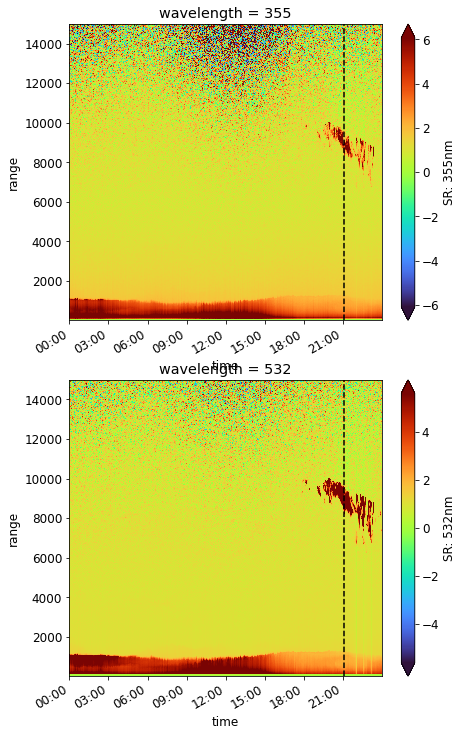

In [60]:
import matplotlib.dates as mdates
fig, (ax, ax2) = plt.subplots(nrows=2, figsize = (7,12))
plt.rcParams['font.size'] = '12'
plt.rcParams['axes.labelsize'] = '12'

sr.isel(wavelength=0, range=limiteZ).plot(x='time', y='range', cmap='turbo', ax=ax, 
                                          cbar_kwargs={'label':'SR: 355nm'}, robust=True)
ax.axvline(sr['time'].values[id_selectedtime], color='k', linestyle='--')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

sr.isel(wavelength=1, range=limiteZ).plot(x='time', y='range', cmap='turbo', ax=ax2,
                                          cbar_kwargs={'label':'SR: 532nm'}, robust=True)
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax2.axvline(sr['time'].values[id_selectedtime], color='k', linestyle='--')


(17586.868055555555, 17586.88888888889)

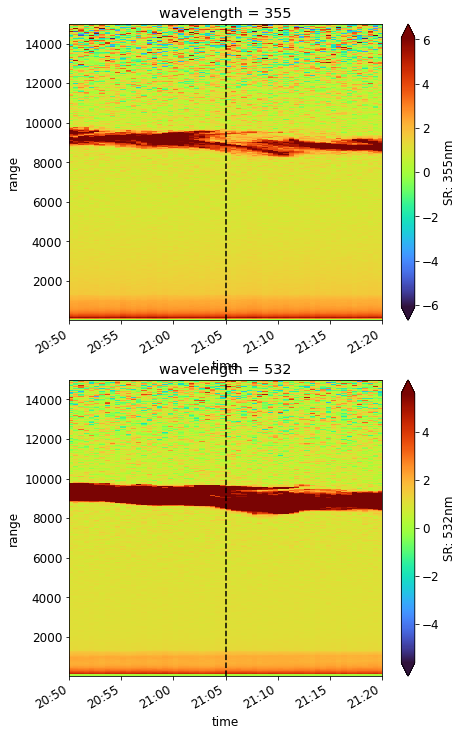

In [72]:
import matplotlib.dates as mdates
fig, (ax, ax2) = plt.subplots(nrows=2, figsize = (7,12))
plt.rcParams['font.size'] = '12'
plt.rcParams['axes.labelsize'] = '12'

sr.isel(wavelength=0, range=limiteZ).plot(x='time', y='range', cmap='turbo', ax=ax, 
                                          cbar_kwargs={'label':'SR: 355nm'}, robust=True)
ax.axvline(datetime_profile, color='k', linestyle='--')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.set_xlim(pd.to_datetime(datetime_profile) - pd.DateOffset(minutes=15), pd.to_datetime(datetime_profile) + pd.DateOffset(minutes=15))

sr.isel(wavelength=1, range=limiteZ).plot(x='time', y='range', cmap='turbo', ax=ax2,
                                          cbar_kwargs={'label':'SR: 532nm'}, robust=True)
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax2.axvline(datetime_profile, color='k', linestyle='--')
ax2.set_xlim(pd.to_datetime(datetime_profile) - pd.DateOffset(minutes=15), pd.to_datetime(datetime_profile) + pd.DateOffset(minutes=15))


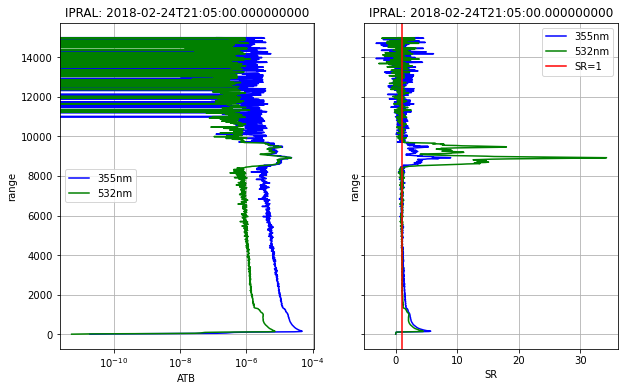

In [46]:
fg, (ax1, ax) = plt.subplots(figsize=(10,6), sharey=True, ncols=2)
# ax.semilogx(data['calibrated'].isel(time=id_selectedtime, wavelength=0), data['range'], label='355nm', color='b')
# ax.semilogx(data['calibrated'].isel(time=id_selectedtime, wavelength=1), data['range'], label='532nm', color='g')
sr.isel(time=id_selectedtime, wavelength=0, range=limiteZ).plot(y='range', label='355nm', color='b', ax=ax)
sr.isel(time=id_selectedtime, wavelength=1, range=limiteZ).plot(y='range', label='532nm', color='g', ax=ax)
ax.axvline(1, color='r', label='SR=1')
ax.legend()
ax.set(title=f'IPRAL: {datetime_profile}', xlabel='SR')

data['calibrated'].isel(time=id_selectedtime, wavelength=0, range=limiteZ).plot(y='range', label='355nm', color='b', ax=ax1, xscale='log')
data['calibrated'].isel(time=id_selectedtime, wavelength=1, range=limiteZ).plot(y='range', label='532nm', color='g', ax=ax1, xscale='log')
ax1.legend()
ax1.set(title=f'IPRAL: {datetime_profile}', xlabel='ATB')

ax.grid()
ax1.grid()

In [50]:
data_mean15min = data.resample(time='15min').mean()
sr_mean15min = (data['calibrated']/data['simulated']).resample(time='15min').mean()
id_selectedtime = np.where(data_mean15min.time.dt.hour == pd.to_datetime(datetime_profile).hour)[0]
sr_mean15min['time'][-1], sr['time'][-1]

(<xarray.DataArray 'time' ()>
 array('2018-02-24T23:45:00.000000000', dtype='datetime64[ns]')
 Coordinates:
     time     datetime64[ns] 2018-02-24T23:45:00,
 <xarray.DataArray 'time' ()>
 array('2018-02-24T23:58:59.000000000', dtype='datetime64[ns]')
 Coordinates:
     time     datetime64[ns] 2018-02-24T23:58:59)

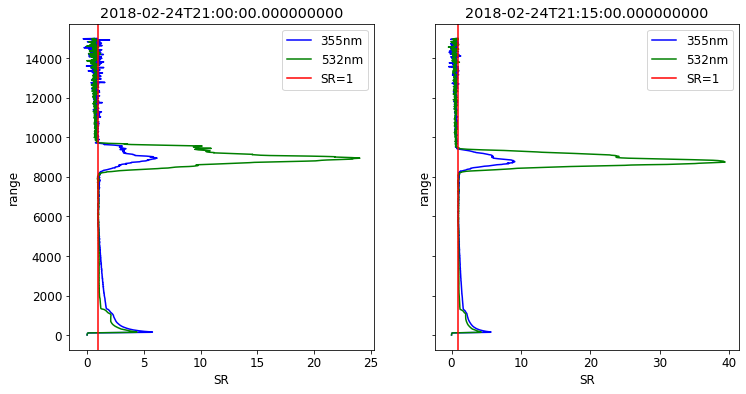

In [77]:
fg, axs = plt.subplots(figsize=(12,6), ncols=2, nrows=1, sharey=True)
# plt.rcParams['font.size'] = '14'
plt.rcParams['axes.labelsize'] = '14'
for i, ax in enumerate(axs.flatten()):
    sr_mean15min.isel(time=id_selectedtime[i], wavelength=0, range=limiteZ).plot.line(y='range', ax=ax, label='355nm', color='b')
    sr_mean15min.isel(time=id_selectedtime[i], wavelength=1, range=limiteZ).plot.line(y='range', ax=ax, label='532nm', color='g')
    ax.axvline(1, color='r', label='SR=1')
    #     ax.set_ylim(0, 20000)
#     ax.set_xlim(-1,25)
    ax.set(xlabel='SR', title=f'{sr_mean15min.time.values[id_selectedtime[i]]}')
    ax.legend()

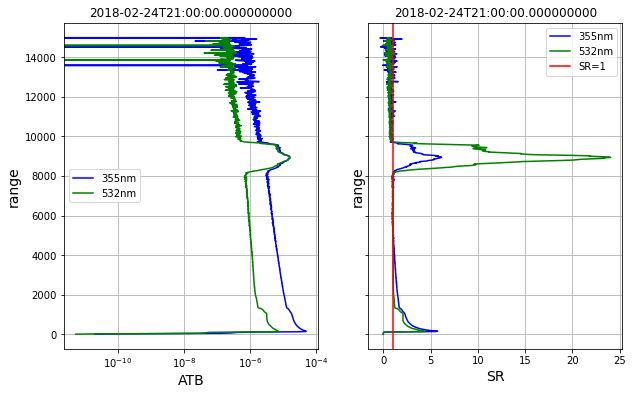

In [53]:
fg, (ax1, ax) = plt.subplots(figsize=(10,6), ncols=2, nrows=1, sharey=True)
plt.rcParams['axes.labelsize'] = '14'
ax1.grid()
ax.grid()

sr_mean15min.isel(time=id_selectedtime[0], wavelength=0, range=limiteZ).plot.line(y='range', ax=ax, label='355nm', color='b')
sr_mean15min.isel(time=id_selectedtime[0], wavelength=1, range=limiteZ).plot.line(y='range', ax=ax, label='532nm', color='g')
ax.axvline(1, color='r', label='SR=1')
#     ax.set_ylim(0, 20000)
#     ax.set_xlim(-1,25)
ax.set(xlabel='SR', title=f'{sr_mean15min.time.values[id_selectedtime[0]]}')
ax.legend()

data_mean15min['calibrated'].isel(time=id_selectedtime[0], wavelength=0, range=limiteZ).plot.line(y='range', label='355nm', color='b', ax=ax1, xscale='log')
data_mean15min['calibrated'].isel(time=id_selectedtime[0], wavelength=1, range=limiteZ).plot.line(y='range', ax=ax1, label='532nm', color='g', xscale='log')
ax1.set(xlabel='ATB', title=f'{sr_mean15min.time.values[id_selectedtime[0]]}')
ax1.legend()

In [173]:
!cat '/scratchx/nmpnguyen/IPRAL/raw/detection_clouds_test/detection_clouds_and_flags.py'

## Ce script est pour appliquer la méthode de détection des nuages sur la base de données IPRAL

# Date: _2021.10.19_
# Author: _Phuong Nguyen_ 

import xarray as xr
import numpy as np
from pathlib import Path
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import tqdm
import warnings
warnings.filterwarnings("ignore")

'''
tester flag code et verifier avec les quicklooks
enregistrer les quicklooks sur /scratchx/nmpnguyen/IPRAL/raw/
'''

def filter_profile_file(raw, channel, limiteTop, limiteBottom):
    '''
    Critere 1: flagger si le signal en haut plus qu'en bas
    '''
    # 1. CORRIGER RANGE CORRECTED SIGNAL WITH BACKGROUND
    filecorrected = raw #(raw[channel]/np.square(raw['range']) - raw['bckgrd_'+channel])*np.square(raw['range'])
    # 2. MEAN TOP AND BOTTOM SIGNAL
    limite = (raw['range']>limiteTop[0]) & (raw['range']<limiteTop[1])
    meanTop = filecorrected.isel(range=limite).mean(dim='range')
    limite = (raw['range']>limiteBottom[

In [221]:
new_csv = pd.read_csv('/scratchx/nmpnguyen/IPRAL/raw/detection_clouds_test/IPRAL_2018_validated_profiles3.csv',
                      parse_dates=True)
new_csv

,0


In [192]:
np.load('/scratchx/nmpnguyen/IPRAL/raw/SR_histogram/time_sr355.40_sr532.0.npy')

array(['2018-02-22T11:15:40.999999744', '2018-02-22T11:20:44.000000000',
       '2018-02-22T11:26:47.999999744', '2018-07-17T13:15:00.000000000',
       '2018-07-25T12:00:00.000000000', '2018-07-25T15:00:00.000000000',
       '2018-07-25T15:00:00.000000000', '2018-07-26T14:00:00.000000000',
       '2018-07-26T14:00:00.000000000', '2018-07-26T14:45:00.000000000',
       '2018-09-09T17:00:00.000000000', '2018-11-06T15:15:00.000000000',
       '2018-12-14T12:15:00.000000000', '2018-12-14T12:45:00.000000000'],
      dtype='datetime64[ns]')

In [4]:
data = xr.open_dataset(list(Path('/homedata/nmpnguyen/IPRAL/RF/Calibrated/').glob('*20180224*1440.nc'))[0])
# len(list(Path('/bdd/SIRTA/pub/basesirta/1a/ipral/2019').glob('**/**/*2019*1440.nc')))

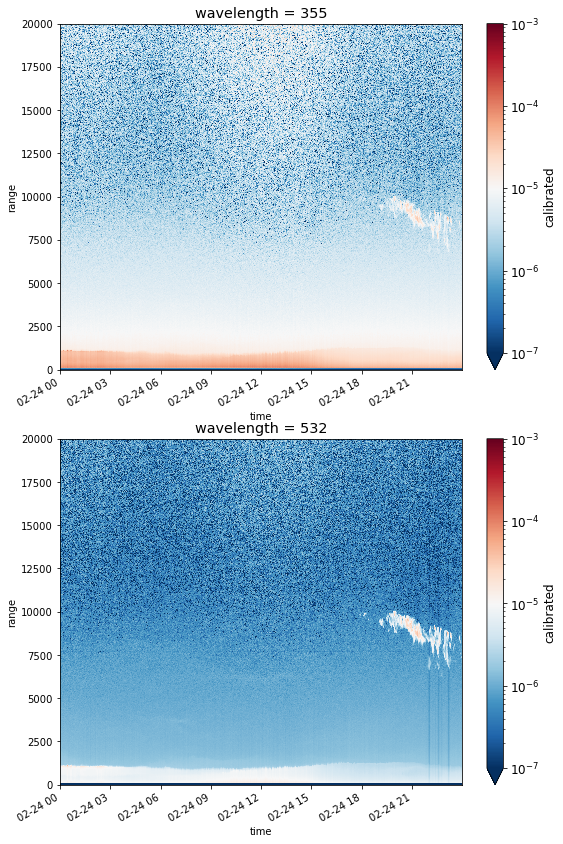

In [21]:
from matplotlib.colors import LogNorm
fig, (ax, ax2) = plt.subplots(figsize=(9,14), nrows=2)
plt.rcParams['font.size']=12
data.sel(wavelength=355)['calibrated'].plot(y='range', x='time', ax=ax, norm=LogNorm(vmin=1e-7, vmax=1e-3), robust=True, ylim=(0,20000))
ax.axvline(np.array('2018-12-14T12:15:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')
ax.axvline(np.array('2018-12-14T12:45:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')
data.sel(wavelength=532)['calibrated'].plot(y='range', x='time', ax=ax2, norm=LogNorm(vmin=1e-7, vmax=1e-3), robust=True, ylim=(0,20000))
ax2.axvline(np.array('2018-12-14T12:15:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')
ax2.axvline(np.array('2018-12-14T12:45:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')

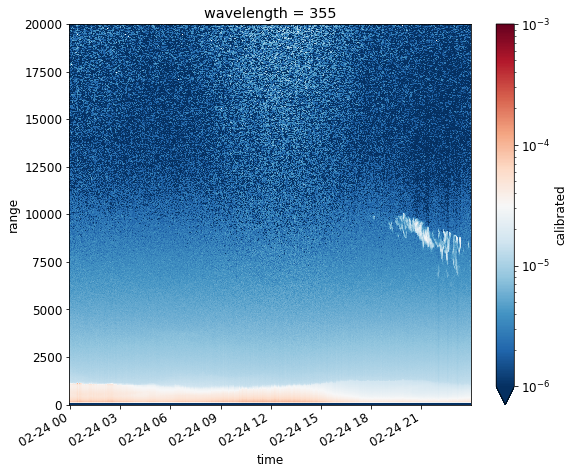

In [22]:
fig, ax2 = plt.subplots(figsize=(9,7))
plt.rcParams['font.size']=12
data.sel(wavelength=355)['calibrated'].resample(time='2min').mean('time').plot(y='range', x='time', ax=ax2, norm=LogNorm(vmin=1e-6, vmax=1e-3), robust=True, ylim=(0,20000))
ax2.axvline(np.array('2018-07-26T14:00:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')
ax2.axvline(np.array('2018-07-26T14:45:00.000000000', dtype='datetime64[ns]'), color='white', linestyle='--')

In [29]:
# calculer le gradient vetical de chaque point
data_mean = data.resample(time='2min').mean('time')
testtt = (data_mean['calibrated']/data_mean['simulated']).sel(wavelength=532).isel(range=slice(0,1400)).values
testt = np.concatenate([np.empty((testtt.shape[0],1))*np.NAN, testtt[:,:-1]], axis=1)


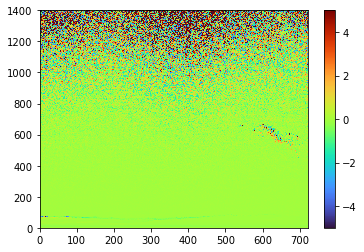

In [36]:
# plot
plt.pcolormesh((testtt-testt).T, cmap='turbo', vmin=-5, vmax=5)
plt.colorbar()


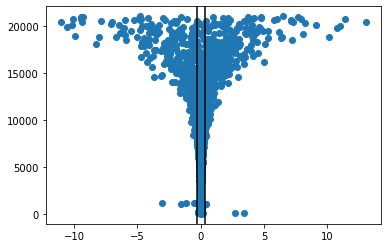

In [39]:
plt.subplots()
plt.scatter((testtt-testt)[3,slice(0,1400)], data_mean.isel(range=slice(0,1400))['range'])
plt.axvline(0.3, zorder=10, color='k')
plt.axvline(-0.3, zorder=10, color='k')